In [1]:
#!/usr/bin/env python3
## import libraries
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

In [3]:
model = load_model('./saved model/500_data/prediction_not_fixed_top5')

In [4]:
dataset = pd.read_csv("./datasets/split by random for distributed/prediction/top5_test.csv", header=None)
dataset = dataset.fillna(0)
dataset

,0,1,2,3,4,5,6,7,8,9,...,128,129,130,131,132,133,134,135,136,137
0,98.2815,302.499,43.4676,96.9341,292.527,45.9779,95.5062,280.345,48.7612,94.1041,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,49.2123,286.334,42.7695,48.9613,276.363,44.8216,48.7738,265.579,46.4913,48.9726,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
2,112.8700,299.723,43.2408,111.9300,288.898,44.8629,110.7920,278.619,46.1567,109.9550,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,118.7660,289.277,42.6587,117.3220,277.631,44.9817,115.8250,267.763,47.0061,114.5390,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
4,77.3434,323.038,43.3315,77.5085,313.501,45.7540,77.6320,301.557,47.9476,77.7495,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,68.9601,284.768,40.7917,69.0397,271.469,42.6744,68.5909,263.878,43.1709,68.6592,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
246,68.9769,301.014,44.6484,69.0480,290.905,46.6590,68.8589,281.277,48.0806,68.9315,...,33.7456,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
247,94.6610,316.460,44.9202,93.8949,305.949,47.1931,93.1668,295.935,49.1059,92.4186,...,32.4635,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
248,36.8026,303.074,43.7032,36.2891,292.288,45.0557,36.1343,280.696,46.0372,35.6420,...,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


In [5]:
np.set_printoptions(suppress=True)

In [7]:
dataset = np.array(dataset)

In [12]:
tmp = dataset[0,:]
tmp

array([ 98.2815  , 302.499   ,  43.4676  ,  96.9341  , 292.527   ,
        45.9779  ,  95.5062  , 280.345   ,  48.7612  ,  94.1041  ,
       272.595   ,  50.3743  ,  92.8215  , 261.5     ,  52.2046  ,
        91.1854  , 252.086   ,  53.5554  ,  89.8076  , 241.992   ,
        54.546   ,  88.4972  , 232.369   ,  55.0453  ,  87.2481  ,
       223.176   ,  55.0858  ,  85.8356  , 214.329   ,  54.9191  ,
        84.6636  , 204.92    ,  54.484   ,  83.3092  , 194.985   ,
        53.8138  ,  82.0435  , 186.339   ,  52.6338  ,  80.8082  ,
       177.188   ,  51.2617  ,  79.6271  , 168.405   ,  49.3761  ,
        77.9672  , 162.117   ,  46.7677  ,  76.8708  , 153.112   ,
        44.6548  ,  75.8108  , 143.746   ,  42.0688  ,  74.6444  ,
       137.394   ,  38.7968  ,  73.1341  , 127.159   ,  35.7772  ,
        71.8699  , 119.857   ,  32.0646  ,  70.6473  , 112.128   ,
        28.3348  ,  69.6377  , 103.499   ,  24.611   ,  68.1562  ,
        97.1902  ,  19.8694  ,  67.2239  ,  88.9905  ,  15.691

In [65]:
#!/usr/bin/env python3
import rospy
from std_msgs.msg import Float32MultiArray
import numpy as np
import pandas as pd
import cupy as cp
from keras.models import load_model
from keras.preprocessing import sequence
import tensorflow as tf
import matplotlib.pyplot as plt
import sys

graph = tf.get_default_graph()

# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.traj_done = False
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__tt = cp.zeros((1,4))
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top5'
        self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        self.__model = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        self.__classifier = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/classification_30ball_20200505_256to8')
        rospy.loginfo("loaded classification model")
        self.__pred_top5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top5')
        self.__pred_top6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        rospy.loginfo("loaded top prediction model")
        self.__pred_left5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_left5')
        self.__pred_left6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_left6')
        rospy.loginfo("loaded left prediction model")
        self.__pred_right5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_right5')
        self.__pred_right6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_right6')
        rospy.loginfo("loaded right prediction model")
        self.__pred_back5 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_back5')
        self.__pred_back6 = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_back6')
        rospy.loginfo("loaded back prediction model")
        rospy.loginfo("Load fixed model")

    ## print spin direction and speed
    def top5(self):
        print("top spin speed 5")
        self.__model = self.__pred_top5
        self.__direction = '_top5'

    def top6(self):
        print("top spin speed 6")
        self.__model = self.__pred_top6
        self.__direction = '_top6'

    def left5(self):
        print("left spin speed 5")
        self.__model = self.__pred_left5
        self.__direction = '_left5'

    def left6(self):
        print("left spin speed 6")
        self.__model = self.__pred_left6
        self.__direction = '_left6'

    def right5(self):
        print("right spin speed 5")
        self.__model = self.__pred_right5
        self.__direction = '_right5'

    def right6(self):
        print("right spin speed 6")
        self.__model = self.__pred_right6
        self.__direction = '_right6'

    def back5(self):
        print("back spin speed 5")
        self.__model = self.__pred_back5
        self.__direction = '_back5'

    def back6(self):
        print("back spin speed 6")
        self.__model = self.__pred_back6
        self.__direction = '_back6'

    def append_pred(self): ## Exhaustive
        with graph.as_default():
            self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                with graph.as_default():
                    self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        with graph.as_default():
            self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
            for i in range(1, self.__pred.shape[0]):
                self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
            '''
            index = cp.argmin(self.__pred[self.__anchor,:,:])
            row = int((index-1)/3)
            if (row < 8):
                self.__pred[self.__anchor, row+1:, :] = 0
            if (self.__anchor != self.__pred.shape[0]-1):
                self.__pred[self.__anchor+1:, :, :] = 0
            if (self.__anchor == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
                self.__pred[self.__anchor,0,:] = 0
            '''
            #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
            

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -45): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (-45 < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= -45):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (-45 < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        with graph.as_default():
            classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def final_padding(self):
        for i in range((self.__time_step-1)): ## padding zeros 4 times
            print("Time = ", self.__time)
            print("visual measurement = ", self.__vis_point)
            self.__tmp = cp.asnumpy(self.__tmp)
            self.__tmp = sequence.pad_sequences(self.__tmp, maxlen=(self.__tmp.shape[1]+3), padding='post', dtype='float32')
            self.__tmp = cp.array(self.__tmp)

            self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3)))
            self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
            self.show_spin_direction(self.__max_index) ## predct next 5 steps
            self.__time += self.__delta_T
            
    def predict_traj(self):
        #self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()
            
    def modify_offline_plot(self, tmp):
        arr = np.array([0,0,0,0])
        for i in range (tmp.shape[0]):
            if i % 2 != 0:
                arr = np.vstack((arr, tmp[i,:]))
        return arr[1:,:]

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)
        
        self.__arr_pred_possible = self.modify_offline_plot(self.__arr_pred_possible)
        #self.__vis_hitting_point = self.modify_offline_plot(self.__vis_hitting_point)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))
        

        ## plot hitting timing
        plt.clf()
        #plt.subplot(4,2,1)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,2)
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        #plt.subplot(4,2,3)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,4)
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        #plt.subplot(4,2,5)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,6)
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        #plt.subplot(4,2,7)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        #plt.subplot(4,2,8)
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = './exp20200601/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
        #plt.show()
    
    def plot_error(self):
        self.ax[0,0].remove()
        self.ax[0,1].remove()
        self.ax[1,0].remove()
        self.ax[1,1].remove()
        #self.fig.clf()
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)
        #self.__vis_hitting_point = self.__vis_hitting_point.reshape(1,self.__vis_hitting_point.shape[0])

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))
        
        #fig, ax = plt.subplots(2,2, figsize=(10.24,7.2))
        
        self.fig, self.ax = plt.subplots(2,2, figsize=(12.0,10.0)) ##(10.24,7.2)

        self.ax[0,0].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green')
        self.ax[0,0].plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        self.ax[0,0].scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        self.ax[0,0].grid(True)
        self.ax[0,0].set_xlabel('update times')
        self.ax[0,0].set_ylabel('hitting timimg (sec)')
        self.ax[0,0].set_title('Hitting timimg')

        self.ax[0,1].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green')
        self.ax[0,1].plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        self.ax[0,1].scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        self.ax[0,1].grid(True)
        self.ax[0,1].set_xlabel('update times')
        self.ax[0,1].set_ylabel('Euclidean distance (cm)')
        self.ax[0,1].set_title('Euclidean distance')

        self.ax[1,0].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green')
        self.ax[1,0].plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        self.ax[1,0].scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        self.ax[1,0].grid(True)
        self.ax[1,0].set_xlabel('update times')
        self.ax[1,0].set_ylabel('X-coordinate (cm)')
        self.ax[1,0].set_title('X-coordinate')

        self.ax[1,1].plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green')
        self.ax[1,1].plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        self.ax[1,1].scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        self.ax[1,1].grid(True)
        self.ax[1,1].set_xlabel('update times')
        self.ax[1,1].set_ylabel('Z-Coordinate (cm)')
        self.ax[1,1].set_title('Z-Coordinate')

        '''
        #plt.clf()
        plt.figure(figsize=(10.24,7.2))
        plt.subplot(2,2,1)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('hitting timimg')
        
        plt.subplot(2,2,2)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('Euclidean distance')
        
        plt.subplot(2,2,3)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('Coordinate X')

        plt.subplot(2,2,4)
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green')
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xlabel('update times')
        plt.ylabel('Coordinate Z')

        #plt.pause(0.00000000001)
        plt.show()
        '''
        #name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + self.__direction + str(rospy.get_time()) + '.png'
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + self.__direction + '.png'
        
        #self.fig.savefig(name)

        #self.fig.pause(0.001)
        #plt.savefig(name)
        #plt.clf()
        
        #self.fig.clf()
        #self.ax[0,0].remove()
        #self.ax[0,1].remove()
        #self.ax[1,0].remove()
        #self.ax[1,1].remove()


        #self.fig.clf()
        self.fig.show()
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))
        
    def return_hitting_err(self):
        return self.__tt
    
    def cal_hitting_err(self):
        ttt = self.__vis_hitting_point-self.__arr_pred_possible[-1:,:]
        self.__tt = cp.vstack((self.__tt, ttt.reshape(1,4)))
        
    def reset_args(self):
        self.__padding_done = False
        self.__arr_classification = cp.zeros([1,90])
        self.__coor = -10*cp.ones(6)
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__cnt = 1
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__vis_balls2 = cp.zeros((1,4))
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__find_possible_point = False
        self.__vis_possible_point = False
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667 ## reset time
        self.traj_done = False
    
    def print_arr_pred(self):
        print(self.__arr_pred_possible)
        return self.__arr_pred_possible
        
    def return_plot_arg(self):
        return self.__arr_pred_possible, self.__vis_hitting_point, cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0]), self.__arr_pred_possible[:,0], self.__arr_pred_possible[:,1], self.__arr_pred_possible[:,3], cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2))), cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            
            if (self.__tmp.shape[1] >= 27):
                self.predict_traj()
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                print("pred hitting point = \n", self.__arr_pred_possible)
                self.cal_hitting_err()
                #if (self.__pred_for_offline.shape[0] != 1):
                #self.plot_error()
                #self.plot_res()
                    #self.save_data()
                self.__num += 1

            
            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False
            

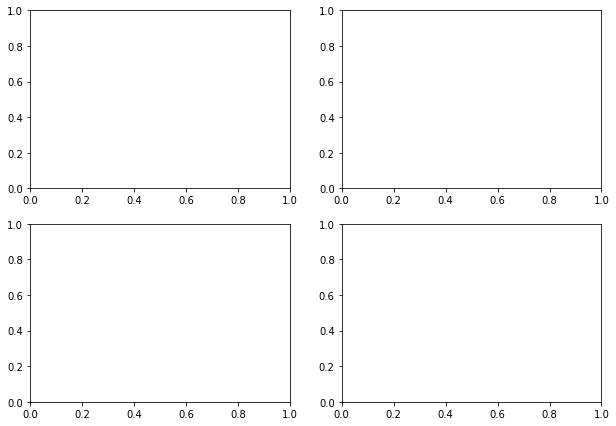

In [66]:
obj = Listener()

In [95]:
arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])
arr_pred_hitting_point = np.array([0,0,0,0])

obj.reset_args()

for i in range(0,250):
    trajectory = dataset[i,:]
    trajectory = trajectory.reshape(1,trajectory.shape[0])
    #trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],)
    for j in range(0, trajectory.shape[0], 3):
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    #obj.traj_done = True
    
    
    obj.traj_done = True
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point()
    pred_arr = obj.return_pred_res()
    #print("")
    #print("vis from obj = \n", vis_arr)
    #print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    print("aaaa = \n", pred_arr[-1:,:].reshape(1,4))
    tmppp = vis_arr.reshape(1,4) - pred_arr[-1:,:].reshape(1,4)
    print("bbbb = \n", tmppp)
    #pred_hitting_point = obj.return_hitting_err()
    if abs(tmppp[0,1]) < 30:
        arr_pred_hitting_point = np.vstack((arr_pred_hitting_point, tmppp))
    #print(pred_hitting_point)
    
    '''
    if pred_arr.shape[0] > 20:
        arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
    '''
    obj.reset_arr_pred()
    
#print("error between vis and 3 = \n", arr_for_vis-arr_for_pred_3rd)
#print("error between vis and end-10 = \n", arr_for_vis-arr_for_pred_end)


Time =  0.016667
visual measurement =  [[ 98.2815 302.499   43.4676]]

Time =  0.033334
visual measurement =  [[ 96.9341 292.527   45.9779]]

Time =  0.050001000000000004
visual measurement =  [[ 95.5062 280.345   48.7612]]

Time =  0.066668
visual measurement =  [[ 94.1041 272.595   50.3743]]

Time =  0.083335
visual measurement =  [[ 92.8215 261.5     52.2046]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 91.1854 252.086   53.5554]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 89.8076 241.992   54.546 ]]
1/1 [==============================] - 0s 6ms/step

Time =  0.133336
visual measurement =  [[ 88.4972 232.369   55.0453]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 87.2481 223.176   55.0858]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
cou

1/1 [==============================] - 0s 2ms/step
[[ 46.36950302 -52.06409073  42.88653564]
 [ -0.02251053   2.86121559  -1.59675217]
 [ -1.08377838  -0.78696823   0.21612549]
 [ -0.34991837   0.47192955  -0.34649849]
 [ -0.69193268   0.26028824  -0.05556297]
 [ -0.47922134   0.05211258   0.07031822]
 [ -0.5709343    0.25325012  -0.04400444]
 [ -0.48792267   0.10716248   0.08982277]
 [ -0.44465637   0.14609528   0.10104179]]
count down =  36
case a1
hitting timing and position =  [  0.83285614  47.42655455 -45.          43.17535556]

Time =  0.23333799999999993
visual measurement =  [[ 80.8082 177.188   51.2617]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-2.87982941 -1.88293076 -0.80036354]
 [-2.6132431  -1.29551315 -0.94992638]
 [-2.19717026 -1.03675461 -0.73182297]
 [-2.06267548 -0.99710846 -0.6078167 ]
 [-2.02183151 -0.99399948 -0.5658474 ]
 [-1.99726868 -0.98485565 -0.5465374 ]
 [-1.9802475  -0.9770546

1/1 [==============================] - 0s 2ms/step
[[-0.62340546 -0.08649063  0.39786053]
 [-0.31838226  0.08461761  0.08294868]
 [-0.28240967  0.18352509 -0.06410217]
 [-0.2781601   0.1662178  -0.04995155]
 [-0.30570221  0.14336777 -0.06257439]
 [-0.31000519  0.14241409 -0.0718174 ]
 [-0.30316162  0.14785385 -0.07583046]
 [-0.29349136  0.15411758 -0.07733727]
 [-0.28375244  0.16006851 -0.07780838]]
[[ 47.26159668   7.35774994  23.97307587]
 [ 48.81211853   3.65263557  28.19904709]
 [ 45.74256134  -2.54482651  28.81747818]
 [ 45.17098236  -9.71036911  31.05351067]
 [ 43.58728409 -16.57341385  32.37733459]
 [ 42.46772003 -24.12192154  33.73988342]
 [ 41.2399025  -31.38725662  34.60112762]
 [ 40.03332138 -38.45247269  34.9906311 ]
 [ 38.7297554  -44.74148941  34.71995926]]
count down =  26
case b2
hitting timing and position =  [  0.7507001   38.67617221 -45.          34.70883327]
1/1 [==============================] - 0s 2ms/step
[[ 47.26159668   7.35774994  23.97307587]
 [ 48.81211853 

1/1 [==============================] - 0s 2ms/step
[[ 42.43717575 -19.89991379  25.43844223]
 [ 41.26846695 -33.33554459  26.31984901]
 [ 41.22362518 -44.40356827  26.78980446]
 [ 40.73674011 -50.47631454  27.10836792]
 [ 32.97238541 -44.00376511  20.67523003]
 [ 31.5324173  -46.89556503  20.52737808]
 [ 28.53380013 -47.70824051  18.85939789]
 [ 10.01526642 -10.0838356    4.05623245]
 [ 10.77452087  -5.77553177   5.03543854]]
count down =  21
case a2
hitting timing and position =  [  0.74837806  41.17580601 -45.          26.82109201]
1/1 [==============================] - 0s 1ms/step
[[ 42.43717575 -19.89991379  25.43844223]
 [ 41.26846695 -33.33554459  26.31984901]
 [ 41.22362518 -44.40356827  26.78980446]
 [ 40.73674011 -50.47631454  27.10836792]
 [ 32.97238541 -44.00376511  20.67523003]
 [ 31.5324173  -46.89556503  20.52737808]
 [ 28.53380013 -47.70824051  18.85939789]
 [ 10.01526642 -10.0838356    4.05623245]
 [ 10.77452087  -5.77553177   5.03543854]]
count down =  21
case a2
hitti

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 35.93048859 -41.41168594  34.02718735]
 [ 34.31531525 -45.43398666  33.36898804]
 [ -0.03539276   1.64679718  -0.7098217 ]
 [ -0.26913452  -0.14139938   0.18627739]
 [ -0.02603912  -0.43835831   0.14592552]
 [ -0.52143478  -0.32716751   0.23076248]
 [ -0.6388092    0.27253342  -0.05971527]
 [ -0.57187653   0.23357391  -0.06538963]
 [ -0.67054749   0.18172073  -0.09914589]]
count down =  19
case a2
hitting timing and position =  [  0.78514729  34.48958459 -45.          33.44000454]
1/1 [==============================] - 0s 2ms/step
[[ 35.93048859 -41.41168594  34.02718735]
 [ 34.31531525 -45.43398666  33.36898804]
 [ -0.03539276   1.64679718  -0.7098217 ]
 [ -0.26913452  -0.14139938   0.18627739]
 [ -0.02603912  -0.43835831   0.14592552]
 [ -0.52143478  -0.32716751   0.23076248]
 [ -0.6388092    0.27253342  -0.05971527]
 [ -0.57187653   0.23357391  -0.06538963]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 42.35062027 -31.74766922  32.91418839]
 [ 40.68645859 -37.06668472  32.84727478]
 [ 39.9258194  -43.79874802  32.92639923]
 [ 12.41136551 -14.22369766  10.27276325]
 [ -1.20394897   0.51137924  -0.49478531]
 [  0.00441742   0.10498047  -0.06049728]
 [ -0.00408173   0.17026901  -0.02440071]
 [ -0.3214035    0.43078232  -0.21940041]
 [ -0.08869934   0.04658127   0.01937103]]
count down =  11
case b2
hitting timing and position =  [  0.73632202  39.7900929  -45.          32.94051799]

Time =  0.5500109999999997
visual measurement =  [[57.556  24.8798 21.5292]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 39.95254135 -43.41615677  33.07776642]
 [ -0.99789429   0.75670433  -0.81681061]
 [ -0.65822601   0.51749802  -0.43280602]
 [ -0.07707214   0.20977783  -0.13811874]
 [ -0.44154739   0.44710922  -0.29379082]
 [ -0.46464539   0.32366562  -0.22522354]
 [ -0.51922607   0.40625763  -0.25502777]
 [ -0.4996376    0.

[[ 51.40291977  -9.24991989  28.49796486]
 [ 49.68684006 -15.64493179  30.76063538]
 [ 50.22007751 -26.43450165  33.63830948]
 [ 49.12393188 -35.73726273  35.26991653]
 [ 41.49722672 -36.11665726  30.47174263]
 [ 43.40591049 -50.28288651  33.69680023]
 [  4.89782715  -7.94075012   4.12501144]
 [  8.68704987 -14.77334976   5.74229813]
 [ -1.80552673   1.56127167  -1.41789818]]
count down =  5
case a2
hitting timing and position =  [  0.70622948  42.69412194 -45.          32.49410804]
1/1 [==============================] - 0s 2ms/step
[[ 51.40291977  -9.24991989  28.49796486]
 [ 49.68684006 -15.64493179  30.76063538]
 [ 50.22007751 -26.43450165  33.63830948]
 [ 49.12393188 -35.73726273  35.26991653]
 [ 41.49722672 -36.11665726  30.47174263]
 [ 43.40591049 -50.28288651  33.69680023]
 [  4.89782715  -7.94075012   4.12501144]
 [  8.68704987 -14.77334976   5.74229813]
 [ -1.80552673   1.56127167  -1.41789818]]
count down =  5
case a2
hitting timing and position =  [  0.70622948  42.69412194 

[[-0.50997543  0.08756638 -0.12098694]
 [-0.06145477 -0.10865784 -0.02951813]
 [-0.10659027 -0.10269928 -0.12481499]
 [-0.10665131 -0.11325455 -0.1122036 ]
 [-0.13108444 -0.13713837 -0.11800957]
 [-0.13018799 -0.13787079 -0.11948395]
 [-0.11758804 -0.13075638 -0.11681938]
 [-0.10224533 -0.1222496  -0.11263466]
 [-0.0872879  -0.11401367 -0.1082325 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.50997543  0.08756638 -0.12098694]
 [-0.06145477 -0.10865784 -0.02951813]
 [-0.10659027 -0.10269928 -0.12481499]
 [-0.10665131 -0.11325455 -0.1122036 ]
 [-0.13108444 -0.13713837 -0.11800957]
 [-0.13018799 -0.13787079 -0.11948395]
 [-0.11758804 -0.13075638 -0.11681938]
 [-0.10224533 -0.1222496  -0.11263466]
 [-0.0872879  -0.11401367 -0.1082325 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.19595718 -0.27650452  0.1773777 ]
 [ 0.01422882 -0.1388855   0.0822773 ]
 [ 0.02131653 -0.12831497  0.050657

bbbb = 
 [[ 0.0006326  -0.55359697  0.          1.34683967]]

Time =  0.016667
visual measurement =  [[ 49.2123 286.334   42.7695]]

Time =  0.033334
visual measurement =  [[ 48.9613 276.363   44.8216]]

Time =  0.050001000000000004
visual measurement =  [[ 48.7738 265.579   46.4913]]

Time =  0.066668
visual measurement =  [[ 48.9726 252.83    48.6959]]

Time =  0.083335
visual measurement =  [[ 48.1842 245.381   49.1585]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 47.8428 234.81    49.906 ]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 47.7888 223.73    50.3371]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 47.3987 215.157   50.4297]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 47.3336 205.036   49.9887]]
1/1 [==============================] - 0s 4ms/step
left spin s

1/1 [==============================] - 0s 1ms/step

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819

1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[86.7074 28.7976 23.1356]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[85.8724 20.3796 25.2151]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[85.0562 11.9033 27.0792]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[84.186    3.89797 28.3979 ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5833449999999997
visual measurement =  [[83.4359  -4.35273 29.5637 ]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[ 82.6357 -12.1615  30.176 ]]
left spin speed 5
1/1 [==============================] - 0

count down =  33
case a2
hitting timing and position =  [  0.71864964  80.77091787 -45.          35.98048251]

Time =  0.18333699999999997
visual measurement =  [[ 78.3679 219.799   51.5455]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 79.19148254 -11.04016876  33.35775375]
 [ 78.83365631 -17.88246918  34.59818268]
 [ 79.23571777 -26.1060791   35.19734192]
 [ 78.83589935 -33.54008484  35.25144958]
 [ 78.59762573 -40.43026733  35.50539398]
 [ 68.70098877 -41.72828674  30.5044136 ]
 [  0.90071106  -0.36747742   0.13898277]
 [ -0.73428345  -0.51078796  -0.26890945]
 [  0.68709564  -0.21475601   0.63190842]]
count down =  32
case b2
1/1 [==============================] - 0s 3ms/step
[[ 79.19148254 -11.04016876  33.35775375]
 [ 78.83365631 -17.88246918  34.59818268]
 [ 79.23571777 -26.1060791   35.19734192]
 [ 78.83589935 -33.54008484  35.25144958]
 [ 78.59762573 -40.43026733  35.50539398]
 [ 68.70098877 -41.72828

count down =  26
case b2
hitting timing and position =  [  0.72207063  79.93216498 -45.          33.21763046]
1/1 [==============================] - 0s 2ms/step
[[ 79.51750183  18.49321747  27.45117569]
 [ 79.15441132  10.84767151  29.15906525]
 [ 79.09008026   3.12194061  30.58042717]
 [ 79.15937805  -4.69793701  31.68536949]
 [ 79.35152435 -12.42679596  32.5848999 ]
 [ 79.46103668 -20.02749634  33.18441772]
 [ 79.54370117 -27.59355164  33.47323608]
 [ 79.67411804 -35.11446381  33.48242188]
 [ 79.86911011 -42.58442688  33.28233337]]
count down =  26
case b2
hitting timing and position =  [  0.72207063  79.93216498 -45.          33.21763046]

Time =  0.2833389999999999
visual measurement =  [[ 78.5987 164.92    39.5885]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.44421387  10.01570511  29.10438919]
 [ 79.21013641   2.01049423  30.75028801]
 [ 79.03756714  -6.18343353  32.22628021]
 [ 79.04374695 -14.05754

hitting timing and position =  [  0.70147516  80.47173224 -45.          29.80787846]

Time =  0.36667399999999983
visual measurement =  [[ 78.608  122.191   21.5962]]
1/1 [==============================] - 0s 6ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 81.15076447 -30.76522827  32.41018295]
 [ 81.11930847 -38.0976181   32.27117538]
 [ 80.63500977 -45.02189636  31.55508232]
 [  0.54315186  -0.11186218   0.1172142 ]
 [  0.01800156  -0.10617828  -0.07877541]
 [ -0.0086441   -0.21245193   0.02679634]
 [  0.03027344  -0.26327515   0.02565956]
 [ -0.10092163  -0.2360611   -0.03541374]
 [ -0.07144165  -0.22867966  -0.03775215]]
count down =  20
case a2
hitting timing and position =  [  0.70006671  80.63654124 -45.          31.55734679]
1/1 [==============================] - 0s 2ms/step
[[ 81.15076447 -30.76522827  32.41018295]
 [ 81.11930847 -38.0976181   32.27117538]
 [ 80.63500977 -45.02189636  31.55508232]
 [  0.54315186  -0.11186218   0.1172142 ]
 [  0.

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.6497345   -2.98053741  31.29619408]
 [ 79.02446747 -10.81465149  32.21292877]
 [ 78.52593994 -19.41772461  32.68572998]
 [ 78.34967041 -26.81614685  33.24331284]
 [ 78.387146   -34.74960327  32.77972412]
 [ 78.79945374 -42.01204681  32.41729736]
 [ 79.16938782 -49.62532806  31.71313477]
 [  0.43519211  -0.03717804   0.04358864]
 [ -0.23179626   0.60779953  -0.04882431]]
count down =  15
case a2
hitting timing and position =  [  0.71013977  78.94464024 -45.          32.14093756]
1/1 [==============================] - 0s 3ms/step
[[ 78.6497345   -2.98053741  31.29619408]
 [ 79.02446747 -10.81465149  32.21292877]
 [ 78.52593994 -19.41772461  32.68572998]
 [ 78.34967041 -26.81614685  33.24331284]
 [ 78.387146   -34.74960327  32.77972412]
 [ 78.79945374 -42.01204681  32.41729736]
 [ 79.16938782 -49.62532806  31.71313477]
 [  0.43519211  -0.03717804   0.04358864]
 [ -0.23179626   0.60779953  -0.04882431]]
count down = 

1/1 [==============================] - 0s 2ms/step
[[ 78.1114502  -42.28235626  32.8612709 ]
 [ 78.59037781 -50.28227234  32.78730011]
 [ -0.02015686   0.12551117  -0.05415344]
 [ -0.1186409    0.09721375   0.03134346]
 [  0.43048096   0.15322113   0.08878517]
 [  0.12985611   0.04792786   0.05907631]
 [  0.01039505   0.04672241   0.01477623]
 [ -0.01279831   0.1503067    0.02396011]
 [ -0.05125427   0.24463272   0.05576134]]
count down =  10
case a2
hitting timing and position =  [  0.71101907  78.27414623 -45.          32.83614236]

Time =  0.5500109999999997
visual measurement =  [[78.1881 28.7136 24.7535]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.13286591 -0.02887726  0.0356102 ]
 [ 0.00431442 -0.02122498  0.02379417]
 [ 0.00124359 -0.00286484 -0.00269699]
 [ 0.00987625 -0.01464844  0.02987099]
 [ 0.01332092 -0.01760101  0.02401924]
 [ 0.00841522 -0.01368332  0.01591301]
 [ 0.00867081 -0.01154327  0.01331329]
 [ 0.00682831 -0.01263428  0.01134872]
 [

hitting timing and position =  [  0.7026587   75.92922072 -45.          32.79774988]

Time =  0.6333459999999996
visual measurement =  [[ 77.3907 -12.9068  32.8815]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.3870163  -21.13386917  33.7180481 ]
 [ 77.11229706 -28.8339386   33.82458496]
 [ 76.82782745 -36.54824829  33.78411865]
 [ 76.8503418  -44.63665009  33.62706757]
 [  0.21885681   0.00294876   0.03367615]
 [ -0.08753204   0.01916122   0.00070953]
 [ -0.02284241  -0.06410217  -0.01171684]
 [ -0.08177185  -0.07785797  -0.01626778]
 [  0.06690216  -0.05799866   0.01775742]]
count down =  3
case b2
hitting timing and position =  [  0.70076272  76.85135319 -45.          33.62001246]
1/1 [==============================] - 0s 2ms/step
[[ 77.3870163  -21.13386917  33.7180481 ]
 [ 77.11229706 -28.8339386   33.82458496]
 [ 76.82782745 -36.54824829  33.78411865]
 [ 76.8503418  -44.63665009  33.62706757]
 [  0.21885681   0.00294876   0.03367615]
 [ -0.08753204   

1/1 [==============================] - 0s 2ms/step
[[ 0.01028824 -0.05509186  0.00977325]
 [ 0.02616119 -0.03028107 -0.00469208]
 [ 0.00265503 -0.03540421 -0.00081825]
 [ 0.01194382 -0.02989578  0.00955963]
 [ 0.00024796 -0.03282928 -0.00016975]
 [ 0.00048828 -0.03200531 -0.00276756]
 [ 0.00214386 -0.03085327 -0.00343132]
 [ 0.00224304 -0.02983856 -0.00430489]
 [ 0.00166321 -0.02882385 -0.0052166 ]]
1/1 [==============================] - 0s 3ms/step
[[ 0.01028824 -0.05509186  0.00977325]
 [ 0.02616119 -0.03028107 -0.00469208]
 [ 0.00265503 -0.03540421 -0.00081825]
 [ 0.01194382 -0.02989578  0.00955963]
 [ 0.00024796 -0.03282928 -0.00016975]
 [ 0.00048828 -0.03200531 -0.00276756]
 [ 0.00214386 -0.03085327 -0.00343132]
 [ 0.00224304 -0.02983856 -0.00430489]
 [ 0.00166321 -0.02882385 -0.0052166 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.07705688 -0.01718903  0.03146362]
 [ 0.02875519 -0.0119781

top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[101.752 191.183  36.762]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 4ms/step

Time =  0.18333699999999997
visual measurement =  [[101.251  182.041   36.6516]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.20000399999999996
visual measurement =  [[100.766  174.362   31.8531]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.21667099999999995
visual measurement =  [[100.314  165.261   29.2222]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.23333799999999993
visual measurement =  [[ 99.8941 156.535   26.1099]]
1/1 [==============================] - 0s 5ms

1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.65234189  88.70708523 -45.          24.38503253]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.65234189  88.70708523 -45.          24.38503253]]

Time =  0.016667
visual measurement =  [[120.027  286.476   42.8318]]

Time =  0.033334
visual measurement =  [[118.95   276.237   44.6892]]

Time =  0.050001000000000004
visual measurement =  [[118.161  266.406   46.4696]]

Time =  0.066668
visual measurement =  [[117.205  257.142   47.4401]]

Time =  0.083335
visual measurement =  [[116.275  24

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[101.56397247 163.81854248  34.12004089]
 [104.35140991 160.21917725  31.0623703 ]
 [103.44999695 151.2510376   26.45246887]
 [104.49629211 144.38020325  21.40375328]
 [105.83911896 138.34660339  16.57155991]
 [107.1842804  133.54681396  12.08664894]
 [108.51633453 129.36256409   7.58610153]
 [109.53647614 124.37773132   2.78909874]
 [109.92904663 118.45446777  -1.76189041]]
1/1 [==============================] - 0s 2ms/step
[[101.56397247 163.81854248  34.12004089]
 [104.35140991 160.21917725  31.0623703 ]
 [103.44999695 151.2510376   26.45246887]
 [104.49629211 144.38020325  21.40375328]
 [105.83911896 138.34660339  16.57155991]
 [107.1842804  133.54681396  12.08664894]
 [108.51633453 129.36256409   7.58610153]
 [109.53647614 124.37773132   2.78909874]
 [109.92904663 118.45446777  -1.76189041]]

Time =  0.2500049999999999
visual measurement =  [[107.584  161.933   

visual measurement =  [[102.399 115.435  19.9  ]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 4ms/step
[[101.30336761 115.44355774  18.35216331]
 [100.97554016 108.94184875  13.05640411]
 [100.80632019 102.98977661  10.16766739]
 [100.80967712  99.02005005  10.08859634]
 [100.74221802  96.30596924  13.78176594]
 [100.84867859  94.18928528  19.02661896]
 [100.82081604  91.67358398  23.19215012]
 [100.61737061  88.9276123   26.24874306]
 [100.22374725  86.06465149  28.6774044 ]]
1/1 [==============================] - 0s 3ms/step
[[101.30336761 115.44355774  18.35216331]
 [100.97554016 108.94184875  13.05640411]
 [100.80632019 102.98977661  10.16766739]
 [100.80967712  99.02005005  10.08859634]
 [100.74221802  96.30596924  13.78176594]
 [100.84867859  94.18928528  19.02661896]
 [100.82081604  91.67358398  23.19215012]
 [100.61737061  88.9276123   26.24874306]
 [100.22374725  86.06465149  28.6774044 ]]

Time =  0.3666739999

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[93.40281677 56.55528641 16.02856827]
 [92.157341   49.9942894  17.35513687]
 [91.99606323 44.32611084 19.80179977]
 [91.45919037 38.52219391 21.75253105]
 [91.08569336 32.91737366 23.47254562]
 [90.63943481 27.32416916 24.87773323]
 [90.12670135 21.72260284 26.04796982]
 [89.55793762 16.15389252 27.0607357 ]
 [88.93651581 10.71370125 27.90794754]]
1/1 [==============================] - 0s 2ms/step
[[93.40281677 56.55528641 16.02856827]
 [92.157341   49.9942894  17.35513687]
 [91.99606323 44.32611084 19.80179977]
 [91.45919037 38.52219391 21.75253105]
 [91.08569336 32.91737366 23.47254562]
 [90.63943481 27.32416916 24.87773323]
 [90.12670135 21.72260284 26.04796982]
 [89.55793762 16.15389252 27.0607357 ]
 [88.93651581 10.71370125 27.90794754]]

Time =  0.48334299999999975
visual measurement =  [[95.7008 56.1542 16.5127]]
1/1 [==============================] - 0s 6ms/

1/1 [==============================] - 0s 1ms/step
[[ 87.46101379   5.73165894  31.16949081]
 [ 86.13184357  -2.19818497  32.57691956]
 [ 85.53669739  -9.37933731  33.27587509]
 [ 85.73829651 -16.18286514  33.89175415]
 [ 84.48761749 -22.88154984  33.64530945]
 [ 83.56742859 -29.2014122   33.33779144]
 [ 82.85952759 -35.54793167  32.93817139]
 [ 82.04541779 -41.90997696  32.36029053]
 [ 81.18610382 -48.08366776  31.66695976]]
count down =  8
case a2
hitting timing and position =  [  0.72500592  81.61531851 -45.          32.01326828]
1/1 [==============================] - 0s 2ms/step
[[ 87.46101379   5.73165894  31.16949081]
 [ 86.13184357  -2.19818497  32.57691956]
 [ 85.53669739  -9.37933731  33.27587509]
 [ 85.73829651 -16.18286514  33.89175415]
 [ 84.48761749 -22.88154984  33.64530945]
 [ 83.56742859 -29.2014122   33.33779144]
 [ 82.85952759 -35.54793167  32.93817139]
 [ 82.04541779 -41.90997696  32.36029053]
 [ 81.18610382 -48.08366776  31.66695976]]
count down =  8
case a2
hitting

left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.96530151 -36.7216835   30.7538929 ]
 [ 80.14427185 -43.3671608   29.78879166]
 [ 75.67851257 -47.90108109  27.57134628]
 [  0.42433929  -0.35934448  -0.182127  ]
 [ -0.39205933  -0.07948303   0.52975273]
 [  0.58918762  -0.41494751   0.15288353]
 [  0.36140442   0.08345413   0.33746815]
 [  0.14507294   0.45339203   0.38947487]
 [  0.31547546   0.38901138   0.39796638]]
count down =  2
case a2
hitting timing and position =  [  0.72734557  78.53598005 -45.          28.99020423]
1/1 [==============================] - 0s 2ms/step
[[ 79.96530151 -36.7216835   30.7538929 ]
 [ 80.14427185 -43.3671608   29.78879166]
 [ 75.67851257 -47.90108109  27.57134628]
 [  0.42433929  -0.35934448  -0.182127  ]
 [ -0.39205933  -0.07948303   0.52975273]
 [  0.58918762  -0.41494751   0.15288353]
 [  0.36140442   0.08345413   0.33746815]
 [  0.14507294   0.45339203   0.38947487]
 [  0.31547546   0.38901138   0.39796638]]
count down = 

 [[  0.71549019  84.29102584 -45.          31.87571949]]
bbbb = 
 [[ 0.00039009 -0.38569802 -0.         -0.23981395]]

Time =  0.016667
visual measurement =  [[ 75.5892 311.357   42.3553]]

Time =  0.033334
visual measurement =  [[ 75.2437 300.984   43.8938]]

Time =  0.050001000000000004
visual measurement =  [[ 74.902  289.754   45.0502]]

Time =  0.066668
visual measurement =  [[ 74.3237 278.977   46.165 ]]

Time =  0.083335
visual measurement =  [[ 74.0084 267.542   46.6715]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 73.4708 257.885   46.4872]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 72.9524 247.38    46.7422]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 72.4522 237.423   46.0604]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 71.7449 228.961   44.7763]]
1/1 [

1/1 [==============================] - 0s 2ms/step
[[ 54.616539   -37.36956024  32.48448944]
 [ 54.48235321 -46.61830902  32.30558014]
 [ -0.11837769  -0.18732834   0.05111313]
 [ -0.141922    -0.04301453   0.03187752]
 [ -0.33629608   0.096138     0.13318634]
 [ -0.23351288   0.1550827    0.14198875]
 [ -0.19524384   0.12880707   0.18678093]
 [ -0.26062012   0.11136627   0.1682415 ]
 [ -0.32951736   0.14312363   0.14299965]]
count down =  28
case a2
hitting timing and position =  [  0.66959632  54.5058325  -45.          32.33688497]

Time =  0.21667099999999995
visual measurement =  [[ 69.7927 190.666   37.9887]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 54.40151215 -37.4150238   35.31095886]
 [ 54.81187439 -45.88267517  35.76220322]
 [ -0.32827759  -0.03047943   0.01859093]
 [ -0.28248596  -0.22345352  -0.18148041]
 [ -0.42667389  -0.3950119    0.04849052]
 [ -0.40438843  -0.22544098   0.00247765]
 [ -0.4

hitting timing and position =  [  0.70814307  51.19264252 -45.          28.45152588]

Time =  0.2833389999999999
visual measurement =  [[ 67.7109 154.665   26.1087]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.42822266   1.83971405  29.01601791]
 [ 60.14403152  -9.05625153  28.5520668 ]
 [ 60.47751617 -15.96416473  27.8898735 ]
 [ 60.30698013 -23.10717773  26.96350861]
 [ 59.63822174 -30.68608856  25.57064438]
 [ 59.81163788 -38.38472748  24.23910713]
 [ 59.34155273 -45.96636963  22.12242699]
 [  0.42472076  -0.60107803  -1.09825897]
 [  0.84370804  -0.08400345   0.0459671 ]]
count down =  24
case a2
hitting timing and position =  [  0.68547141  59.40147063 -45.          22.39222281]
1/1 [==============================] - 0s 2ms/step
[[ 59.42822266   1.83971405  29.01601791]
 [ 60.14403152  -9.05625153  28.5520668 ]
 [ 60.47751617 -15.96416473  27.8898735 ]
 [ 60.30698013 -23.10717773  26.96350861]
 [ 59.6

hitting timing and position =  [  0.68900327  58.94855471 -45.          35.16432474]
1/1 [==============================] - 0s 2ms/step
[[ 56.95722961 -29.38538361  34.50749969]
 [ 57.47183609 -39.09770203  34.63274384]
 [ 59.70715332 -48.03204346  35.43740082]
 [  0.4288559    0.18567657  -0.15187263]
 [  0.18104172  -0.38326263  -0.01485634]
 [  0.09486389  -0.32648468   0.14481926]
 [ -0.04437256  -0.29550934   0.06632423]
 [ -0.10801697  -0.36542892   0.0433979 ]
 [ -0.12903595  -0.34768295   0.04722023]]
count down =  20
case a2
hitting timing and position =  [  0.68900327  58.94855471 -45.          35.16432474]

Time =  0.36667399999999983
visual measurement =  [[ 65.5789  112.71      5.32071]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 56.11161041 -33.70182037  39.66742706]
 [ 55.41472626 -42.37716675  39.63473511]
 [ 59.66810608 -53.37950134  42.21525574]
 [  0.60441589   0.09671021  -0.014431  ]
 [ 

hitting timing and position =  [  0.68998297  52.27084447 -45.          28.56541809]

Time =  0.4333419999999998
visual measurement =  [[63.6162 79.0979 13.3658]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.37704468   4.88209534  33.55941772]
 [ 57.6374054   -7.7362442   33.68444061]
 [ 53.15452576 -12.35582733  30.10314178]
 [ 52.14508057 -17.47875214  28.63275146]
 [ 55.55826569 -27.98734283  29.840168  ]
 [ 57.14691162 -38.15760803  28.74679565]
 [ 52.65349579 -45.9168396   23.18425369]
 [ 24.72588348 -24.4230423    7.55043411]
 [  4.97340012  -1.72586823   0.56984138]]
count down =  15
case a2
hitting timing and position =  [  0.68531639  53.1844429  -45.          23.84152996]
1/1 [==============================] - 0s 2ms/step
[[ 57.37704468   4.88209534  33.55941772]
 [ 57.6374054   -7.7362442   33.68444061]
 [ 53.15452576 -12.35582733  30.10314178]
 [ 52.14508057 -17.47875214  28.63275146]
 [ 55.5582

1/1 [==============================] - 0s 2ms/step
[[ 59.91379929 -32.12398529  30.093647  ]
 [ 59.98913956 -39.50112915  29.33322716]
 [ 60.06260681 -47.29499054  28.42001915]
 [  0.86814117   0.44029999   0.28204155]
 [ -0.60950851  -0.10395813  -0.46402359]
 [ -0.19297028  -0.04650879   0.06917763]
 [ -0.61432648   0.1243782   -0.30125427]
 [ -0.60810089  -0.02497482  -0.25424385]
 [ -0.76361084   0.01434326  -0.34443855]]
count down =  11
case a2
hitting timing and position =  [  0.68825479  60.04097355 -45.          28.68892356]

Time =  0.5166769999999997
visual measurement =  [[61.3026 36.5867 26.2205]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.84804535 -40.61689758  30.37548256]
 [  0.07748413   0.0260849    0.14802551]
 [ -0.34227371   0.0218811   -0.24811935]
 [  0.03722     -0.06963348   0.2183857 ]
 [ -0.15348816  -0.05183792   0.02407265]
 [ -0.21607971  -0.02371979  -0.01638985]
 [ -0.24986649  -0.02059174  -0.04579353]
 [ -0.23340988  -0.0


Time =  0.5833449999999997
visual measurement =  [[59.1564   3.84408 30.7513 ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.75305176  -6.16347122  32.05031586]
 [ 58.06407547 -13.40647888  32.61547089]
 [ 57.63318634 -21.89447784  32.72186279]
 [ 56.10239029 -28.82885742  31.76105309]
 [ 55.29716873 -36.69384766  30.64356804]
 [ 57.26903915 -45.07484436  30.99970436]
 [ -1.32944489   1.04121399  -0.30545807]
 [ -0.29450226  -0.04478836  -0.26038361]
 [ -0.2009201   -0.09187317  -0.13035583]]
count down =  5
case a2
hitting timing and position =  [  0.66682884  57.25142987 -45.          30.99652398]
1/1 [==============================] - 0s 2ms/step
[[ 57.75305176  -6.16347122  32.05031586]
 [ 58.06407547 -13.40647888  32.61547089]
 [ 57.63318634 -21.89447784  32.72186279]
 [ 56.10239029 -28.82885742  31.76105309]
 [ 55.29716873 -36.69384766  30.64356804]
 [ 57.26903915 -45.07484436  30.99970436]
 [ -1.32944489   1.04121399  -0.30545807]
 [ -0.29450226  -0

1/1 [==============================] - 0s 2ms/step
[[ 56.89366531 -35.33824921  29.93882561]
 [ 56.96574783 -43.49346924  29.41740036]
 [ -0.2082901   -0.25696564  -0.12504005]
 [ -0.22786713  -0.01223755  -0.04203606]
 [ -0.22460938  -0.04302216   0.08251762]
 [ -0.11158752   0.00686264   0.07491875]
 [ -0.14419937   0.02625275   0.05730247]
 [ -0.25791931   0.02368164  -0.00236511]
 [ -0.2891655    0.05940247  -0.00960541]]
count down =  1
case b2
hitting timing and position =  [  0.68642593  56.97906379 -45.          29.32107639]

Time =  0.6666799999999996
visual measurement =  [[ 56.5942 -35.5506  29.2867]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 56.17361069 -44.41171265  29.98030853]
 [  0.15865326  -0.06965637   0.1139679 ]
 [ -0.19114304   0.07406235  -0.15816689]
 [  0.00862122  -0.27378845   0.09744453]
 [ -0.02041626  -0.11724854   0.06072426]
 [ -0.13706207  -0.05788422  -0.00613022]
 [ -0.12452316  -0.08072662   0.00175095]
 [ -0.13135147  -0

1/1 [==============================] - 0s 2ms/step
[[ 0.0279274  -0.05010223  0.00284195]
 [ 0.01169205 -0.03672028 -0.01566887]
 [ 0.00930405 -0.03551865 -0.00438118]
 [ 0.00862885 -0.03149414 -0.00087547]
 [-0.00363159 -0.03479767 -0.0105381 ]
 [-0.00407028 -0.03469849 -0.01314163]
 [-0.00289154 -0.03411865 -0.01378059]
 [-0.00291443 -0.03352356 -0.01453209]
 [-0.003479   -0.03282928 -0.01530647]]
1/1 [==============================] - 0s 2ms/step
[[ 0.0279274  -0.05010223  0.00284195]
 [ 0.01169205 -0.03672028 -0.01566887]
 [ 0.00930405 -0.03551865 -0.00438118]
 [ 0.00862885 -0.03149414 -0.00087547]
 [-0.00363159 -0.03479767 -0.0105381 ]
 [-0.00407028 -0.03469849 -0.01314163]
 [-0.00289154 -0.03411865 -0.01378059]
 [-0.00291443 -0.03352356 -0.01453209]
 [-0.003479   -0.03282928 -0.01530647]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.03370667 -0.05981445  0.02564049]
 [ 0.01780319 -0.0380020

1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[107.701  187.246   50.6187]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[106.726  178.54    49.4066]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[105.601  170.174   48.0567]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[104.853  161.427   46.1407]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.2500049999999999
visual measurement =  [[103.579  152.989   44.1358]]
1/1 [==============================] - 0s 4ms/step
left spin

vis hitting point =  [  0.68606605  79.56012211 -45.          40.38488171]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.68606605  79.56012211 -45.          40.38488171]]

Time =  0.016667
visual measurement =  [[ 54.8494 286.279   42.2133]]

Time =  0.033334
visual measurement =  [[ 54.9406 276.704   43.2162]]

Time =  0.050001000000000004
visual measurement =  [[ 55.0779 266.204   44.3869]]

Time =  0.066668
visual measurement =  [[ 55.1909 256.258   44.7771]]

Time =  0.083335
visual measurement =  [[ 55.2937 246.744   44.9156]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 55.4326 236.484   45.0108]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 55.5044 227.826   44.2316]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 55.6552 217.392   43.64  ]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 3ms/step

Time =  0.6333459999999996
visual measurement =  [[ 59.4889 -33.4175  30.6695]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 59.6175 -41.1992  29.9235]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 59.8046 -48.5778  28.5197]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [=================

1/1 [==============================] - 0s 2ms/step
[[0.1146431  0.06779099 0.1111927 ]
 [0.08599854 0.0603447  0.08623314]
 [0.10430527 0.06457901 0.07871437]
 [0.09656906 0.05862808 0.08296204]
 [0.09481812 0.05900574 0.08378029]
 [0.09451294 0.05970001 0.08395958]
 [0.09453201 0.05988693 0.08405685]
 [0.09467316 0.05982208 0.08413506]
 [0.09483337 0.05964661 0.08418846]]
[[ 70.27854919 -24.53615952  30.10398483]
 [ 69.39554596 -28.87524796  28.03431892]
 [ 68.70253754 -33.4994545   25.63504601]
 [ 67.90240479 -38.14400101  23.56068611]
 [ 66.60099792 -42.37112808  21.04640579]
 [ 65.14823914 -46.72458267  18.00995064]
 [ -0.43222809   0.11501694   0.41780663]
 [ -0.42757034   0.71800232  -0.07482529]
 [ -1.068573     0.73736572   0.29174232]]
count down =  50
case a2
hitting timing and position =  [  1.03995649  65.72373673 -45.          19.21281559]
1/1 [==============================] - 0s 2ms/step
[[ 70.27854919 -24.53615952  30.10398483]
 [ 69.39554596 -28.87524796  28.03431892]


1/1 [==============================] - 0s 3ms/step
[[ 62.12303925 -49.96213913  13.78990173]
 [ -0.58551788   0.14590454   0.08686447]
 [ -0.46169662   0.36283112   0.09295273]
 [  0.17498016  -0.39304733  -0.08341599]
 [ -0.35630035   0.16044998   0.02824593]
 [ -0.12490463  -0.14566422   0.02293968]
 [ -0.31630707   0.03486633   0.08099556]
 [ -0.09173584  -0.10699844   0.08189201]
 [ -0.23091125   0.00156021   0.11004448]]
count down =  45
case a1
hitting timing and position =  [  1.03298302  62.83859435 -45.          14.47669102]

Time =  0.2833389999999999
visual measurement =  [[ 93.0796 161.739   40.3566]]
1/1 [==============================] - 0s 6ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[0.13101196 0.07217789 0.12085533]
 [0.0991478  0.0657692  0.09332466]
 [0.11762619 0.06996536 0.08584595]
 [0.10983658 0.06390762 0.09003639]
 [0.10804367 0.0642662  0.09081841]
 [0.10773849 0.06495285 0.09098053]
 [0.10774994 0.06513214 0.09107018]
 [0.107

visual measurement =  [[ 90.1451 133.388   27.9258]]
1/1 [==============================] - 0s 6ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 63.15332794 -48.1063118   14.93682861]
 [ -0.24658203   0.07724762  -0.22948647]
 [ -0.53230286   0.47854424   0.13107109]
 [ -0.80027008   0.3104229   -0.0152874 ]
 [ -0.34041595   0.39740753  -0.04399109]
 [ -0.83761597   0.67988586   0.13333321]
 [ -0.49009323   0.31873512  -0.03002357]
 [ -0.62942505   0.60944748   0.15851402]
 [ -0.5574646    0.42910194   0.05084991]]
count down =  36
case a1
hitting timing and position =  [  0.96640074  63.61529757 -45.          15.15913748]
1/1 [==============================] - 0s 2ms/step
[[ 63.15332794 -48.1063118   14.93682861]
 [ -0.24658203   0.07724762  -0.22948647]
 [ -0.53230286   0.47854424   0.13107109]
 [ -0.80027008   0.3104229   -0.0152874 ]
 [ -0.34041595   0.39740753  -0.04399109]
 [ -0.83761597   0.67988586   0.13333321]
 [ -0.49009323   0.31873512  -0.030

[[ 59.93468475 -41.7052803   22.53669357]
 [ 57.70465851 -44.99011612  20.77295494]
 [ 57.78918457 -50.06833267  18.41340065]
 [ -1.47608948   0.73002815   0.18730354]
 [ -0.71164322   0.13791275   0.17125511]
 [ -0.28146362  -0.1875267    0.15901375]
 [ -0.93914795   0.46708298   0.37127113]
 [ -0.73603821   0.51249695   0.26027679]
 [ -0.83364105   0.42963409   0.30749321]]
count down =  29
case a2
hitting timing and position =  [  0.91665256  57.70482302 -45.          20.76836247]
1/1 [==============================] - 0s 2ms/step
[[ 59.93468475 -41.7052803   22.53669357]
 [ 57.70465851 -44.99011612  20.77295494]
 [ 57.78918457 -50.06833267  18.41340065]
 [ -1.47608948   0.73002815   0.18730354]
 [ -0.71164322   0.13791275   0.17125511]
 [ -0.28146362  -0.1875267    0.15901375]
 [ -0.93914795   0.46708298   0.37127113]
 [ -0.73603821   0.51249695   0.26027679]
 [ -0.83364105   0.42963409   0.30749321]]
count down =  29
case a2
hitting timing and position =  [  0.91665256  57.7048230

1/1 [==============================] - 0s 2ms/step
[[ 66.45453644 -28.44647217  25.84028816]
 [ 65.606987   -33.0850563   24.44970131]
 [ 64.12113953 -37.40579605  22.40046692]
 [ 63.3085022  -42.60129929  20.56004143]
 [ 62.31596375 -47.99350357  18.04177094]
 [  1.61854935  -0.97886276   0.42662621]
 [ -0.12161636   0.0860405   -0.1386528 ]
 [ -0.33527374  -0.07605362  -0.01041985]
 [ -0.12398148  -0.13288116   0.09564018]]
count down =  22
case a2
hitting timing and position =  [  0.85926975  62.8669754  -45.          19.43979878]

Time =  0.5000099999999997
visual measurement =  [[83.6934 61.4116 13.712 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.45509338 -48.3533287   21.43566513]
 [ -0.35626221  -0.08717728  -0.12890244]
 [ -0.11425781   0.16039658  -0.12590981]
 [ -0.06386566   0.0201416   -0.08275986]
 [ -0.22010422   0.17819214  -0.09903145]
 [ -0.05903244   0.02103806  -0.07915115]
 [ -0.1141

1/1 [==============================] - 0s 2ms/step
[[ 73.23010254 -47.49103165  30.22738075]
 [  1.59350586  -1.24985123   1.40228176]
 [ -0.61087418  -0.25737762  -0.02920151]
 [  0.12958145  -0.11985397   0.19437599]
 [ -0.10373688   0.39937592   0.33096218]
 [  0.42853165  -0.5503006    0.13947868]
 [  0.31930923  -0.10621643   0.45445156]
 [  0.29389954  -0.34804153   0.33840752]
 [  0.33589935  -0.31163406   0.47818661]]
count down =  9
case a1
hitting timing and position =  [  0.73280075  73.49069591 -45.          30.06060564]
1/1 [==============================] - 0s 2ms/step
[[ 73.23010254 -47.49103165  30.22738075]
 [  1.59350586  -1.24985123   1.40228176]
 [ -0.61087418  -0.25737762  -0.02920151]
 [  0.12958145  -0.11985397   0.19437599]
 [ -0.10373688   0.39937592   0.33096218]
 [  0.42853165  -0.5503006    0.13947868]
 [  0.31930923  -0.10621643   0.45445156]
 [  0.29389954  -0.34804153   0.33840752]
 [  0.33589935  -0.31163406   0.47818661]]
count down =  9
case a1
hitting

1/1 [==============================] - 0s 3ms/step
[[ 77.61068726 -11.08343887  31.39482689]
 [ 75.87039185 -18.5132103   31.63056183]
 [ 74.74264526 -24.19418716  31.95530319]
 [ 74.56625366 -33.72430038  32.74136353]
 [ 76.81638336 -41.2050209   33.76220703]
 [ 78.859375   -52.04637527  34.94441223]
 [  5.01209259  -6.08380508   3.04766178]
 [  3.13576126  -5.25918961   2.9661932 ]
 [  1.53388977  -2.50883102   1.92213821]]
count down =  5
case a2
hitting timing and position =  [  0.72751377  77.53152561 -45.          34.17603393]

Time =  0.6500129999999996
visual measurement =  [[ 78.0505 -11.5664  32.1965]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.42759705 -17.34488297  32.6047287 ]
 [ 74.99332428 -24.30533218  32.97890472]
 [ 74.0405426  -30.61218262  32.43869781]
 [ 73.99304199 -38.75329971  32.33139801]
 [ 74.3463974  -45.79719162  31.9755497 ]
 [ 10.00875092  -6.60089493   4.57241631]
 [  1.06326294  -0.94572067   0.64039898]
 [  1.45975113  -

1/1 [==============================] - 0s 1ms/step
[[ 73.94971466 -49.8488121   28.64522362]
 [  1.185215    -1.15615082   1.25850296]
 [ -0.44530487  -0.36606979  -0.07746315]
 [  0.10328293  -0.00374222   0.10411835]
 [ -0.05033875   0.31040573   0.1360817 ]
 [  0.22129059  -0.39192581  -0.05539894]
 [  0.14004135   0.0101738    0.21796036]
 [  0.13721085  -0.18583298   0.10507584]
 [  0.11116791  -0.10872269   0.22051048]]
count down =  0
case a1
hitting timing and position =  [  0.72372051  74.67793385 -45.          30.42889696]
1/1 [==============================] - 0s 2ms/step
[[ 73.94971466 -49.8488121   28.64522362]
 [  1.185215    -1.15615082   1.25850296]
 [ -0.44530487  -0.36606979  -0.07746315]
 [  0.10328293  -0.00374222   0.10411835]
 [ -0.05033875   0.31040573   0.1360817 ]
 [  0.22129059  -0.39192581  -0.05539894]
 [  0.14004135   0.0101738    0.21796036]
 [  0.13721085  -0.18583298   0.10507584]
 [  0.11116791  -0.10872269   0.22051048]]
count down =  0
case a1
hitting

aaaa = 
 [[  0.72372051  74.67793385 -45.          30.42889696]]
bbbb = 
 [[0.00039203 0.21414975 0.         0.66449363]]

Time =  0.016667
visual measurement =  [[ 53.843  288.025   42.6606]]

Time =  0.033334
visual measurement =  [[ 53.7422 278.132   44.7174]]

Time =  0.050001000000000004
visual measurement =  [[ 53.9839 266.182   46.5828]]

Time =  0.066668
visual measurement =  [[ 53.5755 258.449   47.5571]]

Time =  0.083335
visual measurement =  [[ 53.5676 247.465   48.8151]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 53.504  238.138   49.6067]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 53.2092 229.169   49.9267]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 53.1389 220.618   50.0043]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 52.8403 212.377   49.4409]]
1


Time =  0.6333459999999996
visual measurement =  [[ 51.1298 -17.0202  33.5349]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6500129999999996
visual measurement =  [[ 51.0393 -24.0391  33.9117]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 51.0388 -31.3521  34.0984]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 51.0132 -38.7282  34.052 ]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.7000139999999996
visual measurement =  [[ 50.9417 -45.9504  33.712 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [=========================

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[43.6026 57.8028 15.5491]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[43.5454 49.462  19.31  ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[43.1988 41.8643 22.5986]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[42.9289 34.275  25.605 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[42.7259 26.7057 28.2199]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[42.477  19.1174 30.5051]]
right spin

1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[55.2135 99.1367 18.1489]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[55.1296 91.9462 13.7377]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[55.4681 80.8246 10.8544]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[55.0872  78.1419   4.08083]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[55.3125  70.2545   2.61432]]
1/1 [==============================] - 0s 4ms/step
right spin speed 

1/1 [==============================] - 0s 2ms/step
[[ 69.10172272 -28.3130722   33.15364075]
 [ 68.5783844  -32.24139023  30.94700623]
 [ 66.81793213 -35.27829361  27.83804321]
 [ 66.46798706 -39.99359512  25.72782135]
 [ 66.75569153 -45.45680618  23.32658768]
 [ 63.73511505 -47.80012894  19.44699097]
 [ -1.84486008   0.78381729  -0.67598534]
 [ -0.82267761   1.50464821  -0.84822083]
 [ -1.59761047   1.17910767  -0.29798317]]
count down =  59
case a2
hitting timing and position =  [  1.16993906  67.34452122 -45.          24.08287435]
1/1 [==============================] - 0s 2ms/step
[[ 69.10172272 -28.3130722   33.15364075]
 [ 68.5783844  -32.24139023  30.94700623]
 [ 66.81793213 -35.27829361  27.83804321]
 [ 66.46798706 -39.99359512  25.72782135]
 [ 66.75569153 -45.45680618  23.32658768]
 [ 63.73511505 -47.80012894  19.44699097]
 [ -1.84486008   0.78381729  -0.67598534]
 [ -0.82267761   1.50464821  -0.84822083]
 [ -1.59761047   1.17910767  -0.29798317]]
count down =  59
case a2
hitti

hitting timing and position =  [  0.95654588  67.64543135 -45.          15.52660928]
1/1 [==============================] - 0s 2ms/step
[[ 74.38152313 -15.41749191  29.94528198]
 [ 74.32414246 -21.20394516  28.62436867]
 [ 70.78884125 -21.72813416  26.41122627]
 [ 69.45163727 -26.3338356   23.69022179]
 [ 69.02175903 -31.36687088  21.63266945]
 [ 69.22780609 -37.58017349  20.64912987]
 [ 67.36047363 -41.67209244  17.43193245]
 [ 67.82884979 -47.14207077  14.30021191]
 [ 55.14499664 -42.49132919   8.66764832]]
count down =  43
case a2
hitting timing and position =  [  0.95654588  67.64543135 -45.          15.52660928]

Time =  0.2500049999999999
visual measurement =  [[ 95.1928 178.508   45.5333]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.43875122 -15.51628494  29.08897018]
 [ 72.77205658 -21.22132492  28.23662949]
 [ 69.38764191 -21.88363647  25.98883438]
 [ 67.65280151 -26.5002327   22.73130608]
 [ 66.

hitting timing and position =  [  0.9954212   65.02485898 -45.          17.06644031]

Time =  0.31667299999999987
visual measurement =  [[ 92.4103 145.591   33.2629]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.97090912 -37.0071907   25.90776825]
 [ 66.86529541 -40.98444748  23.4137764 ]
 [ 65.61360168 -46.24873734  20.62097359]
 [  0.59259796  -0.5076828    0.05155754]
 [ -0.19923401   0.05044174  -0.19346046]
 [ -0.048172     0.13212967  -0.15859795]
 [  0.16947174   0.01585007   0.1327076 ]
 [  0.3515625   -0.09252548   0.23281288]
 [  0.08278656   0.01603317   0.2623024 ]]
count down =  38
case a2
hitting timing and position =  [  0.95397256  65.9105148  -45.          21.28345176]
1/1 [==============================] - 0s 1ms/step
[[ 67.97090912 -37.0071907   25.90776825]
 [ 66.86529541 -40.98444748  23.4137764 ]
 [ 65.61360168 -46.24873734  20.62097359]
 [  0.59259796  -0.5076828    0.05155754]
 [ -0

1/1 [==============================] - 0s 1ms/step
[[ 67.8065033  -24.57544327  26.40723419]
 [ 68.04933167 -28.4475975   24.28823471]
 [ 67.52214813 -34.05072403  22.00896835]
 [ 65.69187927 -37.31783676  19.40730667]
 [ 63.59370422 -41.12417221  17.01471519]
 [ 63.18610382 -46.7617836   13.92037487]
 [  6.8328476   -4.04111099   1.77282143]
 [  0.78734589  -0.38866043  -0.691576  ]
 [ -0.82681274   0.60359192  -0.26521873]]
count down =  32
case a2
hitting timing and position =  [  0.92189353  63.31348112 -45.          14.88737271]
1/1 [==============================] - 0s 2ms/step
[[ 67.8065033  -24.57544327  26.40723419]
 [ 68.04933167 -28.4475975   24.28823471]
 [ 67.52214813 -34.05072403  22.00896835]
 [ 65.69187927 -37.31783676  19.40730667]
 [ 63.59370422 -41.12417221  17.01471519]
 [ 63.18610382 -46.7617836   13.92037487]
 [  6.8328476   -4.04111099   1.77282143]
 [  0.78734589  -0.38866043  -0.691576  ]
 [ -0.82681274   0.60359192  -0.26521873]]
count down =  32
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 70.57765961 -10.08345413  30.95039368]
 [ 69.08415222 -14.3747673   30.23006058]
 [ 68.52815247 -18.75518417  29.36986923]
 [ 66.73381042 -23.48349762  27.51465988]
 [ 65.75915527 -27.95138168  25.52058411]
 [ 65.20852661 -33.27817154  23.84785271]
 [ 63.94982529 -37.81911087  21.44652557]
 [ 62.63705826 -41.89022446  18.98933983]
 [ 60.77635574 -45.6206398   16.31243896]]
count down =  26
case a2
hitting timing and position =  [  0.88612394  61.08592611 -45.          16.75780257]

Time =  0.46667599999999976
visual measurement =  [[87.0936  71.8459   8.72935]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.23179626 -27.3692894   27.90376663]
 [ 71.07875824 -32.69681168  26.04297638]
 [ 69.34919739 -36.20427322  23.8812294 ]
 [ 68.88589478 -41.6551857   21.8319397 ]
 [ 67.6581955  -46.85169601  19.67886734]
 [ 64.75444031 -49.95186234  16.19029999]
 [  0.

hitting timing and position =  [  0.73771325  72.53553567 -45.          30.08637114]

Time =  0.5333439999999997
visual measurement =  [[84.5871 37.9332 23.0339]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.05755615 -33.2685585   32.53598785]
 [ 75.25653076 -41.66849899  32.56761932]
 [ 71.71156311 -46.58693314  30.67720222]
 [  0.55673218   0.05781937   0.12596703]
 [ -1.03314972   0.44599915   0.36387825]
 [ -0.07793427   0.41506577   0.44520092]
 [  0.1671257    0.39842224   0.58967972]
 [ -0.01899719   0.6736908    0.56557083]
 [  0.13331223   0.52627563   0.54886055]]
count down =  11
case a2
hitting timing and position =  [  0.72205861  72.85534718 -45.          31.28714544]
1/1 [==============================] - 0s 2ms/step
[[ 75.05755615 -33.2685585   32.53598785]
 [ 75.25653076 -41.66849899  32.56761932]
 [ 71.71156311 -46.58693314  30.67720222]
 [  0.55673218   0.05781937   0.12596703]
 [ -1.03314972   0.44599915   0.36387825]
 [ -0.07793427   0

1/1 [==============================] - 0s 2ms/step
[[ 80.70167542  -0.04937744  31.9245739 ]
 [ 77.85882568  -8.13937759  31.7656517 ]
 [ 77.23907471 -15.2730751   32.98759842]
 [ 76.65251923 -23.45966339  33.59314728]
 [ 75.6512146  -29.40436172  33.35447693]
 [ 76.20803833 -37.7965889   33.51868057]
 [ 75.07329559 -44.73970413  32.19302368]
 [ 74.63976288 -51.69966507  31.73407173]
 [ 48.11974716 -35.00409317  21.23697662]]
count down =  7
case a2
hitting timing and position =  [  0.73272467  75.05708189 -45.          32.17585932]

Time =  0.6166789999999996
visual measurement =  [[81.6552  -3.02742 33.5337 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.15272522 -10.25402832  33.19765472]
 [ 77.22647095 -17.77005386  33.4461441 ]
 [ 75.63405609 -23.35846329  33.87686157]
 [ 75.76112366 -33.38634109  35.0625    ]
 [ 77.99235535 -40.82236099  36.34461212]
 [ 79.73709106 -51.28552628  37.82413483]
 [  7.38194275  -8.13599777   4.52055264]
 [  4.62611389  -

1/1 [==============================] - 0s 2ms/step
[[ 76.80901337 -40.89377975  32.93956757]
 [ 77.17378998 -49.42500687  33.01087189]
 [  2.40573883   0.12940598   1.17001152]
 [  0.64861298   0.75859451   1.06400108]
 [  0.66553497   0.78532791   0.76225662]
 [ -0.78437805   1.44967651   0.37422085]
 [ -0.22629929   1.22311401   0.34080887]
 [ -0.02666473   1.17046165   0.4976387 ]
 [  0.12921906   1.01731873   0.57199383]]
count down =  1
case a2
hitting timing and position =  [  0.7086589   76.98458636 -45.          32.97388751]
1/1 [==============================] - 0s 2ms/step
[[ 76.80901337 -40.89377975  32.93956757]
 [ 77.17378998 -49.42500687  33.01087189]
 [  2.40573883   0.12940598   1.17001152]
 [  0.64861298   0.75859451   1.06400108]
 [  0.66553497   0.78532791   0.76225662]
 [ -0.78437805   1.44967651   0.37422085]
 [ -0.22629929   1.22311401   0.34080887]
 [ -0.02666473   1.17046165   0.4976387 ]
 [  0.12921906   1.01731873   0.57199383]]
count down =  1
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[-0.00429535  0.03223419 -0.01622772]
 [-0.01230621  0.02971268 -0.00963402]
 [-0.00228882  0.0292244  -0.01465225]
 [-0.0104332   0.02332687 -0.00935936]
 [-0.01207733  0.02388    -0.00795937]
 [-0.01230621  0.02466965 -0.00749016]
 [-0.01225281  0.02492142 -0.00724983]
 [-0.01209259  0.0248909  -0.00710678]
 [-0.01192856  0.02474594 -0.00701523]]
1/1 [==============================] - 0s 2ms/step
[[-0.00429535  0.03223419 -0.01622772]
 [-0.01230621  0.02971268 -0.00963402]
 [-0.00228882  0.0292244  -0.01465225]
 [-0.0104332   0.02332687 -0.00935936]
 [-0.01207733  0.02388    -0.00795937]
 [-0.01230621  0.02466965 -0.00749016]
 [-0.01225281  0.02492142 -0.00724983]
 [-0.01209259  0.0248909  -0.00710678]
 [-0.01192856  0.02474594 -0.00701523]]
vis hitting point =  [  0.70770485  78.3995505  -45.          35.48824522]
pred hitting point = 
 [[  1.08671908  73.49713362 -45.          24.01170186]
 [  1.16993906  67.34452122 -45.         

1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 50.6281 148.462   24.0755]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 49.7004 139.848   20.0213]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 48.9058 130.076   16.2256]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 47.6237 122.504   11.2567]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.36667399999999983
visual measurement =  [[ 47.3299  112.153   

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 96.88669586  -5.43789291  29.22250366]
 [ 97.62574768 -10.97984695  30.11951065]
 [ 99.24473572 -16.66857529  31.04628754]
 [100.58914185 -22.52295303  31.72190094]
 [102.26947784 -28.04878235  32.16433716]
 [103.55429077 -33.56506729  32.40259552]
 [105.48065186 -38.74104691  32.66604614]
 [108.09705353 -43.85337448  32.59144974]
 [ 21.53224945  -9.04104233   7.09006786]]
count down =  34
case b2
hitting timing and position =  [  0.75375318 108.68387683 -45.          32.57471878]
1/1 [==============================] - 0s 1ms/step
[[ 96.88669586  -5.43789291  29.22250366]
 [ 97.62574768 -10.97984695  30.11951065]
 [ 99.24473572 -16.66857529  31.04628754]
 [100.58914185 -22.52295303  31.72190094]
 [102.26947784 -28.04878235  32.16433716]
 [103.55429077 -33.56506729  32.40259552]
 [105.48065186 -38.74104691  32.66604614]
 [108.09705353 -43.85337448  32.59144974]
 [ 

1/1 [==============================] - 0s 1ms/step
[[103.36501312 -30.05894852  32.57849884]
 [104.94432068 -35.00459671  32.03278351]
 [106.54581451 -40.65546036  31.58679581]
 [108.08250427 -45.42803574  30.43980408]
 [  1.45891571  -0.51810455   0.21706963]
 [  0.17145538  -0.01738167  -0.1295414 ]
 [  0.41724014  -0.2517662    0.0696764 ]
 [  0.06737518  -0.0110321    0.0067215 ]
 [ -0.36064148   0.16731644  -0.16163158]]
count down =  30
case a2
hitting timing and position =  [  0.75150981 107.9446839  -45.          30.54267379]

Time =  0.2666719999999999
visual measurement =  [[ 72.5138 157.361   38.4717]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[103.64028931 -34.56067276  32.19234467]
 [105.67466736 -40.08086014  32.06964493]
 [106.52171326 -45.20119858  31.01167297]
 [ -0.06139374   0.04641724   0.02889919]
 [  0.04934692  -0.21004486  -0.15625286]
 [  0.08461761  -0.06447983  -0.02325344]
 [  0.


Time =  0.35000699999999985
visual measurement =  [[ 73.63  114.544  20.982]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.03105164 -0.07472801 -0.01440811]
 [-0.06464386 -0.06419373 -0.02155781]
 [ 0.01345062 -0.02433395 -0.00114632]
 [-0.03730392 -0.06528091  0.00332546]
 [-0.03658295 -0.07906342  0.01071644]
 [-0.03907013 -0.08310318  0.01250076]
 [-0.04009247 -0.083992    0.01354885]
 [-0.0405159  -0.08408737  0.0141077 ]
 [-0.0407486  -0.08397293  0.01439571]]
[[ 93.30332184  -3.21298218  33.63599396]
 [ 96.0085144   -9.0986557   34.35825729]
 [ 96.75318146 -14.55257034  33.89609528]
 [ 97.96065521 -20.20354462  33.42309952]
 [ 99.00341034 -25.47441483  32.60449982]
 [100.33053589 -30.79120255  31.57928848]
 [101.65075684 -36.07464981  30.30358887]
 [102.94355774 -41.30682755  28.80867767]
 [104.19845581 -46.45469284  27.12459755]]
count down =  26
case a2
hitting timing and position =  [  0.78805879

1/1 [==============================] - 0s 2ms/step
[[ 93.22441101 -37.1165123   34.73073578]
 [ 93.84724426 -43.41019821  33.67912292]
 [ 95.74739075 -49.189785    33.11355209]
 [ -0.4401474    0.38651276  -0.42109585]
 [  0.12668228   0.53641129   0.05775261]
 [ -0.01358032   0.25276184  -0.07998848]
 [ -0.06615067   0.31417465  -0.10553741]
 [  0.02905273   0.26569939  -0.14750671]
 [  0.22977448   0.1198082   -0.13796425]]
count down =  20
case a2
hitting timing and position =  [  0.77876438  94.36992112 -45.          33.52355029]
1/1 [==============================] - 0s 1ms/step
[[ 93.22441101 -37.1165123   34.73073578]
 [ 93.84724426 -43.41019821  33.67912292]
 [ 95.74739075 -49.189785    33.11355209]
 [ -0.4401474    0.38651276  -0.42109585]
 [  0.12668228   0.53641129   0.05775261]
 [ -0.01358032   0.25276184  -0.07998848]
 [ -0.06615067   0.31417465  -0.10553741]
 [  0.02905273   0.26569939  -0.14750671]
 [  0.22977448   0.1198082   -0.13796425]]
count down =  20
case a2
hitti

hitting timing and position =  [  0.68742002  82.62121483 -45.          28.81694061]
1/1 [==============================] - 0s 1ms/step
[[ 82.41338348 -43.15452194  28.9931221 ]
 [ -2.09083557   0.77975464  -0.41633129]
 [ -0.73976898   0.2441349   -0.60008144]
 [ -0.21850586   0.39418411  -0.15374279]
 [ -0.55247116   0.25773239  -0.26257133]
 [ -0.50928116   0.24544525  -0.2332201 ]
 [ -0.5335083    0.25548935  -0.20704842]
 [ -0.59528351   0.25640869  -0.20352936]
 [ -0.62121964   0.25379181  -0.18866253]]
count down =  9
case b1
hitting timing and position =  [  0.68742002  82.62121483 -45.          28.81694061]

Time =  0.5333439999999997
visual measurement =  [[76.66   24.6669 23.9243]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.39610291  0.09065437 -0.58422947]
 [-0.03650284 -0.02232933 -0.54069805]
 [ 0.01100922  0.03892517 -0.52823162]
 [-0.03459167  0.02622223 -0.52928066]
 [-0.03388977  0.02487373 -0.52235126]
 [-0.03637695  0.02674866 -0.5212

1/1 [==============================] - 0s 2ms/step
[[ 77.43457031 -24.25621414  30.1445961 ]
 [ 78.3959198  -30.9714241   30.72125244]
 [ 79.17704773 -38.13075638  30.57695389]
 [ 79.94142151 -45.63546371  30.10062027]
 [  2.28576279  -1.4675827    1.28551006]
 [  0.07619476  -0.48467636   0.6298914 ]
 [ -0.12459946  -0.50818825   0.6161375 ]
 [ -0.3279953   -0.32621765   0.5821228 ]
 [ -0.72524261   0.01753235   0.41719055]]
count down =  3
case a2
hitting timing and position =  [  0.66809128  79.87669789 -45.          30.14095399]
1/1 [==============================] - 0s 2ms/step
[[ 77.43457031 -24.25621414  30.1445961 ]
 [ 78.3959198  -30.9714241   30.72125244]
 [ 79.17704773 -38.13075638  30.57695389]
 [ 79.94142151 -45.63546371  30.10062027]
 [  2.28576279  -1.4675827    1.28551006]
 [  0.07619476  -0.48467636   0.6298914 ]
 [ -0.12459946  -0.50818825   0.6161375 ]
 [ -0.3279953   -0.32621765   0.5821228 ]
 [ -0.72524261   0.01753235   0.41719055]]
count down =  3
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[-0.04471588  0.03438568 -0.02173901]
 [-0.01164246  0.02082634 -0.0047245 ]
 [-0.02403641  0.01800156 -0.01368999]
 [-0.01214218  0.00577164 -0.00600529]
 [-0.02181244  0.00154114 -0.00903893]
 [-0.02355194  0.00102425 -0.00955963]
 [-0.02349091  0.00077438 -0.00949574]
 [-0.02347183  0.00067902 -0.00948811]
 [-0.02347565  0.00065231 -0.00948429]]
1/1 [==============================] - 0s 2ms/step
[[-0.04471588  0.03438568 -0.02173901]
 [-0.01164246  0.02082634 -0.0047245 ]
 [-0.02403641  0.01800156 -0.01368999]
 [-0.01214218  0.00577164 -0.00600529]
 [-0.02181244  0.00154114 -0.00903893]
 [-0.02355194  0.00102425 -0.00955963]
 [-0.02349091  0.00077438 -0.00949574]
 [-0.02347183  0.00067902 -0.00948811]
 [-0.02347565  0.00065231 -0.00948429]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.03171539 -0.00444412  0.0213232 ]
 [ 0.03093338 -0.01929


Time =  0.050001000000000004
visual measurement =  [[ 75.4159 290.084   43.7211]]

Time =  0.066668
visual measurement =  [[ 75.5816 279.459   44.3346]]

Time =  0.083335
visual measurement =  [[ 75.4927 269.255   44.9301]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.6375 258.394   44.9534]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.7862 249.212   44.5461]]
1/1 [==============================] - 0s 5ms/step

Time =  0.133336
visual measurement =  [[ 75.696  240.404   43.6915]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 75.8037 228.753   42.9727]]
1/1 [==============================] - 0s 5ms/step
back spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  37
1/1 [==============================] - 0s 2ms/step
[[ 83.2962265  -43.64105606  25.71640587]
 [ 83.33856964 -48.11091614  25.304

1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.63815308 -44.80912018  28.6901989 ]
 [  0.19286346  -0.16532516   0.08901596]
 [  0.04485703   0.00111389   0.03406334]
 [  0.06676483  -0.07718658  -0.01529121]
 [  0.09529877  -0.07070541   0.00875854]
 [  0.05990601  -0.03969193  -0.00401497]
 [  0.06552887  -0.07176208  -0.00509453]
 [  0.06983948  -0.10328674   0.00127792]
 [  0.12486267  -0.08926773   0.02974701]]
count down =  27
case b1
hitting timing and position =  [  0.70047914  75.71064819 -45.          28.70237127]
1/1 [==============================] - 0s 3ms/step
[[ 75.63815308 -44.80912018  28.6901989 ]
 [  0.19286346  -0.16532516   0.08901596]
 [  0.04485703   0.00111389   0.03406334]
 [  0.06676483  -0.07718658  -0.01529121]
 [  0.09529877  -0.07070541   0.00875854]
 [  0.05990601  -0.03969193  -0.00401497]
 [  0.06552887  -0.07176208  -0.00509453]
 [  0.06983948  -0.10328674   0.00127792]
 [  0

hitting timing and position =  [  0.68501307  78.63775139 -45.          18.04580401]

Time =  0.31667299999999987
visual measurement =  [[ 76.7916 139.744   14.9561]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.64660645 -20.63551331  24.93686295]
 [ 78.1664505  -28.60617065  24.15137863]
 [ 77.76498413 -35.78411865  22.91810608]
 [ 77.33183289 -43.32873535  21.35286331]
 [ -0.25759125  -0.21416473   0.12513542]
 [ -0.17234802   0.03290558  -0.15118599]
 [ -0.24181747   0.09255219   0.21349144]
 [ -0.04820251   0.18351364   0.11392784]
 [  0.00366211   0.06518555   0.09075356]]
count down =  21
case b2
hitting timing and position =  [  0.68703903  77.2358823  -45.          21.00613464]
1/1 [==============================] - 0s 2ms/step
[[ 77.64660645 -20.63551331  24.93686295]
 [ 78.1664505  -28.60617065  24.15137863]
 [ 77.76498413 -35.78411865  22.91810608]
 [ 77.33183289 -43.32873535  21.35286331]
 [ -0.

count down =  12
case b2
hitting timing and position =  [  0.68979304  74.62659749 -45.          27.66242259]

Time =  0.48334299999999975
visual measurement =  [[76.9069 54.6487 23.1558]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.01528931 -25.73532104  31.09144974]
 [ 76.78903198 -32.99681854  29.87438011]
 [ 76.81806946 -39.6191864   28.26004601]
 [ 77.97309113 -47.17588806  27.00182343]
 [  0.17897034  -0.08001709  -0.18414688]
 [  0.3543396   -0.04173279   0.02960587]
 [  0.31884003   0.09360504   0.05556297]
 [  0.3959198    0.25128937  -0.02557373]
 [  0.27424622   0.46029282  -0.16514015]]
count down =  12
case a2
hitting timing and position =  [  0.68814612  77.64051245 -45.          27.36411793]
1/1 [==============================] - 0s 2ms/step
[[ 77.01528931 -25.73532104  31.09144974]
 [ 76.78903198 -32.99681854  29.87438011]
 [ 76.81806946 -39.6191864   28.26004601]
 [ 77.97309113 -47.1758880

1/1 [==============================] - 0s 2ms/step
[[ 77.19900513   5.34777832  31.12194633]
 [ 77.08343506  -2.49365616  31.2292099 ]
 [ 77.00872803 -10.29177856  30.92095947]
 [ 77.0086441  -17.8635788   30.42587852]
 [ 77.61728668 -25.53504944  30.04567719]
 [ 77.42916107 -32.69309235  28.83109665]
 [ 76.75230408 -39.91427612  27.10347366]
 [  0.49789429   0.04437256  -0.08730316]
 [  0.16036987   0.28941345   0.05675125]]
1/1 [==============================] - 0s 2ms/step
[[ 77.19900513   5.34777832  31.12194633]
 [ 77.08343506  -2.49365616  31.2292099 ]
 [ 77.00872803 -10.29177856  30.92095947]
 [ 77.0086441  -17.8635788   30.42587852]
 [ 77.61728668 -25.53504944  30.04567719]
 [ 77.42916107 -32.69309235  28.83109665]
 [ 76.75230408 -39.91427612  27.10347366]
 [  0.49789429   0.04437256  -0.08730316]
 [  0.16036987   0.28941345   0.05675125]]

Time =  0.5833449999999997
visual measurement =  [[77.1069   4.90093 31.0503 ]]
top spin speed 5
1/1 [==============================] - 0s 

count down =  1
case b2
hitting timing and position =  [  0.6995954   73.91704199 -45.          25.7052895 ]
1/1 [==============================] - 0s 3ms/step
[[ 77.6464386  -34.95140076  29.33400726]
 [ 75.75802612 -40.03959656  27.4965744 ]
 [ 12.08230209  -6.65345001   3.18426704]
 [ -0.11587906  -1.08639526   0.20339012]
 [  1.28025055  -1.04518127  -0.32216835]
 [ -0.13434601  -0.09757233  -0.26739883]
 [  0.36765289  -0.20458221  -0.30551338]
 [  0.49699783  -0.18156815  -0.24393272]
 [  0.301754    -0.28951263  -0.30799294]]
count down =  1
case b2
hitting timing and position =  [  0.6995954   73.91704199 -45.          25.7052895 ]

Time =  0.6666799999999996
visual measurement =  [[ 77.1392 -33.9703  28.6196]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.70765686 -42.30395508  27.63812256]
 [  4.55794525  -1.49623108   1.9220171 ]
 [  0.13755798   0.03689575  -0.03177452]
 [ -0.67263031  -0.12490845  -0.52661514]
 [ -0.21588898   0.27934265  -0.253

1/1 [==============================] - 0s 2ms/step
[[-0.00138092 -0.0547905  -0.00800705]
 [ 0.00292206 -0.03682709 -0.02321053]
 [ 0.01654053 -0.03375244 -0.00497437]
 [ 0.0186882  -0.03118896 -0.00013351]
 [ 0.00743866 -0.03555298 -0.00944328]
 [ 0.00771332 -0.03600311 -0.01177406]
 [ 0.00928879 -0.03571701 -0.01226234]
 [ 0.00946808 -0.03526306 -0.01293755]
 [ 0.00899887 -0.03464508 -0.01368523]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02329254 -0.04747772 -0.00053596]
 [ 0.01184464 -0.03396225 -0.01548958]
 [ 0.01170731 -0.03369141 -0.00317192]
 [ 0.01197052 -0.03052902  0.00081062]
 [ 0.00016403 -0.03419876 -0.00862312]
 [-0.00008392 -0.03426361 -0.01114082]
 [ 0.00118256 -0.03374481 -0.01173592]
 [ 0.00120544 -0.03318787 -0.01247406]
 [ 0.00066376 -0.03250885 -0.01323891]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02329254 -0.04747772 -0.00053596]
 [ 0.01184464 -0.0339622

1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 53.6529 157.123   41.5932]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 53.3648 150.173   38.8178]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 53.563  141.365   36.2757]]
1/1 [==============================] - 0s 3ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 53.3484 133.452   33.1615]]
1/1 [==============================] - 0s 3ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 53.2987 125.85    29.6183]]
1/1 [==============================] - 0s 3ms/step
right sp

1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 55.1068 249.141   51.2963]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 55.2373 238.912   50.777 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 55.3127 230.218   49.885 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 55.631 220.903  48.522]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 55.7596 210.889   47.1873]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1

1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[ 55.4896 -34.57    36.323 ]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[ 55.2622 -41.9507  35.527 ]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[ 54.9902 -49.2352  34.2546]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step
vis hitting point =  [  0.74032483  55.14834049 -45.          34.99437191]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.74032483  55.14834049 -45.          34.99437191]]

Time =  0.016667
visual measurement =  [[134.872  290.809   43.8383]]

Time =  0.033334
visual measurement =  [[133.926  280.347   46.1903]]

Time =  0.0500010000


Time =  0.23333799999999993
visual measurement =  [[120.795 167.187  46.202]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 95.73258972 134.91366577  36.17800903]
 [108.29967499 144.31195068  38.33413696]
 [109.27816772 137.60420227  35.28781509]
 [109.44711304 131.21289062  31.47266579]
 [110.00428772 125.70548248  27.41062927]
 [110.92918396 120.45648956  23.30147552]
 [111.80566406 114.93701935  18.98238754]
 [112.64839172 109.10944366  14.12942886]
 [113.65985107 102.80574036   8.28583145]]
1/1 [==============================] - 0s 2ms/step
[[ 95.73258972 134.91366577  36.17800903]
 [108.29967499 144.31195068  38.33413696]
 [109.27816772 137.60420227  35.28781509]
 [109.44711304 131.21289062  31.47266579]
 [110.00428772 125.70548248  27.41062927]
 [110.92918396 120.45648956  23.30147552]
 [111.80566406 114.93701935  18.98238754]
 [112.64839172 109.10944366  14.12942886]
 [113.65985107 102.80574036   8.285

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[105.1546936  104.90080261  20.98659325]
 [105.75647736  97.87773132  14.79651451]
 [108.15463257  94.85189056  11.89318466]
 [108.7855072   89.75120544   8.21732712]
 [109.4850769   87.26335144   8.13216972]
 [109.7678833   87.26164246  12.70688438]
 [109.69431305  86.32222748  16.96509552]
 [109.8785553   84.95526886  19.70584297]
 [110.02471924  83.45468903  21.7116375 ]]
1/1 [==============================] - 0s 2ms/step
[[105.1546936  104.90080261  20.98659325]
 [105.75647736  97.87773132  14.79651451]
 [108.15463257  94.85189056  11.89318466]
 [108.7855072   89.75120544   8.21732712]
 [109.4850769   87.26335144   8.13216972]
 [109.7678833   87.26164246  12.70688438]
 [109.69431305  86.32222748  16.96509552]
 [109.8785553   84.95526886  19.70584297]
 [110.02471924  83.45468903  21.7116375 ]]

Time =  0.36667399999999983
visual measurement =  [[112.474  101.59   

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[107.31203461  49.21808243   9.13220024]
 [100.34426117  32.91735458   4.56199455]
 [ 96.09555054  29.50785065  15.84082985]
 [ 98.40989685  21.84180641  13.40264606]
 [ 97.18600464  16.17448235  17.29498863]
 [ 97.37408447   9.44411087  16.26332092]
 [ 96.19486237   4.05511093  18.4765377 ]
 [ 95.78240967  -1.13592911  19.51615143]
 [ 95.06327057  -5.54716873  20.83658409]]
1/1 [==============================] - 0s 2ms/step
[[107.31203461  49.21808243   9.13220024]
 [100.34426117  32.91735458   4.56199455]
 [ 96.09555054  29.50785065  15.84082985]
 [ 98.40989685  21.84180641  13.40264606]
 [ 97.18600464  16.17448235  17.29498863]
 [ 97.37408447   9.44411087  16.26332092]
 [ 96.19486237   4.05511093  18.4765377 ]
 [ 95.78240967  -1.13592911  19.51615143]
 [ 95.06327057  -5.54716873  20.83658409]]

Time =  0.48334299999999975
visual measurement =  [[106.211   47.3211 

hitting timing and position =  [  0.71776554  81.83713781 -45.          35.06398222]

Time =  0.5833449999999997
visual measurement =  [[101.308     -0.431176  29.7011  ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 90.25460052  -3.03133774  33.70584106]
 [ 87.75196838 -11.65060806  34.54325867]
 [ 82.13821411 -18.52152634  32.89618683]
 [ 82.39144135 -24.58200073  33.58742523]
 [ 78.4178772  -30.40109634  31.39360809]
 [ 77.8547287  -36.9841423   31.390028  ]
 [ 74.89239502 -41.60199356  29.59733772]
 [ 64.33304596 -40.05272293  25.11627579]
 [  4.67163467  -3.34037399  -1.58993149]]
count down =  6
case b2
hitting timing and position =  [  0.71227827  72.71258706 -45.          28.27820188]
1/1 [==============================] - 0s 2ms/step
[[ 90.25460052  -3.03133774  33.70584106]
 [ 87.75196838 -11.65060806  34.54325867]
 [ 82.13821411 -18.52152634  32.89618683]
 [ 82.39144135 -24.58200073  33.58742523]
 [ 78.4178772  -30.40109634  31.39360809]
 [ 77.8547

1/1 [==============================] - 0s 2ms/step
[[ 87.14508057 -50.52897263  30.89828491]
 [  2.52274323  -4.40010452   2.25510788]
 [ -1.51564026  -2.97188187  -0.28973007]
 [ -0.22164917   1.41213989   0.29627514]
 [ -0.24607086   1.772789     0.16998672]
 [  0.50061798  -1.70280075  -1.06499672]
 [ -0.26459503   0.84687805   0.3757019 ]
 [ -0.25700378  -0.84178162  -0.33892632]
 [ -0.15090179   0.11124039   0.44492531]]
count down =  0
case a1
hitting timing and position =  [  0.68090288  97.51088173 -45.          35.66203584]
1/1 [==============================] - 0s 1ms/step
[[ 87.14508057 -50.52897263  30.89828491]
 [  2.52274323  -4.40010452   2.25510788]
 [ -1.51564026  -2.97188187  -0.28973007]
 [ -0.22164917   1.41213989   0.29627514]
 [ -0.24607086   1.772789     0.16998672]
 [  0.50061798  -1.70280075  -1.06499672]
 [ -0.26459503   0.84687805   0.3757019 ]
 [ -0.25700378  -0.84178162  -0.33892632]
 [ -0.15090179   0.11124039   0.44492531]]
count down =  0
case a1
hitting

visual measurement =  [[ 82.0044 259.296   46.915 ]]

Time =  0.083335
visual measurement =  [[ 81.7622 248.709   48.3503]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 81.3542 240.899   48.6712]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 80.913  231.196   49.3329]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 80.693  220.981   49.4613]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 80.4835 211.239   49.3698]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
count down =  36
1/1 [==============================] - 0s 2ms/step
[[ 45.73740768 -45.75120926  33.08420563]
 [ 10.10227585 -10.8878479    8.06906128]
 [ -1.38149261   1.27801323  -0.14270973]
 [ -0.0378418    0.22964859   0.14048195]
 [ -0.4348

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 50.24267197 -20.55842972  33.83454132]
 [ 48.19046021 -24.64136887  33.0067749 ]
 [ 46.81066513 -30.00024033  32.73073196]
 [ 44.94834137 -35.07288742  31.99400711]
 [ 43.64503098 -40.63597488  31.4145813 ]
 [ 43.51793671 -47.89024734  31.22176743]
 [  6.79440308  -7.84588242   4.84322453]
 [ -0.52112579  -0.63085556   0.22956181]
 [ -0.52594376   0.32150459   0.17941284]]
count down =  32
case a2
hitting timing and position =  [  0.77332247  43.56857361 -45.          31.29858833]
1/1 [==============================] - 0s 1ms/step
[[ 50.24267197 -20.55842972  33.83454132]
 [ 48.19046021 -24.64136887  33.0067749 ]
 [ 46.81066513 -30.00024033  32.73073196]
 [ 44.94834137 -35.07288742  31.99400711]
 [ 43.64503098 -40.63597488  31.4145813 ]
 [ 43.51793671 -47.89024734  31.22176743]
 [  6.79440308  -7.84588242   4.84322453]
 [ -0.52112579  -0.63085556   0.22956181]
 [ -

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 52.53483963 -35.04751968  32.1867218 ]
 [ 51.10491943 -39.82991409  30.48671913]
 [ 50.08192825 -44.64790726  28.91130447]
 [ 48.28739166 -49.01301193  27.03533936]
 [ -0.25357056   0.10677719  -0.11488152]
 [ -0.22613525   0.11745453  -0.1537571 ]
 [ -0.23680496   0.2876091   -0.11956024]
 [  0.02571106   0.16195297   0.02511024]
 [ -0.02272415   0.14897537  -0.00039101]]
count down =  30
case a2
hitting timing and position =  [  0.83200563  49.93717953 -45.          28.75998767]
1/1 [==============================] - 0s 2ms/step
[[ 52.53483963 -35.04751968  32.1867218 ]
 [ 51.10491943 -39.82991409  30.48671913]
 [ 50.08192825 -44.64790726  28.91130447]
 [ 48.28739166 -49.01301193  27.03533936]
 [ -0.25357056   0.10677719  -0.11488152]
 [ -0.22613525   0.11745453  -0.1537571 ]
 [ -0.23680496   0.2876091   -0.11956024]
 [  0.02571106   0.16195297   0.02511024]
 [ -0.02272415   0.14897537  -0.00039101]]
count down =

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 60.43229675 -14.00842667  39.10811615]
 [ 58.69386673 -18.4924202   38.02442169]
 [ 58.50886917 -24.37981415  38.29880524]
 [ 57.18819427 -28.33320236  37.23131561]
 [ 55.81468582 -32.86764908  35.84503937]
 [ 55.02655792 -37.87137985  34.62823486]
 [ 55.60916901 -44.30456924  33.8560791 ]
 [ 52.25045395 -47.09747696  30.68554115]
 [  0.78244781  -0.08217239   0.96929169]]
count down =  25
case a2
hitting timing and position =  [  0.82919994  54.77285288 -45.          33.06661886]
1/1 [==============================] - 0s 1ms/step
[[ 60.43229675 -14.00842667  39.10811615]
 [ 58.69386673 -18.4924202   38.02442169]
 [ 58.50886917 -24.37981415  38.29880524]
 [ 57.18819427 -28.33320236  37.23131561]
 [ 55.81468582 -32.86764908  35.84503937]
 [ 55.02655792 -37.87137985  34.62823486]
 [ 55.60916901 -44.30456924  33.8560791 ]
 [ 52.25045395 -47.09747696  30.68554115]
 [  

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.77176666 -19.61449051  33.10054779]
 [ 67.69764709 -26.06030655  33.32505798]
 [ 66.99958801 -32.52886581  33.45609283]
 [ 65.59208679 -38.98398209  32.95136261]
 [ 63.29536438 -43.95346451  31.74223137]
 [ -0.78944016   0.32209206  -0.21022987]
 [ -0.37361145   0.2021904   -0.07309723]
 [ -0.09493637   0.21080017   0.15041542]
 [  0.08164597   0.28871536   0.34977913]]
count down =  13
case b2
hitting timing and position =  [  0.72019094  62.81169197 -45.          31.48759746]
1/1 [==============================] - 0s 2ms/step
[[ 68.77176666 -19.61449051  33.10054779]
 [ 67.69764709 -26.06030655  33.32505798]
 [ 66.99958801 -32.52886581  33.45609283]
 [ 65.59208679 -38.98398209  32.95136261]
 [ 63.29536438 -43.95346451  31.74223137]
 [ -0.78944016   0.32209206  -0.21022987]
 [ -0.37361145   0.2021904   -0.07309723]
 [ -0.09493637   0.21080017   0.15041542]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 75.64642334   1.11277008  31.09295654]
 [ 73.74055481  -4.69197464  31.47899055]
 [ 74.00953674 -12.71821213  33.4850235 ]
 [ 71.12698364 -19.59103394  33.31913757]
 [ 70.83831024 -26.88331223  34.33257675]
 [ 70.85411072 -34.24124527  34.83559418]
 [ 69.39297485 -41.41988754  33.92378998]
 [ 70.47962189 -50.98961258  34.68238068]
 [ 52.8002739  -40.55594254  26.19057465]]
count down =  7
case a2
hitting timing and position =  [  0.69377874  69.7994984  -45.          34.20758497]
1/1 [==============================] - 0s 2ms/step
[[ 75.64642334   1.11277008  31.09295654]
 [ 73.74055481  -4.69197464  31.47899055]
 [ 74.00953674 -12.71821213  33.4850235 ]
 [ 71.12698364 -19.59103394  33.31913757]
 [ 70.83831024 -26.88331223  34.33257675]
 [ 70.85411072 -34.24124527  34.83559418]
 [ 69.39297485 -41.41988754  33.92378998]
 [ 70.47962189 -50.98961258  34.68238068]
 [ 52.8002739  -40.55594254  26.19057465]]
count down =  7
case a2
hitting

count down =  2
case b2
1/1 [==============================] - 0s 1ms/step
[[ 70.39317322 -35.93123245  33.06464386]
 [ 70.47274017 -43.19016647  33.27317047]
 [ 62.54074097 -43.91162491  29.12261772]
 [  1.03548813  -0.41575623   0.15026665]
 [  0.25593948  -0.93136978   0.40307426]
 [  0.49689484  -0.17265701   0.48339272]
 [  0.34247589  -0.21813202   0.50837135]
 [  0.07535553   0.02315903   0.42176914]
 [  0.1896019   -0.01737595   0.4400444 ]]
count down =  2
case b2

Time =  0.6666799999999996
visual measurement =  [[ 72.5637 -37.4814  35.3777]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.73078156 -42.80289841  31.91021538]
 [ 29.89133644 -19.1939621   13.42071533]
 [ -3.08327484   3.2566452    0.08254051]
 [  0.48592377  -1.47088623   0.39104271]
 [ -2.07533264   1.81400681   0.1197834 ]
 [ -0.85025024   1.02586937   0.06124878]
 [  0.18616486   0.27910233   0.48140907]
 [  0.10956573   0.26254654   0.55039978]
 [  0.41319656   0.03379822   0.6959

[[ 0.01754761  0.01240921  0.01644325]
 [ 0.01306152  0.00543594  0.01400566]
 [ 0.02251434  0.00561905  0.00948906]
 [ 0.0137558  -0.00115967  0.01459503]
 [ 0.01168442 -0.00111389  0.01568222]
 [ 0.01131821 -0.0005188   0.01600075]
 [ 0.01131439 -0.00033569  0.01616859]
 [ 0.01144409 -0.00037384  0.01628304]
 [ 0.01159668 -0.00052261  0.01636124]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.00196838  0.00916672 -0.00040817]
 [ 0.00812912  0.00495529  0.00233841]
 [ 0.01768112  0.00570297 -0.00225639]
 [ 0.00878143 -0.00106049  0.00280571]
 [ 0.0065918  -0.00106049  0.00382614]
 [ 0.00617218 -0.00045776  0.00411415]
 [ 0.00614166 -0.00027084  0.00427246]
 [ 0.00624084 -0.00029373  0.00438881]
 [ 0.00639343 -0.0004158   0.00447083]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00196838  0.00916672 -0.00040817]
 [ 0.00812912  0.00495529  0.00233841]
 [ 0.01768112  0.00570297 -0.002256

1/1 [==============================] - 0s 2ms/step
[[ 68.52526855 -22.8801384   27.87591553]
 [ 69.80155945 -27.8415947   26.39735413]
 [ 69.98753357 -33.50081253  24.36966515]
 [ 66.55108643 -35.07317734  21.66808701]
 [ 63.9086113  -38.0516243   18.83378601]
 [ 64.34548187 -43.57632065  15.97814751]
 [ 56.10124969 -41.8976326   12.1543417 ]
 [  0.33456421   0.92785454   1.32209587]
 [  0.77641296  -0.27477264   0.26271629]]
count down =  50
case b2
hitting timing and position =  [  1.02098198  64.45806066 -45.          15.2422675 ]

Time =  0.18333699999999997
visual measurement =  [[ 91.3408 217.892   50.3167]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.10869598 -42.34005356  20.65094757]
 [ 66.91166687 -47.68509293  17.7279644 ]
 [ -0.09461975   0.0040741   -0.33044243]
 [ -0.48019409   0.07092285   0.03980827]
 [ -0.13036346   0.31866264   0.07601738]
 [ -0.22354126   0.13378143  -0.14444542]
 [ -0.

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.29064941 -40.71954727  29.65491104]
 [ 74.98085022 -46.01375961  27.70492363]
 [ 71.24603271 -50.42141342  24.42156601]
 [  0.66496658   0.08575821  -0.14813805]
 [ -0.06555939  -0.63318253   0.02768898]
 [ -0.84028244   0.84518051  -0.28014183]
 [  0.19098663   0.24517822   0.24070549]
 [  0.00819778   0.97501183   0.31351185]
 [  0.55527496   0.29888344   0.41129112]]
count down =  38
case a2
hitting timing and position =  [  0.90385141  75.8398576  -45.          28.46009531]
1/1 [==============================] - 0s 1ms/step
[[ 75.29064941 -40.71954727  29.65491104]
 [ 74.98085022 -46.01375961  27.70492363]
 [ 71.24603271 -50.42141342  24.42156601]
 [  0.66496658   0.08575821  -0.14813805]
 [ -0.06555939  -0.63318253   0.02768898]
 [ -0.84028244   0.84518051  -0.28014183]
 [  0.19098663   0.24517822   0.24070549]
 [  0.00819778   0.97501183   0.31351185]
 [  0.55527496   0.29888344   0.41129112]]
count down =

1/1 [==============================] - 0s 1ms/step
[[ 77.33048248  -9.80696487  31.2539959 ]
 [ 75.92066193 -14.73693466  30.53384781]
 [ 75.04232025 -18.08709717  29.63723373]
 [ 72.42366028 -21.93613815  27.33557701]
 [ 72.42701721 -27.09727859  25.90642166]
 [ 72.54756165 -33.16028976  24.72115898]
 [ 71.43347168 -37.84173965  22.66958618]
 [ 70.11615753 -41.7943306   20.40639305]
 [ 68.60017395 -46.01123428  17.90604782]]
count down =  35
case a2
hitting timing and position =  [  0.90401483  68.96371428 -45.          18.50564293]

Time =  0.33333999999999986
visual measurement =  [[ 93.3149 142.282   29.4733]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.5236969   -9.01420212  31.4678421 ]
 [ 75.51850891 -14.32854843  30.70714951]
 [ 74.49707031 -17.2688942   29.69839859]
 [ 72.19826508 -21.56810379  27.43685532]
 [ 71.99281311 -26.7810173   25.77545357]
 [ 72.19910431 -32.80843735  24.45276451]
 [ 70.

1/1 [==============================] - 0s 2ms/step
[[ 67.45661926 -14.38292313  30.24367523]
 [ 69.72866821 -20.39783096  29.81385803]
 [ 68.51187897 -24.16893768  27.97286987]
 [ 66.38294983 -27.2922287   25.45613289]
 [ 64.71857452 -30.81227493  22.91960144]
 [ 64.11791992 -36.48019791  21.51242828]
 [ 64.8283844  -40.67398453  19.42964363]
 [ 67.04990387 -48.71278763  16.97998619]
 [ -1.48786926   1.58666611  -0.98314095]]
count down =  34
case a2
hitting timing and position =  [  0.97438379  66.02387675 -45.          18.11138072]

Time =  0.4166749999999998
visual measurement =  [[ 94.3773  103.326     8.82214]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.98210144 -23.6045723   30.42256546]
 [ 69.12854004 -27.55820084  28.30552292]
 [ 68.63990784 -32.62003708  26.07571793]
 [ 66.18544769 -35.69402695  23.30986977]
 [ 65.16810608 -40.10081863  20.9515152 ]
 [ 67.22621918 -47.89345169  18.67332458]
 [ 2

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.28831482 -39.82915115  26.82771873]
 [ 78.28896332 -45.32316208  24.78748512]
 [ 75.01652527 -50.20163345  22.53671265]
 [ -0.69926071   0.50868225  -0.57468224]
 [ -0.27962494  -0.71048737   0.28846073]
 [ -0.14722061   0.16248703  -0.35260582]
 [  0.66615295  -0.47602081   0.0271759 ]
 [ -0.04892731   0.45842743   0.04118919]
 [  0.30234528   0.0625       0.02552032]]
count down =  20
case a2
hitting timing and position =  [  0.83445406  78.50573775 -45.          24.93658189]
1/1 [==============================] - 0s 2ms/step
[[ 77.28831482 -39.82915115  26.82771873]
 [ 78.28896332 -45.32316208  24.78748512]
 [ 75.01652527 -50.20163345  22.53671265]
 [ -0.69926071   0.50868225  -0.57468224]
 [ -0.27962494  -0.71048737   0.28846073]
 [ -0.14722061   0.16248703  -0.35260582]
 [  0.66615295  -0.47602081   0.0271759 ]
 [ -0.04892731   0.45842743   0.04118919]
 [  0.30234528   0.0625       0.02552032]]
count down =

visual measurement =  [[96.0286 33.137  25.0159]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 82.31090546 -33.07540512  29.05016899]
 [ 83.45307922 -41.19570541  28.48300934]
 [ 77.17538452 -44.27642441  26.01945305]
 [  0.36359406  -0.46605301  -0.09650421]
 [ -0.67682648   0.27048492   0.37256145]
 [  0.7175827    0.16425705   0.02702904]
 [  0.82779694   0.33115005   0.48775864]
 [  0.82484436   0.72836685   0.61527634]
 [  1.48081207   0.38838577   0.6979208 ]]
count down =  11
case b2
hitting timing and position =  [  0.77059662  75.70092785 -45.          25.44083189]
1/1 [==============================] - 0s 2ms/step
[[ 82.31090546 -33.07540512  29.05016899]
 [ 83.45307922 -41.19570541  28.48300934]
 [ 77.17538452 -44.27642441  26.01945305]
 [  0.36359406  -0.46605301  -0.09650421]
 [ -0.67682648   0.27048492   0.37256145]
 [  0.7175827    0.16425705   0.02702904]
 [  0.82779694   0.33115005   0.48775864]
 [  0.82484436   0.72836685   0.61527634]
 [  1

1/1 [==============================] - 0s 2ms/step
[[ 84.46863556 -14.48418045  30.33078384]
 [ 85.30488586 -17.18545151  30.78604698]
 [ 84.51931    -25.88771439  31.02230072]
 [ 81.64859009 -32.99685287  30.42316628]
 [ 82.10691071 -39.83420181  30.86474228]
 [ 82.60727692 -47.26842117  30.55777931]
 [ 76.85450745 -53.09636307  28.32351303]
 [  7.75379181  -7.38646698   4.40104485]
 [ -6.58231354  -1.97618103   1.04863739]]
count down =  6
case a2
hitting timing and position =  [  0.77316933  84.84643858 -45.          31.42742713]
1/1 [==============================] - 0s 2ms/step
[[ 84.46863556 -14.48418045  30.33078384]
 [ 85.30488586 -17.18545151  30.78604698]
 [ 84.51931    -25.88771439  31.02230072]
 [ 81.64859009 -32.99685287  30.42316628]
 [ 82.10691071 -39.83420181  30.86474228]
 [ 82.60727692 -47.26842117  30.55777931]
 [ 76.85450745 -53.09636307  28.32351303]
 [  7.75379181  -7.38646698   4.40104485]
 [ -6.58231354  -1.97618103   1.04863739]]
count down =  6
case a2
hitting

hitting timing and position =  [  0.75942761  82.25178631 -45.          25.29871172]

Time =  0.7333479999999996
visual measurement =  [[ 97.3606 -40.5212  28.0257]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 81.63484955 -42.57245255  25.14116859]
 [ 82.86223602 -47.83258438  25.06529236]
 [ -4.59426117   0.34841156  -1.44031525]
 [ -1.64596939  -0.43891525  -0.00320053]
 [  2.35392761   0.31774902   0.3110714 ]
 [  0.5945549   -0.76402283   0.40102959]
 [  1.48833084  -0.88307953   0.13341331]
 [  0.92188263  -0.35763168   0.41418457]
 [  0.75741196  -0.42831802   0.28289986]]
count down =  1
case a2
hitting timing and position =  [  0.75899019  82.20128762 -45.          25.10615176]
1/1 [==============================] - 0s 2ms/step
[[ 81.63484955 -42.57245255  25.14116859]
 [ 82.86223602 -47.83258438  25.06529236]
 [ -4.59426117   0.34841156  -1.44031525]
 [ -1.64596939  -0.43891525  -0.00320053]
 [  2.35392761   0.31774902   0.3110714 ]
 [  0.5945549   

 [[  0.69740804 141.94446928 -45.          37.0286121 ]]
bbbb = 
 [[  0.04711617 -44.50628556   0.          -9.96965751]]

Time =  0.016667
visual measurement =  [[ 75.3617 308.541   45.0557]]

Time =  0.033334
visual measurement =  [[ 75.545  296.799   47.2746]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4744 286.942   49.1998]]

Time =  0.066668
visual measurement =  [[ 75.1561 277.514   50.798 ]]

Time =  0.083335
visual measurement =  [[ 75.086  267.303   52.0132]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.0183 257.566   52.9358]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.9437 247.171   53.2838]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 74.6508 238.304   53.46  ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 74.5923 229.85    53.1734]]
1

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 67.36066437 -37.00570679  33.3203392 ]
 [ 67.26242065 -44.62598419  32.93086624]
 [ -0.05319977  -0.0234375   -0.01546478]
 [ -0.08953857   0.02444458  -0.02162361]
 [ -0.03676605   0.04710388   0.04065514]
 [  0.01783752   0.02642822   0.03130913]
 [  0.01863861   0.03861237   0.0234375 ]
 [ -0.02632904   0.00932312   0.00065231]
 [  0.01679611   0.01798248   0.03265953]]
count down =  28
case b2
hitting timing and position =  [  0.71749904  67.25759869 -45.          32.91175026]
1/1 [==============================] - 0s 1ms/step
[[ 67.36066437 -37.00570679  33.3203392 ]
 [ 67.26242065 -44.62598419  32.93086624]
 [ -0.05319977  -0.0234375   -0.01546478]
 [ -0.08953857   0.02444458  -0.02162361]
 [ -0.03676605   0.04710388   0.04065514]
 [  0.01783752   0.02642822   0.03130913]
 [  0.01863861   0.03861237   0.0234375 ]
 [ -0.02632904   0.00932312   0.00065231]
 [  0

1/1 [==============================] - 0s 1ms/step
[[ 69.76383972  -7.86512756  31.30647087]
 [ 69.22396088 -15.80450821  32.05264664]
 [ 68.79866791 -23.16378784  32.25773621]
 [ 68.88384247 -31.034729    32.70212555]
 [ 68.43392944 -38.17276764  32.40811539]
 [ 68.29953766 -45.727211    31.84534264]
 [  0.16741943   0.05552673  -0.01879501]
 [ -0.16684723  -0.01867676  -0.21036339]
 [ -0.32197571   0.03066254  -0.22953796]]
count down =  23
case a2
hitting timing and position =  [  0.70161841  68.31247457 -45.          31.89951665]
1/1 [==============================] - 0s 2ms/step
[[ 69.76383972  -7.86512756  31.30647087]
 [ 69.22396088 -15.80450821  32.05264664]
 [ 68.79866791 -23.16378784  32.25773621]
 [ 68.88384247 -31.034729    32.70212555]
 [ 68.43392944 -38.17276764  32.40811539]
 [ 68.29953766 -45.727211    31.84534264]
 [  0.16741943   0.05552673  -0.01879501]
 [ -0.16684723  -0.01867676  -0.21036339]
 [ -0.32197571   0.03066254  -0.22953796]]
count down =  23
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 65.40958405 -43.81719971  30.71856689]
 [  0.0715065   -0.07354355  -0.02584457]
 [ -0.15433502  -0.06672668  -0.09026718]
 [ -0.01507187  -0.13056564   0.06186867]
 [  0.02936172  -0.04938889   0.03697205]
 [ -0.02526855  -0.04146576  -0.00052643]
 [ -0.01412201  -0.04734802  -0.0024662 ]
 [  0.00628662  -0.06446075   0.00174904]
 [  0.05152893  -0.04997635   0.01712608]]
count down =  18
case b1
hitting timing and position =  [  0.71978563  65.26497106 -45.          30.60947296]

Time =  0.4166749999999998
visual measurement =  [[70.7741  96.8627   6.40877]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.08091736 -0.04497147  0.09295082]
 [-0.00474167  0.00582123  0.02698898]
 [-0.02108002  0.00272369  0.01051903]
 [-0.02313232 -0.02377701  0.03495598]
 [-0.01922607 -0.03631592  0.02941895]
 [-0.02514267 -0.03894806  0.02098656]
 [-0.02693176 -0.04140472 

[[ 67.29219055 -13.96397781  37.60599136]
 [ 67.9568634  -21.3622818   39.09944916]
 [ 67.53242493 -29.05297852  39.78324127]
 [ 67.27023315 -36.48840332  39.87355804]
 [ 66.36135864 -43.50468445  39.38145065]
 [ -0.06775665  -0.61215591   0.08760452]
 [  0.16647339  -0.08051682  -0.15940475]
 [  0.1319046    0.11307907  -0.10624504]
 [  0.22557831  -0.29533386  -0.04091454]]
count down =  13
case b2
hitting timing and position =  [  0.72023308  66.16765857 -45.          39.27657232]

Time =  0.5000099999999997
visual measurement =  [[69.7752 57.1276 16.3277]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.15083313 -20.79058838  37.02503204]
 [ 66.9080658  -28.26740265  37.87796021]
 [ 66.26986694 -35.56056213  37.92937469]
 [ 66.19155884 -42.7101059   37.73085785]
 [  0.05284119   0.03318024   0.0266552 ]
 [  0.2677536    0.05247116  -0.09810829]
 [  0.00219727   0.19312286  -0.08217049]
 [ -0.01656723   0.1

1/1 [==============================] - 0s 2ms/step
[[ 68.75708008   7.37973213  34.40364456]
 [ 67.96655273   1.41928101  35.05567932]
 [ 67.64892578  -6.48007202  36.94680786]
 [ 66.89152527 -13.83367157  37.97312164]
 [ 65.69877625 -20.54364777  37.88448334]
 [ 66.06089783 -28.06067657  38.50930023]
 [ 65.02108002 -35.17193604  38.50225067]
 [ 64.65518188 -43.16435242  38.14451599]
 [ 12.73119354  -9.98927307   7.65561295]]
count down =  7
case b2
hitting timing and position =  [  0.72050897  64.57114472 -45.          38.06235376]
1/1 [==============================] - 0s 2ms/step
[[ 68.75708008   7.37973213  34.40364456]
 [ 67.96655273   1.41928101  35.05567932]
 [ 67.64892578  -6.48007202  36.94680786]
 [ 66.89152527 -13.83367157  37.97312164]
 [ 65.69877625 -20.54364777  37.88448334]
 [ 66.06089783 -28.06067657  38.50930023]
 [ 65.02108002 -35.17193604  38.50225067]
 [ 64.65518188 -43.16435242  38.14451599]
 [ 12.73119354  -9.98927307   7.65561295]]
count down =  7
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 66.26413727 -28.25367737  38.50236511]
 [ 66.37507629 -36.29206085  39.29709625]
 [ 65.23796844 -43.0355072   38.83314514]
 [  0.21328354   0.02121735   0.27569771]
 [  0.26789856  -0.17079163   0.02693748]
 [  0.18990326  -0.1746788    0.02148247]
 [  0.10739136  -0.2188797   -0.05442619]
 [  0.04807281  -0.228302    -0.09890938]
 [  0.18882751  -0.19100952  -0.01263428]]
count down =  2
case b2
hitting timing and position =  [  0.72153641  64.90670753 -45.          38.69798745]

Time =  0.6833469999999996
visual measurement =  [[ 66.6915 -28.0358  39.0381]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.54653931 -35.95016479  39.19403076]
 [ 65.28224945 -42.6938324   39.19638062]
 [  2.24856567  -1.49397659   1.93111324]
 [  0.11611938  -0.55099106   0.10441399]
 [  0.3132019   -0.25432587   0.01237297]
 [ -0.29044342  -0.1653595   -0.21016693]
 [ -0.18823624  -0.05706024  -0.24165535]
 [ -0.18638611  -0

 [[  0.70419271  66.02238874 -45.          34.9225202 ]
 [  0.70696858  67.3662345  -45.          33.3574755 ]
 [  0.70696858  67.3662345  -45.          33.3574755 ]
 [  0.70283471  66.89325915 -45.          35.98269329]
 [  0.70283471  66.89325915 -45.          35.98269329]
 [  0.70283301  65.9036783  -45.          32.45983595]
 [  0.70283301  65.9036783  -45.          32.45983595]
 [  0.71990954  65.46726294 -45.          34.33623255]
 [  0.71990954  65.46726294 -45.          34.33623255]
 [  0.71749904  67.25759869 -45.          32.91175026]
 [  0.71749904  67.25759869 -45.          32.91175026]
 [  0.71687338  66.79586306 -45.          33.78340723]
 [  0.71687338  66.79586306 -45.          33.78340723]
 [  0.71905686  68.43117927 -45.          34.0783885 ]
 [  0.71905686  68.43117927 -45.          34.0783885 ]
 [  0.72039992  67.90114758 -45.          33.78585836]
 [  0.72039992  67.90114758 -45.          33.78585836]
 [  0.71673383  65.17053697 -45.          31.97652728]
 [  0.716

1/1 [==============================] - 0s 1ms/step
[[ 76.30891418 -40.27606201  34.03084183]
 [ 76.64247131 -48.36514282  34.37209702]
 [  0.02029419  -0.09526062   0.03642082]
 [ -0.03923798  -0.01478577   0.02792168]
 [  0.02376938  -0.03411865   0.01182365]
 [ -0.04302979  -0.09178162  -0.00076103]
 [ -0.00421143  -0.06038666   0.00766182]
 [ -0.06439972  -0.052742    -0.0212059 ]
 [ -0.03013611  -0.01766968   0.00802422]]
count down =  28
case a2
hitting timing and position =  [  0.65694665  76.50370803 -45.          34.23013126]

Time =  0.20000399999999996
visual measurement =  [[ 76.524  181.653   47.9002]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.54371643 -49.15966034  34.65547943]
 [  0.05747223  -0.10939789   0.07630348]
 [ -0.04671097  -0.08669281  -0.01229286]
 [ -0.01984406  -0.09358215  -0.03336334]
 [  0.03225327  -0.10179901  -0.01155853]
 [  0.00800323  -0.05920029  -0.00480652]
 [ -0.0

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.43731689 -16.95599747  31.93964005]
 [ 77.23960876 -24.29320526  33.09082794]
 [ 76.83069611 -31.95024109  33.45973969]
 [ 77.11253357 -39.82196045  34.02961731]
 [ 76.84056091 -47.42411041  33.88676453]
 [ -0.18239594  -0.32275391  -0.17692757]
 [ -0.09142303  -0.19820404  -0.08754921]
 [ -0.01996613  -0.0915451   -0.04890251]
 [ -0.08185959  -0.12952042  -0.05658531]]
count down =  22
case a2
hitting timing and position =  [  0.65532763  76.92728529 -45.          33.93231623]
1/1 [==============================] - 0s 2ms/step
[[ 77.43731689 -16.95599747  31.93964005]
 [ 77.23960876 -24.29320526  33.09082794]
 [ 76.83069611 -31.95024109  33.45973969]
 [ 77.11253357 -39.82196045  34.02961731]
 [ 76.84056091 -47.42411041  33.88676453]
 [ -0.18239594  -0.32275391  -0.17692757]
 [ -0.09142303  -0.19820404  -0.08754921]
 [ -0.01996613  -0.0915451   -0.04890251]
 [ -0

1/1 [==============================] - 0s 2ms/step
[[ 76.89463043 -49.68095398  35.79962158]
 [ -0.09944916  -0.04998016  -0.00431061]
 [ -0.23581696   0.03219604  -0.11909294]
 [ -0.10145569  -0.07849503  -0.08568001]
 [  0.00747299  -0.05305862  -0.01379013]
 [ -0.037117    -0.03456116  -0.01193428]
 [ -0.04554749  -0.03621674  -0.0082798 ]
 [ -0.05757141  -0.04117203  -0.00707245]
 [ -0.03943634  -0.01836014   0.00622749]]
count down =  18
case a1
hitting timing and position =  [  0.68282246  76.88039485 -45.          35.2263238 ]

Time =  0.3833409999999998
visual measurement =  [[76.6137 91.2902 13.1972]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.11045074 -0.14926147 -0.05654335]
 [-0.08774567 -0.12457657  0.00762177]
 [ 0.01927185 -0.09005737  0.03788757]
 [-0.0151062  -0.09930801  0.04121971]
 [-0.01339722 -0.08282471  0.02668762]
 [-0.01751709 -0.06189728  0.01224327]
 [-0.01815033 -0.04574585  0.

[[ 77.17279053 -21.04141235  30.93300056]
 [ 76.95909882 -28.57006836  31.52170181]
 [ 76.48490906 -36.07151794  31.54273224]
 [ 77.05795288 -44.04000092  31.85967445]
 [  0.12776947  -0.05478287  -0.04741096]
 [ -0.0332489    0.12124634  -0.06188583]
 [  0.06734467   0.19831085   0.00517082]
 [  0.01100922   0.13713837  -0.0301342 ]
 [  0.07805252   0.15724564  -0.07052422]]
count down =  12
case b2
hitting timing and position =  [  0.66868795  77.12699005 -45.          31.89785791]

Time =  0.46667599999999976
visual measurement =  [[77.0837 50.7038 11.0826]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 77.28834534 -31.25294495  31.18404007]
 [ 77.33235168 -39.27330017  31.45724869]
 [ 77.1341095  -46.90711975  31.30857849]
 [  0.09766388  -0.07214737  -0.00781059]
 [  0.0591507    0.04850769  -0.0571003 ]
 [  0.03210831  -0.02690506  -0.03798866]
 [  0.05178833  -0.05644226  -0.05487061]
 [ -0.00002289  -0.

hitting timing and position =  [  0.65463998  77.24381834 -45.          32.1102479 ]

Time =  0.5500109999999997
visual measurement =  [[77.4658  9.1131 25.5577]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.38006592   0.58551025  27.26957321]
 [ 77.62799835  -7.62582397  28.81076813]
 [ 77.67947388 -15.74121094  30.08495712]
 [ 77.61637878 -23.77146149  30.98709106]
 [ 77.72973633 -31.85063171  31.6240921 ]
 [ 77.72283936 -39.89994812  31.87257576]
 [ 77.66508484 -47.70960999  31.90467262]
 [  0.2292099    0.00849152  -0.02278328]
 [  0.16078186   0.19549561   0.08487701]]
count down =  6
case a2
hitting timing and position =  [  0.65579572  77.68512312 -45.          31.89353642]
1/1 [==============================] - 0s 2ms/step
[[ 77.38006592   0.58551025  27.26957321]
 [ 77.62799835  -7.62582397  28.81076813]
 [ 77.67947388 -15.74121094  30.08495712]
 [ 77.61637878 -23.77146149  30.98709106]
 [ 77.72973633 -31.85063171  31.6240921 ]
 [ 77.72283936 -39.8

hitting timing and position =  [  0.65435243  77.99825208 -45.          32.48283311]
1/1 [==============================] - 0s 1ms/step
[[ 77.73853302 -38.78170776  32.29827881]
 [ 78.0896759  -47.18890381  32.54779816]
 [  0.00801086   0.0519104    0.00168991]
 [ -0.07943726   0.00348663  -0.00773048]
 [  0.04767227  -0.02765656  -0.01548004]
 [ -0.03181458  -0.03651428  -0.00436592]
 [ -0.02133179  -0.03383636  -0.00074959]
 [ -0.0279007   -0.04263306  -0.00543594]
 [  0.03279877  -0.00733948   0.04796791]]
count down =  1
case a2
hitting timing and position =  [  0.65435243  77.99825208 -45.          32.48283311]

Time =  0.6500129999999996
visual measurement =  [[ 77.6609 -38.6338  32.1867]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.88821411 -47.08128357  32.71492767]
 [  0.03694153  -0.09667206   0.06310081]
 [ -0.08568192  -0.06061554  -0.03009796]
 [ -0.03224945  -0.03422165  -0.02450752]
 [ -0.00880432  -0.04070663  -0.01698112]
 [ -0.00973129  -


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02417755 -0.06033325  0.00873184]
 [ 0.01928711 -0.03974152 -0.00664902]
 [ 0.01808167 -0.03626251  0.0041256 ]
 [ 0.01917267 -0.03259277  0.00791359]
 [ 0.00774384 -0.03632355 -0.00164223]
 [ 0.00766754 -0.03645325 -0.00425529]
 [ 0.00907135 -0.03597641 -0.00489235]
 [ 0.00918579 -0.03542328 -0.00564003]
 [ 0.00868607 -0.03475952 -0.00641441]]
1/1 [==============================] - 0s 2ms/step
[[ 0.02417755 -0.06033325  0.00873184]
 [ 0.01928711 -0.03974152 -0.00664902]
 [ 0.01808167 -0.03626251  0.0041256 ]
 [ 0.01917267 -0.03259277  0.00791359]
 [ 0.00774384 -0.03632355 -0.00164223]
 [ 0.00766754 -0.03645325 -0.00425529]
 [ 0.00907135 -0.03597641 -0.00489235]
 [ 0.00918579 -0.03542328 -0.00564003]
 [ 0.00868607 -0.03475952 -0.00641441]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=============================

1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 52.3731 155.097   31.2358]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 51.9971 146.536   28.6424]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 52.0579 136.967   25.5952]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 51.7157 128.323   22.1758]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 51.5375 120.029   18.1

1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 95.207  237.158   45.9032]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 94.3787 225.932   45.321 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 93.8724 216.254   44.1497]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  42
1/1 [==============================] - 0s 1ms/step
[[ 80.02311707 -16.05576706  27.21437073]
 [ 79.7161026  -21.01819611  25.12094307]
 [ 76.58860016 -23.77833176  22.54993629]
 [ 73.97270203 -28.82320023  19.69730759]
 [ 72.08034515 -33.21417618  19.17967796]
 [ 73.87561035 -38.79072952  18.47441673]
 [ 79.36170197 -47.95708084  16.54572296]
 [ 38.69754791 -25.75523376   6.28701973]
 [ -5.9445343    0.54803467  -2.88139915]]
count down =  42
case a2
hitting timing and position =  

1/1 [==============================] - 0s 2ms/step
[[ 0.12388611  0.29311943 -0.34238243]
 [-0.01967239  0.06778336 -0.11849022]
 [-0.02622223  0.0392189  -0.07469559]
 [-0.01030731  0.02189636 -0.05270958]
 [-0.04716492 -0.01031876 -0.07484245]
 [-0.06335449 -0.01869202 -0.09638405]
 [-0.06787109 -0.01882553 -0.11303711]
 [-0.068573   -0.01708603 -0.12632751]
 [-0.06827545 -0.01508331 -0.13733673]]
[[ 77.5966568   -6.95489883  27.98818779]
 [ 76.05531311 -12.36857986  27.8459568 ]
 [ 74.17643738 -15.72546005  26.88648605]
 [ 72.98719025 -21.12700272  24.76457596]
 [ 72.53323364 -26.37455368  23.19511414]
 [ 72.23636627 -31.83872604  22.21986389]
 [ 71.18805695 -36.88255692  20.14684486]
 [ 70.00759888 -41.34151077  17.91305351]
 [ 68.37821198 -45.51057053  15.43476582]]
count down =  35
case a2
hitting timing and position =  [  0.81872415  68.57775743 -45.          15.73827326]
1/1 [==============================] - 0s 2ms/step
[[ 77.5966568   -6.95489883  27.98818779]
 [ 76.05531311 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.30006409 -41.86492538  19.71041107]
 [ 63.50883484 -47.41609573  17.31556511]
 [ -0.92719269   0.73109436  -0.43676949]
 [ -0.22190475   0.04600906  -0.10830498]
 [ -0.08711624   0.18712997   0.11612129]
 [ -0.22352219   0.16689682  -0.11393166]
 [ -0.11398315  -0.00099182   0.01966476]
 [ -0.15155029   0.10722351   0.0692234 ]
 [ -0.16140747   0.1482811    0.07741165]]
count down =  28
case a2
hitting timing and position =  [  0.79060316  64.28845086 -45.          18.35789974]
1/1 [==============================] - 0s 3ms/step
[[ 65.30006409 -41.86492538  19.71041107]
 [ 63.50883484 -47.41609573  17.31556511]
 [ -0.92719269   0.73109436  -0.43676949]
 [ -0.22190475   0.04600906  -0.10830498]
 [ -0.08711624   0.18712997   0.11612129]
 [ -0.22352219   0.16689682  -0.11393166]
 [ -0.11398315  -0.00099182   0.01966476]
 [ -0.15155029   0.10722351   0.0692234 ]
 [ -


Time =  0.4000079999999998
visual measurement =  [[84.8513  84.8592   7.45716]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 69.04943848 -24.53648758  23.07616806]
 [ 67.85662842 -29.13290787  21.63703918]
 [ 66.80535889 -33.81267166  19.45931816]
 [ 66.49545288 -40.17024612  17.65862656]
 [ 66.36094666 -46.95882034  14.86954784]
 [ 13.64712524  -8.96669388   2.44190788]
 [ -0.69513321   0.52396965  -0.33308601]
 [ -0.72698212  -0.13456345  -0.29862404]
 [ -0.52212524   0.08317947  -0.03244019]]
count down =  22
case a2
hitting timing and position =  [  0.77149121  66.39975798 -45.          15.67432716]
1/1 [==============================] - 0s 2ms/step
[[ 69.04943848 -24.53648758  23.07616806]
 [ 67.85662842 -29.13290787  21.63703918]
 [ 66.80535889 -33.81267166  19.45931816]
 [ 66.49545288 -40.17024612  17.65862656]
 [ 66.36094666 -46.95882034  14.86954784]
 [ 13.64712524  -8.96669388   2.44190788]
 [ -0.6

hitting timing and position =  [  0.6856548   71.13681474 -45.          25.87204743]

Time =  0.48334299999999975
visual measurement =  [[82.1885 42.3633 22.7323]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.16262817 -30.24379349  28.62810135]
 [ 74.17028809 -38.63562393  28.47900581]
 [ 72.72671509 -44.56721115  27.04203606]
 [  7.29812622  -4.31283569   2.40102959]
 [ -1.72408295   1.22591019  -0.50262451]
 [ -0.23574066   0.86657715  -0.36373138]
 [ -0.04874039   0.87535858   0.04923058]
 [  0.34443665   0.90263367   0.38708401]
 [  0.77435303   0.76219559   0.51783276]]
count down =  11
case b2
hitting timing and position =  [  0.68456308  72.62138707 -45.          26.93718984]
1/1 [==============================] - 0s 1ms/step
[[ 74.16262817 -30.24379349  28.62810135]
 [ 74.17028809 -38.63562393  28.47900581]
 [ 72.72671509 -44.56721115  27.04203606]
 [  7.29812622  -4.31283569   2.40102959]
 [ -1.72

1/1 [==============================] - 0s 2ms/step
[[ 80.1858902   -5.2479744   31.28574371]
 [ 77.83601379 -12.05990601  30.44612122]
 [ 76.86859131 -18.58304596  30.87004662]
 [ 75.13769531 -25.92750168  30.60150146]
 [ 73.26587677 -31.32014847  29.07636452]
 [ 74.74514008 -40.15015793  28.45027161]
 [ 76.72848511 -48.81431961  28.00223732]
 [ 43.93135452 -29.47354507  15.70358753]
 [ 11.29846191  -8.31818008   3.67001247]]
count down =  6
case a2
hitting timing and position =  [  0.6740175   75.85533521 -45.          28.1994804 ]
1/1 [==============================] - 0s 2ms/step
[[ 80.1858902   -5.2479744   31.28574371]
 [ 77.83601379 -12.05990601  30.44612122]
 [ 76.86859131 -18.58304596  30.87004662]
 [ 75.13769531 -25.92750168  30.60150146]
 [ 73.26587677 -31.32014847  29.07636452]
 [ 74.74514008 -40.15015793  28.45027161]
 [ 76.72848511 -48.81431961  28.00223732]
 [ 43.93135452 -29.47354507  15.70358753]
 [ 11.29846191  -8.31818008   3.67001247]]
count down =  6
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 74.81892395 -43.57764053  25.4827919 ]
 [ 42.42530441 -26.78120422  13.62984467]
 [ -5.9972229    5.07249451  -0.70942688]
 [  0.78751755  -2.33519363  -0.16443253]
 [ -2.43829346   2.73339653   0.27787018]
 [ -1.07941437   0.97363853  -0.15592384]
 [  0.35515594   0.0426712    0.42308044]
 [ -0.2075119    0.55410194   0.44884682]
 [  0.18756104   0.1096077    0.48782539]]
count down =  0
case b1
hitting timing and position =  [  0.67021102  74.61560621 -45.          25.3260805 ]

Time =  0.6666799999999996
visual measurement =  [[ 75.2865 -44.6889  26.7949]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 2.33745193  0.94625854 -0.09658432]
 [-0.11507034  0.43091583 -0.30382347]
 [ 0.21977997  0.43110657  0.12705231]
 [ 0.47677612  0.3663578   0.3498621 ]
 [ 0.41979218  0.28302383  0.37459087]
 [ 0.39457321  0.25650406  0.39029312]
 [ 0.40172577  0.24851608  0.41362762]
 [ 0.41690063  0.24573898  0.43663311]

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00923157  0.00905991 -0.01736069]
 [ 0.00746155 -0.00022125 -0.00338745]
 [ 0.0144577  -0.00104523 -0.00795364]
 [ 0.00531769 -0.00783539 -0.00281715]
 [ 0.00308228 -0.00790787 -0.00175667]
 [ 0.00267029 -0.00736618 -0.00147057]
 [ 0.00266266 -0.00722122 -0.00132561]
 [ 0.00279236 -0.0072937  -0.00122261]
 [ 0.00294495 -0.00745773 -0.00115585]]
1/1 [==============================] - 0s 1ms/step
[[-0.00923157  0.00905991 -0.01736069]
 [ 0.00746155 -0.00022125 -0.00338745]
 [ 0.0144577  -0.00104523 -0.00795364]
 [ 0.00531769 -0.00783539 -0.00281715]
 [ 0.00308228 -0.00790787 -0.00175667]
 [ 0.00267029 -0.00736618 -0.00147057]
 [ 0.00266266 -0.00722122 -0.00132561]
 [ 0.00279236 -0.0072937  -0.00122261]
 [ 0.00294495 -0.00745773 -0.00115585]]
vis hitting point =  [  0.66732517  75.26724593 -45.          26.74834029]
pred hitting point = 
 [[  0.8553938   77.59187929 -45.          17.16792292]
 [  0.87325074  73.8774

1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 58.9113  116.838     7.93216]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 59.3859  109.864     2.96801]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 59.8072  101.935     2.10538]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[60.6576  92.8612   4.38745]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[61.336


Time =  0.016667
visual measurement =  [[ 45.946  302.806   45.1317]]

Time =  0.033334
visual measurement =  [[ 45.7784 292.125   47.474 ]]

Time =  0.050001000000000004
visual measurement =  [[ 45.2803 283.257   49.2725]]

Time =  0.066668
visual measurement =  [[ 45.4334 272.244   50.865 ]]

Time =  0.083335
visual measurement =  [[ 45.2557 262.965   51.9713]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 45.1555 252.842   52.9765]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 45.0537 243.155   53.7107]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 44.7859 232.74    53.9175]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 44.8151 221.785   54.0525]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Ti

right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 41.6215 -32.903   29.7998]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 41.462  -40.6543  30.0211]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 41.5947 -48.8853  30.0264]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin spee

[[ 63.20158386 -42.02835464  26.76508713]
 [ 61.33315277 -46.1145134   24.93743324]
 [ 60.15361023 -50.7510643   22.56479645]
 [ -0.22097778   0.20332718   0.04063034]
 [ -0.21453857  -0.33634949   0.03549194]
 [ -0.38516235   0.11240387   0.07718468]
 [ -0.31156921   0.18338394   0.17875481]
 [ -0.6443634    0.45473099   0.09871674]
 [ -0.57584763   0.37087631   0.06566048]]
count down =  38
case a2
hitting timing and position =  [  0.85402334  61.61668594 -45.          25.50775708]
1/1 [==============================] - 0s 2ms/step
[[ 63.20158386 -42.02835464  26.76508713]
 [ 61.33315277 -46.1145134   24.93743324]
 [ 60.15361023 -50.7510643   22.56479645]
 [ -0.22097778   0.20332718   0.04063034]
 [ -0.21453857  -0.33634949   0.03549194]
 [ -0.38516235   0.11240387   0.07718468]
 [ -0.31156921   0.18338394   0.17875481]
 [ -0.6443634    0.45473099   0.09871674]
 [ -0.57584763   0.37087631   0.06566048]]
count down =  38
case a2
hitting timing and position =  [  0.85402334  61.6166859

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.02519226 -22.00313187  30.06031609]
 [ 57.78420258 -27.28848648  28.99934769]
 [ 56.51580429 -32.34309769  27.69724655]
 [ 55.26473618 -37.49942398  26.18271065]
 [ 54.06429291 -42.48891068  24.55521584]
 [ 52.46557236 -47.16556168  22.48609543]
 [ -0.0535965    0.20556641  -0.01356316]
 [  0.01207733   0.03228378   0.04594231]
 [ -0.02285004   0.04401398   0.06232262]]
count down =  32
case a2
hitting timing and position =  [  0.82440079  53.20587305 -45.          23.44421864]
1/1 [==============================] - 0s 2ms/step
[[ 59.02519226 -22.00313187  30.06031609]
 [ 57.78420258 -27.28848648  28.99934769]
 [ 56.51580429 -32.34309769  27.69724655]
 [ 55.26473618 -37.49942398  26.18271065]
 [ 54.06429291 -42.48891068  24.55521584]
 [ 52.46557236 -47.16556168  22.48609543]
 [ -0.0535965    0.20556641  -0.01356316]
 [  0.01207733   0.03228378   0.04594231]
 [ -

count down =  27
case a1
hitting timing and position =  [  0.81662834  53.29537265 -45.          21.59018649]

Time =  0.36667399999999983
visual measurement =  [[ 80.5888 117.662   15.1874]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 50.79721069 -48.53026199  20.02848053]
 [ -0.27334595   0.26312637  -0.33253288]
 [ -0.46140671   0.02212906  -0.15215302]
 [ -0.51256943   0.3563385   -0.16387177]
 [ -0.40192795   0.40242767  -0.09865379]
 [ -0.39041901   0.30286789  -0.12026405]
 [ -0.28375244   0.19787216  -0.10681725]
 [ -0.30577087   0.19393539  -0.10041237]
 [ -0.28256989   0.14813614  -0.10412216]]
count down =  27
case a1
hitting timing and position =  [  0.83299596  51.4300447  -45.          19.92564612]
1/1 [==============================] - 0s 1ms/step
[[ 50.79721069 -48.53026199  20.02848053]
 [ -0.27334595   0.26312637  -0.33253288]
 [ -0.46140671   0.02212906  -0.15215302]
 [ -0.51256943   0.356

hitting timing and position =  [  0.82714751  56.68806741 -45.          22.7545622 ]
1/1 [==============================] - 0s 2ms/step
[[ 61.90908051 -22.90000153  30.70309067]
 [ 60.79540634 -28.11634445  29.36580467]
 [ 59.67528534 -33.10045242  27.75434875]
 [ 58.45845795 -38.24310684  25.78412056]
 [ 57.26868439 -43.43222427  23.71338272]
 [ 55.70848083 -47.64506912  21.13689041]
 [ -0.14405441   0.05143738   0.11941338]
 [ -0.0792923    0.24322891  -0.20057297]
 [ -0.35328674   0.22875595  -0.08163452]]
count down =  23
case a2
hitting timing and position =  [  0.82714751  56.68806741 -45.          22.7545622 ]

Time =  0.45000899999999977
visual measurement =  [[78.3087 76.3012 10.8844]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 62.63551331 -35.67234421  27.85528374]
 [ 61.60132599 -40.92331314  26.13493347]
 [ 60.17727661 -46.04071426  24.19474602]
 [ -0.32940292   0.1905632   -0.22079849]
 [ -0.13

1/1 [==============================] - 0s 1ms/step
[[ 68.18318176 -30.15388107  32.02866364]
 [ 67.18494415 -37.16061783  31.8925972 ]
 [ 67.73449707 -44.68571854  31.74123764]
 [  9.33851242  -5.55364227   4.28342915]
 [ -0.84791565   0.70956802   0.04144287]
 [ -0.16129303   0.50011826   0.06768608]
 [ -0.21987152   0.79602432   0.31363392]
 [  0.66453552   0.45389175   0.72019577]
 [  0.76563644   0.43603134   0.82488918]]
count down =  11
case b2
hitting timing and position =  [  0.71737709  67.75744883 -45.          31.7349162 ]
1/1 [==============================] - 0s 2ms/step
[[ 68.18318176 -30.15388107  32.02866364]
 [ 67.18494415 -37.16061783  31.8925972 ]
 [ 67.73449707 -44.68571854  31.74123764]
 [  9.33851242  -5.55364227   4.28342915]
 [ -0.84791565   0.70956802   0.04144287]
 [ -0.16129303   0.50011826   0.06768608]
 [ -0.21987152   0.79602432   0.31363392]
 [  0.66453552   0.45389175   0.72019577]
 [  0.76563644   0.43603134   0.82488918]]
count down =  11
case b2
hitti

count down =  7
case a2
hitting timing and position =  [  0.70925414  69.13056933 -45.          31.10677924]

Time =  0.6000119999999997
visual measurement =  [[74.3862    0.953151 33.7514  ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.53619385  -1.4836998   30.50617027]
 [ 70.42073059  -8.670681    31.05046082]
 [ 70.13394165 -14.57386398  32.13877106]
 [ 68.40950775 -22.97237015  32.53251266]
 [ 66.89780426 -31.11789703  32.66248322]
 [ 65.41599274 -38.64879227  32.0392952 ]
 [ 68.18399811 -51.23386002  33.49498749]
 [ 46.57785034 -40.05333328  22.52416992]
 [-11.93865967   9.67075729  -6.19373131]]
count down =  6
case a2
hitting timing and position =  [  0.7082698   66.81290036 -45.          32.77392804]
1/1 [==============================] - 0s 1ms/step
[[ 73.53619385  -1.4836998   30.50617027]
 [ 70.42073059  -8.670681    31.05046082]
 [ 70.13394165 -14.57386398  32.13877106]
 [ 68.40950775 -22.97237015  32.53251266]
 [ 66.89780426 -31.11789703  32

hitting timing and position =  [  0.71356577  70.61987517 -45.          31.90494889]

Time =  0.6833469999999996
visual measurement =  [[ 72.2376 -37.9562  34.8585]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.85137939 -40.3517189   30.70586395]
 [  0.88493347  -0.90634537   0.3829155 ]
 [ -0.95412445   0.75405121  -0.08888817]
 [  0.25353241  -1.5900116    0.11379242]
 [  0.00360489   0.18940735   0.38630962]
 [  0.80615234  -1.25381088   0.26730442]
 [  1.05764008  -0.93660736   0.56763268]
 [  1.18399048  -1.33497238   0.62362099]
 [  1.51260376  -1.54632568   0.8347683 ]]
count down =  0
case b1
hitting timing and position =  [  0.71121376  69.68364664 -45.          29.80148281]
1/1 [==============================] - 0s 2ms/step
[[ 70.85137939 -40.3517189   30.70586395]
 [  0.88493347  -0.90634537   0.3829155 ]
 [ -0.95412445   0.75405121  -0.08888817]
 [  0.25353241  -1.5900116    0.11379242]
 [  0.00360489   0.18940735   0.38630962]
 [  0.80615234  

1/1 [==============================] - 0s 2ms/step
[[ 0.01699066  0.01081467  0.01706696]
 [ 0.01198959  0.00491714  0.01391602]
 [ 0.02161789  0.00522995  0.00945854]
 [ 0.01286697 -0.0015564   0.01456451]
 [ 0.01081467 -0.00149536  0.01564217]
 [ 0.0104332  -0.00088882  0.01595879]
 [ 0.01042938 -0.00071335  0.01613235]
 [ 0.01055145 -0.00074387  0.0162468 ]
 [ 0.01070786 -0.00088882  0.01632881]]
vis hitting point =  [  0.6990002   71.69907801 -45.          34.21366359]
pred hitting point = 
 [[  0.92618427  65.36704959 -45.          19.49275773]
 [  0.8899768   65.51162303 -45.          21.13107063]
 [  0.8899768   65.51162303 -45.          21.13107063]
 [  0.86535279  63.50690243 -45.          23.62373368]
 [  0.86535279  63.50690243 -45.          23.62373368]
 [  0.85402334  61.61668594 -45.          25.50775708]
 [  0.85402334  61.61668594 -45.          25.50775708]
 [  0.84086493  60.71350276 -45.          22.06250993]
 [  0.84086493  60.71350276 -45.          22.06250993]
 [  

count down =  44
case a2
hitting timing and position =  [  0.90734122  68.79629816 -45.          17.9799723 ]

Time =  0.18333699999999997
visual measurement =  [[ 92.0822 197.238   46.2569]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 74.09526062 -18.34417725  29.46245193]
 [ 76.59396362 -24.74135971  28.26410294]
 [ 73.96873474 -26.94122696  26.46461105]
 [ 71.86479187 -31.12792206  23.90534973]
 [ 69.65376282 -35.78384781  22.31381035]
 [ 68.96794128 -39.39506912  20.67387199]
 [ 71.89998627 -47.54368973  18.4948082 ]
 [ 16.12050056 -10.21921158   2.98472023]
 [  3.63158798  -4.55322266  -2.66090202]]
count down =  42
case a2
hitting timing and position =  [  0.8885538   70.98471323 -45.          19.17502912]
1/1 [==============================] - 0s 1ms/step
[[ 74.09526062 -18.34417725  29.46245193]
 [ 76.59396362 -24.74135971  28.26410294]
 [ 73.96873474 -26.94122696  26.46461105]
 [ 71.86479187 -31.127

1/1 [==============================] - 0s 1ms/step
[[ 62.32634735 -41.3771553   21.74287033]
 [ 60.96914673 -45.91518021  19.16152191]
 [  0.0879097    0.07014084  -0.12296867]
 [ -0.16735458   0.28515244   0.03104591]
 [ -0.20310211   0.23445129   0.08106995]
 [ -0.16789627   0.29123116   0.02823639]
 [ -0.20960236   0.33679962   0.04718971]
 [ -0.13207245   0.26845551   0.09866524]
 [ -0.13511658   0.32762909   0.11674309]]
count down =  37
case a2
hitting timing and position =  [  0.87004522  61.2428524  -45.          19.68210058]

Time =  0.2666719999999999
visual measurement =  [[ 87.5717 154.498   35.3547]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 58.50614548 -48.10690689  14.90619946]
 [ -0.57013702   0.5261879   -0.02342987]
 [ -0.64604187   0.62948227   0.00420952]
 [ -0.22439575  -0.02730179  -0.05047989]
 [ -0.32247162   0.26898575   0.06770897]
 [ -0.34111023   0.15076828   0.10735893]
 [ -0.3

1/1 [==============================] - 0s 2ms/step
[[ 54.01173782 -39.58729935  24.34161758]
 [ 52.42879868 -44.36957932  22.41589355]
 [ -0.3299408    0.36502647  -0.11539268]
 [ -0.31597519   0.20293808  -0.10237503]
 [ -0.15325546   0.1963501   -0.02340889]
 [ -0.05797577   0.12923813  -0.02055359]
 [ -0.0614624    0.11157608  -0.0220623 ]
 [ -0.09376526   0.11270523  -0.01589012]
 [ -0.13232422   0.14315414  -0.0108242 ]]
count down =  28
case b2
hitting timing and position =  [  0.81888012  52.22012884 -45.          22.16203634]
1/1 [==============================] - 0s 2ms/step
[[ 54.01173782 -39.58729935  24.34161758]
 [ 52.42879868 -44.36957932  22.41589355]
 [ -0.3299408    0.36502647  -0.11539268]
 [ -0.31597519   0.20293808  -0.10237503]
 [ -0.15325546   0.1963501   -0.02340889]
 [ -0.05797577   0.12923813  -0.02055359]
 [ -0.0614624    0.11157608  -0.0220623 ]
 [ -0.09376526   0.11270523  -0.01589012]
 [ -0.13232422   0.14315414  -0.0108242 ]]
count down =  28
case b2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 56.15370178 -20.38867569  24.65045738]
 [ 54.72812271 -25.79491043  23.58574295]
 [ 52.71357727 -30.73039627  22.37546158]
 [ 50.96243286 -35.6288414   20.76013374]
 [ 49.60036087 -40.69722366  19.47495651]
 [ 48.50104141 -46.26868057  17.84453964]
 [  0.00605774   0.65898132   0.00314903]
 [ -0.36134338   0.35412788  -0.08558273]
 [  0.30262756  -0.15812302   0.25236511]]
count down =  23
case a2
hitting timing and position =  [  0.78714425  48.75136826 -45.          18.21580307]

Time =  0.4166749999999998
visual measurement =  [[79.9602  84.8597   3.97483]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 56.69599152 -19.22060394  27.71927452]
 [ 55.4933815  -24.20036697  26.86690521]
 [ 53.98141479 -29.20594406  25.29264641]
 [ 52.61606598 -34.04190445  23.68156624]
 [ 51.18345642 -39.01514053  21.86606598]
 [ 49.54720306 -43.29556656  19.72908401]
 [ 48.7

[[ 66.85905457  -8.29874802  34.19513702]
 [ 65.36491394 -13.83934402  33.43774033]
 [ 64.85901642 -19.50203323  33.3800354 ]
 [ 63.44771957 -25.42639542  32.74626923]
 [ 62.64333344 -30.9797287   31.96486664]
 [ 61.48178864 -35.96900558  30.83703995]
 [ 61.46936035 -42.69607925  30.25564575]
 [ 60.07852936 -47.67386246  28.3637886 ]
 [  1.26835632  -0.28833389   0.41954803]]
count down =  16
case a2
hitting timing and position =  [  0.75896783  60.82562714 -45.          29.38001723]
1/1 [==============================] - 0s 1ms/step
[[ 66.85905457  -8.29874802  34.19513702]
 [ 65.36491394 -13.83934402  33.43774033]
 [ 64.85901642 -19.50203323  33.3800354 ]
 [ 63.44771957 -25.42639542  32.74626923]
 [ 62.64333344 -30.9797287   31.96486664]
 [ 61.48178864 -35.96900558  30.83703995]
 [ 61.46936035 -42.69607925  30.25564575]
 [ 60.07852936 -47.67386246  28.3637886 ]
 [  1.26835632  -0.28833389   0.41954803]]
count down =  16
case a2
hitting timing and position =  [  0.75896783  60.8256271

1/1 [==============================] - 0s 2ms/step
[[ 64.03294373 -43.50961685  32.35904312]
 [ 62.95493317 -49.37650681  31.42059708]
 [  0.07640076   0.1651268   -0.0250721 ]
 [ -0.13920593   0.22480774   0.02284813]
 [ -0.19992828   0.15668869  -0.01151466]
 [ -0.31417084   0.23807526  -0.05425835]
 [ -0.2286377    0.24511337  -0.07775688]
 [ -0.11912918   0.17973709  -0.02689934]
 [ -0.03956604   0.12728882   0.02796745]]
count down =  10
case a2
hitting timing and position =  [  0.74578103  63.75909356 -45.          32.12064694]
1/1 [==============================] - 0s 1ms/step
[[ 64.03294373 -43.50961685  32.35904312]
 [ 62.95493317 -49.37650681  31.42059708]
 [  0.07640076   0.1651268   -0.0250721 ]
 [ -0.13920593   0.22480774   0.02284813]
 [ -0.19992828   0.15668869  -0.01151466]
 [ -0.31417084   0.23807526  -0.05425835]
 [ -0.2286377    0.24511337  -0.07775688]
 [ -0.11912918   0.17973709  -0.02689934]
 [ -0.03956604   0.12728882   0.02796745]]
count down =  10
case a2
hitti

hitting timing and position =  [  0.72017239  61.5937096  -45.          32.8370249 ]

Time =  0.6500129999999996
visual measurement =  [[ 67.8257 -21.5873  37.2485]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.61598206 -26.3314209   35.35656738]
 [ 66.04010773 -33.80435562  35.35192108]
 [ 64.8243866  -39.8716011   34.65379333]
 [ 63.11022186 -45.74223709  33.37404251]
 [ -0.92205811   0.63972282  -0.14676094]
 [ -1.20413589   1.30898666  -0.01402664]
 [ -0.5681839    0.18130875   0.14594841]
 [ -0.5394516    0.52988815   0.29465866]
 [ -0.13628006   0.39224625   0.34836292]]
count down =  3
case a2
hitting timing and position =  [  0.70212124  63.32694738 -45.          33.53584415]
1/1 [==============================] - 0s 2ms/step
[[ 66.61598206 -26.3314209   35.35656738]
 [ 66.04010773 -33.80435562  35.35192108]
 [ 64.8243866  -39.8716011   34.65379333]
 [ 63.11022186 -45.74223709  33.37404251]
 [ -0.92205811   0.63972282  -0.14676094]
 [ -1.20413589  


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.0762558  -0.15404129  0.00854683]
 [ 0.04605865 -0.05437088  0.04117393]
 [ 0.02550507 -0.10359955  0.01759148]
 [ 0.01683044 -0.11279678  0.03635979]
 [ 0.01147842 -0.11574936  0.04028893]
 [ 0.00951385 -0.11746979  0.04120445]
 [ 0.00951385 -0.11943436  0.04137802]
 [ 0.01025391 -0.12189484  0.04105186]
 [ 0.01129913 -0.12475204  0.040411  ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0762558  -0.15404129  0.00854683]
 [ 0.04605865 -0.05437088  0.04117393]
 [ 0.02550507 -0.10359955  0.01759148]
 [ 0.01683044 -0.11279678  0.03635979]
 [ 0.01147842 -0.11574936  0.04028893]
 [ 0.00951385 -0.11746979  0.04120445]
 [ 0.00951385 -0.11943436  0.04137802]
 [ 0.01025391 -0.12189484  0.04105186]
 [ 0.01129913 -0.12475204  0.040411  ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [===========================

visual measurement =  [[ 60.39   250.165   45.0062]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 60.1746 239.819   44.8606]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 59.9329 231.018   44.3091]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 59.7658 220.41    44.1597]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 59.557  211.361   42.9573]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 59.1046 203.586   41.2016]]
1/1 [==============================] - 0s 3ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 58.937  194.234   39.6648]]
1/1 [==========================


Time =  0.6666799999999996
visual measurement =  [[ 54.8727 -43.4565  28.4143]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.67005225  54.864627   -45.      


Time =  0.5166769999999997
visual measurement =  [[56.6759 26.8718 13.6529]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.5333439999999997
visual measurement =  [[57.1934 18.044  17.2792]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[57.7104  9.2193 20.5892]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[58.3483   0.22099 23.6022 ]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[58.8265  -8.16947 26.0955 ]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.6000119999999997
visual measurement =  [[ 59.3279 -16.9533  28.3031]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.6166789999999996
visual measurement =  [[ 59.7063 -25.3565  30.1175]]
left spin speed 6
1/1 [=====

1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 94.46623993 149.33927917  36.48529053]
 [104.75787354 155.85691833  38.3989296 ]
 [106.02352905 148.82536316  35.6243248 ]
 [106.53825378 142.29811096  32.25845337]
 [106.9707489  136.1583252   28.43688583]
 [107.52669525 129.89710999  24.35505867]
 [108.07684326 123.24619293  20.02736855]
 [108.64671326 116.28233337  15.31567764]
 [109.34807587 108.93283844   9.83155823]]
1/1 [==============================] - 0s 1ms/step
[[ 94.46623993 149.33927917  36.48529053]
 [104.75787354 155.85691833  38.3989296 ]
 [106.02352905 148.82536316  35.6243248 ]
 [106.53825378 142.29811096  32.25845337]
 [106.9707489  136.1583252   28.43688583]
 [107.52669525 129.89710999  24.35505867]
 [108.07684326 123.24619293  20.02736855]
 [108.64671326 116.28233337  15.31567764]
 [109.34807587 108.93283844   9.83155823]]

Time =  0.21667099999999995
visual measurement =  [[105.941  167.626  


Time =  0.31667299999999987
visual measurement =  [[ 97.8677 117.796   24.2157]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 97.40766144 117.03633118  21.81945419]
 [ 97.81452942 111.09240723  16.35918236]
 [ 97.4183197  104.04127502  12.30632305]
 [ 97.42999268  98.51754761   9.5163765 ]
 [ 97.00151062  93.06555176   7.64252567]
 [ 96.76644135  89.21705627   8.34335232]
 [ 96.66352844  86.51126099  11.80328083]
 [ 96.30625916  83.34645081  15.57971859]
 [ 95.59178162  79.60118866  18.29423523]]
1/1 [==============================] - 0s 3ms/step
[[ 97.40766144 117.03633118  21.81945419]
 [ 97.81452942 111.09240723  16.35918236]
 [ 97.4183197  104.04127502  12.30632305]
 [ 97.42999268  98.51754761   9.5163765 ]
 [ 97.00151062  93.06555176   7.64252567]
 [ 96.76644135  89.21705627   8.34335232]
 [ 96.66352844  86.51126099  11.80328083]
 [ 96.30625916  83.34645081  15.57971859]
 [ 95.59178162  79.60118866  18.

1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[88.24868011 57.04475403 13.75092888]
 [87.34538269 51.89979553 15.9478035 ]
 [87.14523315 46.79156494 18.07901573]
 [86.24781036 41.4167366  20.22163963]
 [85.54278564 36.24151993 22.2956543 ]
 [84.84901428 31.04882622 24.1486702 ]
 [84.1350708  25.74207115 25.77288437]
 [83.37361908 20.31177139 27.21819305]
 [82.55895996 14.84651947 28.49617004]]
1/1 [==============================] - 0s 1ms/step
[[88.24868011 57.04475403 13.75092888]
 [87.34538269 51.89979553 15.9478035 ]
 [87.14523315 46.79156494 18.07901573]
 [86.24781036 41.4167366  20.22163963]
 [85.54278564 36.24151993 22.2956543 ]
 [84.84901428 31.04882622 24.1486702 ]
 [84.1350708  25.74207115 25.77288437]
 [83.37361908 20.31177139 27.21819305]
 [82.55895996 14.84651947 28.49617004]]

Time =  0.45000899999999977
visual measurement =  [[88.3002 54.1332 13.3158]]
1/1 [==============================] - 0s 4ms/

hitting timing and position =  [  0.68709477  75.72658702 -45.          33.27767336]

Time =  0.5500109999999997
visual measurement =  [[81.139    5.64615 28.2296 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.00536346   0.36292458  29.79571915]
 [ 77.4461441   -8.78220749  30.19872856]
 [ 77.71026611 -16.16589737  31.94254875]
 [ 77.81390381 -24.9811821   32.70838165]
 [ 75.78067017 -30.55686569  32.39720154]
 [ 74.47779846 -37.2937355   32.63870239]
 [ 74.1499939  -44.55860519  32.44122314]
 [ 76.3049469  -53.26223373  33.9854393 ]
 [  7.71459198  -6.87678909   5.92476845]]
count down =  7
case a2
hitting timing and position =  [  0.68250175  74.25927993 -45.          32.51953634]
1/1 [==============================] - 0s 2ms/step
[[ 80.00536346   0.36292458  29.79571915]
 [ 77.4461441   -8.78220749  30.19872856]
 [ 77.71026611 -16.16589737  31.94254875]
 [ 77.81390381 -24.9811821   32.70838165]
 [ 75.78067017 -30.55686569  32.39720154]
 [ 74.47779846 -

1/1 [==============================] - 0s 1ms/step
[[ 73.21411896 -47.69351578  28.93344307]
 [  0.55994034  -1.06836319   0.83843613]
 [ -0.43713379  -0.18797302  -0.1588974 ]
 [ -0.0388031    0.06193542   0.05487061]
 [ -0.12181091   0.33028793   0.05192184]
 [  0.25519943  -0.45431519  -0.06072617]
 [  0.13437653  -0.06925964   0.19304848]
 [  0.16419983  -0.29470062   0.10976601]
 [  0.16059113  -0.25042725   0.23096943]]
count down =  0
case a1
hitting timing and position =  [  0.66057007  73.52864506 -45.          29.78860525]
1/1 [==============================] - 0s 2ms/step
[[ 73.21411896 -47.69351578  28.93344307]
 [  0.55994034  -1.06836319   0.83843613]
 [ -0.43713379  -0.18797302  -0.1588974 ]
 [ -0.0388031    0.06193542   0.05487061]
 [ -0.12181091   0.33028793   0.05192184]
 [  0.25519943  -0.45431519  -0.06072617]
 [  0.13437653  -0.06925964   0.19304848]
 [  0.16419983  -0.29470062   0.10976601]
 [  0.16059113  -0.25042725   0.23096943]]
count down =  0
case a1
hitting

1/1 [==============================] - 0s 2ms/step
[[-0.00591278  0.01367188 -0.0132637 ]
 [ 0.00776291  0.00651169 -0.00255394]
 [ 0.01543427  0.00627518 -0.00725746]
 [ 0.00635529 -0.00048828 -0.00215721]
 [ 0.00415421 -0.00053024 -0.00111961]
 [ 0.00373077  0.0000267  -0.00083733]
 [ 0.0037117   0.00018692 -0.00068855]
 [ 0.00383759  0.00013733 -0.00058365]
 [ 0.00400162 -0.00002289 -0.00050926]]
vis hitting point =  [  0.66011974  73.32817797 -45.          30.76125716]
pred hitting point = 
 [[  0.70404436  65.7597864  -45.          35.97831421]
 [  0.70404436  65.7597864  -45.          35.97831421]
 [  0.70404436  65.7597864  -45.          35.97831421]
 [  0.68709477  75.72658702 -45.          33.27767336]
 [  0.68709477  75.72658702 -45.          33.27767336]
 [  0.68250175  74.25927993 -45.          32.51953634]
 [  0.68250175  74.25927993 -45.          32.51953634]
 [  0.65756252  77.85986088 -45.          35.10657207]
 [  0.65756252  77.85986088 -45.          35.10657207]
 [  

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.10023499 -29.73776245  35.66490173]
 [ 76.3598175  -37.54194641  36.29869843]
 [ 75.84277344 -44.56503296  36.36821747]
 [  0.0767746   -0.01824188   0.01279259]
 [  0.08195877  -0.02134705   0.01572609]
 [  0.04076385  -0.03873825   0.02596664]
 [  0.06557465  -0.00524902   0.01209068]
 [ -0.01039124  -0.03796387  -0.02475548]
 [  0.04010391  -0.03970718   0.01927376]]
count down =  29
case b2
hitting timing and position =  [  0.71771325  75.81075089 -45.          36.37252305]
1/1 [==============================] - 0s 2ms/step
[[ 76.10023499 -29.73776245  35.66490173]
 [ 76.3598175  -37.54194641  36.29869843]
 [ 75.84277344 -44.56503296  36.36821747]
 [  0.0767746   -0.01824188   0.01279259]
 [  0.08195877  -0.02134705   0.01572609]
 [  0.04076385  -0.03873825   0.02596664]
 [  0.06557465  -0.00524902   0.01209068]
 [ -0.01039124  -0.03796387  -0.02475548]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 77.16928101  -0.75291443  30.29805183]
 [ 77.40603638  -8.42383575  32.04779053]
 [ 77.43076324 -16.23524857  33.5863266 ]
 [ 77.34494019 -23.68897629  34.75450897]
 [ 77.39883423 -31.51475525  35.58347321]
 [ 77.30995941 -38.86445618  35.9670105 ]
 [ 76.91729736 -46.08815765  36.04633331]
 [  0.80391693   0.19698715   0.21165276]
 [  0.5848999   -0.07608795   0.11120033]]
count down =  24
case a2
hitting timing and position =  [  0.70252467  76.97644685 -45.          36.03438435]
1/1 [==============================] - 0s 2ms/step
[[ 77.16928101  -0.75291443  30.29805183]
 [ 77.40603638  -8.42383575  32.04779053]
 [ 77.43076324 -16.23524857  33.5863266 ]
 [ 77.34494019 -23.68897629  34.75450897]
 [ 77.39883423 -31.51475525  35.58347321]
 [ 77.30995941 -38.86445618  35.9670105 ]
 [ 76.91729736 -46.08815765  36.04633331]
 [  0.80391693   0.19698715   0.21165276]
 [  0.5848999   -0.07608795   0.11120033]]
count down =  24
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 78.13343811 -35.91175079  35.13018036]
 [ 76.28063965 -39.97296143  34.65419769]
 [ 33.71757126 -22.37674713  15.30587006]
 [  0.70769501  -1.27849197   0.90859985]
 [ -0.10247421  -2.37875366  -0.89258575]
 [ -0.76668549   0.48122406  -0.03554916]
 [ -0.05531311  -0.18543243  -0.32838249]
 [ -0.25728607   0.09912872  -0.17201805]
 [ -0.25779724  -0.32592773  -0.33577728]]

Time =  0.4000079999999998
visual measurement =  [[ 77.0201 104.198   18.5878]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 78.54746246 -43.40731812  36.33568954]
 [  0.40794373  -0.15130234   0.06237411]
 [  0.03505707   0.05279541  -0.02739716]
 [ -0.10149765  -0.0293045   -0.00515556]
 [ -0.07650757   0.07105637  -0.03837395]
 [  0.04194641   0.04867554   0.01265907]
 [  0.00186157   0.00156403  -0.01904297]
 [  0.06274414  -0.0051651    0.0119381 ]
 [  0.10692215   0.01737976   0.03

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.26803589 -13.66888428  33.61115265]
 [ 78.24025726 -21.30755615  34.3346405 ]
 [ 78.00861359 -28.59422302  34.69689941]
 [ 78.08332825 -36.092453    34.82001877]
 [ 77.96650696 -43.16464233  34.70458984]
 [  0.18066406  -0.08760834  -0.03470802]
 [  0.03009033   0.09393692  -0.10239601]
 [  0.04862595  -0.00478363  -0.0877037 ]
 [  0.11315155  -0.16119385  -0.03891373]]
count down =  13
case b2
hitting timing and position =  [  0.72100638  77.93618978 -45.          34.67463401]
1/1 [==============================] - 0s 1ms/step
[[ 78.26803589 -13.66888428  33.61115265]
 [ 78.24025726 -21.30755615  34.3346405 ]
 [ 78.00861359 -28.59422302  34.69689941]
 [ 78.08332825 -36.092453    34.82001877]
 [ 77.96650696 -43.16464233  34.70458984]
 [  0.18066406  -0.08760834  -0.03470802]
 [  0.03009033   0.09393692  -0.10239601]
 [  0.04862595  -0.00478363  -0.0877037 ]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 79.03579712  16.17064857  26.88687897]
 [ 78.85003662   8.1817894   28.95739937]
 [ 78.9997406    0.58815002  30.57586479]
 [ 79.05844116  -7.38216782  31.82435226]
 [ 79.26100922 -15.16134644  32.95153046]
 [ 79.34793091 -22.84168625  33.7711792 ]
 [ 79.40222931 -30.46363068  34.26668549]
 [ 79.48862457 -37.9647522   34.44245911]
 [ 79.66493225 -45.40327454  34.39360046]]
count down =  8
case a2
hitting timing and position =  [  0.70091759  79.65537385 -45.          34.3962493 ]

Time =  0.5833449999999997
visual measurement =  [[79.1632 16.0245 27.3709]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.16074371   7.51673126  29.32035637]
 [ 79.13262939  -0.45807648  31.18731308]
 [ 79.085495    -8.31930542  32.51183319]
 [ 79.45847321 -16.02619934  33.81559753]
 [ 79.42609406 -23.83245087  34.53662109]
 [ 79.40024567 -31.71648407  34.97932053]
 [ 79.52526093 -39.3364563   35.24072266]
 [ 79.3895874  -46.77

1/1 [==============================] - 0s 3ms/step
[[ 80.12109375 -30.75695038  34.6288147 ]
 [ 79.86862183 -38.27157593  34.48704529]
 [ 79.85769653 -45.56317139  34.13678741]
 [  0.32668304  -0.02919769   0.18933678]
 [  0.12319183  -0.06245041  -0.10374069]
 [ -0.03134918  -0.15985107  -0.02904129]
 [  0.02842712  -0.16460419  -0.03752518]
 [ -0.05427551  -0.15411377  -0.07262039]
 [  0.02313995  -0.17527771  -0.03741646]]
count down =  2
case a2
hitting timing and position =  [  0.70130129  79.85854036 -45.          34.16383982]
1/1 [==============================] - 0s 2ms/step
[[ 80.12109375 -30.75695038  34.6288147 ]
 [ 79.86862183 -38.27157593  34.48704529]
 [ 79.85769653 -45.56317139  34.13678741]
 [  0.32668304  -0.02919769   0.18933678]
 [  0.12319183  -0.06245041  -0.10374069]
 [ -0.03134918  -0.15985107  -0.02904129]
 [  0.02842712  -0.16460419  -0.03752518]
 [ -0.05427551  -0.15411377  -0.07262039]
 [  0.02313995  -0.17527771  -0.03741646]]
count down =  2
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.03002167 -0.04311752  0.0104332 ]
 [ 0.01192093 -0.03025436 -0.00974464]
 [ 0.016716   -0.03179169  0.00593948]
 [ 0.01842499 -0.02947998  0.01131248]
 [ 0.0066452  -0.03359222  0.00214958]
 [ 0.00652313 -0.03381348 -0.00014114]
 [ 0.00783539 -0.03339386 -0.00063324]
 [ 0.00784302 -0.03289032 -0.00131798]
 [ 0.00728226 -0.03223038 -0.00206375]]
vis hitting point =  [  0.71504624  80.41158802 -45.          35.20203825]
pred hitting point = 
 [[  0.71944956  74.9101621  -45.          36.79504864]
 [  0.70488279  74.82151522 -45.          34.79114258]
 [  0.70488279  74.82151522 -45.          34.79114258]
 [  0.71685122  74.88049594 -45.          34.32199065]
 [  0.71685122  74.88049594 -45.          34.32199065]
 [  0.71705259  75.79789777 -45.          39.31698605]
 [  0.71705259  75.79789777 -45.          39.31698605]
 [  0.71771325  75.81075089 -45.          36.37252305]
 [  0.71771325  75.81075089 -45.          36.37252305]
 [  

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 90.238  100.406   27.9731]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[89.6038 91.7694 24.0742]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[88.8723 83.9039 19.8839]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[88.1102 75.3285 15.6187]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[87.437  67.9466 10.8854]]
1/1 

1/1 [==============================] - 0s 8ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[102.03184509 -45.44388962  26.35874176]
 [  0.06774521  -0.02113724   0.02898121]
 [  0.01147079  -0.01560211  -0.02385139]
 [  0.1238327    0.08985138   0.09063244]
 [  0.02133942   0.00788498   0.0362196 ]
 [  0.03141403   0.00534058  -0.00774479]
 [  0.03985596   0.00933838  -0.01051426]
 [  0.06959534  -0.00559998  -0.01425648]
 [  0.14131927  -0.01364136  -0.00628948]]
count down =  36
case a1
hitting timing and position =  [  0.78332176 101.97956852 -45.          26.38943968]
1/1 [==============================] - 0s 2ms/step
[[102.03184509 -45.44388962  26.35874176]
 [  0.06774521  -0.02113724   0.02898121]
 [  0.01147079  -0.01560211  -0.02385139]
 [  0.1238327    0.08985138   0.09063244]
 [  0.02133942   0.00788498   0.0362196 ]
 [  0.03141403   0.00534058  -0.00774479]
 [  0.03985596   0.00933838  -0.01051426]
 [  0.06959534  -0.00559998  -0.01425648]
 [ 

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 85.94177246 -12.50535202  28.48419571]
 [ 86.93490601 -18.30211639  27.5262413 ]
 [ 87.84277344 -24.10474014  26.21165085]
 [ 89.19837952 -29.60034561  24.41452599]
 [ 90.27675629 -35.37730026  22.36407089]
 [ 91.59701538 -40.83877945  20.59370422]
 [ 92.5806427  -47.0360527   18.02206993]
 [ 19.59200287  -9.61956406   3.58145809]
 [ -2.60506821   0.80033302  -0.76386929]]
count down =  33
case a2
hitting timing and position =  [  0.80549178  92.25748169 -45.          18.86695489]
1/1 [==============================] - 0s 1ms/step
[[ 85.94177246 -12.50535202  28.48419571]
 [ 86.93490601 -18.30211639  27.5262413 ]
 [ 87.84277344 -24.10474014  26.21165085]
 [ 89.19837952 -29.60034561  24.41452599]
 [ 90.27675629 -35.37730026  22.36407089]
 [ 91.59701538 -40.83877945  20.59370422]
 [ 92.5806427  -47.0360527   18.02206993]
 [ 19.59200287  -9.61956406   3.58145809]
 [ 

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.04045105 -44.50771713  22.18683243]
 [ -0.57092285   0.03812218  -0.02378559]
 [ -0.21110535   0.00288391  -0.1420002 ]
 [ -0.14302826   0.09805679  -0.09979153]
 [ -0.07741928  -0.05080032  -0.13473415]
 [ -0.07819748  -0.04473877  -0.17020988]
 [  0.00015259  -0.04451561  -0.16702747]
 [  0.07289886  -0.05748749  -0.15793514]
 [  0.13562012  -0.06917953  -0.1477766 ]]
count down =  27
case b1
hitting timing and position =  [  0.8014135   83.15195964 -45.          22.0667821 ]
1/1 [==============================] - 0s 2ms/step
[[ 83.04045105 -44.50771713  22.18683243]
 [ -0.57092285   0.03812218  -0.02378559]
 [ -0.21110535   0.00288391  -0.1420002 ]
 [ -0.14302826   0.09805679  -0.09979153]
 [ -0.07741928  -0.05080032  -0.13473415]
 [ -0.07819748  -0.04473877  -0.17020988]
 [  0.00015259  -0.04451561  -0.16702747]
 [  0.07289886  -0.05748749  -0.15793514]
 [ 

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 87.62709808 -36.69445419  45.56361008]
 [ 82.24518585 -28.62651443  41.08031082]
 [ 87.03271484 -40.76240158  43.43122864]
 [ 71.25779724 -38.92837906  36.21617508]
 [  3.28252411  -0.2923851    2.90850067]
 [  5.91108704  -5.22953415   4.89966106]
 [  2.47089386  -1.74676895   3.73846531]
 [  1.51895142  -1.35290909   3.18134975]
 [  0.35878754  -1.04911804   2.6590414 ]]
count down =  20
case b2
hitting timing and position =  [  0.77250177  88.70442001 -45.          44.25212006]
1/1 [==============================] - 0s 2ms/step
[[ 87.62709808 -36.69445419  45.56361008]
 [ 82.24518585 -28.62651443  41.08031082]
 [ 87.03271484 -40.76240158  43.43122864]
 [ 71.25779724 -38.92837906  36.21617508]
 [  3.28252411  -0.2923851    2.90850067]
 [  5.91108704  -5.22953415   4.89966106]
 [  2.47089386  -1.74676895   3.73846531]
 [  1.51895142  -1.35290909   3.18134975]
 [ 

1/1 [==============================] - 0s 2ms/step
[[65.95452118 55.79165649 24.36906815]
 [65.31394958 46.29504776 24.90337944]
 [65.49025726 37.70250702 25.95167542]
 [65.82427979 29.53074074 26.81652832]
 [66.18461609 21.14948082 27.44111252]
 [66.48923492 12.66848946 27.87853622]
 [66.55415344  4.30622101 28.01004982]
 [66.17264557 -3.43973923 27.70347977]
 [65.16079712 -9.77511978 26.89096832]]
1/1 [==============================] - 0s 2ms/step
[[65.95452118 55.79165649 24.36906815]
 [65.31394958 46.29504776 24.90337944]
 [65.49025726 37.70250702 25.95167542]
 [65.82427979 29.53074074 26.81652832]
 [66.18461609 21.14948082 27.44111252]
 [66.48923492 12.66848946 27.87853622]
 [66.55415344  4.30622101 28.01004982]
 [66.17264557 -3.43973923 27.70347977]
 [65.16079712 -9.77511978 26.89096832]]

Time =  0.5166769999999997
visual measurement =  [[63.8618 53.552  26.4493]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 66.19351196  47.57934189  25.41383743]
 [ 6

1/1 [==============================] - 0s 1ms/step
[[ 58.32859039  10.72962761  27.92517471]
 [ 65.01348114   1.1570282   33.65498734]
 [ 68.54699707  -7.7482338   37.55016708]
 [ 70.90930939 -16.5522995   40.01856995]
 [ 72.75752258 -25.03516388  41.24962234]
 [ 74.40547943 -33.59877396  41.36435699]
 [ 75.78582764 -42.66091537  40.14296341]
 [ 76.61772156 -52.66192245  37.16033173]
 [ 76.62397766 -63.23453903  32.29177475]]
1/1 [==============================] - 0s 3ms/step
[[ 58.32859039  10.72962761  27.92517471]
 [ 65.01348114   1.1570282   33.65498734]
 [ 68.54699707  -7.7482338   37.55016708]
 [ 70.90930939 -16.5522995   40.01856995]
 [ 72.75752258 -25.03516388  41.24962234]
 [ 74.40547943 -33.59877396  41.36435699]
 [ 75.78582764 -42.66091537  40.14296341]
 [ 76.61772156 -52.66192245  37.16033173]
 [ 76.62397766 -63.23453903  32.29177475]]

Time =  0.6166789999999996
visual measurement =  [[62.7598   2.70106 35.5125 ]]
right spin speed 5
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[ 65.96861267 -25.87847137  28.13276863]
 [ 70.70789337 -38.07765579  29.27778244]
 [ 65.47698975 -46.1404686   27.27028656]
 [  0.96038818   0.66299438  -0.24498272]
 [  4.29548264  -2.4924736    1.8301096 ]
 [  4.17844009  -2.84287262   1.97643566]
 [  2.93664932  -2.63276291   1.51179695]
 [  1.23513794  -1.68447495   0.8648119 ]
 [  0.11379242  -1.11609268   0.43832111]]
count down =  2
case a2
hitting timing and position =  [  0.71903851  66.21689051 -45.          27.5542428 ]

Time =  0.7000139999999996
visual measurement =  [[ 61.2189 -30.3632  31.3055]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.76987076 -33.38625717  25.3826561 ]
 [ 64.097435   -42.56268692  26.18964005]
 [ -3.52577972   1.06211853  -1.08776188]
 [  0.54495621  -0.16749954   0.6213913 ]
 [  0.56954575  -0.29123306   0.95256901]
 [  0.16119003  -0.47906685   0.74079227]
 [ -0.6086731   -0.54486084   0.53949547]
 [ -1.80882263  

 [  0.73777485  64.18443796 -45.          26.40397967]]
aaaa = 
 [[  0.73777485  64.18443796 -45.          26.40397967]]
bbbb = 
 [[-0.00393812 -3.65476041  0.          1.40725979]]

Time =  0.016667
visual measurement =  [[ 73.8201 282.311   42.4012]]

Time =  0.033334
visual measurement =  [[ 74.0204 271.827   43.8031]]

Time =  0.050001000000000004
visual measurement =  [[ 73.9669 261.845   44.6573]]

Time =  0.066668
visual measurement =  [[ 73.9087 251.131   45.4265]]

Time =  0.083335
visual measurement =  [[ 74.0906 242.087   45.7345]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.2503 231.274   45.9359]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.1854 222.015   45.5088]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 74.3325 212.201   44.8317]]
1/1 [==============================] - 0s 4ms/step

Time =  0.1

hitting timing and position =  [  0.63382698  74.56808944 -45.          32.81366299]

Time =  0.23333799999999993
visual measurement =  [[ 74.6405 157.517   34.1135]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.62307739  -3.63913727  31.53317642]
 [ 74.1869812  -11.36422729  32.22452545]
 [ 74.26849365 -19.41938019  32.79352188]
 [ 74.17922211 -27.43914795  33.23056793]
 [ 74.24139404 -35.33312988  33.25027466]
 [ 73.86093903 -43.18981934  32.6998024 ]
 [  0.34458923  -0.12146759   0.01789284]
 [ -0.12709808  -0.07233429  -0.12215614]
 [ -0.23379517  -0.03808975  -0.23586273]]
count down =  23
case b2
hitting timing and position =  [  0.63718608  73.77328222 -45.          32.57297363]
1/1 [==============================] - 0s 2ms/step
[[ 74.62307739  -3.63913727  31.53317642]
 [ 74.1869812  -11.36422729  32.22452545]
 [ 74.26849365 -19.41938019  32.79352188]
 [ 74.17922211 -27.43914795  33.23056793]
 [ 74.

count down =  19
case a2
hitting timing and position =  [  0.63489539  73.76816483 -45.          33.17442832]
1/1 [==============================] - 0s 2ms/step
[[ 73.68537903 -37.59342194  33.23123932]
 [ 73.77664948 -45.75909424  33.1686058 ]
 [  0.07115555   0.01511383  -0.08934021]
 [ -0.0793457   -0.02996826  -0.03976822]
 [  0.0373764    0.03816223  -0.00011635]
 [  0.02499008   0.02113342   0.01949692]
 [  0.01532745   0.00106812   0.02580643]
 [ -0.02127075  -0.012146     0.01933098]
 [  0.03197479   0.02000809   0.07289696]]
count down =  19
case a2
hitting timing and position =  [  0.63489539  73.76816483 -45.          33.17442832]

Time =  0.33333999999999986
visual measurement =  [[ 74.5622 108.188   12.0292]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.26449585 -44.3731842   33.09297943]
 [  0.06501007  -0.1304245   -0.02512741]
 [  0.00390244  -0.03520203  -0.01672935]
 [  0.02446747  -0.0579

1/1 [==============================] - 0s 2ms/step
[[ 73.88348389  -6.70209885  34.61666489]
 [ 73.66145325 -14.54258347  35.40440369]
 [ 73.39886475 -22.1344223   35.8443222 ]
 [ 73.29927063 -29.94335938  36.29837036]
 [ 73.09127808 -37.38915253  36.31926727]
 [ 73.01365662 -44.89561462  35.93981171]
 [ -0.1237793   -0.13729095  -0.12248039]
 [ -0.1728363    0.05644226  -0.04147911]
 [ -0.10645294   0.08707428   0.02343941]]
count down =  14
case b2
hitting timing and position =  [  0.65024477  73.01257721 -45.          35.93453497]

Time =  0.4166749999999998
visual measurement =  [[74.5148 66.6042 11.5771]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.89080811 -14.55889511  35.43748856]
 [ 73.47824097 -21.99305725  35.83107376]
 [ 73.18963623 -29.48448181  36.21869278]
 [ 73.00275421 -37.26173401  36.26091003]
 [ 72.82837677 -44.60635376  35.96353912]
 [  0.0962677   -0.19164276  -0.12299728]
 [ -0.07280

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.0280571  -0.02163696 -0.05589867]
 [ 0.00007629 -0.06089783 -0.03204346]
 [ 0.01613617 -0.00996017 -0.03439522]
 [ 0.01171112 -0.01940155 -0.01099586]
 [ 0.01593781 -0.0221138  -0.01693535]
 [ 0.01120377 -0.0188446  -0.02562523]
 [ 0.01112366 -0.01737213 -0.02889442]
 [ 0.00920105 -0.0188446  -0.03127289]
 [ 0.00648499 -0.02181244 -0.03300285]]
[[ 73.36405945  17.06445312  30.01576805]
 [ 73.32914734   8.8351593   32.20819092]
 [ 73.21032715   0.92284775  33.84305573]
 [ 73.08878326  -6.97460938  35.18903351]
 [ 72.95294952 -14.83576202  36.16493225]
 [ 72.84117889 -22.70757294  36.88138199]
 [ 72.55895996 -30.3531723   37.24867249]
 [ 72.39702606 -37.93452454  37.38880539]
 [ 72.2905426  -45.38015747  37.34197998]]
count down =  8
case a2
hitting timing and position =  [  0.63419698  72.29597941 -45.          37.34437078]
1/1 [==============================] - 0s

count down =  3
case b2
hitting timing and position =  [  0.65135123  72.97505827 -45.          37.13965956]
1/1 [==============================] - 0s 2ms/step
[[ 73.57640076 -21.35453415  36.43514252]
 [ 73.17590332 -29.11218262  36.8653717 ]
 [ 72.65439606 -36.39648438  36.89746094]
 [ 72.95122528 -44.36054993  37.12165833]
 [  0.18429565  -0.17941284  -0.04364014]
 [  0.02144623  -0.04028702  -0.04150772]
 [  0.0181427    0.02733231  -0.00785637]
 [ -0.04283905  -0.02690125  -0.06281662]
 [  0.03370667  -0.01828766  -0.0867939 ]]
count down =  3
case b2
hitting timing and position =  [  0.65135123  72.97505827 -45.          37.13965956]

Time =  0.6000119999999997
visual measurement =  [[ 73.3416 -22.1068  37.0459]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.90827942 -29.62161255  37.1809082 ]
 [ 72.88317871 -37.41345215  37.4553566 ]
 [ 72.38048553 -44.63040161  37.22544098]
 [  0.28806305  -0.19834518   0.17433357]
 [  0.00245667  -0.07927322   0.057

1/1 [==============================] - 0s 2ms/step
[[-0.01461792 -0.07158279 -0.0106945 ]
 [ 0.0088501  -0.05938339 -0.02488518]
 [ 0.00418091 -0.05618668 -0.01244545]
 [ 0.01015091 -0.04869843 -0.00372505]
 [-0.00297546 -0.05045319 -0.01389313]
 [-0.00337982 -0.04895401 -0.01662636]
 [-0.00212097 -0.04743195 -0.01738167]
 [-0.00222015 -0.04624176 -0.01829529]
 [-0.00289536 -0.04514694 -0.01922417]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02975464 -0.04193115  0.00638962]
 [ 0.0115509  -0.0267334  -0.01591682]
 [ 0.0182991  -0.02841949  0.00073814]
 [ 0.02021027 -0.02661896  0.0063076 ]
 [ 0.00842285 -0.03107834 -0.00283241]
 [ 0.00835419 -0.03147125 -0.00507927]
 [ 0.00971985 -0.03113174 -0.00554085]
 [ 0.00975037 -0.03067017 -0.00620842]
 [ 0.00921631 -0.03003693 -0.00694466]]
1/1 [==============================] - 0s 2ms/step
[[ 0.02975464 -0.04193115  0.00638962]
 [ 0.0115509  -0.0267334

 [[ 0.00105033 -0.05341474  0.         -0.2338702 ]]

Time =  0.016667
visual measurement =  [[106.017  280.369   40.4174]]

Time =  0.033334
visual measurement =  [[105.86   271.562   41.3503]]

Time =  0.050001000000000004
visual measurement =  [[105.867  261.914   42.1969]]

Time =  0.066668
visual measurement =  [[105.809 251.636  42.47 ]]

Time =  0.083335
visual measurement =  [[105.618  242.942   42.3054]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[105.583  233.539   42.0993]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[105.487  223.592   41.4002]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[105.266  215.062   40.3268]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[105.186  205.905   39.4782]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[102.439  -30.4324  23.86  ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[102.909  -35.527   20.7792]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[102.703  -42.0925  18.8426]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [=================


Time =  0.21667099999999995
visual measurement =  [[112.878  167.959   38.6491]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.36239624 -40.19919205  27.32520866]
 [ 76.72789764 -43.01192856  26.34548187]
 [ 73.0672226  -47.66597366  22.53925705]
 [ 53.93809891 -34.36558914  15.71366692]
 [  4.95864487  -4.2386055    1.63353157]
 [ -5.60600281   3.75280762  -0.37300873]
 [  0.02945709  -0.73100662  -0.81217384]
 [  1.70752716  -0.08459854   0.87586403]
 [  2.0005722   -0.43664932   1.01805115]]
count down =  47
case a2
hitting timing and position =  [  1.00956735  75.16416473 -45.          24.71957437]
1/1 [==============================] - 0s 2ms/step
[[ 75.36239624 -40.19919205  27.32520866]
 [ 76.72789764 -43.01192856  26.34548187]
 [ 73.0672226  -47.66597366  22.53925705]
 [ 53.93809891 -34.36558914  15.71366692]
 [  4.95864487  -4.2386055    1.63353157]
 [ -5.60600281   3.75280762  -0.37300873]
 [  0.

[[ 68.44148254 -41.25543594  26.32749557]
 [ 64.07711792 -42.17108536  23.2779007 ]
 [ 65.59606934 -49.53991318  20.89020538]
 [ 29.26931763 -21.89087296   9.0853548 ]
 [ -2.28282928  -0.36796951  -0.50803566]
 [ -2.10438156   0.6858902   -0.78668785]
 [  0.14202881  -1.23825073  -0.12386131]
 [ -1.12680054   0.0859375    0.02987862]
 [ -1.12952805  -0.11114502  -0.24767303]]
count down =  47
case a2
hitting timing and position =  [  1.07695649  64.66024783 -45.          22.36125745]

Time =  0.3000059999999999
visual measurement =  [[103.03   126.821   23.3914]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.09755325 -49.49116898  12.57248688]
 [ -1.27502441   0.34512711  -0.180933  ]
 [ -0.83958054   0.89224052   0.23673058]
 [ -0.16296387  -0.30542374  -0.06833458]
 [ -0.47459412   0.28686714   0.02121544]
 [ -0.46814728   0.1411438    0.10925484]
 [ -0.52777481   0.13093185   0.07239723]
 [ -0.38951111  

1/1 [==============================] - 0s 2ms/step
[[ 0.2236557  -0.19181442 -0.09202385]
 [-0.27407074 -0.22367477 -0.26026726]
 [-0.21589279 -0.23753738 -0.18434334]
 [-0.19649506 -0.25629044 -0.15488243]
 [-0.19897461 -0.26433945 -0.16342354]
 [-0.19402313 -0.26077271 -0.17461395]
 [-0.1863327  -0.25518036 -0.18361092]
 [-0.17974091 -0.25048065 -0.19110298]
 [-0.17492294 -0.24697495 -0.19752502]]
[[ 64.01748657 -12.76080704  27.03797722]
 [ 66.72123718 -17.95154953  26.72866631]
 [ 65.47058105 -22.20355606  24.93200684]
 [ 62.81302261 -25.5370369   21.8926754 ]
 [ 61.50553894 -29.11971664  19.28740692]
 [ 61.56562042 -34.18439102  18.41565323]
 [ 60.6216011  -38.30759048  15.6050024 ]
 [ 58.69463348 -42.05587387  12.63869095]
 [ 54.44924545 -42.82971573   9.58961201]]
count down =  35
case b2
1/1 [==============================] - 0s 2ms/step
[[ 64.01748657 -12.76080704  27.03797722]
 [ 66.72123718 -17.95154953  26.72866631]
 [ 65.47058105 -22.20355606  24.93200684]
 [ 62.81302261 -

1/1 [==============================] - 0s 2ms/step
[[ 71.77916718 -36.45764542  22.5175705 ]
 [ 70.48571777 -40.85046768  20.43305969]
 [ 69.63162231 -46.09908676  18.19897842]
 [ 61.23525238 -44.82442093  14.020504  ]
 [ -3.25754547   1.71934509  -0.78494072]
 [ -2.25428772   0.44844437  -0.08647156]
 [ -1.78246689   1.63510513  -0.19123268]
 [ -0.77514648   0.6411171   -0.12950134]
 [ -0.32403564   0.55730247   0.10688972]]
count down =  20
case a2
hitting timing and position =  [  0.77017215  69.81047412 -45.          18.66680608]

Time =  0.45000899999999977
visual measurement =  [[86.9794 56.6956 18.3444]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00465393  0.25995255 -0.34721184]
 [-0.26804733  0.08731842 -0.19417953]
 [-0.19875336  0.12253189 -0.1306057 ]
 [-0.13881683  0.12346268 -0.07330894]
 [-0.16096497  0.09373474 -0.0742321 ]
 [-0.16456223  0.08943176 -0.07806206]
 [-0.15693283  0.09359741 -

1/1 [==============================] - 0s 1ms/step
[[ 71.83511353 -24.13322067  31.46759605]
 [ 71.22860718 -28.8741684   29.75985909]
 [ 70.53372955 -33.88025284  28.2688179 ]
 [ 67.60983276 -37.02608871  25.7807579 ]
 [ 67.02409363 -42.50806046  24.2734642 ]
 [ 70.14050293 -52.01269913  22.9990406 ]
 [ 33.41345215 -24.52322388  10.25213432]
 [  1.4304657   -0.50922012   0.4024868 ]
 [  0.75496674  -0.81457901   0.34386253]]
count down =  14
case a2
hitting timing and position =  [  0.76231222  67.8411582  -45.          23.93933403]
1/1 [==============================] - 0s 2ms/step
[[ 71.83511353 -24.13322067  31.46759605]
 [ 71.22860718 -28.8741684   29.75985909]
 [ 70.53372955 -33.88025284  28.2688179 ]
 [ 67.60983276 -37.02608871  25.7807579 ]
 [ 67.02409363 -42.50806046  24.2734642 ]
 [ 70.14050293 -52.01269913  22.9990406 ]
 [ 33.41345215 -24.52322388  10.25213432]
 [  1.4304657   -0.50922012   0.4024868 ]
 [  0.75496674  -0.81457901   0.34386253]]
count down =  14
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 72.259758   -17.42031479  35.75328064]
 [ 70.55348969 -22.85341263  35.39875031]
 [ 68.96440887 -29.17861176  34.91864014]
 [ 68.2219162  -36.20389175  34.64594269]
 [ 64.19470215 -40.24637222  32.60646057]
 [  0.79051971  -0.26007462   0.68397903]
 [ -0.78895569   0.69399261   0.14196777]
 [ -0.7093811    0.56165695   0.23682594]
 [  0.20692444   0.91667557   0.67577648]]
count down =  4
case b2
1/1 [==============================] - 0s 2ms/step
[[ 72.259758   -17.42031479  35.75328064]
 [ 70.55348969 -22.85341263  35.39875031]
 [ 68.96440887 -29.17861176  34.91864014]
 [ 68.2219162  -36.20389175  34.64594269]
 [ 64.19470215 -40.24637222  32.60646057]
 [  0.79051971  -0.26007462   0.68397903]
 [ -0.78895569   0.69399261   0.14196777]
 [ -0.7093811    0.56165695   0.23682594]
 [  0.20692444   0.91667557   0.67577648]]
count down =  4
case b2

Time =  0.6166789999999996
visual measurement =  [[ 70.0858 -19.0089  35.5709]]
left spin s

visual measurement =  [[ 63.6686 -47.3861  33.7119]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 3.3907547  -1.64083862  1.9162178 ]
 [-0.74258423  0.45169067 -0.34620094]
 [-0.25783157  0.50529289 -0.13790131]
 [ 0.05023956  0.38783264  0.06596184]
 [ 0.00512695  0.32328606  0.06302071]
 [-0.02229309  0.31305695  0.0471096 ]
 [-0.00938797  0.31618881  0.05059433]
 [ 0.016819    0.32079697  0.06176758]
 [ 0.04457092  0.32628059  0.07375336]]
1/1 [==============================] - 0s 1ms/step
[[ 3.3907547  -1.64083862  1.9162178 ]
 [-0.74258423  0.45169067 -0.34620094]
 [-0.25783157  0.50529289 -0.13790131]
 [ 0.05023956  0.38783264  0.06596184]
 [ 0.00512695  0.32328606  0.06302071]
 [-0.02229309  0.31305695  0.0471096 ]
 [-0.00938797  0.31618881  0.05059433]
 [ 0.016819    0.32079697  0.06176758]
 [ 0.04457092  0.32628059  0.07375336]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 

aaaa = 
 [[  0.68752879  65.08479041 -45.          32.58478   ]]
bbbb = 
 [[-0.00987832 -0.86868585  0.          1.43185505]]

Time =  0.016667
visual measurement =  [[ 52.0178 336.678   42.1872]]

Time =  0.033334
visual measurement =  [[ 51.3479 326.103   45.0534]]

Time =  0.050001000000000004
visual measurement =  [[ 50.6906 316.065   47.253 ]]

Time =  0.066668
visual measurement =  [[ 50.0441 306.519   48.8296]]

Time =  0.083335
visual measurement =  [[ 49.5624 294.398   50.7441]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 48.7004 285.642   51.6939]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 47.9351 275.851   52.549 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 47.1856 266.507   52.8832]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 46.8312 255.129   53.0725

1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[27.0274  -8.92562 38.6461 ]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.6833469999999996
visual measurement =  [[ 26.2388 -16.4654  39.3443]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 25.1566 -23.5056  39.1952]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[ 24.7602 -31.4361  39.4845]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[ 24.818  -40.0217  39.4191]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]

left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[52.6811 29.9057 20.4841]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.5333439999999997
visual measurement =  [[53.1348 21.6752 22.4087]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[53.6412 12.9938 24.3091]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.5666779999999997
visual measurement =  [[54.1827   3.97126 25.9455 ]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.5833449999999997
visual measurement =  [[54.675   -4.46569 27.0536 ]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[ 55.0516 -12.6788  27.8554]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
visual measu

1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[95.4509 98.6768 12.0062]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[95.4109  90.6233   7.13818]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[95.4922  82.3626   2.16927]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.45000899999999977
visual measurement =  [[95.3517  75.1456   2.67067]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.46667599999999976
visual measurement =  [[95.1088  63.3221   8.5039

hitting timing and position =  [  0.63920575  73.9340085  -45.          29.71705213]

Time =  0.18333699999999997
visual measurement =  [[ 74.7942 193.302   39.2818]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.64160156 -46.94665527  29.87121582]
 [  0.00124741  -0.04942322   0.0175724 ]
 [ -0.01849365  -0.05648804   0.0279007 ]
 [  0.0594635   -0.03778839   0.0105381 ]
 [  0.04762268  -0.06444931   0.00812531]
 [  0.02323151  -0.02005768   0.00754166]
 [  0.00814819  -0.0263443    0.00135231]
 [  0.00153351  -0.04705811  -0.00024223]
 [  0.03588486  -0.02870941   0.01680374]]
count down =  27
case a1
hitting timing and position =  [  0.64987795  74.64283802 -45.          29.94746667]
1/1 [==============================] - 0s 2ms/step
[[ 74.64160156 -46.94665527  29.87121582]
 [  0.00124741  -0.04942322   0.0175724 ]
 [ -0.01849365  -0.05648804   0.0279007 ]
 [  0.0594635   -0.03778839   0.0105381 ]
 [  0.

count down =  17
case b2
hitting timing and position =  [  0.65138143  75.54492651 -45.          29.46501188]
1/1 [==============================] - 0s 2ms/step
[[ 75.17938995  19.01354027  28.00310898]
 [ 75.16997528  10.85860443  29.17422104]
 [ 75.16656494   2.99967957  30.10370255]
 [ 75.13999939  -5.06331635  30.73295975]
 [ 75.21354675 -13.10085678  31.0874176 ]
 [ 75.26473999 -21.00754166  31.13791084]
 [ 75.28399658 -28.83738708  30.87514877]
 [ 75.33460999 -36.58857727  30.29977036]
 [ 75.52896881 -44.36178589  29.52834892]]
count down =  17
case b2
hitting timing and position =  [  0.65138143  75.54492651 -45.          29.46501188]

Time =  0.36667399999999983
visual measurement =  [[75.0491  97.583    1.39699]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.50217438  10.53918076  27.8044014 ]
 [ 74.67079163   2.43743134  29.01132393]
 [ 74.88566589  -5.90163422  29.58197784]
 [ 74.92559814 -14.0509

hitting timing and position =  [  0.65178521  74.15646209 -45.          24.87015086]

Time =  0.45000899999999977
visual measurement =  [[75.5016 54.8421 16.1377]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.63510895 -26.48796082  27.00347137]
 [ 75.2853775  -34.23692322  26.06477165]
 [ 75.51907349 -41.82483673  25.32980728]
 [ 75.57192993 -49.28463745  24.09820557]
 [ -0.01421356   0.12869263   0.10352516]
 [ -0.03225327   0.30951691  -0.02580833]
 [ -0.24976349   0.39385223  -0.01137161]
 [ -0.09714508   0.33607864  -0.05663109]
 [  0.05947876   0.25282669  -0.05744171]]
count down =  12
case a2
hitting timing and position =  [  0.65958592  75.54157112 -45.          24.80559267]
1/1 [==============================] - 0s 2ms/step
[[ 75.63510895 -26.48796082  27.00347137]
 [ 75.2853775  -34.23692322  26.06477165]
 [ 75.51907349 -41.82483673  25.32980728]
 [ 75.57192993 -49.28463745  24.09820557]
 [ -0.014

1/1 [==============================] - 0s 2ms/step
[[ 75.79154968   4.03400803  26.92235565]
 [ 75.67460632  -4.26222229  27.64177132]
 [ 75.67715454 -12.29246521  27.69079781]
 [ 75.71199036 -19.66892242  27.80298615]
 [ 75.82461548 -27.74198914  27.48637772]
 [ 75.91496277 -35.79995728  26.89355659]
 [ 76.06859589 -43.31523132  26.03552818]
 [  0.64299774   0.06952667   0.36184311]
 [  0.60107803  -0.3380127   -0.09494209]]
count down =  6
case b2
hitting timing and position =  [  0.6537494   76.10303725 -45.          25.843176  ]
1/1 [==============================] - 0s 3ms/step
[[ 75.79154968   4.03400803  26.92235565]
 [ 75.67460632  -4.26222229  27.64177132]
 [ 75.67715454 -12.29246521  27.69079781]
 [ 75.71199036 -19.66892242  27.80298615]
 [ 75.82461548 -27.74198914  27.48637772]
 [ 75.91496277 -35.79995728  26.89355659]
 [ 76.06859589 -43.31523132  26.03552818]
 [  0.64299774   0.06952667   0.36184311]
 [  0.60107803  -0.3380127   -0.09494209]]
count down =  6
case b2
hitting

[[ 76.67575073 -35.90349579  27.0777626 ]
 [ 76.35581207 -43.69335938  26.20674896]
 [  0.00786591  -0.01112366  -0.01324081]
 [ -0.36273193   0.05799103  -0.13095856]
 [ -0.20546722   0.098526    -0.08897018]
 [ -0.19747925   0.12895966  -0.0656929 ]
 [ -0.204216     0.13208008  -0.01615715]
 [ -0.14059448   0.10189056  -0.01053619]
 [ -0.03182983   0.15533066   0.09693718]]
count down =  1
case b2
hitting timing and position =  [  0.65280866  76.30214684 -45.          26.06064861]

Time =  0.6333459999999996
visual measurement =  [[ 76.5262 -36.0023  26.7418]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.02391052 -43.45315552  26.30115509]
 [ -0.05835724  -0.08590317  -0.1111412 ]
 [  0.022995     0.01442337   0.04423141]
 [  0.00526428  -0.06819153  -0.01981926]
 [  0.03529739  -0.01882172   0.01325417]
 [  0.04863739  -0.03487396   0.01078033]
 [  0.03608704  -0.07312775  -0.0019455 ]
 [  0.0151329   -0.09981155  -0.00789833]
 [  0.04330063  -0.09079361

[[ 0.02444458 -0.05854416  0.0067482 ]
 [ 0.02066803 -0.03877258 -0.00739098]
 [ 0.01940918 -0.03591156  0.00336266]
 [ 0.02057648 -0.03249741  0.00721359]
 [ 0.00925064 -0.03633881 -0.002285  ]
 [ 0.00922394 -0.03653717 -0.00487709]
 [ 0.01064682 -0.03609467 -0.00550652]
 [ 0.01076508 -0.03556824 -0.00625229]
 [ 0.01027679 -0.03489685 -0.00702286]]
1/1 [==============================] - 0s 2ms/step
[[ 0.02444458 -0.05854416  0.0067482 ]
 [ 0.02066803 -0.03877258 -0.00739098]
 [ 0.01940918 -0.03591156  0.00336266]
 [ 0.02057648 -0.03249741  0.00721359]
 [ 0.00925064 -0.03633881 -0.002285  ]
 [ 0.00922394 -0.03653717 -0.00487709]
 [ 0.01064682 -0.03609467 -0.00550652]
 [ 0.01076508 -0.03556824 -0.00625229]
 [ 0.01027679 -0.03489685 -0.00702286]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02223206 -0.06139374  0.02031708]
 [ 0.01314163 -0.04021454  0.00070381]
 [ 0.01376343 -0.03170395  0.0115242

count down =  34
case a2
hitting timing and position =  [  0.72271847 107.98865408 -45.          29.22136815]

Time =  0.16666999999999998
visual measurement =  [[ 71.7278 211.747   44.9374]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 97.62385559  -9.09527206  30.69947052]
 [ 98.89194489 -14.91564178  31.05833435]
 [100.42736816 -20.89429855  31.15676498]
 [102.08955383 -26.80172729  31.26126099]
 [103.67906189 -32.6999855   31.07197571]
 [105.21700287 -38.34640121  30.80667686]
 [106.95343781 -44.45544052  30.01620483]
 [ 17.27765656  -6.36846542   4.53739834]
 [ -0.01417542  -0.79127312   0.59138203]]
count down =  33
case b2
hitting timing and position =  [  0.7348337  107.10822353 -45.          29.94574219]
1/1 [==============================] - 0s 2ms/step
[[ 97.62385559  -9.09527206  30.69947052]
 [ 98.89194489 -14.91564178  31.05833435]
 [100.42736816 -20.89429855  31.15676498]
 [102.08955383 -26.80

1/1 [==============================] - 0s 2ms/step
[[101.97666168 -32.13342667  29.36828995]
 [103.96334839 -37.29993057  28.65641022]
 [104.2162323  -43.20617294  26.18941116]
 [105.34736633 -48.86832809  24.99396133]
 [ -0.11640167   0.00397301   0.17871857]
 [  0.56130219  -0.06434059   0.25396919]
 [ -0.07162476  -0.16507339  -0.09128571]
 [ -0.07801819  -0.06462097  -0.11938477]
 [ -0.37714005   0.00650215  -0.22402096]]
count down =  30
case a2
hitting timing and position =  [  0.76140173 104.57458681 -45.          25.81068077]

Time =  0.2666719999999999
visual measurement =  [[ 72.1484 156.263   32.4983]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[101.02812195 -36.79473495  27.86232376]
 [102.76670074 -42.51221848  26.82878494]
 [103.88340759 -47.71351242  25.15481567]
 [ -0.05921173   0.05817413  -0.06592464]
 [ -0.27477646   0.1631813   -0.05554771]
 [  0.02695465  -0.00545311  -0.03200436]
 [  0.

count down =  27
case a1
hitting timing and position =  [  0.79957222 100.42332044 -45.          21.75361969]

Time =  0.35000699999999985
visual measurement =  [[ 72.571  113.098   14.0983]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.08851624 0.03968048 0.06538963]
 [0.13952637 0.02417183 0.02355862]
 [0.14335632 0.05873871 0.03515339]
 [0.14720154 0.04658127 0.03955364]
 [0.13983917 0.04103851 0.03833485]
 [0.13863373 0.03940964 0.03782558]
 [0.1386528  0.03854752 0.03784847]
 [0.13864136 0.03813553 0.03783131]
 [0.13861847 0.03793335 0.037817  ]]
[[ 90.9929657   -6.67415619  32.27928162]
 [ 92.27721405 -12.67560196  32.15039825]
 [ 93.00320435 -18.19094467  31.10720825]
 [ 94.22372437 -24.11041641  30.45861435]
 [ 94.57604218 -29.34089279  29.26357651]
 [ 95.77349854 -34.812397    27.91987991]
 [ 96.93344879 -39.78570175  26.37193298]
 [ 98.75304413 -44.81125259  24.74996948]
 [  1.18247986  -0.8071937

1/1 [==============================] - 0s 3ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.03181458 -0.27867889  0.22656631]
 [-0.24887085 -0.37210274  0.06039906]
 [-0.24915695 -0.32262802  0.07201195]
 [-0.24014282 -0.33581161  0.07973957]
 [-0.24837875 -0.34299088  0.07850552]
 [-0.24971771 -0.34526443  0.07795429]
 [-0.24965668 -0.34641075  0.07799816]
 [-0.24964523 -0.3469677   0.077981  ]
 [-0.24965286 -0.3472271   0.07796192]]
[[ 80.77661133   0.98062134  31.87590027]
 [ 80.97695923  -5.82960129  32.05870819]
 [ 81.00436401 -12.30381393  31.98450089]
 [ 81.50878143 -18.81908035  32.1948967 ]
 [ 82.1317749  -25.48905563  32.07587814]
 [ 82.88900757 -32.7063179   31.50255203]
 [ 85.128685   -38.69907761  30.74921799]
 [ 86.1046524  -44.88700485  29.46108627]
 [ -1.74569702  -0.38686562  -0.53983784]]
count down =  16
case b2
hitting timing and position =  [  0.71698535  86.12247414 -45.          29.43756424]
1/1 [==============================] -

1/1 [==============================] - 0s 2ms/step
[[-1.1452179  -0.4355011  -0.79248524]
 [-0.24443436 -0.48669815 -0.62078381]
 [-0.18442917 -0.36738968 -0.59486866]
 [-0.23894501 -0.34957504 -0.60132885]
 [-0.24026489 -0.33563232 -0.59410572]
 [-0.2436409  -0.3275032  -0.59271908]
 [-0.24571228 -0.32248306 -0.59184361]
 [-0.24677658 -0.31942177 -0.59126568]
 [-0.24744034 -0.31749916 -0.59089947]]
[[ 73.96575928  19.69753265  24.17708397]
 [ 74.86412048  11.39524651  26.20598221]
 [ 75.53404999   3.17586327  27.78861237]
 [ 76.20580292  -4.85200119  28.92410278]
 [ 76.93234253 -12.69807053  29.70937729]
 [ 77.67149353 -20.38459015  30.14944839]
 [ 78.38246918 -27.86891556  30.22477722]
 [ 79.02561188 -35.06966019  29.91612625]
 [ 79.54418182 -41.88235855  29.21767616]]
count down =  8
case b2
hitting timing and position =  [  0.67430719  79.7814909  -45.          28.89804995]
1/1 [==============================] - 0s 2ms/step
[[ 73.96575928  19.69753265  24.17708397]
 [ 74.86412048  

1/1 [==============================] - 0s 2ms/step
[[ 75.46807861 -22.21349716  27.24024582]
 [ 71.74237823 -34.15208054  23.27282906]
 [ 75.34975433 -35.39068985  25.93935394]
 [ 76.11279297 -46.48556137  24.20479202]
 [ 24.36771393 -16.09626389   7.98677731]
 [ -2.89091873  -0.17271614  -1.55881977]
 [ -2.72028351   1.92480087  -1.55852985]
 [  0.52309418   0.54626465  -0.6675539 ]
 [  1.2663765    1.49017715  -0.32584572]]
count down =  3
case a2
hitting timing and position =  [  0.65224465  76.01062498 -45.          24.43704331]

Time =  0.6166789999999996
visual measurement =  [[ 75.2602 -21.1807  28.1366]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.86540985 -29.52632904  28.15186691]
 [ 78.15219116 -38.043293    27.7836647 ]
 [ 75.78231812 -45.02248764  26.6132946 ]
 [ -1.16572571   0.55801773  -0.80209446]
 [ -0.1259346   -0.19217873  -0.34171963]
 [ -0.354599    -0.39764404  -0.45389652]
 [ -0.44468689  -0.27427673  -0.45854282]
 [ -0.62929535  

1/1 [==============================] - 0s 2ms/step
[[ 0.00563812  0.04698181 -0.00846195]
 [ 0.09850311  0.02039146  0.04138756]
 [ 0.07369232  0.01526833  0.02468014]
 [ 0.08520508  0.0032444   0.03270912]
 [ 0.07659149 -0.00114059  0.03000546]
 [ 0.07484055 -0.00170326  0.0294838 ]
 [ 0.07489777 -0.00195885  0.02954388]
 [ 0.07491302 -0.00205231  0.02955151]
 [ 0.07491302 -0.00207901  0.02955341]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.00327682 0.01733017 0.01198101]
 [0.04074097 0.0066185  0.01677513]
 [0.02727127 0.01546478 0.0019989 ]
 [0.0414772  0.00576401 0.01144123]
 [0.03209686 0.00273895 0.00833035]
 [0.03017426 0.00263977 0.00776005]
 [0.03020477 0.00253296 0.00781155]
 [0.03020477 0.00248718 0.00781345]
 [0.03019714 0.00247383 0.00781155]]
1/1 [==============================] - 0s 1ms/step
[[0.00327682 0.01733017 0.01198101]
 [0.04074097 0.0066185  0.01677513]
 [0.02727127 0.0


Time =  0.066668
visual measurement =  [[118.301  249.262   47.4965]]

Time =  0.083335
visual measurement =  [[117.069  239.749   47.8761]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[115.776  229.6     48.4112]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[114.581  219.996   48.0324]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[113.22   210.791   47.6744]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[111.942  200.174   47.4456]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[110.743  191.836   45.8723]]
1/1 [==============================] - 0s 5ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997

1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0

1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[64.8401 35.089  23.8887]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5333439999999997
visual measurement =  [[64.9824 27.0079 26.6255]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[65.1307 18.7609 28.9803]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[65.1518 10.9669 30.86  ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[65.1995   2.81305 32.6745 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6000119999999997
visual measurement =  [[65.3525 -5.0575 34.0523]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
visual measurement =  [[ 65.39

left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[77.5349  89.7056   7.43397]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[76.564  80.7758 11.232 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[75.5121 72.7786 14.48  ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.45000899999999977
visual measurement =  [[74.5211 65.1675 17.0996]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.46667599999999976
visual measurement =  [[73.438  57.0279 19.6616]]
1/1 [==============================] - 0s 4ms/step
left 

[[   42.43051147   110.23511505    24.75957298]
 [   37.76830292    95.8640976      5.13136196]
 [    8.26876068    53.82660294    14.92069244]
 [   21.4118042     63.05864716     1.66911221]
 [   29.98085785    53.81078339    14.10864258]
 [   29.55696487     3.63598824   -38.42316818]
 [   79.10346985   -76.30052948  -188.11643982]
 [  128.84428406 -1284.46777344   157.25944519]
 [-1302.01464844   949.43969727  -765.19830322]]
[[ 61.61530304 208.28495789  50.30952454]
 [ 60.88868713 197.04093933  45.39888763]
 [ 60.61396027 183.81968689  42.58877182]
 [ 58.63475418 171.07693481  40.24060822]
 [ 56.2347641  159.87184143  38.17100906]
 [ 53.5364418  149.66401672  36.00040436]
 [ 50.90756226 139.39300537  33.48498535]
 [ 48.58844757 127.7841568   30.33264923]
 [ 46.36598969 115.87023163  26.84403229]]
1/1 [==============================] - 0s 1ms/step
[[ 61.61530304 208.28495789  50.30952454]
 [ 60.88868713 197.04093933  45.39888763]
 [ 60.61396027 183.81968689  42.58877182]
 [ 58.63475

1/1 [==============================] - 0s 2ms/step
[[ 65.02653503 154.46658325  32.11268616]
 [ 65.17341614 145.6378479   29.52444839]
 [ 65.2665863  136.84384155  26.55487823]
 [ 65.47754669 128.11779785  23.40073204]
 [ 65.67519379 119.57687378  20.05039978]
 [ 65.97241974 111.17216492  16.43580627]
 [ 66.37815857 102.78862     12.5175705 ]
 [ 66.84825134  94.4238739    8.29474449]
 [ 67.34628296  86.23947144   4.16661167]]
1/1 [==============================] - 0s 2ms/step
[[ 65.02653503 154.46658325  32.11268616]
 [ 65.17341614 145.6378479   29.52444839]
 [ 65.2665863  136.84384155  26.55487823]
 [ 65.47754669 128.11779785  23.40073204]
 [ 65.67519379 119.57687378  20.05039978]
 [ 65.97241974 111.17216492  16.43580627]
 [ 66.37815857 102.78862     12.5175705 ]
 [ 66.84825134  94.4238739    8.29474449]
 [ 67.34628296  86.23947144   4.16661167]]

Time =  0.2833389999999999
visual measurement =  [[ 65.099  155.281   30.8654]]
1/1 [==============================] - 0s 4ms/step
left spi

1/1 [==============================] - 0s 2ms/step
[[ 64.44562531 100.03263855   8.93915367]
 [ 65.73338318  93.1728363    5.41245842]
 [ 63.48439026  83.35670471   8.75192547]
 [ 63.76072693  77.30912781  14.96612549]
 [ 62.60088348  68.99979401  17.73986053]
 [ 61.59423065  62.59720612  21.84662628]
 [ 60.78366089  56.76110077  22.61314774]
 [ 60.04517365  51.64897156  25.72650909]
 [ 59.34571457  46.27767944  26.7459259 ]]

Time =  0.3833409999999998
visual measurement =  [[ 65.42    102.856     6.74171]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[64.21666718 91.32042694  5.39220715]
 [64.483078   84.373703    5.87265205]
 [62.88829422 75.50895691 20.50403976]
 [63.8378334  69.70807648 16.72743797]
 [61.18532181 61.12107086 25.00035858]
 [62.66345215 57.96572876 25.26546288]
 [59.74986649 49.53768921 26.67769623]
 [60.54245758 47.14457703 30.20989418]
 [58.67475891 39.83654022 29.28682518]]
1/1 [=========

left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 64.9611969   41.04792786  20.30742264]
 [ 64.34814453  32.53943634  22.934412  ]
 [ 63.56487274  23.9682312   25.25125504]
 [ 62.85713196  15.69405556  27.46676064]
 [ 61.92780685   7.45475578  29.32004929]
 [ 60.87678528  -0.58505821  30.79923439]
 [ 59.78868103  -8.36200905  31.9118557 ]
 [ 58.69963837 -15.84136009  32.67098236]
 [ 57.50220108 -22.58721352  32.9649353 ]]
1/1 [==============================] - 0s 2ms/step
[[ 64.9611969   41.04792786  20.30742264]
 [ 64.34814453  32.53943634  22.934412  ]
 [ 63.56487274  23.9682312   25.25125504]
 [ 62.85713196  15.69405556  27.46676064]
 [ 61.92780685   7.45475578  29.32004929]
 [ 60.87678528  -0.58505821  30.79923439]
 [ 59.78868103  -8.36200905  31.9118557 ]
 [ 58.69963837 -15.84136009  32.67098236]
 [ 57.50220108 -22.58721352  32.9649353 ]]

Time =  0.5000099999999997
visual measurement =  [[65.7522 40.5855 20.3456]]
1/1 [==============================] - 0s 4m

hitting timing and position =  [  0.67729981  60.60713676 -45.          31.60821236]

Time =  0.5833449999999997
visual measurement =  [[66.0154  -2.58254 28.6056 ]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 64.02361298  -8.82008553  28.42802048]
 [ 63.64743423 -16.37504768  29.20204544]
 [ 62.04881287 -24.09215355  28.86161613]
 [ 62.54232788 -33.5832901   29.33115387]
 [ 61.76599884 -42.76049042  29.25332642]
 [ 50.51012421 -41.29333496  24.30092239]
 [ -0.93822098  -0.84208107  -0.0532608 ]
 [ -2.18120193   0.23111153  -1.02815819]
 [ -1.11378098   0.78782082  -0.19056702]]
count down =  4
case b2
hitting timing and position =  [  0.67074724  61.57655149 -45.          29.2343342 ]
1/1 [==============================] - 0s 2ms/step
[[ 64.02361298  -8.82008553  28.42802048]
 [ 63.64743423 -16.37504768  29.20204544]
 [ 62.04881287 -24.09215355  28.86161613]
 [ 62.54232788 -33.5832901   29.33115387]
 [ 61.76599884 -42.76049042  29.25332642]
 [ 50.51012421 -

1/1 [==============================] - 0s 2ms/step
[[ 46.51926422 -37.78208923  21.33169174]
 [ -0.17581558  -1.25961494   0.31049538]
 [ -1.30084991   0.86460304  -0.31299591]
 [ -1.57178116   1.03661537  -0.44654465]
 [ -1.01353836   0.80310059  -0.19957161]
 [ -0.92615128   0.76410103  -0.10013962]
 [ -0.85673523   0.73856544  -0.06421375]
 [ -0.79209518   0.72016335  -0.01603699]
 [ -0.72195053   0.70518684   0.03326225]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.17288971  0.20685959  0.44956589]
 [ 0.03911591  0.10775948  0.09137154]
 [ 0.02009964  0.13111687  0.00257397]
 [ 0.00735092  0.09738541  0.04284859]
 [-0.01623917  0.09346199  0.05014038]
 [-0.0157814   0.10176277  0.06088066]
 [-0.00920486  0.11226082  0.07035065]
 [-0.00137711  0.12216187  0.07804585]
 [ 0.00593185  0.13058281  0.08406067]]
1/1 [==============================] - 0s 2ms/step
[[-0.17288971  0.20685959  0.449565

visual measurement =  [[113.009  298.307   43.4509]]

Time =  0.033334
visual measurement =  [[112.045  287.43    45.5876]]

Time =  0.050001000000000004
visual measurement =  [[111.156  277.186   46.8639]]

Time =  0.066668
visual measurement =  [[110.304  267.37    48.0872]]

Time =  0.083335
visual measurement =  [[109.405  256.877   48.9494]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[108.555  246.88    49.5379]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[107.666  236.312   49.8052]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[106.611  226.281   49.6117]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[105.826  216.691   49.2097]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.1666699999

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 80.3543 -38.449   27.8502]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 79.4845 -46.3565  27.2882]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0

1/1 [==============================] - 0s 3ms/step
[[ 92.77952576 161.39622498  33.50723267]
 [ 95.58079529 156.74938965  32.20830536]
 [ 96.82888794 149.31028748  29.43237686]
 [ 97.42468262 142.09590149  26.300951  ]
 [ 97.91189575 134.95787048  22.84023285]
 [ 98.38733673 127.48130035  19.23865128]
 [ 98.76538086 119.57282257  15.51559639]
 [ 99.09580994 111.42515564  11.5905838 ]
 [ 99.40028381 103.17863464   7.44922829]]
1/1 [==============================] - 0s 3ms/step
[[ 92.77952576 161.39622498  33.50723267]
 [ 95.58079529 156.74938965  32.20830536]
 [ 96.82888794 149.31028748  29.43237686]
 [ 97.42468262 142.09590149  26.300951  ]
 [ 97.91189575 134.95787048  22.84023285]
 [ 98.38733673 127.48130035  19.23865128]
 [ 98.76538086 119.57282257  15.51559639]
 [ 99.09580994 111.42515564  11.5905838 ]
 [ 99.40028381 103.17863464   7.44922829]]

Time =  0.21667099999999995
visual measurement =  [[ 96.351  166.122   35.0248]]
1/1 [==============================] - 0s 4ms/step
left sp

visual measurement =  [[ 96.2264 123.665   19.1411]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 96.36842346 116.94984436  16.43836403]
 [ 95.77702332 108.99755859  11.81441593]
 [ 96.02219391 101.52008057   7.93416405]
 [ 96.34573364  94.54057312   4.56757164]
 [ 96.23800659  88.08261108   4.43767357]
 [ 95.99850464  83.43432617   8.6970129 ]
 [ 95.73646545  78.86055756  12.33669662]
 [ 95.41557312  74.04382324  15.08877087]
 [ 94.84331512  68.94363403  17.59391785]]
1/1 [==============================] - 0s 2ms/step
[[ 96.36842346 116.94984436  16.43836403]
 [ 95.77702332 108.99755859  11.81441593]
 [ 96.02219391 101.52008057   7.93416405]
 [ 96.34573364  94.54057312   4.56757164]
 [ 96.23800659  88.08261108   4.43767357]
 [ 95.99850464  83.43432617   8.6970129 ]
 [ 95.73646545  78.86055756  12.33669662]
 [ 95.41557312  74.04382324  15.08877087]
 [ 94.84331512  68.94363403  17.59391785]]

Time =  0.3166729

visual measurement =  [[96.2248  74.2569   7.78253]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[93.01173401 67.82200623 12.0261116 ]
 [92.41156006 61.17150879 14.28737164]
 [92.38830566 54.82902145 16.87140083]
 [91.80885315 48.43429184 19.23903656]
 [91.36872101 42.37463379 21.72115898]
 [91.00692749 36.50674057 23.70608139]
 [90.61117554 30.67948341 25.32892227]
 [90.16147614 24.90394974 26.73835754]
 [89.64015198 19.29680252 27.92827034]]
1/1 [==============================] - 0s 2ms/step
[[93.01173401 67.82200623 12.0261116 ]
 [92.41156006 61.17150879 14.28737164]
 [92.38830566 54.82902145 16.87140083]
 [91.80885315 48.43429184 19.23903656]
 [91.36872101 42.37463379 21.72115898]
 [91.00692749 36.50674057 23.70608139]
 [90.61117554 30.67948341 25.32892227]
 [90.16147614 24.90394974 26.73835754]
 [89.64015198 19.29680252 27.92827034]]

Time =  0.4166749999999998
visual measurement =  [[96.1992 65.0966 11.7

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 90.87909698  18.18622017  27.3540554 ]
 [ 89.23814392   8.55038643  28.76552582]
 [ 89.32381439   0.95268631  30.84247208]
 [ 89.18296051  -6.68911362  32.0535202 ]
 [ 88.6098938  -13.93123245  32.77219391]
 [ 88.02537537 -20.67361832  33.23642731]
 [ 87.39357758 -27.19635391  33.42928696]
 [ 86.71086121 -33.47451401  33.39469147]
 [ 85.95422363 -39.41016769  33.13871765]]
1/1 [==============================] - 0s 3ms/step
[[ 90.87909698  18.18622017  27.3540554 ]
 [ 89.23814392   8.55038643  28.76552582]
 [ 89.32381439   0.95268631  30.84247208]
 [ 89.18296051  -6.68911362  32.0535202 ]
 [ 88.6098938  -13.93123245  32.77219391]
 [ 88.02537537 -20.67361832  33.23642731]
 [ 87.39357758 -27.19635391  33.42928696]
 [ 86.71086121 -33.47451401  33.39469147]
 [ 85.95422363 -39.41016769  33.13871765]]

Time =  0.5166769999999997
visual measurement =  [[95.4851 15.4037 27.

hitting timing and position =  [  0.65999815  81.57608106 -45.          29.7462663 ]
1/1 [==============================] - 0s 1ms/step
[[ 84.48152924 -21.52322006  31.02011871]
 [ 84.26620483 -28.98662949  31.81668854]
 [ 82.48733521 -34.53621292  30.57269287]
 [ 80.72637939 -41.52698135  29.65883636]
 [ 82.84584808 -50.18996811  29.87691879]
 [ -4.4669075   -0.30718994  -1.63735199]
 [ -8.0627861    2.34582901  -1.84494591]
 [ -1.4094429    2.92604065  -1.28516579]
 [  2.13425064  -0.90150833   0.38704681]]
count down =  4
case a2
hitting timing and position =  [  0.65999815  81.57608106 -45.          29.7462663 ]

Time =  0.6000119999999997
visual measurement =  [[ 95.0014 -24.7654  31.4043]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.34590149 -27.92613602  29.42856598]
 [ 84.89003754 -35.83781815  30.11048126]
 [ 79.77275085 -40.82355118  27.68154716]
 [ 72.63070679 -42.88028336  23.92668343]
 [ -1.49432373  -1.19060135  -0.24127388]
 [ -5.04413605  

1/1 [==============================] - 0s 1ms/step
[[1.10865021 0.5826683  0.32551575]
 [0.92560577 0.77648926 0.25744438]
 [0.93706512 0.80303955 0.2236166 ]
 [0.92325211 0.80550957 0.2238636 ]
 [0.91985321 0.8117466  0.22455406]
 [0.9185524  0.81593704 0.2252636 ]
 [0.91784286 0.81839752 0.22594452]
 [0.91740417 0.81991577 0.2264967 ]
 [0.9171257  0.82087326 0.22691154]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.28084564 0.04609299 0.10610962]
 [0.1999588  0.08617401 0.07120132]
 [0.2050209  0.07830048 0.067873  ]
 [0.19473267 0.07091904 0.07268524]
 [0.19290161 0.07164764 0.07420158]
 [0.19269562 0.07256699 0.07478523]
 [0.19274902 0.07286072 0.07507324]
 [0.19291687 0.07284927 0.07523727]
 [0.19309998 0.07268143 0.0753231 ]]
1/1 [==============================] - 0s 2ms/step
[[0.28084564 0.04609299 0.10610962]
 [0.1999588  0.08617401 0.07120132]
 [0.2050209  0.07830048 0.067873  ]
 [0.1947

visual measurement =  [[ 30.0253 290.069   45.9635]]

Time =  0.050001000000000004
visual measurement =  [[ 30.536  278.592   47.1607]]

Time =  0.066668
visual measurement =  [[ 31.3714 266.431   48.2403]]

Time =  0.083335
visual measurement =  [[ 31.3221 258.571   48.2367]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 31.8439 247.365   48.5584]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 32.2073 237.882   48.2209]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 32.536  228.793   47.4489]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 32.9486 218.984   46.673 ]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 33.1173 209.513   45.519 ]]
1/1 [=====


Time =  0.6500129999999996
visual measurement =  [[ 41.1531 -40.5324  34.9555]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 41.4299 -48.6337  34.6173]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7666819999999995
visua

1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 93.03118896 -15.38359833  32.46619797]
 [ 93.94064331 -20.77147293  32.94032288]
 [ 95.45337677 -26.25242233  33.30587006]
 [ 96.8976059  -31.6478157   33.24701309]
 [ 98.3217392  -37.11028671  32.83572388]
 [ 99.94569397 -42.70981216  31.96705627]
 [102.19060516 -48.46021652  31.37431145]
 [ -0.17296982   0.2215004    0.01250362]
 [ -0.10928726   0.02299881   0.17386532]]
count down =  33
case a2
hitting timing and position =  [  0.77671111 100.83976471 -45.          31.73098644]
1/1 [==============================] - 0s 2ms/step
[[ 93.03118896 -15.38359833  32.46619797]
 [ 93.94064331 -20.77147293  32.94032288]
 [ 95.45337677 -26.25242233  33.30587006]
 [ 96.8976059  -31.6478157   33.24701309]
 [ 98.3217392  -37.11028671  32.83572388]
 [ 99.94569397 -42.70981216  31.96705627]
 [102.19060516 -48.46021652  31.37431145]
 [ -0.17296982   0.2215004    0.01250362]
 [ 

count down =  30
case a2
hitting timing and position =  [  0.81035227  94.59868885 -45.          25.11330437]
1/1 [==============================] - 0s 3ms/step
[[ 92.28398132 -33.0620842   28.84910202]
 [ 93.78362274 -37.85387802  27.69161224]
 [ 94.38008118 -43.06607437  25.66733932]
 [ 94.95561218 -48.15754318  24.20872498]
 [  0.29582977   0.07418251   0.15521526]
 [  0.07691193  -0.12152672   0.08869362]
 [ -0.18890381  -0.08488083  -0.0521059 ]
 [  0.08573914  -0.26066589  -0.03800583]
 [  0.05039597  -0.23160172  -0.08462811]]
count down =  30
case a2
hitting timing and position =  [  0.81035227  94.59868885 -45.          25.11330437]

Time =  0.31667299999999987
visual measurement =  [[ 68.2025 140.532   29.2336]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 92.89614105 -30.33401871  28.73534393]
 [ 94.05851746 -35.86582565  27.03619003]
 [ 95.50311279 -40.68331528  25.76984024]
 [ 96.62800598 -46.04

1/1 [==============================] - 0s 3ms/step
[[ 85.11457825  -5.10142136  35.34809494]
 [ 86.22293091 -10.60481262  35.21664429]
 [ 85.09425354 -16.56657791  33.83550262]
 [ 86.04064941 -23.40436172  33.2554512 ]
 [ 85.75436401 -29.21002579  31.84173965]
 [ 86.42147827 -34.68356705  30.5926857 ]
 [ 87.7697525  -39.49030685  29.51198959]
 [ 88.60403442 -44.48508835  27.48456573]
 [ 22.81978607 -10.90391541   8.8819809 ]]
count down =  25
case b2
hitting timing and position =  [  0.8184012   88.69004048 -45.          27.27555876]

Time =  0.4000079999999998
visual measurement =  [[ 67.1175  102.107     8.28921]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.92951202 -14.49177933  34.29696655]
 [ 84.41704559 -20.04956818  34.03149033]
 [ 85.29515839 -25.40814972  33.36097717]
 [ 86.97145081 -31.16722107  32.46693039]
 [ 88.1372757  -36.23226547  31.25069809]
 [ 90.18186188 -41.17853165  30.27690506]
 [ 

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.05429077 -14.37236404  34.2702179 ]
 [ 72.13414001 -20.04794693  33.97714996]
 [ 72.63882446 -27.1964798   34.47603607]
 [ 75.01457214 -32.94574356  35.62755585]
 [ 74.24234772 -41.844944    33.42458344]
 [ 27.80957413 -20.29220963  14.043787  ]
 [  0.94684601  -0.75773621   1.48022938]
 [  1.95542908  -1.30293274   2.10438442]
 [  0.39452362  -0.17129135   1.712924  ]]
count down =  13
case b2
hitting timing and position =  [  0.72258999  73.96856904 -45.          32.64355806]
1/1 [==============================] - 0s 2ms/step
[[ 71.05429077 -14.37236404  34.2702179 ]
 [ 72.13414001 -20.04794693  33.97714996]
 [ 72.63882446 -27.1964798   34.47603607]
 [ 75.01457214 -32.94574356  35.62755585]
 [ 74.24234772 -41.844944    33.42458344]
 [ 27.80957413 -20.29220963  14.043787  ]
 [  0.94684601  -0.75773621   1.48022938]
 [  1.95542908  -1.30293274   2.10438442]
 [ 

count down =  8
case b2
hitting timing and position =  [  0.72418218  69.72219468 -45.          31.35964208]
1/1 [==============================] - 0s 2ms/step
[[ 64.68972015   9.99912643  31.23859215]
 [ 66.5059967    3.8512764   32.30585861]
 [ 67.61151123  -3.4782486   33.83355331]
 [ 67.70375061 -10.91505432  34.0709343 ]
 [ 67.8046875  -17.7815361   33.98453522]
 [ 68.13786316 -24.3321991   33.69995499]
 [ 68.57992554 -30.61967468  33.22112656]
 [ 69.0489502  -36.64613724  32.55632019]
 [ 69.513237   -42.40717697  31.73106003]]
count down =  8
case b2
hitting timing and position =  [  0.72418218  69.72219468 -45.          31.35964208]

Time =  0.5833449999999997
visual measurement =  [[66.0443 13.5294 32.8361]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.17609024   3.61084557  31.54092216]
 [ 63.51010513  -1.33805084  31.78167343]
 [ 64.55088043  -9.04962158  33.23657227]
 [ 64.1470871  -16.61445999  32.9716835 ]
 [ 63.82404327 -23.60046005  32.3906

1/1 [==============================] - 0s 1ms/step
[[ 76.95602417 -34.67572403  34.86777496]
 [ 77.24185181 -45.76997757  33.28260803]
 [ 75.37702179 -53.51952744  34.78136826]
 [ -5.47700882   2.96479607  -3.21255589]
 [ -0.18609619  -0.9820385    0.68237019]
 [ -0.40955353  -1.85518265   0.47531319]
 [ -2.06059265  -1.87970352   0.10068607]
 [ -4.47795105  -0.82631683  -1.00651646]
 [ -5.68361664  -0.10361481  -1.43570995]]
count down =  2
case a2
hitting timing and position =  [  0.718337    77.42713706 -45.          33.13369464]
1/1 [==============================] - 0s 2ms/step
[[ 76.95602417 -34.67572403  34.86777496]
 [ 77.24185181 -45.76997757  33.28260803]
 [ 75.37702179 -53.51952744  34.78136826]
 [ -5.47700882   2.96479607  -3.21255589]
 [ -0.18609619  -0.9820385    0.68237019]
 [ -0.40955353  -1.85518265   0.47531319]
 [ -2.06059265  -1.87970352   0.10068607]
 [ -4.47795105  -0.82631683  -1.00651646]
 [ -5.68361664  -0.10361481  -1.43570995]]
count down =  2
case a2
hitting

 [ 0.00337219 -0.08177185  0.06382847]]
1/1 [==============================] - 0s 2ms/step
[[-0.08271408 -0.04593277  0.06123066]
 [ 0.0245285  -0.07832146  0.07682705]
 [ 0.0002594  -0.06892776  0.05779266]
 [ 0.01420593 -0.07847214  0.0673027 ]
 [ 0.00532532 -0.08153534  0.06437397]
 [ 0.00337982 -0.08163071  0.06378174]
 [ 0.00338745 -0.08172035  0.06382465]
 [ 0.00337982 -0.08176041  0.06382942]
 [ 0.00337219 -0.08177185  0.06382847]]
vis hitting point =  [  0.71344919  64.89440759 -45.          36.34719113]
pred hitting point = 
 [[  0.75888309 100.17869981 -45.          34.62024505]
 [  0.75430151 101.81657828 -45.          33.8293127 ]
 [  0.75430151 101.81657828 -45.          33.8293127 ]
 [  0.7579523  101.46705347 -45.          33.31146777]
 [  0.7579523  101.46705347 -45.          33.31146777]
 [  0.7532478  100.54606581 -45.          33.08516986]
 [  0.7532478  100.54606581 -45.          33.08516986]
 [  0.77671111 100.83976471 -45.          31.73098644]
 [  0.77671111 100.


Time =  0.33333999999999986
visual measurement =  [[ 29.8634 133.898   25.7084]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 29.6092 125.475   21.9536]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[ 29.5815 116.709   17.664 ]]
1/1 [==============================] - 0s 3ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 28.9603 109.97    12.956 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.4000079999999998
visual measurement =  [[ 28.773   101.559     8.39282]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] 

1/1 [==============================] - 0s 2ms/step
[[1.14806366 1.40974236 0.63162041]
 [1.01581573 2.49176025 1.18710613]
 [0.92539978 2.61575317 1.02086449]
 [0.899086   2.59794235 1.04564857]
 [0.84333801 2.55218697 1.00937748]
 [0.82595825 2.52272987 0.98958778]
 [0.82230377 2.50188446 0.97708321]
 [0.82199097 2.48641586 0.96813583]
 [0.82310486 2.47503662 0.96165657]]
[[ 97.53713989 -26.0514679   32.62350082]
 [ 86.15769958  -7.58127594  31.88267899]
 [115.74504089 -39.19720459  41.55865479]
 [ 82.57885742 -30.32891083  33.91178131]
 [ -7.75001526  -4.54860687  -1.30365372]
 [ 11.94541931   1.3122139    4.0206871 ]
 [ 27.33497429 -16.79225159   2.85374546]
 [173.7611084  -56.08087158  58.98125458]
 [-20.44302368 -19.35503387  -7.60918617]]
1/1 [==============================] - 0s 2ms/step
[[ 97.53713989 -26.0514679   32.62350082]
 [ 86.15769958  -7.58127594  31.88267899]
 [115.74504089 -39.19720459  41.55865479]
 [ 82.57885742 -30.32891083  33.91178131]
 [ -7.75001526  -4.5486068

[[ 99.16851807  22.4054966   13.6844368 ]
 [ 92.49103546  10.97939491  14.98545837]
 [ 95.68800354  -1.49559784  16.00753021]
 [ 97.82782745  -6.65169525  18.27769661]
 [ 95.81497955 -17.08555984  19.47173691]
 [ 99.04332733 -24.77748108  21.50119019]
 [ 99.14558411 -39.06370544  21.31596375]
 [100.05649567 -38.3160553   23.8441124 ]
 [ 20.35206985 -17.94295883   5.11609077]]

Time =  0.2666719999999999
visual measurement =  [[118.808  143.798   33.2159]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 92.63061523  29.10974121  27.37158966]
 [ 96.72946167  17.26964951  35.02347565]
 [ 91.31776428   6.8682518   35.3709259 ]
 [ 97.09623718  -0.57188416  41.54001617]
 [ 89.77727509 -12.70062256  41.43785477]
 [ 96.06893921 -18.49872589  48.45735931]
 [ 90.69408417 -29.20868683  47.79331207]
 [ 92.22029114 -30.16613007  52.44823456]
 [ 15.23935318 -16.92012405  12.62085724]]
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 1ms/step
[[106.89216614 104.68188477  13.56423283]
 [104.99573517  94.55680847   8.36477089]
 [107.40641785  93.83259583   9.02001572]
 [106.82215118  89.81150818  10.65348339]
 [107.0821228   89.53027344  16.30032539]
 [106.65709686  87.97596741  20.87278366]
 [106.87686157  86.818573    24.20419121]
 [107.12847137  85.5539093   27.02617073]
 [107.21134186  84.0083313   29.49952507]]

Time =  0.36667399999999983
visual measurement =  [[109.653   96.4053  10.6602]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[106.29122925  94.84715271   8.04008102]
 [104.43789673  83.6703949    3.25239468]
 [106.4801712   82.3085022    4.47207355]
 [105.81169891  77.60671997   6.1734972 ]
 [105.33600616  76.70762634  11.82665062]
 [104.42285156  73.83718872  14.39986992]
 [104.79081726  72.45063782  16.56441689]
 [104.92404175  70.53964233  18.36074066]
 [104.95481873  68.5426712   20.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 98.60341644  44.02874374  18.38544655]
 [ 94.83256531  33.70214462  17.80167389]
 [ 94.28139496  27.35154152  21.88668633]
 [ 94.2795639   19.88270187  23.25147247]
 [ 93.9577179   12.61123276  24.30083466]
 [ 93.5617981    5.77539635  25.28359222]
 [ 93.16165924  -0.72455978  26.19212914]
 [ 92.71963501  -6.91527176  26.91921616]
 [ 92.16308594 -12.72555923  27.34532547]]
1/1 [==============================] - 0s 2ms/step
[[ 98.60341644  44.02874374  18.38544655]
 [ 94.83256531  33.70214462  17.80167389]
 [ 94.28139496  27.35154152  21.88668633]
 [ 94.2795639   19.88270187  23.25147247]
 [ 93.9577179   12.61123276  24.30083466]
 [ 93.5617981    5.77539635  25.28359222]
 [ 93.16165924  -0.72455978  26.19212914]
 [ 92.71963501  -6.91527176  26.91921616]
 [ 92.16308594 -12.72555923  27.34532547]]

Time =  0.48334299999999975
visual measurement =  [[98.9338 41.9396 20

1/1 [==============================] - 0s 2ms/step
[[ 86.42513275   2.54038048  30.48257446]
 [ 85.20521545 -12.2204361   33.08970642]
 [ 80.93968201 -15.53509903  31.1966114 ]
 [ 78.48213959 -24.70347977  30.35885429]
 [ 75.13540649 -28.0560112   28.41267776]
 [ 72.89321899 -35.7579689   28.15600204]
 [ 69.95443726 -38.10239029  25.5481987 ]
 [ 58.72156143 -35.8343544   21.58589554]
 [  2.21601868  -1.02651978   0.65981388]]

Time =  0.5833449999999997
visual measurement =  [[89.989   -4.23254 30.9573 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 82.22428894 -10.93098068  31.6914463 ]
 [ 81.55223846 -15.70193863  32.43986893]
 [ 81.03555298 -22.28632736  33.40135193]
 [ 80.31813049 -29.87768936  33.80247498]
 [ 78.0872879  -35.75335312  33.03484344]
 [ 79.11047363 -43.16507339  33.20243835]
 [ 82.12632751 -54.69910049  34.53700256]
 [  7.06597137  -8.05578232   2.54737949]
 [ -4.30191803   0.43236542  -2.0627079 ]]
count down =  6
case a2
hitting timing an

1/1 [==============================] - 0s 2ms/step
[[ 79.53761292 -43.49766159  27.71404457]
 [ -0.28037643  -0.26266098  -0.3112793 ]
 [ -2.54891205  -0.90871811  -0.97720337]
 [  1.86981583  -2.29998779   0.16029358]
 [ -0.75973511   1.44216156   0.44015026]
 [  2.08139038  -3.21632767  -0.12180138]
 [  1.53202438  -0.73664093   0.95898819]
 [  1.41796875  -2.06847      0.35566711]
 [  1.98607254  -1.97219086   0.94296455]]
count down =  0
case b1
hitting timing and position =  [  0.68916286  77.71539059 -45.          26.92102498]
1/1 [==============================] - 0s 2ms/step
[[ 79.53761292 -43.49766159  27.71404457]
 [ -0.28037643  -0.26266098  -0.3112793 ]
 [ -2.54891205  -0.90871811  -0.97720337]
 [  1.86981583  -2.29998779   0.16029358]
 [ -0.75973511   1.44216156   0.44015026]
 [  2.08139038  -3.21632767  -0.12180138]
 [  1.53202438  -0.73664093   0.95898819]
 [  1.41796875  -2.06847      0.35566711]
 [  1.98607254  -1.97219086   0.94296455]]
count down =  0
case b1
hitting

vis hitting point =  [  0.67733518  82.10372909 -45.          30.30613149]
pred hitting point = 
 [[  0.61648817  92.76583537 -45.          18.14271341]
 [  0.61648817  92.76583537 -45.          18.14271341]
 [  0.61648817  92.76583537 -45.          18.14271341]
 [  0.50536058  99.16121762 -45.          65.58267489]
 [  0.50536058  99.16121762 -45.          65.58267489]
 [  0.50536058  99.16121762 -45.          65.58267489]
 [  0.50536058  99.16121762 -45.          65.58267489]
 [  0.69044541  82.11522146 -45.          32.36242249]
 [  0.69044541  82.11522146 -45.          32.36242249]
 [  0.69044541  82.11522146 -45.          32.36242249]
 [  0.69044541  82.11522146 -45.          32.36242249]
 [  0.69736248  79.59026014 -45.          33.41475166]
 [  0.69736248  79.59026014 -45.          33.41475166]
 [  0.69577634  77.36654946 -45.          31.30259231]
 [  0.69577634  77.36654946 -45.          31.30259231]
 [  0.69603345  75.9928293  -45.          28.0887835 ]
 [  0.69603345  75.992

1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[71.5718 14.1778 29.8492]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[70.2102   6.44388 30.5209 ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5666779999999997
visual measurement =  [[68.8276  -1.03717 30.449  ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[67.3293  -8.27196 30.1675 ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6000119999999997
visual measurement =  [[ 66.0355 -15.4058  29.6562]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6166789999999996
visual measurement =  [[ 64.7448 -22.776   28.8144]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[

1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.4166749999999998
visual measurement =  [[28.5147 82.8786 14.1914]]
1/1 [==============================] - 0s 5ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[28.0217  76.3363   8.88208]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.45000899999999977
visual measurement =  [[28.2473  67.5162   4.20418]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.46667599999999976
visual measurement =  [[28.0559  58.9964   4.00709]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.48334299999999975
visual measurement =  [[27.7258  50.5429   

count down =  36
case a1
hitting timing and position =  [  0.78315336  91.68617804 -45.          31.08856361]

Time =  0.18333699999999997
visual measurement =  [[ 67.1452 218.412   48.3882]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.04728699 -0.00145721  0.01252747]
 [ 0.0542984  -0.00611496 -0.01416111]
 [ 0.04101944  0.0252037  -0.01439953]
 [ 0.04626846  0.01449203 -0.00772953]
 [ 0.03921127  0.00863266 -0.00890446]
 [ 0.03785706  0.00699615 -0.0093956 ]
 [ 0.03787231  0.00615311 -0.00936985]
 [ 0.0378685   0.00573921 -0.0093832 ]
 [ 0.03785706  0.00555038 -0.00939655]]
[[ 82.81841278  -5.76937485  28.14146423]
 [ 84.15122986 -12.17547989  29.6133194 ]
 [ 85.76895142 -17.90164566  30.75032043]
 [ 86.64283752 -23.83491898  31.4490242 ]
 [ 87.65844727 -29.46534348  31.86565018]
 [ 89.12638092 -35.2154274   32.369133  ]
 [ 90.4979248  -41.38332748  32.52589417]
 [ 91.02799988 -46.95589066  31.81516266]

1/1 [==============================] - 0s 3ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 95.86572266 -21.46097183  31.45338821]
 [ 97.11075592 -27.43577194  31.1347847 ]
 [ 98.48595428 -32.93645859  30.27132034]
 [ 99.47717285 -38.0908699   29.25050354]
 [101.37250519 -43.30516434  27.97684479]
 [ 91.61096191 -44.59356308  24.14785385]
 [ -0.64801788  -0.26677513  -0.41823673]
 [  0.18715286   0.22951126  -0.29511547]
 [  0.39850616  -0.04994965  -0.00132751]]
count down =  32
case b2
hitting timing and position =  [  0.82194075  88.53159568 -45.          22.93996437]
1/1 [==============================] - 0s 2ms/step
[[ 95.86572266 -21.46097183  31.45338821]
 [ 97.11075592 -27.43577194  31.1347847 ]
 [ 98.48595428 -32.93645859  30.27132034]
 [ 99.47717285 -38.0908699   29.25050354]
 [101.37250519 -43.30516434  27.97684479]
 [ 91.61096191 -44.59356308  24.14785385]
 [ -0.64801788  -0.26677513  -0.41823673]
 [  0.18715286   0.22951126  -0.29511547]
 [ 

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[102.93001556 -49.66094589  22.86555481]
 [ -0.16557312   0.01402283   0.01810551]
 [ -0.15861511  -0.06302643  -0.09163761]
 [ -0.04529572   0.07746315   0.02752972]
 [  0.04737091  -0.02932358   0.00429249]
 [ -0.00042725  -0.01851273  -0.04066944]
 [  0.05484772  -0.01015472  -0.03536415]
 [  0.11355591  -0.01974487  -0.02377892]
 [  0.18419647  -0.02881622  -0.0134573 ]]
count down =  27
case a1
hitting timing and position =  [  0.81624298 102.10850293 -45.          22.84870704]
1/1 [==============================] - 0s 2ms/step
[[102.93001556 -49.66094589  22.86555481]
 [ -0.16557312   0.01402283   0.01810551]
 [ -0.15861511  -0.06302643  -0.09163761]
 [ -0.04529572   0.07746315   0.02752972]
 [  0.04737091  -0.02932358   0.00429249]
 [ -0.00042725  -0.01851273  -0.04066944]
 [  0.05484772  -0.01015472  -0.03536415]
 [  0.11355591  -0.01974487  -0.02377892]
 [ 

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 92.88388824 -28.57904434  31.22188187]
 [ 94.24461365 -34.51626968  30.207407  ]
 [ 95.90304565 -39.80467606  29.3853569 ]
 [ 96.42477417 -45.61857224  27.24345207]
 [  0.23733521  -0.26407242   0.00864887]
 [ -0.22190857   0.01929855  -0.12371063]
 [ -0.40360641   0.44395447  -0.06409168]
 [ -0.02831268   0.19568634   0.00221157]
 [  0.13573456   0.28598785  -0.00386333]]
count down =  21
case a2
hitting timing and position =  [  0.78512229  96.36926462 -45.          27.47134105]
1/1 [==============================] - 0s 3ms/step
[[ 92.88388824 -28.57904434  31.22188187]
 [ 94.24461365 -34.51626968  30.207407  ]
 [ 95.90304565 -39.80467606  29.3853569 ]
 [ 96.42477417 -45.61857224  27.24345207]
 [  0.23733521  -0.26407242   0.00864887]
 [ -0.22190857   0.01929855  -0.12371063]
 [ -0.40360641   0.44395447  -0.06409168]
 [ -0.02831268   0.19568634   0.00221157]
 [ 

hitting timing and position =  [  0.68699337  85.18548918 -45.          30.69468961]

Time =  0.5166769999999997
visual measurement =  [[76.0461 40.1564 20.4327]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.19660187 -38.7298317   29.60046196]
 [ 87.7306366  -47.58803177  29.90151596]
 [  0.09587097  -0.70247841   0.29496574]
 [ -0.25897217  -1.09812164   0.20631313]
 [ -1.12293243  -0.42250824   0.01673222]
 [ -1.01751709  -0.46527481   0.03069401]
 [ -0.6654892   -0.63885498   0.21160698]
 [ -0.59236908  -0.71583557   0.30610847]
 [ -0.68043518  -0.71075058   0.34379673]]
count down =  10
case a2
hitting timing and position =  [  0.68821647  86.69812502 -45.          29.81355934]
1/1 [==============================] - 0s 2ms/step
[[ 84.19660187 -38.7298317   29.60046196]
 [ 87.7306366  -47.58803177  29.90151596]
 [  0.09587097  -0.70247841   0.29496574]
 [ -0.25897217  -1.09812164   0.20631313]
 [ -1.12293243  -0.42250824   0.01673222]
 [ -1.01751709  -

1/1 [==============================] - 0s 2ms/step
[[ 77.45120239  -9.15427017  28.8235321 ]
 [ 77.7727356  -16.41437912  28.8887558 ]
 [ 77.11734772 -23.91431808  28.36645126]
 [ 76.11294556 -30.7722435   28.17467499]
 [ 76.67108154 -38.76505661  28.22036362]
 [ 77.76682281 -44.48693466  27.89065552]
 [ -0.49646378  -1.52124405   0.1460886 ]
 [ -1.85901642  -0.62960052  -0.15192318]
 [ -1.05590057   1.96567726   0.42211056]]
count down =  5
case b2
hitting timing and position =  [  0.70150848  77.86507497 -45.          27.86109148]
1/1 [==============================] - 0s 2ms/step
[[ 77.45120239  -9.15427017  28.8235321 ]
 [ 77.7727356  -16.41437912  28.8887558 ]
 [ 77.11734772 -23.91431808  28.36645126]
 [ 76.11294556 -30.7722435   28.17467499]
 [ 76.67108154 -38.76505661  28.22036362]
 [ 77.76682281 -44.48693466  27.89065552]
 [ -0.49646378  -1.52124405   0.1460886 ]
 [ -1.85901642  -0.62960052  -0.15192318]
 [ -1.05590057   1.96567726   0.42211056]]
count down =  5
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[-1.01421356 -0.28394699 -0.74280071]
 [-0.33052826 -0.32109451 -0.65589428]
 [-0.20399857 -0.22049141 -0.60359669]
 [-0.25289917 -0.22371864 -0.61113071]
 [-0.25225067 -0.21774673 -0.60472965]
 [-0.25442123 -0.21342468 -0.60381794]
 [-0.2558136  -0.21045685 -0.60325336]
 [-0.25645447 -0.20864487 -0.60289288]
 [-0.25682831 -0.20754623 -0.60268307]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-1.31499481 -0.33957291 -0.19032764]
 [-1.27107239 -0.45835495 -0.18788624]
 [-1.38594437 -0.44503593 -0.21645069]
 [-1.37744141 -0.4587822  -0.20804119]
 [-1.38302612 -0.46842957 -0.20818901]
 [-1.38405228 -0.4718399  -0.20853901]
 [-1.38393402 -0.4734726  -0.20845222]
 [-1.38385773 -0.47425079 -0.20844936]
 [-1.3838501  -0.47460365 -0.20845509]]
1/1 [==============================] - 0s 2ms/step
[[-1.31499481 -0.33957291 -0.19032764]
 [-1.27107239 -0.45835

visual measurement =  [[ 75.1605 325.957   43.4815]]

Time =  0.033334
visual measurement =  [[ 75.0883 314.755   46.1332]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0083 302.708   48.3309]]

Time =  0.066668
visual measurement =  [[ 74.9416 292.626   50.2324]]

Time =  0.083335
visual measurement =  [[ 74.8669 281.768   51.4733]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.7954 271.38    52.661 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.717  260.337   53.2407]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 74.6421 249.787   53.7969]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[ 74.5693 239.765   53.8683]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  34
1/1 [

1/1 [==============================] - 0s 2ms/step
[[ 66.09142303 -37.47703552  32.31105042]
 [ 66.07188416 -45.21777344  32.31712723]
 [  0.06492996  -0.1079483    0.01696396]
 [ -0.07799149   0.02825165  -0.00196838]
 [ -0.07202148  -0.00733948   0.03189278]
 [  0.03796387  -0.01215363   0.0424099 ]
 [  0.04481888   0.01086807   0.03902245]
 [ -0.02204132  -0.00557709   0.00354195]
 [  0.00619888   0.01844788   0.02410507]]
count down =  28
case a2
hitting timing and position =  [  0.7004829   66.07243385 -45.          32.31695627]
1/1 [==============================] - 0s 2ms/step
[[ 66.09142303 -37.47703552  32.31105042]
 [ 66.07188416 -45.21777344  32.31712723]
 [  0.06492996  -0.1079483    0.01696396]
 [ -0.07799149   0.02825165  -0.00196838]
 [ -0.07202148  -0.00733948   0.03189278]
 [  0.03796387  -0.01215363   0.0424099 ]
 [  0.04481888   0.01086807   0.03902245]
 [ -0.02204132  -0.00557709   0.00354195]
 [  0.00619888   0.01844788   0.02410507]]
count down =  28
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 69.95343781 -14.64635086  30.26513863]
 [ 69.50558472 -22.45381165  31.34404373]
 [ 69.27777863 -30.32191467  32.20613098]
 [ 69.37304688 -38.66542053  32.8602562 ]
 [ 68.98912811 -46.46322632  33.09888458]
 [  0.26210403  -0.05207825   0.03264618]
 [  0.17920685  -0.08192444   0.01411819]
 [  0.13214874  -0.02244568  -0.00657272]
 [  0.1232605   -0.0364151    0.05515862]]
count down =  22
case a2
hitting timing and position =  [  0.68647449  69.0611689  -45.          33.05410694]

Time =  0.33333999999999986
visual measurement =  [[ 72.9835 133.705   33.7057]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.23865509 -23.69197464  33.55393219]
 [ 69.97270203 -31.60322571  34.47557068]
 [ 69.61378479 -39.35321808  35.07220459]
 [ 69.68925476 -47.50610352  35.58140564]
 [  0.11314392  -0.12572098  -0.00081062]
 [  0.03425217  -0.03981781   0.00080872]
 [  0.0

[[ 71.34321594  16.65173912  22.35328102]
 [ 71.21298218   8.45223999  24.48189163]
 [ 70.60542297   0.12329865  26.43672943]
 [ 70.15781403  -8.15398026  28.06064987]
 [ 69.7997818  -16.19452286  29.26966858]
 [ 69.70396423 -24.3224144   30.40738869]
 [ 69.80106354 -32.42775726  31.21038437]
 [ 69.64830017 -40.6940155   31.48531342]
 [ 51.93915176 -35.69813538  23.39212608]]
count down =  16
case b2
hitting timing and position =  [  0.69202902  69.56872406 -45.          31.62852697]

Time =  0.4166749999999998
visual measurement =  [[72.1248 92.6218 12.0421]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 70.87948608   8.57615852  24.48945045]
 [ 70.59394836   0.43327332  26.44768143]
 [ 70.52668762  -8.04398346  28.11757278]
 [ 70.21417999 -16.32923889  29.41247177]
 [ 70.20375824 -24.08492279  30.64931679]
 [ 70.14595795 -32.41113281  31.1616478 ]
 [ 69.04052734 -39.69970703  31.41346359]
 [ 35.51253128 -24.4

1/1 [==============================] - 0s 2ms/step
[[ 70.80770874 -33.74800873  40.02662277]
 [ 70.60664368 -40.30209351  40.93934631]
 [ 66.05480957 -46.86454773  38.92520142]
 [  0.2841568    0.48661804  -0.03839302]
 [ -0.60936737  -0.19730377  -0.47586441]
 [ -0.25550461   0.24692154  -0.08407402]
 [ -0.23075867   0.15660858  -0.09605217]
 [ -0.21194458   0.0378418   -0.07451057]
 [ -0.28514481  -0.07445908  -0.08612633]]
count down =  11
case a2
hitting timing and position =  [  0.68808249  67.34809279 -45.          39.4974674 ]

Time =  0.5166769999999997
visual measurement =  [[71.1541 40.5605 18.8585]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.526474   -42.05982971  40.58981323]
 [ 71.12661743 -50.28471375  41.28160858]
 [ -0.10175323  -0.10488129  -0.19212723]
 [  0.09688568  -0.40917969  -0.08680153]
 [ -0.06707001  -0.03694153  -0.06564713]
 [ -0.04368973  -0.03547668  -0.09646225]
 [  0.00147247  -0.14441681  -0.07952881]
 [ -0.06684113  -0.1

count down =  5
case b2
hitting timing and position =  [  0.6890381   69.24218357 -45.          40.40699897]

Time =  0.6000119999999997
visual measurement =  [[70.3838  -2.02342 33.872  ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.67576599 -10.44681168  35.95490646]
 [ 70.04972839 -18.31604385  37.76354218]
 [ 69.91229248 -26.67531586  38.91984177]
 [ 69.81768799 -34.59467316  39.79392242]
 [ 69.40035248 -42.65177917  40.69319916]
 [  6.52671051  -4.27314758   5.23967743]
 [ -0.0695076   -0.06523895   0.02438545]
 [  0.08177185  -0.84631348   0.20914078]
 [  0.26571655  -0.62015533   0.33345032]]
count down =  4
case b2
hitting timing and position =  [  0.68820455  69.27872122 -45.          40.95529083]
1/1 [==============================] - 0s 2ms/step
[[ 69.67576599 -10.44681168  35.95490646]
 [ 70.04972839 -18.31604385  37.76354218]
 [ 69.91229248 -26.67531586  38.91984177]
 [ 69.81768799 -34.59467316  39.79392242]
 [ 69.40035248 -42.65177917  40.693

1/1 [==============================] - 0s 1ms/step
[[-0.16522217  0.11787796 -0.14899445]
 [ 0.03530884 -0.05027008 -0.04861832]
 [ 0.0918045   0.05870056 -0.03707504]
 [ 0.09314728  0.05979156 -0.00387001]
 [ 0.09425354  0.05771637 -0.00724792]
 [ 0.08777618  0.05954742 -0.01412582]
 [ 0.08757401  0.05897522 -0.01545906]
 [ 0.08537292  0.05523682 -0.01644707]
 [ 0.08221054  0.05009842 -0.01721382]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.02017593 -0.03544998  0.07915878]
 [-0.04281616 -0.03704834 -0.01609612]
 [-0.01899719  0.00093842 -0.00609398]
 [ 0.00092316  0.00538254  0.00929832]
 [-0.00518417  0.00500488 -0.00004387]
 [-0.00346756  0.00925446 -0.00360489]
 [-0.00104523  0.01329041 -0.0049305 ]
 [-0.00082397  0.0163269  -0.00643539]
 [-0.00148773  0.01873398 -0.00785446]]
1/1 [==============================] - 0s 2ms/step
[[-0.02017593 -0.03544998  0.07915878]
 [-0.04281616 -0.0370483

visual measurement =  [[ 74.3813 288.092   46.3167]]

Time =  0.066668
visual measurement =  [[ 74.0756 278.68    47.4542]]

Time =  0.083335
visual measurement =  [[ 73.5285 268.415   48.2448]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 72.9992 257.425   48.7033]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 72.4932 246.946   48.9086]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 72.0059 236.994   48.4144]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 71.315  227.396   47.9556]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
count down =  30
1/1 [==============================] - 0s 3ms/step
[[ 52.42805099 -18.65315247  34.20779419]
 [ 50.61088181 -24.77072144  34.97951508]
 [ 51.61588287 -34.34160

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 58.97833252  20.43942261  27.2193222 ]
 [ 59.71033859  11.38860703  28.93349075]
 [ 59.58691406   2.85308838  30.83586884]
 [ 58.81980133  -5.14479828  31.95643234]
 [ 58.27646637 -12.72601318  32.56233215]
 [ 57.98892593 -20.63465118  33.07857513]
 [ 57.47277832 -28.80242157  33.29125977]
 [ 57.01123047 -37.00846863  33.17315674]
 [ 56.57906342 -44.8865509   32.73265076]]
count down =  26
case b2
hitting timing and position =  [  0.68358701  56.57283995 -45.          32.72630721]
1/1 [==============================] - 0s 2ms/step
[[ 58.97833252  20.43942261  27.2193222 ]
 [ 59.71033859  11.38860703  28.93349075]
 [ 59.58691406   2.85308838  30.83586884]
 [ 58.81980133  -5.14479828  31.95643234]
 [ 58.27646637 -12.72601318  32.56233215]
 [ 57.98892593 -20.63465118  33.07857513]
 [ 57.47277832 -28.80242157  33.29125977]
 [ 57.01123047 -37.00846863  33.17315674]
 [ 56

1/1 [==============================] - 0s 2ms/step
[[ 58.73531723 -24.78800201  33.16422272]
 [ 57.95465088 -31.49613953  33.66564178]
 [ 57.32170868 -40.438797    34.0004425 ]
 [ 36.11058807 -29.13296509  21.28920746]
 [  1.64433289   0.00704575   0.79336548]
 [  0.34328079  -0.43404388   0.14553642]
 [ -0.0603447   -0.79960632   0.08338737]
 [ -0.94094086  -0.32691956  -0.42802238]
 [ -0.89163208  -0.12580109  -0.44912338]]
count down =  20
case b2
hitting timing and position =  [  0.675181    56.99887647 -45.          34.17120763]

Time =  0.33333999999999986
visual measurement =  [[ 66.3003 125.944   19.6126]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 56.4628334  -36.24221802  29.32218552]
 [ 55.79456329 -44.86657715  28.50797653]
 [ -0.13048553  -0.26922607  -0.1098423 ]
 [ -0.15161133   0.01241684   0.05278587]
 [ -0.1813736    0.11167145   0.10260582]
 [ -0.14195251   0.13505936   0.07439423]
 [ -0.1

1/1 [==============================] - 0s 6ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.46297073   0.10991669  34.0134964 ]
 [ 60.72863007  -6.18009186  34.98445892]
 [ 58.78673172 -14.30737305  35.30004501]
 [ 58.36660767 -21.81538391  36.45697021]
 [ 58.08164215 -29.90436554  36.91810608]
 [ 56.20747757 -38.09976196  36.92391968]
 [ 37.37313843 -29.02294922  25.36751175]
 [  1.71038055   0.52453613  -0.15657616]
 [ -0.65027618  -0.16205597   0.2011776 ]]
1/1 [==============================] - 0s 2ms/step
[[ 61.46297073   0.10991669  34.0134964 ]
 [ 60.72863007  -6.18009186  34.98445892]
 [ 58.78673172 -14.30737305  35.30004501]
 [ 58.36660767 -21.81538391  36.45697021]
 [ 58.08164215 -29.90436554  36.91810608]
 [ 56.20747757 -38.09976196  36.92391968]
 [ 37.37313843 -29.02294922  25.36751175]
 [  1.71038055   0.52453613  -0.15657616]
 [ -0.65027618  -0.16205597   0.2011776 ]]

Time =  0.4333419999999998
visual measurement =  [[63.9043  75.8371   8

1/1 [==============================] - 0s 3ms/step
[[ 60.1958313   29.77463913  25.36980057]
 [ 60.40673828  20.80181122  26.94253159]
 [ 59.17332458  11.20804977  28.18881607]
 [ 58.59274673   2.35518646  29.37626648]
 [ 58.01674652  -6.32391357  30.09923744]
 [ 57.51237106 -14.91065979  30.50020981]
 [ 57.06879807 -23.3755188   30.63255882]
 [ 56.67315674 -31.61448669  30.45806503]
 [ 56.26692963 -39.41995239  29.92464447]]

Time =  0.5166769999999997
visual measurement =  [[61.7354 33.3728 23.2744]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 59.84704971  23.34806442  25.42212105]
 [ 60.30200577  15.01711845  27.21476173]
 [ 60.0018692    6.21766663  28.86496353]
 [ 59.32785034  -2.16437531  30.00934219]
 [ 58.85853577 -10.41925049  30.7832489 ]
 [ 58.46532059 -18.88898468  31.34181976]
 [ 58.0612793  -27.48159027  31.63101196]
 [ 57.72348785 -36.17227173  31.63325882]
 [ 57.32832718 -44.62905884  31.28492737]]
count down =  8
case b2
hitting timing and po

count down =  3
case b2
hitting timing and position =  [  0.67356516  55.12223938 -45.          29.28043455]
1/1 [==============================] - 0s 2ms/step
[[ 57.9489212  -17.41661072  30.60293961]
 [ 57.30797958 -26.22806549  30.79425049]
 [ 56.94551849 -33.522995    30.70735168]
 [ 55.65525055 -41.64485168  29.69757462]
 [ 39.7616272  -32.9236145   20.42077065]
 [  2.51625824   0.00944519   1.03550911]
 [  0.89665222  -0.66306305   0.35027695]
 [  0.61248398  -0.3025589    0.21924591]
 [ -0.28924179   0.28248978  -0.47525406]]
count down =  3
case b2
hitting timing and position =  [  0.67356516  55.12223938 -45.          29.28043455]

Time =  0.6166789999999996
visual measurement =  [[ 59.3773 -16.5654  30.3496]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 58.42685699 -24.33813477  30.24245644]
 [ 58.413517   -32.2526474   30.58510399]
 [ 58.54259872 -41.30818176  30.31022453]
 [  1.53194427  -1.41545486   0.74770737]
 [  0.05306244  -0.22151947   0.031

1/1 [==============================] - 0s 2ms/step
[[-0.06763458 -0.03063965  0.00893784]
 [-0.01454544 -0.07696915 -0.0229435 ]
 [ 0.01268387 -0.04071045 -0.01519203]
 [ 0.02062988 -0.03631592 -0.00578308]
 [ 0.00999451 -0.03688049 -0.01844215]
 [ 0.00963211 -0.03292847 -0.02404213]
 [ 0.01131439 -0.02901459 -0.02639961]
 [ 0.01121521 -0.02599716 -0.02848244]
 [ 0.01039505 -0.02352905 -0.03024483]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.04170609 -0.05866241  0.04041672]
 [-0.03121567 -0.02718353 -0.03033447]
 [-0.00534058 -0.03122711 -0.00152779]
 [ 0.01091003 -0.03088379  0.0144043 ]
 [-0.0004425  -0.03594208  0.00626373]
 [ 0.00016785 -0.03572083  0.00476265]
 [ 0.00179291 -0.03485489  0.00461388]
 [ 0.00181961 -0.03405762  0.00402451]
 [ 0.00122452 -0.03323364  0.00329018]]
1/1 [==============================] - 0s 2ms/step
[[ 0.04170609 -0.05866241  0.04041672]
 [-0.03121567 -0.0271835

 [[  0.67401808  58.07418012 -45.          30.92269204]]
bbbb = 
 [[ 0.00592976 -0.18057478  0.         -3.10784139]]

Time =  0.016667
visual measurement =  [[145.377  275.387   43.8942]]

Time =  0.033334
visual measurement =  [[143.624  266.079   45.1297]]

Time =  0.050001000000000004
visual measurement =  [[141.729  257.237   46.0643]]

Time =  0.066668
visual measurement =  [[140.69   251.972   45.9676]]

Time =  0.083335
visual measurement =  [[138.623  241.654   46.4963]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[136.838  232.836   46.3755]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[133.801  215.885   47.2919]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[133.05   214.476   45.1515]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[131.257  204.943   44.3189]]
1/1 [


Time =  0.6333459999999996
visual measurement =  [[ 84.8335 -30.6919  31.7928]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 83.4669 -38.1477  31.2228]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 81.8615 -45.2468  30.0631]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.75001499999

[[ 49.75419998  -5.875103    18.4317131 ]
 [ 48.75507355 -15.71701813  19.7179184 ]
 [ 48.52116013 -26.27774048  21.29972458]
 [ 47.64098358 -36.67533112  21.6625824 ]
 [ 46.71052551 -46.20365143  21.75939178]
 [  0.90182114  -1.54031372  -0.03569603]
 [  1.06619263  -0.32553101   0.33860207]
 [  0.58805847  -1.64165497  -0.12776375]
 [  0.43968964  -1.25340652  -0.34015369]]
count down =  22
case a2
hitting timing and position =  [  0.56878343  46.8280643  -45.          21.74716248]

Time =  0.21667099999999995
visual measurement =  [[ 62.3046 174.138   37.9143]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 44.94010544  -8.54590607  18.36481094]
 [ 44.42616653 -17.74765015  18.6742363 ]
 [ 44.57689285 -29.69373322  19.80521584]
 [ 44.34335327 -41.40554047  19.70892143]
 [ 36.01030731 -41.27430725  15.9969635 ]
 [  1.44429779   0.033638    -0.06667042]
 [  0.76106262  -0.53545761  -0.07131004]
 [  0.60422516  

1/1 [==============================] - 0s 2ms/step
[[  15.74468613   10.9191227    62.63079834]
 [  50.36993027   34.51692963   84.02513885]
 [ -63.52960968 -223.63214111   35.19528198]
 [-529.38763428  -87.6449585  -235.50456238]
 [ 106.76026917  101.30149078  -79.17217255]
 [-655.35955811  882.24328613  -75.57561493]
 [ 866.16326904 2709.1953125    78.93182373]
 [ 584.89794922 2418.24975586  336.69638062]
 [ 443.22647095 1982.54248047  269.58853149]]
[[ 53.32271957 128.8553009   19.61343765]
 [ 51.30529404 121.38897705  16.07733727]
 [ 50.6439743  114.19046783  10.76891708]
 [ 50.23123932 105.14598083   8.14066315]
 [ 48.379776    95.18729401   5.50996304]
 [ 46.49597931  87.53778076   2.90637589]
 [ 45.74966431  79.30310822   6.99701405]
 [ 45.2804184   70.29571533  10.81816673]
 [ 43.5156517   61.0150032   15.29091644]]
1/1 [==============================] - 0s 2ms/step
[[ 53.32271957 128.8553009   19.61343765]
 [ 51.30529404 121.38897705  16.07733727]
 [ 50.6439743  114.19046783  

1/1 [==============================] - 0s 2ms/step
[[42.4668808  54.04649353 11.42994595]
 [37.33890533 51.83911514 11.03876114]
 [39.56823349 50.62920761 13.11542225]
 [42.22415543 40.06825256 19.7275238 ]
 [40.58268738 24.18831635 27.12441635]
 [37.80347443 12.82547951 30.48329544]
 [37.30093765  4.94221115 33.50935745]
 [38.69842529 -1.70406723 36.1741333 ]
 [39.47538757 -9.23820877 39.82971954]]
1/1 [==============================] - 0s 2ms/step
[[42.4668808  54.04649353 11.42994595]
 [37.33890533 51.83911514 11.03876114]
 [39.56823349 50.62920761 13.11542225]
 [42.22415543 40.06825256 19.7275238 ]
 [40.58268738 24.18831635 27.12441635]
 [37.80347443 12.82547951 30.48329544]
 [37.30093765  4.94221115 33.50935745]
 [38.69842529 -1.70406723 36.1741333 ]
 [39.47538757 -9.23820877 39.82971954]]

Time =  0.4166749999999998
visual measurement =  [[52.8252 67.9806  6.1768]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/st

1/1 [==============================] - 0s 4ms/step
[[ 43.12774658  13.76392937  26.66889191]
 [ 52.34401321  13.53678513  27.53131104]
 [ 56.82631683 -16.14136124  35.44823456]
 [ 37.82145691  -7.97902679  23.38591385]
 [ 48.21250153 -21.68875122  24.52648354]
 [ 44.79839325 -30.59951019  27.3098259 ]
 [ 37.12376404 -32.12556458  25.26873016]
 [ 55.14380264 -46.52876282  30.19735336]
 [ 17.76978302 -49.1654129    7.37920475]]
count down =  8
case a2
hitting timing and position =  [  0.65967674  76.81372838 -45.          43.42760236]
1/1 [==============================] - 0s 3ms/step
[[ 43.12774658  13.76392937  26.66889191]
 [ 52.34401321  13.53678513  27.53131104]
 [ 56.82631683 -16.14136124  35.44823456]
 [ 37.82145691  -7.97902679  23.38591385]
 [ 48.21250153 -21.68875122  24.52648354]
 [ 44.79839325 -30.59951019  27.3098259 ]
 [ 37.12376404 -32.12556458  25.26873016]
 [ 55.14380264 -46.52876282  30.19735336]
 [ 17.76978302 -49.1654129    7.37920475]]
count down =  8
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[ 48.19550705 -37.29129028  27.51869774]
 [ 49.54387665 -49.33296204  26.36047935]
 [  0.27349854  -0.10387802  -0.00601006]
 [  0.94245911  -0.98390198   0.9007864 ]
 [  0.62312317  -1.18077469   0.84535789]
 [  0.47887421  -1.08111572   0.77960491]
 [  0.25341415  -1.03638458   0.60142326]
 [  0.18763351  -0.97999191   0.56520653]
 [  0.14467621  -0.91550446   0.50302315]]
count down =  1
case a2
hitting timing and position =  [  0.6226763   49.058692   -45.          26.77724178]
1/1 [==============================] - 0s 2ms/step
[[ 48.19550705 -37.29129028  27.51869774]
 [ 49.54387665 -49.33296204  26.36047935]
 [  0.27349854  -0.10387802  -0.00601006]
 [  0.94245911  -0.98390198   0.9007864 ]
 [  0.62312317  -1.18077469   0.84535789]
 [  0.47887421  -1.08111572   0.77960491]
 [  0.25341415  -1.03638458   0.60142326]
 [  0.18763351  -0.97999191   0.56520653]
 [  0.14467621  -0.91550446   0.50302315]]
count down =  1
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.04744339 -0.04838562  0.02266693]
 [ 0.01771545 -0.0314064  -0.0075016 ]
 [ 0.01483154 -0.03089142  0.00364494]
 [ 0.01525116 -0.0276413   0.00792694]
 [ 0.0030365  -0.03160095 -0.0016613 ]
 [ 0.00265503 -0.03186798 -0.00420761]
 [ 0.00389481 -0.03148651 -0.0048008 ]
 [ 0.00391388 -0.03099442 -0.0055275 ]
 [ 0.00336456 -0.03037262 -0.00628471]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.04196548 -0.06044769  0.03960228]
 [ 0.01745605 -0.03693771  0.0029583 ]
 [ 0.02012634 -0.02748871  0.01487923]
 [ 0.02129364 -0.02198792  0.0183239 ]
 [ 0.00939178 -0.02515411  0.00835609]
 [ 0.00931549 -0.02502441  0.00566292]
 [ 0.01074982 -0.02445221  0.00500679]
 [ 0.01088715 -0.02386475  0.00425148]
 [ 0.01041412 -0.0231781   0.003479  ]]
1/1 [==============================] - 0s 2ms/step
[[ 0.04196548 -0.06044769  0.03960228]
 [ 0.01745605 -0.0369377

1/1 [==============================] - 0s 2ms/step
count down =  35
1/1 [==============================] - 0s 2ms/step
[[ 76.97486115   5.44743156  24.04014397]
 [ 77.9184494   -0.61581802  26.03007889]
 [ 79.09256744  -6.60425186  27.92042542]
 [ 80.20288086 -12.45455933  29.38687515]
 [ 81.2756424  -18.18548965  30.52466965]
 [ 82.40300751 -23.89487076  31.4205246 ]
 [ 83.59523773 -29.59409332  32.10969925]
 [ 84.85673523 -35.27391434  32.61397934]
 [ 86.1835556  -40.90939713  32.94643784]]
count down =  35
case b2
hitting timing and position =  [  0.762113    87.14664882 -45.          33.18775801]

Time =  0.16666999999999998
visual measurement =  [[ 65.9083 223.402   51.8362]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 76.64303589  -0.07623482  26.33597946]
 [ 77.57020569  -6.51908112  27.54647064]
 [ 79.09227753 -12.32181549  28.89482117]
 [ 80.52606201 -17.99413681  30.08780289]
 [ 81.81092834 -23.33

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.08493042 -13.20407486  32.8703537 ]
 [ 77.08564758 -19.24546432  32.68143845]
 [ 79.24443054 -24.84457016  33.27768707]
 [ 80.49009705 -30.02931213  32.88403702]
 [ 81.15750885 -35.61539841  31.73329163]
 [ 82.87425232 -40.67560959  30.95373535]
 [ 83.34257507 -47.68790817  29.22326851]
 [ 47.23612213 -28.72856903  17.74011803]
 [  0.37854004  -0.75074196   0.60505581]]
count down =  33
case a2
hitting timing and position =  [  0.80640468  83.16306068 -45.          29.88657968]
1/1 [==============================] - 0s 2ms/step
[[ 77.08493042 -13.20407486  32.8703537 ]
 [ 77.08564758 -19.24546432  32.68143845]
 [ 79.24443054 -24.84457016  33.27768707]
 [ 80.49009705 -30.02931213  32.88403702]
 [ 81.15750885 -35.61539841  31.73329163]
 [ 82.87425232 -40.67560959  30.95373535]
 [ 83.34257507 -47.68790817  29.22326851]
 [ 47.23612213 -28.72856903  17.74011803]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 74.93865967  25.10148621  34.01871109]
 [ 78.02324677   8.30559349  36.93759155]
 [ 77.13677216   2.13188171  36.84640503]
 [ 78.16424561  -5.6382637   37.34430313]
 [ 79.32182312 -13.56412888  37.48601532]
 [ 80.29919434 -21.10345078  37.15347672]
 [ 81.29772186 -28.44752502  36.521698  ]
 [ 82.34960938 -35.68887711  35.64685822]
 [ 83.44403839 -42.85003281  34.54888153]]
count down =  26
case b2
hitting timing and position =  [  0.78835287  83.77261475 -45.          34.21924007]
1/1 [==============================] - 0s 1ms/step
[[ 74.93865967  25.10148621  34.01871109]
 [ 78.02324677   8.30559349  36.93759155]
 [ 77.13677216   2.13188171  36.84640503]
 [ 78.16424561  -5.6382637   37.34430313]
 [ 79.32182312 -13.56412888  37.48601532]
 [ 80.29919434 -21.10345078  37.15347672]
 [ 81.29772186 -28.44752502  36.521698  ]
 [ 82.34960938 -35.68887711  35.64685822]
 [ 83.44403839 -42.85003281  34.54888153]]
count down =  26
case b2
hitti


Time =  0.4333419999999998
visual measurement =  [[54.9418  95.6079   3.17563]]
1/1 [==============================] - 0s 3ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 50.53368378  80.33447266   7.16762066]
 [ 44.57035828  74.10676575  27.10650253]
 [ 51.83273315  78.2237854   26.58286667]
 [ 45.91252899  50.57437897  32.66751862]
 [ 55.40714645  52.01934052  38.64139938]
 [ 54.64758682  12.31375313  49.20401382]
 [ 51.64772034 -19.03447723  56.85744858]
 [ 44.92389679 -55.96804428  56.67584229]
 [-13.77314758   9.65048981  10.85368443]]
1/1 [==============================] - 0s 2ms/step
[[ 50.53368378  80.33447266   7.16762066]
 [ 44.57035828  74.10676575  27.10650253]
 [ 51.83273315  78.2237854   26.58286667]
 [ 45.91252899  50.57437897  32.66751862]
 [ 55.40714645  52.01934052  38.64139938]
 [ 54.64758682  12.31375313  49.20401382]
 [ 51.64772034 -19.03447723  56.85744858]
 [ 44.92389679 -55.96804428  56.67584229]
 [-13.77314758   9.65048981  10.

1/1 [==============================] - 0s 1ms/step
[[ 53.65686035  43.2199707   24.61170959]
 [ 57.77409744  48.34143066  29.90929413]
 [ 57.17232132  37.99742508  33.48603439]
 [ 57.08913422  29.11295128  36.43879318]
 [ 57.12277222  19.68382645  38.53281403]
 [ 57.58686447  10.06109619  40.0945015 ]
 [ 58.35769653   0.18181801  41.16932297]
 [ 59.00392914  -9.83222198  41.54634094]
 [ 59.06245804 -19.17235184  40.96754837]]

Time =  0.5500109999999997
visual measurement =  [[52.7246 39.4949 24.6487]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 49.75587082  37.44076538  22.92641258]
 [ 54.38130951  45.66464233  28.40907669]
 [ 54.87580109  36.93054962  32.53209305]
 [ 55.49166107  28.51223755  36.16312027]
 [ 55.86950302  18.84712029  39.01024246]
 [ 56.56012726   8.69221306  41.29580307]
 [ 57.61821365  -2.00160599  43.12992096]
 [ 58.71910858 -13.13114548  44.33155441]
 [ 59.35478592 -24.00133514  44.53742218]]
1/1 [==============================] - 0s 2

[[ 56.12574768   3.23336792  17.81387901]
 [ 62.60682678  -8.90018845  23.02135658]
 [ 60.51268005 -15.86992264  23.31657791]
 [ 58.2256012  -23.79288101  22.57465744]
 [ 61.47954559 -32.47626114  23.44288826]
 [ 69.49261475 -38.85561752  25.61268044]
 [ 76.7873764  -46.82072067  26.72430801]
 [ 71.91075897 -54.25623703  24.24818039]
 [ 28.76268005 -23.82188797   8.88314247]]
count down =  7
case a2
hitting timing and position =  [  0.77076322  77.98150439 -45.          27.33063265]

Time =  0.6500129999999996
visual measurement =  [[50.771   -6.11046 32.8685 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[13.21446228 16.4954319   5.32021427]
 [-1.13101959 33.65827942 -1.43916798]
 [ 3.26409149 35.11572647  1.46005917]
 [ 7.54734039 33.69118118  4.23569584]
 [ 5.94540405 33.41670227  4.17421436]
 [ 4.73780441 33.57263184  4.14204121]
 [ 4.16355896 33.54273605  4.33117771]
 [ 3.63750458 33.42180634  4.47027588]
 [ 3.12917709 33.28235626  4.56166458]]
1/1 [====

1/1 [==============================] - 0s 2ms/step
[[ 5.74403381  1.99191666  2.48286915]
 [ 5.1293869  -0.17550278  1.16323376]
 [ 5.0556488  -0.05075836  1.17543316]
 [ 5.05318832 -0.10292435  1.14615726]
 [ 5.05269623 -0.10511589  1.15373993]
 [ 5.05337524 -0.10745049  1.15335655]
 [ 5.052948   -0.10726357  1.15353489]
 [ 5.05286407 -0.10717773  1.15357494]
 [ 5.05279922 -0.10709763  1.15360165]]
1/1 [==============================] - 0s 2ms/step
[[ 5.74403381  1.99191666  2.48286915]
 [ 5.1293869  -0.17550278  1.16323376]
 [ 5.0556488  -0.05075836  1.17543316]
 [ 5.05318832 -0.10292435  1.14615726]
 [ 5.05269623 -0.10511589  1.15373993]
 [ 5.05337524 -0.10745049  1.15335655]
 [ 5.052948   -0.10726357  1.15353489]
 [ 5.05286407 -0.10717773  1.15357494]
 [ 5.05279922 -0.10709763  1.15360165]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-10.26847839 -12.14160156  -1.83206654]
 [ -9.8470993  -12.

[[ 64.62019348 -25.65348816  29.3686676 ]
 [ 64.59198761 -33.52731323  28.38938141]
 [ 63.7337265  -40.42094421  26.93875313]
 [ 64.27532959 -48.11092377  25.68562508]
 [  0.51952744  -0.20439529   0.28035355]
 [  0.40893936  -0.41308975   0.2412014 ]
 [  0.17267609  -0.37654877   0.19824791]
 [  0.07731247  -0.20009232  -0.03298569]
 [  0.17048264  -0.13699341  -0.07844543]]
count down =  21
case a2
hitting timing and position =  [  0.64008851  64.05622811 -45.          26.19256867]
1/1 [==============================] - 0s 2ms/step
[[ 64.62019348 -25.65348816  29.3686676 ]
 [ 64.59198761 -33.52731323  28.38938141]
 [ 63.7337265  -40.42094421  26.93875313]
 [ 64.27532959 -48.11092377  25.68562508]
 [  0.51952744  -0.20439529   0.28035355]
 [  0.40893936  -0.41308975   0.2412014 ]
 [  0.17267609  -0.37654877   0.19824791]
 [  0.07731247  -0.20009232  -0.03298569]
 [  0.17048264  -0.13699341  -0.07844543]]
count down =  21
case a2
hitting timing and position =  [  0.64008851  64.0562281

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 62.69194794   2.39460754  26.64167404]
 [ 62.36813736  -6.71612549  26.22225761]
 [ 62.18385315 -14.78970337  25.43059349]
 [ 61.88959885 -22.4236145   24.55152893]
 [ 61.5686264  -30.34913635  23.25767708]
 [ 61.73711777 -38.61480713  21.61109543]
 [ 60.43734741 -45.59259033  19.03274727]
 [  0.09523392  -0.59646606  -0.74334908]
 [ -0.0191803    0.82173157  -0.43005943]]
count down =  15
case a2
hitting timing and position =  [  0.63476145  60.5477308  -45.          19.25171426]
1/1 [==============================] - 0s 1ms/step
[[ 62.69194794   2.39460754  26.64167404]
 [ 62.36813736  -6.71612549  26.22225761]
 [ 62.18385315 -14.78970337  25.43059349]
 [ 61.88959885 -22.4236145   24.55152893]
 [ 61.5686264  -30.34913635  23.25767708]
 [ 61.73711777 -38.61480713  21.61109543]
 [ 60.43734741 -45.59259033  19.03274727]
 [  0.09523392  -0.59646606  -0.74334908]
 [ -0

visual measurement =  [[64.0811 30.8147 27.9333]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.01348877 -45.27833557  29.99229431]
 [  0.13846588  -0.09820557   0.03312111]
 [ -0.18625641   0.05020142  -0.08873558]
 [ -0.05230331  -0.09183502   0.06402016]
 [ -0.00388336   0.00906754   0.06402397]
 [ -0.0577507    0.06243134   0.04238319]
 [ -0.0453186    0.04756927   0.04941559]
 [ -0.04399872   0.02950287   0.05256081]
 [ -0.04104614   0.04161835   0.05407524]]
count down =  9
case a1
hitting timing and position =  [  0.64995203  59.03202524 -45.          29.98476286]
1/1 [==============================] - 0s 2ms/step
[[ 59.01348877 -45.27833557  29.99229431]
 [  0.13846588  -0.09820557   0.03312111]
 [ -0.18625641   0.05020142  -0.08873558]
 [ -0.05230331  -0.09183502   0.06402016]
 [ -0.00388336   0.00906754   0.06402397]
 [ -0.0577507    0.06243134   0.04238319]
 [ -0.0453186    0.04756927   0.04941559

count down =  4
case a2
hitting timing and position =  [  0.63683867  58.41059899 -45.          26.43903004]

Time =  0.5833449999999997
visual measurement =  [[ 60.8211 -16.9783  31.0031]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.93870163 -24.57135391  30.53303146]
 [ 60.25205994 -32.71723938  29.93434525]
 [ 59.09912872 -40.36724854  28.55382538]
 [ 58.68873596 -46.3325882   26.81056976]
 [  1.00992203  -0.31049347   0.33258247]
 [  0.28075409  -0.10110474  -0.02667809]
 [  0.34164429  -0.4103241    0.21478653]
 [  0.07049561  -0.20681381  -0.15478325]
 [  0.20272064  -0.33561707  -0.11437416]]
count down =  3
case a2
hitting timing and position =  [  0.63706922  58.78041298 -45.          27.199993  ]
1/1 [==============================] - 0s 2ms/step
[[ 59.93870163 -24.57135391  30.53303146]
 [ 60.25205994 -32.71723938  29.93434525]
 [ 59.09912872 -40.36724854  28.55382538]
 [ 58.68873596 -46.3325882   26.81056976]
 [  1.00992203  -0.31049347   0.332

1/1 [==============================] - 0s 2ms/step
[[-0.01361847 -0.05202484 -0.01006508]
 [-0.00989532 -0.03447723 -0.030159  ]
 [ 0.00561523 -0.03426361 -0.01111794]
 [ 0.00987244 -0.03312302 -0.00520515]
 [-0.00052643 -0.03831482 -0.01420212]
 [ 0.00026703 -0.03922653 -0.01634789]
 [ 0.00214386 -0.03919983 -0.01672745]
 [ 0.002491   -0.03889465 -0.01734543]
 [ 0.00211716 -0.03835678 -0.01804733]]
1/1 [==============================] - 0s 2ms/step
[[-0.01361847 -0.05202484 -0.01006508]
 [-0.00989532 -0.03447723 -0.030159  ]
 [ 0.00561523 -0.03426361 -0.01111794]
 [ 0.00987244 -0.03312302 -0.00520515]
 [-0.00052643 -0.03831482 -0.01420212]
 [ 0.00026703 -0.03922653 -0.01634789]
 [ 0.00214386 -0.03919983 -0.01672745]
 [ 0.002491   -0.03889465 -0.01734543]
 [ 0.00211716 -0.03835678 -0.01804733]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02902222 -0.04888153  0.00356102]
 [ 0.01179504 -0.0344848

bbbb = 
 [[ 0.00373241 -1.07222151  0.         -1.55778035]]

Time =  0.016667
visual measurement =  [[ 97.3782 279.73    43.3153]]

Time =  0.033334
visual measurement =  [[ 96.3046 269.476   45.4334]]

Time =  0.050001000000000004
visual measurement =  [[ 95.1055 260.891   47.0298]]

Time =  0.066668
visual measurement =  [[ 94.139  251.539   48.2652]]

Time =  0.083335
visual measurement =  [[ 93.1554 241.446   49.6276]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 92.2285 231.879   50.2452]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 91.3445 222.726   50.617 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 90.2369 212.966   50.9251]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 89.3996 203.69    50.5805]]
1/1 [==============================] - 0s 4ms/step
left spin s

1/1 [==============================] - 0s 2ms/step
[[ 61.34886169 -10.24417496  33.52274323]
 [ 59.84703064 -15.45888901  34.01482391]
 [ 58.61463165 -20.38068771  34.51813507]
 [ 57.56264877 -25.78961945  34.96737671]
 [ 56.34474945 -30.59457779  34.90826797]
 [ 54.92505264 -35.18078995  34.44030762]
 [ 53.45182419 -39.96191788  33.651474  ]
 [ 52.19070816 -44.50156021  32.75685501]
 [ 50.67311859 -48.73789597  31.47617531]]
count down =  35
case a2
hitting timing and position =  [  0.81472199  52.01215125 -45.          32.6061725 ]

Time =  0.23333799999999993
visual measurement =  [[ 84.3738 161.658   44.151 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 55.70599747 -17.53593063  32.85252762]
 [ 54.40803146 -22.75090408  33.55351257]
 [ 53.13209534 -27.63636017  33.71955109]
 [ 51.89702988 -32.82780838  33.83904648]
 [ 50.65058899 -37.84933853  33.81240082]
 [ 49.05898666 -42.61827469  33.22562408]
 [ 48.

1/1 [==============================] - 0s 2ms/step
[[ 44.22230911 -40.76301956  30.52408981]
 [ 42.52363586 -45.26589584  29.27624512]
 [ 40.93101883 -50.09083939  27.71641922]
 [ -0.45973969   0.03608322  -0.38900948]
 [  0.04692841   0.52388382  -0.29712296]
 [ -0.16865921   0.31020546  -0.20638084]
 [ -0.17070389   0.32032394  -0.17657661]
 [ -0.0055275    0.19226456  -0.07404137]
 [ -0.007164     0.06417847  -0.06356621]]
count down =  29
case a2
hitting timing and position =  [  0.80093449  42.61140275 -45.          29.36220493]

Time =  0.31667299999999987
visual measurement =  [[ 79.266  122.203   30.2286]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.29322052 -0.93445206  0.45527649]
 [-0.64385223  0.05488205 -0.16364479]
 [-0.46362305  0.15877151 -0.2043972 ]
 [-0.38034821  0.14398575 -0.14395332]
 [-0.37170029  0.13317871 -0.13500023]
 [-0.34762573  0.14331436 -0.12792015]
 [-0.31637573  0.1573677

1/1 [==============================] - 0s 3ms/step
[[ 47.33856964 -24.88696671  27.71546364]
 [ 45.96947479 -30.51530075  27.55638123]
 [ 44.04673767 -35.55664444  27.08433151]
 [ 42.33217239 -40.64390945  26.31119537]
 [ 40.87820816 -46.40578842  25.58710861]
 [ -0.56847382   0.24594116  -0.20969582]
 [ -0.13228607   0.0663414    0.02732849]
 [ -0.27986145   0.03104019  -0.19211578]
 [ -0.21763229   0.1684761   -0.24721527]]
count down =  22
case a2
hitting timing and position =  [  0.75408143  41.23294766 -45.          25.76377195]

Time =  0.4000079999999998
visual measurement =  [[74.5944  84.6131   9.78106]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 46.51411819 -29.37063217  27.68766403]
 [ 44.85362244 -34.68405533  27.06271553]
 [ 43.01546478 -39.91072464  26.29084778]
 [ 41.41352463 -45.52504349  25.39537621]
 [  0.04373932  -0.33942032  -0.01363945]
 [ -0.20339203   0.09609604  -0.24224472]
 [ -0.1

1/1 [==============================] - 0s 2ms/step
[[ 59.3922348   -3.32899857  32.12108994]
 [ 58.19116211  -9.00087357  32.63534546]
 [ 56.90687943 -14.48960495  33.03623581]
 [ 55.65348816 -20.3032341   33.2915802 ]
 [ 54.28582001 -25.69634247  33.11725616]
 [ 52.79930496 -31.03717422  32.57019806]
 [ 51.38582611 -36.39830399  31.81386185]
 [ 50.10913086 -41.82384109  30.89305496]
 [ 48.8771286  -47.09713364  29.74922371]]
count down =  17
case a2
hitting timing and position =  [  0.75664329  49.36708309 -45.          30.20411351]

Time =  0.48334299999999975
visual measurement =  [[69.9504 46.4811 15.2732]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 58.36248016 -13.60286331  33.03512573]
 [ 56.92756653 -19.36123276  33.43184662]
 [ 55.59889984 -25.07429886  33.3297348 ]
 [ 54.47190475 -30.94155502  33.11873245]
 [ 53.28251648 -36.49609756  32.73835373]
 [ 51.68154526 -41.791996    31.79802322]
 [ 50.956

1/1 [==============================] - 0s 2ms/step
[[ 54.82558441 -50.52865982  37.47631073]
 [  0.23693466  -0.26054764   0.02023125]
 [ -0.13234711   0.30787086  -0.28418541]
 [ -0.31095505   0.18056107  -0.23424721]
 [ -0.19338226   0.15562439  -0.17669296]
 [ -0.21053314   0.15498352  -0.17545891]
 [ -0.2641449    0.20235825  -0.2025013 ]
 [ -0.25540924   0.19287872  -0.17554283]
 [ -0.25057602   0.19352341  -0.14892387]]
count down =  9
case a1
hitting timing and position =  [  0.7153034   55.75813966 -45.          36.66010817]

Time =  0.5666779999999997
visual measurement =  [[65.1931   8.66155 29.8038 ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.07369232 -0.00057983 -0.12722588]
 [ 0.0804863   0.01706696 -0.06733131]
 [ 0.07682037  0.02604294 -0.08563423]
 [ 0.07398987  0.01104736 -0.06003571]
 [ 0.05840683 -0.00713348 -0.05947113]
 [ 0.05847931 -0.00801849 -0.06004715]
 [ 0.06542206 -0.00372696 -0.05907249]
 [ 0.07313538  0.00100327 -0.05774879]

1/1 [==============================] - 0s 2ms/step
[[ 60.99159241 -26.47192001  36.02344513]
 [ 59.47385406 -31.50213242  36.03607178]
 [ 57.39963531 -37.99118423  35.76359558]
 [ 57.03637314 -44.79227066  35.88491821]
 [ -2.28364563   1.7893734   -0.90843582]
 [ -0.25762939   0.37662506   0.2881031 ]
 [ -0.35046005  -0.22820282   0.34664917]
 [ -0.96768951   0.31159592   0.02983284]
 [ -0.92418671   0.55869484  -0.14665985]]
count down =  3
case b2
hitting timing and position =  [  0.70052307  57.02527782 -45.          35.88862384]

Time =  0.6500129999999996
visual measurement =  [[ 60.5052 -27.6926  36.5331]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 59.70394897 -32.1792717   34.89838409]
 [ 58.46219254 -39.05472183  35.31413651]
 [ 55.33128357 -43.45039749  33.76513672]
 [ -0.92222214   0.80196762  -0.25265503]
 [  0.07432938   0.64814758   0.28152275]
 [  0.06747437   0.72634888   0.40129471]
 [ -0.11003876   0.7027092    0.40535355]
 [ -0.05395508   

1/1 [==============================] - 0s 2ms/step
[[-0.08946991 -0.07402039 -0.04614449]
 [-0.09426117 -0.07878494 -0.02792931]
 [-0.08527374 -0.06514359 -0.04960823]
 [-0.09365082 -0.06543732 -0.0459156 ]
 [-0.09586716 -0.0626564  -0.04541969]
 [-0.0963974  -0.0610466  -0.04541969]
 [-0.09644699 -0.06059265 -0.04544067]
 [-0.09629822 -0.06069946 -0.04547691]
 [-0.09606934 -0.06105423 -0.04553795]]
1/1 [==============================] - 0s 2ms/step
[[-0.08946991 -0.07402039 -0.04614449]
 [-0.09426117 -0.07878494 -0.02792931]
 [-0.08527374 -0.06514359 -0.04960823]
 [-0.09365082 -0.06543732 -0.0459156 ]
 [-0.09586716 -0.0626564  -0.04541969]
 [-0.0963974  -0.0610466  -0.04541969]
 [-0.09644699 -0.06059265 -0.04544067]
 [-0.09629822 -0.06069946 -0.04547691]
 [-0.09606934 -0.06105423 -0.04553795]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00788116  0.02288055 -0.0182991 ]
 [-0.01094818  0.018569


Time =  0.150003
visual measurement =  [[ 62.2601 230.12    46.6939]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  34
1/1 [==============================] - 0s 2ms/step
[[ 65.87468719  -2.70159912  29.96554947]
 [ 64.22351074  -7.06079483  29.64933777]
 [ 67.53971863 -13.33752823  32.36108398]
 [ 66.55891418 -18.93148041  32.74812317]
 [ 67.110466   -26.09153366  33.46911621]
 [ 68.61483002 -33.71538925  34.14316559]
 [ 69.80209351 -41.97678757  34.28057861]
 [ 69.81958771 -48.71056747  33.04580688]
 [ -9.58945465   0.95142746  -1.34754086]]
count down =  34
case a2
hitting timing and position =  [  0.72586515  69.80994774 -45.          33.72621282]

Time =  0.16666999999999998
visual measurement =  [[ 62.024  219.696   45.8071]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 86.8374939  235.13577271  61.09711456]
 [132.8

1/1 [==============================] - 0s 3ms/step
[[ 54.87425613 167.99867249  39.71054077]
 [ 52.03738022 153.82460022  33.41581345]
 [ 51.33932495 143.02320862  31.38810158]
 [ 49.5038681  132.12663269  29.12371826]
 [ 46.42893982 120.74339294  25.96463776]
 [ 43.14885712 110.08969879  22.50352097]
 [ 40.27867508  99.14707184  19.21308136]
 [ 37.66413116  86.11621094  15.9471035 ]
 [ 34.3700676   74.51647949  13.04396343]]

Time =  0.2500049999999999
visual measurement =  [[ 60.877  173.904   35.5628]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 60.13571167 163.42553711  32.93407059]
 [ 60.04758453 154.69491577  30.50629044]
 [ 59.67023849 145.57719421  27.72231674]
 [ 59.67015076 137.09140015  24.71126175]
 [ 59.5824585  128.37861633  21.38747787]
 [ 59.55574417 119.8734436   17.77986717]
 [ 59.60525894 111.43014526  13.89483356]
 [ 59.65908051 103.08061218   9.79299641]
 [ 59.65121841  95.05545044   5.

1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 59.26282501 110.61220551  11.58058739]
 [ 60.86338806 104.67506409   7.54601669]
 [ 59.47131348  91.90533447   2.10189724]
 [ 59.83195496  83.9278183    1.37950039]
 [ 60.50592422  76.55906677   4.9993515 ]
 [ 61.17752838  69.37658691   8.98963356]
 [ 62.07764816  62.18634796  12.87011242]
 [ 63.05924988  54.45475006  16.33743858]
 [ 64.37156677  46.37084198  19.84537697]]
1/1 [==============================] - 0s 2ms/step
[[ 59.26282501 110.61220551  11.58058739]
 [ 60.86338806 104.67506409   7.54601669]
 [ 59.47131348  91.90533447   2.10189724]
 [ 59.83195496  83.9278183    1.37950039]
 [ 60.50592422  76.55906677   4.9993515 ]
 [ 61.17752838  69.37658691   8.98963356]
 [ 62.07764816  62.18634796  12.87011242]
 [ 63.05924988  54.45475006  16.33743858]
 [ 64.37156677  46.37084198  19.84537697]]

Time =  0.36667399999999983
visual measurement =  [[ 59.2181  113.722

1/1 [==============================] - 0s 2ms/step
[[59.58246613 63.11061859 16.19487953]
 [59.31961441 53.66122437 18.86347961]
 [59.93898392 46.05921173 20.57627869]
 [60.21448898 38.41939545 22.10480881]
 [60.58840942 31.01203537 23.55891228]
 [61.17572784 23.52086639 25.03811646]
 [61.91732788 15.79335022 26.51828003]
 [62.71671295  7.95576286 27.88301849]
 [63.44743347  0.39943504 28.96718216]]

Time =  0.46667599999999976
visual measurement =  [[58.3264 62.8696 17.8865]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 57.82843018  49.67861938  18.4033432 ]
 [ 57.94369125  42.18512344  21.07589912]
 [ 58.41088486  35.65458298  22.94716263]
 [ 58.74576187  28.82321358  24.76523209]
 [ 59.30949402  21.77322769  26.51570892]
 [ 60.11774826  14.20529556  28.25767708]
 [ 61.10230255   6.03981209  29.94625854]
 [ 62.15443802  -2.59464836  31.48303604]
 [ 63.07103348 -11.31297493  32.71727753]]
1/1 [=============

visual measurement =  [[56.9918 12.4205 31.9234]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 55.23059845   5.27252579  31.80592728]
 [ 56.69678116  -1.06406212  34.49931717]
 [ 53.38223267  -7.63810921  33.13545609]
 [ 53.28153992 -14.70866966  34.33840179]
 [ 51.92596436 -23.01606178  34.70824432]
 [ 48.26243591 -28.82606316  33.60564041]
 [ 47.27483368 -35.78614044  33.63178635]
 [ 45.68088913 -42.38542938  32.6969223 ]
 [ 33.22151947 -35.96534729  23.778759  ]]
count down =  7
case b2
hitting timing and position =  [  0.70661729  45.04938464 -45.          32.32653875]
1/1 [==============================] - 0s 2ms/step
[[ 55.23059845   5.27252579  31.80592728]
 [ 56.69678116  -1.06406212  34.49931717]
 [ 53.38223267  -7.63810921  33.13545609]
 [ 53.28153992 -14.70866966  34.33840179]
 [ 51.92596436 -23.01606178  34.70824432]
 [ 48.26243591 -28.82606316  33.60564041]
 [ 47.27483368 -35.78614044  33.63178635]
 [ 45.68088913 -42.38542938  32.6969223 ]
 [ 33.

hitting timing and position =  [  0.69723268  48.33176308 -45.          29.44728699]

Time =  0.6666799999999996
visual measurement =  [[ 55.5498 -34.5945  33.7891]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 53.2668457  -41.37975311  30.75181961]
 [ 52.29799271 -49.38266754  30.5377903 ]
 [ -1.83971024   1.30763817  -1.27477264]
 [ -0.69283295   0.90413857  -0.52035141]
 [ -0.61671066   0.24894905  -0.16842556]
 [ -0.52630997  -0.09300804  -0.07162666]
 [ -0.66534805   0.08172798  -0.15310383]
 [ -0.62501144   0.08073616  -0.14874268]
 [ -0.48108292  -0.06017113  -0.07966232]]
count down =  1
case a2
hitting timing and position =  [  0.69247441  52.82856949 -45.          30.65500001]
1/1 [==============================] - 0s 2ms/step
[[ 53.2668457  -41.37975311  30.75181961]
 [ 52.29799271 -49.38266754  30.5377903 ]
 [ -1.83971024   1.30763817  -1.27477264]
 [ -0.69283295   0.90413857  -0.52035141]
 [ -0.61671066   0.24894905  -0.16842556]
 [ -0.52630997  

1/1 [==============================] - 0s 1ms/step
[[-0.13902664 -0.15374184 -0.04579258]
 [-0.12795639 -0.13672829 -0.03281975]
 [-0.10663223 -0.1374836  -0.03877544]
 [-0.11101913 -0.14125633 -0.02466202]
 [-0.12120819 -0.13965416 -0.02711201]
 [-0.12330246 -0.13882637 -0.02693748]
 [-0.12382889 -0.13847923 -0.02681255]
 [-0.12398148 -0.13836098 -0.02677631]
 [-0.12403488 -0.13834    -0.02677155]]
vis hitting point =  [  0.68979829  55.14760644 -45.          32.76451179]
pred hitting point = 
 [[  0.72586515  69.80994774 -45.          33.72621282]
 [  0.72586515  69.80994774 -45.          33.72621282]
 [  0.72586515  69.80994774 -45.          33.72621282]
 [  0.72586515  69.80994774 -45.          33.72621282]
 [  0.72586515  69.80994774 -45.          33.72621282]
 [  0.70661729  45.04938464 -45.          32.32653875]
 [  0.70661729  45.04938464 -45.          32.32653875]
 [  0.76099073  62.09858751 -45.          45.1523941 ]
 [  0.76099073  62.09858751 -45.          45.1523941 ]
 [  

1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 41.62072372 -48.41338348  24.66504478]
 [ -0.70365524   0.45142555  -0.3440094 ]
 [ -0.31098557   0.21098328  -0.109869  ]
 [ -0.1613884   -0.0351696    0.03548145]
 [ -0.24210739   0.11772728   0.02960777]
 [ -0.06702423   0.01207924   0.04183769]
 [ -0.01251602  -0.0640583    0.06790924]
 [ -0.04930496  -0.01911736   0.05083084]
 [ -0.02932358  -0.02890205   0.05436897]]
count down =  27
case a1
hitting timing and position =  [  0.68308255  42.20804684 -45.          24.83912591]
1/1 [==============================] - 0s 2ms/step
[[ 41.62072372 -48.41338348  24.66504478]
 [ -0.70365524   0.45142555  -0.3440094 ]
 [ -0.31098557   0.21098328  -0.109869  ]
 [ -0.1613884   -0.0351696    0.03548145]
 [ -0.24210739   0.11772728   0.02960777]
 [ -0.06702423   0.01207924   0.04183769]
 [ -0.01251602  -0.0640583    0.06790924]
 [ -0.04930496  -0.01911736   0.05083084]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 54.08262634  -1.18819809  29.43576241]
 [ 52.90307236  -7.04411697  29.71391678]
 [ 51.65014648 -12.49789047  29.47927666]
 [ 50.40906906 -18.13512039  29.12872696]
 [ 49.0774231  -23.58425522  28.43961716]
 [ 47.65085602 -28.92538452  27.41079521]
 [ 46.24830627 -34.38453293  26.17311478]
 [ 44.91104507 -39.74301529  24.75197601]
 [ 43.55100632 -44.90978622  23.1108017 ]]
count down =  26
case b2
hitting timing and position =  [  0.75030601  43.52725953 -45.          23.08214617]

Time =  0.31667299999999987
visual measurement =  [[ 74.8375 115.6     15.7595]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 53.43843842  -6.09677505  29.76942444]
 [ 52.08989334 -11.77692032  29.63794136]
 [ 50.70682144 -17.38009262  29.03856087]
 [ 49.34589386 -22.64377975  28.30209732]
 [ 48.01441574 -27.89205551  27.4407177 ]
 [ 46.74973297 -33.1896553   26.33946609]
 [ 45.

hitting timing and position =  [  0.75604021  48.2370515  -45.          25.37878355]

Time =  0.4000079999999998
visual measurement =  [[72.0309  75.2782   9.88228]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 53.83290482 -37.70637894  29.10052299]
 [ 52.56652832 -43.04352188  27.5545311 ]
 [ 51.16166687 -48.17233658  25.7749691 ]
 [ -0.07675171   0.13982773  -0.07854271]
 [ -0.17399979   0.21250534  -0.03412819]
 [ -0.06804657   0.07457733  -0.03008461]
 [ -0.098526     0.18304062  -0.05311775]
 [ -0.03565979   0.12667465  -0.03962517]
 [ -0.06112671   0.12086105  -0.07909203]]
count down =  20
case a2
hitting timing and position =  [  0.74365707  52.03061879 -45.          26.87568534]
1/1 [==============================] - 0s 1ms/step
[[ 53.83290482 -37.70637894  29.10052299]
 [ 52.56652832 -43.04352188  27.5545311 ]
 [ 51.16166687 -48.17233658  25.7749691 ]
 [ -0.07675171   0.13982773  -0.07854271]
 [ -0.

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.39141464 -39.56463242  35.77722931]
 [ 60.23610306 -46.8514595   35.94542694]
 [  0.79427338  -0.97146606   0.64675522]
 [  0.56637573   0.44135666   0.56479359]
 [ -0.61871338   0.27310944   0.02438354]
 [ -0.56830597   0.15889359   0.00309563]
 [ -0.76247406   0.49251366  -0.10478401]
 [ -0.69626617   0.41889763  -0.09309006]
 [ -0.5100708    0.29120636   0.01751518]]
count down =  10
case a2
hitting timing and position =  [  0.6542478   60.52964819 -45.          35.90269077]
1/1 [==============================] - 0s 2ms/step
[[ 61.39141464 -39.56463242  35.77722931]
 [ 60.23610306 -46.8514595   35.94542694]
 [  0.79427338  -0.97146606   0.64675522]
 [  0.56637573   0.44135666   0.56479359]
 [ -0.61871338   0.27310944   0.02438354]
 [ -0.56830597   0.15889359   0.00309563]
 [ -0.76247406   0.49251366  -0.10478401]
 [ -0.69626617   0.41889763  -0.09309006]
 [ -0.5100708    0.29120636   0.01751518]]
count down =

hitting timing and position =  [  0.67565741  54.69568881 -45.          33.41074732]
1/1 [==============================] - 0s 2ms/step
[[ 65.67294312  -7.4496994   32.80632782]
 [ 63.69046783 -15.57571411  34.20018005]
 [ 61.89575577 -20.59149551  34.15452957]
 [ 60.86708832 -29.8000412   35.36694336]
 [ 55.6005249  -33.43525314  33.05912781]
 [ 55.01244736 -40.95149612  33.28765488]
 [  0.63614273  -1.0922966    1.13823986]
 [ -6.56493378  10.54432297  -4.46570396]
 [  2.378582     4.98690414  -0.13311386]]
count down =  5
case b2
hitting timing and position =  [  0.67565741  54.69568881 -45.          33.41074732]

Time =  0.5833449999999997
visual measurement =  [[ 67.4841 -14.1484  38.4898]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.20165253 -19.11877441  37.19187927]
 [ 65.77954102 -25.81727219  37.19820404]
 [ 65.00387573 -32.60080338  37.17887878]
 [ 64.32437134 -40.53801346  37.03359604]
 [ 61.36517334 -45.13917923  35.38899231]
 [  1.4915123   

1/1 [==============================] - 0s 2ms/step
[[ 0.88712311 -1.3512764   0.90641975]
 [-1.19154358 -1.46766663 -0.25896645]
 [-1.71382904 -1.88146973 -0.47416687]
 [-2.0272522  -2.15185165 -0.55824852]
 [-2.1973114  -2.29440689 -0.61190224]
 [-2.29269409 -2.38307571 -0.64323616]
 [-2.34786606 -2.44248581 -0.66192627]
 [-2.38082886 -2.48491287 -0.67407036]
 [-2.40084839 -2.51691437 -0.68262291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.88712311 -1.3512764   0.90641975]
 [-1.19154358 -1.46766663 -0.25896645]
 [-1.71382904 -1.88146973 -0.47416687]
 [-2.0272522  -2.15185165 -0.55824852]
 [-2.1973114  -2.29440689 -0.61190224]
 [-2.29269409 -2.38307571 -0.64323616]
 [-2.34786606 -2.44248581 -0.66192627]
 [-2.38082886 -2.48491287 -0.67407036]
 [-2.40084839 -2.51691437 -0.68262291]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ -5.67112732  -4.79244614  -3.50421333]
 [-10.01768494  -2.1

 [[  0.67895451  43.71648084 -45.          26.3394559 ]
 [  0.64248175  42.06840661 -45.          24.53046421]
 [  0.64248175  42.06840661 -45.          24.53046421]
 [  0.64991764  41.3684876  -45.          21.78132966]
 [  0.64991764  41.3684876  -45.          21.78132966]
 [  0.66645158  40.7505992  -45.          25.8006817 ]
 [  0.66645158  40.7505992  -45.          25.8006817 ]
 [  0.68308255  42.20804684 -45.          24.83912591]
 [  0.68308255  42.20804684 -45.          24.83912591]
 [  0.69381758  42.52166058 -45.          26.93150267]
 [  0.69381758  42.52166058 -45.          26.93150267]
 [  0.66848215  43.51641421 -45.          26.25476592]
 [  0.66848215  43.51641421 -45.          26.25476592]
 [  0.6961185   45.98633268 -45.          26.60377372]
 [  0.6961185   45.98633268 -45.          26.60377372]
 [  0.75030601  43.52725953 -45.          23.08214617]
 [  0.75030601  43.52725953 -45.          23.08214617]
 [  0.76452879  43.80386222 -45.          22.85774178]
 [  0.764


Time =  0.4000079999999998
visual measurement =  [[46.0995 89.8108 12.8813]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.4166749999999998
visual measurement =  [[46.2057  82.1612   8.11592]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[46.2864  74.6979   2.90199]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.45000899999999977
visual measurement =  [[46.2465  66.7053   3.88246]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.46667599999999976
visual measurement =  [[46.1578  58.3281   8.37548]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 

count down =  34
case a2
hitting timing and position =  [  0.74169663  56.16006324 -45.          26.5412667 ]

Time =  0.18333699999999997
visual measurement =  [[ 81.7321 188.18    40.8842]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.67487335 -14.47837448  31.0735302 ]
 [ 63.46214294 -20.17391205  30.80079651]
 [ 62.23817062 -25.66138077  30.28682327]
 [ 61.18028641 -31.274189    29.52194595]
 [ 60.12499619 -36.72246933  28.56981659]
 [ 58.73929596 -42.00439072  27.17584038]
 [ 57.77881622 -47.57283401  25.73757744]
 [ -0.07772064   0.14548111  -0.02017021]
 [ -0.13238907   0.05397797   0.0101223 ]]
count down =  33
case a2
hitting timing and position =  [  0.74104879  58.22259464 -45.          26.40210999]
1/1 [==============================] - 0s 2ms/step
[[ 64.67487335 -14.47837448  31.0735302 ]
 [ 63.46214294 -20.17391205  30.80079651]
 [ 62.23817062 -25.66138077  30.28682327]
 [ 61.18028641 -31.274

hitting timing and position =  [  0.77434239  65.14491464 -45.          24.08406878]
1/1 [==============================] - 0s 1ms/step
[[ 67.37039185 -32.27507401  28.56696892]
 [ 66.63729858 -37.13597488  27.01888847]
 [ 65.79808807 -42.36413193  25.22372818]
 [ 64.58937073 -47.24188614  23.11475372]
 [ -0.47741699   0.13679886  -0.00279045]
 [ -0.28328705   0.13901138   0.08005905]
 [ -0.37277985   0.30498886  -0.04303741]
 [ -0.20766449   0.20106506  -0.0591507 ]
 [ -0.21751404   0.18861771   0.03608131]]
count down =  30
case a2
hitting timing and position =  [  0.77434239  65.14491464 -45.          24.08406878]

Time =  0.2833389999999999
visual measurement =  [[ 84.1396 135.007   24.7197]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.4593811  -42.09731674  24.07840157]
 [ 65.03721619 -47.2482338   22.02642441]
 [ -1.23504639   0.68040276  -0.40634918]
 [ -0.59175491   0.17638779  -0.2163353 ]
 [ -0.

1/1 [==============================] - 0s 2ms/step
[[ 74.49072266  -8.21873856  35.66955566]
 [ 72.82581329 -12.65165329  34.59650803]
 [ 72.19709778 -17.73303604  34.05538177]
 [ 71.13156128 -22.18351364  33.08782578]
 [ 70.72346497 -27.49117661  32.09473038]
 [ 70.15480042 -32.81058884  30.872612  ]
 [ 69.40972137 -38.16222763  29.1372757 ]
 [ 68.53127289 -43.02942276  27.15900803]
 [ 67.33753967 -47.99737167  24.98546791]]
count down =  26
case a2
hitting timing and position =  [  0.7934049   68.05776892 -45.          26.29685571]

Time =  0.36667399999999983
visual measurement =  [[86.0154  94.9785   3.80168]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.52107239 -15.79694748  34.13267517]
 [ 73.09980011 -20.56100464  33.46684265]
 [ 72.19345856 -25.5484581   32.56004333]
 [ 71.19998932 -31.2311821   31.54674911]
 [ 70.87988281 -36.59933853  30.39928818]
 [ 70.88441467 -42.2036705   29.00233078]
 [ 68.

visual measurement =  [[87.9306 51.9803 17.2546]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 91.8170929  -28.28353119  31.1543808 ]
 [ 93.608284   -36.16277313  30.88254166]
 [ 93.10184479 -42.13479614  29.51154518]
 [ -0.22291565  -0.47811127  -1.03530502]
 [ -0.31335831   0.20858765  -0.37110901]
 [  0.21631241   0.30505371   0.09266853]
 [  0.93230438   0.12644196   0.27962875]
 [  0.95174408   0.10334015   0.17201614]
 [  0.38758087   0.20981979  -0.1411953 ]]
count down =  11
case b2
hitting timing and position =  [  0.65800934  92.85886991 -45.          28.85378074]
1/1 [==============================] - 0s 2ms/step
[[ 91.8170929  -28.28353119  31.1543808 ]
 [ 93.608284   -36.16277313  30.88254166]
 [ 93.10184479 -42.13479614  29.51154518]
 [ -0.22291565  -0.47811127  -1.03530502]
 [ -0.31335831   0.20858765  -0.37110901]
 [  0.21631241   0.30505371   0.09266853]
 [  0.93230438   0.12644196   0.2796287

1/1 [==============================] - 0s 2ms/step
[[ 89.84237671   3.07077789  28.60083961]
 [ 90.30691528  -4.39572144  28.90072632]
 [ 91.66569519 -11.6933136   29.84307098]
 [ 92.07872009 -18.84592438  29.96969223]
 [ 90.31425476 -24.96327209  29.22939301]
 [ 87.92470551 -30.57699585  28.39694786]
 [ 82.55976868 -35.15615845  26.03286362]
 [ -0.67194748   0.25834656   0.12818336]
 [  1.39399338   1.06690598   1.12251091]]

Time =  0.5500109999999997
visual measurement =  [[90.2361  3.3479 28.4904]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 89.54847717  -5.28265381  28.94434738]
 [ 90.62268066 -11.38962555  29.88448715]
 [ 90.68151855 -20.02147675  29.23035431]
 [ 90.7569046  -26.89735413  29.37056351]
 [ 90.837883   -34.16751099  28.95170212]
 [ 90.18718719 -40.27320862  28.49681664]
 [ -1.39561462  -0.4236145   -0.0039444 ]
 [ -1.51416397   1.02487183   0.2383213 ]
 [  0.02211761   1.39242554   1.16274357]]
count down =  5
case b2
hitting timing and po

1/1 [==============================] - 0s 2ms/step
[[ 87.0425415  -41.26467896  26.70788574]
 [ -3.48366928   0.55873489  -1.66078949]
 [ -0.3220253    0.24998856  -0.10790825]
 [ -0.00583649  -0.70798492  -0.2001915 ]
 [ -0.20382309  -0.13896179  -0.05579185]
 [ -0.18179321  -0.20422363  -0.06869698]
 [ -0.10281754  -0.21618652  -0.0412941 ]
 [ -0.12658691  -0.14870071  -0.01318359]
 [ -0.07810974  -0.09632111   0.03557777]]
count down =  0
case b1
hitting timing and position =  [  0.66188572  87.13662861 -45.          25.73827146]
1/1 [==============================] - 0s 2ms/step
[[ 87.0425415  -41.26467896  26.70788574]
 [ -3.48366928   0.55873489  -1.66078949]
 [ -0.3220253    0.24998856  -0.10790825]
 [ -0.00583649  -0.70798492  -0.2001915 ]
 [ -0.20382309  -0.13896179  -0.05579185]
 [ -0.18179321  -0.20422363  -0.06869698]
 [ -0.10281754  -0.21618652  -0.0412941 ]
 [ -0.12658691  -0.14870071  -0.01318359]
 [ -0.07810974  -0.09632111   0.03557777]]
count down =  0
case b1
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.01824188 -0.05908203  0.0181942 ]
 [ 0.01231003 -0.03858948  0.00327682]
 [ 0.01356888 -0.0304184   0.01425552]
 [ 0.014534   -0.02437592  0.01726151]
 [ 0.0029068  -0.02672195  0.00735664]
 [ 0.00261688 -0.02609253  0.00450897]
 [ 0.00385284 -0.02521515  0.00373077]
 [ 0.00386047 -0.02444458  0.00289917]
 [ 0.00331879 -0.02365112  0.00208282]]
1/1 [==============================] - 0s 2ms/step
[[ 0.01824188 -0.05908203  0.0181942 ]
 [ 0.01231003 -0.03858948  0.00327682]
 [ 0.01356888 -0.0304184   0.01425552]
 [ 0.014534   -0.02437592  0.01726151]
 [ 0.0029068  -0.02672195  0.00735664]
 [ 0.00261688 -0.02609253  0.00450897]
 [ 0.00385284 -0.02521515  0.00373077]
 [ 0.00386047 -0.02444458  0.00289917]
 [ 0.00331879 -0.02365112  0.00208282]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00297928 -0.07555389  0.05483055]
 [-0.01567841 -0.0478897


Time =  0.23333799999999993
visual measurement =  [[ 58.6955 165.226   31.6076]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.2500049999999999
visual measurement =  [[ 58.6894 157.384   28.0372]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 58.5556 148.201   24.8428]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 58.3888 140.081   21.2031]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 58.459  130.886   17.7526]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms


Time =  0.133336
visual measurement =  [[ 88.1537 237.838   50.9192]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 88.2152 227.54    50.5285]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  48
1/1 [==============================] - 0s 2ms/step
[[ 68.03839111 -35.46509171  26.95534325]
 [ 67.67010498 -40.33903885  24.68699646]
 [ 65.96800232 -44.60842514  21.88091087]
 [ 63.61014938 -47.90295792  18.93544006]
 [ -0.22992706  -0.00374603  -0.01246452]
 [ -0.15620422   0.20218277  -0.17173004]
 [ -0.61347961   0.21738052  -0.07194328]
 [ -0.27556992   0.37524033  -0.05703926]
 [  0.13135147  -0.04245377   0.15662956]]
count down =  48
case a2
hitting timing and position =  [  0.96470503  65.68775744 -45.          21.53082411]

Time =  0.16666999999999998
visual measurement =  [[ 88.0947 218.676   49.997 ]]
1/1 [==============================] - 0s 4ms/st

[[ 69.17215729 -41.1065712   30.97029495]
 [ 67.99861145 -46.55583572  28.82308388]
 [ 44.48601151 -32.06283951  17.5211792 ]
 [  0.13091278  -0.51430511  -0.20422554]
 [  0.35454941  -0.84007645   0.09648132]
 [  0.20506287  -0.22891617   0.05465126]
 [  0.12784195  -0.11193085   0.13575554]
 [ -0.26373672   0.09583664   0.04753876]
 [ -0.23906708   0.11594009   0.04535103]]
count down =  37
case a2
hitting timing and position =  [  0.83810864  68.33367401 -45.          29.4361405 ]

Time =  0.23333799999999993
visual measurement =  [[ 88.1682 183.408   44.2072]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.19654846 -48.68204117  29.25162697]
 [  0.4168129   -0.39822006   0.24960899]
 [ -0.21038818   0.24302673   0.12848282]
 [ -0.32593536   0.20504379   0.08173943]
 [ -0.17974091   0.16392899   0.10941505]
 [ -0.28299713   0.20124817   0.0737896 ]
 [ -0.13895416   0.20651245   0.0828228 ]
 [ -0.20106125 

1/1 [==============================] - 0s 2ms/step
[[ 70.92737579 -15.99977493  31.56607437]
 [ 70.6512146  -21.35023117  30.67625237]
 [ 69.04804993 -24.93958664  28.96923256]
 [ 67.63014221 -29.21220398  27.11159706]
 [ 65.88311768 -33.4199791   24.93784142]
 [ 64.66228485 -39.10490799  23.4594574 ]
 [ 64.58769989 -43.76025772  21.5096817 ]
 [ 63.89605713 -48.43045425  18.54969597]
 [ -1.32330322   0.86267853  -1.19154739]]
count down =  34
case a2
hitting timing and position =  [  0.87892661  64.4040976  -45.          20.72392902]
1/1 [==============================] - 0s 1ms/step
[[ 70.92737579 -15.99977493  31.56607437]
 [ 70.6512146  -21.35023117  30.67625237]
 [ 69.04804993 -24.93958664  28.96923256]
 [ 67.63014221 -29.21220398  27.11159706]
 [ 65.88311768 -33.4199791   24.93784142]
 [ 64.66228485 -39.10490799  23.4594574 ]
 [ 64.58769989 -43.76025772  21.5096817 ]
 [ 63.89605713 -48.43045425  18.54969597]
 [ -1.32330322   0.86267853  -1.19154739]]
count down =  34
case a2
hitti

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.36886597 -39.18373489  25.09067535]
 [ 64.96920776 -43.36536026  22.61571121]
 [ 64.11620331 -48.3477211   20.10047531]
 [ -0.50936127   0.59794235  -0.25058174]
 [ -0.19343567   0.1196785   -0.12625313]
 [ -0.10869598   0.1905098   -0.17962074]
 [  0.14628601  -0.02627945   0.05732727]
 [  0.12693024   0.07706833   0.08782387]
 [  0.14979553   0.00646973   0.12052155]]
count down =  29
case a2
hitting timing and position =  [  0.8778828   64.68934947 -45.          21.79049909]
1/1 [==============================] - 0s 2ms/step
[[ 66.36886597 -39.18373489  25.09067535]
 [ 64.96920776 -43.36536026  22.61571121]
 [ 64.11620331 -48.3477211   20.10047531]
 [ -0.50936127   0.59794235  -0.25058174]
 [ -0.19343567   0.1196785   -0.12625313]
 [ -0.10869598   0.1905098   -0.17962074]
 [  0.14628601  -0.02627945   0.05732727]
 [  0.12693024   0.07706833   0.08782387]
 [  

1/1 [==============================] - 0s 3ms/step
[[ 72.85129547 -22.82459259  29.87269211]
 [ 73.23549652 -28.07697296  28.05942535]
 [ 73.02293396 -32.97625351  26.4781456 ]
 [ 70.95579529 -36.49560165  24.48924637]
 [ 69.64170837 -41.13270187  22.87063789]
 [ 69.68813324 -46.97797012  20.62892914]
 [ 64.8297348  -48.73704147  16.88758087]
 [  2.2571907    0.38227081   1.14960861]
 [  1.97099686  -1.85055923   0.13858032]]
count down =  24
case a2
hitting timing and position =  [  0.88542504  75.1511106  -45.          24.83585064]

Time =  0.46667599999999976
visual measurement =  [[88.0324 68.1649 12.5452]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.13245392 -44.97825241  25.44891548]
 [ 71.66910553 -50.18104935  23.74184799]
 [ -0.69477081   0.22516632  -0.16952515]
 [ -0.55045319  -0.14831543  -0.03414726]
 [  0.12366867   0.24582291   0.00507164]
 [ -0.24905396   0.26627731  -0.03362465]
 [  0.028

1/1 [==============================] - 0s 2ms/step
[[ 78.46520233 -41.42552567  30.86719131]
 [ 77.45302582 -48.50734329  30.03970718]
 [  0.74899292   1.1099453    0.5758934 ]
 [  0.47328568   0.62852478   0.92336559]
 [  0.95417404   1.04830933   0.68044758]
 [ -0.49126434   1.3857193    0.38582802]
 [  0.26236343   1.03034973   0.33662701]
 [  0.35264969   1.12237167   0.52399731]
 [  0.39263153   0.99030685   0.54037189]]
count down =  10
case a2
hitting timing and position =  [  0.7082685   77.95431669 -45.          30.44952724]
1/1 [==============================] - 0s 2ms/step
[[ 78.46520233 -41.42552567  30.86719131]
 [ 77.45302582 -48.50734329  30.03970718]
 [  0.74899292   1.1099453    0.5758934 ]
 [  0.47328568   0.62852478   0.92336559]
 [  0.95417404   1.04830933   0.68044758]
 [ -0.49126434   1.3857193    0.38582802]
 [  0.26236343   1.03034973   0.33662701]
 [  0.35264969   1.12237167   0.52399731]
 [  0.39263153   0.99030685   0.54037189]]
count down =  10
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 83.24003601 -12.45130539  33.34268951]
 [ 80.78321838 -19.23603821  32.77923584]
 [ 79.82925415 -24.96865082  33.14868927]
 [ 79.80199432 -35.03513718  33.6657486 ]
 [ 81.45157623 -42.38228226  34.37763596]
 [ 80.55766296 -50.63583755  34.40756989]
 [ 10.48577881 -10.30524826   5.41916943]
 [ -2.62129211  -2.22706985   1.36824226]
 [  1.54695129  -1.17251587   1.97048759]]
count down =  5
case a2
hitting timing and position =  [  0.71139485  81.16806052 -45.          34.38712987]
1/1 [==============================] - 0s 2ms/step
[[ 83.24003601 -12.45130539  33.34268951]
 [ 80.78321838 -19.23603821  32.77923584]
 [ 79.82925415 -24.96865082  33.14868927]
 [ 79.80199432 -35.03513718  33.6657486 ]
 [ 81.45157623 -42.38228226  34.37763596]
 [ 80.55766296 -50.63583755  34.40756989]
 [ 10.48577881 -10.30524826   5.41916943]
 [ -2.62129211  -2.22706985   1.36824226]
 [  1.54695129  -1.17251587   1.97048759]]
count down =  5
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 82.27041626 -44.74718094  29.29441261]
 [  2.76644897   0.02277756   0.92695999]
 [ -0.95967102  -1.34864426   0.07523537]
 [  2.58415985  -2.94191742   0.83204842]
 [ -1.81955719   2.92865372   0.8733902 ]
 [  2.39703369  -3.06725311   0.27874184]
 [  1.95719147  -0.05897522   1.61266708]
 [  1.5627594   -1.56037521   0.80608177]
 [  2.62567902  -1.61233902   1.54255104]]
count down =  0
case b1
hitting timing and position =  [  0.71863728  81.59434021 -45.          28.95964472]
1/1 [==============================] - 0s 2ms/step
[[ 82.27041626 -44.74718094  29.29441261]
 [  2.76644897   0.02277756   0.92695999]
 [ -0.95967102  -1.34864426   0.07523537]
 [  2.58415985  -2.94191742   0.83204842]
 [ -1.81955719   2.92865372   0.8733902 ]
 [  2.39703369  -3.06725311   0.27874184]
 [  1.95719147  -0.05897522   1.61266708]
 [  1.5627594   -1.56037521   0.80608177]
 [  2.62567902  -1.61233902   1.54255104]]
count down =  0
case b1
hitting

aaaa = 
 [[  0.71863728  81.59434021 -45.          28.95964472]]
bbbb = 
 [[-0.0090889   6.50653758  0.          4.34241919]]

Time =  0.016667
visual measurement =  [[ 52.3335 336.426   43.3334]]

Time =  0.033334
visual measurement =  [[ 52.1898 326.116   45.5879]]

Time =  0.050001000000000004
visual measurement =  [[ 51.7668 316.286   47.2119]]

Time =  0.066668
visual measurement =  [[ 51.6809 305.402   48.7047]]

Time =  0.083335
visual measurement =  [[ 51.3425 294.914   50.1459]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 50.9964 284.983   50.7612]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 51.331  266.346   52.3831]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 50.6915 263.816   51.5505]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 50.415  253.929   51.3337


Time =  0.6333459999999996
visual measurement =  [[40.3258  -5.00321 26.1907 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 39.6616 -13.0304  26.0358]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 39.2136 -21.3596  26.0813]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 38.8955 -29.7774  25.6198]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.7000139999999996
visual measurement =  [[ 38.5208 -38.5557  25.0666]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[ 37.9666 -46.5998  24.0065]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [=======

1/1 [==============================] - 0s 5ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[34.2647 53.3153 12.357 ]]
1/1 [==============================] - 0s 5ms/step
right spin speed 6
1/1 [==============================] - 0s 5ms/step

Time =  0.5166769999999997
visual measurement =  [[34.7419 44.5959 15.9899]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.5333439999999997
visual measurement =  [[35.3143 35.6034 19.3426]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[35.8407 27.156  22.0943]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.5666779999999997
visual measurement =  [[36.5201 17.4433 24.9996]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.5833449999999997
visual measurement =  [[36.9721   9.31654 26.9225 ]]
right s


Time =  0.36667399999999983
visual measurement =  [[ 96.4668  115.186     2.22214]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 94.8431  101.762     6.17952]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[93.9225  98.9213   8.36505]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[92.5677 90.375  12.7203]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[91.2621 81.8123 16.6815]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms

1/1 [==============================] - 0s 2ms/step
[[ 66.13900757 -42.44604874  24.38230896]
 [ 64.25866699 -45.51227188  22.0217247 ]
 [ 61.33876038 -48.28074265  18.3866806 ]
 [ -1.56568909   1.50097275  -0.39752769]
 [  0.75920486  -0.20814896   0.44537067]
 [ -0.09870911   0.73532104   0.40162086]
 [ -0.12915802   0.88046646   0.63117409]
 [  0.33690643   0.68625641   0.64890289]
 [  0.12320328   0.59740067   0.66941452]]
count down =  56
case a2
hitting timing and position =  [  1.11977303  64.79896024 -45.          22.69434545]
1/1 [==============================] - 0s 2ms/step
[[ 66.13900757 -42.44604874  24.38230896]
 [ 64.25866699 -45.51227188  22.0217247 ]
 [ 61.33876038 -48.28074265  18.3866806 ]
 [ -1.56568909   1.50097275  -0.39752769]
 [  0.75920486  -0.20814896   0.44537067]
 [ -0.09870911   0.73532104   0.40162086]
 [ -0.12915802   0.88046646   0.63117409]
 [  0.33690643   0.68625641   0.64890289]
 [  0.12320328   0.59740067   0.66941452]]
count down =  56
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 68.77167511 -34.2814827   28.94729042]
 [ 68.48278809 -38.80173874  26.7817173 ]
 [ 66.97570801 -43.36925888  23.90950775]
 [ 64.39810181 -46.48410416  20.89773941]
 [  0.19610596  -0.58467484  -0.06537437]
 [ -0.02083969   0.50192261  -0.14923668]
 [ -0.27324677  -0.09355545  -0.12433434]
 [ -0.42438507   0.60632133  -0.13856316]
 [  0.09781647   0.00141525   0.07288742]]
count down =  48
case a2
hitting timing and position =  [  1.04129519  65.62623218 -45.          22.33273137]

Time =  0.2500049999999999
visual measurement =  [[ 98.7016 164.193   45.2089]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.62919617 -40.54190445  24.5727005 ]
 [ 62.89358521 -43.48297501  21.96029282]
 [ 64.02555847 -50.33163071  19.52833557]
 [  2.72356415  -1.90542984   0.99726105]
 [  0.00647736  -0.96580887   0.1441021 ]
 [  0.07884216   0.03686142  -0.07380867]
 [ -0.0

visual measurement =  [[ 93.5912 130.019   32.675 ]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.41864014 -49.73234177  17.71463203]
 [ 53.27535629 -44.03105545  12.43538857]
 [ -3.99192429   4.54456329   0.13600922]
 [ -0.75455475  -0.29978561  -0.33295059]
 [ -1.25513458   1.94107437  -0.10216904]
 [ -0.66660309   0.86898232  -0.46341515]
 [ -0.92348099   0.95163345  -0.15126419]
 [ -0.99328232   1.27176094  -0.23226929]
 [ -1.05801773   1.30941391  -0.2480278 ]]
count down =  36
case a1
hitting timing and position =  [  0.93291321  68.10768923 -45.          18.10849599]
1/1 [==============================] - 0s 3ms/step
[[ 67.41864014 -49.73234177  17.71463203]
 [ 53.27535629 -44.03105545  12.43538857]
 [ -3.99192429   4.54456329   0.13600922]
 [ -0.75455475  -0.29978561  -0.33295059]
 [ -1.25513458   1.94107437  -0.10216904]
 [ -0.66660309   0.86898232  -0.46341515]
 [ -0.92348099   0.95163345  -0.151

hitting timing and position =  [  0.80871926  64.89423354 -45.          28.87623009]
1/1 [==============================] - 0s 2ms/step
[[ 72.73217773 -10.6797905   30.69712067]
 [ 70.53853607 -18.27814865  31.68008804]
 [ 67.20397186 -21.93883133  31.25906754]
 [ 66.5859375  -26.81881332  30.76120758]
 [ 67.09609222 -32.89073563  30.92503357]
 [ 65.71689606 -38.0399971   30.90362358]
 [ 64.75332642 -41.58848953  29.36445999]
 [ 65.0482254  -48.72830582  28.34266281]
 [ 23.96824265 -20.46836853  10.54061127]]
count down =  25
case a2
hitting timing and position =  [  0.80871926  64.89423354 -45.          28.87623009]

Time =  0.4000079999999998
visual measurement =  [[87.471  90.2807 11.2567]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.62032318 -18.27946091  29.56543922]
 [ 66.82225037 -22.43643951  29.13583946]
 [ 64.77404022 -26.93027878  27.52425766]
 [ 64.00779724 -32.38142776  26.61124802]
 [ 62.156


Time =  0.46667599999999976
visual measurement =  [[83.2197  56.6244   9.40103]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.23579407 -0.35758591 -0.1212368 ]
 [-0.30687332 -0.09674072 -0.34244347]
 [-0.11494446  0.00192642 -0.21113777]
 [-0.03926849 -0.00344849 -0.12227631]
 [-0.02281189 -0.01315308 -0.09949303]
 [-0.00104523 -0.00438309 -0.08823776]
 [ 0.0225563   0.00775528 -0.07855034]
 [ 0.04266357  0.01821899 -0.07059479]
 [ 0.05852509  0.02651596 -0.06439781]]
[[ 74.14794159   0.61301422  28.6820488 ]
 [ 73.45315552  -8.19693756  30.92443657]
 [ 72.94789886 -14.99918747  31.838871  ]
 [ 70.89403534 -21.06412125  31.87949562]
 [ 69.85051727 -26.62398911  31.74338722]
 [ 69.0572052  -32.62385941  31.57811356]
 [ 68.15908813 -38.50322342  30.86939621]
 [ 66.05451965 -43.61991501  29.33729935]
 [ 59.80867767 -43.99707413  25.78971291]]
count down =  17
case b2
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 1ms/step
[[ 67.72246552 -48.58525467  30.55869293]
 [  0.25801468  -0.33286667   0.25224495]
 [ -0.09231567   0.07473373  -0.11562157]
 [ -0.10071564   0.23503876  -0.00607681]
 [ -0.05296326   0.05747986  -0.04243469]
 [  0.03999329  -0.03102875  -0.06694984]
 [  0.05768204   0.02441788  -0.0004406 ]
 [  0.03939056  -0.00789642  -0.01711845]
 [  0.0415802   -0.02429962   0.02124214]]
count down =  9
case a1
hitting timing and position =  [  0.69915883  68.29777432 -45.          30.13621654]

Time =  0.5500109999999997
visual measurement =  [[77.7013 12.9637 24.5907]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.35241699 -0.24712753  0.36815357]
 [-0.26652145 -0.00244522  0.03211212]
 [-0.10480499  0.10856247  0.13932037]
 [-0.05071259  0.0862236   0.22072029]
 [-0.06171417  0.05599976  0.23066902]
 [-0.06267548  0.05031967  0.22917747]
 [-0.05622101  0.05237961  0.22859764]
 [-0.04886627  0.05558395  0.22871113]
 [

1/1 [==============================] - 0s 2ms/step
[[ 73.09761047 -26.01839828  30.41263771]
 [ 72.38699341 -36.64919662  32.62028503]
 [ 66.53651428 -39.29275894  30.43363953]
 [ 62.86326599 -42.04964066  28.1908989 ]
 [ -6.2406311    1.15516281  -1.53874779]
 [ -3.17502594   2.44197273  -1.22232246]
 [  1.32289886  -1.07105637   0.46696281]
 [  0.04344177   0.9083519    0.68788528]
 [  0.02953339  -0.15770721   0.60011196]]
count down =  3
case b2
1/1 [==============================] - 0s 2ms/step
[[ 73.09761047 -26.01839828  30.41263771]
 [ 72.38699341 -36.64919662  32.62028503]
 [ 66.53651428 -39.29275894  30.43363953]
 [ 62.86326599 -42.04964066  28.1908989 ]
 [ -6.2406311    1.15516281  -1.53874779]
 [ -3.17502594   2.44197273  -1.22232246]
 [  1.32289886  -1.07105637   0.46696281]
 [  0.04344177   0.9083519    0.68788528]
 [  0.02953339  -0.15770721   0.60011196]]
count down =  3
case b2

Time =  0.6333459999999996
visual measurement =  [[ 72.3781 -28.6689  31.2308]]
left spin s

1/1 [==============================] - 0s 2ms/step
[[ 0.11241913 -0.00793457  0.04314232]
 [ 0.08337402 -0.00214386  0.05523872]
 [ 0.093853    0.01625443  0.02975655]
 [ 0.0852623   0.01790619  0.03298759]
 [ 0.08296967  0.02166367  0.03359032]
 [ 0.08229828  0.02390289  0.03374481]
 [ 0.08212662  0.02481842  0.03386879]
 [ 0.08213043  0.02507782  0.03395271]
 [ 0.08224487  0.0250206   0.03398514]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.28223419 0.24432755 0.16023064]
 [0.17112732 0.30290604 0.09793854]
 [0.19298553 0.30878067 0.09031677]
 [0.18452835 0.30402374 0.09448814]
 [0.18294144 0.3055191  0.09567833]
 [0.18269348 0.30687523 0.09620094]
 [0.18268585 0.30749321 0.09653664]
 [0.18274689 0.30773544 0.0967617 ]
 [0.18283844 0.30778885 0.09691238]]
1/1 [==============================] - 0s 1ms/step
[[0.28223419 0.24432755 0.16023064]
 [0.17112732 0.30290604 0.09793854]
 [0.19298553 0.30


Time =  0.050001000000000004
visual measurement =  [[115.359  265.451   47.1229]]

Time =  0.066668
visual measurement =  [[113.853 255.023  48.742]]

Time =  0.083335
visual measurement =  [[112.435  245.124   49.8173]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[110.996  234.651   50.5535]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[109.726  225.668   50.8745]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[108.12   215.148   51.2807]]
1/1 [==============================] - 0s 3ms/step

Time =  0.150003
visual measurement =  [[106.786  207.01    50.5075]]
1/1 [==============================] - 0s 3ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step
count down =  25
1/1 [==============================] - 0s 1ms/step
[[ 94.43014526  16.35648346  31.48065376]
 [ 98.4601593    3.93246841  38.2707138

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 95.69892883 148.03904724  38.26290894]
 [ 96.77742004 141.76054382  35.91516113]
 [ 96.34875488 133.37428284  33.1518631 ]
 [ 96.31262207 125.69877625  29.78118706]
 [ 96.34724426 118.664505    26.26970291]
 [ 96.4852829  112.73184204  22.91082764]
 [ 96.68264771 107.45236206  19.65044022]
 [ 96.69967651 101.88595581  16.20503044]
 [ 96.38705444  95.86504364  12.45597553]]
1/1 [==============================] - 0s 2ms/step
[[ 95.69892883 148.03904724  38.26290894]
 [ 96.77742004 141.76054382  35.91516113]
 [ 96.34875488 133.37428284  33.1518631 ]
 [ 96.31262207 125.69877625  29.78118706]
 [ 96.34724426 118.664505    26.26970291]
 [ 96.4852829  112.73184204  22.91082764]
 [ 96.68264771 107.45236206  19.65044022]
 [ 96.69967651 101.88595581  16.20503044]
 [ 96.38705444  95.86504364  12.45597553]]

Time =  0.2666719999999999
visual measurement =  [[ 97.2308 143.785   

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[90.41546631 92.09181213 17.13249969]
 [89.87640381 85.74105835 12.55255032]
 [89.09143829 78.4903717   8.62127876]
 [88.37911224 72.06223297  5.44971848]
 [87.55950928 65.92105103  3.46085739]
 [86.54260254 61.23240662  5.31481552]
 [85.53260803 56.90631485  8.86029148]
 [84.54083252 52.22554016 12.17693329]
 [83.33998871 47.28941727 15.13894558]]
1/1 [==============================] - 0s 2ms/step
[[90.41546631 92.09181213 17.13249969]
 [89.87640381 85.74105835 12.55255032]
 [89.09143829 78.4903717   8.62127876]
 [88.37911224 72.06223297  5.44971848]
 [87.55950928 65.92105103  3.46085739]
 [86.54260254 61.23240662  5.31481552]
 [85.53260803 56.90631485  8.86029148]
 [84.54083252 52.22554016 12.17693329]
 [83.33998871 47.28941727 15.13894558]]

Time =  0.3833409999999998
visual measurement =  [[87.9805 88.9163 14.7498]]
1/1 [==============================] - 0s 5ms/s

1/1 [==============================] - 0s 1ms/step
[[ 78.84450531  36.2649498   16.3559494 ]
 [ 77.43724823  30.61863327  18.83400917]
 [ 76.37509918  24.63045692  20.82332039]
 [ 75.1018219   18.39229202  22.62322235]
 [ 73.9306488   12.24618149  24.19295502]
 [ 72.74929047   6.12005234  25.5405159 ]
 [ 71.57631683  -0.06873703  26.69174576]
 [ 70.39633942  -6.29779434  27.66347885]
 [ 69.17825317 -12.43825531  28.43211365]]
1/1 [==============================] - 0s 2ms/step
[[ 78.84450531  36.2649498   16.3559494 ]
 [ 77.43724823  30.61863327  18.83400917]
 [ 76.37509918  24.63045692  20.82332039]
 [ 75.1018219   18.39229202  22.62322235]
 [ 73.9306488   12.24618149  24.19295502]
 [ 72.74929047   6.12005234  25.5405159 ]
 [ 71.57631683  -0.06873703  26.69174576]
 [ 70.39633942  -6.29779434  27.66347885]
 [ 69.17825317 -12.43825531  28.43211365]]

Time =  0.5000099999999997
visual measurement =  [[78.7993 33.6969 17.614 ]]
1/1 [==============================] - 0s 4ms/step
left spin s

1/1 [==============================] - 0s 1ms/step
[[ 70.41822815 -11.47265625  30.00769234]
 [ 71.0320282  -19.81654358  32.37846375]
 [ 69.04756165 -24.85101318  32.81526947]
 [ 68.70129395 -32.55784988  33.71235657]
 [ 67.48216248 -38.49146652  33.75862885]
 [ 65.04024506 -43.72339249  33.10873413]
 [  0.63026047  -0.73656082   0.4684391 ]
 [ -0.94857025   0.38245392  -0.25305939]
 [ -0.58909607   0.65737534   0.03961372]]
count down =  5
case b2
hitting timing and position =  [  0.6874138   64.444409   -45.          32.95015764]

Time =  0.6000119999999997
visual measurement =  [[ 70.9047 -13.6679  31.2165]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.09353638 -19.05625534  31.61771011]
 [ 68.08374023 -25.72763443  32.41345215]
 [ 67.98059082 -32.87120438  33.27542877]
 [ 65.89535522 -39.1015358   32.86937714]
 [ 62.5422287  -43.08775711  31.5177536 ]
 [  1.10327148  -1.01154709   1.0448904 ]
 [  0.23334503  -0.45691681   0.12895775]
 [  0.59573364  -

visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.28239441 -0.0843811   0.11238861]
 [ 0.18995667 -0.11194992  0.09688377]
 [ 0.19545364 -0.10051346  0.06935501]
 [ 0.18517303 -0.10010147  0.07239342]
 [ 0.18252563 -0.0968399   0.07293892]
 [ 0.1818161  -0.09506226  0.07294273]
 [ 0.18170929 -0.09460068  0.07287788]
 [ 0.18184662 -0.09476852  0.07277298]
 [ 0.18209839 -0.09524155  0.07262802]]
1/1 [==============================] - 0s 1ms/step
[[ 0.28239441 -0.0843811   0.11238861]
 [ 0.18995667 -0.11194992  0.09688377]
 [ 0.19545364 -0.10051346  0.06935501]
 [ 0.18517303 -0.10010147  0.07239342]
 [ 0.18252563 -0.0968399   0.07293892]
 [ 0.1818161  -0.09506226  0.07294273]
 [ 0.18170929 -0.09460068  0.07287788]
 [ 0.18184662 -0.09476852  0.07277298]
 [ 0.18209839 -0.09524155  0.07262802]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.14698


Time =  0.18333699999999997
visual measurement =  [[ 12.2404 229.194   52.3022]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 13.3335 219.227   51.2305]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 14.5505 209.805   49.7579]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.23333799999999993
visual measurement =  [[ 15.2868 200.568   47.7586]]
1/1 [==============================] - 0s 3ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 16.1725 191.795   45.6149]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 

vis hitting point =  [  0.72318284  41.02649949 -45.          35.77315768]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.72318284  41.02649949 -45.          35.77315768]]

Time =  0.016667
visual measurement =  [[ 56.7224 286.013   41.9327]]

Time =  0.033334
visual measurement =  [[ 56.8468 274.984   43.94  ]]

Time =  0.050001000000000004
visual measurement =  [[ 57.2826 262.06    45.7504]]

Time =  0.066668
visual measurement =  [[ 57.0993 253.329   46.9098]]

Time =  0.083335
visual measurement =  [[ 56.9546 243.818   47.7415]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 57.38   231.504   48.6072]]
1/1 [==============================] - 0s 3ms/step

Time =  0.11666900000000001
visual measurement =  [[ 57.217  222.945   48.4755]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 57.3494 212.729   48.4732]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[ 60.2127 -46.5594  35.9223]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step


1/1 [==============================] - 0s 2ms/step
[[ 81.9878006   22.79663849  15.3034296 ]
 [ 83.66544342  14.29084206  18.92943573]
 [ 84.30413818   5.72921371  22.65055466]
 [ 85.14204407  -2.20774841  26.29008102]
 [ 85.89479065 -10.09769058  29.47736549]
 [ 86.33703613 -18.00458527  32.2700882 ]
 [ 86.65570068 -25.884552    34.62701416]
 [ 87.02456665 -33.7781601   36.57378387]
 [ 87.46741486 -41.69169617  38.20996094]]
count down =  26
case b2
hitting timing and position =  [  0.65698074  87.65255035 -45.          38.89397511]

Time =  0.21667099999999995
visual measurement =  [[ 79.5587 174.391   53.5294]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.29257202  13.99465179  17.25311661]
 [ 83.47281647   5.25785828  20.53235054]
 [ 84.58705139  -4.29450226  23.57215118]
 [ 84.63765717 -12.30024338  26.02757072]
 [ 84.68819427 -20.00337982  27.92226219]
 [ 86.26483154 -28.27935791  30.0183754 ]
 [ 87.2

count down =  21
case b2
hitting timing and position =  [  0.66875793  88.49907498 -45.          41.80301579]
1/1 [==============================] - 0s 1ms/step
[[ 87.43787384 -21.94493866  37.05609894]
 [ 87.66707611 -30.09277344  39.02906036]
 [ 87.61972046 -36.98600006  40.29535294]
 [ 88.40159607 -44.11162567  41.63588715]
 [ -0.07879257  -0.03144073   0.02511787]
 [ -0.05348969   0.42248535   0.03867722]
 [  0.46038437   0.15650177   0.4530983 ]
 [  0.05866623  -0.04871368   0.24763298]
 [ -0.3251915    0.20339584   0.03627586]]
count down =  21
case b2
hitting timing and position =  [  0.66875793  88.49907498 -45.          41.80301579]

Time =  0.31667299999999987
visual measurement =  [[ 80.7557 120.227   39.6086]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 85.78569031 -27.4825592   30.44036102]
 [ 86.78161621 -35.65207672  31.89386368]
 [ 87.5840683  -44.39363098  32.75247955]
 [  0.03800201  -0.4759

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 88.06248474  -1.42910004  20.13701439]
 [ 91.05528259  -9.83502197  22.52880096]
 [ 91.64877319 -18.77878952  23.75193405]
 [ 90.51226807 -26.05641937  24.2827301 ]
 [ 89.57388306 -32.47873688  24.90159225]
 [ 72.21598816 -32.79528809  19.17553711]
 [ -4.44550323  -2.22241211  -1.40366936]
 [ -6.19408035   0.31909943  -2.51425362]
 [ -3.61128235  -0.28849792  -1.77134132]]
1/1 [==============================] - 0s 2ms/step
[[ 88.06248474  -1.42910004  20.13701439]
 [ 91.05528259  -9.83502197  22.52880096]
 [ 91.64877319 -18.77878952  23.75193405]
 [ 90.51226807 -26.05641937  24.2827301 ]
 [ 89.57388306 -32.47873688  24.90159225]
 [ 72.21598816 -32.79528809  19.17553711]
 [ -4.44550323  -2.22241211  -1.40366936]
 [ -6.19408035   0.31909943  -2.51425362]
 [ -3.61128235  -0.28849792  -1.77134132]]

Time =  0.4166749999999998
visual measurement =  [[81.8334 69.5854 16.3

[[ 84.7775116  -42.19441223  34.59869385]
 [  0.77625275   0.10378647   0.34521294]
 [  0.07471848  -0.12070465  -0.08961296]
 [ -0.01693344  -0.11761475   0.03236198]
 [ -0.18675995   0.00958252  -0.06419563]
 [  0.04414368  -0.05284882   0.01435661]
 [ -0.02172089  -0.12580109  -0.02256966]
 [  0.03839111  -0.14350891   0.00810814]
 [  0.12049866  -0.1259079    0.05269623]]
count down =  9
case b1
hitting timing and position =  [  0.65536225  85.0350573  -45.          34.87426523]

Time =  0.5000099999999997
visual measurement =  [[82.2677  29.895    5.96398]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.1390686  -0.11618042 -0.03787041]
 [ 0.09206772  0.02832031  0.01371002]
 [ 0.14832687 -0.00682831  0.02718353]
 [ 0.09851456 -0.04195786  0.02209091]
 [ 0.10116577 -0.03217316  0.00542068]
 [ 0.09970093 -0.01269531 -0.01012421]
 [ 0.10140228  0.00434875 -0.02003479]
 [ 0.10179138  0.01710129 -0.02783394]


hitting timing and position =  [  0.65178246  83.31051239 -45.          25.13098401]

Time =  0.5833449999999997
visual measurement =  [[ 82.1688 -12.8679  23.0207]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 81.49906921 -20.11737061  23.95740318]
 [ 82.79812622 -28.55728912  25.51359558]
 [ 82.14762878 -36.19753265  25.53210449]
 [ 86.20391846 -48.14777374  27.23847771]
 [ -1.25416565  -0.44886017  -0.91140366]
 [ -0.26876831  -1.04743958  -0.15057373]
 [  0.55200958  -1.11093903   0.25803566]
 [  0.09449768  -0.91404343   0.31284142]
 [ -0.37923431  -0.59686279   0.25101471]]
count down =  3
case a2
hitting timing and position =  [  0.6377362   85.13546452 -45.          26.78900754]
1/1 [==============================] - 0s 2ms/step
[[ 81.49906921 -20.11737061  23.95740318]
 [ 82.79812622 -28.55728912  25.51359558]
 [ 82.14762878 -36.19753265  25.53210449]
 [ 86.20391846 -48.14777374  27.23847771]
 [ -1.25416565  -0.44886017  -0.91140366]
 [ -0.26876831  -

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.01802826 -0.04222488  0.00972939]
 [ 0.02083588 -0.03851318 -0.00312614]
 [ 0.01088715 -0.04453278  0.00802422]
 [ 0.02228928 -0.04156494  0.0197506 ]
 [ 0.01125336 -0.04553986  0.01073837]
 [ 0.01172638 -0.04514313  0.00849724]
 [ 0.0133667  -0.04418182  0.00798225]
 [ 0.01343536 -0.04327393  0.00717354]
 [ 0.01283264 -0.04231262  0.00629425]]
1/1 [==============================] - 0s 2ms/step
[[ 0.01802826 -0.04222488  0.00972939]
 [ 0.02083588 -0.03851318 -0.00312614]
 [ 0.01088715 -0.04453278  0.00802422]
 [ 0.02228928 -0.04156494  0.0197506 ]
 [ 0.01125336 -0.04553986  0.01073837]
 [ 0.01172638 -0.04514313  0.00849724]
 [ 0.0133667  -0.04418182  0.00798225]
 [ 0.01343536 -0.04327393  0.00717354]
 [ 0.01283264 -0.04231262  0.00629425]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.032119

 [[  0.64749458  82.08919458 -45.          30.53777127]]
bbbb = 
 [[ 0.00112688  0.0316716   0.         -0.35083376]]

Time =  0.016667
visual measurement =  [[ 50.5903 330.947   44.3892]]

Time =  0.033334
visual measurement =  [[ 50.2833 319.181   46.8299]]

Time =  0.050001000000000004
visual measurement =  [[ 49.975  308.045   48.6219]]

Time =  0.066668
visual measurement =  [[ 49.424  297.311   50.3495]]

Time =  0.083335
visual measurement =  [[ 48.8032 288.564   51.0421]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 48.3476 277.377   52.0891]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 47.8282 268.041   52.421 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 47.3853 257.843   52.4424]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 46.9638 248.041   52.4689]]
1/1 [

1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 31.308 -15.432  36.91 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 30.7721 -22.9074  36.9004]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 30.2583 -30.8865  36.9617]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[ 29.6135 -38.4469  36.4732]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[ 29.1706 -46.082   35.7759]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
r

top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.99328613 -35.91993713  31.75655556]
 [ 66.0450058  -43.68917847  31.74364471]
 [  0.12810516  -0.13113022   0.03274536]
 [ -0.08085251  -0.02347183  -0.04795074]
 [ -0.08010864  -0.04368591  -0.00385284]
 [  0.04501343  -0.03569031   0.0196228 ]
 [  0.06749344   0.00016022   0.0232563 ]
 [  0.00260162  -0.02595901  -0.00911903]
 [  0.03199768  -0.00671768   0.01384163]]
count down =  28
case b2
hitting timing and position =  [  0.70282605  66.05373191 -45.          31.74146641]
1/1 [==============================] - 0s 2ms/step
[[ 65.99328613 -35.91993713  31.75655556]
 [ 66.0450058  -43.68917847  31.74364471]
 [  0.12810516  -0.13113022   0.03274536]
 [ -0.08085251  -0.02347183  -0.04795074]
 [ -0.08010864  -0.04368591  -0.00385284]
 [  0.04501343  -0.03569031   0.0196228 ]
 [  0.06749344   0.00016022   0.0232563 ]
 [  0.00260162  -0.02595901  -0.00911903]
 [  0.03199768  -0.00671768   0.01384163]]
count down = 

hitting timing and position =  [  0.70706022  65.73302007 -45.          33.37459112]
1/1 [==============================] - 0s 2ms/step
[[ 67.27550507  -3.23049164  29.06961632]
 [ 66.6940918  -10.93273926  30.30466843]
 [ 66.35886383 -18.88280106  31.33613205]
 [ 66.19568634 -26.55852509  32.31678009]
 [ 66.60598755 -34.54151917  32.93323898]
 [ 65.99241638 -41.89233398  33.24344635]
 [ 29.80183792 -22.47026825  15.26703644]
 [  0.90014648   0.46222687   0.19387245]
 [ -0.15124893  -0.00196075  -0.14545059]]
count down =  23
case b2
hitting timing and position =  [  0.70706022  65.73302007 -45.          33.37459112]

Time =  0.31667299999999987
visual measurement =  [[ 71.5456 137.822   36.2502]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 67.78814697 -13.64918518  31.17129326]
 [ 67.36457825 -21.43198395  32.04178619]
 [ 66.91864777 -28.7878952   32.85109711]
 [ 66.96976471 -36.77179718  33.35979843]
 [ 66.

hitting timing and position =  [  0.69977123  66.54399943 -45.          33.58381034]

Time =  0.4000079999999998
visual measurement =  [[70.2222 98.7346 16.7525]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.02385712 -0.11753082  0.04494667]
 [-0.00974274 -0.07579041 -0.02053642]
 [ 0.01410675 -0.04904556 -0.01270294]
 [ 0.00354004 -0.06324768  0.00771904]
 [ 0.00834656 -0.06550598  0.00119209]
 [ 0.0050354  -0.06072617 -0.00758171]
 [ 0.00584412 -0.05757523 -0.01114082]
 [ 0.00489044 -0.05742264 -0.01365852]
 [ 0.00317383 -0.05889511 -0.01543045]]
[[ 68.31438446  16.1517868   23.67710686]
 [ 68.02801514   7.84170532  26.12117004]
 [ 67.8931427   -0.08806992  28.14253998]
 [ 67.52457428  -8.06389999  29.86475754]
 [ 67.3565979  -15.93742752  31.34290695]
 [ 67.18717957 -23.81973648  32.57507324]
 [ 66.86006927 -31.59355164  33.4206543 ]
 [ 66.6315918  -39.39743805  33.93606567]
 [ 66.46234131 -47.08732605  3

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.23216248 -16.50896072  35.28375244]
 [ 68.15284729 -23.76807022  36.27174377]
 [ 67.7676239  -31.50656128  37.02315521]
 [ 67.9724884  -38.80885315  37.38391876]
 [ 67.74077606 -46.26443481  37.43344879]
 [ -0.03342056  -0.22241211   0.19293022]
 [  0.04792404  -0.27068329  -0.01691246]
 [ -0.08835983  -0.09868622   0.0562973 ]
 [ -0.12520218  -0.15180969   0.09611893]]
count down =  13
case a2
hitting timing and position =  [  0.70284065  67.78007349 -45.          37.42504871]
1/1 [==============================] - 0s 2ms/step
[[ 68.23216248 -16.50896072  35.28375244]
 [ 68.15284729 -23.76807022  36.27174377]
 [ 67.7676239  -31.50656128  37.02315521]
 [ 67.9724884  -38.80885315  37.38391876]
 [ 67.74077606 -46.26443481  37.43344879]
 [ -0.03342056  -0.22241211   0.19293022]
 [  0.04792404  -0.27068329  -0.01691246]
 [ -0.08835983  -0.09868622   0.0562973 ]
 [ -0.12520218  -0.15180969   0.09611893]]
count down = 

hitting timing and position =  [  0.70442896  68.75786455 -45.          34.46501988]
1/1 [==============================] - 0s 2ms/step
[[ 69.78953552  11.45628738  28.50946999]
 [ 69.94580841   3.7899704   30.22816658]
 [ 69.9760437   -4.3923645   31.9890213 ]
 [ 69.63204956 -12.44388199  33.24733353]
 [ 69.05522919 -19.91298676  33.81128693]
 [ 68.973526   -27.3742981   34.27102661]
 [ 69.01394653 -35.14056396  34.56880951]
 [ 68.81149292 -42.93524933  34.48675537]
 [ 22.36277008 -15.87379837  10.68033218]]
count down =  7
case b2
hitting timing and position =  [  0.70442896  68.75786455 -45.          34.46501988]

Time =  0.5833449999999997
visual measurement =  [[69.4518 11.5026 28.1707]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.57313538   3.70793152  30.04749489]
 [ 69.62246704  -4.08918762  31.80156326]
 [ 69.55723572 -12.19441986  33.00673676]
 [ 69.02722168 -19.84686279  33.75702667]
 [ 68.70605469 -27.01637268  34.35235977]
 [ 68.49150085 -34.6

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.4102478  -34.63829803  34.20454407]
 [ 68.36082458 -39.07068634  34.17648315]
 [ 61.00224304 -44.4260025   30.50238037]
 [  1.19123077   0.25876617   0.58143902]
 [ -0.90935898  -0.24868011  -0.80419731]
 [ -0.42163849   0.25205994  -0.10827446]
 [ -0.6935997    0.07266998  -0.45484924]
 [ -0.62234116   0.09503937  -0.34403801]
 [ -0.70019531  -0.00418091  -0.39632225]]
count down =  2
case b2
hitting timing and position =  [  0.71846741  60.21353006 -45.          30.10857994]
1/1 [==============================] - 0s 2ms/step
[[ 69.4102478  -34.63829803  34.20454407]
 [ 68.36082458 -39.07068634  34.17648315]
 [ 61.00224304 -44.4260025   30.50238037]
 [  1.19123077   0.25876617   0.58143902]
 [ -0.90935898  -0.24868011  -0.80419731]
 [ -0.42163849   0.25205994  -0.10827446]
 [ -0.6935997    0.07266998  -0.45484924]
 [ -0.62234116   0.09503937  -0.34403801]
 [ -0.70019531  -0.00418091  -0.39632225]]
count down =  

1/1 [==============================] - 0s 3ms/step
[[-0.00920486 -0.05720139 -0.00398827]
 [-0.0072937  -0.03681946 -0.02424431]
 [ 0.00618744 -0.03397751 -0.00588989]
 [ 0.00891113 -0.03134537 -0.00069427]
 [-0.00232697 -0.03568268 -0.01003265]
 [-0.00196838 -0.03610992 -0.01234245]
 [-0.00032806 -0.03582001 -0.01280785]
 [-0.00012207 -0.03536987 -0.01347542]
 [-0.00055695 -0.03475571 -0.01420593]]
vis hitting point =  [  0.70711559  69.01301652 -45.          34.59673127]
pred hitting point = 
 [[  0.70826166  64.04634405 -45.          34.84257799]
 [  0.68426259  65.02036933 -45.          34.57260006]
 [  0.68426259  65.02036933 -45.          34.57260006]
 [  0.68426728  65.50312586 -45.          34.38891867]
 [  0.68426728  65.50312586 -45.          34.38891867]
 [  0.68372645  65.01403697 -45.          31.76387799]
 [  0.68372645  65.01403697 -45.          31.76387799]
 [  0.70282605  66.05373191 -45.          31.74146641]
 [  0.70282605  66.05373191 -45.          31.74146641]
 [  


Time =  0.33333999999999986
visual measurement =  [[ 43.8661 124.657   27.7096]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 44.8585 116.883   23.756 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[ 45.7498 108.042   19.8763]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 46.4677 100.698   15.0647]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[47.3704 93.0767 10.6199]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.08996964  0.02954102 -0.01444435]
 [ 0.16451263  0.05358887  0.06305885]
 [ 0.14347076  0.01365662  0.03216743]
 [ 0.12921906 -0.00187683  0.04785728]
 [ 0.12300873 -0.0073204   0.05156517]
 [ 0.12091827 -0.0104332   0.05230141]
 [ 0.12096405 -0.01340866  0.05225563]
 [ 0.12182236 -0.01659393  0.05171967]
 [ 0.1230011  -0.02003098  0.05090141]]
[[ 67.32669067 -13.56946182  29.24074936]
 [ 71.38981628 -20.63660812  29.30660057]
 [ 69.91172791 -24.08116531  27.51072502]
 [ 66.78599548 -26.32522202  24.55800247]
 [ 64.86107635 -29.66248703  22.04345703]
 [ 64.85873413 -35.84740067  21.16439819]
 [ 66.87850952 -40.94775009  19.5540123 ]
 [ 72.74099731 -52.535923    17.98937225]
 [ -0.55319214   1.10687637  -0.89364052]]
count down =  52
case a2
hitting timing and position =  [  1.04419274  68.92855363 -45.          19.00687579]
1/1 [==============================] - 

1/1 [==============================] - 0s 2ms/step
[[ 68.43775177 -40.39612961  25.76764297]
 [ 65.59373474 -42.72581863  23.12607384]
 [ 66.47677612 -49.9087944   20.76537895]
 [  8.41000366  -5.82387161   2.58346176]
 [ -0.66934967  -1.05646896  -0.2895031 ]
 [ -0.59159088   0.12500381  -0.3853817 ]
 [ -0.01301956  -0.81901169   0.06692314]
 [ -0.3984375   -0.0527153    0.05544472]
 [ -0.61952972  -0.21570587   0.02593231]]
count down =  47
case a2
hitting timing and position =  [  1.02807711  65.87331194 -45.          22.378661  ]

Time =  0.2500049999999999
visual measurement =  [[ 91.7255 180.831   39.8273]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.1126709  -39.89657974  24.62674904]
 [ 65.23197937 -43.05717087  22.17553711]
 [ 65.22766113 -49.21043777  19.56600189]
 [  1.3511734   -0.98189163   0.49522591]
 [  0.14955521  -0.90345001  -0.03817177]
 [ -0.01804733  -0.26179123  -0.14030647]
 [  0.0

count down =  39
case a2
hitting timing and position =  [  0.96728637  65.90601969 -45.          14.69763978]

Time =  0.31667299999999987
visual measurement =  [[ 88.4358 147.09    27.4433]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 62.14163971 -46.83775711  15.5976162 ]
 [ -0.09845352   0.33503723  -0.0154438 ]
 [ -0.20014191   0.02708817  -0.01335144]
 [  0.02007294   0.09047699   0.05625725]
 [ -0.14432526   0.26416016   0.01930809]
 [ -0.1183548    0.15104675   0.07661629]
 [ -0.18212891   0.22275543   0.05016518]
 [ -0.1197319    0.18859482   0.07599068]
 [ -0.19620132   0.22288895   0.07147789]]
count down =  36
case a1
hitting timing and position =  [  0.93319406  62.39081642 -45.          15.70987186]
1/1 [==============================] - 0s 2ms/step
[[ 62.14163971 -46.83775711  15.5976162 ]
 [ -0.09845352   0.33503723  -0.0154438 ]
 [ -0.20014191   0.02708817  -0.01335144]
 [  0.02007294   0.090

1/1 [==============================] - 0s 2ms/step
[[ 57.5757637  -40.92299271  15.56082821]
 [ 55.2025795  -45.46268082  12.67209625]
 [ -0.66397095   0.74616814  -0.0407238 ]
 [ -0.61024475   0.27277756  -0.08799934]
 [ -0.55911255   0.39328575   0.00475883]
 [ -0.46647263   0.34792328  -0.09511375]
 [ -0.51439285   0.32355118  -0.04588699]
 [ -0.49796295   0.28754425   0.00649452]
 [ -0.50310516   0.31323624   0.02457619]]
count down =  28
case a2
hitting timing and position =  [  0.85171569  55.44445224 -45.          12.96651314]
1/1 [==============================] - 0s 2ms/step
[[ 57.5757637  -40.92299271  15.56082821]
 [ 55.2025795  -45.46268082  12.67209625]
 [ -0.66397095   0.74616814  -0.0407238 ]
 [ -0.61024475   0.27277756  -0.08799934]
 [ -0.55911255   0.39328575   0.00475883]
 [ -0.46647263   0.34792328  -0.09511375]
 [ -0.51439285   0.32355118  -0.04588699]
 [ -0.49796295   0.28754425   0.00649452]
 [ -0.50310516   0.31323624   0.02457619]]
count down =  28
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 61.17678833 -14.26657867  28.55645752]
 [ 60.01293182 -16.8058815   27.38811302]
 [ 56.63057709 -19.46052933  24.36601448]
 [ 55.18024063 -24.92498398  21.84230804]
 [ 54.34802246 -30.2526741   20.04767036]
 [ 53.62263107 -36.61151505  17.98418236]
 [ 55.2041626  -43.47960281  15.95042706]
 [ 51.38793564 -45.11418533  12.94003105]
 [ 26.59954071 -25.69671631   4.79286766]]
count down =  25
case a2
hitting timing and position =  [  0.86784829  51.65452184 -45.          13.15032516]

Time =  0.46667599999999976
visual measurement =  [[81.4689 79.1143 11.6323]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.09177399 -25.60708237  20.7030468 ]
 [ 62.26160049 -30.46006775  18.81214523]
 [ 60.34630966 -35.61024094  16.24680519]
 [ 59.26289368 -40.65068436  13.79492569]
 [ 58.23117065 -46.07912827  10.81263447]
 [ -0.53326797   0.79062653   0.01090813]
 [  0.031

1/1 [==============================] - 0s 2ms/step
[[ 69.19192505 -19.05780792  30.89696884]
 [ 68.41436005 -25.32688522  30.30239105]
 [ 67.10280609 -30.79977798  29.14090729]
 [ 67.84590912 -38.97768021  28.73954391]
 [ 68.25597382 -47.14415359  27.67398643]
 [ 21.58636284 -14.74103546   8.19103622]
 [  1.22233582  -0.86195755   0.45950508]
 [  0.06710434  -0.83995438   0.02231789]
 [  0.71735382  -0.53371429   0.47327232]]
count down =  13
case a2
hitting timing and position =  [  0.75439101  68.14830902 -45.          27.95375455]
1/1 [==============================] - 0s 2ms/step
[[ 69.19192505 -19.05780792  30.89696884]
 [ 68.41436005 -25.32688522  30.30239105]
 [ 67.10280609 -30.79977798  29.14090729]
 [ 67.84590912 -38.97768021  28.73954391]
 [ 68.25597382 -47.14415359  27.67398643]
 [ 21.58636284 -14.74103546   8.19103622]
 [  1.22233582  -0.86195755   0.45950508]
 [  0.06710434  -0.83995438   0.02231789]
 [  0.71735382  -0.53371429   0.47327232]]
count down =  13
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 75.17260742   9.49003601  31.37120628]
 [ 74.30953217   2.42787743  32.07500839]
 [ 73.35162354  -4.63058853  32.37314606]
 [ 72.48339844 -11.59534073  32.49295044]
 [ 71.72357941 -18.41450119  32.38011169]
 [ 70.94050598 -25.22068405  31.9780941 ]
 [ 70.16314697 -32.08569717  31.3398819 ]
 [ 69.41603088 -38.98826981  30.49501038]
 [ 68.69616699 -45.82636642  29.44670486]]
count down =  8
case a2
hitting timing and position =  [  0.73536216  68.7831607  -45.          29.57338989]

Time =  0.6166789999999996
visual measurement =  [[74.4915   9.13704 31.233  ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.47966003   1.66417313  32.41429138]
 [ 73.98914337  -4.26497269  31.92615128]
 [ 73.17443848 -11.19143295  32.01425552]
 [ 72.18495941 -17.80070877  31.65249443]
 [ 71.5173111  -24.56259155  31.19795036]
 [ 70.63485718 -31.37396622  30.3284359 ]
 [ 69.85018921 -38.270298    29.2763195 ]
 [ 69.19203186 -4

1/1 [==============================] - 0s 2ms/step
[[ 70.41671753 -28.05702591  30.5108757 ]
 [ 68.60613251 -34.01425552  29.08107185]
 [ 68.06636047 -41.31506729  27.97954178]
 [ 44.71014786 -29.90806198  17.65092087]
 [ -1.08375549   0.30945206   0.10461617]
 [ -2.5056076    0.24226761  -0.47283745]
 [ -1.59885406   1.03455353  -0.3031826 ]
 [ -0.81136322   0.73127747   0.26786709]
 [ -0.01528931   0.390728     0.50148582]]
count down =  2
case b2
hitting timing and position =  [  0.74176032  67.79392178 -45.          27.42356741]
1/1 [==============================] - 0s 2ms/step
[[ 70.41671753 -28.05702591  30.5108757 ]
 [ 68.60613251 -34.01425552  29.08107185]
 [ 68.06636047 -41.31506729  27.97954178]
 [ 44.71014786 -29.90806198  17.65092087]
 [ -1.08375549   0.30945206   0.10461617]
 [ -2.5056076    0.24226761  -0.47283745]
 [ -1.59885406   1.03455353  -0.3031826 ]
 [ -0.81136322   0.73127747   0.26786709]
 [ -0.01528931   0.390728     0.50148582]]
count down =  2
case b2
hitting

1/1 [==============================] - 0s 3ms/step
[[ 0.28213501 -0.01412964  0.0611763 ]
 [ 0.23545837  0.08200455  0.1096611 ]
 [ 0.22123718  0.04277802  0.09358406]
 [ 0.20838547  0.03100204  0.11274529]
 [ 0.20198059  0.0278511   0.11828804]
 [ 0.1993103   0.02640915  0.12013626]
 [ 0.19880676  0.02480698  0.12084007]
 [ 0.19924164  0.0227356   0.1208477 ]
 [ 0.20006943  0.02023697  0.12044334]]
1/1 [==============================] - 0s 2ms/step
[[ 0.28213501 -0.01412964  0.0611763 ]
 [ 0.23545837  0.08200455  0.1096611 ]
 [ 0.22123718  0.04277802  0.09358406]
 [ 0.20838547  0.03100204  0.11274529]
 [ 0.20198059  0.0278511   0.11828804]
 [ 0.1993103   0.02640915  0.12013626]
 [ 0.19880676  0.02480698  0.12084007]
 [ 0.19924164  0.0227356   0.1208477 ]
 [ 0.20006943  0.02023697  0.12044334]]
vis hitting point =  [  0.74099779  69.72494503 -45.          28.75278135]
pred hitting point = 
 [[  1.12372341  78.00707721 -45.          26.12290137]
 [  1.04419274  68.92855363 -45.         

1/1 [==============================] - 0s 2ms/step
[[ 85.98020935  -4.06630325  29.02214813]
 [ 86.78234863  -9.99198532  29.89359665]
 [ 88.11548615 -15.7280159   30.52962875]
 [ 89.73800659 -21.72663116  31.18647385]
 [ 90.85411072 -27.25284195  31.3963623 ]
 [ 92.1386795  -32.99811172  31.51685333]
 [ 93.4556427  -38.67148972  31.44535446]
 [ 94.78158569 -44.02166367  31.03520584]
 [  0.86267853  -0.27291298   0.37600803]]
count down =  34
case b2
hitting timing and position =  [  0.75306274  95.0240485  -45.          30.96020579]

Time =  0.18333699999999997
visual measurement =  [[ 67.8605 208.943   46.1224]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 85.15515137  -8.91382217  30.82961273]
 [ 86.33802795 -14.83568573  31.73370361]
 [ 87.17991638 -20.28185654  32.12880707]
 [ 88.44232178 -26.16679382  32.41253662]
 [ 89.88145447 -32.01276779  32.26330185]
 [ 91.18812561 -37.77646255  31.73739624]
 [ 92

hitting timing and position =  [  0.75636546  87.34115487 -45.          28.2615046 ]

Time =  0.2666719999999999
visual measurement =  [[ 65.4521 161.344   35.6311]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 84.53288269 -36.29903793  29.56640244]
 [ 85.31252289 -42.10278702  28.22425842]
 [ 86.45610809 -47.953228    26.99283028]
 [  0.15590668   0.02322006  -0.02142429]
 [  0.22640228   0.15878677   0.11050129]
 [ -0.07027817   0.09838867  -0.01129818]
 [ -0.10660553   0.09676743  -0.05275059]
 [ -0.15752411   0.12575531  -0.12579823]
 [ -0.06026077   0.04924393  -0.14442539]]
count down =  29
case a2
hitting timing and position =  [  0.75842829  85.87884087 -45.          27.6144395 ]
1/1 [==============================] - 0s 2ms/step
[[ 84.53288269 -36.29903793  29.56640244]
 [ 85.31252289 -42.10278702  28.22425842]
 [ 86.45610809 -47.953228    26.99283028]
 [  0.15590668   0.02322006  -0.02142429]
 [  0

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.92866516 -12.39730072  31.78080368]
 [ 74.54065704 -18.85676956  31.64664078]
 [ 75.8270874  -25.21429443  31.8200798 ]
 [ 76.96757507 -32.07062149  31.56305313]
 [ 78.46380615 -38.06686783  31.03477478]
 [ 79.44510651 -44.7112236   29.16438484]
 [ 77.53672791 -48.58872604  27.38396835]
 [ -0.24541855  -0.90645218   0.11412048]
 [  1.19133377  -0.26344681   0.8532753 ]]
count down =  24
case a2
hitting timing and position =  [  0.76544073  79.3029803  -45.          29.0317886 ]
1/1 [==============================] - 0s 3ms/step
[[ 73.92866516 -12.39730072  31.78080368]
 [ 74.54065704 -18.85676956  31.64664078]
 [ 75.8270874  -25.21429443  31.8200798 ]
 [ 76.96757507 -32.07062149  31.56305313]
 [ 78.46380615 -38.06686783  31.03477478]
 [ 79.44510651 -44.7112236   29.16438484]
 [ 77.53672791 -48.58872604  27.38396835]
 [ -0.24541855  -0.90645218   0.11412048]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 48.2055397    5.78335571  23.0297966 ]
 [ 65.23917389  -3.61442947  34.91664505]
 [ 70.46369171 -15.9463501   39.0232811 ]
 [ 71.17443085 -27.19678116  38.20710754]
 [ 71.41730499 -36.49902725  36.46345901]
 [ 71.8109436  -49.0646019   33.87739944]
 [ 68.1517334  -65.04425049  27.15801048]
 [ 63.46370316 -74.68969727  20.43584633]
 [ 62.6308136  -75.22511292  18.59137154]]
[[58.0840416  68.18255615 11.67936325]
 [58.8377533  61.88332748 17.83899689]
 [58.20209885 53.49059296 21.56103516]
 [57.81910706 45.96948242 24.73286819]
 [57.97445297 39.29901886 27.52581787]
 [58.17033386 31.96842194 30.16700363]
 [58.24785233 24.44034195 32.40817261]
 [58.05065536 17.43186951 34.03964615]
 [57.38547134 12.24552155 34.64543533]]
1/1 [==============================] - 0s 2ms/step
[[58.0840416  68.18255615 11.67936325]
 [58.8377533  61.88332748 17.83899689]
 [58.20209885 53.49059296 21.56103516]
 [57.81910706 45.96948242 24.73286819]
 [57.974452

1/1 [==============================] - 0s 1ms/step
[[ 53.29951477  16.77133942  24.11584854]
 [ 54.70541     12.07518005  27.10729027]
 [ 55.82696152   4.10042381  29.65489578]
 [ 55.73794174  -4.38468933  30.92844391]
 [ 55.54720306 -12.12509155  31.68974686]
 [ 55.69162369 -19.47036362  32.28477859]
 [ 55.9855957  -26.70479965  32.70883942]
 [ 56.16592407 -33.74560928  32.8299942 ]
 [ 56.08394241 -40.35189438  32.56167221]]
count down =  8
case b2
hitting timing and position =  [  0.69507371  56.02626107 -45.          32.37288397]

Time =  0.5500109999999997
visual measurement =  [[56.9287 17.3729 29.082 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 52.60427856  14.68605423  22.5497551 ]
 [ 56.11865997   6.28627205  27.63591385]
 [ 58.20674133  -4.97784042  30.74085236]
 [ 57.46371841 -13.96205139  31.06203842]
 [ 56.45370865 -20.64670944  30.57924461]
 [ 56.31003189 -26.8422966   30.22089958]
 [ 56.6105423  -33.37353134  29.81614685]
 [ 56.8952446  -39.

1/1 [==============================] - 0s 2ms/step
[[ 45.54031372 -17.30248642  21.28944588]
 [ 49.06345367 -23.07380676  21.91874886]
 [ 29.87796593 -20.64658737  16.30909729]
 [ -5.09264374   9.75341415  -0.76912022]
 [ -6.80821228   8.54297256  -0.9576273 ]
 [ -5.57798004   7.12202644  -0.3835516 ]
 [ -6.69921875   6.37062454  -0.63256931]
 [ -9.68191528   7.36891365  -1.79781818]
 [-11.1783371    7.94675827  -2.37662411]]

Time =  0.6500129999999996
visual measurement =  [[ 53.7988 -30.5059  35.512 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 33.52445221 -24.3905983   15.72000027]
 [ 30.31991959 -30.29128647  13.88691139]
 [-38.46328735  16.16454315  -8.84273624]
 [-15.60454559  10.47447014  -5.38353825]
 [-11.04150391   6.30945969  -1.44676495]
 [-10.3557663    2.61119461  -1.56746006]
 [-15.93423462   4.84710693  -3.38359928]
 [-17.08405304   6.32764816  -4.02824116]
 [-15.92037964   5.8962326   -3.63093281]]
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[-0.06614685 -0.15932846  0.05443573]
 [-0.04963684 -0.17721748  0.02514553]
 [-0.06982422 -0.16355896  0.00801945]
 [-0.05286026 -0.17304993  0.01902294]
 [-0.06233215 -0.17628098  0.01581383]
 [-0.06425858 -0.17638397  0.01524258]
 [-0.06422043 -0.1764946   0.01529598]
 [-0.06420517 -0.17654228  0.0153017 ]
 [-0.06421661 -0.17655182  0.0153017 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.01007843  0.00460815  0.01145077]
 [ 0.01663971  0.00886154  0.00481701]
 [ 0.00892258  0.01715088 -0.00744438]
 [ 0.02466202  0.00716972  0.00254059]
 [ 0.01493835  0.00404358 -0.00074959]
 [ 0.01309204  0.0038929  -0.00128269]
 [ 0.01316071  0.00375366 -0.00122261]
 [ 0.01316071  0.00370789 -0.00121784]
 [ 0.01315308  0.00369263 -0.0012188 ]]
1/1 [==============================] - 0s 3ms/step
[[ 0.01007843  0.00460815  0.01145077]
 [ 0.01663971  0.00886

1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[101.941  122.431   28.7135]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.35000699999999985
visual measurement =  [[101.047  115.302   24.9679]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[100.253  107.266   21.0277]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 99.5459 100.02    16.724 ]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[98.8608 92.9749 12.4154]]
1/1 [==============================] - 0s 4ms/step
left spin spe

left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[109.652  167.765   32.3409]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.23333799999999993
visual measurement =  [[109.898  159.837   29.3202]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.2500049999999999
visual measurement =  [[110.059  151.481   26.4033]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[110.233 143.45   23.022]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[110.616 134.43   19.776]]
1/1 [==============================] - 0s 4ms/step

1/1 [==============================] - 0s 6ms/step

Time =  0.10000200000000001
visual measurement =  [[ 46.8866 232.137   51.0108]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 46.6517 221.077   51.6512]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 46.1463 211.498   51.9004]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 45.6438 202.342   51.5125]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  19
1/1 [==============================] - 0s 2ms/step
[[ 29.23929977 196.64674377 -27.05364227]
 [ 87.94439697 231.87571716 -42.23803711]
 [ 57.75660324 128.80738831  -2.07296658]
 [ 76.95774078 191.73616028 -26.50162506]
 [ 69.53899384 165.83369446  -8.86115742]
 [ 43.28955841 129.98042297  -4.59201527]
 [ 87.34591675 197.58021545 -37.53892517]
 [ 63.3

right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-148.62084961  223.25056458   14.20003605]
 [ 208.1675415   212.86659241   18.09903717]
 [  58.01298904   16.31411362   30.83240509]
 [   0.14411926  186.45500183   34.71469879]
 [  39.42810059   68.12828827   14.58960056]
 [  30.8410244   103.96633911   23.90377045]
 [ 133.85604858  119.13529968   58.11601639]
 [  -1.75663757 -326.52655029  -86.79369354]
 [-279.08859253 -240.01411438  -13.35011196]]
1/1 [==============================] - 0s 3ms/step
[[-148.62084961  223.25056458   14.20003605]
 [ 208.1675415   212.86659241   18.09903717]
 [  58.01298904   16.31411362   30.83240509]
 [   0.14411926  186.45500183   34.71469879]
 [  39.42810059   68.12828827   14.58960056]
 [  30.8410244   103.96633911   23.90377045]
 [ 133.85604858  119.13529968   58.11601639]
 [  -1.75663757 -326.52655029  -86.79369354]
 [-279.08859253 -240.01411438  -13.35011196]]

Time =  0.2666719999999999
visual measurement =  [[ 42.3449 135.49

1/1 [==============================] - 0s 1ms/step
[[   39.50533676    89.47458649     4.95526886]
 [   67.12672424   106.82312775    -2.54016495]
 [   -1.90971756    -9.92877388    34.15609741]
 [    4.12731552    64.77388763   -34.53077316]
 [  142.93205261   120.01049042  -133.86117554]
 [  167.56221008   100.60398102  -184.80628967]
 [ -203.93751526  -303.88891602   127.43563843]
 [ 1221.96850586 -2425.4387207    456.03027344]
 [ -758.00946045    14.05812263  -531.17315674]]

Time =  0.36667399999999983
visual measurement =  [[39.3227 83.2279 22.4389]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 1ms/step
[[   44.89346695    93.91236877     6.52881241]
 [   75.92488098   113.82057953    -5.71738052]
 [  -14.28382492   -25.3282032     31.25580978]
 [  -13.78272247   121.59082794   -57.56671906]
 [  162.83818054   249.01507568  -117.50184631]
 [  -42.19933701    22.95197296   -54.89782715]
 [   51.22216034    32.224445

right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[  -16.18362427    -5.12656975     7.84330559]
 [  -30.53420258   101.40174103    -9.76127529]
 [  135.89865112   191.84468079    23.50418091]
 [   -5.47192001    -8.48129845    24.63150787]
 [ -152.63269043    73.65129089  -142.26994324]
 [  309.30743408   519.04980469   184.23596191]
 [ -446.45819092    71.67446899    -8.66145039]
 [  447.42236328  -479.03018188   287.15289307]
 [-1072.06640625  -305.69989014  -394.67880249]]
1/1 [==============================] - 0s 1ms/step
[[  -16.18362427    -5.12656975     7.84330559]
 [  -30.53420258   101.40174103    -9.76127529]
 [  135.89865112   191.84468079    23.50418091]
 [   -5.47192001    -8.48129845    24.63150787]
 [ -152.63269043    73.65129089  -142.26994324]
 [  309.30743408   519.04980469   184.23596191]
 [ -446.45819092    71.67446899    -8.66145039]
 [  447.42236328  -479.03018188   287.15289307]
 [-1072.06640625  -305.69989014  -394.67880249]]

Time =  0.48

1/1 [==============================] - 0s 3ms/step
[[ 28.25758934 -37.70014954  21.92739487]
 [ 13.74961853 -25.56727791  12.35218048]
 [ -9.90137863   9.43816757  -6.16706085]
 [  1.50209427  -0.48293304  -1.73450279]
 [ -0.32289505  -1.79659843  -1.23409939]
 [ -1.57992172  -0.30119514  -2.08037567]
 [ -1.95412445   1.09120369  -3.05880165]
 [  0.08671188  -1.17140198  -1.88066864]
 [ -0.78391647  -0.67666245  -2.2300396 ]]
1/1 [==============================] - 0s 1ms/step
[[ 28.25758934 -37.70014954  21.92739487]
 [ 13.74961853 -25.56727791  12.35218048]
 [ -9.90137863   9.43816757  -6.16706085]
 [  1.50209427  -0.48293304  -1.73450279]
 [ -0.32289505  -1.79659843  -1.23409939]
 [ -1.57992172  -0.30119514  -2.08037567]
 [ -1.95412445   1.09120369  -3.05880165]
 [  0.08671188  -1.17140198  -1.88066864]
 [ -0.78391647  -0.67666245  -2.2300396 ]]

Time =  0.6000119999999997
visual measurement =  [[ 32.7128 -35.1229  29.335 ]]
left spin speed 6
1/1 [==============================] - 0s

1/1 [==============================] - 0s 2ms/step
[[-0.09260941 -0.15344048 -0.04852867]
 [-0.08439255 -0.1361866  -0.03422356]
 [-0.0630188  -0.13698769 -0.03982067]
 [-0.06767654 -0.14089775 -0.02563858]
 [-0.07790756 -0.1393528  -0.02804184]
 [-0.08002853 -0.13853073 -0.02785206]
 [-0.08056259 -0.1381855  -0.02771759]
 [-0.08071518 -0.13805962 -0.0276804 ]
 [-0.08077621 -0.13804054 -0.02767372]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.09479523 -0.15283394 -0.05490398]
 [-0.08477402 -0.13144684 -0.03907585]
 [-0.0620575  -0.13089371 -0.04423618]
 [-0.06644821 -0.13453865 -0.0299511 ]
 [-0.07665634 -0.1329174  -0.03233528]
 [-0.07876587 -0.13208771 -0.03214645]
 [-0.07930756 -0.13174057 -0.03201866]
 [-0.07947159 -0.13161659 -0.03197479]
 [-0.07953262 -0.1315937  -0.03197384]]
1/1 [==============================] - 0s 2ms/step
[[-0.09479523 -0.15283394 -0.05490398]
 [-0.08477402 -0.131446

1/1 [==============================] - 0s 2ms/step
[[ 95.87262726  -3.05612564  28.98397446]
 [ 96.20883942 -12.98509979  29.69420052]
 [ 94.80666351 -21.14749146  29.61537552]
 [ 98.44389343 -29.67172241  30.28430748]
 [101.17698669 -36.11227417  29.99843025]
 [ 46.10065842 -22.32312012  11.65825081]
 [ -3.36646271   2.27451706   0.99450493]
 [ -0.01869202   2.8344059    0.41211224]
 [  4.45853424   1.21692657   1.77637291]]

Time =  0.18333699999999997
visual measurement =  [[124.347  196.472   49.6829]]
1/1 [==============================] - 0s 3ms/step
left spin speed 6
1/1 [==============================] - 0s 1ms/step
[[126.60823059 101.93036652  42.22123337]
 [120.16506958  91.5230484   49.64753342]
 [116.38981628  78.66673279  56.04647827]
 [109.20115662  64.47383118  59.65699005]
 [106.07342529  56.37586212  60.79970551]
 [103.28275299  50.1233902   59.80413437]
 [101.39997864  45.32027435  57.38074112]
 [100.37094116  41.00621414  54.4342308 ]
 [100.69671631  36.63183594  52.


Time =  0.2666719999999999
visual measurement =  [[119.698  155.539   40.2285]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[104.50876617 147.0254364   29.229599  ]
 [107.81072998 142.21354675  23.49496078]
 [107.53320312 133.75331116  17.78704834]
 [109.13621521 128.28579712  12.21966171]
 [111.2243576  124.51470947   7.56899929]
 [113.24061584 122.30239868   4.51570415]
 [115.21237946 121.36152649   4.2008543 ]
 [116.19199371 119.93009949   7.22929192]
 [115.61981964 116.91505432  11.72886086]]
1/1 [==============================] - 0s 2ms/step
[[104.50876617 147.0254364   29.229599  ]
 [107.81072998 142.21354675  23.49496078]
 [107.53320312 133.75331116  17.78704834]
 [109.13621521 128.28579712  12.21966171]
 [111.2243576  124.51470947   7.56899929]
 [113.24061584 122.30239868   4.51570415]
 [115.21237946 121.36152649   4.2008543 ]
 [116.19199371 119.93009949   7.22929192]
 [115.61981964 116.91505432  11.7

1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[108.62155914 109.5196228   17.55948257]
 [107.40546417 100.57505798  11.6892643 ]
 [109.39440918  97.57197571   9.20553207]
 [109.06854248  93.15608215   8.74728775]
 [109.47447968  93.54786682  14.67589378]
 [109.29312134  92.92939758  20.82855988]
 [109.70770264  92.16622925  25.13082886]
 [110.23114014  91.29006195  28.5751915 ]
 [110.51757812  90.05169678  31.46208954]]
1/1 [==============================] - 0s 2ms/step
[[108.62155914 109.5196228   17.55948257]
 [107.40546417 100.57505798  11.6892643 ]
 [109.39440918  97.57197571   9.20553207]
 [109.06854248  93.15608215   8.74728775]
 [109.47447968  93.54786682  14.67589378]
 [109.29312134  92.92939758  20.82855988]
 [109.70770264  92.16622925  25.13082886]
 [110.23114014  91.29006195  28.5751915 ]
 [110.51757812  90.05169678  31.46208954]]

Time =  0.3833409999999998
visual measurement =  [[113.241 101.522  15

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[105.23377991  56.60118103  10.41781807]
 [100.90968323  42.58309937   7.19973469]
 [ 98.21177673  37.25605011  16.27212906]
 [ 99.15681458  29.64320564  14.15252876]
 [ 98.59470367  24.75941086  18.5775032 ]
 [ 98.72167969  18.47293854  17.56862259]
 [ 98.06669617  13.51059151  19.71284866]
 [ 97.70722198   8.21045685  20.32810593]
 [ 97.24460602   3.85070801  21.92940521]]
1/1 [==============================] - 0s 3ms/step
[[105.23377991  56.60118103  10.41781807]
 [100.90968323  42.58309937   7.19973469]
 [ 98.21177673  37.25605011  16.27212906]
 [ 99.15681458  29.64320564  14.15252876]
 [ 98.59470367  24.75941086  18.5775032 ]
 [ 98.72167969  18.47293854  17.56862259]
 [ 98.06669617  13.51059151  19.71284866]
 [ 97.70722198   8.21045685  20.32810593]
 [ 97.24460602   3.85070801  21.92940521]]

Time =  0.48334299999999975
visual measurement =  [[108.094   55.3732 


Time =  0.5666779999999997
visual measurement =  [[103.982   16.2349  27.0719]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 95.48475647  10.14678574  29.0603981 ]
 [ 89.46756744   4.59133911  29.07315636]
 [ 91.30952454  -2.03042984  32.03194809]
 [ 90.27413177  -9.48713303  33.06958008]
 [ 89.20318604 -16.329319    33.78551102]
 [ 88.27503967 -22.64170456  34.31642151]
 [ 87.33624268 -28.70082474  34.63482666]
 [ 86.43467712 -34.54933548  34.77904892]
 [ 85.52214813 -40.1578331   34.73417664]]
count down =  8
case b2
hitting timing and position =  [  0.73107066  84.73430476 -45.          34.69543559]
1/1 [==============================] - 0s 2ms/step
[[ 95.48475647  10.14678574  29.0603981 ]
 [ 89.46756744   4.59133911  29.07315636]
 [ 91.30952454  -2.03042984  32.03194809]
 [ 90.27413177  -9.48713303  33.06958008]
 [ 89.20318604 -16.329319    33.78551102]
 [ 88.27503967 -22.64170456  34.31642151]
 [ 87.33624268 -28.70082474  34.63482666]
 [ 86.43467712 -3

count down =  4
case a2
hitting timing and position =  [  0.73442578  80.58312475 -45.          28.73806538]
1/1 [==============================] - 0s 2ms/step
[[ 87.37232208 -25.06425095  30.46149445]
 [ 86.56141663 -32.92839432  30.60377121]
 [ 82.36047363 -39.04942703  29.07496262]
 [ 80.66871643 -45.49673843  28.74780846]
 [ 81.99232483 -53.17840958  28.89847755]
 [ -1.49252319  -2.68984222  -0.37737846]
 [ -6.11408234  -0.33456421  -0.00240135]
 [ -1.50469971   4.84150696  -0.81768799]
 [  4.45120239  -4.97309875   0.90282822]]
count down =  4
case a2
hitting timing and position =  [  0.73442578  80.58312475 -45.          28.73806538]

Time =  0.6666799999999996
visual measurement =  [[ 99.1422 -28.3607  32.4479]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 85.12891388 -30.37675095  28.67440224]
 [ 87.41396332 -39.8493309   29.81297112]
 [ 79.96576691 -42.98622513  27.39269638]
 [  8.84806442  -5.29246521   2.78935337]
 [ -3.64268494  -0.05189514  -0.39

1/1 [==============================] - 0s 2ms/step
[[1.08465195 0.57250977 0.36863899]
 [0.88758087 0.78554153 0.28634071]
 [0.89716339 0.81209183 0.24768734]
 [0.88214111 0.81417274 0.24693108]
 [0.87825775 0.82034874 0.24712181]
 [0.87679291 0.82453728 0.24760437]
 [0.8760376  0.82697296 0.24817467]
 [0.87558365 0.82846069 0.24866676]
 [0.87530899 0.82938385 0.2490387 ]]
1/1 [==============================] - 0s 3ms/step
[[1.08465195 0.57250977 0.36863899]
 [0.88758087 0.78554153 0.28634071]
 [0.89716339 0.81209183 0.24768734]
 [0.88214111 0.81417274 0.24693108]
 [0.87825775 0.82034874 0.24712181]
 [0.87679291 0.82453728 0.24760437]
 [0.8760376  0.82697296 0.24817467]
 [0.87558365 0.82846069 0.24866676]
 [0.87530899 0.82938385 0.2490387 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.13744354 0.05757141 0.03415871]
 [0.08843231 0.07458878 0.02766991]
 [0.09429932 0.07025146 0.02338982]
 [0.0849

1/1 [==============================] - 0s 2ms/step
[[ 78.14118958  19.53128052  16.01631355]
 [ 78.44487762  10.01641273  18.82477951]
 [ 78.0878067    1.99169159  21.53427124]
 [ 78.57289886  -6.78826141  24.0255661 ]
 [ 78.54406738 -15.57518768  25.89552307]
 [ 78.31526184 -23.83156967  27.51144218]
 [ 78.61303711 -32.93729401  29.08603287]
 [ 79.43251038 -42.15094757  30.60382843]
 [  0.22960663  -0.05175781  -0.58548927]]
count down =  25
case b2
hitting timing and position =  [  0.62183278  79.68590848 -45.          31.07316224]

Time =  0.20000399999999996
visual measurement =  [[ 76.8891 179.132   49.163 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.95998383   8.6330452   19.29933357]
 [ 77.79618835  -0.03347778  21.8337326 ]
 [ 77.55903625  -8.90559387  24.14367676]
 [ 77.84749603 -17.56489182  26.3475132 ]
 [ 77.69332886 -26.19963837  27.93395615]
 [ 78.11790466 -34.78469849  29.73358154]
 [ 78.3


Time =  0.2833389999999999
visual measurement =  [[ 76.8678 131.286   38.821 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 77.06264496 -32.03189087  30.78676224]
 [ 75.97229004 -37.27752686  31.87884331]
 [ 75.4546814  -48.26585388  32.59872437]
 [ -0.73737335  -0.31942368  -0.55446815]
 [ -0.7374115   -0.04185104  -0.77135086]
 [ -0.05233765   0.56795502  -0.10275459]
 [  0.33071518   0.23186493  -0.14931488]
 [  0.00348282  -0.02567291  -0.32847404]
 [ -0.46278763  -0.07099152  -0.52289581]]
count down =  20
case a2
hitting timing and position =  [  0.62163262  75.60852048 -45.          32.38476765]
1/1 [==============================] - 0s 1ms/step
[[ 77.06264496 -32.03189087  30.78676224]
 [ 75.97229004 -37.27752686  31.87884331]
 [ 75.4546814  -48.26585388  32.59872437]
 [ -0.73737335  -0.31942368  -0.55446815]
 [ -0.7374115   -0.04185104  -0.77135086]
 [ -0.05233765   0.56795502  -0.10275459]
 [  0.33

1/1 [==============================] - 0s 2ms/step
[[ 77.61772919   1.45839691  22.5610218 ]
 [ 77.42771912  -7.10895157  25.03774643]
 [ 77.06726074 -15.58605194  27.02331924]
 [ 77.32214355 -24.22774506  28.91049576]
 [ 77.44654846 -32.48778534  30.26013374]
 [ 77.40180969 -40.81601715  31.68841362]
 [ 40.62648773 -24.37287903  16.50592422]
 [  0.47043991   0.50804138   0.55346107]
 [  0.21333313   0.25584793   0.14653397]]
count down =  14
case b2
hitting timing and position =  [  0.62505226  77.37933358 -45.          32.40596071]
1/1 [==============================] - 0s 2ms/step
[[ 77.61772919   1.45839691  22.5610218 ]
 [ 77.42771912  -7.10895157  25.03774643]
 [ 77.06726074 -15.58605194  27.02331924]
 [ 77.32214355 -24.22774506  28.91049576]
 [ 77.44654846 -32.48778534  30.26013374]
 [ 77.40180969 -40.81601715  31.68841362]
 [ 40.62648773 -24.37287903  16.50592422]
 [  0.47043991   0.50804138   0.55346107]
 [  0.21333313   0.25584793   0.14653397]]
count down =  14
case b2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 77.39238739 -40.69385529  31.55497551]
 [ 77.78684998 -48.97905731  32.25237274]
 [ -0.43660736   0.09321213  -0.11186409]
 [ -0.10018158   0.10707855  -0.01657104]
 [  0.03516388   0.0610199   -0.02165222]
 [ -0.00715637  -0.02837372   0.00956345]
 [  0.06132889  -0.00328064   0.03119278]
 [ -0.00087357  -0.00299072   0.01031876]
 [  0.00825882   0.03785706   0.03872871]]
count down =  10
case a2
hitting timing and position =  [  0.62468351  77.59740508 -45.          31.91744023]

Time =  0.46667599999999976
visual measurement =  [[77.4036  36.6573   8.37175]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.01332855 -0.10032272 -0.07730103]
 [-0.00878525 -0.11054993  0.00565529]
 [-0.02587891 -0.08605194 -0.01845741]
 [-0.01877594 -0.08092499  0.01365471]
 [-0.01896667 -0.07220459  0.00596237]
 [-0.0262146  -0.0581665  -0.00415611]
 [-0.02748108 -0.04764938

count down =  4
case b2
hitting timing and position =  [  0.62249815  78.32202361 -45.          29.73609329]

Time =  0.5500109999999997
visual measurement =  [[77.4897  -7.49364 23.6331 ]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 77.20108032 -15.82183456  25.33860588]
 [ 77.24272919 -24.68274689  27.26185226]
 [ 76.84334564 -32.94746399  28.7864151 ]
 [ 77.51112366 -42.07078552  30.22107506]
 [ -0.10438538  -0.12185287  -0.18160439]
 [  0.12155914   0.15327072  -0.02730942]
 [  0.12944794   0.01737213  -0.09541893]
 [ -0.13803864   0.0898056    0.01618767]
 [ -0.08478165   0.14580536   0.03953934]]
count down =  3
case b2
hitting timing and position =  [  0.62203025  77.72552639 -45.          30.6816997 ]
1/1 [==============================] - 0s 2ms/step
[[ 77.20108032 -15.82183456  25.33860588]
 [ 77.24272919 -24.68274689  27.26185226]
 [ 76.84334564 -32.94746399  28.7864151 ]
 [ 77.51112366 -42.07078552  30.22107506]
 [ -0.10438538  -0.12185287  -0.181

1/1 [==============================] - 0s 2ms/step
[[-0.00256348 -0.06039429  0.00702095]
 [ 0.03199768 -0.04019928  0.00107765]
 [ 0.00911713 -0.04154968  0.00452423]
 [ 0.01712418 -0.03524017  0.01393127]
 [ 0.0054245  -0.0381279   0.00395393]
 [ 0.00567627 -0.03746033  0.00121117]
 [ 0.00737762 -0.03642273  0.00049019]
 [ 0.00752258 -0.0355072  -0.00040245]
 [ 0.0069809  -0.03453445 -0.00132561]]
1/1 [==============================] - 0s 1ms/step
[[-0.00256348 -0.06039429  0.00702095]
 [ 0.03199768 -0.04019928  0.00107765]
 [ 0.00911713 -0.04154968  0.00452423]
 [ 0.01712418 -0.03524017  0.01393127]
 [ 0.0054245  -0.0381279   0.00395393]
 [ 0.00567627 -0.03746033  0.00121117]
 [ 0.00737762 -0.03642273  0.00049019]
 [ 0.00752258 -0.0355072  -0.00040245]
 [ 0.0069809  -0.03453445 -0.00132561]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.0052681  -0.05347824 -0.00891685]
 [ 0.00734329 -0.0469055

1/1 [==============================] - 0s 2ms/step
[[  -17.85926819  -143.46292114    47.78903198]
 [ -199.59786987    27.50084686    20.77592659]
 [-1270.29370117   990.74523926   -62.88745117]
 [   78.45562744    30.60586548  -188.16848755]
 [ -330.44125366  -208.37860107  -480.70584106]
 [  108.85029602   160.3454895   -113.42317963]
 [ -115.77695465  -175.98931885   114.58298492]
 [ -376.0843811    842.4597168    217.84428406]
 [  249.08041382  1573.71643066   333.24783325]]
1/1 [==============================] - 0s 2ms/step
[[  -17.85926819  -143.46292114    47.78903198]
 [ -199.59786987    27.50084686    20.77592659]
 [-1270.29370117   990.74523926   -62.88745117]
 [   78.45562744    30.60586548  -188.16848755]
 [ -330.44125366  -208.37860107  -480.70584106]
 [  108.85029602   160.3454895   -113.42317963]
 [ -115.77695465  -175.98931885   114.58298492]
 [ -376.0843811    842.4597168    217.84428406]
 [  249.08041382  1573.71643066   333.24783325]]
vis hitting point =  [  0.622986

1/1 [==============================] - 0s 2ms/step
[[ 78.76860046 -28.18962097  35.86045074]
 [ 78.95088196 -36.24906158  36.66131592]
 [ 78.41780853 -43.22280884  36.78475189]
 [  0.01947784  -0.10687637  -0.10547447]
 [  0.16874313  -0.23918915  -0.11111641]
 [  0.01281738  -0.13165283  -0.0836525 ]
 [  0.11904144  -0.10919189  -0.10697746]
 [  0.00193024  -0.09975815  -0.17544174]
 [  0.03658295  -0.0778656   -0.15104485]]
count down =  29
case b2
hitting timing and position =  [  0.68759442  78.28195999 -45.          36.81620834]
1/1 [==============================] - 0s 2ms/step
[[ 78.76860046 -28.18962097  35.86045074]
 [ 78.95088196 -36.24906158  36.66131592]
 [ 78.41780853 -43.22280884  36.78475189]
 [  0.01947784  -0.10687637  -0.10547447]
 [  0.16874313  -0.23918915  -0.11111641]
 [  0.01281738  -0.13165283  -0.0836525 ]
 [  0.11904144  -0.10919189  -0.10697746]
 [  0.00193024  -0.09975815  -0.17544174]
 [  0.03658295  -0.0778656   -0.15104485]]
count down =  29
case b2
hitti

 [  0.03735733  -0.05695343  -0.00275421]]
count down =  24
case b2
hitting timing and position =  [  0.68372458  77.76438364 -45.          34.82164218]
1/1 [==============================] - 0s 3ms/step
[[ 77.78274536   1.80173492  28.2543335 ]
 [ 77.83518982  -6.09384918  30.02624893]
 [ 77.99532318 -13.81854248  31.72534561]
 [ 77.92771912 -21.47239685  32.97744751]
 [ 77.90753937 -29.35641479  33.93656158]
 [ 77.83488464 -37.09535217  34.55670166]
 [ 77.76594543 -44.82489014  34.81577301]
 [  0.10881805   0.05220413  -0.03042793]
 [  0.03735733  -0.05695343  -0.00275421]]
count down =  24
case b2
hitting timing and position =  [  0.68372458  77.76438364 -45.          34.82164218]

Time =  0.2833389999999999
visual measurement =  [[ 77.1053 148.07    40.2084]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.70845032  -6.78658295  30.59960365]
 [ 77.81967926 -14.77262115  32.41749954]
 [ 77.65263367 -22.4511

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.1682663  -45.55955505  35.80857849]
 [  0.06681824  -0.1387558    0.00442123]
 [ -0.0136261   -0.07420349  -0.04724693]
 [ -0.05645752  -0.04338455  -0.01952553]
 [ -0.01898956  -0.04681015  -0.03295135]
 [ -0.00811768  -0.04676819  -0.01442909]
 [ -0.03139496  -0.06163025  -0.02531624]
 [ -0.00260925  -0.0714798   -0.00779533]
 [  0.03325653  -0.05618286   0.01198578]]
count down =  18
case a1
hitting timing and position =  [  0.68328588  76.16977651 -45.          35.76055873]
1/1 [==============================] - 0s 2ms/step
[[ 76.1682663  -45.55955505  35.80857849]
 [  0.06681824  -0.1387558    0.00442123]
 [ -0.0136261   -0.07420349  -0.04724693]
 [ -0.05645752  -0.04338455  -0.01952553]
 [ -0.01898956  -0.04681015  -0.03295135]
 [ -0.00811768  -0.04676819  -0.01442909]
 [ -0.03139496  -0.06163025  -0.02531624]
 [ -0.00260925  -0.0714798   -0.00779533]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 74.78713989  -9.12236404  29.47998428]
 [ 75.23368835 -16.55196381  30.79633904]
 [ 74.88180542 -23.50474548  31.44932556]
 [ 74.49594116 -31.19081116  31.86215973]
 [ 73.56039429 -37.26944733  31.7563839 ]
 [ 73.7103653  -44.7829361   31.99091911]
 [ -0.33776855   0.03482819  -0.32579231]
 [  0.00154114   0.04641724   0.07182884]
 [  0.83240891   0.49992371   0.44461632]]
count down =  14
case b2
hitting timing and position =  [  0.70049551  73.71469794 -45.          31.99769481]
1/1 [==============================] - 0s 2ms/step
[[ 74.78713989  -9.12236404  29.47998428]
 [ 75.23368835 -16.55196381  30.79633904]
 [ 74.88180542 -23.50474548  31.44932556]
 [ 74.49594116 -31.19081116  31.86215973]
 [ 73.56039429 -37.26944733  31.7563839 ]
 [ 73.7103653  -44.7829361   31.99091911]
 [ -0.33776855   0.03482819  -0.32579231]
 [  0.00154114   0.04641724   0.07182884]
 [  0.83240891   0.49992371   0.44461632]]
count down =  14
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 73.78016663 -47.01223755  33.63774872]
 [  0.13560867  -0.16531372   0.00506973]
 [ -0.00473022  -0.10964966  -0.02900124]
 [  0.01583862  -0.1168251   -0.01009178]
 [  0.03620148  -0.12466431  -0.01291656]
 [  0.02371216  -0.08514404  -0.00059319]
 [  0.01018524  -0.08808899  -0.0039196 ]
 [  0.02011871  -0.10382462   0.00424576]
 [  0.05144501  -0.08456421   0.02224541]]
count down =  9
case a1
hitting timing and position =  [  0.69957489  73.80569685 -45.          33.28140628]

Time =  0.5500109999999997
visual measurement =  [[74.5157 21.1082 23.0568]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.02935791 -0.0585022  -0.00786018]
 [-0.10227203 -0.05447769 -0.02564812]
 [-0.01334381 -0.05577087  0.00123978]
 [-0.06343842 -0.08863068 -0.0019455 ]
 [-0.05758667 -0.08405304 -0.01293182]
 [-0.05823898 -0.0715332  -0.02399254]
 [-0.05626297 -0.06157303 -0.02981567]
 [-0.05617523 -0.0555687  -0.03412437]
 [-

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.03605652 -0.0443306   0.00992203]
 [ 0.01190948 -0.02802277 -0.02490616]
 [ 0.01645279 -0.03553772 -0.00650406]
 [ 0.02861786 -0.03395844  0.00649071]
 [ 0.0171051  -0.03818893 -0.00223732]
 [ 0.0174942  -0.03766632 -0.00420189]
 [ 0.01905823 -0.03660583 -0.00459099]
 [ 0.0190773  -0.03566742 -0.00532341]
 [ 0.01844788 -0.03471375 -0.00614738]]
1/1 [==============================] - 0s 3ms/step
[[ 0.03605652 -0.0443306   0.00992203]
 [ 0.01190948 -0.02802277 -0.02490616]
 [ 0.01645279 -0.03553772 -0.00650406]
 [ 0.02861786 -0.03395844  0.00649071]
 [ 0.0171051  -0.03818893 -0.00223732]
 [ 0.0174942  -0.03766632 -0.00420189]
 [ 0.01905823 -0.03660583 -0.00459099]
 [ 0.0190773  -0.03566742 -0.00532341]
 [ 0.01844788 -0.03471375 -0.00614738]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.004009

1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 40.9635 218.799   54.4568]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 41.3853 209.645   53.5257]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 41.8605 199.888   52.5871]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 42.0934 190.493   51.0962]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.23333799999999993
visual measurement =  [[ 42.7626 180.755   


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.66336601  49.88566151 -45.          29.93370184]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.66336601  49.88566151 -45.          29.93370184]]

Time =  0.016667
visual measurement =  [[ 77.1018 326.27    42.5996]]

Time =  0.033334
visual measurement =  [[ 77.7796 313.653   45.1979]]

Time =  0.050001000000000004
visual measurement =  [[ 77.9334 304.538   47.2689]]

Time =  0.066668
visual measurement =  [[ 

[[ 85.7000885  -19.58492661  33.44831848]
 [ 86.61185455 -27.84431458  33.98492432]
 [ 85.9327774  -34.40224457  33.53639984]
 [ 86.81063843 -41.62657166  33.53948212]
 [ -0.11904526   0.03798676  -0.21792793]
 [ -0.0090065    0.33565903  -0.05181694]
 [  0.58557892  -0.06477356   0.31017685]
 [  0.35750198  -0.15225983   0.22628403]
 [  0.10398102   0.02471161   0.12940025]]
count down =  30
case b2
hitting timing and position =  [  0.74113072  87.22055913 -45.          33.5409214 ]

Time =  0.23333799999999993
visual measurement =  [[ 80.4451 195.232   47.4108]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 86.05046844 -25.15373993  34.4236145 ]
 [ 85.60359955 -32.88490295  34.14122772]
 [ 86.42692566 -40.13092041  34.16950226]
 [ 86.16674805 -46.84634399  33.35058594]
 [ -0.58502197  -0.01695251  -0.27166939]
 [ -0.16455841   0.55858612  -0.25265121]
 [  0.3423996    0.11904907   0.3006649 ]
 [  0.66482162  

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 85.48445129  -2.23552322  28.95226097]
 [ 86.46323395  -9.78722763  30.07289124]
 [ 86.16255188 -17.52114105  30.42084694]
 [ 86.99998474 -24.97388458  31.12384605]
 [ 87.34777832 -32.9541626   30.84486961]
 [ 87.83686829 -40.40858459  30.48868561]
 [ 87.55731201 -47.72364044  30.05942154]
 [ -0.28446579   0.14034271  -0.33989143]
 [ -0.32421875  -0.73835754  -0.52059555]]
count down =  24
case a2
hitting timing and position =  [  0.72288668  87.66140018 -45.          30.21925094]
1/1 [==============================] - 0s 3ms/step
[[ 85.48445129  -2.23552322  28.95226097]
 [ 86.46323395  -9.78722763  30.07289124]
 [ 86.16255188 -17.52114105  30.42084694]
 [ 86.99998474 -24.97388458  31.12384605]
 [ 87.34777832 -32.9541626   30.84486961]
 [ 87.83686829 -40.40858459  30.48868561]
 [ 87.55731201 -47.72364044  30.05942154]
 [ -0.28446579   0.14034271  -0.33989143]
 [ -0

1/1 [==============================] - 0s 3ms/step
[[ 85.69060516 -40.58705139  29.99502373]
 [ 86.2511673  -47.52276611  29.57560158]
 [ -0.23461151  -0.05226898   0.070364  ]
 [  0.26885223   0.20924377   0.05961227]
 [ -0.03955841   0.20198059   0.11266518]
 [  0.22359467   0.13777161   0.09683418]
 [  0.13909912   0.19226837   0.08076477]
 [  0.03849792   0.18151855  -0.01440048]
 [ -0.04458237   0.2993927   -0.00522804]]
count down =  19
case a2
hitting timing and position =  [  0.72274338  86.04727091 -45.          29.72816033]

Time =  0.4166749999999998
visual measurement =  [[ 82.1216  101.404     8.93309]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.07323456 -0.1987381  -0.05559349]
 [-0.06304169 -0.13252258 -0.01423836]
 [-0.01586914 -0.11657715 -0.02711868]
 [ 0.00056458 -0.11515427  0.00890732]
 [ 0.0014267  -0.10236359 -0.00230217]
 [-0.001297   -0.08245087 -0.01319313]
 [ 0.00171661 -0.066188

count down =  13
case a2
hitting timing and position =  [  0.70026191  85.03321974 -45.          28.35537272]

Time =  0.5000099999999997
visual measurement =  [[82.3235 59.7245 13.6656]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.10533142 -21.75973511  30.97766304]
 [ 83.00428009 -29.59642029  30.8022747 ]
 [ 83.5837326  -37.36149597  30.55913353]
 [ 83.30560303 -44.49688721  29.70814133]
 [  0.04279327  -0.05510712  -0.24438667]
 [  0.07331467   0.14563751  -0.14008141]
 [  0.07323074   0.09489822   0.02991867]
 [  0.15328979   0.01052856   0.04747391]
 [ -0.02138519   0.11442566  -0.06655693]]
count down =  12
case b2
hitting timing and position =  [  0.71785618  83.28599225 -45.          29.6481383 ]
1/1 [==============================] - 0s 2ms/step
[[ 83.10533142 -21.75973511  30.97766304]
 [ 83.00428009 -29.59642029  30.8022747 ]
 [ 83.5837326  -37.36149597  30.55913353]
 [ 83.30560303 -44.49688721

[[ 82.08319092   9.45568085  27.21870613]
 [ 82.52749634   0.72344208  28.31804466]
 [ 82.72393799  -7.20107269  29.24539948]
 [ 83.2022934  -14.65679169  29.90138435]
 [ 83.00416565 -22.50259399  29.9287796 ]
 [ 83.78727722 -30.89848328  30.05272865]
 [ 84.1993866  -38.53847504  29.44995499]
 [ 83.78196716 -46.10299683  28.2554512 ]
 [  0.60309601  -0.29042053  -0.15213203]]
count down =  7
case a2
hitting timing and position =  [  0.70244425  83.84283186 -45.          28.42962399]
1/1 [==============================] - 0s 3ms/step
[[ 82.08319092   9.45568085  27.21870613]
 [ 82.52749634   0.72344208  28.31804466]
 [ 82.72393799  -7.20107269  29.24539948]
 [ 83.2022934  -14.65679169  29.90138435]
 [ 83.00416565 -22.50259399  29.9287796 ]
 [ 83.78727722 -30.89848328  30.05272865]
 [ 84.1993866  -38.53847504  29.44995499]
 [ 83.78196716 -46.10299683  28.2554512 ]
 [  0.60309601  -0.29042053  -0.15213203]]
count down =  7
case a2
hitting timing and position =  [  0.70244425  83.84283186 

visual measurement =  [[ 81.767  -31.0403  30.0827]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 82.01733398 -38.8671875   28.84563446]
 [ 81.94942474 -46.09440613  28.35877609]
 [ -0.25575256  -0.03417206   0.04142952]
 [ -0.05596542   0.0727005   -0.00911522]
 [ -0.11661148   0.08039093   0.07284355]
 [  0.00670624  -0.0127182    0.0633831 ]
 [ -0.04581451   0.02071381   0.05596733]
 [ -0.10823441   0.00448227  -0.00687027]
 [ -0.13437271   0.09268188   0.02618027]]
count down =  1
case a2
hitting timing and position =  [  0.70253786  81.95970813 -45.          28.43250027]
1/1 [==============================] - 0s 2ms/step
[[ 82.01733398 -38.8671875   28.84563446]
 [ 81.94942474 -46.09440613  28.35877609]
 [ -0.25575256  -0.03417206   0.04142952]
 [ -0.05596542   0.0727005   -0.00911522]
 [ -0.11661148   0.08039093   0.07284355]
 [  0.00670624  -0.0127182    0.0633831 ]
 [ -0.04581451   0.02071381   0.05596733]
 [ -0.10823441   0.00448227  -0.00687027]
 [ -

bbbb = 
 [[-0.00098721  0.34317798  0.          1.74272455]]

Time =  0.016667
visual measurement =  [[ 75.0062 305.749   41.6097]]

Time =  0.033334
visual measurement =  [[ 74.9383 295.549   43.412 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1275 285.939   44.3533]]

Time =  0.066668
visual measurement =  [[ 75.2881 274.136   45.4043]]

Time =  0.083335
visual measurement =  [[ 75.4508 264.17    45.9668]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.5954 253.463   46.4529]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.5198 245.554   46.0815]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 75.8629 233.619   45.9795]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 75.7635 224.321   45.3167]]
1/1 [==============================] - 0s 4ms/step
back spin s

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.10044098 -0.05282593  0.05025673]
 [-0.01229477  0.015728    0.01461792]
 [-0.02051544 -0.00515366 -0.00661659]
 [-0.02094269 -0.02605438  0.01699257]
 [-0.01600266 -0.02972031  0.00895691]
 [-0.01956558 -0.02429962 -0.00076485]
 [-0.01920319 -0.02001953 -0.00511742]
 [-0.02059937 -0.01864243 -0.00829506]
 [-0.0226326  -0.01895905 -0.01057434]]
[[ 76.19805908  16.20940018  28.59076691]
 [ 76.55776978   7.73806     29.84985733]
 [ 76.38487244  -0.2104187   30.71060753]
 [ 76.23754883  -8.40622711  31.41310501]
 [ 76.2219696  -16.44850159  31.79258537]
 [ 76.2780304  -24.215065    31.86590576]
 [ 76.35436249 -31.96737671  31.62936783]
 [ 76.3503418  -39.66836548  30.98168945]
 [ 76.5639267  -47.61268616  30.27753067]]
count down =  26
case a2
hitting timing and position =  [  0.67216135  76.49368402 -45.          30.50911069]
1/1 [==============================] - 0s 2ms/step
[[ 76.19805908  16.20940018  28.59076691

1/1 [==============================] - 0s 2ms/step
[[ 77.43289185 -17.35115814  30.24990654]
 [ 77.63343811 -25.43676758  30.05635452]
 [ 77.60069275 -32.30270386  29.1998024 ]
 [ 77.79269409 -40.19421387  27.93247986]
 [ 77.46641541 -46.62055969  26.54452896]
 [ -0.54290771  -0.45850372  -0.35963249]
 [ -0.66161728  -0.27077484  -0.21552467]
 [ -0.6108551   -0.26118469  -0.23751068]
 [ -0.44264221  -0.20031738  -0.1842308 ]]
count down =  22
case a2
hitting timing and position =  [  0.68754999  77.54869453 -45.          26.8945346 ]
1/1 [==============================] - 0s 3ms/step
[[ 77.43289185 -17.35115814  30.24990654]
 [ 77.63343811 -25.43676758  30.05635452]
 [ 77.60069275 -32.30270386  29.1998024 ]
 [ 77.79269409 -40.19421387  27.93247986]
 [ 77.46641541 -46.62055969  26.54452896]
 [ -0.54290771  -0.45850372  -0.35963249]
 [ -0.66161728  -0.27077484  -0.21552467]
 [ -0.6108551   -0.26118469  -0.23751068]
 [ -0.44264221  -0.20031738  -0.1842308 ]]
count down =  22
case a2
hitti

count down =  16
case b2
hitting timing and position =  [  0.68943821  76.53024423 -45.          29.72621813]
1/1 [==============================] - 0s 2ms/step
[[ 76.67857361  10.78827095  31.26717949]
 [ 76.75313568   2.91274643  31.88342285]
 [ 76.89122009  -5.11125946  32.38656616]
 [ 76.63726807 -12.45933914  32.53172302]
 [ 76.61135101 -20.03785324  32.38406754]
 [ 76.72736359 -27.90174103  31.99283981]
 [ 76.53548431 -35.09169006  31.11767006]
 [ 76.53164673 -42.34805298  30.09863853]
 [  0.64675903   0.29188538  -0.25590324]]
count down =  16
case b2
hitting timing and position =  [  0.68943821  76.53024423 -45.          29.72621813]

Time =  0.4166749999999998
visual measurement =  [[76.1785  85.6415   8.06998]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 75.37260437   0.98336029  28.55340385]
 [ 75.19696045  -6.95301819  28.95962143]
 [ 75.4957428  -15.08350372  28.83241653]
 [ 75.38764954 -22.61137

hitting timing and position =  [  0.66794386  74.95832729 -45.          24.46609193]

Time =  0.5000099999999997
visual measurement =  [[76.085  41.8775 22.132 ]]
1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.37785339 -38.84991455  25.72700691]
 [ 76.20587158 -46.32873535  24.84742737]
 [ -0.17952728   0.06053162   0.04164124]
 [ -0.20562363   0.00152588  -0.02565956]
 [ -0.17438507   0.07904816   0.02657509]
 [ -0.08366394   0.04865646   0.03800011]
 [ -0.08859253   0.0519104    0.05619431]
 [ -0.0828476    0.04663086   0.02731895]
 [ -0.06254196   0.11111069   0.08302879]]
count down =  10
case a2
hitting timing and position =  [  0.66964117  76.23642698 -45.          25.00369912]
1/1 [==============================] - 0s 2ms/step
[[ 76.37785339 -38.84991455  25.72700691]
 [ 76.20587158 -46.32873535  24.84742737]
 [ -0.17952728   0.06053162   0.04164124]
 [ -0.20562363   0.00152588  -0.02565956]
 [ -0.1743

[[ 75.86483765  -7.53651428  28.16287994]
 [ 75.85192871 -16.02574921  28.06601143]
 [ 75.61836243 -23.34597778  27.47225761]
 [ 75.56394958 -31.26596069  26.91469955]
 [ 75.5428772  -38.90363312  26.06059837]
 [ 74.96204376 -46.25376892  24.63443756]
 [ -0.2901535    0.10513306  -0.19696236]
 [ -0.48119354   0.24002075  -0.19396019]
 [ -0.07558441   0.43211746   0.00440025]]
count down =  5
case a2
hitting timing and position =  [  0.66952302  75.06112097 -45.          24.87770873]
1/1 [==============================] - 0s 3ms/step
[[ 75.86483765  -7.53651428  28.16287994]
 [ 75.85192871 -16.02574921  28.06601143]
 [ 75.61836243 -23.34597778  27.47225761]
 [ 75.56394958 -31.26596069  26.91469955]
 [ 75.5428772  -38.90363312  26.06059837]
 [ 74.96204376 -46.25376892  24.63443756]
 [ -0.2901535    0.10513306  -0.19696236]
 [ -0.48119354   0.24002075  -0.19396019]
 [ -0.07558441   0.43211746   0.00440025]]
count down =  5
case a2
hitting timing and position =  [  0.66952302  75.06112097 


Time =  0.6833469999999996
visual measurement =  [[ 75.4733 -46.9997  24.9582]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.01193619 -0.06988525 -0.02742004]
 [-0.0186882   0.00518036  0.00120354]
 [-0.03958893 -0.04235077 -0.03245735]
 [-0.03530121 -0.06222153 -0.00347328]
 [-0.03531647 -0.0662117  -0.01254082]
 [-0.04255295 -0.06020355 -0.02319145]
 [-0.04480743 -0.05542374 -0.02822304]
 [-0.04818726 -0.05379868 -0.03191757]
 [-0.05171967 -0.05408096 -0.03455544]]
1/1 [==============================] - 0s 2ms/step
[[ 0.01193619 -0.06988525 -0.02742004]
 [-0.0186882   0.00518036  0.00120354]
 [-0.03958893 -0.04235077 -0.03245735]
 [-0.03530121 -0.06222153 -0.00347328]
 [-0.03531647 -0.0662117  -0.01254082]
 [-0.04255295 -0.06020355 -0.02319145]
 [-0.04480743 -0.05542374 -0.02822304]
 [-0.04818726 -0.05379868 -0.03191757]
 [-0.05171967 -0.05408096 -0.03455544]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [===========

 [  0.67883332  75.70984513 -45.          25.34516429]]
aaaa = 
 [[  0.67883332  75.70984513 -45.          25.34516429]]
bbbb = 
 [[ 0.00021766 -0.17656521  0.         -0.1126857 ]]

Time =  0.016667
visual measurement =  [[ 95.3996 285.271   41.4419]]

Time =  0.033334
visual measurement =  [[ 94.793  273.472   43.8316]]

Time =  0.050001000000000004
visual measurement =  [[ 94.2317 262.374   45.3606]]

Time =  0.066668
visual measurement =  [[ 93.8796 250.682   46.7605]]

Time =  0.083335
visual measurement =  [[ 93.1945 241.752   47.7417]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 92.4919 232.172   48.3984]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 91.9512 221.056   48.6922]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 91.4402 210.496   48.7582]]
1/1 [==============================] - 0s 4ms/step

Time =  0.1

1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[ 72.9545 -43.6254  38.0308]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =

visual measurement =  [[ 70.9267 204.03    52.8667]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 96.69995117  -4.67405319  29.84535217]
 [ 98.41233063 -10.40720367  31.54629898]
 [100.22161865 -15.55135727  32.7240448 ]
 [102.03755188 -20.98655319  33.65694046]
 [103.50437927 -26.04951477  34.15755463]
 [104.96076965 -31.08436203  34.40244675]
 [106.43980408 -36.12968063  34.45567322]
 [107.92171478 -41.14732742  34.33518219]
 [109.35684204 -46.05495834  34.04281235]]
count down =  35
case a2
hitting timing and position =  [  0.80359879 109.04834299 -45.          34.105661  ]
1/1 [==============================] - 0s 1ms/step
[[ 96.69995117  -4.67405319  29.84535217]
 [ 98.41233063 -10.40720367  31.54629898]
 [100.22161865 -15.55135727  32.7240448 ]
 [102.03755188 -20.98655319  33.65694046]
 [103.50437927 -26.04951477  34.15755463]
 [104.96076965 -31.08436203  34.40244675]
 [106.43980408 -36.12968063  34.45

1/1 [==============================] - 0s 2ms/step
[[ 96.39060974 -38.28010941  34.23152161]
 [ 98.07514954 -43.75705338  33.59353256]
 [ 99.21852112 -48.75180435  32.983284  ]
 [ -0.16026306   0.0568428   -0.12479687]
 [ -0.27349091   0.36444473  -0.02058983]
 [ -0.10835266   0.12349319   0.03111362]
 [  0.01023102   0.11074448   0.07278156]
 [  0.063591     0.05350113   0.01949406]
 [  0.16011047  -0.02514648  -0.00126362]]
count down =  29
case a2
hitting timing and position =  [  0.79586841  98.35967821 -45.          33.44167186]

Time =  0.31667299999999987
visual measurement =  [[ 69.5767 150.892   39.5598]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 96.5763855  -37.62585068  33.45399475]
 [ 97.90846252 -43.0165062   32.84992599]
 [ 99.70133209 -48.23224258  32.29577637]
 [ -0.02419281   0.10246277   0.07011127]
 [ -0.16469193   0.3147049    0.03111267]
 [ -0.0428009    0.10626602   0.11859798]
 [  0

[[ 65.10568237 -32.84775543  31.06916809]
 [ 64.80935669 -40.12898254  30.88857269]
 [ 64.26370239 -47.51890564  30.29531479]
 [  0.45667267   0.1155777    0.1186409 ]
 [ -0.01053238  -0.22442627  -0.10668373]
 [ -0.07601166  -0.05834198  -0.00256729]
 [ -0.16690826  -0.02153778  -0.1382103 ]
 [ -0.22079468  -0.11513901  -0.14658165]
 [ -0.29652786  -0.15687943  -0.1764183 ]]
count down =  20
case a2
hitting timing and position =  [  0.72236206  64.44969238 -45.          30.49753079]

Time =  0.4000079999999998
visual measurement =  [[ 68.7181 109.608   19.8147]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 65.85782623 -42.24893951  31.77396011]
 [  0.20378494  -0.06402588   0.03943062]
 [ -0.11676025  -0.04276657  -0.11105728]
 [ -0.00300217  -0.08455658   0.07022095]
 [  0.03724289  -0.00762939   0.03312111]
 [  0.01418304  -0.03132629   0.01833153]
 [  0.00559998  -0.03609467   0.01058769]
 [  0.0201683   -

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 64.86274719 -12.82502747  35.20085144]
 [ 64.89924622 -19.55800247  36.65693665]
 [ 64.61724854 -27.63575745  37.54601288]
 [ 64.00765991 -35.00276184  37.80058289]
 [ 62.92604065 -41.80880737  37.68728638]
 [ 57.4549675  -44.10952759  34.52368164]
 [  0.76929474   0.0696373   -0.11803818]
 [  0.09781265  -0.10454559  -0.01856613]
 [  0.48006821  -0.36487579   0.55171585]]
count down =  14
case b2
hitting timing and position =  [  0.73979881  55.3374394  -45.          33.29923778]
1/1 [==============================] - 0s 2ms/step
[[ 64.86274719 -12.82502747  35.20085144]
 [ 64.89924622 -19.55800247  36.65693665]
 [ 64.61724854 -27.63575745  37.54601288]
 [ 64.00765991 -35.00276184  37.80058289]
 [ 62.92604065 -41.80880737  37.68728638]
 [ 57.4549675  -44.10952759  34.52368164]
 [  0.76929474   0.0696373   -0.11803818]
 [  0.09781265  -0.10454559  -0.01856613]
 [  0

1/1 [==============================] - 0s 3ms/step
[[ 65.43123627  18.09438324  27.39702034]
 [ 65.19126892   9.48148918  29.98122025]
 [ 64.89085388   1.23950958  32.25138092]
 [ 64.39295197  -6.81127167  34.08036804]
 [ 64.05662537 -14.83221054  35.52679062]
 [ 63.79059601 -22.9141655   36.703125  ]
 [ 63.32205963 -30.80781555  37.47141266]
 [ 62.96045685 -38.66041565  37.97216034]
 [ 62.51919556 -46.14358521  38.14675903]]
count down =  8
case a2
hitting timing and position =  [  0.70256107  62.58662953 -45.          38.12007669]

Time =  0.5833449999999997
visual measurement =  [[65.7716 17.3085 28.1113]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.5436554    8.46675873  30.60601807]
 [ 65.12795258   0.55303192  32.38564301]
 [ 64.66699219  -7.54317856  34.1003952 ]
 [ 64.24234009 -15.42247772  35.67799759]
 [ 64.17945862 -23.49813843  37.020401  ]
 [ 63.6955719  -31.34204102  37.71033478]
 [ 63.40621948 -39.41924286  38.52955246]
 [ 63.10604858 -47.52

1/1 [==============================] - 0s 3ms/step
[[ 64.26515198 -31.00056458  37.08526611]
 [ 63.73498535 -38.73207092  37.79017639]
 [ 63.651474   -46.49549866  38.48136902]
 [  0.35386658  -0.07707977   0.13701439]
 [  0.1187973   -0.13513947   0.02805138]
 [  0.04711151  -0.05426025   0.09399796]
 [  0.02755356  -0.09114075   0.06017876]
 [ -0.05244446  -0.13204956   0.04117775]
 [ -0.0103569   -0.10877991   0.08888054]]
count down =  2
case a2
hitting timing and position =  [  0.70322463  63.66756111 -45.          38.34822195]
1/1 [==============================] - 0s 2ms/step
[[ 64.26515198 -31.00056458  37.08526611]
 [ 63.73498535 -38.73207092  37.79017639]
 [ 63.651474   -46.49549866  38.48136902]
 [  0.35386658  -0.07707977   0.13701439]
 [  0.1187973   -0.13513947   0.02805138]
 [  0.04711151  -0.05426025   0.09399796]
 [  0.02755356  -0.09114075   0.06017876]
 [ -0.05244446  -0.13204956   0.04117775]
 [ -0.0103569   -0.10877991   0.08888054]]
count down =  2
case a2
hitting

[[-0.01071167 -0.04899597 -0.01584244]
 [-0.00416946 -0.03676605 -0.03245735]
 [ 0.01092529 -0.03419876 -0.01383972]
 [ 0.0132637  -0.03226471 -0.00878906]
 [ 0.0021553  -0.03710938 -0.01801491]
 [ 0.00251007 -0.0378418  -0.02029419]
 [ 0.00418091 -0.03771973 -0.02074242]
 [ 0.00440979 -0.03735352 -0.02139664]
 [ 0.00396729 -0.03678513 -0.02212143]]
1/1 [==============================] - 0s 2ms/step
[[-0.01071167 -0.04899597 -0.01584244]
 [-0.00416946 -0.03676605 -0.03245735]
 [ 0.01092529 -0.03419876 -0.01383972]
 [ 0.0132637  -0.03226471 -0.00878906]
 [ 0.0021553  -0.03710938 -0.01801491]
 [ 0.00251007 -0.0378418  -0.02029419]
 [ 0.00418091 -0.03771973 -0.02074242]
 [ 0.00440979 -0.03735352 -0.02139664]
 [ 0.00396729 -0.03678513 -0.02212143]]
vis hitting point =  [  0.71145861  63.82812084 -45.          38.90881944]
pred hitting point = 
 [[  0.7389007   50.26527803 -45.          40.13570098]
 [  0.72216763  51.10160743 -45.          36.41129691]
 [  0.72216763  51.10160743 -45.     

visual measurement =  [[ 83.9244 179.488   37.7603]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 61.26795197 -33.2328949   26.891325  ]
 [ 59.88116455 -39.72492981  26.2504425 ]
 [ 57.99897003 -45.64199066  25.44629288]
 [ -0.87814713   0.53850365  -0.33060646]
 [ -0.42266083   0.33685875  -0.00261116]
 [ -0.26996994   0.05028343  -0.05929089]
 [ -0.17172241  -0.0867939   -0.06999493]
 [ -0.13070297  -0.07935524  -0.06172562]
 [ -0.0759697   -0.10773659  -0.03850555]]
count down =  29
case a2
hitting timing and position =  [  0.66848834  58.20318482 -45.          25.53354169]
1/1 [==============================] - 0s 3ms/step
[[ 61.26795197 -33.2328949   26.891325  ]
 [ 59.88116455 -39.72492981  26.2504425 ]
 [ 57.99897003 -45.64199066  25.44629288]
 [ -0.87814713   0.53850365  -0.33060646]
 [ -0.42266083   0.33685875  -0.00261116]
 [ -0.26996994   0.05028343  -0.05929089]
 [ -0.17172241  -0.0867939   -0.069

1/1 [==============================] - 0s 2ms/step
[[ 69.10929108  -3.61269569  26.48338318]
 [ 67.64396667  -8.99234962  26.97093582]
 [ 66.02384949 -14.17367744  27.11436081]
 [ 65.47057343 -19.71463585  27.94422531]
 [ 65.0316391  -26.67405128  28.04421997]
 [ 63.98012161 -33.67256165  27.53238297]
 [ 62.52917862 -39.73674011  26.46683884]
 [ 62.64103699 -47.84416962  25.62560081]
 [ 49.34429169 -41.72544098  19.58382607]]
count down =  25
case a2
hitting timing and position =  [  0.68919395  62.60179592 -45.          25.92071576]
1/1 [==============================] - 0s 2ms/step
[[ 69.10929108  -3.61269569  26.48338318]
 [ 67.64396667  -8.99234962  26.97093582]
 [ 66.02384949 -14.17367744  27.11436081]
 [ 65.47057343 -19.71463585  27.94422531]
 [ 65.0316391  -26.67405128  28.04421997]
 [ 63.98012161 -33.67256165  27.53238297]
 [ 62.52917862 -39.73674011  26.46683884]
 [ 62.64103699 -47.84416962  25.62560081]
 [ 49.34429169 -41.72544098  19.58382607]]
count down =  25
case a2
hitti

count down =  20
case b2
hitting timing and position =  [  0.70150683  64.13470012 -45.          27.38911465]
1/1 [==============================] - 0s 2ms/step
[[ 67.09558105 -31.74734688  29.99931335]
 [ 66.38742828 -39.05740356  29.29244995]
 [ 64.31988525 -44.51148987  27.545578  ]
 [ -0.07413864  -0.28718376  -0.1890583 ]
 [ -0.69729233   0.33120918  -0.01489735]
 [ -0.39883041   0.16995049  -0.06529427]
 [ -0.070858    -0.12664032   0.04115677]
 [ -0.37448502   0.25233269  -0.10582161]
 [ -0.40671158   0.24397659  -0.13380432]]
count down =  20
case b2
hitting timing and position =  [  0.70150683  64.13470012 -45.          27.38911465]

Time =  0.36667399999999983
visual measurement =  [[82.9616  84.0985   1.60317]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.28132629 -31.3324852   29.91521072]
 [ 67.04192352 -36.83394241  28.66439438]
 [ 65.87231445 -42.73048782  27.04807281]
 [ 64.79830933 -48.406

1/1 [==============================] - 0s 1ms/step
[[ 73.10631561 -31.11018944  24.22117996]
 [ 72.64138794 -37.76821136  23.79275703]
 [ 67.55459595 -40.76026154  21.14976311]
 [ 40.62276077 -27.00893593  11.78288841]
 [ -1.52118301   0.07489586  -0.37763786]
 [ -2.57310104   0.75522804  -0.84428787]
 [ -2.27085495   1.11702919  -0.77178001]
 [ -0.13911057   0.33600044  -0.20314312]
 [ -0.12763214   0.73615074   0.02375984]]
count down =  11
case b2

Time =  0.45000899999999977
visual measurement =  [[82.6921 40.8181 17.3286]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 72.03303528 -39.44444275  24.78469086]
 [ 71.949646   -45.0998764   23.97052002]
 [  4.42547226  -1.76090431   1.52368164]
 [  0.97399521  -0.79158592   0.10034561]
 [  0.15320969   0.06495857  -0.1592741 ]
 [ -0.01504898   0.15163994   0.04105186]
 [ -0.21236038   0.54116821   0.04329109]
 [ -0.29866409   0.53157616   0.05468941]
 [ -0.1648

1/1 [==============================] - 0s 2ms/step
[[ 80.88484955  -7.93876076  27.32674408]
 [ 80.37487793 -15.76164818  26.58707809]
 [ 79.73170471 -23.74400902  26.74225616]
 [ 78.58314514 -30.92216301  25.84579468]
 [ 77.91255188 -38.89465332  25.2073555 ]
 [ 78.46711731 -47.68018341  24.92699242]
 [  0.6345253    0.91271782  -0.17516327]
 [  1.25738907  -0.44595909   1.1831646 ]
 [ -3.28932571   0.30537033  -1.36637211]]
count down =  5
case a2
hitting timing and position =  [  0.62176357  78.29793719 -45.          25.0125222 ]
1/1 [==============================] - 0s 2ms/step
[[ 80.88484955  -7.93876076  27.32674408]
 [ 80.37487793 -15.76164818  26.58707809]
 [ 79.73170471 -23.74400902  26.74225616]
 [ 78.58314514 -30.92216301  25.84579468]
 [ 77.91255188 -38.89465332  25.2073555 ]
 [ 78.46711731 -47.68018341  24.92699242]
 [  0.6345253    0.91271782  -0.17516327]
 [  1.25738907  -0.44595909   1.1831646 ]
 [ -3.28932571   0.30537033  -1.36637211]]
count down =  5
case a2
hitting

1/1 [==============================] - 0s 3ms/step
[[ 78.61344147 -46.82953644  25.39099503]
 [ -0.102314    -0.01109123  -0.52408409]
 [  0.23618698   0.71043205  -0.21780205]
 [  0.79904556   0.07852745  -0.33407307]
 [  0.56877136  -0.75371361  -0.44721794]
 [  0.08901596  -0.04920006  -0.25688553]
 [  0.37253952  -0.26494789  -0.16893673]
 [  0.56674576  -0.44850349  -0.11039448]
 [  0.68890762  -0.4276638    0.00444317]]
count down =  0
case a1
hitting timing and position =  [  0.62900039  79.49965706 -45.          24.93190028]

Time =  0.6333459999999996
visual measurement =  [[ 81.9531 -47.2117  22.8176]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.38275528 -0.2551651  -0.09288406]
 [-0.64364243  0.69596672 -0.33032608]
 [-0.84432602  0.91369057 -0.20872021]
 [-0.78725815  0.87961388 -0.18626213]
 [-0.76929474  0.87470436 -0.1777153 ]
 [-0.76040268  0.87792969 -0.17264843]
 [-0.7545166   0.88049126 -0.16952419]
 [-0.75098038  0.88240242 -0.16777992]

1/1 [==============================] - 0s 3ms/step
[[-0.15034103 -0.13311768 -0.06714153]
 [-0.1350441  -0.13955307 -0.05885887]
 [-0.12751389 -0.15356445 -0.06871033]
 [-0.13412857 -0.15851021 -0.05570793]
 [-0.14479446 -0.15706444 -0.05837917]
 [-0.14691925 -0.15610313 -0.05822754]
 [-0.14740372 -0.15564346 -0.05809975]
 [-0.14753723 -0.15545845 -0.05805206]
 [-0.14757156 -0.15540504 -0.05804539]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.10760117 -0.17632103  0.31736183]
 [-0.00458145 -0.11898613  0.22128773]
 [ 0.02359772 -0.11895561  0.22013092]
 [ 0.01835251 -0.1242466   0.23303986]
 [ 0.00841141 -0.12297249  0.23039436]
 [ 0.00639725 -0.12233162  0.23046684]
 [ 0.00590897 -0.12206841  0.23055267]
 [ 0.00577927 -0.12199593  0.23057556]
 [ 0.00574112 -0.12199593  0.23057461]]
1/1 [==============================] - 0s 2ms/step
[[ 0.10760117 -0.17632103  0.31736183]
 [-0.00458145 -0.118986

1/1 [==============================] - 0s 2ms/step
[[ 34.97143555 -37.93966293  11.6679287 ]
 [-16.99769592  -2.18909836  -5.26647282]
 [-14.21240234   4.20575523  -6.89986134]
 [ -4.72485352   3.38389587  -3.36200047]
 [ -2.93490219  -0.08553696  -1.77442265]
 [ -5.56552887  -0.62932205  -2.44126797]
 [ -6.50737381  -0.01326752  -2.98547459]
 [ -5.95785904   0.15737534  -2.89417553]
 [ -5.66747284   0.00166321  -2.73660183]]
1/1 [==============================] - 0s 2ms/step
[[ 34.97143555 -37.93966293  11.6679287 ]
 [-16.99769592  -2.18909836  -5.26647282]
 [-14.21240234   4.20575523  -6.89986134]
 [ -4.72485352   3.38389587  -3.36200047]
 [ -2.93490219  -0.08553696  -1.77442265]
 [ -5.56552887  -0.62932205  -2.44126797]
 [ -6.50737381  -0.01326752  -2.98547459]
 [ -5.95785904   0.15737534  -2.89417553]
 [ -5.66747284   0.00166321  -2.73660183]]

Time =  0.18333699999999997
visual measurement =  [[ 62.5575 193.946   48.9966]]
1/1 [==============================] - 0s 4ms/step
right s

1/1 [==============================] - 0s 3ms/step
[[ 90.08401489 -28.34298325  33.13887405]
 [ 91.23579407 -32.9323616   32.98274994]
 [ 92.08848572 -39.08574295  32.26892471]
 [ 93.21089172 -44.06315231  31.23159027]
 [ 70.93289948 -37.27415085  23.11388016]
 [ -0.72369385  -0.30838013  -0.14532089]
 [ -0.11073303   0.41721725   0.10600758]
 [  0.03296661   0.20078278   0.23643684]
 [ -0.76226807   0.13447762  -0.1454134 ]]
count down =  30
case b2
hitting timing and position =  [  0.76981906  93.42215091 -45.          31.03634325]

Time =  0.2666719999999999
visual measurement =  [[ 64.3182 151.415   39.9294]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 90.22811127 -29.92088318  32.74788666]
 [ 91.37321472 -35.74920273  32.11933136]
 [ 92.93893433 -40.56496811  31.75764465]
 [ 94.2640686  -46.1968956   30.59711456]
 [  0.50890732  -0.40562057   0.32514095]
 [ -0.03310394  -0.04717827  -0.00428677]
 [ -0.

visual measurement =  [[ 65.3514 112.056   23.4744]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 93.50363159 -43.1991539   22.69672394]
 [ 95.24822235 -48.8352623   20.96024132]
 [  0.39609528  -0.19632912   0.13241482]
 [  0.16680908  -0.02265549   0.17887211]
 [  0.04119873  -0.1998291    0.05700874]
 [  0.17461395  -0.16295624   0.1119194 ]
 [  0.10886383  -0.18865585   0.05948067]
 [  0.2077446   -0.24706268   0.07381344]
 [  0.18235016  -0.22693062   0.06764317]]
count down =  28
case a2
hitting timing and position =  [  0.82802457  94.06106222 -45.          22.14188401]
1/1 [==============================] - 0s 2ms/step
[[ 93.50363159 -43.1991539   22.69672394]
 [ 95.24822235 -48.8352623   20.96024132]
 [  0.39609528  -0.19632912   0.13241482]
 [  0.16680908  -0.02265549   0.17887211]
 [  0.04119873  -0.1998291    0.05700874]
 [  0.17461395  -0.16295624   0.1119194 ]
 [  0.10886383  -0.18865585   0.05

1/1 [==============================] - 0s 1ms/step
[[ 84.15544128 -28.39802551  33.91386032]
 [ 85.46471405 -32.45924759  33.44554901]
 [ 86.63983154 -38.82187271  32.39559555]
 [ 87.56271362 -43.41901779  30.97884369]
 [ 86.39315796 -48.50141525  28.85704803]
 [  0.4821701   -0.25610352   0.09586048]
 [  0.84294128  -0.28951263   0.33790302]
 [  0.00820541   0.24340057   0.1787796 ]
 [ -0.59065247   0.18105316  -0.05453777]]
count down =  22
case a2
hitting timing and position =  [  0.81149839  87.19889975 -45.          30.31881637]
1/1 [==============================] - 0s 2ms/step
[[ 84.15544128 -28.39802551  33.91386032]
 [ 85.46471405 -32.45924759  33.44554901]
 [ 86.63983154 -38.82187271  32.39559555]
 [ 87.56271362 -43.41901779  30.97884369]
 [ 86.39315796 -48.50141525  28.85704803]
 [  0.4821701   -0.25610352   0.09586048]
 [  0.84294128  -0.28951263   0.33790302]
 [  0.00820541   0.24340057   0.1787796 ]
 [ -0.59065247   0.18105316  -0.05453777]]
count down =  22
case a2
hitti

hitting timing and position =  [  0.70195568  77.95342159 -45.          30.44682511]
1/1 [==============================] - 0s 2ms/step
[[ 78.43687439 -32.4119072   31.74781036]
 [ 79.1518631  -39.08520126  31.21125412]
 [ 77.7953949  -45.7799263   30.34602737]
 [  0.18665695   0.18878174  -0.10178852]
 [  0.53391266   0.05034256   0.18478203]
 [  0.2665062    0.20669746   0.12397671]
 [  0.44504929   0.02990723   0.1898632 ]
 [  0.21775818   0.08177185   0.09868526]
 [ -0.02481842   0.10430717  -0.00189781]]
count down =  11
case a2
hitting timing and position =  [  0.70195568  77.95342159 -45.          30.44682511]

Time =  0.5333439999999997
visual measurement =  [[69.7536 28.2293 23.4455]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 79.14387512 -40.55913925  30.72110558]
 [ 80.54685974 -47.12444687  30.76906776]
 [ -1.32292938   0.67905045  -0.18141079]
 [ -0.29271698   0.02553558   0.20467281]
 [ -0.25613403  -0.01060104   0.47439861]
 [ -0.71662903   

hitting timing and position =  [  0.70157639  76.45993901 -45.          33.97626036]

Time =  0.6166789999999996
visual measurement =  [[72.3588  -9.07653 32.3786 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.76896667 -17.70740891  31.38982773]
 [ 74.07750702 -24.81823349  31.60837936]
 [ 76.57082367 -32.15442276  33.30861664]
 [ 76.32623291 -38.95129013  32.7130394 ]
 [ 75.36088562 -44.44054794  30.91710663]
 [ -0.09386444  -0.45817184  -0.27569294]
 [  1.41506958  -0.49894333   1.01298809]
 [  0.17751312   1.15715027   0.80115414]
 [  0.57581711   0.14791107   0.66149044]]
count down =  4
case b2
hitting timing and position =  [  0.70171266  75.26249973 -45.          30.73406945]
1/1 [==============================] - 0s 1ms/step
[[ 72.76896667 -17.70740891  31.38982773]
 [ 74.07750702 -24.81823349  31.60837936]
 [ 76.57082367 -32.15442276  33.30861664]
 [ 76.32623291 -38.95129013  32.7130394 ]
 [ 75.36088562 -44.44054794  30.91710663]
 [ -0.09386444 

1/1 [==============================] - 0s 1ms/step
[[1.32350159 1.41851807 0.25547314]
 [1.34022903 1.13389397 0.30320358]
 [1.37873077 1.16459656 0.33315945]
 [1.33018875 1.13439941 0.32836437]
 [1.33113861 1.12590599 0.33498096]
 [1.3303299  1.12365723 0.33625698]
 [1.32978058 1.12353134 0.33694553]
 [1.32958984 1.1237793  0.33729267]
 [1.3294754  1.12402725 0.3374567 ]]
1/1 [==============================] - 0s 2ms/step
[[1.32350159 1.41851807 0.25547314]
 [1.34022903 1.13389397 0.30320358]
 [1.37873077 1.16459656 0.33315945]
 [1.33018875 1.13439941 0.32836437]
 [1.33113861 1.12590599 0.33498096]
 [1.3303299  1.12365723 0.33625698]
 [1.32978058 1.12353134 0.33694553]
 [1.32958984 1.1237793  0.33729267]
 [1.3294754  1.12402725 0.3374567 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.23079681  0.37895584  0.0433569 ]
 [ 0.22540283  0.43455505 -0.03519821]
 [ 0.2223053   0.47993088 -0.02223969

 [[  0.7012024   77.35596878 -45.          29.97939846]]
bbbb = 
 [[-0.00155798 -2.52959026  0.          3.95575979]]

Time =  0.016667
visual measurement =  [[ 90.9597 303.511   43.817 ]]

Time =  0.033334
visual measurement =  [[ 91.3425 293.58    45.5511]]

Time =  0.050001000000000004
visual measurement =  [[ 91.4603 284.116   46.9562]]

Time =  0.066668
visual measurement =  [[ 91.5223 273.794   48.2438]]

Time =  0.083335
visual measurement =  [[ 91.7788 262.797   49.1628]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 91.8396 253.464   49.8652]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 92.0904 243.507   50.0026]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 92.159  235.061   49.7379]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 92.3528 224.938   49.3654]]
1/1 [


Time =  0.6333459999999996
visual measurement =  [[92.3597  -8.10644 36.5322 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 92.1416 -15.5305  36.8979]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.6666799999999996
visual measurement =  [[ 92.1585 -23.0366  37.0317]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 91.9378 -29.8503  36.4766]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 91.795 -37.094  35.986]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.7166809999999996
visual measurement =  [[ 91.7257 -44.0863  35.0449]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [=================

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[100.781   42.5231  22.3287]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5166769999999997
visual measurement =  [[99.7987 34.9592 24.8895]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[98.8006 27.1795 27.1902]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[97.8756 19.0115 29.4833]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[96.9054 11.2811 31.0576]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[95.8529   3.72916 32.4526 ]]
left spin 


Time =  0.36667399999999983
visual measurement =  [[89.0117  94.217    9.18524]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.3833409999999998
visual measurement =  [[88.1574 85.8827 12.6273]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[87.3243 77.5244 15.9039]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[86.3933 69.5823 18.7015]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.4333419999999998
visual measurement =  [[85.6381 61.6591 21.2033]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time 

1/1 [==============================] - 0s 2ms/step
[[ 82.81304932   8.47111893  32.76116943]
 [ 84.13549805   2.53862762  36.26080322]
 [ 86.00839233  -8.05939102  37.97555542]
 [ 78.68759918 -12.61715698  34.68186951]
 [ 76.86264038 -15.69843674  33.31420135]
 [ 78.5993042  -21.1829567   33.57194138]
 [ 78.54048157 -27.77888107  32.8240509 ]
 [ 73.35469055 -31.77073288  29.0585022 ]
 [ 64.59225464 -29.70479965  23.28999329]]

Time =  0.18333699999999997
visual measurement =  [[103.506  221.895   53.4009]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.65644836   8.8319397   38.62966537]
 [ 76.31397247   5.52157593  39.72461319]
 [ 76.72236633  -0.06442261  40.63874817]
 [ 75.31500244  -4.63737869  40.00511169]
 [ 74.29120636  -8.90031052  39.23644257]
 [ 73.35548401 -12.91789627  38.15434265]
 [ 72.57303619 -16.93651199  36.86338043]
 [ 71.81632233 -20.93137741  35.32262421]
 [ 71.02016449 -24.84920502  33.

1/1 [==============================] - 0s 2ms/step
[[ 69.43296051 -32.55746841  30.45537567]
 [ 68.73765564 -36.8359108   28.26177597]
 [ 67.49330139 -42.04826736  25.45449066]
 [ 65.89147949 -46.30734634  22.72730255]
 [  0.59909439  -0.96545792   0.18630219]
 [ -0.08383179   0.52417946  -0.07186508]
 [ -0.08112335  -0.22699356  -0.11016273]
 [ -0.59358215   0.65617371  -0.27611732]
 [ -0.26912308   0.25613022  -0.13388634]]
count down =  48
case a2
hitting timing and position =  [  1.05513702  66.38316702 -45.          23.56442706]

Time =  0.2666719999999999
visual measurement =  [[ 99.274  177.193   45.5563]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 68.95223999 -32.10770035  31.74006462]
 [ 68.03675079 -36.54654312  29.58109283]
 [ 66.92588806 -41.78697586  26.72013855]
 [ 65.24260712 -45.92724991  24.04629517]
 [  0.91764832  -1.18805313   0.18983269]
 [ -0.08081055   0.58746147  -0.02556419]
 [  0.1

1/1 [==============================] - 0s 2ms/step
[[ 70.16329956 -37.73338699  25.36438179]
 [ 69.20734406 -41.48936844  22.99910164]
 [ 68.34085846 -47.76216507  20.41742325]
 [  1.40434265  -0.80654526   0.23707104]
 [ -0.37958908  -0.37390137  -0.1997242 ]
 [ -0.71479416   0.81884003  -0.33321953]
 [  0.42374802  -0.13791275   0.09220695]
 [  0.20399475   0.24078751   0.22999763]
 [  0.22048569   0.11702347   0.23447418]]
count down =  38
case a2
hitting timing and position =  [  0.97402515  68.72240698 -45.          21.55424025]
1/1 [==============================] - 0s 1ms/step
[[ 70.16329956 -37.73338699  25.36438179]
 [ 69.20734406 -41.48936844  22.99910164]
 [ 68.34085846 -47.76216507  20.41742325]
 [  1.40434265  -0.80654526   0.23707104]
 [ -0.37958908  -0.37390137  -0.1997242 ]
 [ -0.71479416   0.81884003  -0.33321953]
 [  0.42374802  -0.13791275   0.09220695]
 [  0.20399475   0.24078751   0.22999763]
 [  0.22048569   0.11702347   0.23447418]]
count down =  38
case a2
hitti

hitting timing and position =  [  1.03035377  63.2891745  -45.          18.42322605]

Time =  0.4166749999999998
visual measurement =  [[ 93.4505 104.998   12.4829]]
1/1 [==============================] - 0s 3ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-7.7112999  -6.42973328 -3.13036537]
 [-6.17372894 -5.90736008 -2.46558952]
 [-5.8731308  -5.79453278 -2.2618084 ]
 [-5.8330574  -5.77693939 -2.19924355]
 [-5.82493591 -5.78469467 -2.18405724]
 [-5.82306671 -5.78940964 -2.18089676]
 [-5.82136917 -5.79193878 -2.17980003]
 [-5.82041168 -5.79365921 -2.179533  ]
 [-5.8199234  -5.79483032 -2.17955589]]
[[ 65.3372879  -13.57187271  29.15251923]
 [ 67.71700287 -19.40129089  28.76190186]
 [ 66.38696289 -23.2496376   26.85853958]
 [ 64.21378326 -26.17986679  24.23514175]
 [ 62.8236618  -29.85427475  21.70623016]
 [ 62.27357483 -35.11677933  20.41436577]
 [ 63.48383331 -40.07655716  18.17911911]
 [ 67.61548615 -50.39583206  16.49436951]
 [ 19.82324219 -15.2263526

1/1 [==============================] - 0s 2ms/step
[[ 73.56500244 -17.08935165  29.74412155]
 [ 73.92856598 -22.92219162  28.33932114]
 [ 70.8487854  -24.23662186  25.85321617]
 [ 69.60172272 -28.348423    23.54084969]
 [ 68.55036926 -33.00495529  21.78794479]
 [ 68.34062195 -39.28047562  20.63238716]
 [ 67.89363861 -44.17844009  17.73301315]
 [ 71.87703705 -54.04483414  15.43016052]
 [ 25.39098549 -21.88109207   2.42831421]]
count down =  25
case a2
hitting timing and position =  [  0.91529716  68.22533025 -45.          17.54125805]

Time =  0.5000099999999997
visual measurement =  [[90.2679 66.5287 12.9077]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.61422729 -38.23213577  25.72635078]
 [ 75.05059052 -43.21144485  23.64149857]
 [ 72.90877533 -48.45732498  21.33211708]
 [ -0.97465515   1.22365952  -0.72193146]
 [  0.01731491  -0.7342453   -0.02105522]
 [ -0.19273758   0.65972519  -0.42401314]
 [  1.1395

1/1 [==============================] - 0s 2ms/step
[[ 77.72685242 -33.04052353  32.32737732]
 [ 77.32951355 -40.6983757   31.63453674]
 [ 73.84667969 -44.88325882  29.67912102]
 [ -0.51319122   0.43491745  -0.19529533]
 [ -0.71787262   1.29004288   0.46722317]
 [  0.59188461   0.01539612   0.57524586]
 [  0.41368103   0.94855499   0.60799408]
 [  0.54020691   0.66649246   0.78017616]
 [  0.47603989   0.96565247   0.69632339]]
count down =  11
case b2
hitting timing and position =  [  0.76714694  73.74952282 -45.          29.62457289]
1/1 [==============================] - 0s 2ms/step
[[ 77.72685242 -33.04052353  32.32737732]
 [ 77.32951355 -40.6983757   31.63453674]
 [ 73.84667969 -44.88325882  29.67912102]
 [ -0.51319122   0.43491745  -0.19529533]
 [ -0.71787262   1.29004288   0.46722317]
 [  0.59188461   0.01539612   0.57524586]
 [  0.41368103   0.94855499   0.60799408]
 [  0.54020691   0.66649246   0.78017616]
 [  0.47603989   0.96565247   0.69632339]]
count down =  11
case b2
hitti

hitting timing and position =  [  0.73676445  76.40676715 -45.          31.70904864]

Time =  0.6500129999999996
visual measurement =  [[84.3423  -5.41913 34.8728 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.68683624 -10.89932632  33.70030975]
 [ 79.52884674 -19.78319931  34.00413895]
 [ 78.61520386 -23.84469223  34.16276169]
 [ 79.38310242 -34.23061752  35.10361481]
 [ 79.49542236 -40.70453262  35.18336487]
 [ 78.1060257  -48.67947006  35.043396  ]
 [  2.20034027  -4.26478958   1.7223959 ]
 [ -2.15976715  -0.68658066   1.05668259]
 [ -1.63763809  -0.49353027  -0.04281044]]
count down =  5
case a2
hitting timing and position =  [  0.74103781  78.74706439 -45.          35.10797472]
1/1 [==============================] - 0s 2ms/step
[[ 80.68683624 -10.89932632  33.70030975]
 [ 79.52884674 -19.78319931  34.00413895]
 [ 78.61520386 -23.84469223  34.16276169]
 [ 79.38310242 -34.23061752  35.10361481]
 [ 79.49542236 -40.70453262  35.18336487]
 [ 78.1060257  -

1/1 [==============================] - 0s 2ms/step
[[ 78.71060944 -51.5970192   32.12374496]
 [  2.57344818  -1.90420151   2.16324425]
 [ -0.61536026  -1.12084579  -0.0557785 ]
 [ -0.47315216   0.56367493   0.25799179]
 [ -0.30748749   0.59263992   0.36136913]
 [  0.36103058  -0.73471069   0.11518669]
 [  0.40880966  -0.15756989   0.68851471]
 [  0.39189911  -0.57424545   0.5081768 ]
 [  0.51107788  -0.52103806   0.76785088]]
count down =  0
case a1
hitting timing and position =  [  0.73781935  80.55147407 -45.          34.7642849 ]
1/1 [==============================] - 0s 1ms/step
[[ 78.71060944 -51.5970192   32.12374496]
 [  2.57344818  -1.90420151   2.16324425]
 [ -0.61536026  -1.12084579  -0.0557785 ]
 [ -0.47315216   0.56367493   0.25799179]
 [ -0.30748749   0.59263992   0.36136913]
 [  0.36103058  -0.73471069   0.11518669]
 [  0.40880966  -0.15756989   0.68851471]
 [  0.39189911  -0.57424545   0.5081768 ]
 [  0.51107788  -0.52103806   0.76785088]]
count down =  0
case a1
hitting

 [[0.00100737 0.41546957 0.         0.7614507 ]]

Time =  0.016667
visual measurement =  [[ 76.1703 315.672   42.7849]]

Time =  0.033334
visual measurement =  [[ 75.5326 303.523   45.0852]]

Time =  0.050001000000000004
visual measurement =  [[ 74.675  293.441   46.5521]]

Time =  0.066668
visual measurement =  [[ 74.0923 281.124   48.091 ]]

Time =  0.083335
visual measurement =  [[ 73.0494 270.664   49.1331]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 72.29   260.774   49.3957]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 71.3244 252.406   49.481 ]]
1/1 [==============================] - 0s 3ms/step

Time =  0.133336
visual measurement =  [[ 70.6322 240.982   49.6226]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 69.9639 231.241   48.9064]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [=

1/1 [==============================] - 0s 1ms/step

Time =  0.6500129999999996
visual measurement =  [[ 45.4702 -27.9666  34.4233]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 44.6837 -36.1554  34.4258]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 44.0292 -44.0642  34.3117]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==========

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.09338379 -30.78634644  31.56297112]
 [ 68.90677643 -38.58135986  31.61726379]
 [ 68.43028259 -45.78781128  31.3599968 ]
 [  0.15397263   0.01709747  -0.03329277]
 [  0.12717819  -0.01220703   0.02468681]
 [  0.06508636   0.00128555   0.00504494]
 [  0.07976532  -0.00504684  -0.01981735]
 [  0.00875092  -0.05028152  -0.05378532]
 [  0.0178299   -0.04977036  -0.03809166]]
count down =  29
case a2
hitting timing and position =  [  0.70183604  68.48237303 -45.          31.3881213 ]
1/1 [==============================] - 0s 3ms/step
[[ 69.09338379 -30.78634644  31.56297112]
 [ 68.90677643 -38.58135986  31.61726379]
 [ 68.43028259 -45.78781128  31.3599968 ]
 [  0.15397263   0.01709747  -0.03329277]
 [  0.12717819  -0.01220703   0.02468681]
 [  0.06508636   0.00128555   0.00504494]
 [  0.07976532  -0.00504684  -0.01981735]
 [  0.00875092  -0.05028152  -0.05378532]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 69.00778961  -1.01501846  31.3204155 ]
 [ 68.93031311  -9.00556564  32.76467133]
 [ 68.84286499 -16.8175354   33.88396072]
 [ 68.69981384 -24.39128113  34.68677902]
 [ 68.27656555 -31.92986298  34.96507263]
 [ 68.47850037 -39.80046082  35.2390976 ]
 [ 68.27224731 -47.27200317  35.07800293]
 [  0.24475861  -0.12406158   0.17889977]
 [ -0.06508636  -0.19108582   0.1487236 ]]
count down =  24
case a2
hitting timing and position =  [  0.70508223  68.3349663  -45.          35.12698982]
1/1 [==============================] - 0s 3ms/step
[[ 69.00778961  -1.01501846  31.3204155 ]
 [ 68.93031311  -9.00556564  32.76467133]
 [ 68.84286499 -16.8175354   33.88396072]
 [ 68.69981384 -24.39128113  34.68677902]
 [ 68.27656555 -31.92986298  34.96507263]
 [ 68.47850037 -39.80046082  35.2390976 ]
 [ 68.27224731 -47.27200317  35.07800293]
 [  0.24475861  -0.12406158   0.17889977]
 [ -0.06508636  -0.19108582   0.1487236 ]]
count down =  24
case a2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 66.26574707 -38.34085083  31.44274521]
 [ 66.14857483 -46.02230835  31.01499176]
 [  0.02199173  -0.06948853  -0.02243614]
 [ -0.10505676   0.05413818   0.02793312]
 [ -0.06832504   0.03817749   0.04886818]
 [  0.01918793   0.01677322   0.04415894]
 [  0.01997375   0.02577972   0.03083611]
 [ -0.04486847   0.0117836   -0.0076046 ]
 [ -0.02752686   0.03293228   0.00645256]]
count down =  19
case a2
hitting timing and position =  [  0.70223217  66.16416903 -45.          31.07192053]

Time =  0.4000079999999998
visual measurement =  [[ 70.3475 104.613   13.3665]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.03865051 -0.06292725  0.08615685]
 [-0.02364349 -0.00480652  0.01666451]
 [-0.02384949  0.01166916  0.01081085]
 [-0.02152252 -0.01531219  0.03982544]
 [-0.01779938 -0.03116608  0.03632164]
 [-0.02423859 -0.03726959  0.02920341]
 [-0.02636337 -0.04286957 

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 64.2543869  -15.23944855  36.29030991]
 [ 63.9879303  -22.37762451  37.2922821 ]
 [ 63.86755371 -30.47697449  38.31152344]
 [ 63.00348282 -38.03831482  38.16065216]
 [ 62.18664551 -45.09184265  37.89891815]
 [ -0.00856018  -0.2436142   -0.15437126]
 [  0.33678436  -0.35479736  -0.19153214]
 [  0.38927841  -0.25785446  -0.02032471]
 [  0.33654022  -0.46842957  -0.00757027]]
count down =  13
case a2
hitting timing and position =  [  0.70023102  62.19728139 -45.          37.90232614]
1/1 [==============================] - 0s 2ms/step
[[ 64.2543869  -15.23944855  36.29030991]
 [ 63.9879303  -22.37762451  37.2922821 ]
 [ 63.86755371 -30.47697449  38.31152344]
 [ 63.00348282 -38.03831482  38.16065216]
 [ 62.18664551 -45.09184265  37.89891815]
 [ -0.00856018  -0.2436142   -0.15437126]
 [  0.33678436  -0.35479736  -0.19153214]
 [  0.38927841  -0.25785446  -0.02032471]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 64.45510864  14.16412354  31.71777916]
 [ 64.64323425   6.28807449  34.09396362]
 [ 64.51146698  -1.57165527  35.94046021]
 [ 63.9274025   -9.22953796  37.19025803]
 [ 63.48765182 -16.77456665  38.07175446]
 [ 63.24516296 -24.42895508  38.75852203]
 [ 62.75996399 -31.82019043  39.02490234]
 [ 62.26023102 -39.05503845  39.02250671]
 [ 61.54706192 -45.77835083  38.69815826]]
count down =  8
case a2
hitting timing and position =  [  0.70194352  61.62962476 -45.          38.73570774]

Time =  0.5833449999999997
visual measurement =  [[65.6587 15.5433 32.2263]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.19038391   6.06135941  34.00473022]
 [ 65.12530518  -1.01150513  35.05931091]
 [ 64.47433472  -8.90145874  36.44710922]
 [ 63.9967308  -16.30094528  37.66494751]
 [ 63.36195755 -23.93096542  38.15679169]
 [ 62.92127228 -31.73886108  38.36651611]
 [ 62.10846329 -38.90907288  38.34984589]
 [ 61.34751892 -45.90

1/1 [==============================] - 0s 2ms/step
[[ 63.42286301 -31.78935242  40.04125595]
 [ 62.82333374 -39.46273804  40.48833466]
 [ 61.94938278 -46.09804535  40.38284302]
 [  0.0839386   -0.16905594   0.16014099]
 [  0.10522079  -0.40424728  -0.02642441]
 [ -0.1169281   -0.22331238  -0.02914429]
 [ -0.20485687  -0.21697617  -0.12600708]
 [ -0.22876358  -0.20730209  -0.14526749]
 [ -0.09080124  -0.19330597  -0.06383133]]
count down =  2
case a2
hitting timing and position =  [  0.70277214  62.09400876 -45.          40.40030033]
1/1 [==============================] - 0s 1ms/step
[[ 63.42286301 -31.78935242  40.04125595]
 [ 62.82333374 -39.46273804  40.48833466]
 [ 61.94938278 -46.09804535  40.38284302]
 [  0.0839386   -0.16905594   0.16014099]
 [  0.10522079  -0.40424728  -0.02642441]
 [ -0.1169281   -0.22331238  -0.02914429]
 [ -0.20485687  -0.21697617  -0.12600708]
 [ -0.22876358  -0.20730209  -0.14526749]
 [ -0.09080124  -0.19330597  -0.06383133]]
count down =  2
case a2
hitting

[[ 0.00258636 -0.03645325 -0.00951576]
 [-0.0007782  -0.02968597 -0.03146172]
 [ 0.01617432 -0.02829742 -0.0118084 ]
 [ 0.01885986 -0.02705383 -0.00629425]
 [ 0.00769806 -0.03220367 -0.01538277]
 [ 0.00800323 -0.03309631 -0.01758766]
 [ 0.00962448 -0.03302765 -0.01800346]
 [ 0.00983429 -0.03271103 -0.01864052]
 [ 0.00938416 -0.0321579  -0.01935387]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00258636 -0.03645325 -0.00951576]
 [-0.0007782  -0.02968597 -0.03146172]
 [ 0.01617432 -0.02829742 -0.0118084 ]
 [ 0.01885986 -0.02705383 -0.00629425]
 [ 0.00769806 -0.03220367 -0.01538277]
 [ 0.00800323 -0.03309631 -0.01758766]
 [ 0.00962448 -0.03302765 -0.01800346]
 [ 0.00983429 -0.03271103 -0.01864052]
 [ 0.00938416 -0.0321579  -0.01935387]]
vis hitting point =  [  0.71421496  62.29997041 -45.          39.85681122]
pred hitting point = 
 [[  0.73500824  70.99452651 -45.          34.32736752]
 [  0.71714324  71.85230334 -45.          34.21334032]
 [  0.71714324  71.85230334 -45.     


Time =  0.18333699999999997
visual measurement =  [[ 81.0498 194.95    51.1726]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 89.86927795 -38.91867828  33.88839722]
 [ 91.66496277 -46.19206238  33.94577026]
 [ -0.11314392  -0.29716492   0.12867546]
 [  1.38805389   0.17277145   0.3168087 ]
 [ -0.58937073   0.06283569   0.05921936]
 [  0.31175232   0.31060791   0.1319561 ]
 [  0.30289078   0.30176544   0.15117455]
 [  0.10847855   0.18642426  -0.01177216]
 [  0.07785416   0.2724762   -0.03946304]]
count down =  28
case a2
hitting timing and position =  [  0.65274462  91.37066121 -45.          33.93636718]
1/1 [==============================] - 0s 3ms/step
[[ 89.86927795 -38.91867828  33.88839722]
 [ 91.66496277 -46.19206238  33.94577026]
 [ -0.11314392  -0.29716492   0.12867546]
 [  1.38805389   0.17277145   0.3168087 ]
 [ -0.58937073   0.06283569   0.05921936]
 [  0.31175232   0.31060791   0.1319561 ]
 [  0.3

hitting timing and position =  [  0.65340838  89.37784006 -45.          34.69143146]
1/1 [==============================] - 0s 3ms/step
[[ 86.89463043  -9.51415253  27.56611252]
 [ 88.08950043 -19.21369934  29.95310211]
 [ 87.20774841 -26.51217651  31.24300194]
 [ 88.57752228 -34.90576172  33.27256775]
 [ 89.24239349 -43.29164124  34.45130157]
 [ -0.68618774  -0.43502808  -0.55248451]
 [  0.10699081   0.19603348  -0.01565361]
 [  0.73960114   0.31668091   0.36033058]
 [  0.92319489   0.02097321   0.60832977]]
count down =  22
case b2
hitting timing and position =  [  0.65340838  89.37784006 -45.          34.69143146]

Time =  0.2833389999999999
visual measurement =  [[ 82.5867 139.726   40.7296]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 87.9284668  -16.35437012  32.81259918]
 [ 87.84384155 -23.87691879  34.45623398]
 [ 88.12135315 -31.38761902  35.52866364]
 [ 89.23640442 -38.90358734  36.68449402]
 [ 90.4

hitting timing and position =  [  0.65739431  88.99989265 -45.          27.46989185]

Time =  0.36667399999999983
visual measurement =  [[83.3457 97.1859 23.6514]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 87.07997894  14.11360741  17.90952301]
 [ 90.02099609   3.27636719  19.32550621]
 [ 89.87798309  -6.0193367   20.74797058]
 [ 89.75248718 -13.90114975  22.01504517]
 [ 87.93092346 -21.98168182  21.79969406]
 [ 87.29047394 -29.57512665  22.16699028]
 [ 87.35228729 -36.64615631  22.71736526]
 [ 13.58198166  -4.51694489   1.63805771]
 [  3.76243973  -2.88892746   0.04436684]]
1/1 [==============================] - 0s 1ms/step
[[ 87.07997894  14.11360741  17.90952301]
 [ 90.02099609   3.27636719  19.32550621]
 [ 89.87798309  -6.0193367   20.74797058]
 [ 89.75248718 -13.90114975  22.01504517]
 [ 87.93092346 -21.98168182  21.79969406]
 [ 87.29047394 -29.57512665  22.16699028]
 [ 87.35228729 -36.64615631  22.717

1/1 [==============================] - 0s 2ms/step
[[ 85.80386353 -28.10262299  29.41178894]
 [ 86.40768433 -36.03518677  30.3799839 ]
 [ 87.18861389 -45.06128693  30.71339798]
 [  0.36389923  -0.17247772   0.0332737 ]
 [  0.34397888  -0.1063385    0.10726166]
 [  0.35136414  -0.13353729   0.15354919]
 [  0.46749115  -0.05053329   0.22211838]
 [  0.61683273  -0.00543213   0.26963234]
 [  0.64429474  -0.01032257   0.27851868]]
count down =  11
case a2
hitting timing and position =  [  0.63345917  87.18331141 -45.          30.71113411]

Time =  0.46667599999999976
visual measurement =  [[84.4461  49.0415   4.40751]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 87.64373016 -34.87390137  33.20412445]
 [ 89.59262085 -42.92956543  33.86778259]
 [ -0.47520828   0.04329681  -0.14525223]
 [  1.29675674   0.26435089   0.32322884]
 [ -0.17752075  -0.00398254   0.18164635]
 [  0.39369583   0.18802643   0.18433952]
 [  0.5

1/1 [==============================] - 0s 2ms/step
[[ 86.14509583 -42.56388092  30.57400894]
 [  0.52202606   0.04268265   0.1082077 ]
 [  0.09014893  -0.10498047  -0.0850029 ]
 [ -0.05138397  -0.30030823  -0.02669334]
 [ -0.01170349  -0.00434875   0.02425194]
 [ -0.03004456  -0.11851883  -0.03011894]
 [ -0.03756714  -0.16954041  -0.05395508]
 [ -0.04883957  -0.17279816  -0.05809593]
 [ -0.01985168  -0.16741943  -0.04696846]]
count down =  0
case b1
hitting timing and position =  [  0.65475005  86.66314092 -45.          30.71645963]

Time =  0.6500129999999996
visual measurement =  [[ 87.1934 -42.1011  30.8304]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.13677216 -0.24430084 -0.03926468]
 [-0.14463806 -0.22673035 -0.01403427]
 [-0.05762482 -0.17726517 -0.00747871]
 [-0.0319519  -0.15282822  0.03897667]
 [-0.02992249 -0.12311554  0.02989578]
 [-0.02836609 -0.08883667  0.02130318]
 [-0.02107239 -0.06092834  0.01824188]
 [-0.01638412 -0.04056549  0.0156765 ]


1/1 [==============================] - 0s 2ms/step
[[ 0.02437592 -0.05888367  0.00814056]
 [ 0.01979065 -0.03862381 -0.00702477]
 [ 0.01905441 -0.03553009  0.0039463 ]
 [ 0.02035522 -0.03207397  0.00781631]
 [ 0.00905991 -0.03588486 -0.00169182]
 [ 0.00904846 -0.03606796 -0.00428581]
 [ 0.01049042 -0.03561783 -0.00490761]
 [ 0.01060867 -0.03508759 -0.0056591 ]
 [ 0.01012039 -0.03442001 -0.00643158]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02198792 -0.06114197  0.0223999 ]
 [ 0.01222229 -0.03993225  0.00167465]
 [ 0.01376343 -0.03030396  0.01270103]
 [ 0.0143013  -0.02399445  0.01555443]
 [ 0.00238419 -0.02638245  0.00551987]
 [ 0.00208282 -0.02581024  0.00267601]
 [ 0.0033493  -0.02497864  0.00190926]
 [ 0.00337219 -0.02422714  0.00109291]
 [ 0.00284576 -0.02345657  0.0002861 ]]
1/1 [==============================] - 0s 2ms/step
[[ 0.02198792 -0.06114197  0.0223999 ]
 [ 0.01222229 -0.0399322

1/1 [==============================] - 0s 2ms/step
[[ 88.92271423 -35.62054443  11.56284523]
 [ 93.34114838 -42.16064453  10.39507008]
 [ 99.58178711 -65.6276474    9.95098305]
 [  0.6111145    3.4025631   -0.97537231]
 [  5.6884613   -1.56991577  -0.87207222]
 [  3.82330704  -1.69136429  -1.36964035]
 [  2.36095428  -1.69969177  -1.55229378]
 [  1.44867706  -1.45818329  -1.58448792]
 [  0.84455872  -1.06002426  -1.56924629]]
1/1 [==============================] - 0s 2ms/step
[[ 88.92271423 -35.62054443  11.56284523]
 [ 93.34114838 -42.16064453  10.39507008]
 [ 99.58178711 -65.6276474    9.95098305]
 [  0.6111145    3.4025631   -0.97537231]
 [  5.6884613   -1.56991577  -0.87207222]
 [  3.82330704  -1.69136429  -1.36964035]
 [  2.36095428  -1.69969177  -1.55229378]
 [  1.44867706  -1.45818329  -1.58448792]
 [  0.84455872  -1.06002426  -1.56924629]]

Time =  0.20000399999999996
visual measurement =  [[126.055  176.915   42.2048]]
1/1 [==============================] - 0s 4ms/step
top spi

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[104.04534912 156.08265686  21.95760155]
 [111.69888306 159.4962616   11.80540466]
 [111.11164856 151.08482361   2.0486517 ]
 [114.62676239 146.54025269  -8.79458809]
 [114.59873199 137.71818542 -23.71541786]
 [126.09580231 172.74952698   0.09246254]
 [113.66384125 149.08236694  24.32594299]
 [115.33876801 147.41949463  32.05421448]
 [112.82201385 142.10299683  27.42489433]]
1/1 [==============================] - 0s 2ms/step
[[104.04534912 156.08265686  21.95760155]
 [111.69888306 159.4962616   11.80540466]
 [111.11164856 151.08482361   2.0486517 ]
 [114.62676239 146.54025269  -8.79458809]
 [114.59873199 137.71818542 -23.71541786]
 [126.09580231 172.74952698   0.09246254]
 [113.66384125 149.08236694  24.32594299]
 [115.33876801 147.41949463  32.05421448]
 [112.82201385 142.10299683  27.42489433]]

Time =  0.3000059999999999
visual measurement =  [[116.133  126.429   

visual measurement =  [[106.833     79.3515     0.848206]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[100.360672    71.38722229   7.0811348 ]
 [ 98.71229553  64.18164062   8.44892025]
 [ 99.26926422  58.45956421  11.95049286]
 [ 98.78119659  52.28713608  14.5966568 ]
 [ 98.13778687  46.4641571   17.7695694 ]
 [ 97.66303253  41.03552246  19.56395149]
 [ 97.15390778  35.87794876  21.08669281]
 [ 96.70257568  31.01189232  22.49490929]
 [ 96.26885223  26.37451172  23.75984192]]
1/1 [==============================] - 0s 2ms/step
[[100.360672    71.38722229   7.0811348 ]
 [ 98.71229553  64.18164062   8.44892025]
 [ 99.26926422  58.45956421  11.95049286]
 [ 98.78119659  52.28713608  14.5966568 ]
 [ 98.13778687  46.4641571   17.7695694 ]
 [ 97.66303253  41.03552246  19.56395149]
 [ 97.15390778  35.87794876  21.08669281]
 [ 96.70257568  31.01189232  22.49490929]
 [ 96.26885223  26.37451172  23.75984192]]

Time =  0.4

visual measurement =  [[94.7336 22.0207 26.0523]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 92.5202179   20.19892883  26.97069168]
 [ 88.92708588  12.75545883  27.15246964]
 [ 88.64361572   8.18657684  29.34293365]
 [ 88.04401398   2.90830231  30.51170349]
 [ 87.43494415  -2.3788414   31.41298676]
 [ 86.86378479  -7.52630234  32.25360107]
 [ 86.30833435 -12.75597763  32.99317169]
 [ 85.76166534 -18.12553024  33.63208008]
 [ 85.23268127 -23.65904999  34.17101288]]
1/1 [==============================] - 0s 3ms/step
[[ 92.5202179   20.19892883  26.97069168]
 [ 88.92708588  12.75545883  27.15246964]
 [ 88.64361572   8.18657684  29.34293365]
 [ 88.04401398   2.90830231  30.51170349]
 [ 87.43494415  -2.3788414   31.41298676]
 [ 86.86378479  -7.52630234  32.25360107]
 [ 86.30833435 -12.75597763  32.99317169]
 [ 85.76166534 -18.12553024  33.63208008]
 [ 85.23268127 -23.65904999  34.17101288]]

Time =  0.5333439999999997
visual measurement =  [[93.0458 14.1315 28.2

1/1 [==============================] - 0s 2ms/step
[[ 78.87713623 -26.73415375  31.81736755]
 [ 79.71553802 -36.89345169  33.21697617]
 [ 74.23046875 -40.66676712  30.90644646]
 [ 24.75206375 -13.71020508  10.03255844]
 [ -4.62156677   0.73419952  -0.84994125]
 [ -3.23095322   1.37075806  -0.78164482]
 [  0.4541626    0.00788116   0.68822289]
 [  0.70355225   0.48987961   1.04834557]
 [  0.72155762   0.16606522   0.75535583]]
count down =  2
case b2
1/1 [==============================] - 0s 2ms/step
[[ 78.87713623 -26.73415375  31.81736755]
 [ 79.71553802 -36.89345169  33.21697617]
 [ 74.23046875 -40.66676712  30.90644646]
 [ 24.75206375 -13.71020508  10.03255844]
 [ -4.62156677   0.73419952  -0.84994125]
 [ -3.23095322   1.37075806  -0.78164482]
 [  0.4541626    0.00788116   0.68822289]
 [  0.70355225   0.48987961   1.04834557]
 [  0.72155762   0.16606522   0.75535583]]
count down =  2
case b2

Time =  0.6333459999999996
visual measurement =  [[ 83.4857 -32.7628  37.3312]]
left spin s

1/1 [==============================] - 0s 2ms/step
[[0.01250076 0.01279068 0.01698112]
 [0.00700378 0.00554276 0.01289558]
 [0.01727295 0.00669861 0.00824928]
 [0.00866699 0.00009918 0.0133419 ]
 [0.00662994 0.00021362 0.01441574]
 [0.00625992 0.00085068 0.0147419 ]
 [0.00624847 0.00104904 0.01491737]
 [0.00637054 0.00102615 0.01503944]
 [0.00652313 0.00089645 0.01512337]]
1/1 [==============================] - 0s 3ms/step
[[0.01250076 0.01279068 0.01698112]
 [0.00700378 0.00554276 0.01289558]
 [0.01727295 0.00669861 0.00824928]
 [0.00866699 0.00009918 0.0133419 ]
 [0.00662994 0.00021362 0.01441574]
 [0.00625992 0.00085068 0.0147419 ]
 [0.00624847 0.00104904 0.01491737]
 [0.00637054 0.00102615 0.01503944]
 [0.00652313 0.00089645 0.01512337]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.00629044  0.00732803  0.0060482 ]
 [ 0.0099411   0.0042305   0.00562286]
 [ 0.0200882   0.00535202  0.00098228]

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 88.21   112.595    8.4733]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.33333999999999986
visual measurement =  [[ 88.366   104.968     3.88731]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[88.5852  96.59     2.40253]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[88.7334  88.7881   6.14795]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[88.9328 79.9836 1

1/1 [==============================] - 0s 6ms/step
top spin speed 5
1/1 [==============================] - 0s 8ms/step
[[ 70.48231506 -12.34876251  33.78747559]
 [ 70.36225891 -19.70637894  34.61867905]
 [ 69.82431793 -27.24341583  35.01798248]
 [ 69.2878418  -34.51577759  35.00075912]
 [ 69.0963974  -41.78656006  35.04542923]
 [  0.63726807  -0.23503113   0.4774437 ]
 [ -0.01359558   0.10661316  -0.03054428]
 [  0.03404236  -0.04058075  -0.0590229 ]
 [  0.13349915  -0.06917572   0.03446579]]
count down =  31
case b2
hitting timing and position =  [  0.70738025  69.01178545 -45.          35.06517191]
1/1 [==============================] - 0s 3ms/step
[[ 70.48231506 -12.34876251  33.78747559]
 [ 70.36225891 -19.70637894  34.61867905]
 [ 69.82431793 -27.24341583  35.01798248]
 [ 69.2878418  -34.51577759  35.00075912]
 [ 69.0963974  -41.78656006  35.04542923]
 [  0.63726807  -0.23503113   0.4774437 ]
 [ -0.01359558   0.10661316  -0.03054428]
 [  0.03404236  -0.04058075  -0.0590229 ]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 70.45347595  18.33589935  27.4365387 ]
 [ 70.32907867  10.13743591  29.43228149]
 [ 70.03544617   2.11073685  30.9488945 ]
 [ 69.78897858  -5.75820923  32.2394371 ]
 [ 69.63816071 -13.60470581  33.24990082]
 [ 69.5050354  -21.48000717  34.01120377]
 [ 69.15527344 -29.12626648  34.35540771]
 [ 68.87431335 -36.72615051  34.36152649]
 [ 68.73667145 -44.30770111  34.16541672]]
count down =  26
case b2
hitting timing and position =  [  0.70153592  68.72410287 -45.          34.14750922]

Time =  0.2666719999999999
visual measurement =  [[ 73.1285 166.689   39.4634]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 70.0265274   11.38202667  30.10944939]
 [ 69.97078705   3.59144592  31.42965126]
 [ 69.91130066  -4.4345932   32.90551758]
 [ 69.48408508 -12.35256577  33.89778137]
 [ 68.84750366 -19.89603424  34.22201538]
 [ 68.69732666 -27.24693298  34.43292999]
 [ 68.95

1/1 [==============================] - 0s 3ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.56141663 -25.07978058  33.86228943]
 [ 68.12825012 -32.4804306   33.85609436]
 [ 67.84405518 -40.06558228  33.73644257]
 [ 67.80889893 -47.72883606  33.40895081]
 [  0.26130676  -0.15708923   0.14011955]
 [  0.14444351  -0.05604553   0.06705284]
 [  0.06606293  -0.03662109   0.06219292]
 [ -0.02097702  -0.02342224  -0.04873848]
 [  0.0591507    0.0162468   -0.07339478]]
count down =  21
case a2
hitting timing and position =  [  0.70594901  67.82141784 -45.          33.52556854]
1/1 [==============================] - 0s 2ms/step
[[ 68.56141663 -25.07978058  33.86228943]
 [ 68.12825012 -32.4804306   33.85609436]
 [ 67.84405518 -40.06558228  33.73644257]
 [ 67.80889893 -47.72883606  33.40895081]
 [  0.26130676  -0.15708923   0.14011955]
 [  0.14444351  -0.05604553   0.06705284]
 [  0.06606293  -0.03662109   0.06219292]
 [ -0.02097702  -0.02342224  -0.04873848]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 69.71495056   2.16124725  33.15586853]
 [ 69.09141541  -5.14117813  34.31987762]
 [ 68.66808319 -13.03464127  34.96327209]
 [ 68.75784302 -20.89543915  35.70707703]
 [ 68.62863159 -28.86158752  36.01373291]
 [ 68.12270355 -36.29902649  35.70711899]
 [ 67.48275757 -43.32680511  35.12324905]
 [  1.44467163  -1.11641693   0.82746029]
 [ -0.28160095  -0.4650116   -0.03191757]]
count down =  15
case b2
hitting timing and position =  [  0.70398213  67.33039728 -45.          34.98423953]
1/1 [==============================] - 0s 2ms/step
[[ 69.71495056   2.16124725  33.15586853]
 [ 69.09141541  -5.14117813  34.31987762]
 [ 68.66808319 -13.03464127  34.96327209]
 [ 68.75784302 -20.89543915  35.70707703]
 [ 68.62863159 -28.86158752  36.01373291]
 [ 68.12270355 -36.29902649  35.70711899]
 [ 67.48275757 -43.32680511  35.12324905]
 [  1.44467163  -1.11641693   0.82746029]
 [ -0.28160095  -0.4650116   -0.03191757]]
count down =  15
case b2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 67.34799194 -30.89282227  38.99788666]
 [ 67.09201813 -38.51301575  39.09120941]
 [ 65.88716125 -44.33508301  38.59249496]
 [ -0.16410446   0.03932953  -0.11734962]
 [  0.08943176  -0.11533356  -0.01601601]
 [  0.04376984   0.11768341   0.11853981]
 [ -0.00594711   0.05708313   0.0528698 ]
 [ -0.13526917  -0.01698685  -0.03183174]
 [ -0.02462006  -0.00631714   0.03194618]]
count down =  11
case b2
hitting timing and position =  [  0.71858448  65.74955896 -45.          38.53553861]

Time =  0.5333439999999997
visual measurement =  [[69.7673 35.6678 28.0454]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.03926849 -40.26927185  39.81143951]
 [ 66.75611115 -47.56797791  40.40923309]
 [ -0.20981598   0.3899231    0.02947617]
 [  0.08226013  -0.05809021  -0.13204002]
 [  0.05358124  -0.01567078   0.00578117]
 [  0.0328064    0.0425415   -0.0748291 ]
 [  0.04817963   0.02334213  -0.10603714]
 [ -0.00084686  -0.0

count down =  5
case b2
hitting timing and position =  [  0.70662782  65.80140982 -45.          39.49283074]

Time =  0.6166789999999996
visual measurement =  [[68.8931  -4.49852 39.0591 ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.96524048 -12.87408447  39.74390411]
 [ 68.97978973 -20.39976883  41.96884918]
 [ 68.00879669 -27.94391632  42.61000824]
 [ 67.34030151 -35.25165558  42.98869324]
 [ 66.68031311 -43.09716797  43.26440811]
 [  0.46206665  -1.33450317   1.49535561]
 [ -0.19704437  -0.22579956  -0.0951519 ]
 [  0.57077789  -0.39875031   0.22489738]
 [  1.05400085  -1.00546646   0.60978603]]
count down =  4
case b2
hitting timing and position =  [  0.70405637  66.52024108 -45.          43.33127935]
1/1 [==============================] - 0s 2ms/step
[[ 67.96524048 -12.87408447  39.74390411]
 [ 68.97978973 -20.39976883  41.96884918]
 [ 68.00879669 -27.94391632  42.61000824]
 [ 67.34030151 -35.25165558  42.98869324]
 [ 66.68031311 -43.09716797  43.264

1/1 [==============================] - 0s 2ms/step
[[ 0.98337555 -0.22994232  0.64422035]
 [-0.27704239  0.29190826 -0.17090797]
 [-0.54782486  0.41381836 -0.41234207]
 [-0.43803406  0.34238434 -0.31046867]
 [-0.46170044  0.25294113 -0.32728958]
 [-0.49940491  0.18899918 -0.34839249]
 [-0.52120972  0.13637161 -0.3577919 ]
 [-0.54512405  0.0886116  -0.36633873]
 [-0.56842804  0.0458374  -0.37351227]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.05839539 -0.06212234  0.09276772]
 [-0.06248474 -0.07570267 -0.00716591]
 [-0.04039764 -0.02441406  0.00149727]
 [-0.02407074 -0.01495361  0.01491547]
 [-0.03166199 -0.01318741  0.00469208]
 [-0.03076172 -0.00777435  0.0005703 ]
 [-0.02869415 -0.00308228 -0.00101852]
 [-0.02866364  0.00033569 -0.00268364]
 [-0.02942657  0.00298309 -0.00420189]]
1/1 [==============================] - 0s 3ms/step
[[-0.05839539 -0.06212234  0.09276772]
 [-0.06248474 -0.0757026

 [[  0.70111867  68.87911277 -45.          43.29481421]]
bbbb = 
 [[ 0.00369059 -0.76043208  0.         -0.88446306]]

Time =  0.016667
visual measurement =  [[104.113  306.57    45.0928]]

Time =  0.033334
visual measurement =  [[103.171  296.576   47.3242]]

Time =  0.050001000000000004
visual measurement =  [[102.021  287.055   49.2048]]

Time =  0.066668
visual measurement =  [[100.923  277.951   50.7583]]

Time =  0.083335
visual measurement =  [[ 99.798  268.002   52.1806]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 98.4935 258.54    53.063 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 97.4197 248.384   53.6024]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 96.2257 239.72    53.9658]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 95.2522 230.391   54.0199]]
1/1 [

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 64.02857971 -46.97317886  25.25268173]
 [  1.18151093   0.08370972   0.25008869]
 [  0.24724579  -0.48117828   0.01973152]
 [ -0.16301727   0.05711746  -0.14247894]
 [ -0.36211014   0.51464081  -0.08643532]
 [ -0.38180923   0.42586136  -0.15524483]
 [ -0.18579483   0.45300674  -0.12903214]
 [ -0.27639008   0.49740219  -0.11453438]
 [ -0.23636246   0.45249748  -0.11202812]]
count down =  45
case a1
hitting timing and position =  [  0.98321656  64.24795661 -45.          25.46160746]
1/1 [==============================] - 0s 2ms/step
[[ 64.02857971 -46.97317886  25.25268173]
 [  1.18151093   0.08370972   0.25008869]
 [  0.24724579  -0.48117828   0.01973152]
 [ -0.16301727   0.05711746  -0.14247894]
 [ -0.36211014   0.51464081  -0.08643532]
 [ -0.38180923   0.42586136  -0.15524483]
 [ -0.18579483   0.45300674  -0.12903214]
 [ -0.27639008   0.49740219  -0.11453438]
 [ -

hitting timing and position =  [  0.92271296  53.44516728 -45.          19.85754717]
1/1 [==============================] - 0s 2ms/step
[[ 55.4576149  -38.43610001  23.68293571]
 [ 53.36407089 -41.36604691  21.45127487]
 [ 53.49111557 -47.05895615  18.95455933]
 [  1.33560181  -1.3406601    0.73435783]
 [ -0.11695099  -0.21515274  -0.00474548]
 [ -0.17002106   0.04388809  -0.0215168 ]
 [ -0.61919785   0.63199615   0.05671883]
 [ -0.40110016   0.67793083   0.01887321]
 [ -0.42805481   0.62656784   0.06007385]]
count down =  38
case a2
hitting timing and position =  [  0.92271296  53.44516728 -45.          19.85754717]

Time =  0.3000059999999999
visual measurement =  [[ 85.6414 154.049   38.7385]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 50.60030365 -47.7336235   18.96721649]
 [ -0.01276398   0.03085709   0.05328941]
 [ -0.2956543    0.18531799  -0.09788895]
 [ -0.19002533   0.03811264  -0.08963776]
 [ -0.


Time =  0.36667399999999983
visual measurement =  [[ 81.527  122.095   25.1955]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 46.23375702 -42.08153152  28.34028435]
 [ 44.64134979 -47.05141068  26.89898872]
 [ -0.40477753   0.21382904  -0.17829323]
 [ -0.08281708   0.10774612  -0.05104446]
 [ -0.19412613   0.23835373  -0.08554649]
 [ -0.19509888   0.23467636  -0.05857849]
 [ -0.1271286    0.23140335  -0.02216148]
 [ -0.08918762   0.19396973  -0.01387787]
 [ -0.0602951    0.13331223   0.0084095 ]]
count down =  28
case a2
hitting timing and position =  [  0.84022962  45.29864569 -45.          27.49391048]
1/1 [==============================] - 0s 2ms/step
[[ 46.23375702 -42.08153152  28.34028435]
 [ 44.64134979 -47.05141068  26.89898872]
 [ -0.40477753   0.21382904  -0.17829323]
 [ -0.08281708   0.10774612  -0.05104446]
 [ -0.19412613   0.23835373  -0.08554649]
 [ -0.19509888   0.23467636  -0.05857849]
 [ -0.

[[ 47.89643097 -21.51712418  20.84898376]
 [ 45.92364883 -27.5026207   19.97984695]
 [ 44.05129623 -32.23874283  19.0970459 ]
 [ 42.55373383 -37.65207291  17.8850708 ]
 [ 40.85807419 -42.43143082  16.70399857]
 [ 39.63925934 -48.45402908  15.62720108]
 [  0.77610779   0.2804718    1.0519619 ]
 [  1.67674255  -0.45741653   1.13981628]
 [  1.84082413  -2.35721207   1.09793282]]
count down =  23
case a2
hitting timing and position =  [  0.82624172  40.33826361 -45.          16.24475677]
1/1 [==============================] - 0s 3ms/step
[[ 47.89643097 -21.51712418  20.84898376]
 [ 45.92364883 -27.5026207   19.97984695]
 [ 44.05129623 -32.23874283  19.0970459 ]
 [ 42.55373383 -37.65207291  17.8850708 ]
 [ 40.85807419 -42.43143082  16.70399857]
 [ 39.63925934 -48.45402908  15.62720108]
 [  0.77610779   0.2804718    1.0519619 ]
 [  1.67674255  -0.45741653   1.13981628]
 [  1.84082413  -2.35721207   1.09793282]]
count down =  23
case a2
hitting timing and position =  [  0.82624172  40.3382636

[[ 52.27222824 -34.96923447  28.52718163]
 [ 50.89830017 -39.7290535   26.48874092]
 [ 49.49901581 -44.09425735  24.06337738]
 [ 47.86741638 -48.40780258  21.8000412 ]
 [ -0.18714905   0.15187454  -0.00193596]
 [ -0.28831482   0.25542068  -0.1917305 ]
 [ -0.26899719   0.42243195  -0.05088234]
 [ -0.0580101    0.19203949   0.00706673]
 [ -0.10532379   0.15761948  -0.03036308]]
count down =  21
case a2
hitting timing and position =  [  0.86318432  49.15641845 -45.          23.58813022]

Time =  0.5166769999999997
visual measurement =  [[73.0297 53.8198 19.5317]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 2.50740433 -1.6955986   1.74096012]
 [-0.66770935  0.35841179 -0.24009705]
 [-0.34085846  0.46170044 -0.17629623]
 [-0.15438843  0.39551544 -0.05051041]
 [-0.16725159  0.3590126  -0.04831123]
 [-0.16632843  0.36038971 -0.05475616]
 [-0.14389801  0.36989594 -0.05025482]
 [-0.11603546  0.37937355 -0.04132652]
 [-0.0891571   0.388237   -0.03198242]]
[[ 62.618877

1/1 [==============================] - 0s 3ms/step
[[ 63.54912567 -30.11399078  35.91157532]
 [ 61.3902092  -34.20289993  34.75802231]
 [ 60.76481247 -39.12189102  33.99911499]
 [ 61.35351944 -46.68342209  33.8351326 ]
 [ -0.57189941   1.31519318   0.17186356]
 [  0.06482697   0.57876587   0.46035194]
 [ -1.71321869   1.79443169  -0.39618111]
 [ -0.94450378   1.71120071  -0.09486771]
 [ -0.6364212    1.57431984   0.02023506]]
count down =  12
case a2
hitting timing and position =  [  0.78705957  61.22245573 -45.          33.87163996]
1/1 [==============================] - 0s 2ms/step
[[ 63.54912567 -30.11399078  35.91157532]
 [ 61.3902092  -34.20289993  34.75802231]
 [ 60.76481247 -39.12189102  33.99911499]
 [ 61.35351944 -46.68342209  33.8351326 ]
 [ -0.57189941   1.31519318   0.17186356]
 [  0.06482697   0.57876587   0.46035194]
 [ -1.71321869   1.79443169  -0.39618111]
 [ -0.94450378   1.71120071  -0.09486771]
 [ -0.6364212    1.57431984   0.02023506]]
count down =  12
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 63.40116882  -3.9110527   32.02529144]
 [ 61.41278076 -12.2069664   34.6737442 ]
 [ 59.78303528 -15.43954086  34.30852509]
 [ 58.01663208 -26.50059891  36.13256073]
 [ 50.13518524 -28.6439476   32.35487366]
 [ 44.91448975 -28.37837601  29.81524658]
 [ 29.68799782 -18.28209305  19.52686501]
 [  7.19023132   2.26987076   3.6949749 ]
 [  3.92433929  12.30783844  -0.39457703]]

Time =  0.6666799999999996
visual measurement =  [[ 65.6987 -14.759   41.137 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.94235229 -14.50124741  39.60630798]
 [ 66.2542572  -23.50351334  40.37173462]
 [ 66.38285828 -34.80989456  41.77944946]
 [ 62.37475204 -42.90178299  40.66049194]
 [ 63.55651855 -52.6277504   42.51174927]
 [ -1.20109558  -2.07707214  -0.22289658]
 [ -4.87828827   0.73940849  -2.19299889]
 [ -3.17667389   1.27732658  -1.1772747 ]
 [  2.54544067  -0.41844559   2.06878567]]
count down =  4
case a2
hitting timing an

hitting timing and position =  [  0.76236418  60.93955513 -45.          37.16109051]
1/1 [==============================] - 0s 2ms/step
[[ 61.38749313 -43.18219376  37.31843567]
 [ 59.65842819 -50.1990242   36.71107483]
 [  1.11079788  -0.61113358   0.61549759]
 [ -0.34015656   0.16798782   0.15436554]
 [ -0.0906105   -0.14593124   0.22727966]
 [ -0.2228775   -0.04123688   0.13158226]
 [ -0.0315094   -0.02753067   0.157938  ]
 [  0.0479126   -0.08589172   0.16748619]
 [  0.19317627  -0.23328781   0.23958683]]
count down =  1
case a2
hitting timing and position =  [  0.76236418  60.93955513 -45.          37.16109051]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 16.53803253 -41.31271744  23.06041718]
 [ 11.4775238  -21.83786392  16.01670074]
 [  6.95391464 -24.05725479  10.03117943]
 [  3.87591553 -24.11575699   9.67317009]
 [ -2.68289948 -15.92947769   5.02824593]
 [ -5.03562927 -14.56646347   3.45

aaaa = 
 [[  0.79049308 -26.28303502 -45.          14.62350586]]
bbbb = 
 [[-0.08568382 94.40171572  0.         27.7868453 ]]

Time =  0.016667
visual measurement =  [[ 30.1208 297.742   44.8261]]

Time =  0.033334
visual measurement =  [[ 30.7684 287.405   46.0967]]

Time =  0.050001000000000004
visual measurement =  [[ 31.3629 277.572   46.808 ]]

Time =  0.066668
visual measurement =  [[ 32.0414 266.832   47.4453]]

Time =  0.083335
visual measurement =  [[ 32.6664 256.615   47.5732]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 33.2542 246.846   47.4618]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 33.7966 237.508   46.8951]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 34.3073 228.548   46.126 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 35.1822 217.902   45.0821


Time =  0.6333459999999996
visual measurement =  [[ 50.3554 -26.21    33.6073]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6500129999999996
visual measurement =  [[ 50.7927 -33.5547  32.9327]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 51.2967 -41.3024  32.103 ]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 52.0102 -49.2136  31.1972]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/st

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[71.8461 32.4561 18.8302]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[71.1126 24.4003 22.0718]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[70.3131 16.4397 24.79  ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5500109999999997
visual measurement =  [[69.5752   8.66281 27.2514 ]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step

Time =  0.5666779999999997
visual measurement =  [[68.6723  1.2351 29.2813]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[67.8503  -6.55361 31.1498 ]]
left spin 

left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 70.45281982 -26.32824707  29.97551537]
 [ 70.04618835 -30.56534958  27.88527107]
 [ 68.74002075 -34.69797134  25.01253891]
 [ 68.19862366 -39.48023605  22.9417057 ]
 [ 67.18797302 -44.00335312  20.43558693]
 [ 65.53616333 -47.97948074  17.25312614]
 [ -0.3010025   -0.07244873   0.23662949]
 [ -0.71633911   0.94236374  -0.17383385]
 [ -1.49478912   0.90769577   0.27207565]]
count down =  50
case a2
hitting timing and position =  [  1.02917629  66.77393426 -45.          19.63787873]
1/1 [==============================] - 0s 2ms/step
[[ 70.45281982 -26.32824707  29.97551537]
 [ 70.04618835 -30.56534958  27.88527107]
 [ 68.74002075 -34.69797134  25.01253891]
 [ 68.19862366 -39.48023605  22.9417057 ]
 [ 67.18797302 -44.00335312  20.43558693]
 [ 65.53616333 -47.97948074  17.25312614]
 [ -0.3010025   -0.07244873   0.23662949]
 [ -0.71633911   0.94236374  -0.17383385]
 [ -1.49478912   0.90769577   0.27207565]]
count down =

hitting timing and position =  [  0.97200342  61.13303125 -45.          15.91635597]
1/1 [==============================] - 0s 2ms/step
[[ 67.37432098 -18.67899704  30.43852425]
 [ 67.84747314 -23.07142639  29.07039642]
 [ 67.26602173 -28.14591599  27.13440514]
 [ 65.14443207 -31.3845787   24.72913742]
 [ 64.44032288 -36.35922623  22.60484505]
 [ 63.13665771 -40.29542923  20.27580261]
 [ 61.61765289 -43.86209488  16.97078514]
 [ 41.4495163  -31.20372009   9.76532364]
 [ -3.00639343   0.69549179  -1.01360893]]
count down =  42
case b2
hitting timing and position =  [  0.97200342  61.13303125 -45.          15.91635597]

Time =  0.2666719999999999
visual measurement =  [[ 94.5726 144.823   39.8836]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.67131805 -30.88364029  30.579422  ]
 [ 65.02716064 -35.35863113  28.24326897]
 [ 63.96868896 -39.98875046  25.20408249]
 [ 63.243927   -44.34585953  22.88297272]
 [ 62.

count down =  33
case a2
hitting timing and position =  [  0.87195254  57.55921516 -45.          15.57200128]

Time =  0.33333999999999986
visual measurement =  [[ 89.0143 113.446   27.0579]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.75014877 -39.70222855  30.0836525 ]
 [ 59.86508179 -43.91101456  29.4890976 ]
 [ 58.61838913 -47.9314003   27.17750549]
 [ 41.92678833 -36.56451035  18.75037956]
 [ -2.16118622  -0.43540955   0.14656258]
 [ -2.22396469   0.3406868   -0.43019104]
 [ -1.04938507  -0.19402695   0.19979668]
 [ -1.80303192   0.57582855   0.14428139]
 [ -1.97288132   0.65995026  -0.13103104]]
count down =  29
case a2
hitting timing and position =  [  0.82883548  59.52739525 -45.          28.8629661 ]
1/1 [==============================] - 0s 3ms/step
[[ 61.75014877 -39.70222855  30.0836525 ]
 [ 59.86508179 -43.91101456  29.4890976 ]
 [ 58.61838913 -47.9314003   27.17750549]
 [ 41.92678833 -36.564

1/1 [==============================] - 0s 2ms/step
[[ 57.29863739 -29.95304108  26.79458809]
 [ 55.86684418 -34.57329178  25.87926102]
 [ 54.35192108 -39.65889359  25.13624573]
 [ 52.82373428 -44.12423325  23.7637291 ]
 [ 50.51895523 -48.34519577  21.99825859]
 [ -0.68520355   0.7588253   -0.24337578]
 [ -0.01043701  -0.20876312   0.11198235]
 [ -0.32836151  -0.2178688   -0.09082031]
 [ -0.42559814   0.0395546   -0.10480881]]
count down =  22
case a2
hitting timing and position =  [  0.77989093  52.34553793 -45.          23.39742867]
1/1 [==============================] - 0s 2ms/step
[[ 57.29863739 -29.95304108  26.79458809]
 [ 55.86684418 -34.57329178  25.87926102]
 [ 54.35192108 -39.65889359  25.13624573]
 [ 52.82373428 -44.12423325  23.7637291 ]
 [ 50.51895523 -48.34519577  21.99825859]
 [ -0.68520355   0.7588253   -0.24337578]
 [ -0.01043701  -0.20876312   0.11198235]
 [ -0.32836151  -0.2178688   -0.09082031]
 [ -0.42559814   0.0395546   -0.10480881]]
count down =  22
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 65.09472656  -7.0709343   28.61265945]
 [ 64.94342804 -13.77669144  29.64500809]
 [ 62.98879242 -19.45448303  29.53253555]
 [ 61.54844666 -24.76371002  29.28676605]
 [ 59.62909317 -29.81880951  28.53357315]
 [ 58.09098816 -35.27864456  27.72970581]
 [ 57.3815155  -41.48545456  26.74841309]
 [ 59.09529114 -49.85076523  26.74954605]
 [ 44.9785614  -42.7821312   19.65752792]]
count down =  16
case a2
hitting timing and position =  [  0.74301264  58.10152969 -45.          26.74888908]

Time =  0.48334299999999975
visual measurement =  [[77.0779 42.8531 13.7572]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 63.58082199 -17.24087906  27.22603989]
 [ 62.37756729 -23.45010376  27.13717651]
 [ 60.76196671 -29.31116104  26.63204575]
 [ 59.2766304  -34.9344902   25.83166313]
 [ 57.94104385 -40.55400467  24.94087982]
 [ 56.26789856 -46.2182045   23.74006653]
 [  0.089

1/1 [==============================] - 0s 2ms/step
[[-0.04624939 -0.15513229  0.1039753 ]
 [-0.13320923 -0.11283493 -0.01107597]
 [-0.06130219 -0.02355957 -0.0193615 ]
 [-0.04120636 -0.027668    0.00851059]
 [-0.05863571 -0.04872131  0.00189972]
 [-0.06102753 -0.05090332 -0.00507164]
 [-0.05496216 -0.04672623 -0.00815582]
 [-0.04730988 -0.04180145 -0.00930977]
 [-0.04024124 -0.03734207 -0.00967407]]
[[ 71.12542725   4.78008652  26.49437332]
 [ 70.07749176  -2.65128326  28.02992249]
 [ 68.56750488  -9.56479263  29.35237312]
 [ 67.18473816 -16.7550621   30.30213928]
 [ 65.8821106  -23.84149551  31.04042625]
 [ 64.45198822 -30.72647476  31.41152191]
 [ 63.02130127 -37.60373306  31.48264503]
 [ 61.59815216 -44.40410233  31.30057907]
 [ 60.02514648 -50.81506729  30.78997231]]
count down =  8
case a2
hitting timing and position =  [  0.69846481  61.45194166 -45.          31.25311829]
1/1 [==============================] - 0s 3ms/step
[[ 71.12542725   4.78008652  26.49437332]
 [ 70.07749176  

1/1 [==============================] - 0s 3ms/step
[[ 66.23910522 -26.84028244  30.57714081]
 [ 65.14701843 -33.4067421   31.0414238 ]
 [ 63.40219498 -40.29753494  31.07706642]
 [ 62.97905731 -47.4818306   31.11340714]
 [ -0.20946121  -0.29847336   0.06375694]
 [ -0.61214447   0.0074234   -0.16316605]
 [ -0.85837555   0.12982178  -0.30832481]
 [ -1.17539978   1.13362122  -0.25444221]
 [ -0.92351913   1.23173141  -0.20290184]]
count down =  3
case a2
hitting timing and position =  [  0.67243765  63.12523114 -45.          31.10085316]

Time =  0.6333459999999996
visual measurement =  [[ 65.4745 -27.5009  31.2928]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.8350029  -33.87331009  31.58288574]
 [ 62.97509384 -40.50130844  32.02457809]
 [ 61.37110519 -46.63785172  31.44476891]
 [  0.08940125   0.07620621  -0.1693058 ]
 [  0.16025543  -0.04679489   0.08858681]
 [  0.31814194  -0.06298447   0.28886795]
 [ -0.12575531   0.1606102    0.19104576]
 [ -0.14881134   

1/1 [==============================] - 0s 2ms/step
[[ 0.1688385  -0.00587082  0.12347603]
 [ 0.1312561  -0.03092194  0.10436821]
 [ 0.12391663 -0.01392746  0.05513   ]
 [ 0.11009216 -0.00955963  0.05547142]
 [ 0.10670471 -0.00419998  0.05558968]
 [ 0.10570908 -0.00127029  0.05553246]
 [ 0.10544586 -0.00015259  0.05547905]
 [ 0.10547638  0.00004959  0.05536461]
 [ 0.10564423 -0.00020981  0.05520439]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.53452301 0.30028725 0.22633171]
 [0.409729   0.37909126 0.13896942]
 [0.42512512 0.39046478 0.12913132]
 [0.41614914 0.38714981 0.13243484]
 [0.41470337 0.38975716 0.13400459]
 [0.41448975 0.39181137 0.13500786]
 [0.41438293 0.39295006 0.13567543]
 [0.41432953 0.39362717 0.13612938]
 [0.41428375 0.39404297 0.13643837]]
1/1 [==============================] - 0s 3ms/step
[[0.53452301 0.30028725 0.22633171]
 [0.409729   0.37909126 0.13896942]
 [0.42512512 0.39

visual measurement =  [[ 59.2602 284.382   42.214 ]]

Time =  0.050001000000000004
visual measurement =  [[ 59.5653 272.474   42.8512]]

Time =  0.066668
visual measurement =  [[ 59.5437 263.602   43.0604]]

Time =  0.083335
visual measurement =  [[ 59.5831 252.666   43.1836]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 59.3098 244.556   42.4408]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 59.3343 234.551   41.6465]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 59.3538 224.962   40.6631]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 59.1402 215.753   39.0637]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  35
1/1 [==============================] - 0s 3ms/step
[[111.22323608  93.5258

1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 52.68099976 149.93692017  29.39614868]
 [ 50.09531021 138.7276001   22.23694992]
 [ 47.59745407 121.78235626  21.62330627]
 [ 46.6837616  103.86502838  16.45417023]
 [ 42.89669418  86.86641693   9.40408993]
 [ 38.80452347  79.29118347  -0.16777802]
 [ 39.0931778   77.20257568 -10.34860611]
 [ 39.11210632  58.47577667 -13.17951965]
 [ 26.2949791    4.61544609  -8.60010147]]
1/1 [==============================] - 0s 2ms/step
[[ 52.68099976 149.93692017  29.39614868]
 [ 50.09531021 138.7276001   22.23694992]
 [ 47.59745407 121.78235626  21.62330627]
 [ 46.6837616  103.86502838  16.45417023]
 [ 42.89669418  86.86641693   9.40408993]
 [ 38.80452347  79.29118347  -0.16777802]
 [ 39.0931778   77.20257568 -10.34860611]
 [ 39.11210632  58.47577667 -13.17951965]
 [ 26.2949791    4.61544609  -8.60010147]]

Time =  0.2500049999999999
visual measurement =  [[ 58.3073 160.595   

1/1 [==============================] - 0s 2ms/step
[[ 52.79964447  89.74959564   5.01094437]
 [ 63.53428268  98.1038208   -8.81836128]
 [ 55.47241592  78.72489929  -0.69940376]
 [ 55.96427917  74.58101654   8.72371674]
 [ 59.69404602  67.44329071 -10.71199799]
 [ 33.97334671  35.07118988  36.56011963]
 [ 64.21044922  76.38336182 -18.36106873]
 [ 53.38438034  50.7606163    7.82442665]
 [ 56.8614006   46.90502167  33.48910522]]
1/1 [==============================] - 0s 2ms/step
[[ 52.79964447  89.74959564   5.01094437]
 [ 63.53428268  98.1038208   -8.81836128]
 [ 55.47241592  78.72489929  -0.69940376]
 [ 55.96427917  74.58101654   8.72371674]
 [ 59.69404602  67.44329071 -10.71199799]
 [ 33.97334671  35.07118988  36.56011963]
 [ 64.21044922  76.38336182 -18.36106873]
 [ 53.38438034  50.7606163    7.82442665]
 [ 56.8614006   46.90502167  33.48910522]]

Time =  0.35000699999999985
visual measurement =  [[ 57.9042   110.55      -0.076811]]
1/1 [==============================] - 0s 4ms/step
l

1/1 [==============================] - 0s 2ms/step
[[58.63071823 58.3110466  19.7135582 ]
 [60.43494415 56.5704422  22.910429  ]
 [60.00275803 47.53297043 25.2341404 ]
 [60.10720825 39.9342041  27.07201004]
 [60.435112   32.37343597 28.44995117]
 [60.90045929 24.58970642 29.50086784]
 [61.34846497 16.68237686 30.247612  ]
 [61.60879517  8.99338913 30.62916565]
 [61.51285553  2.10929489 30.57084084]]

Time =  0.45000899999999977
visual measurement =  [[58.6747 58.871  18.7481]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 57.65014648  50.88180542  19.29496765]
 [ 56.6428833   42.47304916  22.44245529]
 [ 56.81031799  35.77120972  24.67211342]
 [ 55.22863388  27.18003082  26.13478279]
 [ 53.71221924  19.15759277  27.19562531]
 [ 52.20331192  11.4999752   27.94387054]
 [ 50.49972916   3.37693787  28.34844017]
 [ 48.699646    -6.13958168  28.69475174]
 [ 47.03858185 -17.09557533  29.09017754]]
1/1 [==============

1/1 [==============================] - 0s 2ms/step
[[ 58.33035278   9.73181343  25.04784203]
 [ 57.53564453   2.23016167  26.05651093]
 [ 56.41773224  -5.31113243  26.28720856]
 [ 55.01241302 -12.2896595   26.36711884]
 [ 53.80194092 -19.34093666  26.30914307]
 [ 52.77989578 -26.48301125  25.97262573]
 [ 52.16623306 -34.05467224  25.50308418]
 [ 52.03363419 -42.65628052  25.07366943]
 [ 51.5345993  -51.6685257   24.40943527]]
count down =  8
case a2
hitting timing and position =  [  0.67901259  51.90385545 -45.          24.90092907]

Time =  0.5500109999999997
visual measurement =  [[59.1337   9.30958 25.3944 ]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 58.14053726   1.2056675   25.68780136]
 [ 56.84144592  -5.51470375  26.40224648]
 [ 55.04452515 -12.61127281  26.07335091]
 [ 52.85477066 -18.87618828  25.14754105]
 [ 50.70067978 -25.23610878  24.32992744]
 [ 51.1593132  -32.6987915   24.17673492]
 [ 51.46446991 -40.66149902  23.92150688]
 [ 54.68051147 -5

1/1 [==============================] - 0s 2ms/step
[[ 59.05423737 -38.82778168  20.83013916]
 [ 57.23862839 -45.17991638  18.83282089]
 [ -2.05841064   1.50700188  -0.40536499]
 [ -0.84647369   0.78016853   0.0274086 ]
 [ -0.41952896   0.56319046   0.12497425]
 [ -0.15717697   0.06481743  -0.01576805]
 [ -0.09212112   0.04338074   0.05253983]
 [ -0.217659     0.17176628   0.13681793]
 [ -0.11856461   0.0942173    0.22305489]]
count down =  1
case a2
hitting timing and position =  [  0.65048507  57.29005327 -45.          18.88939247]

Time =  0.6500129999999996
visual measurement =  [[ 59.5907 -37.9347  20.9866]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 57.40122986 -46.98303986  20.30661583]
 [ -0.79507828   0.6414814   -0.26313686]
 [ -0.28966141   0.02653885  -0.01054192]
 [ -0.43563461   0.17399788  -0.00669289]
 [ -0.17609787   0.00283623   0.00146675]
 [ -0.14248276  -0.00189018   0.0212059 ]
 [ -0.13215637   0.01207924   0.06088257]
 [ -0.13799286   

1/1 [==============================] - 0s 3ms/step
[[ 70.62335205 -42.52632141  27.06412125]
 [  2.92547989  -0.86652756   1.19931316]
 [  0.1993866   -0.10305023   0.01404381]
 [ -0.33491135  -0.17620087  -0.20503998]
 [ -0.01341248   0.12021637  -0.06411171]
 [ -0.11218643   0.00893021  -0.14355087]
 [ -0.09389496  -0.04826355  -0.15441513]
 [ -0.1039505   -0.06144714  -0.15842438]
 [ -0.08062363  -0.06750488  -0.15028   ]]
count down =  27
case b1
hitting timing and position =  [  0.65530568  70.60968049 -45.          26.60435341]

Time =  0.20000399999999996
visual measurement =  [[ 72.2156 176.839   33.9726]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 70.01649475 -48.54067993  34.82203293]
 [  0.06545258  -0.14555359   0.0258503 ]
 [ -0.00653839  -0.08345795   0.02157784]
 [ -0.01021576  -0.12876129   0.01413345]
 [  0.0393219   -0.09114075   0.01135445]
 [  0.01367569  -0.04051971   0.00749207]
 [  0.0

hitting timing and position =  [  0.66996805  69.73593481 -45.          25.30461325]

Time =  0.2833389999999999
visual measurement =  [[ 72.1757 139.961   17.0622]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.37973022 -14.25523376  31.19550705]
 [ 69.83818054 -21.9412384   30.4021244 ]
 [ 69.64861298 -29.05508423  29.96255112]
 [ 70.1083374  -37.00627136  28.82776451]
 [ 69.70760345 -44.01370239  27.20895004]
 [ -0.11838531   0.39214325   0.02220726]
 [ -0.08688354   0.25926971  -0.11144066]
 [  0.11048126   0.03084946  -0.0585289 ]
 [  0.41580582  -0.14800262   0.13684464]]
count down =  22
case b2
hitting timing and position =  [  0.66902588  69.65120005 -45.          26.98110152]
1/1 [==============================] - 0s 2ms/step
[[ 70.37973022 -14.25523376  31.19550705]
 [ 69.83818054 -21.9412384   30.4021244 ]
 [ 69.64861298 -29.05508423  29.96255112]
 [ 70.1083374  -37.00627136  28.82776451]
 [ 69.7

1/1 [==============================] - 0s 3ms/step
[[ 72.48104858 -47.34176636  30.34196472]
 [  0.12398148  -0.16226959  -0.0478878 ]
 [  0.05324554  -0.08394623   0.02741051]
 [  0.05020905  -0.13645554   0.00242424]
 [  0.06278229  -0.12917709  -0.0062294 ]
 [  0.02093124  -0.04646683  -0.01919937]
 [  0.01203918  -0.05747986  -0.02916908]
 [  0.02338791  -0.0782547   -0.02676964]
 [  0.06786346  -0.0570488   -0.00943565]]
count down =  18
case a1
hitting timing and position =  [  0.68308191  72.48807156 -45.          29.91546859]

Time =  0.3833409999999998
visual measurement =  [[73.0338  87.3829   9.27647]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.09992981 0.00249481 0.03931236]
 [0.07319641 0.02319336 0.03362846]
 [0.06913757 0.02103806 0.02551842]
 [0.07129669 0.01836395 0.03313637]
 [0.0598526  0.01714325 0.02153778]
 [0.05909729 0.02111053 0.01691246]
 [0.06027222 0.02509308 0.01499748]
 [0.0599

count down =  12
case b2
hitting timing and position =  [  0.67601858  71.74534078 -45.          24.92131445]

Time =  0.46667599999999976
visual measurement =  [[73.3722 47.4308 24.1817]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 73.10948181 -30.2256546   30.3298378 ]
 [ 73.38733673 -38.24466705  29.16625404]
 [ 73.13192749 -45.22607422  27.60141563]
 [ -0.00813293  -0.20706177  -0.09301949]
 [ -0.11378098  -0.09928513  -0.03961754]
 [ -0.1523056   -0.04520416   0.04483986]
 [ -0.12789154   0.09455109   0.01002121]
 [ -0.28675079   0.20257568  -0.03153801]
 [ -0.15126419   0.31813049   0.03391647]]
count down =  11
case a2
hitting timing and position =  [  0.65055272  73.14019824 -45.          27.65208875]
1/1 [==============================] - 0s 3ms/step
[[ 73.10948181 -30.2256546   30.3298378 ]
 [ 73.38733673 -38.24466705  29.16625404]
 [ 73.13192749 -45.22607422  27.60141563]
 [ -0.00813293  -0.2070617

1/1 [==============================] - 0s 2ms/step
[[ 74.19921112   4.63034821  30.10711098]
 [ 73.41462708  -3.45645905  29.98956299]
 [ 73.73674011 -10.68433762  29.86210442]
 [ 73.69944763 -18.49501801  29.22090149]
 [ 73.68980408 -26.2910614   28.25291634]
 [ 74.39561462 -32.91623688  27.37844086]
 [ 74.26472473 -39.41786194  25.57686996]
 [ 76.19364929 -47.51733398  24.29037666]
 [ -0.11368561   1.05210114  -0.10865211]]
count down =  7
case a2
hitting timing and position =  [  0.67186014  75.59413523 -45.          24.69022165]
1/1 [==============================] - 0s 2ms/step
[[ 74.19921112   4.63034821  30.10711098]
 [ 73.41462708  -3.45645905  29.98956299]
 [ 73.73674011 -10.68433762  29.86210442]
 [ 73.69944763 -18.49501801  29.22090149]
 [ 73.68980408 -26.2910614   28.25291634]
 [ 74.39561462 -32.91623688  27.37844086]
 [ 74.26472473 -39.41786194  25.57686996]
 [ 76.19364929 -47.51733398  24.29037666]
 [ -0.11368561   1.05210114  -0.10865211]]
count down =  7
case a2
hitting

[[ 75.14405823 -33.87358856  28.10199356]
 [ 74.91191101 -37.89193726  27.39018822]
 [ 72.40171814 -48.52362061  25.39828491]
 [  0.82949066  -0.56887817   0.21776009]
 [ -0.46108246  -0.98732376  -0.82599068]
 [  0.28797913  -0.02024841   0.1836319 ]
 [  0.47838593  -0.82113647  -0.34405327]
 [ -0.16561127  -0.48905563  -0.4086895 ]
 [ -0.43509674  -0.49721146  -0.66058922]]
count down =  2
case a2
hitting timing and position =  [  0.67220388  73.23366234 -45.          26.05845427]

Time =  0.6500129999999996
visual measurement =  [[ 74.8502 -34.3211  27.7001]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 75.55845642 -43.76635742  26.98783684]
 [ 33.10190201 -17.2129631   12.61778164]
 [ -0.03698349  -1.05260468  -0.2170372 ]
 [ -1.46626663  -0.45654297  -0.93230438]
 [  0.09501648   0.49350357  -0.25716782]
 [  0.0769043    0.04801941  -0.34872627]
 [  0.11763     -0.0602417   -0.41184998]
 [  0.17608261   0.00196838  -0.37998962]
 [  0.11132431  -0.01644897


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02348328 -0.04720306 -0.00078773]
 [ 0.0115509  -0.03372192 -0.01593399]
 [ 0.01129913 -0.03354645 -0.00362206]
 [ 0.01150894 -0.03038025  0.00035286]
 [-0.00034714 -0.03403473 -0.00909615]
 [-0.00061798 -0.03408432 -0.01161766]
 [ 0.0006485  -0.03356934 -0.01222038]
 [ 0.00066376 -0.03300476 -0.0129528 ]
 [ 0.00011826 -0.03232574 -0.01371956]]
1/1 [==============================] - 0s 2ms/step
[[ 0.02348328 -0.04720306 -0.00078773]
 [ 0.0115509  -0.03372192 -0.01593399]
 [ 0.01129913 -0.03354645 -0.00362206]
 [ 0.01150894 -0.03038025  0.00035286]
 [-0.00034714 -0.03403473 -0.00909615]
 [-0.00061798 -0.03408432 -0.01161766]
 [ 0.0006485  -0.03356934 -0.01222038]
 [ 0.00066376 -0.03300476 -0.0129528 ]
 [ 0.00011826 -0.03232574 -0.01371956]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=============================

count down =  33
case a2
hitting timing and position =  [  0.72524116 103.0267191  -45.          24.47893585]
1/1 [==============================] - 0s 2ms/step
[[ 95.48138428 -12.39357758  28.92350006]
 [ 96.96430969 -18.71500015  28.82641602]
 [ 98.22351074 -24.55246353  28.38607025]
 [ 99.68591309 -30.4367218   27.58954239]
 [101.30081177 -36.51641464  26.68284225]
 [102.62767029 -41.98197556  25.32354736]
 [103.44808197 -48.18678665  23.58709526]
 [  0.22471619  -0.29198647   0.02325916]
 [ -0.25793839  -0.22280693  -0.09567356]]
count down =  33
case a2
hitting timing and position =  [  0.72524116 103.0267191  -45.          24.47893585]

Time =  0.18333699999999997
visual measurement =  [[ 71.2453 194.519   38.224 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 96.36808014 -16.71062088  29.15652466]
 [ 98.04112244 -22.73556137  28.8916893 ]
 [ 99.29986572 -28.30633163  28.08691406]
 [100.24057007 -34.28

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 94.87086487 -39.69244003  23.93530273]
 [ 94.94722748 -45.47120285  21.25995445]
 [ -0.25130844   0.02202988  -0.26859188]
 [ -0.13983536   0.15382957  -0.02040958]
 [  0.28268051   0.01899338  -0.00419331]
 [  0.06552887   0.09227753   0.03087711]
 [  0.22076035  -0.04233742   0.04879284]
 [  0.04778671   0.05991745   0.01240063]
 [  0.09791183   0.06168556   0.03227997]]
count down =  28
case a2
hitting timing and position =  [  0.73470703  94.94100084 -45.          21.47810352]
1/1 [==============================] - 0s 2ms/step
[[ 94.87086487 -39.69244003  23.93530273]
 [ 94.94722748 -45.47120285  21.25995445]
 [ -0.25130844   0.02202988  -0.26859188]
 [ -0.13983536   0.15382957  -0.02040958]
 [  0.28268051   0.01899338  -0.00419331]
 [  0.06552887   0.09227753   0.03087711]
 [  0.22076035  -0.04233742   0.04879284]
 [  0.04778671   0.05991745   0.01240063]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 0.00549316 -0.03601074  0.10333061]
 [-0.01089096  0.01550293  0.02997398]
 [ 0.01940536  0.01142883  0.02392197]
 [ 0.01282501 -0.0049057   0.0433979 ]
 [ 0.01649857 -0.0040741   0.03391838]
 [ 0.01213074  0.00447083  0.02313423]
 [ 0.01210022  0.01095581  0.01813698]
 [ 0.01070404  0.01391983  0.01464462]
 [ 0.00883484  0.01475906  0.01222801]]
[[ 66.92655945  17.61084938  26.8933754 ]
 [ 66.86569214   8.78100967  28.22873878]
 [ 66.80751038   0.62438965  29.11933517]
 [ 66.50416565  -7.47652435  29.60445786]
 [ 66.3757782  -15.5399971   29.83847427]
 [ 66.29143524 -23.60843658  29.79000092]
 [ 66.11758423 -31.58054352  29.37712097]
 [ 66.00734711 -39.52339172  28.66091156]
 [ 65.82032776 -47.18147278  27.6895256 ]]
count down =  17
case a2
hitting timing and position =  [  0.63809374  65.87360189 -45.          27.96623357]
1/1 [==============================] - 0s 3ms/step
[[ 66.92655945  17.61084938  26.8933754 ]
 [ 66.86569214 

1/1 [==============================] - 0s 2ms/step
[[ 67.71783447 -20.90621185  29.72111511]
 [ 67.54620361 -28.73066711  29.45781136]
 [ 67.04319763 -36.39039612  28.71866608]
 [ 66.81556702 -43.98132324  27.65723038]
 [  0.19304657  -0.17319489  -0.03964424]
 [  0.09677124  -0.07714844  -0.04795456]
 [  0.05791473  -0.12865448   0.04253197]
 [ -0.04646301  -0.11095428  -0.0376339 ]
 [ -0.09467316  -0.04931641  -0.13040924]]
count down =  12
case b2
hitting timing and position =  [  0.65224966  66.78501976 -45.          27.51478929]

Time =  0.45000899999999977
visual measurement =  [[68.7907 53.9388 17.9573]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.79878998 -27.95185852  29.69434738]
 [ 67.90722656 -35.53861237  29.06479263]
 [ 67.04522705 -41.84249878  27.7116394 ]
 [  0.22198486  -0.00653076   0.07901192]
 [  0.02205658  -0.04031372  -0.0786972 ]
 [  0.23677063  -0.02225113   0.06432533]
 [  0.2144

visual measurement =  [[68.2167 11.3833 28.6217]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.30924988   3.08329773  29.68705559]
 [ 67.82544708  -5.09191132  30.52968025]
 [ 67.44760132 -13.24294281  30.94371796]
 [ 67.17631531 -21.18185425  31.23536873]
 [ 67.00463104 -29.27536011  31.17752075]
 [ 66.98423004 -37.34603882  30.81700897]
 [ 66.56800842 -45.07348633  29.80864143]
 [  0.48199844  -0.25069046   0.00070572]
 [  0.16229248  -0.08198166  -0.04655457]]
count down =  6
case a2
hitting timing and position =  [  0.6335045   66.5719666  -45.          29.81823079]
1/1 [==============================] - 0s 2ms/step
[[ 68.30924988   3.08329773  29.68705559]
 [ 67.82544708  -5.09191132  30.52968025]
 [ 67.44760132 -13.24294281  30.94371796]
 [ 67.17631531 -21.18185425  31.23536873]
 [ 67.00463104 -29.27536011  31.17752075]
 [ 66.98423004 -37.34603882  30.81700897]
 [ 66.56800842 -45.07348633  29.80864143]
 [  0.48199844  -0.25069046   0.00070572]
 [  0.1

1/1 [==============================] - 0s 2ms/step
[[ 67.37258911 -37.02307129  30.34485817]
 [ 67.28756714 -44.74984741  29.40545654]
 [ -0.05577087  -0.04447937  -0.0600872 ]
 [  0.02718735   0.04782867   0.08169174]
 [  0.08660126   0.00486374   0.09844589]
 [  0.16042328  -0.00432587   0.09965324]
 [  0.13137817   0.02735138   0.08824921]
 [  0.08850861   0.03633881   0.06801414]
 [  0.11766052   0.0711174    0.10291672]]
count down =  1
case b2
hitting timing and position =  [  0.65055259  67.28481457 -45.          29.37504363]

Time =  0.6333459999999996
visual measurement =  [[ 67.2163 -37.047   30.6067]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 66.98336792 -44.74151611  29.56088448]
 [  0.13913727  -0.01008606  -0.03040123]
 [  0.03130341  -0.02427673   0.01799774]
 [  0.05635834  -0.09667969   0.0457592 ]
 [  0.08053589  -0.07459259   0.02667809]
 [  0.01006317  -0.02982712  -0.004879  ]
 [  0.00812912  -0.039711    -0.00978279]
 [  0.02319717  -0

1/1 [==============================] - 0s 2ms/step
[[ 0.02597046 -0.06038666  0.0118885 ]
 [ 0.01879883 -0.03936005 -0.00609398]
 [ 0.01820374 -0.03514862  0.00488853]
 [ 0.01925659 -0.03125763  0.00861931]
 [ 0.00772095 -0.03491974 -0.00100517]
 [ 0.00762939 -0.03502655 -0.0036335 ]
 [ 0.00903702 -0.03453064 -0.00427246]
 [ 0.00914001 -0.03398132 -0.00502586]
 [ 0.00863647 -0.03330994 -0.00580215]]
1/1 [==============================] - 0s 3ms/step
[[ 0.02597046 -0.06038666  0.0118885 ]
 [ 0.01879883 -0.03936005 -0.00609398]
 [ 0.01820374 -0.03514862  0.00488853]
 [ 0.01925659 -0.03125763  0.00861931]
 [ 0.00772095 -0.03491974 -0.00100517]
 [ 0.00762939 -0.03502655 -0.0036335 ]
 [ 0.00903702 -0.03453064 -0.00427246]
 [ 0.00914001 -0.03398132 -0.00502586]
 [ 0.00863647 -0.03330994 -0.00580215]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.02602386 -0.06588364  0.03646088]
 [ 0.00640106 -0.0423202

1/1 [==============================] - 0s 2ms/step
[[103.71031952 -39.69201279  34.89960098]
 [104.63895416 -46.16094589  33.75701141]
 [ 32.70098114 -13.53196335   9.99497414]
 [  0.40890503  -1.3338356    0.05117702]
 [ -2.24302292   0.65389061  -0.68884182]
 [ -1.54454422   0.77203369  -0.35825825]
 [ -0.24539185   0.30987549  -0.07498264]
 [  0.83209991  -0.19955444   0.21596909]
 [  1.07022095  -0.43989182   0.25185013]]
count down =  37
case a2
hitting timing and position =  [  0.76967314 104.47229692 -45.          33.96206604]

Time =  0.16666999999999998
visual measurement =  [[ 70.0187 220.55    51.5031]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[104.4306488  -47.68407822  34.02904129]
 [ -0.0986557    0.09062958   0.00562286]
 [ -0.13684082   0.08759308  -0.00920773]
 [  0.09214783   0.09050751   0.17991352]
 [ -0.18483353   0.09510422   0.08775902]
 [ -0.09863281   0.10554123   0.07633877]
 [ -0

1/1 [==============================] - 0s 2ms/step
[[ 92.58229065 -25.58615875  32.71894073]
 [ 94.12030029 -30.60784912  33.13682938]
 [ 95.7228241  -36.23841476  33.08795547]
 [ 97.17391968 -42.11642075  32.71766663]
 [ 98.23784637 -47.41804123  32.17857361]
 [  0.16801834   0.10557175   0.07705402]
 [  0.12747955   0.26896667   0.21350956]
 [ -0.01128387   0.08147812   0.12558079]
 [ -0.11459351   0.22798347   0.17032528]]
count down =  31
case a2
hitting timing and position =  [  0.75761673  97.752595   -45.          32.4244511 ]

Time =  0.2500049999999999
visual measurement =  [[ 68.7258 173.693   44.1346]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 93.70847321 -32.43389511  33.21995544]
 [ 94.69467926 -38.20070267  33.11440277]
 [ 96.5021286  -44.53672409  32.62254333]
 [ 16.18553925  -6.90584946   6.01668358]
 [ -0.7120285   -0.38431931  -0.35028172]
 [ -1.08876801   0.19048691  -0.21486378]
 [ -1.

1/1 [==============================] - 0s 3ms/step
[[ 81.44400787   0.11763     29.75603485]
 [ 82.66833496  -5.52570724  30.83071136]
 [ 83.74026489 -11.3939209   31.62595367]
 [ 84.89924622 -17.34636307  32.12509537]
 [ 86.03491974 -23.09833908  32.2898407 ]
 [ 87.24602509 -28.79081345  32.19664383]
 [ 88.50000763 -34.41396713  31.85822678]
 [ 89.79178619 -39.93968582  31.2886467 ]
 [ 91.11908722 -45.3216362   30.49889374]]
count down =  26
case a2
hitting timing and position =  [  0.75101105  91.03976504 -45.          30.54609097]

Time =  0.33333999999999986
visual measurement =  [[ 67.2814 128.839   29.4114]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.82819366  -0.63080788  33.05561447]
 [ 82.02484131  -5.29427719  34.27525711]
 [ 83.04285431 -10.29491043  34.79624939]
 [ 84.32827759 -15.71481705  35.04314041]
 [ 85.48925781 -20.93381119  34.91436005]
 [ 86.67076111 -26.14237595  34.53504944]
 [ 87

1/1 [==============================] - 0s 2ms/step
[[ 81.88052368 -21.38227463  35.18894958]
 [ 82.33351135 -26.22800064  34.72722244]
 [ 83.85391235 -32.51844406  34.09391785]
 [ 85.32286835 -37.96578598  33.39698029]
 [ 88.05249023 -43.5863533   32.92172241]
 [ 88.34242249 -49.23553085  31.33136749]
 [  1.20030212   0.23269653   0.69195652]
 [  2.70070648  -1.21614456   1.5529108 ]
 [  1.79876709  -0.51500511   1.64370155]]
count down =  23
case a2
hitting timing and position =  [  0.79584526  88.1250427  -45.          32.52375298]

Time =  0.4166749999999998
visual measurement =  [[65.5094  88.5845   7.48773]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.37678528 -28.72639847  34.65749741]
 [ 78.9665451  -30.85413742  33.44347   ]
 [ 81.19339752 -38.26842117  32.41038132]
 [ 81.22650146 -43.0790596   30.91551971]
 [ 79.2754364  -47.12610245  28.90776062]
 [ 11.8253746   -8.07656479   6.50011253]
 [  0.

1/1 [==============================] - 0s 2ms/step
[[ 72.78898621 -29.07814789  36.27101135]
 [ 71.53437805 -25.57390213  33.57037354]
 [ 74.37825775 -38.5533638   34.69937134]
 [ 57.18999481 -35.92333603  25.85692978]
 [ 18.5286026  -13.15995407   8.39549732]
 [  6.5138092   -7.68508148   3.35660553]
 [  1.36698151  -3.86907578   1.19585514]
 [ -3.02022552  -0.88233376  -0.79656696]
 [ -4.87859344   0.39095688  -1.61557102]]

Time =  0.5000099999999997
visual measurement =  [[63.8116 46.4026 17.22  ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 72.86131287 -32.61655807  34.68968964]
 [ 68.05079651 -37.12338638  30.19818878]
 [ 63.5018692  -43.12134933  31.01505661]
 [ -8.16101074   6.45325661  -4.42043209]
 [ -4.75028992   3.99337387  -2.11695766]
 [ -3.16724396   3.37375641  -1.40927982]
 [ -2.61586761   1.69736099  -0.91135883]
 [ -5.03210449   2.2930603   -1.9463129 ]
 [ -6.87509155   3.06050491  -2.721

1/1 [==============================] - 0s 2ms/step
[[ 59.12641144   2.7875061   28.70518112]
 [ 58.62943268  -0.84854317  28.87186813]
 [ 59.78312683  -9.03522491  31.03633499]
 [ 59.20737839 -16.89996338  31.25223732]
 [ 58.87435532 -23.85764313  31.28689766]
 [ 58.93458939 -30.27918625  31.15167999]
 [ 59.18063736 -36.36140823  30.85406876]
 [ 59.39696121 -42.06379318  30.34677887]
 [ 59.53818512 -47.37282181  29.66749191]]
count down =  8
case a2
hitting timing and position =  [  0.70746316  59.47506639 -45.          29.97109301]

Time =  0.5833449999999997
visual measurement =  [[61.8068   5.08896 32.4585 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.89965057  -4.83599854  30.1520443 ]
 [ 61.60877228  -8.54060364  31.35219955]
 [ 62.80878448 -18.4381752   33.45445633]
 [ 55.2731514  -24.80330658  31.35037422]
 [ 62.81044006 -38.68494797  37.32561111]
 [ 66.89108276 -45.78758621  39.45931244]
 [ 66.26806641 -53.36218643  37.23078918]
 [ -6.00217438  

1/1 [==============================] - 0s 2ms/step
[[ 78.33467865 -46.08928299  34.18757629]
 [ 76.62986755 -59.24703598  31.51647758]
 [ -6.95294571  -9.92451096   0.06073666]
 [-14.32978821   1.71760941  -3.89335728]
 [ -6.34054565  -0.59279633  -0.85652065]
 [ -3.29158783  -2.9036026    0.4598093 ]
 [ -3.17177963  -4.20922852   0.47284031]
 [ -6.71252441  -2.56574249  -0.79559231]
 [ -7.3651123   -1.81256104  -1.14327526]]
1/1 [==============================] - 0s 3ms/step
[[ 78.33467865 -46.08928299  34.18757629]
 [ 76.62986755 -59.24703598  31.51647758]
 [ -6.95294571  -9.92451096   0.06073666]
 [-14.32978821   1.71760941  -3.89335728]
 [ -6.34054565  -0.59279633  -0.85652065]
 [ -3.29158783  -2.9036026    0.4598093 ]
 [ -3.17177963  -4.20922852   0.47284031]
 [ -6.71252441  -2.56574249  -0.79559231]
 [ -7.3651123   -1.81256104  -1.14327526]]

Time =  0.6833469999999996
visual measurement =  [[ 58.8958 -37.7306  37.5655]]
right spin speed 5
1/1 [==============================] - 0

[[-0.00795746 -0.14023972  0.08609104]
 [-0.09562302 -0.15903473  0.01630306]
 [-0.10253525 -0.14189911  0.00517082]
 [-0.08464813 -0.15148544  0.01644421]
 [-0.09527588 -0.15459824  0.01284122]
 [-0.09729004 -0.15464783  0.01225662]
 [-0.097229   -0.15476227  0.0123167 ]
 [-0.097229   -0.15480804  0.01232052]
 [-0.097229   -0.15481567  0.01232052]]
1/1 [==============================] - 0s 2ms/step
[[-0.00795746 -0.14023972  0.08609104]
 [-0.09562302 -0.15903473  0.01630306]
 [-0.10253525 -0.14189911  0.00517082]
 [-0.08464813 -0.15148544  0.01644421]
 [-0.09527588 -0.15459824  0.01284122]
 [-0.09729004 -0.15464783  0.01225662]
 [-0.097229   -0.15476227  0.0123167 ]
 [-0.097229   -0.15480804  0.01232052]
 [-0.097229   -0.15481567  0.01232052]]
vis hitting point =  [  0.6497997   67.19408795 -45.          29.6748798 ]
pred hitting point = 
 [[  0.76967314 104.47229692 -45.          33.96206604]
 [  0.78318222 104.08630642 -45.          34.20389506]
 [  0.78318222 104.08630642 -45.     

left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 44.4147 148.922   29.8178]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 43.9859 140.366   25.8502]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[ 43.5053 132.78    21.6554]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 43.2579 124.77    17.2613]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[ 42.8423 116.902   12.7116]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 46.3862 161.626   42.6008]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 45.7532 153.428   40.4153]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 44.9858 144.677   37.2226]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 44.2921 136.215   35.1015]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.2833389999999999
visual measurement =  [[ 43.8882 126.73  

1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 82.8236 234.878   46.9044]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 82.5575 224.528   46.8603]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 82.5242 214.706   46.3734]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 82.4657 204.358   46.0843]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
count down =  31
1/1 [==============================] - 0s 2ms/step
[[ 57.90287018 -21.94418526  27.39609337]
 [ 56.15850449 -27.55957603  27.66810417]
 [ 54.06988907 -33.07507324  28.07313538]
 [ 52.6006279  -39.41395569  28.23641777]
 [ 52.08748627 -46.55046844  28.75066376]
 [  0.11400223  -0.11832237   0.02384758]
 [ -0.11554337   0.12003899   0.05509186]
 [ -0.24

1/1 [==============================] - 0s 2ms/step
[[ 56.74147415 -36.83830643  30.75788116]
 [ 55.35478973 -42.34617996  30.04869652]
 [ 53.84034729 -47.66374588  28.99193573]
 [ -0.00799561   0.10990524   0.01598167]
 [ -0.24966812   0.25064087  -0.05198669]
 [ -0.05089188   0.0573616   -0.02261162]
 [ -0.0917511    0.08374786  -0.0170536 ]
 [ -0.09332275   0.09492111  -0.04122734]
 [ -0.09186935   0.06012344  -0.05817986]]
count down =  29
case a2
hitting timing and position =  [  0.72503006  54.59898195 -45.          29.52130241]

Time =  0.2500049999999999
visual measurement =  [[ 81.938 149.171  37.456]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.21784592 -0.23795509 -0.0450182 ]
 [-0.23038864 -0.19811058 -0.02244949]
 [-0.19723129 -0.16131973 -0.04954529]
 [-0.19239426 -0.20531273 -0.03314686]
 [-0.18810654 -0.20448875 -0.02795792]
 [-0.1832428  -0.20072746 -0.0236721 ]
 [-0.17886734 -0.19754601 -0

[[ 67.41513062  -7.23234177  33.00374603]
 [ 66.6384201  -13.22610092  33.49973297]
 [ 65.56694031 -18.58607101  33.57163239]
 [ 64.3181839  -23.47092056  33.13419342]
 [ 62.8999176  -28.72164536  32.48165894]
 [ 61.7258606  -34.09904099  31.64523125]
 [ 61.48788834 -39.92372513  31.01008606]
 [ 61.76265335 -47.07162857  30.41429138]
 [  0.41888428  -0.11532974   0.32714272]]
count down =  25
case a2
hitting timing and position =  [  0.73817848  61.68302006 -45.          30.58696653]

Time =  0.33333999999999986
visual measurement =  [[ 82.0163 104.878   18.1293]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.56465912 -16.33214188  33.1751709 ]
 [ 66.38587952 -21.60443878  32.92764282]
 [ 65.00865173 -27.00297165  32.62664795]
 [ 63.85478973 -32.6427269   32.10231018]
 [ 62.64888382 -37.95532608  31.20453835]
 [ 61.5677948  -43.43918228  30.15452576]
 [ 60.58903122 -48.90702438  29.05112457]
 [  0.18445206 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 62.97319031 -49.74821854  29.07286072]
 [ -0.33981323   0.7185173   -0.11847496]
 [  0.41039658  -0.31781387   0.10085487]
 [ -0.31161499   0.74456406   0.08869743]
 [ -0.00645447   0.33580017  -0.04867744]
 [ -0.12704086   0.39175797  -0.06950378]
 [  0.01429749   0.30923653  -0.0311718 ]
 [ -0.03852844   0.3021431   -0.04569435]
 [ -0.03971863   0.25882339  -0.04189491]]
count down =  18
case a1
hitting timing and position =  [  0.73265878  63.75524777 -45.          28.07368272]
1/1 [==============================] - 0s 2ms/step
[[ 62.97319031 -49.74821854  29.07286072]
 [ -0.33981323   0.7185173   -0.11847496]
 [  0.41039658  -0.31781387   0.10085487]
 [ -0.31161499   0.74456406   0.08869743]
 [ -0.00645447   0.33580017  -0.04867744]
 [ -0.12704086   0.39175797  -0.06950378]
 [  0.01429749   0.30923653  -0.0311718 ]
 [ -0.03852844   0.3021431   -0.04569435]
 [ -

1/1 [==============================] - 0s 2ms/step
[[-0.08822632  0.15356064 -0.18103027]
 [-0.32998657  0.03023148 -0.17862129]
 [-0.19245911  0.14679337 -0.12120247]
 [-0.14144897  0.14864349 -0.058815  ]
 [-0.16440582  0.11796951 -0.05488396]
 [-0.17014694  0.11224747 -0.05631065]
 [-0.16508102  0.11496353 -0.05562973]
 [-0.15769196  0.11894608 -0.0541954 ]
 [-0.15058136  0.12278748 -0.0527935 ]]
[[ 79.78875732  15.78672409  25.40016747]
 [ 80.2851944    6.03022385  28.20321846]
 [ 80.06452179  -2.78175735  30.54441833]
 [ 79.917099   -11.19690323  32.49714661]
 [ 79.33647156 -19.30163574  33.92211533]
 [ 78.63722229 -27.14008331  34.97062683]
 [ 77.86355591 -34.85069656  35.66886139]
 [ 76.9180603  -42.19717789  35.96394348]
 [ 75.66333771 -48.75999832  35.75030518]]
count down =  8
case a2
hitting timing and position =  [  0.64289493  76.38219858 -45.          35.87270372]
1/1 [==============================] - 0s 2ms/step
[[ 79.78875732  15.78672409  25.40016747]
 [ 80.2851944   

visual measurement =  [[ 81.8016 -25.6302  33.3914]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 77.96082306 -29.7267189   31.17509651]
 [ 78.05805969 -38.31735611  32.49466705]
 [ 75.92703247 -44.70124435  31.55831909]
 [ 18.57253647 -11.13823318   7.20495892]
 [ -3.95687485   0.75995636  -1.14063263]
 [ -1.53359985   1.1346817   -0.72628975]
 [  0.22746277   0.39839554   0.2841835 ]
 [  0.79649734   0.80812454   0.74125957]
 [  1.38589478   0.5260849    0.8677206 ]]
count down =  2
case b2
hitting timing and position =  [  0.65079299  75.82730384 -45.          31.51449952]
1/1 [==============================] - 0s 3ms/step
[[ 77.96082306 -29.7267189   31.17509651]
 [ 78.05805969 -38.31735611  32.49466705]
 [ 75.92703247 -44.70124435  31.55831909]
 [ 18.57253647 -11.13823318   7.20495892]
 [ -3.95687485   0.75995636  -1.14063263]
 [ -1.53359985   1.1346817   -0.72628975]
 [  0.22746277   0.39839554   0.2841835 ]
 [  0.79649734   0.80812454   0.74125957]
 [ 

1/1 [==============================] - 0s 2ms/step
[[-0.00201416  0.03116608 -0.01282692]
 [-0.01036072  0.02760315 -0.00621414]
 [-0.00023651  0.02743149 -0.01144409]
 [-0.00834656  0.02163315 -0.00617409]
 [-0.00997925  0.0222168  -0.00477791]
 [-0.01020813  0.02302551 -0.00430489]
 [-0.01014709  0.0232811  -0.00406456]
 [-0.01000214  0.02326202 -0.00391197]
 [-0.00983429  0.02311707 -0.00382423]]
1/1 [==============================] - 0s 2ms/step
[[-0.00201416  0.03116608 -0.01282692]
 [-0.01036072  0.02760315 -0.00621414]
 [-0.00023651  0.02743149 -0.01144409]
 [-0.00834656  0.02163315 -0.00617409]
 [-0.00997925  0.0222168  -0.00477791]
 [-0.01020813  0.02302551 -0.00430489]
 [-0.01014709  0.0232811  -0.00406456]
 [-0.01000214  0.02326202 -0.00391197]
 [-0.00983429  0.02311707 -0.00382423]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.01792908  0.00945663  0.02070045]
 [ 0.01208496  0.003364

aaaa = 
 [[  0.64327457  80.05652074 -45.          32.16606533]]
bbbb = 
 [[-0.00094326  1.68481756  0.          2.18241524]]

Time =  0.016667
visual measurement =  [[ 99.069  288.054   42.2955]]

Time =  0.033334
visual measurement =  [[ 98.6691 277.322   44.9593]]

Time =  0.050001000000000004
visual measurement =  [[ 98.3006 267.173   47.0008]]

Time =  0.066668
visual measurement =  [[ 97.9547 257.512   48.7083]]

Time =  0.083335
visual measurement =  [[ 97.4912 246.046   50.4476]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 97.2962 235.26    51.4062]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 96.7926 227.015   52.0092]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 96.3519 216.192   52.6104]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 95.9965 206.847   52.8212

1/1 [==============================] - 0s 2ms/step
[[ 76.91650391 -16.49557495  33.24478912]
 [ 74.97666931 -18.76879501  33.68476868]
 [ 74.64871979 -24.92287064  35.01596832]
 [ 73.05102539 -30.00172806  35.38309479]
 [ 72.18087769 -35.49409866  35.77202606]
 [ 71.83361053 -40.59856796  35.8234024 ]
 [ 70.82318115 -46.35200882  35.29562378]
 [  6.10151672  -5.06712723   2.75938511]
 [ -2.53567505  -0.01685333  -1.65522194]]
count down =  33
case a2
hitting timing and position =  [  0.7705986   71.06062331 -45.          35.41964719]

Time =  0.23333799999999993
visual measurement =  [[ 94.3538 159.979   48.1948]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.19273376 -21.30363464  32.30382919]
 [ 74.08252716 -25.77554321  33.19976807]
 [ 72.38405609 -30.78713608  32.9536705 ]
 [ 71.8044281  -36.6935997   33.39466095]
 [ 70.21618652 -41.64157486  32.75329971]
 [ 68.42997742 -45.66720963  31.84366035]
 [ -0.


Time =  0.31667299999999987
visual measurement =  [[ 92.6366 116.571   35.5917]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.30303192 -0.22691727  0.23251629]
 [-0.43589783 -0.04917145 -0.1549015 ]
 [-0.18597412  0.11310959 -0.01935768]
 [-0.09659958  0.0988121   0.08294106]
 [-0.09994507  0.06954193  0.09983635]
 [-0.09539413  0.06663895  0.10349083]
 [-0.08363724  0.0713501   0.1077919 ]
 [-0.07190323  0.07651901  0.1120472 ]
 [-0.06209183  0.08098221  0.11563492]]
[[ 80.51675415  -4.67852402  31.45519066]
 [ 79.90909576 -13.03466034  33.61880493]
 [ 79.70658875 -20.12905502  34.87467575]
 [ 77.71954346 -26.97304153  35.1016922 ]
 [ 75.96937561 -31.59248734  34.55783081]
 [ 73.84545898 -36.65195084  34.29800415]
 [ 72.8080368  -40.91173935  33.62404633]
 [ 72.38157654 -45.16820908  33.38502884]
 [ 71.42625427 -49.39952469  32.7767601 ]]
count down =  26
case a2
hitting timing and position =  [  0.767344

hitting timing and position =  [  0.7588161   70.34583582 -45.          32.40786125]

Time =  0.4000079999999998
visual measurement =  [[91.0523 76.5006 16.2725]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.27588654 -30.46266556  33.29803848]
 [ 72.1325531  -34.6815834   33.00027466]
 [ 70.74536133 -40.22465897  32.37450409]
 [ 70.41799164 -46.47308731  32.16765594]
 [ 68.89070129 -50.67602921  31.13105011]
 [  0.01055145   0.12020493  -0.22081947]
 [ -0.06526947   0.05610275  -0.20363617]
 [  0.06920624  -0.21417236  -0.33956718]
 [ -0.16330719   0.21234512  -0.3699379 ]]
count down =  22
case a2
hitting timing and position =  [  0.78919061  70.95329098 -45.          32.53097548]
1/1 [==============================] - 0s 2ms/step
[[ 73.27588654 -30.46266556  33.29803848]
 [ 72.1325531  -34.6815834   33.00027466]
 [ 70.74536133 -40.22465897  32.37450409]
 [ 70.41799164 -46.47308731  32.16765594]
 [ 68.890

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 76.73535156 -22.94704819  31.64086533]
 [ 74.99528503 -28.69858932  33.05007172]
 [ 73.19023132 -34.89001846  33.52129364]
 [ 71.63808441 -40.62977982  33.70670319]
 [ 66.90492249 -42.45193863  32.0188179 ]
 [ -0.63663483  -0.49666214  -0.13318062]
 [ -2.10032654   0.6508255   -0.99734688]
 [ -1.26753998   1.17019653  -0.7491436 ]
 [  0.56613541   0.41979599  -0.3328495 ]]
count down =  13
case b2
1/1 [==============================] - 0s 3ms/step
[[ 76.73535156 -22.94704819  31.64086533]
 [ 74.99528503 -28.69858932  33.05007172]
 [ 73.19023132 -34.89001846  33.52129364]
 [ 71.63808441 -40.62977982  33.70670319]
 [ 66.90492249 -42.45193863  32.0188179 ]
 [ -0.63663483  -0.49666214  -0.13318062]
 [ -2.10032654   0.6508255   -0.99734688]
 [ -1.26753998   1.17019653  -0.7491436 ]
 [  0.56613541   0.41979599  -0.3328495 ]]
count down =  13
case b2

Time =  0.5000099999

1/1 [==============================] - 0s 2ms/step
[[ 82.33374786 -12.23002625  30.06484795]
 [ 79.85890198 -17.24420166  31.25453186]
 [ 77.69856262 -24.13404465  32.22232056]
 [ 77.93701935 -33.64814377  34.27832413]
 [ 78.88269043 -41.60863113  35.92827606]
 [ 74.8412323  -47.06515884  35.25582123]
 [ 44.19891739 -31.13292313  20.94938278]
 [ 22.40959167 -19.29714584  11.0171833 ]
 [ 15.99615288 -15.70325089   9.08436489]]
count down =  5
case a2
hitting timing and position =  [  0.65632104  76.37082281 -45.          35.51032851]
1/1 [==============================] - 0s 2ms/step
[[ 82.33374786 -12.23002625  30.06484795]
 [ 79.85890198 -17.24420166  31.25453186]
 [ 77.69856262 -24.13404465  32.22232056]
 [ 77.93701935 -33.64814377  34.27832413]
 [ 78.88269043 -41.60863113  35.92827606]
 [ 74.8412323  -47.06515884  35.25582123]
 [ 44.19891739 -31.13292313  20.94938278]
 [ 22.40959167 -19.29714584  11.0171833 ]
 [ 15.99615288 -15.70325089   9.08436489]]
count down =  5
case a2
hitting

hitting timing and position =  [  0.65089237  84.59236472 -45.          34.65487444]
1/1 [==============================] - 0s 2ms/step
[[ 79.16802979 -51.96589279  30.48924255]
 [  1.69894409  -2.46250534   1.84900188]
 [  0.57146835  -2.79063034  -0.11989784]
 [ -0.29937744   0.94226456  -0.03301048]
 [  0.552948    -0.2543602   -0.39956856]
 [  0.37430954  -0.83451462  -0.60407066]
 [  0.51950455  -0.56301498  -0.15875244]
 [  0.3994751   -0.79269791  -0.25401115]
 [  0.54831696  -0.81114578  -0.06272697]]
count down =  0
case a1
hitting timing and position =  [  0.65089237  84.59236472 -45.          34.65487444]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-3.61581039 -0.01327896 -1.00944901]
 [-3.81376648 -0.52703476 -1.59042358]
 [-3.87711334 -0.61770248 -1.74625015]
 [-3.94020844 -0.6856842  -1.76298332]
 [-3.9749527  -0.7240181  -1.77882576]
 [-3.98738861 -0.74613571 -1.78835487]
 [-3.99011

1/1 [==============================] - 0s 2ms/step
[[-0.00863647  0.00108719 -0.01398277]
 [ 0.00798035 -0.00892258 -0.00084877]
 [ 0.01500702 -0.00968552 -0.00535583]
 [ 0.0058403  -0.01647568 -0.00024605]
 [ 0.00362015 -0.01655197  0.00080872]
 [ 0.00318909 -0.01600647  0.00109673]
 [ 0.00318146 -0.01587296  0.00123787]
 [ 0.00330353 -0.01593399  0.00133896]
 [ 0.00345612 -0.01610184  0.00140953]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01382828 -0.0171051  -0.00375938]
 [-0.00598526 -0.01735306 -0.00046539]
 [ 0.00376892 -0.01475525 -0.00611687]
 [-0.00485992 -0.02099609 -0.00129318]
 [-0.00693893 -0.02084732 -0.00030518]
 [-0.0073204  -0.02018738 -0.00000381]
 [-0.00734329 -0.01995468  0.00017166]
 [-0.00722885 -0.01994324  0.00030327]
 [-0.00709534 -0.02004623  0.00040054]]
1/1 [==============================] - 0s 2ms/step
[[-0.01382828 -0.0171051  -0.00375938]
 [-0.00598526 -0.017353

hitting timing and position =  [  0.783235   110.56365926 -45.          30.1401336 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.18   215.55    46.6494]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.19327545 -0.04060745 -0.14961529]
 [-0.16707611 -0.02703094 -0.07451916]
 [-0.21114349 -0.01268768 -0.09561634]
 [-0.20666885 -0.02306747 -0.08752537]
 [-0.21131134 -0.02937698 -0.08768749]
 [-0.21285248 -0.0309639  -0.0881319 ]
 [-0.21284103 -0.03165054 -0.08806229]
 [-0.21281433 -0.03195572 -0.08804798]
 [-0.21281433 -0.03208923 -0.08804989]]
[[ 98.96542358  -4.95968246  29.3520813 ]
 [ 99.80183411 -10.75788498  29.99167442]
 [101.46491241 -16.62625504  30.49491882]
 [103.22357178 -22.80327225  30.8796196 ]
 [104.75444031 -28.39552689  30.84149742]
 [106.19078064 -34.07117844  30.73042679]
 [108.08976746 -39.53235245  30.59474564]
 [109.81880951 -45.16537094  29.75382996]
 [ -0.76273346   0.99699

count down =  31
case a2
hitting timing and position =  [  0.78083832 104.37642347 -45.          27.31461183]

Time =  0.2666719999999999
visual measurement =  [[ 71.8087 166.88    35.6613]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 99.90970612 -33.96720505  29.03612709]
 [101.50362396 -39.77251053  28.20353317]
 [102.84748077 -45.17122269  26.68021774]
 [  0.19682312  -0.10478592   0.04496479]
 [  0.08058167  -0.0496254   -0.09470844]
 [  0.20721054  -0.04680061  -0.03619003]
 [  0.18766022  -0.03251457   0.03070354]
 [  0.10173035  -0.07790184   0.01139164]
 [ -0.0011673   -0.03758621  -0.04432964]]
count down =  29
case a2
hitting timing and position =  [  0.7505436  102.80485973 -45.          26.72853041]
1/1 [==============================] - 0s 3ms/step
[[ 99.90970612 -33.96720505  29.03612709]
 [101.50362396 -39.77251053  28.20353317]
 [102.84748077 -45.17122269  26.68021774]
 [  0.19682312  -0.104

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.07037735 -0.0455761  -0.02577496]
 [-0.01934433 -0.04141235 -0.02872562]
 [ 0.06026077  0.00572205 -0.00402737]
 [ 0.01010132 -0.02965546 -0.00150013]
 [ 0.01087189 -0.04005623  0.00569248]
 [ 0.00859833 -0.04238129  0.00733852]
 [ 0.0075531  -0.04236221  0.00829983]
 [ 0.00710678 -0.04195404  0.00881481]
 [ 0.00686646 -0.04156303  0.00908566]]
[[ 86.65868378  -0.78926277  32.65002823]
 [ 88.24954224  -6.37240601  33.18970108]
 [ 88.61889648 -11.95717621  32.61752319]
 [ 89.86903381 -17.95508575  32.09924316]
 [ 90.97694397 -23.52346039  31.17598724]
 [ 92.16558075 -29.13376236  29.96342468]
 [ 93.35015869 -34.79536057  28.47327423]
 [ 94.5639801  -40.41500473  26.77656555]
 [ 95.8216095  -45.83819199  24.96987534]]
count down =  26
case a2
hitting timing and position =  [  0.785925    95.62723397 -45.          25.2491121 ]
1/1 [==============================] -

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.30613327  0.69002151 -0.22043324]
 [ 0.55531311  0.513237   -0.21377277]
 [ 0.6316185   0.54690933 -0.18378353]
 [ 0.58396912  0.52075386 -0.18555164]
 [ 0.58407593  0.51563644 -0.17873573]
 [ 0.58187103  0.51574516 -0.17734051]
 [ 0.58064651  0.51698303 -0.17652416]
 [ 0.5800705   0.51805496 -0.17606258]
 [ 0.5797348   0.51882935 -0.17581654]]
[[ 72.86958313   5.03418732  33.62001038]
 [ 73.28027344  -0.66105461  34.02004623]
 [ 73.69526672  -7.66228485  34.46454239]
 [ 74.04202271 -14.6959343   34.34660339]
 [ 74.40739441 -21.51834488  33.85102463]
 [ 74.82637787 -28.15507126  33.05707169]
 [ 75.2616806  -34.55704117  32.00933838]
 [ 75.72892761 -40.71616745  30.77324295]
 [ 76.22564697 -46.64477158  29.39064407]]
count down =  17
case a2
hitting timing and position =  [  0.72130492  76.08784221 -45.          29.77421823]
1/1 [==============================] -

count down =  10
case a2
hitting timing and position =  [  0.66939529  74.90696255 -45.          26.88542192]

Time =  0.5166769999999997
visual measurement =  [[69.6556 34.8379 23.9485]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-12.33969879   4.34151459  -1.77609348]
 [ -1.11552429   2.32656097  -1.06390095]
 [  0.03250122   1.36719894   0.29417896]
 [  0.28934097   0.39011765   0.3253212 ]
 [  0.22122574   0.02173233   0.31000996]
 [  0.26304626  -0.14512825   0.31775665]
 [  0.26527023  -0.26053238   0.32875061]
 [  0.24099731  -0.34597969   0.32797337]
 [  0.21285629  -0.40496635   0.32475185]]
[[ 69.15613556  25.42553902  25.73660088]
 [ 69.76502991  16.83736038  28.0121994 ]
 [ 70.09088135   8.17349243  29.93007278]
 [ 70.35440063  -0.28862953  31.27882767]
 [ 70.7399292   -8.43930054  32.21098328]
 [ 71.19865417 -16.29177475  32.74431992]
 [ 71.62744904 -23.79526901  32.8691864 ]
 [ 71.92053986 -30.83960724  32.57925034]
 [ 71.97846985 -37.28937149

1/1 [==============================] - 0s 2ms/step
[[ 68.45688629 -14.79629135  29.0456543 ]
 [ 70.72641754 -25.2174263   29.39608002]
 [ 72.64206696 -33.97105789  30.73305702]
 [ 65.7872467  -40.67033005  27.09416008]
 [ 27.88458443 -18.73482513  12.20304775]
 [  1.55059814   0.50476456   0.1160841 ]
 [  2.43053818  -0.3396225    1.01572132]
 [  0.54090881   1.56876373   0.47435665]
 [  0.15664673   0.97818756   0.15311718]]
count down =  3
case b2
hitting timing and position =  [  0.67745171  61.35704763 -45.          24.74237881]
1/1 [==============================] - 0s 2ms/step
[[ 68.45688629 -14.79629135  29.0456543 ]
 [ 70.72641754 -25.2174263   29.39608002]
 [ 72.64206696 -33.97105789  30.73305702]
 [ 65.7872467  -40.67033005  27.09416008]
 [ 27.88458443 -18.73482513  12.20304775]
 [  1.55059814   0.50476456   0.1160841 ]
 [  2.43053818  -0.3396225    1.01572132]
 [  0.54090881   1.56876373   0.47435665]
 [  0.15664673   0.97818756   0.15311718]]
count down =  3
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[1.98445129 1.59923172 0.4272871 ]
 [1.90361786 1.1986618  0.51241398]
 [1.96485519 1.23206902 0.54856586]
 [1.90845871 1.20482254 0.54417038]
 [1.90766907 1.19836044 0.5520649 ]
 [1.90619659 1.19717789 0.55419827]
 [1.90524292 1.19781113 0.5554142 ]
 [1.9047699  1.19865417 0.55608654]
 [1.90445328 1.19937134 0.55645084]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 1ms/step
[[-0.92146301  0.11440659 -0.24592686]
 [-0.66963196  0.06002808 -0.30649471]
 [-0.73339462  0.09120941 -0.30685329]
 [-0.72683716  0.08071899 -0.3018713 ]
 [-0.73554993  0.07415771 -0.3032198 ]
 [-0.73685837  0.0720768  -0.30386829]
 [-0.73697662  0.07085228 -0.30392456]
 [-0.73701477  0.07018852 -0.30398178]
 [-0.73704147  0.0698452  -0.30401707]]
1/1 [==============================] - 0s 2ms/step
[[-0.92146301  0.11440659 -0.24592686]
 [-0.66963196  0.06002808 -0.30649471]
 [-0.73339

 [[  0.66672435  70.03634842 -45.          25.22876353]]
bbbb = 
 [[ 0.01028761 -2.37453582  0.          4.26414366]]

Time =  0.016667
visual measurement =  [[ 84.9269 279.244   42.032 ]]

Time =  0.033334
visual measurement =  [[ 84.8428 267.793   43.3652]]

Time =  0.050001000000000004
visual measurement =  [[ 84.5616 258.151   43.9547]]

Time =  0.066668
visual measurement =  [[ 84.2937 248.923   44.2822]]

Time =  0.083335
visual measurement =  [[ 84.2387 239.019   44.3105]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 83.9608 229.536   44.1153]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 83.5037 221.454   43.5294]]
1/1 [==============================] - 0s 9ms/step

Time =  0.133336
visual measurement =  [[ 83.4472 211.811   42.4319]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 83.2073 203.474   41.2101]]
1/1 [

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 57.04453278 -22.87298584  26.92400742]
 [ 55.64970398 -28.09983444  25.48947525]
 [ 54.15856171 -32.89332962  23.7790184 ]
 [ 53.09872818 -38.30023575  21.96482849]
 [ 52.27054977 -44.14050674  20.1093483 ]
 [ 49.31928253 -47.10619736  17.24714661]
 [ -0.48326111   0.58771133  -0.06336975]
 [ -0.21832275   0.39561844  -0.09950638]
 [  0.06476212   0.02668762   0.01514816]]
count down =  32
case a2
hitting timing and position =  [  0.7785187   51.41523659 -45.          19.27984739]
1/1 [==============================] - 0s 2ms/step
[[ 57.04453278 -22.87298584  26.92400742]
 [ 55.64970398 -28.09983444  25.48947525]
 [ 54.15856171 -32.89332962  23.7790184 ]
 [ 53.09872818 -38.30023575  21.96482849]
 [ 52.27054977 -44.14050674  20.1093483 ]
 [ 49.31928253 -47.10619736  17.24714661]
 [ -0.48326111   0.58771133  -0.06336975]
 [ -0.21832275   0.39561844  -0.09950638]
 [  

count down =  28
case a2
hitting timing and position =  [  0.79558102  56.80916738 -45.          16.53679281]
1/1 [==============================] - 0s 2ms/step
[[ 57.19890594 -43.71390152  17.22873878]
 [ 55.73423767 -48.5471611   14.62835121]
 [ -0.355793     0.27711487   0.2140789 ]
 [ -0.27630615  -0.01792526  -0.08285713]
 [ -0.27706146   0.1660347   -0.05481911]
 [ -0.21749496   0.11455917  -0.13948631]
 [ -0.1891098    0.06515121  -0.09463692]
 [ -0.20825577   0.08017349  -0.06874275]
 [ -0.22327423   0.12120438  -0.06911659]]
count down =  28
case a2
hitting timing and position =  [  0.79558102  56.80916738 -45.          16.53679281]

Time =  0.33333999999999986
visual measurement =  [[ 80.423   111.473     8.77386]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.34051514 -46.50120926  16.95851517]
 [ -0.06339264   0.06877899   0.02304077]
 [ -0.35564423   0.16309738  -0.09351158]
 [ -0.17224884   0.

1/1 [==============================] - 0s 2ms/step
[[ 66.26012421 -33.88275528  25.9045639 ]
 [ 65.06118774 -38.81319046  23.82471466]
 [ 64.29844666 -44.34175491  22.06539536]
 [ 62.87872314 -49.48695755  19.71167755]
 [ -0.30189896  -0.05163193  -0.13307571]
 [ -0.54860687   0.03890991   0.02935791]
 [ -0.31425476   0.45932961  -0.09158516]
 [ -0.21437836   0.19402313  -0.18827629]
 [ -0.14136124   0.15804291  -0.11281776]]
count down =  21
case a2
hitting timing and position =  [  0.76454973  64.1168161  -45.          21.7642754 ]

Time =  0.4166749999999998
visual measurement =  [[79.7109 72.6543 15.3001]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 66.42501831 -47.22571945  23.95700645]
 [ -0.14183044  -0.04172134  -0.05400085]
 [ -0.17889404   0.24275589  -0.17722893]
 [ -0.1084671    0.09447479  -0.08667183]
 [ -0.17171478   0.18162155  -0.08179474]
 [ -0.06885529   0.05855179  -0.0837574 ]
 [ -0.0824

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.86265564 -42.8925209   30.39052391]
 [ 48.82101822 -31.5306282   19.45756912]
 [ -3.88232803   4.63816261  -0.29914284]
 [  1.11317444  -1.41682053   0.61511421]
 [ -1.89325714   2.00787735   0.40050125]
 [ -1.30361176   1.7116375    0.19367027]
 [  0.28998566   0.52580833   0.67333603]
 [  0.35525513   0.53744888   0.85510254]
 [  0.64283752   0.31820679   0.97974968]]
count down =  9
case b1
hitting timing and position =  [  0.67246422  73.88268854 -45.          30.05841028]
1/1 [==============================] - 0s 2ms/step
[[ 73.86265564 -42.8925209   30.39052391]
 [ 48.82101822 -31.5306282   19.45756912]
 [ -3.88232803   4.63816261  -0.29914284]
 [  1.11317444  -1.41682053   0.61511421]
 [ -1.89325714   2.00787735   0.40050125]
 [ -1.30361176   1.7116375    0.19367027]
 [  0.28998566   0.52580833   0.67333603]
 [  0.35525513   0.53744888   0.85510254]
 [  0

hitting timing and position =  [  0.67446309  75.71312873 -45.          31.37533786]
1/1 [==============================] - 0s 3ms/step
[[ 77.18873596 -12.17872238  32.79266357]
 [ 75.43006897 -19.6317215   32.41217041]
 [ 75.04660797 -24.89843369  32.25202942]
 [ 75.19142151 -33.51599503  32.18436432]
 [ 75.77190399 -40.54104233  31.83787537]
 [ 75.66163635 -48.90644455  30.97011375]
 [  5.0549202   -3.93806839   2.04356003]
 [ -1.15006256  -1.53219223   0.35826683]
 [ -0.24175262  -0.45988464   0.27460384]]
count down =  5
case a2
hitting timing and position =  [  0.67446309  75.71312873 -45.          31.37533786]

Time =  0.6000119999999997
visual measurement =  [[ 78.589  -13.1606  34.2366]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.49422455 -18.16173553  33.23317719]
 [ 75.35769653 -25.86253738  32.5021286 ]
 [ 73.92648315 -32.15465927  31.38563347]
 [ 74.79524231 -40.61448288  31.10219955]
 [ 73.59880066 -46.91464615  29.47931099]
 [  3.84984207  

1/1 [==============================] - 0s 3ms/step
[[-0.14484406  0.06420517 -0.27767372]
 [-0.37111664 -0.05342865 -0.2353878 ]
 [-0.19604111  0.08951187 -0.15620613]
 [-0.11566162  0.10359192 -0.08039665]
 [-0.13621521  0.07303238 -0.07533836]
 [-0.14163971  0.06773376 -0.07711983]
 [-0.13603973  0.07092667 -0.07655334]
 [-0.12813568  0.07513809 -0.075037  ]
 [-0.1206665   0.07904434 -0.07350731]]
1/1 [==============================] - 0s 2ms/step
[[-0.14484406  0.06420517 -0.27767372]
 [-0.37111664 -0.05342865 -0.2353878 ]
 [-0.19604111  0.08951187 -0.15620613]
 [-0.11566162  0.10359192 -0.08039665]
 [-0.13621521  0.07303238 -0.07533836]
 [-0.14163971  0.06773376 -0.07711983]
 [-0.13603973  0.07092667 -0.07655334]
 [-0.12813568  0.07513809 -0.075037  ]
 [-0.1206665   0.07904434 -0.07350731]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.09445953 -0.11266708 -0.12467766]
 [-0.06362534 -0.048702

1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 58.9011 241.778   48.9716]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 59.4622 230.737   49.8335]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 59.7255 221.32    49.6027]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 60.1613 213.349   49.2013]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 60.6613 202.786   48.8981]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.18333699999999997
visual measurement =  [[ 60.8684 194.533   47.8734]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [=========

1/1 [==============================] - 0s 3ms/step

Time =  0.6833469999999996
visual measurement =  [[ 68.7186 -39.1726  35.0192]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7000139999999996
visual measurement =  [[ 68.8983 -46.0984  34.7643]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.69737069  68.86980041 -45.          34.80472597]
pred hitting point = 
 [[0. 0. 0. 0.]]
a

[[ 92.66537476 -35.74655151  35.32487488]
 [ 93.64221954 -42.76443481  36.22809601]
 [ 79.5796051  -42.0662384   30.73699379]
 [ -2.53351593   1.86259842  -0.0532341 ]
 [ -0.43045044  -3.22344971  -1.03961182]
 [ -0.73948669   0.06113052  -0.94014931]
 [ -0.63349152   0.6734314   -0.53042603]
 [ -0.09493256  -0.73184967  -0.27175331]
 [ -0.71644592  -0.4565506   -0.49376297]]
count down =  19
case b2
hitting timing and position =  [  0.52198632  93.95339602 -45.          36.51581948]

Time =  0.20000399999999996
visual measurement =  [[125.515  174.049   40.8087]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 92.5122757  -59.18231201  63.94229126]
 [ 85.3143158  -52.64907837  64.50634003]
 [  0.12643433   2.6675148    2.38925743]
 [ -3.13441086   2.3643055   -3.71458817]
 [ -1.65015411  -2.18093872  -1.04987717]
 [  1.39287186  -0.16562653   0.85355568]
 [  2.4075737    0.1240921    1.54911518]
 [  1.61855698  

1/1 [==============================] - 0s 3ms/step
[[109.08784485 109.36834717  21.36342621]
 [112.37093353 102.96575928  12.34571075]
 [115.98271942  98.94298553  -9.95211601]
 [103.39547729  67.80349731  14.38797379]
 [115.99609375  81.34609985  -7.86433029]
 [105.04556274  50.76161575  21.1661644 ]
 [104.78898621  52.61420441  10.30006313]
 [106.25824738  44.48521423  12.05703926]
 [109.4825592   38.84502411  10.04221344]]
1/1 [==============================] - 0s 2ms/step
[[109.08784485 109.36834717  21.36342621]
 [112.37093353 102.96575928  12.34571075]
 [115.98271942  98.94298553  -9.95211601]
 [103.39547729  67.80349731  14.38797379]
 [115.99609375  81.34609985  -7.86433029]
 [105.04556274  50.76161575  21.1661644 ]
 [104.78898621  52.61420441  10.30006313]
 [106.25824738  44.48521423  12.05703926]
 [109.4825592   38.84502411  10.04221344]]

Time =  0.2833389999999999
visual measurement =  [[116.868  131.293   26.9426]]
1/1 [==============================] - 0s 4ms/step
top spin

[[105.68871307  99.42984009   9.76731777]
 [103.48557281  89.29890442   5.76021576]
 [105.93049622  88.73370361   7.39183617]
 [105.4954834   84.84342194   9.67105484]
 [105.34509277  83.39346313  14.4623661 ]
 [104.73583221  80.96040344  17.66431427]
 [104.806427    79.18685913  20.02898788]
 [104.8625946   77.29211426  22.05684471]
 [104.79759216  75.22444153  23.91207123]]
1/1 [==============================] - 0s 2ms/step
[[105.68871307  99.42984009   9.76731777]
 [103.48557281  89.29890442   5.76021576]
 [105.93049622  88.73370361   7.39183617]
 [105.4954834   84.84342194   9.67105484]
 [105.34509277  83.39346313  14.4623661 ]
 [104.73583221  80.96040344  17.66431427]
 [104.806427    79.18685913  20.02898788]
 [104.8625946   77.29211426  22.05684471]
 [104.79759216  75.22444153  23.91207123]]

Time =  0.36667399999999983
visual measurement =  [[108.866   92.602    6.3985]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[98.40490723 53.99089813 15.68568039]
 [95.57316589 44.364048   15.2854538 ]
 [94.75026703 38.16300964 19.38251686]
 [94.69260406 31.6456604  20.70912743]
 [94.53701019 25.43369293 22.04391289]
 [94.22453308 19.38098145 23.07854843]
 [93.84859467 13.53870773 24.02152824]
 [93.44560242  7.90846825 24.87677956]
 [92.98539734  2.54165268 25.56131744]]

Time =  0.45000899999999977
visual measurement =  [[100.182   52.3764  17.3456]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[98.21918488 46.67477417 18.16965103]
 [94.90065002 36.86315155 17.985075  ]
 [94.44206238 30.52657318 21.70808792]
 [94.42465973 23.09305191 22.85112762]
 [94.16706848 15.96609306 23.86670303]
 [93.8302002   9.24927902 24.78425789]
 [93.46535492  2.8449173  25.5982933 ]
 [93.04734039 -3.26464462 26.2545948 ]
 [92.52011871 -9.00865173 26.66112328]]
1/1 [==============================] - 0s 2

1/1 [==============================] - 0s 3ms/step
[[ 92.10232544  17.01989555  28.83344078]
 [ 87.42563629   8.90262222  28.62693977]
 [ 88.35951996   4.50161743  30.9709053 ]
 [ 87.8311615   -1.85340118  31.54828644]
 [ 87.2484436   -7.62066269  32.04373169]
 [ 86.67947388 -13.17268753  32.42720032]
 [ 86.08024597 -18.71530914  32.6542511 ]
 [ 85.45822144 -24.25239182  32.75984192]
 [ 84.86306    -29.8178215   32.76597595]]

Time =  0.5333439999999997
visual measurement =  [[91.2616 12.5833 28.8632]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 89.81201935   6.81597137  30.63355064]
 [ 86.44595337  -0.92540741  31.41660309]
 [ 87.03452301  -7.84048843  33.13673401]
 [ 87.07322693 -15.48646164  33.94316864]
 [ 85.68191528 -22.66875076  33.9355545 ]
 [ 84.76895142 -29.20453262  33.90833664]
 [ 83.87445831 -35.66244888  33.68667984]
 [ 82.89634705 -41.94847488  33.30912018]
 [ 81.9156723  -47.94546127  32.82138824]]
count down =  8
case a2
hitting timing and p

count down =  4
case a2
hitting timing and position =  [  0.6753162   74.31101843 -45.          28.37787184]
1/1 [==============================] - 0s 2ms/step
[[ 80.22359467 -22.04792404  31.147789  ]
 [ 80.32667542 -30.6044426   31.33476257]
 [ 77.52061462 -36.6570549   29.88454437]
 [ 76.63738251 -43.60670853  29.47373009]
 [ 71.8092804  -46.49832535  27.19940186]
 [  1.1818161   -1.88909531   0.80490971]
 [ -1.36062622   0.16189957   0.14150429]
 [  0.03582001   0.86288834  -0.19344711]
 [  1.24552155  -0.32283783   0.04103279]]
count down =  4
case a2
hitting timing and position =  [  0.6753162   74.31101843 -45.          28.37787184]

Time =  0.6166789999999996
visual measurement =  [[ 82.7147 -24.9297  32.0262]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.44682312 -28.20165634  30.29154015]
 [ 78.90116119 -37.3407402   30.78559685]
 [ 74.65775299 -42.29722977  28.77955055]
 [ 18.56190109 -10.10883713   6.71193314]
 [ -3.60210419   0.46346283  -0.68

1/1 [==============================] - 0s 2ms/step
[[-0.12113953 -0.12820053 -0.24828148]
 [-0.18584061 -0.1298027  -0.12107658]
 [-0.29115295 -0.22586823 -0.17827034]
 [-0.31490707 -0.24807358 -0.16563606]
 [-0.32481384 -0.25740433 -0.16384697]
 [-0.32793427 -0.26227188 -0.164114  ]
 [-0.32792282 -0.26628494 -0.16469002]
 [-0.32685089 -0.270401   -0.16559792]
 [-0.32541656 -0.2747345  -0.16674042]]
1/1 [==============================] - 0s 2ms/step
[[-0.12113953 -0.12820053 -0.24828148]
 [-0.18584061 -0.1298027  -0.12107658]
 [-0.29115295 -0.22586823 -0.17827034]
 [-0.31490707 -0.24807358 -0.16563606]
 [-0.32481384 -0.25740433 -0.16384697]
 [-0.32793427 -0.26227188 -0.164114  ]
 [-0.32792282 -0.26628494 -0.16469002]
 [-0.32685089 -0.270401   -0.16559792]
 [-0.32541656 -0.2747345  -0.16674042]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.25928497 0.04587173 0.09641647]
 [0.17643738 0.08159256 0.

[[-0.00539398  0.00906754 -0.01448822]
 [ 0.01029587  0.00022125 -0.00149918]
 [ 0.01733398 -0.00051498 -0.0061245 ]
 [ 0.00819397 -0.00729752 -0.00100708]
 [ 0.00598907 -0.00735855  0.00004578]
 [ 0.00556183 -0.00681305  0.00033379]
 [ 0.0055542  -0.00667953  0.00048065]
 [ 0.00568008 -0.00673676  0.00058365]
 [ 0.00584793 -0.00690842  0.00065041]]
vis hitting point =  [  0.66103124  78.86917115 -45.          32.52930482]
pred hitting point = 
 [[  1.01674127  10.62987703 -45.           5.18907813]
 [  0.78332648   9.2399666  -45.          -6.37554065]
 [  0.78332648   9.2399666  -45.          -6.37554065]
 [  0.52198632  93.95339602 -45.          36.51581948]
 [  0.52198632  93.95339602 -45.          36.51581948]
 [  0.52198632  93.95339602 -45.          36.51581948]
 [  0.52198632  93.95339602 -45.          36.51581948]
 [  0.67486611  82.39733747 -45.          33.06094115]
 [  0.67486611  82.39733747 -45.          33.06094115]
 [  0.67500167  71.87144182 -45.          27.29950148]


1/1 [==============================] - 0s 3ms/step

Time =  0.5000099999999997
visual measurement =  [[59.0806 35.6609 16.8862]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[59.0465 27.9137 19.9872]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5333439999999997
visual measurement =  [[59.1893 19.6614 22.8368]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[59.2318 11.5932 25.5577]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[59.1526   3.90293 27.4493 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[59.2422  -4.06049 29.3886 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Tim

1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 50.653  102.497   10.8119]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.4000079999999998
visual measurement =  [[51.5844  95.4437   5.76633]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[52.7758  87.0296   1.91998]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[54.0546  78.3291   6.03887]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.45000899999999977
visual measurement =  [[55.1058 70.1103  9.9278]]
1/1 [==============================] - 0s 4ms/step
left spin speed

left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[114.472  157.893   37.0311]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[112.859  149.703   34.4153]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[111.516  141.802   31.1558]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.31667299999999987
visual measurement =  [[110.127 134.774  27.48 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[108.644  126.687   23.7573]]
1/1 [==============================] - 0s 5ms/s

1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 75.6568 223.971   52.3128]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 75.571  215.11    51.5626]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 75.4788 205.661   50.5789]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.21667099999999995
visual measurement =  [[ 75.1886 197.511   49.066 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 75.4973 187.134   47.6665]]
1/1 [==============================] - 0s 5ms/step
top spin spe

1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.70675339  76.45625474 -45.          33.52236554]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.70675339  76.45625474 -45.          33.52236554]]

Time =  0.016667
visual measurement =  [[ 73.7591 322.945   43.1061]]

Time =  0.033334
visual measurement =  [[ 73.7167 312.051   44.9308]]

Time =  0.050001000000000004
visual measurement =  [[ 73.6752 301.678   46.4097]]

Time =  0.066668
visual measurement =  [[ 73.8856 290.461   47.4988]]

Time =  0.083335
visual measurement =  [[ 73.8345 279.7

1/1 [==============================] - 0s 2ms/step
[[101.69798279  -8.42128372  30.65205002]
 [103.18787384 -13.37829208  30.36927032]
 [105.00146484 -19.20615768  29.39451218]
 [106.70522308 -25.02723312  28.60723877]
 [107.70536804 -29.98324203  27.65556335]
 [108.72270203 -35.07381821  26.66441917]
 [110.01843262 -40.42495346  25.48594284]
 [112.86453247 -45.15023422  23.68168068]
 [  1.85404205  -0.12712288   0.20034027]]
count down =  34
case a2
hitting timing and position =  [  0.78387891 112.77404439 -45.          23.73904487]
1/1 [==============================] - 0s 3ms/step
[[101.69798279  -8.42128372  30.65205002]
 [103.18787384 -13.37829208  30.36927032]
 [105.00146484 -19.20615768  29.39451218]
 [106.70522308 -25.02723312  28.60723877]
 [107.70536804 -29.98324203  27.65556335]
 [108.72270203 -35.07381821  26.66441917]
 [110.01843262 -40.42495346  25.48594284]
 [112.86453247 -45.15023422  23.68168068]
 [  1.85404205  -0.12712288   0.20034027]]
count down =  34
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[100.25376129 -36.6141777   26.82280731]
 [101.96118164 -42.44070053  25.44488525]
 [103.10343933 -47.75040817  23.49874306]
 [  0.02946091   0.0835762   -0.05607891]
 [ -0.14825058   0.19228745   0.03861809]
 [  0.01773071   0.03264236  -0.01406002]
 [  0.09520721   0.1051178    0.03522873]
 [  0.092659     0.0083313    0.0179081 ]
 [  0.07305145  -0.01208496  -0.01456928]]
count down =  29
case a2
hitting timing and position =  [  0.79198244 102.51175423 -45.          24.50683724]
1/1 [==============================] - 0s 3ms/step
[[100.25376129 -36.6141777   26.82280731]
 [101.96118164 -42.44070053  25.44488525]
 [103.10343933 -47.75040817  23.49874306]
 [  0.02946091   0.0835762   -0.05607891]
 [ -0.14825058   0.19228745   0.03861809]
 [  0.01773071   0.03264236  -0.01406002]
 [  0.09520721   0.1051178    0.03522873]
 [  0.092659     0.0083313    0.0179081 ]
 [  0.07305145  -0.01208496  -0.01456928]]
count down =  29
case a2
hitti


Time =  0.3833409999999998
visual measurement =  [[ 71.6568  111.529     7.73543]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 88.25080872  -9.28120041  35.60364914]
 [ 88.67732239 -14.27646255  35.07287979]
 [ 89.92202759 -19.9212532   34.19147491]
 [ 91.46884155 -25.5600853   33.58420181]
 [ 91.42758942 -30.7677536   32.31052017]
 [ 91.67974854 -37.1146965   31.00813293]
 [ 93.23654938 -43.03657913  30.09615326]
 [ 93.45352173 -47.69246292  27.85490036]
 [ -0.15796661  -0.44979095  -0.68557835]]
count down =  25
case a2
hitting timing and position =  [  0.8096544   93.32804823 -45.          29.15100022]
1/1 [==============================] - 0s 2ms/step
[[ 88.25080872  -9.28120041  35.60364914]
 [ 88.67732239 -14.27646255  35.07287979]
 [ 89.92202759 -19.9212532   34.19147491]
 [ 91.46884155 -25.5600853   33.58420181]
 [ 91.42758942 -30.7677536   32.31052017]
 [ 91.67974854 -37.1146965   31.00813293]
 [ 

visual measurement =  [[70.889  66.7878 18.055 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.24673462 -18.97824478  36.82090378]
 [ 75.77423096 -23.34063339  36.56777573]
 [ 77.64846039 -32.05937576  37.82318878]
 [ 75.46543121 -41.3584938   35.11140823]
 [ 36.55993652 -25.17670822  18.0861702 ]
 [  3.45744324  -0.96292305   3.13541698]
 [  6.04206848  -4.34126663   4.70626926]
 [  2.86160278  -1.8820343    3.49831676]
 [  0.82327652  -0.85890579   2.48818684]]
count down =  12
case b2
hitting timing and position =  [  0.68987375  74.61056366 -45.          34.04948326]
1/1 [==============================] - 0s 2ms/step
[[ 74.24673462 -18.97824478  36.82090378]
 [ 75.77423096 -23.34063339  36.56777573]
 [ 77.64846039 -32.05937576  37.82318878]
 [ 75.46543121 -41.3584938   35.11140823]
 [ 36.55993652 -25.17670822  18.0861702 ]
 [  3.45744324  -0.96292305   3.13541698]
 [  6.04206848  -4.34126663   4.70626

1/1 [==============================] - 0s 3ms/step
[[ 67.09529114  10.49611855  33.71796036]
 [ 69.87494659   4.2378521   34.76366043]
 [ 70.79640198  -2.85240936  36.14141464]
 [ 70.9799881  -10.41238022  36.4233551 ]
 [ 71.14607239 -17.4044838   36.39338684]
 [ 71.53151703 -24.13970184  36.15454865]
 [ 71.96235657 -30.6068306   35.66683197]
 [ 72.38367462 -36.80334091  34.94907379]
 [ 72.77457428 -42.7196312   34.02957535]]
count down =  8
case b2
hitting timing and position =  [  0.70643811  72.92524224 -45.          33.67516482]
1/1 [==============================] - 0s 2ms/step
[[ 67.09529114  10.49611855  33.71796036]
 [ 69.87494659   4.2378521   34.76366043]
 [ 70.79640198  -2.85240936  36.14141464]
 [ 70.9799881  -10.41238022  36.4233551 ]
 [ 71.14607239 -17.4044838   36.39338684]
 [ 71.53151703 -24.13970184  36.15454865]
 [ 71.96235657 -30.6068306   35.66683197]
 [ 72.38367462 -36.80334091  34.94907379]
 [ 72.77457428 -42.7196312   34.02957535]]
count down =  8
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 76.01176453 -29.3091774   36.84777451]
 [ 71.15939331 -32.22367477  33.41546249]
 [ 67.83420563 -38.78305435  33.27223969]
 [  0.63346863   3.49582863   1.52048111]
 [  3.2826767    0.22029877   3.54415989]
 [  1.65613556   0.87892914   2.9400835 ]
 [  0.14301682   0.95819855   2.50636768]
 [ -2.22428894   1.77801895   1.54896069]
 [ -3.73006439   2.22493553   0.9846077 ]]

Time =  0.6500129999999996
visual measurement =  [[ 68.2734 -24.6002  40.4578]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 88.26860046 -42.94739914  40.4025383 ]
 [ 86.45249939 -53.63745499  37.05731201]
 [ 87.55400085 -60.06991196  39.80324936]
 [ -6.14334869   0.62213898  -3.02480793]
 [ -0.0626297   -3.86496353   2.02805614]
 [ -1.01798248  -4.76601028   1.42210484]
 [ -3.45153046  -3.98058319   0.69955349]
 [ -5.39446259  -2.92039871  -0.2777195 ]
 [ -5.92501068  -2.4040184   -0.39553642]]
1/1 [==============================] - 0

[[ 0.38134766  0.50751495 -0.0828228 ]
 [ 0.43450165  0.454319   -0.07722664]
 [ 0.4192276   0.45254707 -0.08544254]
 [ 0.43099976  0.44093323 -0.07869053]
 [ 0.42155075  0.43726158 -0.08156109]
 [ 0.4197464   0.4369545  -0.08215332]
 [ 0.41973495  0.43678284 -0.0821104 ]
 [ 0.41973877  0.43671799 -0.08210945]
 [ 0.41973877  0.43671036 -0.08210564]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.06122971 -0.03300476  0.06142712]
 [ 0.03711319 -0.05020714  0.07274151]
 [ 0.01971054 -0.04218292  0.05636883]
 [ 0.03462219 -0.0521698   0.06614399]
 [ 0.02579117 -0.05527878  0.06318569]
 [ 0.02388763 -0.0553894   0.06261444]
 [ 0.02391052 -0.05548859  0.06266499]
 [ 0.02391052 -0.05553436  0.0626688 ]
 [ 0.02391052 -0.0555439   0.06266975]]
1/1 [==============================] - 0s 3ms/step
[[-0.06122971 -0.03300476  0.06142712]
 [ 0.03711319 -0.05020714  0.07274151]
 [ 0.01971054 -0.04218292  0.05636

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 64.7748 195.946   56.2836]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 63.508  186.801   55.5353]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.23333799999999993
visual measurement =  [[ 62.0922 177.967   54.2496]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.2500049999999999
visual measurement =  [[ 60.7573 168.632   52.791 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 59.3129 158.823   50.8187


Time =  0.066668
visual measurement =  [[ 76.3809 282.825   47.0722]]

Time =  0.083335
visual measurement =  [[ 76.0137 271.26    47.5533]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 75.4313 261.497   47.3433]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 75.0995 251.019   46.8447]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 74.5497 240.929   46.3814]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 74.248  231.362   45.2437]]
1/1 [==============================] - 0s 4ms/step
back spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  37
1/1 [==============================] - 0s 2ms/step
[[ 73.62312317 -43.45783997  23.82504463]
 [ 72.30791473 -48.11183548  22.89389992]
 [ -0.13206851   0.0749507   -0.07367206]
 [  0.07293212   0.02505302   0.02

visual measurement =  [[ 71.8318 181.698   35.3395]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.18091965 -0.0333519   0.22662926]
 [ 0.01324463  0.10790634  0.09230804]
 [ 0.00983429  0.09768295  0.07165527]
 [ 0.02527618  0.06182098  0.10591316]
 [ 0.02739716  0.04040527  0.10079193]
 [ 0.01872635  0.03126144  0.09258461]
 [ 0.0144043   0.02375031  0.08947563]
 [ 0.00857544  0.01538467  0.08718872]
 [ 0.00243378  0.00689697  0.08554268]]
[[ 64.82303619  19.587677    28.16170502]
 [ 64.7040329   10.81506348  29.38064575]
 [ 64.58512115   2.77713013  30.34068871]
 [ 64.28687286  -5.01876068  30.83625603]
 [ 64.05878448 -12.75830078  30.9480381 ]
 [ 63.88747406 -20.48075104  30.73833656]
 [ 63.66773224 -28.0831604   30.18163681]
 [ 63.47343826 -35.5398407   29.31807899]
 [ 63.26836014 -42.71153259  28.18697739]]
count down =  26
case b2
hitting timing and position =  [  0.68866539  63.20292027 -45.          

count down =  22
case b2
hitting timing and position =  [  0.68520482  64.27002026 -45.          23.08042421]

Time =  0.31667299999999987
visual measurement =  [[ 69.6067 136.45    17.7923]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.85363007 -23.3536911   26.73703384]
 [ 65.62264252 -31.09164429  25.89369583]
 [ 65.36431885 -38.65411377  24.687397  ]
 [ 65.24720764 -45.70703125  23.2417984 ]
 [  0.22091293  -0.14912415  -0.08519173]
 [  0.13430023  -0.14362717   0.00521469]
 [  0.06647873  -0.13894653   0.02931595]
 [  0.01679993  -0.01472855  -0.01644325]
 [  0.05202484   0.11170197  -0.06601906]]
count down =  21
case a2
hitting timing and position =  [  0.66835081  65.25894765 -45.          23.3867148 ]
1/1 [==============================] - 0s 3ms/step
[[ 65.85363007 -23.3536911   26.73703384]
 [ 65.62264252 -31.09164429  25.89369583]
 [ 65.36431885 -38.65411377  24.687397  ]
 [ 65.24720764 -45.7070

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.0888443  -0.00646973  0.05566978]
 [ 0.08576584 -0.03228378  0.0335083 ]
 [ 0.05432892 -0.01886749  0.02337456]
 [ 0.05584717 -0.01800537  0.03025627]
 [ 0.04465485 -0.0194664   0.01800346]
 [ 0.04408264 -0.01586533  0.01276016]
 [ 0.04547119 -0.01212692  0.01049614]
 [ 0.04523468 -0.00912857  0.00844765]
 [ 0.04432297 -0.00662994  0.00667381]]
[[ 65.98960114  11.42754745  31.23866081]
 [ 65.4624176    2.80345154  31.8137188 ]
 [ 64.49705505  -5.17342758  31.99708557]
 [ 64.18136597 -13.02939606  32.27641296]
 [ 64.17674255 -21.57249451  32.29867172]
 [ 64.00078583 -29.53498077  31.62974548]
 [ 63.65619659 -38.09568024  30.55898285]
 [ 64.45362854 -46.21525574  29.890028  ]
 [  0.08042908  -0.23860931  -0.87126732]]
count down =  16
case a2
hitting timing and position =  [  0.66917455  64.33427701 -45.          29.99015038]
1/1 [==============================] - 0s 2ms/step
[[ 65.98960114  11.42754745  31.23866081


Time =  0.48334299999999975
visual measurement =  [[65.063  50.9144 24.0254]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.15934753 -29.92358398  35.61107635]
 [ 60.76154709 -37.93600464  35.84104156]
 [ 60.57661438 -45.09703064  35.74228668]
 [  0.25846481  -0.14421844  -0.22074318]
 [  0.17005157  -0.29307938  -0.00152206]
 [  0.12195587  -0.04447937   0.1258564 ]
 [ -0.00046539  -0.03715134   0.02343941]
 [ -0.11693573  -0.07022095  -0.04228973]
 [ -0.09288025  -0.03355408  -0.02632523]]
count down =  11
case a2
hitting timing and position =  [  0.66690583  60.57912019 -45.          35.74362479]
1/1 [==============================] - 0s 3ms/step
[[ 61.15934753 -29.92358398  35.61107635]
 [ 60.76154709 -37.93600464  35.84104156]
 [ 60.57661438 -45.09703064  35.74228668]
 [  0.25846481  -0.14421844  -0.22074318]
 [  0.17005157  -0.29307938  -0.00152206]
 [  0.12195587  -0.04447937   0.1258564 ]
 [ -0.0004

count down =  7
case a2
hitting timing and position =  [  0.66924911  58.14752463 -45.          32.29521214]

Time =  0.5666779999999997
visual measurement =  [[62.9611   8.40625 34.7424 ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.35177612  -0.63208771  34.40925598]
 [ 62.41963577  -7.67481995  34.80640793]
 [ 61.16908264 -15.85520172  35.21414948]
 [ 60.81896973 -23.5673027   36.03652954]
 [ 60.46377945 -31.47491455  36.11276245]
 [ 59.09055328 -39.62426758  36.02757263]
 [ 37.21891403 -28.29631805  23.35107231]
 [  0.88957977   0.2392807   -0.2178154 ]
 [ -0.40699768   0.098423     0.23542213]]
1/1 [==============================] - 0s 2ms/step
[[ 63.35177612  -0.63208771  34.40925598]
 [ 62.41963577  -7.67481995  34.80640793]
 [ 61.16908264 -15.85520172  35.21414948]
 [ 60.81896973 -23.5673027   36.03652954]
 [ 60.46377945 -31.47491455  36.11276245]
 [ 59.09055328 -39.62426758  36.02757263]
 [ 37.21891403 -28.29631805  23.35107231]
 [  0.88957977   0

count down =  1
case a2
hitting timing and position =  [  0.6719501   59.60946342 -45.          37.11961365]
1/1 [==============================] - 0s 3ms/step
[[ 60.03861237 -39.49363708  36.99111938]
 [ 59.41101837 -47.5462265   37.17903137]
 [ -0.00049591  -0.05929184   0.06568718]
 [  0.03071594  -0.1037674   -0.10056686]
 [ -0.26898956   0.08786011  -0.05795288]
 [ -0.25168228   0.22253799  -0.12309456]
 [ -0.14919281   0.17497635  -0.07097816]
 [ -0.20641327   0.12704849  -0.09738541]
 [ -0.23671722   0.14372635  -0.11401558]]
count down =  1
case a2
hitting timing and position =  [  0.6719501   59.60946342 -45.          37.11961365]

Time =  0.6666799999999996
visual measurement =  [[ 60.0929 -40.2435  37.1159]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.41556168 -0.08602905 -0.32979393]
 [ 0.0463829  -0.04269791 -0.13659096]
 [-0.05604935 -0.03091812 -0.18663406]
 [-0.03129578 -0.09304047 -0.12325859]
 [-0.03498077 -0.14116669 -0.11702538]
 [-0.047

1/1 [==============================] - 0s 2ms/step
[[ 0.03617096 -0.05706787  0.02816963]
 [ 0.00450897 -0.04602051 -0.00633049]
 [ 0.00318527 -0.03804016  0.00486946]
 [ 0.00123215 -0.03105927  0.00740242]
 [-0.01191711 -0.03317261 -0.00284386]
 [-0.01265717 -0.03249359 -0.00565147]
 [-0.01159668 -0.03164673 -0.00636673]
 [-0.01168823 -0.03091431 -0.00716019]
 [-0.01228333 -0.03015518 -0.00794792]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.03837204 -0.06345367  0.04051208]
 [ 0.01386642 -0.04001617  0.00310516]
 [ 0.01747131 -0.02904129  0.01523781]
 [ 0.01829147 -0.02298737  0.01846123]
 [ 0.00618744 -0.02593231  0.00837135]
 [ 0.00601959 -0.02571487  0.00563049]
 [ 0.00741577 -0.02509308  0.00495338]
 [ 0.00751495 -0.02449036  0.00419044]
 [ 0.00703812 -0.02378845  0.00341225]]
1/1 [==============================] - 0s 3ms/step
[[ 0.03837204 -0.06345367  0.04051208]
 [ 0.01386642 -0.0400161

1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 37.311  164.675   32.9639]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.2833389999999999
visual measurement =  [[ 37.5314 156.468   29.6795]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.3000059999999999
visual measurement =  [[ 37.7209 148.518   25.9479]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.31667299999999987
visual measurement =  [[ 37.9698 140.058   22.1958]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 38.5147 130.527   18.4595]]
1/1 [==============================] - 0s 5ms/step
left spin s

1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 53.5231 201.778   48.9374]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.18333699999999997
visual measurement =  [[ 53.0597 193.225   47.9854]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 53.0029 185.118   46.6422]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 52.8317 175.533   45.1112]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 52.612  167.168   43.0945]]
1/1 [==============================] - 0s 4ms/step
righ

1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.68807656  45.55418266 -45.          30.82180747]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.68807656  45.55418266 -45.          30.82180747]]

Time =  0.016667
visual measurement =  [[ 59.6623 314.819   42.9547]]

Time =  0.033334
visual measurement =  [[ 59.9836 302.554   45.289 ]]

Time =  0.050001000000000004
visual measurement =  [[ 59.7006 293.63    47.1148]]

Time =  0.066668
visual measurement =  [[ 59.7141 283.735   48.8078]]

Time =  0.083335
visual measurement =  [[ 59.7166

right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5833449999999997
visual measurement =  [[56.5965 26.4203 29.6538]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6000119999999997
visual measurement =  [[56.4054 19.0497 31.2771]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6166789999999996
visual measurement =  [[56.1457 11.7274 32.8655]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[55.9681   3.88319 34.0876 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[55.9012  -3.50081 34.8083 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 55.5472 -10.6509  35.2846]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visua

1/1 [==============================] - 0s 2ms/step
[[ 60.86323547 -18.40013504  29.62371635]
 [ 60.82580948 -27.06186676  29.90400696]
 [ 60.4799881  -34.12554169  29.65508842]
 [ 58.81335068 -41.16819763  28.57035828]
 [ 40.55638885 -30.85424042  19.05478096]
 [  2.57751465   0.16728973   1.00220013]
 [  1.08129501  -0.88525009   0.53729057]
 [  0.70292282  -0.46090698   0.40374947]
 [ -0.06557465  -0.13851166  -0.09767914]]
count down =  30
case b2
hitting timing and position =  [  0.72574926  57.90655851 -45.          27.98017304]

Time =  0.21667099999999995
visual measurement =  [[ 71.4254 199.693   47.4562]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 62.83142853 -27.89094543  34.09120941]
 [ 62.66700745 -35.54800415  34.63311005]
 [ 62.40394974 -42.50016785  34.67446136]
 [  0.24176025  -0.26574707  -0.13554382]
 [  0.10099792  -0.31427765   0.00467491]
 [  0.06050491   0.00395203   0.13055611]
 [ -0.0


Time =  0.3000059999999999
visual measurement =  [[ 69.2312 160.544   34.4455]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 64.47161865  12.22952843  32.57254028]
 [ 64.1758194    4.0941391   33.11652374]
 [ 63.44460297  -3.8094635   34.05897522]
 [ 62.54634476 -11.3377533   34.26647949]
 [ 61.54324341 -18.78147125  33.59175491]
 [ 61.69920349 -26.39884949  33.07002258]
 [ 61.88037109 -33.95341492  32.34773254]
 [ 61.34079742 -41.13127899  30.70069313]
 [ 59.83572388 -47.27307129  28.26019478]]
count down =  26
case a2
hitting timing and position =  [  0.73951644  60.39275012 -45.          29.16342082]
1/1 [==============================] - 0s 3ms/step
[[ 64.47161865  12.22952843  32.57254028]
 [ 64.1758194    4.0941391   33.11652374]
 [ 63.44460297  -3.8094635   34.05897522]
 [ 62.54634476 -11.3377533   34.26647949]
 [ 61.54324341 -18.78147125  33.59175491]
 [ 61.69920349 -26.39884949  33.07002258]
 [ 61.88

count down =  20
case b2
hitting timing and position =  [  0.73940517  61.71748284 -45.          31.79936123]
1/1 [==============================] - 0s 2ms/step
[[ 61.56089783 -27.84965515  32.17153549]
 [ 61.89042282 -35.506073    32.34400177]
 [ 61.76358032 -42.46937561  31.94453621]
 [  0.18044281  -0.74677658  -0.121912  ]
 [  0.14464569  -0.73110962   0.12199402]
 [  0.04440308  -0.18086243   0.18154716]
 [  0.08832932  -0.2898407    0.17324257]
 [  0.0508728   -0.26480865   0.17358017]
 [  0.15267944  -0.2245636    0.23166084]]
count down =  20
case b2
hitting timing and position =  [  0.73940517  61.71748284 -45.          31.79936123]

Time =  0.4000079999999998
visual measurement =  [[ 67.3506 113.134   10.102 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.51655579 -34.33769226  31.45099068]
 [ 61.49294281 -42.48869324  30.80936813]
 [  1.58898163  -1.18248749   0.64334106]
 [ -0.24783325  -0.45800

1/1 [==============================] - 0s 2ms/step
[[ 64.15343475   3.34922791  35.52087402]
 [ 64.01959229  -3.10005188  36.7358551 ]
 [ 63.06322861 -10.22257233  37.11061096]
 [ 62.06981277 -17.95227051  37.36862946]
 [ 60.99602509 -25.82907104  37.10053635]
 [ 60.15372086 -31.88639832  36.79286194]
 [ 58.73405075 -38.52494812  36.27147675]
 [ 59.51567078 -45.68850708  36.11885452]
 [ -0.20419312  -0.83719635  -1.07118988]]
count down =  16
case a2
hitting timing and position =  [  0.73494991  59.44054737 -45.          36.13352342]

Time =  0.48334299999999975
visual measurement =  [[66.1538 75.2985 13.0167]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.11135483  -1.90935898  35.5194931 ]
 [ 62.72991943 -10.31341553  36.04074097]
 [ 61.5868721  -16.63257599  35.62741089]
 [ 61.67090607 -23.427948    36.0756073 ]
 [ 61.04740906 -30.89805603  35.68383789]
 [ 60.12989807 -37.5093689   35.44695282]
 [ 61.1655

1/1 [==============================] - 0s 2ms/step
[[ 59.52276993 -36.47602844  33.58369064]
 [ 58.50393677 -44.1290741   32.92251587]
 [  0.30302429  -0.30002594   0.42243958]
 [ -0.52677155   0.19600677  -0.25816917]
 [ -0.4493866    0.05586243  -0.17647362]
 [ -0.36734009   0.14368439  -0.16368675]
 [ -0.3112793    0.23310852  -0.17837524]
 [ -0.27616119   0.17932129  -0.16970253]
 [ -0.20498657   0.16316986  -0.14768219]]
count down =  10
case b2
hitting timing and position =  [  0.75191172  58.38799231 -45.          32.84727338]
1/1 [==============================] - 0s 2ms/step
[[ 59.52276993 -36.47602844  33.58369064]
 [ 58.50393677 -44.1290741   32.92251587]
 [  0.30302429  -0.30002594   0.42243958]
 [ -0.52677155   0.19600677  -0.25816917]
 [ -0.4493866    0.05586243  -0.17647362]
 [ -0.36734009   0.14368439  -0.16368675]
 [ -0.3112793    0.23310852  -0.17837524]
 [ -0.27616119   0.17932129  -0.16970253]
 [ -0.20498657   0.16316986  -0.14768219]]
count down =  10
case b2
hitti

count down =  5
case a2
hitting timing and position =  [  0.73382521  60.36518602 -45.          36.16388492]
1/1 [==============================] - 0s 2ms/step
[[ 62.17813492  -9.91204834  34.8800354 ]
 [ 61.97252655 -16.1903801   35.91616821]
 [ 61.56782532 -23.955513    36.50203705]
 [ 60.78134155 -31.27534485  36.57650757]
 [ 60.30647278 -38.39533997  36.46535492]
 [ 60.36691666 -45.19467926  36.15499878]
 [ -0.59778595  -0.03409576  -0.30436134]
 [ -0.67780304   0.5728035   -0.70803261]
 [ -0.15886688   0.26467896  -0.25406075]]
count down =  5
case a2
hitting timing and position =  [  0.73382521  60.36518602 -45.          36.16388492]

Time =  0.6666799999999996
visual measurement =  [[62.9264  -8.22436 36.5202 ]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 62.25867081 -16.1140213   34.94649506]
 [ 61.6662674  -22.93980408  35.31131744]
 [ 61.4356842  -31.19885254  35.92629242]
 [ 60.6730423  -38.76959229  35.30371094]
 [ 59.62241364 -45.56743622  34.516

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.00020599 -0.05448151  0.20321465]
 [-0.07039642  0.0177536   0.04183388]
 [-0.08527374  0.03695297  0.0346241 ]
 [-0.07284927  0.00493622  0.07005119]
 [-0.06777191 -0.019207    0.06854439]
 [-0.07382202 -0.03195953  0.06254196]
 [-0.07589722 -0.04283142  0.06109238]
 [-0.08005142 -0.05409622  0.06001091]
 [-0.0850296  -0.06499481  0.05921364]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00020599 -0.05448151  0.20321465]
 [-0.07039642  0.0177536   0.04183388]
 [-0.08527374  0.03695297  0.0346241 ]
 [-0.07284927  0.00493622  0.07005119]
 [-0.06777191 -0.019207    0.06854439]
 [-0.07382202 -0.03195953  0.06254196]
 [-0.07589722 -0.04283142  0.06109238]
 [-0.08005142 -0.05409622  0.06001091]
 [-0.0850296  -0.06499481  0.05921364]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.08164978 -0.026577    0.12115288]
 [ 0.02

hitting timing and position =  [  0.68793095  74.54731381 -45.          27.86023989]

Time =  0.16666999999999998
visual measurement =  [[ 74.6366 196.248   46.0307]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 74.79206848 -44.66560364  33.22833252]
 [  0.11005402  -0.07393646   0.01174545]
 [ -0.0276947   -0.07658386  -0.03225899]
 [  0.01485443  -0.0574913    0.02923012]
 [  0.01113892  -0.04449463   0.00509262]
 [  0.02082062  -0.05208969   0.0191803 ]
 [  0.00487137  -0.05587769   0.01520348]
 [  0.01079559  -0.06937408   0.02187538]
 [  0.04026794  -0.052742     0.03965569]]
count down =  27
case b1
hitting timing and position =  [  0.63409497  74.74743623 -45.          33.23173884]
1/1 [==============================] - 0s 2ms/step
[[ 74.79206848 -44.66560364  33.22833252]
 [  0.11005402  -0.07393646   0.01174545]
 [ -0.0276947   -0.07658386  -0.03225899]
 [  0.01485443  -0.0574913    0.02923012]
 [  0.

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.08274841 -10.75351715  31.64335823]
 [ 75.9655838  -18.84082031  32.79999542]
 [ 76.1085968  -27.18833923  33.59739685]
 [ 75.8644104  -35.31594086  33.90463257]
 [ 75.77922058 -43.17581177  34.08721542]
 [  0.17214203   0.09815979   0.00582886]
 [  0.00239944   0.12091064   0.06087112]
 [ -0.03181458   0.07784271  -0.10700798]
 [  0.07097244   0.15153503   0.00434494]]
count down =  22
case b2
hitting timing and position =  [  0.63721422  75.75944898 -45.          34.12959086]
1/1 [==============================] - 0s 3ms/step
[[ 76.08274841 -10.75351715  31.64335823]
 [ 75.9655838  -18.84082031  32.79999542]
 [ 76.1085968  -27.18833923  33.59739685]
 [ 75.8644104  -35.31594086  33.90463257]
 [ 75.77922058 -43.17581177  34.08721542]
 [  0.17214203   0.09815979   0.00582886]
 [  0.00239944   0.12091064   0.06087112]
 [ -0.03181458   0.07784271  -0.10700798]
 [  0

hitting timing and position =  [  0.64967832  76.16290831 -45.          34.04910949]
1/1 [==============================] - 0s 2ms/step
[[ 76.17134094 -48.11302185  34.34540558]
 [  0.04689789  -0.12670898   0.02563477]
 [ -0.03034592  -0.07726669  -0.00363922]
 [ -0.0122757   -0.07950592  -0.01454926]
 [  0.02802658  -0.08122253  -0.00484657]
 [  0.00687027  -0.05033493   0.00034332]
 [ -0.00580215  -0.0558815   -0.0046463 ]
 [ -0.00265884  -0.07045746  -0.00143623]
 [  0.02604675  -0.05198669   0.0132618 ]]
count down =  18
case a1
hitting timing and position =  [  0.64967832  76.16290831 -45.          34.04910949]

Time =  0.35000699999999985
visual measurement =  [[75.6295 99.8772 14.8585]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.08241653 -0.05973816  0.03319359]
 [-0.00367737 -0.02187347  0.0002346 ]
 [-0.00400162 -0.01494598 -0.01196861]
 [-0.00748444 -0.03059387  0.00962639]
 [-0.00085449 -0.0322

1/1 [==============================] - 0s 2ms/step
[[ 76.33268738 -17.41802979  33.03946686]
 [ 76.17929077 -25.49300385  33.8310318 ]
 [ 75.67105103 -32.78759766  34.03818512]
 [ 75.51380157 -40.93531036  34.44039917]
 [ 68.57108307 -43.38174438  30.7017746 ]
 [  0.94607544   0.27363205   0.17299271]
 [  0.13844299  -0.46190643   0.07737923]
 [  0.24486923  -0.30100632   0.104599  ]
 [ -0.33995819  -0.12505341  -0.15340614]]
count down =  13
case b2
hitting timing and position =  [  0.66103781  63.97864644 -45.          28.22876688]

Time =  0.4333419999999998
visual measurement =  [[76.3931 57.6867 10.7067]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.35829163 -24.88967896  31.57738113]
 [ 77.00669861 -32.55044556  31.83187103]
 [ 76.76727295 -40.04068756  31.81582451]
 [ 77.51023102 -48.45378113  31.94063568]
 [  0.19898987  -0.19688416   0.05527878]
 [  0.05460358   0.02333069  -0.00631905]
 [ -0.01390

count down =  8
case a2
hitting timing and position =  [  0.64003957  77.55617752 -45.          33.06723694]

Time =  0.5166769999999997
visual measurement =  [[77.3067 15.5014 26.1077]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.38474274   7.03904343  28.13033676]
 [ 77.4439621   -0.94455719  29.95266533]
 [ 77.71185303  -9.0532608   31.25839233]
 [ 77.78176117 -17.28978729  32.43963623]
 [ 77.73571777 -25.15546417  33.20323181]
 [ 77.79592896 -32.90760803  33.63278961]
 [ 77.72889709 -40.64579773  33.79925537]
 [ 77.99427032 -48.50582886  33.62800598]
 [ -0.09709549  -0.02094269  -0.09570885]]
count down =  7
case a2
hitting timing and position =  [  0.64078002  77.87590526 -45.          33.70438876]
1/1 [==============================] - 0s 2ms/step
[[ 77.38474274   7.03904343  28.13033676]
 [ 77.4439621   -0.94455719  29.95266533]
 [ 77.71185303  -9.0532608   31.25839233]
 [ 77.78176117 -17.28978729  32.43963623]
 [ 77.73571777 -25.15546417  33.203231

1/1 [==============================] - 0s 2ms/step
[[ 78.13385773 -32.16972351  33.43069458]
 [ 78.50528717 -40.42624664  33.8368988 ]
 [ 78.27650452 -47.62384796  33.77977753]
 [  0.03930664  -0.03015518   0.0074749 ]
 [  0.0506134    0.04840851   0.08100128]
 [  0.11471939  -0.02138138   0.08427429]
 [  0.15704346   0.025383     0.09035301]
 [  0.07247162   0.08459473   0.0544529 ]
 [  0.03040314   0.10063171   0.04129219]]
count down =  2
case a2
hitting timing and position =  [  0.63942187  78.35990604 -45.          33.80060079]

Time =  0.6166789999999996
visual measurement =  [[ 78.1856 -32.3165  33.6812]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.24499512 -39.90985107  33.7071991 ]
 [ 78.5896225  -47.99098206  33.85146332]
 [  0.05903244  -0.03510666   0.021698  ]
 [ -0.18586349   0.03414917  -0.02780342]
 [  0.02461243   0.03463745  -0.00078011]
 [ -0.04856873  -0.01433563   0.01525688]
 [ -0.02603149  -0.02302551   0.02136993]
 [ -0.05742645  -0

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02279663 -0.04917908 -0.00021744]
 [ 0.01155853 -0.03481293 -0.01555061]
 [ 0.01144409 -0.03430939 -0.00323486]
 [ 0.01169586 -0.03108978  0.00070381]
 [-0.00009155 -0.03475571 -0.00875092]
 [-0.00033569 -0.0348053  -0.01126862]
 [ 0.00093842 -0.03429413 -0.01187134]
 [ 0.00098038 -0.03372955 -0.01260376]
 [ 0.00043488 -0.03304672 -0.01337433]]
1/1 [==============================] - 0s 3ms/step
[[ 0.02279663 -0.04917908 -0.00021744]
 [ 0.01155853 -0.03481293 -0.01555061]
 [ 0.01144409 -0.03430939 -0.00323486]
 [ 0.01169586 -0.03108978  0.00070381]
 [-0.00009155 -0.03475571 -0.00875092]
 [-0.00033569 -0.0348053  -0.01126862]
 [ 0.00093842 -0.03429413 -0.01187134]
 [ 0.00098038 -0.03372955 -0.01260376]
 [ 0.00043488 -0.03304672 -0.01337433]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02462006 -0.06089783  0.01063538]
 [ 0.01


Time =  0.083335
visual measurement =  [[ 75.1156 251.589   50.2718]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.578  242.415   50.9682]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.2759 231.455   51.966 ]]
1/1 [==============================] - 0s 5ms/step

Time =  0.133336
visual measurement =  [[ 73.767  221.032   52.4823]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 73.2844 212.097   52.39  ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step
count down =  27
1/1 [==============================] - 0s 2ms/step
[[ 63.09954453 -41.32484436  30.42195702]
 [  0.1191597   -0.00669861   0.06958008]
 [  0.09250641   0.00083923   0.06796265]
 [  0.09035873  -0.01937103   0.02295971]
 [  0.12062073   0.00520325   0.01122856]
 [  0.12667465  -0.014

1/1 [==============================] - 0s 3ms/step
[[ 63.76025772   0.25581741  21.75926971]
 [ 63.23199081  -7.42429352  24.5051918 ]
 [ 63.13191986 -15.31002045  26.41073799]
 [ 62.9227829  -23.67951584  27.89949226]
 [ 62.58576965 -31.66456604  29.235672  ]
 [ 62.21080399 -39.58278656  29.88446808]
 [ 61.56510544 -47.68377686  30.29891777]
 [  0.71994781  -0.7246933    0.43565369]
 [  0.40241241   0.56556702   0.11363602]]
count down =  24
case a2
hitting timing and position =  [  0.63886761  61.77901889 -45.          30.16161474]
1/1 [==============================] - 0s 2ms/step
[[ 63.76025772   0.25581741  21.75926971]
 [ 63.23199081  -7.42429352  24.5051918 ]
 [ 63.13191986 -15.31002045  26.41073799]
 [ 62.9227829  -23.67951584  27.89949226]
 [ 62.58576965 -31.66456604  29.235672  ]
 [ 62.21080399 -39.58278656  29.88446808]
 [ 61.56510544 -47.68377686  30.29891777]
 [  0.71994781  -0.7246933    0.43565369]
 [  0.40241241   0.56556702   0.11363602]]
count down =  24
case a2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 62.58166885  -5.01726532  24.1817379 ]
 [ 62.4972229  -13.32944489  26.87457848]
 [ 62.64805603 -21.83011246  28.95690918]
 [ 61.80060959 -29.55273438  30.25470161]
 [ 61.29660034 -37.19168091  31.4327755 ]
 [ 62.09570694 -45.40901184  32.878479  ]
 [  0.77285767   0.55368805   0.25046539]
 [  0.60514069  -0.38256073   0.21142769]
 [  0.31023407  -0.12039185   0.2899704 ]]
count down =  14
case a2
hitting timing and position =  [  0.63417559  62.05593197 -45.          32.80652013]

Time =  0.4166749999999998
visual measurement =  [[65.4388 70.6099 11.7437]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.36086273 -13.83351135  27.99817848]
 [ 61.2795639  -21.83663177  30.20872688]
 [ 60.9963913  -29.92854309  31.94769478]
 [ 61.18366241 -38.69274902  33.36314392]
 [ 61.8248024  -46.77796936  34.83563232]
 [  0.25222015   0.04573059   0.29791069]
 [  0.25109

hitting timing and position =  [  0.64092452  60.35497708 -45.          32.84338723]
1/1 [==============================] - 0s 3ms/step
[[ 61.17385101 -24.51426697  29.7106514 ]
 [ 61.38474655 -32.82759094  31.36687279]
 [ 59.92128754 -40.18524933  32.09105682]
 [ 60.71661377 -49.01483154  33.47072601]
 [ -0.0417099   -0.07645416   0.11231232]
 [ -0.17852783   0.04929352  -0.28016281]
 [ -0.16873932   0.11559296  -0.17204285]
 [  0.10690308   0.0859108   -0.00346947]
 [  0.33416748  -0.01262665   0.12445641]]
count down =  3
case a2
hitting timing and position =  [  0.64092452  60.35497708 -45.          32.84338723]

Time =  0.6000119999999997
visual measurement =  [[ 61.3497 -22.8021  28.8662]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 60.88801956 -30.59804535  30.50750732]
 [ 60.39950562 -38.82402802  31.37618256]
 [ 60.87104416 -47.88871765  32.31999969]
 [ -0.1101532   -0.1869812   -0.0694828 ]
 [  0.14398193  -0.26169968  -0.01512718]
 [ -0.02857971  -

1/1 [==============================] - 0s 2ms/step
[[ 0.03453445 -0.05857849  0.03713417]
 [-0.03077698 -0.03118515 -0.02759743]
 [-0.01422119 -0.03379822 -0.00301361]
 [-0.00102997 -0.03147507  0.01101303]
 [-0.01324463 -0.03559113  0.00220108]
 [-0.01306915 -0.03499603  0.00032616]
 [-0.01164246 -0.03392029 -0.00000763]
 [-0.01169586 -0.03301239 -0.0007    ]
 [-0.01234436 -0.03210449 -0.00148964]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00510025 -0.05426025 -0.00521851]
 [-0.00928879 -0.03344727 -0.02834511]
 [ 0.00444794 -0.0333786  -0.00967216]
 [ 0.00840759 -0.03230667 -0.00357628]
 [-0.00240326 -0.03749847 -0.01260948]
 [-0.00184631 -0.03836441 -0.0147686 ]
 [-0.00010681 -0.03829193 -0.01515388]
 [ 0.00016022 -0.0379715  -0.0157814 ]
 [-0.00025177 -0.03741455 -0.01648521]]
1/1 [==============================] - 0s 2ms/step
[[-0.00510025 -0.05426025 -0.00521851]
 [-0.00928879 -0.0334472

 [[ 0.00007916 -0.08713822  0.          0.2119149 ]]

Time =  0.016667
visual measurement =  [[ 75.1942 330.642   43.3695]]

Time =  0.033334
visual measurement =  [[ 75.11  317.683  46.261]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0396 306.91    48.5352]]

Time =  0.066668
visual measurement =  [[ 74.7107 296.697   50.1886]]

Time =  0.083335
visual measurement =  [[ 74.642  285.556   51.9539]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.3328 276.382   52.4645]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.036  267.494   53.2049]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 73.9693 255.459   53.6979]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 73.6809 245.059   54.4796]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [

hitting timing and position =  [  0.71746502  59.34555983 -45.          34.27270268]
1/1 [==============================] - 0s 2ms/step
[[ 59.70146179 -36.34912109  33.85500336]
 [ 59.36154938 -44.61134338  34.25393677]
 [ -0.14907837  -0.04180908   0.04994392]
 [ -0.09332275   0.03951263  -0.09565353]
 [ -0.09698868  -0.02773285   0.04252815]
 [ -0.07116699   0.01348114   0.01106071]
 [ -0.08971405   0.05000687  -0.01399231]
 [ -0.17105484   0.03310776  -0.06147575]
 [ -0.17040253   0.0552597   -0.06369209]]
count down =  28
case b2
hitting timing and position =  [  0.71746502  59.34555983 -45.          34.27270268]

Time =  0.2500049999999999
visual measurement =  [[ 71.7266 188.374   48.5273]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 60.60134125 -43.7875824   33.49368286]
 [  0.05354309  -0.13402557   0.15788841]
 [ -0.13300323  -0.08336639  -0.13093758]
 [ -0.01239777  -0.24043274   0.08016777]
 [  0.0

1/1 [==============================] - 0s 2ms/step
[[ 65.04456329  -3.00715637  29.35067749]
 [ 64.63987732 -10.70887756  30.56881905]
 [ 64.3561554  -18.79675674  31.47802162]
 [ 64.20549011 -26.37796021  32.35185623]
 [ 63.8144989  -34.31643677  32.49269104]
 [ 63.53395844 -41.69368744  32.61683273]
 [ 62.42123032 -48.12263489  32.07233429]
 [  0.32791901   0.11096191   0.02293968]
 [ -0.10913849   0.29146194  -0.07064247]]
count down =  24
case a2
hitting timing and position =  [  0.72477641  62.96169883 -45.          32.33680524]

Time =  0.33333999999999986
visual measurement =  [[ 70.0937 143.29    32.5421]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.08659363 -12.59143829  31.75045586]
 [ 65.71718597 -19.90017319  32.67225647]
 [ 65.41457367 -27.66566467  33.46443176]
 [ 65.00733948 -35.13552856  33.65429688]
 [ 63.93887711 -42.35974121  33.56243134]
 [  5.55830383  -4.03042603   3.65102196]
 [  0.1

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.00730896 -0.08312988  0.08879852]
 [ 0.0007782  -0.0326767  -0.01257133]
 [ 0.0255928  -0.02307892 -0.00622177]
 [ 0.01212311 -0.045784    0.0126915 ]
 [ 0.01672363 -0.0524025   0.00611496]
 [ 0.01305389 -0.05042648 -0.00261116]
 [ 0.01346588 -0.04920959 -0.00610161]
 [ 0.01218414 -0.05046463 -0.00850677]
 [ 0.01018143 -0.05300903 -0.01016045]]
[[ 66.51480865  18.43026543  23.56047821]
 [ 66.29785156   9.87030411  25.81075096]
 [ 66.15061951   1.62471771  27.72481346]
 [ 65.72961426  -6.60115814  29.31558228]
 [ 65.45936584 -14.78559113  30.56805801]
 [ 65.19975281 -23.03800964  31.53628731]
 [ 64.82382202 -31.15544891  32.1104126 ]
 [ 64.63095093 -39.28050232  32.37296677]
 [ 64.51757812 -47.21409607  32.41812897]]
count down =  17
case a2
hitting timing and position =  [  0.7046654   64.54921805 -45.          32.40552516]
1/1 [==============================] - 0

1/1 [==============================] - 0s 3ms/step
[[ 65.49905396 -23.91577148  33.93965149]
 [ 64.95646667 -31.51171112  34.55698395]
 [ 64.54176331 -39.6161499   34.81710815]
 [ 64.29095459 -47.72381592  34.93167114]
 [  0.08059692  -0.25472641   0.04502678]
 [  0.0239296   -0.11291122   0.01758957]
 [ -0.11119843  -0.1276741   -0.03211784]
 [ -0.13072205  -0.16120529  -0.07431793]
 [ -0.0045166   -0.18772125  -0.06335258]]
count down =  12
case a2
hitting timing and position =  [  0.70561337  64.37521519 -45.          34.89318306]
1/1 [==============================] - 0s 3ms/step
[[ 65.49905396 -23.91577148  33.93965149]
 [ 64.95646667 -31.51171112  34.55698395]
 [ 64.54176331 -39.6161499   34.81710815]
 [ 64.29095459 -47.72381592  34.93167114]
 [  0.08059692  -0.25472641   0.04502678]
 [  0.0239296   -0.11291122   0.01758957]
 [ -0.11119843  -0.1276741   -0.03211784]
 [ -0.13072205  -0.16120529  -0.07431793]
 [ -0.0045166   -0.18772125  -0.06335258]]
count down =  12
case a2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 65.13430023   7.97058105  29.11293602]
 [ 64.64818573  -0.00383377  30.72247696]
 [ 64.2038269   -8.19069672  32.14653397]
 [ 63.77496338 -16.22771454  33.46833801]
 [ 63.71197128 -24.32316589  34.55994415]
 [ 63.29068756 -32.29693604  35.01148605]
 [ 62.78133774 -40.34118652  35.37254715]
 [ 62.18785095 -48.12638855  35.36053467]
 [  0.08898163  -0.28988647   0.13827705]]
count down =  7
case a2
hitting timing and position =  [  0.70670715  62.42618392 -45.          35.36535865]

Time =  0.6000119999999997
visual measurement =  [[64.9642   8.44169 28.7709 ]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 64.49291992  -0.65378189  30.6319046 ]
 [ 63.83520508  -8.51688385  31.99206352]
 [ 63.4717865  -16.65946198  33.15273285]
 [ 63.35850143 -24.63211823  34.13962936]
 [ 62.80830383 -32.86581421  34.37320709]
 [ 62.36286163 -40.82478333  34.60552216]
 [ 61.78262329 -48.36172485  34.42895889]
 [ -0.00938034  -0

1/1 [==============================] - 0s 3ms/step
[[ 62.81920624 -39.93649292  34.74739456]
 [ 62.72751617 -47.88954926  34.88982773]
 [ -0.06738281  -0.00257492   0.10392761]
 [  0.01366425   0.03850174   0.04067421]
 [ -0.07175446  -0.01726913   0.07348442]
 [ -0.04560089   0.01300049   0.00959396]
 [ -0.03282547   0.00518799  -0.00663948]
 [ -0.07109451  -0.03213501  -0.03913116]
 [ -0.04223633  -0.03048706  -0.03083992]]
count down =  1
case a2
hitting timing and position =  [  0.70606955  62.76082952 -45.          34.83807811]
1/1 [==============================] - 0s 2ms/step
[[ 62.81920624 -39.93649292  34.74739456]
 [ 62.72751617 -47.88954926  34.88982773]
 [ -0.06738281  -0.00257492   0.10392761]
 [  0.01366425   0.03850174   0.04067421]
 [ -0.07175446  -0.01726913   0.07348442]
 [ -0.04560089   0.01300049   0.00959396]
 [ -0.03282547   0.00518799  -0.00663948]
 [ -0.07109451  -0.03213501  -0.03913116]
 [ -0.04223633  -0.03048706  -0.03083992]]
count down =  1
case a2
hitting

 [[-0.00057737  0.06129756  0.         -0.01437348]]

Time =  0.016667
visual measurement =  [[ 24.4571 302.671   44.0745]]

Time =  0.033334
visual measurement =  [[ 25.4011 293.478   45.9584]]

Time =  0.050001000000000004
visual measurement =  [[ 26.4523 283.207   47.9805]]

Time =  0.066668
visual measurement =  [[ 27.4286 273.458   49.4135]]

Time =  0.083335
visual measurement =  [[ 28.1178 264.041   50.5605]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 29.1223 253.862   51.5935]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 30.0577 244.177   52.1155]]
1/1 [==============================] - 0s 5ms/step

Time =  0.133336
visual measurement =  [[ 30.8277 233.703   52.3536]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 31.6531 224.902   52.1718]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 53.028  -21.7399  34.3699]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 53.7357 -29.5364  34.9114]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 54.3202 -37.1125  35.0589]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 54.9979 -44.7254  35.0268]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 

count down =  26
case b2
hitting timing and position =  [  0.6596719   34.90326149 -45.          28.12082632]

Time =  0.21667099999999995
visual measurement =  [[ 76.5085 167.808   36.7943]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 52.62410355  14.21419716  22.95118332]
 [ 50.91151047   8.22686958  24.2881012 ]
 [ 49.16869736   2.18874931  25.63465881]
 [ 47.41015244  -3.53088951  26.58133316]
 [ 45.67020035  -9.1784687   27.27796745]
 [ 43.95619583 -14.73769188  27.71530724]
 [ 42.27518463 -20.31949425  27.93784714]
 [ 40.6593399  -25.94550896  27.96954918]
 [ 39.13336182 -31.57397652  27.82086372]]
1/1 [==============================] - 0s 2ms/step
[[ 52.62410355  14.21419716  22.95118332]
 [ 50.91151047   8.22686958  24.2881012 ]
 [ 49.16869736   2.18874931  25.63465881]
 [ 47.41015244  -3.53088951  26.58133316]
 [ 45.67020035  -9.1784687   27.27796745]
 [ 43.95619583 -14.73769188  27.71530724]
 [ 42.

1/1 [==============================] - 0s 2ms/step
[[ 45.34134674 -16.57982826  27.4187603 ]
 [ 43.11654663 -22.29633522  27.63515854]
 [ 40.8323822  -27.57105827  27.6998024 ]
 [ 39.55130005 -34.15370178  28.11982346]
 [ 38.26592255 -41.66503143  28.32081223]
 [ 35.18753815 -44.69429779  26.55807495]
 [ -1.58866501   0.04254341  -0.46327019]
 [ -0.47118759  -0.80008888   0.05773354]
 [ -0.11902237  -0.63820648   0.15869904]]
count down =  23
case b2
hitting timing and position =  [  0.70169597  34.87687913 -45.          26.38018611]

Time =  0.31667299999999987
visual measurement =  [[ 71.576  115.947   17.4911]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 45.88169861 -19.08045769  29.22127533]
 [ 43.99123001 -25.9799633   28.21947098]
 [ 42.0322876  -31.38011742  27.49280548]
 [ 39.86782074 -36.30193329  26.44199944]
 [ 41.51504135 -47.90851593  28.4204998 ]
 [ 22.57430267 -27.66627693  15.17185974]
 [ -0.

count down =  21
case a2
hitting timing and position =  [  0.74395976  44.3252582  -45.          27.644733  ]

Time =  0.4000079999999998
visual measurement =  [[67.8819  74.1735   6.91427]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 46.15048599 -41.40864182  26.86616516]
 [ 44.59503937 -46.67055893  25.27897453]
 [ -0.63339996   0.52120209  -0.34654427]
 [ -0.04415894   0.10263824  -0.08846664]
 [ -0.08125305   0.0570488   -0.0829277 ]
 [ -0.20758057   0.14400101  -0.12078094]
 [ -0.17635345   0.16880798  -0.09741974]
 [ -0.17214203   0.15041733  -0.10148811]
 [ -0.16805267   0.10099411  -0.09001732]]
count down =  19
case a2
hitting timing and position =  [  0.72197246  45.08886418 -45.          25.78287747]
1/1 [==============================] - 0s 2ms/step
[[ 46.15048599 -41.40864182  26.86616516]
 [ 44.59503937 -46.67055893  25.27897453]
 [ -0.63339996   0.52120209  -0.34654427]
 [ -0.04415894   0.1026

1/1 [==============================] - 0s 2ms/step
[[ 49.09985733 -42.47327042  26.01231384]
 [ -1.94235229   0.6454258   -1.32361603]
 [ -0.84979248   0.68022728  -0.58305168]
 [  0.0809288    0.03632736  -0.2757206 ]
 [ -0.03456116  -0.19765472  -0.28580284]
 [ -0.1572876   -0.14503479  -0.28243828]
 [ -0.21641541  -0.13526917  -0.32556915]
 [ -0.18250656  -0.2628212   -0.26727676]
 [ -0.2118721   -0.32466507  -0.2347393 ]]
count down =  9
case b1
hitting timing and position =  [  0.65815417  47.68226855 -45.          25.03149489]
1/1 [==============================] - 0s 2ms/step
[[ 49.09985733 -42.47327042  26.01231384]
 [ -1.94235229   0.6454258   -1.32361603]
 [ -0.84979248   0.68022728  -0.58305168]
 [  0.0809288    0.03632736  -0.2757206 ]
 [ -0.03456116  -0.19765472  -0.28580284]
 [ -0.1572876   -0.14503479  -0.28243828]
 [ -0.21641541  -0.13526917  -0.32556915]
 [ -0.18250656  -0.2628212   -0.26727676]
 [ -0.2118721   -0.32466507  -0.2347393 ]]
count down =  9
case b1
hitting

visual measurement =  [[ 58.8048 -18.2903  28.1443]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.58449554 -26.28597641  28.36304283]
 [ 57.00330353 -31.06780624  27.63162804]
 [ 58.37428284 -41.50644302  28.31833839]
 [ 52.98889923 -44.25727463  25.62035751]
 [ -3.69983292   0.67074966  -0.99456596]
 [ -3.21497726   1.87693596  -1.00883484]
 [ -1.86096954   2.15403748  -0.25647545]
 [  0.10029602   1.49242592   0.8748188 ]
 [  0.54846191   1.26485825   1.29943657]]
count down =  3
case b2
hitting timing and position =  [  0.6545131   51.53484401 -45.          24.89190185]
1/1 [==============================] - 0s 3ms/step
[[ 59.58449554 -26.28597641  28.36304283]
 [ 57.00330353 -31.06780624  27.63162804]
 [ 58.37428284 -41.50644302  28.31833839]
 [ 52.98889923 -44.25727463  25.62035751]
 [ -3.69983292   0.67074966  -0.99456596]
 [ -3.21497726   1.87693596  -1.00883484]
 [ -1.86096954   2.15403748  -0.25647545]
 [  0.10029602   1.49242592   0.8748188 ]
 [ 

1/1 [==============================] - 0s 2ms/step
[[-0.00704193 -0.05433655 -0.03750229]
 [ 0.00798035 -0.086689   -0.00063705]
 [ 0.01209641 -0.07954025 -0.02022362]
 [ 0.00284958 -0.08178329 -0.01700592]
 [ 0.00065994 -0.07997513 -0.01672745]
 [ 0.00025177 -0.07890701 -0.01693153]
 [ 0.00030136 -0.07882309 -0.01710701]
 [ 0.00054169 -0.07917404 -0.0172596 ]
 [ 0.00083923 -0.07972336 -0.01740456]]
1/1 [==============================] - 0s 2ms/step
[[-0.00704193 -0.05433655 -0.03750229]
 [ 0.00798035 -0.086689   -0.00063705]
 [ 0.01209641 -0.07954025 -0.02022362]
 [ 0.00284958 -0.08178329 -0.01700592]
 [ 0.00065994 -0.07997513 -0.01672745]
 [ 0.00025177 -0.07890701 -0.01693153]
 [ 0.00030136 -0.07882309 -0.01710701]
 [ 0.00054169 -0.07917404 -0.0172596 ]
 [ 0.00083923 -0.07972336 -0.01740456]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01331711 -0.00063705 -0.01772308]
 [-0.013134   -0.004272

bbbb = 
 [[-0.02388897  6.78137025  0.          5.11161368]]

Time =  0.016667
visual measurement =  [[ 84.168 296.816  43.065]]

Time =  0.033334
visual measurement =  [[ 83.9121 286.96    45.335 ]]

Time =  0.050001000000000004
visual measurement =  [[ 83.6044 275.014   47.3919]]

Time =  0.066668
visual measurement =  [[ 83.1011 264.911   48.9197]]

Time =  0.083335
visual measurement =  [[ 82.8303 254.104   50.3164]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 82.1355 244.922   51.2518]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 81.8763 234.028   52.0171]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 81.2103 224.653   52.3747]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 80.793  215.75    52.0577]]
1/1 [==============================] - 0s 4ms/step
left spin spee

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 45.7436142  -25.99743652  32.79284668]
 [ 44.06715775 -31.04800797  32.86507416]
 [ 42.13256836 -35.97513199  32.91312408]
 [ 40.76696396 -41.55656815  32.9954071 ]
 [ 39.03450012 -46.41632462  32.09593201]
 [ -0.0725975   -0.17522049   0.07710648]
 [  0.16060638  -0.14256668  -0.02833748]
 [ -0.00382996  -0.01784134  -0.08414078]
 [ -0.13543701  -0.02192307  -0.24725914]]
count down =  31
case a2
hitting timing and position =  [  0.75487242  39.53940838 -45.          32.35807451]
1/1 [==============================] - 0s 3ms/step
[[ 45.7436142  -25.99743652  32.79284668]
 [ 44.06715775 -31.04800797  32.86507416]
 [ 42.13256836 -35.97513199  32.91312408]
 [ 40.76696396 -41.55656815  32.9954071 ]
 [ 39.03450012 -46.41632462  32.09593201]
 [ -0.0725975   -0.17522049   0.07710648]
 [  0.16060638  -0.14256668  -0.02833748]
 [ -0.00382996  -0.01784134  -0.08414078]
 [ -0.13543701  -0.02192307  -0.24725914]]
count down =

1/1 [==============================] - 0s 2ms/step
[[ 39.82865143 -47.61845779  31.15129852]
 [ -0.24046707   0.07956314   0.01544762]
 [ -0.14569092  -0.02983475  -0.08670425]
 [ -0.22002411   0.04670334   0.04522514]
 [ -0.2303009    0.14776993  -0.00721741]
 [ -0.21397018   0.05194473   0.02808952]
 [ -0.22901535   0.11040497   0.00629807]
 [ -0.20808411   0.11022186   0.02550888]
 [ -0.18593597   0.11737442   0.05048561]]
count down =  27
case a1
hitting timing and position =  [  0.78309975  40.35490703 -45.          31.19131219]

Time =  0.33333999999999986
visual measurement =  [[ 74.4023 119.129   30.4469]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.30783844  0.06135178 -0.5165062 ]
 [-0.1719017  -0.05132294 -0.17214012]
 [-0.16704178 -0.05142212 -0.17833138]
 [-0.166996   -0.06361008 -0.14850044]
 [-0.18384171 -0.08307266 -0.14453697]
 [-0.19005585 -0.08836746 -0.14430046]
 [-0.19025421 -0.0887107

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 46.97027588 -27.54372025  37.25792313]
 [ 45.72467422 -31.16214371  36.72525787]
 [ 44.15288544 -34.90535355  36.02188873]
 [ 43.06583023 -40.37099838  35.5816803 ]
 [ 41.8560791  -46.82623672  34.94971466]
 [ 36.86925507 -45.47369766  30.14488411]
 [ -2.00052261   1.39717102  -0.95437241]
 [ -0.11843491   0.36597824  -0.53569221]
 [ -0.30695343  -0.51457596  -0.14118004]]
count down =  22
case a2
hitting timing and position =  [  0.78806422  42.19832703 -45.          35.12850261]
1/1 [==============================] - 0s 3ms/step
[[ 46.97027588 -27.54372025  37.25792313]
 [ 45.72467422 -31.16214371  36.72525787]
 [ 44.15288544 -34.90535355  36.02188873]
 [ 43.06583023 -40.37099838  35.5816803 ]
 [ 41.8560791  -46.82623672  34.94971466]
 [ 36.86925507 -45.47369766  30.14488411]
 [ -2.00052261   1.39717102  -0.95437241]
 [ -0.11843491   0.36597824  -0.53569221]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 60.61122894 -26.56378555  33.67829132]
 [ 58.98246002 -32.56878281  33.70996857]
 [ 57.00996399 -38.51501846  33.20874023]
 [ 55.88861847 -44.75810623  32.77204132]
 [ -0.45822525   0.60393333  -0.325037  ]
 [ -0.43680573   0.36694717  -0.15493774]
 [ -0.54222107   0.16999435  -0.06681824]
 [ -0.41420746   0.16514969   0.01688576]
 [ -0.36075592   0.27040863  -0.06005669]]
count down =  12
case b2
hitting timing and position =  [  0.71732678  55.84517098 -45.          32.75512105]
1/1 [==============================] - 0s 3ms/step
[[ 60.61122894 -26.56378555  33.67829132]
 [ 58.98246002 -32.56878281  33.70996857]
 [ 57.00996399 -38.51501846  33.20874023]
 [ 55.88861847 -44.75810623  32.77204132]
 [ -0.45822525   0.60393333  -0.325037  ]
 [ -0.43680573   0.36694717  -0.15493774]
 [ -0.54222107   0.16999435  -0.06681824]
 [ -0.41420746   0.16514969   0.01688576]
 [ -0.36075592   0.27040863  -0.06005669]]
count down =  12
case b2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 63.9492569   -1.93980026  29.20191193]
 [ 64.09394073  -8.92349625  31.75267982]
 [ 62.81858444 -16.58317184  33.29863358]
 [ 59.6422348  -23.64973831  33.63834   ]
 [ 58.14130402 -31.19163132  34.48135376]
 [ 56.49046326 -37.5868721   34.76042938]
 [ 54.93801498 -44.5822258   34.65078354]
 [ 20.31954575 -15.06300735  12.52603436]
 [ -6.93904114  10.57515526  -5.72139931]]
count down =  6
case b2
hitting timing and position =  [  0.70100938  54.84530018 -45.          34.64423531]

Time =  0.6000119999999997
visual measurement =  [[66.5386  -7.41288 32.7581 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 64.56784821 -12.3935051   31.42676926]
 [ 61.79660034 -16.56920242  31.62758636]
 [ 61.48989105 -22.84526443  32.59382248]
 [ 62.06273651 -32.53155136  34.74072266]
 [ 62.44297791 -38.41035843  35.47322845]
 [ 63.23555374 -47.65317154  36.58906555]
 [ 28.48709297 -21.12370682  16.35543442]
 [  8.23931885  -

1/1 [==============================] - 0s 2ms/step
[[ 1.52742004 -0.05301666  0.81180573]
 [-1.04509354  0.80770874 -0.55327225]
 [-0.6362915   0.86958694 -0.39394188]
 [-0.41714478  0.81076431 -0.23112869]
 [-0.46762085  0.75836182 -0.22681808]
 [-0.4912796   0.74879074 -0.23014259]
 [-0.48436737  0.75045013 -0.22115898]
 [-0.46797943  0.75377274 -0.20755196]
 [-0.44981766  0.75769806 -0.19338989]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.87688065 -0.65156937  0.01831436]
 [-1.11963272 -0.76234818 -0.32569504]
 [-1.13916779 -0.80639648 -0.38373375]
 [-1.16602325 -0.84387589 -0.37671852]
 [-1.18132782 -0.8651619  -0.38253975]
 [-1.18578339 -0.8787384  -0.38743591]
 [-1.1855011  -0.88920975 -0.39067268]
 [-1.18380737 -0.89839554 -0.39332008]
 [-1.18174744 -0.90685654 -0.39571762]]
1/1 [==============================] - 0s 2ms/step
[[-0.87688065 -0.65156937  0.01831436]
 [-1.11963272 -0.762348

1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[115.732  230.847   46.8578]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[114.084  221.186   46.7336]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[112.541  210.07    46.5168]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[111.065  201.297   45.5633]]
1/1 [==============================] - 0s 5ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[109.571  192.01    44.4009]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.18333699999999997
visual measurement =  [[108.034  183.928   42.7204]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============

1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.66742718  68.37430918 -45.          29.17756426]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.667

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.56991577   5.06804657  24.53582382]
 [ 66.11242676  -3.15608978  27.11028671]
 [ 66.01674652 -11.38328552  29.20451164]
 [ 65.99616241 -19.77638245  30.94899368]
 [ 65.6498642  -28.01403809  32.2418251 ]
 [ 65.43664551 -35.75408936  33.29193878]
 [ 64.76304626 -43.46221161  33.43563461]
 [  0.71503448   0.01066971   0.32296944]
 [ -0.08432007   0.56069946  -0.1209774 ]]
count down =  24
case b2
hitting timing and position =  [  0.63667111  64.62866164 -45.          33.46430227]
1/1 [==============================] - 0s 2ms/step
[[ 66.56991577   5.06804657  24.53582382]
 [ 66.11242676  -3.15608978  27.11028671]
 [ 66.01674652 -11.38328552  29.20451164]
 [ 65.99616241 -19.77638245  30.94899368]
 [ 65.6498642  -28.01403809  32.2418251 ]
 [ 65.43664551 -35.75408936  33.29193878]
 [ 64.76304626 -43.46221161  33.43563461]
 [  0.71503448   0.01066971   0.32296944]
 [ -0

1/1 [==============================] - 0s 3ms/step
[[ 63.24523544 -32.02778625  32.85677338]
 [ 62.85348892 -40.00278473  33.15419769]
 [ 62.18677521 -47.75608826  33.08965302]
 [  0.45027542  -0.42386627   0.20556259]
 [  0.22402191  -0.0885849    0.08021736]
 [  0.06116486  -0.04381561   0.02723503]
 [  0.07998657  -0.08110046   0.00954437]
 [  0.06602859  -0.12375641   0.02672005]
 [  0.10292435  -0.14121246   0.06494331]]
count down =  20
case a2
hitting timing and position =  [  0.63927066  62.42377378 -45.          33.11259689]

Time =  0.31667299999999987
visual measurement =  [[ 69.2908 115.996   29.1308]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 62.72512054 -40.04580688  32.71662903]
 [ 62.6584549  -48.45622253  33.12586975]
 [  0.12176514  -0.01963043   0.10275459]
 [ -0.04685974   0.0921402    0.04814148]
 [  0.00619507   0.00803375   0.08485985]
 [ -0.02629089   0.01639557   0.02120972]
 [  0.0

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.08699036  -7.73352814  30.99087143]
 [ 62.73485184 -15.83528137  32.61627197]
 [ 62.3531723  -23.8536911   33.89629364]
 [ 61.82368851 -31.68080902  34.72775269]
 [ 61.65139008 -39.58537292  35.21549225]
 [ 60.7676239  -47.04849243  35.46374512]
 [ -0.30879593  -0.57141113   0.32070732]
 [ -0.11292267  -0.26976013  -0.04439163]
 [ -0.00092316  -0.16898727   0.07041168]]
count down =  14
case a2
hitting timing and position =  [  0.63792079  61.01020186 -45.          35.39560416]
1/1 [==============================] - 0s 3ms/step
[[ 63.08699036  -7.73352814  30.99087143]
 [ 62.73485184 -15.83528137  32.61627197]
 [ 62.3531723  -23.8536911   33.89629364]
 [ 61.82368851 -31.68080902  34.72775269]
 [ 61.65139008 -39.58537292  35.21549225]
 [ 60.7676239  -47.04849243  35.46374512]
 [ -0.30879593  -0.57141113   0.32070732]
 [ -0.11292267  -0.26976013  -0.04439163]
 [ -0

1/1 [==============================] - 0s 2ms/step
[[ 62.08633041 -47.25248718  32.0647049 ]
 [  0.08932495  -0.22907639   0.04577446]
 [ -0.13665771   0.00317383  -0.05263138]
 [ -0.03665161  -0.16742325   0.01648903]
 [  0.07357407  -0.09459686   0.04870796]
 [  0.0333786   -0.00916672   0.03294563]
 [  0.04258728  -0.03363419   0.02880287]
 [  0.05977249  -0.05558777   0.03582764]
 [  0.07667542  -0.03892136   0.0400753 ]]
count down =  9
case a1
hitting timing and position =  [  0.64955201  62.16008808 -45.          31.60721503]

Time =  0.5000099999999997
visual measurement =  [[64.4099 25.5179 18.9642]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.23707581 -0.16387939  0.1400547 ]
 [-0.02414703 -0.04267883 -0.01049995]
 [ 0.11935425  0.03208923  0.04713631]
 [ 0.08685303  0.03685379  0.05509567]
 [ 0.08753967  0.05656433  0.0409565 ]
 [ 0.08450317  0.07881165  0.02757835]
 [ 0.08657074  0.09565735  0.0

visual measurement =  [[ 62.2564 -15.7768  30.7982]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.52531052 -23.79087448  32.71062469]
 [ 61.18811035 -31.46800995  33.47187424]
 [ 60.90262604 -39.59083557  33.92516327]
 [ 60.74139404 -47.54940796  34.04878616]
 [  0.12432098  -0.1907959    0.16555214]
 [  0.16941452   0.05521011   0.02667618]
 [ -0.06409073   0.24102783  -0.05597115]
 [  0.06629944   0.18803406  -0.02172661]
 [  0.22087097   0.12228394   0.00769615]]
count down =  3
case a2
hitting timing and position =  [  0.63868502  60.79304227 -45.          34.00918544]
1/1 [==============================] - 0s 2ms/step
[[ 61.52531052 -23.79087448  32.71062469]
 [ 61.18811035 -31.46800995  33.47187424]
 [ 60.90262604 -39.59083557  33.92516327]
 [ 60.74139404 -47.54940796  34.04878616]
 [  0.12432098  -0.1907959    0.16555214]
 [  0.16941452   0.05521011   0.02667618]
 [ -0.06409073   0.24102783  -0.05597115]
 [  0.06629944   0.18803406  -0.02172661]
 [  

visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.05018616 -0.04702377  0.03271675]
 [-0.02178192 -0.0157547  -0.03568649]
 [ 0.00418091 -0.02255249 -0.00666809]
 [ 0.02103424 -0.02317429  0.00944519]
 [ 0.00986862 -0.02851868  0.00131798]
 [ 0.01060486 -0.02836609 -0.00019264]
 [ 0.01228333 -0.02750015 -0.00036049]
 [ 0.01234055 -0.02667999 -0.00096893]
 [ 0.01174927 -0.02582932 -0.00171089]]
1/1 [==============================] - 0s 2ms/step
[[ 0.05018616 -0.04702377  0.03271675]
 [-0.02178192 -0.0157547  -0.03568649]
 [ 0.00418091 -0.02255249 -0.00666809]
 [ 0.02103424 -0.02317429  0.00944519]
 [ 0.00986862 -0.02851868  0.00131798]
 [ 0.01060486 -0.02836609 -0.00019264]
 [ 0.01228333 -0.02750015 -0.00036049]
 [ 0.01234055 -0.02667999 -0.00096893]
 [ 0.01174927 -0.02582932 -0.00171089]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.008445

 [  0.64427542  61.02916682 -45.          34.28192815]]
aaaa = 
 [[  0.64427542  61.02916682 -45.          34.28192815]]
bbbb = 
 [[-0.00021963 -0.35335081  0.          0.17106485]]

Time =  0.016667
visual measurement =  [[ 87.6196 292.083   43.0516]]

Time =  0.033334
visual measurement =  [[ 86.9879 281.109   45.4808]]

Time =  0.050001000000000004
visual measurement =  [[ 86.6357 270.683   47.5445]]

Time =  0.066668
visual measurement =  [[ 86.1026 261.999   48.8489]]

Time =  0.083335
visual measurement =  [[ 85.718  250.229   50.1479]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 85.1939 241.241   51.051 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 84.853  230.55    51.7871]]
1/1 [==============================] - 0s 5ms/step

Time =  0.133336
visual measurement =  [[ 84.5321 220.403   52.0482]]
1/1 [==============================] - 0s 4ms/step

Time =  0.1

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 53.90927505 -26.24026871  33.86846161]
 [ 52.76111603 -31.71611404  34.25369263]
 [ 51.34671783 -36.92627335  34.32868958]
 [ 49.90982056 -42.08447647  34.15477753]
 [ 48.25793076 -46.92837143  33.46876144]
 [ -0.13112259   0.08300781   0.04793167]
 [ -0.02030945  -0.10369873   0.04201698]
 [ -0.15660477   0.24312973  -0.11305237]
 [ -0.14307785   0.108078    -0.2462883 ]]
count down =  31
case a2
hitting timing and position =  [  0.75665019  48.91555383 -45.          33.74186683]
1/1 [==============================] - 0s 3ms/step
[[ 53.90927505 -26.24026871  33.86846161]
 [ 52.76111603 -31.71611404  34.25369263]
 [ 51.34671783 -36.92627335  34.32868958]
 [ 49.90982056 -42.08447647  34.15477753]
 [ 48.25793076 -46.92837143  33.46876144]
 [ -0.13112259   0.08300781   0.04793167]
 [ -0.02030945  -0.10369873   0.04201698]
 [ -0.15660477   0.24312973  -0.11305237]
 [ -

hitting timing and position =  [  0.73792228  53.34756658 -45.          33.59026635]
1/1 [==============================] - 0s 2ms/step
[[ 60.96863556  -6.76574326  29.52157593]
 [ 59.70108795 -12.5063324   30.86777687]
 [ 58.06649017 -17.8478508   31.61850929]
 [ 56.68211365 -22.94790268  32.32710266]
 [ 55.19593811 -28.07766342  32.78695679]
 [ 53.78666306 -33.10232162  32.90979767]
 [ 52.7802887  -39.54246902  32.95572662]
 [ 53.56214905 -47.06440353  33.83029175]
 [ 43.18793488 -43.28342056  27.20284271]]
count down =  25
case a2
hitting timing and position =  [  0.73792228  53.34756658 -45.          33.59026635]

Time =  0.33333999999999986
visual measurement =  [[ 78.9458 114.95    28.6433]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 59.16691589  -9.06643295  31.83410454]
 [ 57.76539612 -14.24675369  32.51532364]
 [ 56.41991425 -19.64121246  33.25138855]
 [ 55.07785416 -24.6639595   33.74314117]
 [ 53

visual measurement =  [[76.8924  74.6578   6.78323]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 55.71590424 -30.55830002  37.73949432]
 [ 54.13040924 -35.26716995  37.37761688]
 [ 52.41305923 -39.46892166  36.69525909]
 [ 51.3444252  -44.87398148  36.16738129]
 [ -0.41364288   0.17214203   0.19996262]
 [ -0.60182953   0.38824463  -0.05399513]
 [ -0.25664902   0.36874199   0.03935623]
 [ -0.25098038   0.09318161   0.05571747]
 [ -0.3289032    0.24298477  -0.08492851]]
count down =  21
case b2
hitting timing and position =  [  0.78373759  51.31951009 -45.          36.15507386]
1/1 [==============================] - 0s 2ms/step
[[ 55.71590424 -30.55830002  37.73949432]
 [ 54.13040924 -35.26716995  37.37761688]
 [ 52.41305923 -39.46892166  36.69525909]
 [ 51.3444252  -44.87398148  36.16738129]
 [ -0.41364288   0.17214203   0.19996262]
 [ -0.60182953   0.38824463  -0.05399513]
 [ -0.25664902   0.36874199   0.039

1/1 [==============================] - 0s 3ms/step
[[ 66.01939392 -35.06947708  33.07400513]
 [ 65.28629303 -41.47013474  33.52101135]
 [ 64.06604767 -47.80405045  33.10556793]
 [  0.37252045  -0.09173965  -0.03699303]
 [ -0.03426361  -0.15189362   0.08421516]
 [  0.0331192   -0.07704544   0.17956352]
 [ -0.23191833   0.06974411   0.12140083]
 [ -0.16532898   0.10538101   0.13356972]
 [ -0.08094025  -0.01102066   0.16698265]]
count down =  11
case a2
hitting timing and position =  [  0.69072555  64.60625529 -45.          33.28948644]
1/1 [==============================] - 0s 2ms/step
[[ 66.01939392 -35.06947708  33.07400513]
 [ 65.28629303 -41.47013474  33.52101135]
 [ 64.06604767 -47.80405045  33.10556793]
 [  0.37252045  -0.09173965  -0.03699303]
 [ -0.03426361  -0.15189362   0.08421516]
 [  0.0331192   -0.07704544   0.17956352]
 [ -0.23191833   0.06974411   0.12140083]
 [ -0.16532898   0.10538101   0.13356972]
 [ -0.08094025  -0.01102066   0.16698265]]
count down =  11
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 71.34112549 -10.94066238  29.43405533]
 [ 71.93044281 -21.42059708  32.94259644]
 [ 71.63520813 -30.32938385  35.82212067]
 [ 64.52140808 -35.94986343  34.59191132]
 [ 56.34263229 -37.76631546  31.76250458]
 [ 51.31027985 -41.82886124  30.48557663]
 [ -9.52657318   1.50446701  -2.69051552]
 [-16.74494934  12.66946793  -7.80754471]
 [ -4.85715485   9.91520691  -2.88720703]]
count down =  5
case b2
hitting timing and position =  [  0.69635691  47.38213016 -45.          29.48883322]

Time =  0.6000119999999997
visual measurement =  [[ 72.5012 -15.0859  31.7926]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.81272125 -20.99896622  33.5320549 ]
 [ 72.52400208 -28.56526566  35.10364532]
 [ 72.14894867 -37.17154312  36.12132263]
 [ 67.20298767 -41.11133194  34.16592789]
 [ 59.45388031 -40.82431412  30.53979874]
 [  1.45781708  -3.44949341   1.04476166]
 [ -0.77123642  -1.00037766  -0.26523018]
 [  1.67383957  -

1/1 [==============================] - 0s 2ms/step
[[-0.22403717 -0.72702408 -0.02353668]
 [-0.3150177  -0.55170059 -0.07917023]
 [-0.29753494 -0.57296371 -0.09029579]
 [-0.30327225 -0.58273697 -0.06835365]
 [-0.30751801 -0.58491135 -0.06282616]
 [-0.30934906 -0.5859108  -0.0612545 ]
 [-0.30948257 -0.58727264 -0.06074142]
 [-0.30892181 -0.58916855 -0.06083107]
 [-0.30806732 -0.59148788 -0.06127548]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.14038086 -0.09874344  0.0197506 ]
 [ 0.06923676 -0.09412384  0.01406097]
 [ 0.07640076 -0.0871315  -0.00506592]
 [ 0.06653976 -0.08875275 -0.00140572]
 [ 0.06416321 -0.0860405  -0.00070763]
 [ 0.06356812 -0.08440018 -0.00063133]
 [ 0.06349182 -0.08391953 -0.0006237 ]
 [ 0.06362152 -0.08398819 -0.00065804]
 [ 0.06383896 -0.08432007 -0.00072289]]
1/1 [==============================] - 0s 2ms/step
[[ 0.14038086 -0.09874344  0.0197506 ]
 [ 0.06923676 -0.094123

bbbb = 
 [[-0.01413192  0.84561539  0.          2.21745463]]

Time =  0.016667
visual measurement =  [[ 71.5386 288.523   43.2304]]

Time =  0.033334
visual measurement =  [[ 71.0413 277.616   44.9094]]

Time =  0.050001000000000004
visual measurement =  [[ 70.5636 268.452   46.3208]]

Time =  0.066668
visual measurement =  [[ 70.1057 258.485   47.3787]]

Time =  0.083335
visual measurement =  [[ 69.6716 247.783   48.3399]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 69.2538 237.613   48.7964]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 68.6181 228.959   48.6173]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 68.0146 219.59    48.401 ]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 67.6578 209.68    47.9249]]
1/1 [==============================] - 0s 4ms/step
right spin 

right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.29653168 -34.65018082  31.83565521]
 [ 84.39116669 -39.95490646  31.41044235]
 [ 86.19674683 -45.8018074   30.92839622]
 [  1.7874527   -1.02444077   0.98925495]
 [ -0.10334778  -0.08610153  -0.23273659]
 [ -0.70755005  -0.02181625  -0.2927475 ]
 [ -0.77069092   0.19564438  -0.37321949]
 [ -0.3719368    0.09096146  -0.29305363]
 [ -0.08679962  -0.06927872  -0.23254299]]
count down =  29
case a2
hitting timing and position =  [  0.71896661  85.94914087 -45.          30.99450101]
1/1 [==============================] - 0s 2ms/step
[[ 83.29653168 -34.65018082  31.83565521]
 [ 84.39116669 -39.95490646  31.41044235]
 [ 86.19674683 -45.8018074   30.92839622]
 [  1.7874527   -1.02444077   0.98925495]
 [ -0.10334778  -0.08610153  -0.23273659]
 [ -0.70755005  -0.02181625  -0.2927475 ]
 [ -0.77069092   0.19564438  -0.37321949]
 [ -0.3719368    0.09096146  -0.29305363]
 [ -0.08679962  -0.06927872  -0.23254299]]
count down 

hitting timing and position =  [  0.74463939  81.22874239 -45.          30.95584239]
1/1 [==============================] - 0s 3ms/step
[[ 75.02062225  -4.6889801   34.70573807]
 [ 74.48602295 -13.61582947  33.18384552]
 [ 76.31611633 -16.79796219  33.93299866]
 [ 76.70753479 -22.69369888  33.9357872 ]
 [ 76.68201447 -29.50951004  32.78979874]
 [ 78.5758667  -35.89849472  32.00901031]
 [ 80.49578857 -42.6593132   31.12382507]
 [ 82.76830292 -49.91658401  30.60299683]
 [  9.62896729  -4.06693649   3.23668671]]
count down =  25
case a2
hitting timing and position =  [  0.74463939  81.22874239 -45.          30.95584239]

Time =  0.33333999999999986
visual measurement =  [[ 61.2396 112.693   21.1854]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.07387543 -13.81507492  33.71341324]
 [ 73.32781219 -20.40781021  33.36738205]
 [ 74.92926025 -25.94128418  34.13810349]
 [ 76.08240509 -31.80450821  34.15890884]
 [ 7


Time =  0.4166749999999998
visual measurement =  [[58.3829  71.5036   7.01781]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.51101685  14.92811203  11.13661575]
 [ 73.10868835 -13.81744003  20.94132996]
 [ 65.04763031 -10.08808517  21.85875511]
 [ 70.30027008 -22.47461319  27.43231201]
 [ 68.67504883 -41.63325882  24.29461288]
 [ 71.91618347 -48.83375168  21.88396263]
 [ 81.33167267 -55.4529686   22.52153778]
 [ 80.95819855 -72.23448181  21.16942406]
 [ 19.42321396 -19.7515831   -1.65960789]]
[[55.1571579  61.51650238 11.4232254 ]
 [54.59871292 54.6215744  17.08513832]
 [53.84000397 47.55298615 20.83895493]
 [53.45267105 40.13779449 24.26926231]
 [53.33218765 32.86459351 27.27589607]
 [53.24451828 25.06587029 30.14906693]
 [53.05950546 17.27932549 32.52335739]
 [52.54671097 10.32452011 34.09017181]
 [51.45810699  6.12231064 34.14454651]]
1/1 [==============================] - 0s 2ms/step
[[55.1571579  61

hitting timing and position =  [  0.63545351  54.10206158 -45.          34.52115627]

Time =  0.5166769999999997
visual measurement =  [[54.9408 20.5974 29.3647]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 52.58394241  13.25467873  23.37453842]
 [ 54.36756516   9.14016342  26.02744484]
 [ 56.45397186   0.07025528  28.78460693]
 [ 56.34692383  -7.45597458  29.12878418]
 [ 56.26617813 -13.79666138  29.2253952 ]
 [ 56.59835052 -20.0316658   29.34284973]
 [ 57.09249878 -26.28989029  29.4416275 ]
 [ 57.59493256 -32.45223236  29.44262695]
 [ 58.11094666 -38.47121048  29.35030365]]
1/1 [==============================] - 0s 3ms/step
[[ 52.58394241  13.25467873  23.37453842]
 [ 54.36756516   9.14016342  26.02744484]
 [ 56.45397186   0.07025528  28.78460693]
 [ 56.34692383  -7.45597458  29.12878418]
 [ 56.26617813 -13.79666138  29.2253952 ]
 [ 56.59835052 -20.0316658   29.34284973]
 [ 57.09249878 -26.28989029  29.4416275 ]
 [ 57.59493256 -32.45223236  29.44262695]
 

 [-10.82687378   5.18638802  -1.83725834]]
1/1 [==============================] - 0s 2ms/step
[[ 52.18692017 -30.07238007  27.25537109]
 [ 45.63514709 -30.05664444  21.82157326]
 [ 26.64477921 -26.06586075  16.33407784]
 [ -8.61128235   5.20923996  -1.06722736]
 [ -8.51771545   5.55308151  -1.28440762]
 [ -6.80348206   4.3024292   -0.26766491]
 [ -7.74691772   3.82069397  -0.55182743]
 [ -9.89465332   4.62530136  -1.45531559]
 [-10.82687378   5.18638802  -1.83725834]]

Time =  0.6333459999999996
visual measurement =  [[ 51.0392 -36.1343  41.029 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 13.62792969 -13.69020844  10.49706745]
 [ -6.36656952   2.77654648   0.27226543]
 [-15.76347351   9.31876564  -5.5188036 ]
 [-13.29133606   9.78253937  -4.22853947]
 [-12.82524109   8.25094223  -3.67602634]
 [-13.79698181   8.10935402  -4.11049747]
 [-14.22005463   8.20643044  -4.34731007]
 [-14.33411407   8.14900208  -4.38981724]
 [-14.44390869   8.05146408  -4.42702961

1/1 [==============================] - 0s 3ms/step
[[-0.02875519 -0.06134605  0.01126385]
 [-0.02055359 -0.05745697 -0.00300503]
 [-0.02968216 -0.04786873 -0.01587009]
 [-0.01315689 -0.05776596 -0.00542545]
 [-0.02283478 -0.06095123 -0.00871372]
 [-0.02466583 -0.06108856 -0.00925255]
 [-0.0246048  -0.06122208 -0.00918865]
 [-0.02458572 -0.06127548 -0.00918484]
 [-0.02459717 -0.06128311 -0.00918484]]
1/1 [==============================] - 0s 3ms/step
[[-0.02875519 -0.06134605  0.01126385]
 [-0.02055359 -0.05745697 -0.00300503]
 [-0.02968216 -0.04786873 -0.01587009]
 [-0.01315689 -0.05776596 -0.00542545]
 [-0.02283478 -0.06095123 -0.00871372]
 [-0.02466583 -0.06108856 -0.00925255]
 [-0.0246048  -0.06122208 -0.00918865]
 [-0.02458572 -0.06127548 -0.00918484]
 [-0.02459717 -0.06128311 -0.00918484]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00575256 -0.01948357  0.00549507]
 [ 0.00061035 -0.01349

1/1 [==============================] - 0s 3ms/step
[[107.01681519 -35.33091354  33.33990097]
 [108.83607483 -41.3895607   33.19087982]
 [110.33287048 -46.79088974  32.58954239]
 [ -0.10984039   0.14466476  -0.00933933]
 [  0.17880249  -0.06149483   0.01943302]
 [  0.18636322  -0.0135231    0.11432743]
 [ -0.21150208   0.22992516   0.0661993 ]
 [ -0.14409637   0.17403603   0.06209278]
 [  0.07504272   0.08342743   0.07886887]]
count down =  38
case a2
hitting timing and position =  [  0.80554219 109.83658597 -45.          32.78892462]

Time =  0.18333699999999997
visual measurement =  [[ 71.1137 222.847   50.9081]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[107.86497498 -44.83800888  32.47587585]
 [  0.07913971   0.19324112   0.09051418]
 [ -0.08779144   0.03573227  -0.0650568 ]
 [  0.19420624   0.13741112   0.17216206]
 [ -0.22019196   0.1607399    0.06236935]
 [ -0.02713013   0.13911438   0.06886768]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 95.87968445 -20.73223495  32.24567795]
 [ 97.15159607 -26.12755966  32.59843826]
 [ 98.963974   -31.61863327  32.59977722]
 [100.13755035 -37.29215622  32.10689163]
 [101.67797089 -42.64513016  31.48216629]
 [103.5015564  -48.02811813  30.70492554]
 [  0.4184494   -0.00138474   0.19603252]
 [  0.08878708   0.05866241  -0.02397442]
 [  0.13388062   0.09492493  -0.06648827]]
count down =  32
case a2
hitting timing and position =  [  0.79272477 102.47572606 -45.          31.14215052]

Time =  0.2666719999999999
visual measurement =  [[ 70.283  174.204   42.0273]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 95.92501068 -29.01134872  32.18016052]
 [ 97.3830719  -34.97674179  31.9609375 ]
 [ 98.68584442 -40.22288895  31.63647461]
 [100.29964447 -45.78585434  30.68553925]
 [ -0.49487305   0.23962402  -0.20836544]
 [ -0.09479523  -0.08074951  -0.20398045]
 [  0.

1/1 [==============================] - 0s 3ms/step
[[ 94.5063324  -37.15645218  28.46866226]
 [ 95.81937408 -42.72969437  27.06843948]
 [ 97.26329803 -47.8497963   25.53742599]
 [  0.37457657   0.01912308   0.15091705]
 [  0.14864349   0.03058624   0.22420311]
 [ -0.01082611   0.00055313   0.16798496]
 [  0.15255737  -0.0045433    0.18099403]
 [  0.15574265  -0.05163383   0.11314774]
 [  0.1479454   -0.08768463   0.05181217]]
count down =  29
case a2
hitting timing and position =  [  0.82595968  96.45962475 -45.          26.38957242]

Time =  0.35000699999999985
visual measurement =  [[ 69.1814 129.43    25.7367]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 94.90988922 -46.29380417  26.54676819]
 [  0.12094879   0.01847458   0.05165291]
 [ -0.08526611   0.01836014  -0.0208149 ]
 [  0.06918716   0.08114624   0.09146023]
 [  0.03148651  -0.00940704   0.05443668]
 [ -0.0945282    0.02123451  -0.01169968]
 [ -0

count down =  23
case a2
hitting timing and position =  [  0.805708    89.71614831 -45.          32.17894546]
1/1 [==============================] - 0s 2ms/step
[[ 83.91111755 -18.8235321   35.21270752]
 [ 84.49914551 -23.96126175  34.89425659]
 [ 86.06196594 -29.74979019  34.53423309]
 [ 86.9005661  -35.21991348  33.60729599]
 [ 88.98425293 -40.53137589  33.16545486]
 [ 90.09573364 -47.31757736  31.66730881]
 [ 15.03701782  -7.94303513   6.43053627]
 [ -0.73693848   0.11265755   0.41254711]
 [  0.18814087   0.32079315   0.7137928 ]]
count down =  23
case a2
hitting timing and position =  [  0.805708    89.71614831 -45.          32.17894546]

Time =  0.4333419999999998
visual measurement =  [[68.1459  89.8223   1.89031]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.33139038 -26.98569107  36.83108902]
 [ 83.27600098 -30.16832352  35.77624512]
 [ 85.62905884 -36.47829819  34.99756241]
 [ 87.07983398 -41.534

1/1 [==============================] - 0s 2ms/step
[[ 74.62820435 -28.25034332  34.6959877 ]
 [ 73.61419678 -34.03727341  33.19464874]
 [ 69.26639557 -41.81934738  31.87928009]
 [ -0.60174561   1.97814751  -0.01123905]
 [  0.77118301  -0.39757538   1.2219429 ]
 [  0.6892395   -0.3160038    1.23696995]
 [ -0.48651123  -0.05409622   0.83923435]
 [ -2.11845398   0.4486084    0.18417835]
 [ -3.4068222    0.79494095  -0.31706142]]
count down =  11
case b2
hitting timing and position =  [  0.70682606  67.48938274 -45.          31.34166881]

Time =  0.5166769999999997
visual measurement =  [[67.4292 46.311  22.662 ]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 69.99053192 -35.21866989  28.97961426]
 [ 70.72647858 -48.21517563  26.08711624]
 [ 65.93424225 -47.44815445  24.61660385]
 [ -8.49662018  -0.06617546  -3.98493099]
 [ -2.89450836  -0.95286369   0.69124889]
 [ -4.18430328  -1.1432724   -0.57261562]
 [ -2.78707886  -2.78216553   0.43752956]
 [ -5.34104156  -1

1/1 [==============================] - 0s 2ms/step
[[ 65.83940887   0.08662415  33.82896042]
 [ 65.92022705  -4.60316467  33.83180237]
 [ 67.06562805 -12.88592148  35.59325409]
 [ 66.25550842 -21.16167831  35.30430984]
 [ 65.72941589 -28.86489868  34.80242157]
 [ 65.66208649 -36.00845718  34.14263535]
 [ 65.75165558 -42.69149399  33.25747681]
 [ 65.69828033 -48.81032944  32.08584213]
 [ 65.42261505 -54.30398941  30.69302368]]
count down =  8
case a2
hitting timing and position =  [  0.74490801  65.88947811 -45.          33.05188247]

Time =  0.6000119999999997
visual measurement =  [[67.1242   3.42825 36.5203 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.13641357  -1.14219856  36.47322845]
 [ 74.41558838 -11.17386246  38.35335159]
 [ 68.92389679 -20.39031601  35.38197708]
 [ 60.75597382 -21.13282394  34.15935516]
 [ 71.0321579  -35.51444626  41.54907227]
 [ 71.20523071 -42.54937363  40.73064804]
 [ 22.03361511 -19.99541092  13.84005928]
 [  0.33969879  

1/1 [==============================] - 0s 2ms/step
[[  8.04433441  -8.53902054  12.97021198]
 [  0.34513855  -4.00735092   3.69453049]
 [  3.61283112  -9.55714798   5.10387707]
 [  2.14632416  -9.35749435   4.58695126]
 [  2.5085907   -9.84955978   4.53265762]
 [  2.45960236 -10.07112122   4.47460079]
 [  2.54510498 -10.25058746   4.41104889]
 [  2.58457184 -10.39783859   4.35549641]
 [  2.61573029 -10.50754166   4.29466057]]
1/1 [==============================] - 0s 2ms/step
[[  8.04433441  -8.53902054  12.97021198]
 [  0.34513855  -4.00735092   3.69453049]
 [  3.61283112  -9.55714798   5.10387707]
 [  2.14632416  -9.35749435   4.58695126]
 [  2.5085907   -9.84955978   4.53265762]
 [  2.45960236 -10.07112122   4.47460079]
 [  2.54510498 -10.25058746   4.41104889]
 [  2.58457184 -10.39783859   4.35549641]
 [  2.61573029 -10.50754166   4.29466057]]

Time =  0.7000139999999996
visual measurement =  [[ 66.8916 -45.4342  42.399 ]]
right spin speed 5
1/1 [==============================] - 0

 [[  0.68604711  73.86892716 -45.          37.64946907]]
bbbb = 
 [[ 0.01306691 -6.97491887  0.          4.73365564]]

Time =  0.016667
visual measurement =  [[ 62.731  275.825   41.7856]]

Time =  0.033334
visual measurement =  [[ 62.6657 266.679   43.0171]]

Time =  0.050001000000000004
visual measurement =  [[ 62.878  255.613   43.6145]]

Time =  0.066668
visual measurement =  [[ 63.0847 245.013   44.4261]]

Time =  0.083335
visual measurement =  [[ 63.0423 234.932   44.5144]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 63.2024 226.389   44.4066]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 63.1717 216.11    44.0163]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 63.5834 205.437   43.3738]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 63.5362 196.098   42.3994]]
1/1 [

1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 42.98616409 -25.38723183  11.56048203]
 [ -1.66146851   0.40547943  -0.7111063 ]
 [ -1.70671463   0.37956047  -0.66626072]
 [ -0.28791809  -0.35731125  -0.28391361]
 [ -0.06499863  -0.317873    -0.22819424]
 [ -0.16749573  -0.30122948  -0.25852871]
 [ -0.19875336  -0.26576996  -0.2562561 ]
 [ -0.19009399  -0.25021553  -0.24207211]
 [ -0.17394257  -0.24369812  -0.22505474]]
1/1 [==============================] - 0s 2ms/step
[[ 42.98616409 -25.38723183  11.56048203]
 [ -1.66146851   0.40547943  -0.7111063 ]
 [ -1.70671463   0.37956047  -0.66626072]
 [ -0.28791809  -0.35731125  -0.28391361]
 [ -0.06499863  -0.317873    -0.22819424]
 [ -0.16749573  -0.30122948  -0.25852871]
 [ -0.19875336  -0.26576996  -0.2562561 ]
 [ -0.19009399  -0.25021553  -0.24207211]
 [ -0.17394257  -0.24369812  -0.22505474]]

Time =  0.2500049999999999
visual measurement =  [[ 64.0076 141.693  

hitting timing and position =  [  0.68742672  84.98125681 -45.          29.0317739 ]
1/1 [==============================] - 0s 3ms/step
[[ 79.79621887 -19.81499672  31.41363907]
 [ 81.05897522 -27.08146858  31.31229019]
 [ 83.43335724 -33.52720642  30.69559097]
 [ 84.70368958 -38.58585358  29.72166443]
 [ 85.0712204  -47.07891846  28.80817032]
 [ 27.91257095 -14.76371956   8.06893635]
 [ -0.81897354   0.34465027   0.44738483]
 [ -1.10212708   2.03322411  -0.02569866]
 [  1.28479004   1.48582268   0.79082966]]
count down =  22
case a2
hitting timing and position =  [  0.68742672  84.98125681 -45.          29.0317739 ]

Time =  0.33333999999999986
visual measurement =  [[ 63.8521  100.008     9.28789]]
1/1 [==============================] - 0s 5ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 78.98773956 -20.39026833  36.85081863]
 [ 78.03787994 -25.43245888  35.6424408 ]
 [ 80.88514709 -30.07945442  35.01863098]
 [ 82.66860962 -34.40007019  34.05657578]
 

1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 72.6315918  -14.38067818  30.86009598]
 [ 71.18942261 -21.89671516  30.55184174]
 [ 73.661026   -28.17778969  30.93467712]
 [ 75.61407471 -34.00398254  30.77679443]
 [ 77.17520142 -40.6280899   30.54881668]
 [ 77.08708954 -49.027771    29.35536575]
 [  3.68979645  -2.5819416    1.69832706]
 [ -1.13447571   0.21553802   0.11671543]
 [ -1.18093109   0.76304436   0.57021046]]
count down =  14
case a2
hitting timing and position =  [  0.65800507  77.12934048 -45.          29.92764308]
1/1 [==============================] - 0s 3ms/step
[[ 72.6315918  -14.38067818  30.86009598]
 [ 71.18942261 -21.89671516  30.55184174]
 [ 73.661026   -28.17778969  30.93467712]
 [ 75.61407471 -34.00398254  30.77679443]
 [ 77.17520142 -40.6280899   30.54881668]
 [ 77.08708954 -49.027771    29.35536575]
 [  3.68979645  -2.5819416    1.69832706]
 [ -1.13447571   0.21553802   0.11671543]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 65.29048157   5.60714531  23.56093597]
 [ 65.71472931  -2.99957657  25.1034317 ]
 [ 66.34011078 -10.9914875   26.12628174]
 [ 66.52132416 -18.65474129  26.77705765]
 [ 67.0919342  -25.97168541  27.37541199]
 [ 68.5094986  -33.59425354  28.01991272]
 [ 68.48758698 -42.36669922  28.03347015]
 [ 71.30688477 -48.1385498   27.96135712]
 [  0.92245865   0.73411179   0.85203743]]
count down =  7
case a2
hitting timing and position =  [  0.62574199  69.77383979 -45.          28.00056991]
1/1 [==============================] - 0s 2ms/step
[[ 65.29048157   5.60714531  23.56093597]
 [ 65.71472931  -2.99957657  25.1034317 ]
 [ 66.34011078 -10.9914875   26.12628174]
 [ 66.52132416 -18.65474129  26.77705765]
 [ 67.0919342  -25.97168541  27.37541199]
 [ 68.5094986  -33.59425354  28.01991272]
 [ 68.48758698 -42.36669922  28.03347015]
 [ 71.30688477 -48.1385498   27.96135712]
 [  0.92245865   0.73411179   0.85203743]]
count down =  7
case a2
hitting

[[ 65.95078278 -40.24038696  28.66748047]
 [ 63.53768539 -44.05940247  26.87339783]
 [ 62.53447723 -48.60791016  26.0235405 ]
 [ -1.25831223  -3.15062904   0.37559605]
 [ -2.35437012   0.2866497   -0.635952  ]
 [ -1.72942352   0.31743622  -0.61065578]
 [ -1.53790665  -0.01398468  -0.51620388]
 [ -1.31223297  -0.1482563   -0.37859249]
 [ -1.13757324  -0.20053864  -0.26903439]]
count down =  2
case a2
hitting timing and position =  [  0.62989939  63.33022941 -45.          26.69765366]

Time =  0.6000119999999997
visual measurement =  [[ 64.3148 -35.597   27.5551]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 64.29872894 -42.16682434  24.86286545]
 [ 56.7209549  -42.11203003  20.66933823]
 [  3.30480194  -1.9584465    0.7735939 ]
 [  2.59853363  -2.61352158   0.46945095]
 [  0.96191406  -2.09908104   0.09233284]
 [ -0.47373962  -0.9377079   -0.46323109]
 [ -0.66041565  -0.80854607  -0.58375072]
 [ -0.44642639  -0.91504478  -0.53476048]
 [ -0.33631134  -0.966737

1/1 [==============================] - 0s 2ms/step
[[0.07376862 0.09543037 0.06584644]
 [0.09489441 0.09990501 0.0649147 ]
 [0.10688019 0.11887169 0.06446171]
 [0.1170578  0.05231667 0.07020473]
 [0.07821655 0.05332375 0.05049038]
 [0.08179092 0.05638504 0.05056572]
 [0.08415985 0.05896759 0.05090141]
 [0.08789444 0.06267548 0.05206871]
 [0.09184265 0.06692696 0.05348873]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 0.234375    0.19183159  0.20371532]
 [ 0.21166611  0.08564949  0.14493465]
 [ 0.26498795  0.07576942  0.14866352]
 [ 0.26810455  0.00347328  0.14670467]
 [ 0.23297882 -0.00263214  0.12640762]
 [ 0.23688507 -0.00452614  0.12534809]
 [ 0.23935699 -0.00502396  0.12490749]
 [ 0.24310303 -0.00353813  0.12553501]
 [ 0.24700546 -0.00091743  0.12656116]]
1/1 [==============================] - 0s 2ms/step
[[ 0.234375    0.19183159  0.20371532]
 [ 0.21166611  0.08564949  0.14493465]
 [ 0.26498

 [  0.62304892  64.71560621 -45.          24.67775076]]
aaaa = 
 [[  0.62304892  64.71560621 -45.          24.67775076]]
bbbb = 
 [[-0.00386208 -0.38216863  0.          1.76668803]]

Time =  0.016667
visual measurement =  [[ 38.3426 308.823   43.2648]]

Time =  0.033334
visual measurement =  [[ 38.7653 299.408   45.4483]]

Time =  0.050001000000000004
visual measurement =  [[ 39.3522 287.586   47.4453]]

Time =  0.066668
visual measurement =  [[ 39.8141 277.688   49.1477]]

Time =  0.083335
visual measurement =  [[ 39.9962 268.189   50.2997]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 40.1617 259.093   51.1654]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 40.3826 249.212   51.4708]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 40.9087 238.641   51.9316]]
1/1 [==============================] - 0s 4ms/step

Time =  0.1

1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[ 46.9065 -18.4152  34.4293]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 47.1669 -26.5206  35.2123]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 47.397  -34.5817  35.7957]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 47.5314 -42.2419  35.8346]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[82.9285 35.0819 24.417 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5166769999999997
visual measurement =  [[81.1849 27.5509 26.6335]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[79.6388 19.4855 28.6433]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[77.9773 12.05   30.1109]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[76.3009   4.40895 31.5712 ]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5833449999999997
visual measurement =  [[74.7325  -3.38372 32.6788 ]]
left spin 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 86.1478   103.821     -0.015767]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[85.569  95.9657  3.9338]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[85.1037  87.009    8.28709]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[84.6691 78.5831 12.0457]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.45000899999999977
visual measurement =  [[84.1101 70.6034 15.4424

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 93.958  177.655   44.9108]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 92.9068 169.136   42.2873]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 91.5145 160.867   39.3994]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 90.3243 152.168   36.4141]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.33333999999999986
visual measurement =  [[ 88.7046 145.075   32.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  42
1/1 [==============================] - 0s 2ms/step
[[ 81.46148682 -15.96443176  25.54308128]
 [ 80.70477295 -20.72393799  23.13576889]
 [ 76.95976257 -24.93597794  20.11414719]
 [ 74.79653931 -29.9322319   17.59863281]
 [ 73.24536133 -34.51771927  17.39504433]
 [ 75.10714722 -39.46855545  16.25917435]
 [ 77.78582764 -48.91768265  13.62040997]
 [  8.10443115  -4.27635956   0.10079765]
 [ -1.7453537   -1.66490555  -0.57512283]]
count down =  42
case a2
hitting timing and position =  [  0.85692727  76.67522561 -45.          14.71446249]

Time =  0.16666999999999998
visual measurement =  [[ 95.2964 222.115   44.4196]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.12107849 -14.28020096  27.82951355]
 [ 79.6519165  -19.18986511  26.08024597]
 [ 75.87683105 -20.51028824  23.59305

1/1 [==============================] - 0s 2ms/step
[[ 75.33036804 -36.09354019  22.86540222]
 [ 78.11413574 -40.23070145  19.69426727]
 [ 76.04302979 -46.93570328  15.51785469]
 [ 65.42284393 -42.9255867   10.05555534]
 [ -2.48747635  -0.16763687  -1.54354095]
 [ -6.76464462   2.63146973   0.23695278]
 [ -3.49886322   3.48327255  -0.31837654]
 [  0.07299042   0.06715775   0.17982674]
 [  1.43730164   0.83102798   0.50421524]]
count down =  38
case a2
hitting timing and position =  [  0.87149569  76.64094858 -45.          16.72356585]

Time =  0.2500049999999999
visual measurement =  [[ 96.3776 177.937   33.5074]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 72.80632019 -45.21710587  20.01502419]
 [ 71.5385437  -50.17937851  17.89880943]
 [ -2.06829071   1.20512009  -0.83590889]
 [ -0.71272278  -0.02876663  -0.33083344]
 [  0.20178223   1.02190781   0.07429886]
 [ -0.06408691   0.16943741  -0.33250999]
 [  0.2

1/1 [==============================] - 0s 2ms/step
[[ 78.70487213 -11.66191101  30.35279465]
 [ 77.16592407 -16.30753326  29.53446198]
 [ 75.88890839 -19.25381851  28.17544746]
 [ 72.81929016 -22.62667847  25.39467239]
 [ 73.3012085  -27.92905045  23.91482735]
 [ 73.63232422 -34.28720474  22.80255508]
 [ 72.38014221 -38.89070511  20.65598869]
 [ 70.87099457 -42.78425217  18.1479702 ]
 [ 68.67858887 -46.63658524  15.27806473]]
count down =  35
case a2
hitting timing and position =  [  0.90709864  69.60998777 -45.          16.49728561]

Time =  0.33333999999999986
visual measurement =  [[ 97.2877 136.601   15.1951]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.59896851  -1.14648438  32.67180634]
 [ 77.55013275  -8.75517273  33.2370224 ]
 [ 78.50720215 -13.53355026  32.54376221]
 [ 75.09977722 -17.34574509  29.79893112]
 [ 75.16387939 -20.93086243  28.2113781 ]
 [ 75.94948578 -26.95465088  27.09230423]
 [ 74.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.70736694 0.59528542 0.44195652]
 [1.14747238 0.25270462 0.65617561]
 [1.14675903 0.30374146 0.59689331]
 [1.14332581 0.31269455 0.59498787]
 [1.14124298 0.3162384  0.59380341]
 [1.14041138 0.31835175 0.59336853]
 [1.13999939 0.31943893 0.59333897]
 [1.13978577 0.32004166 0.59346008]
 [1.13969421 0.32039642 0.59361267]]
[[ 79.56881714 -15.9238205   24.42560196]
 [ 78.25037384 -20.11193466  22.3995266 ]
 [ 76.44244385 -26.0542717   19.59220886]
 [ 73.35684204 -30.66907883  17.0099144 ]
 [ 72.15193176 -35.08761978  16.46407318]
 [ 72.14258575 -39.66389847  15.11090469]
 [ 73.91754913 -47.34764481  12.28177929]
 [ 10.30905151  -7.18619919   0.32812405]
 [ -3.21733856   0.38185883  -0.74388123]]
count down =  24
case a2
hitting timing and position =  [  0.82177533  73.37523769 -45.          13.14617294]
1/1 [==============================] - 0s 3ms/step
[[ 79.56881714 

1/1 [==============================] - 0s 3ms/step
[[ 82.33911133 -12.88542557  28.14556503]
 [ 84.34536743 -16.96620941  28.76300621]
 [ 84.96790314 -24.873909    28.88214111]
 [ 82.55822754 -31.62273026  28.25607681]
 [ 82.72916412 -38.14181137  28.29258919]
 [ 83.44120789 -45.32942581  27.66353035]
 [ 79.70059204 -52.78170395  25.34326935]
 [ 16.82498169 -10.51020432   5.98601913]
 [ -5.64075089   1.12815857   1.22504425]]
count down =  15
case a2
hitting timing and position =  [  0.75075176  83.60656073 -45.          27.76609682]

Time =  0.5000099999999997
visual measurement =  [[99.1374 53.898  23.8614]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.21585083 -22.84670639  29.40151596]
 [ 85.66471863 -30.2916832   28.70336533]
 [ 82.93390656 -35.50061417  26.64917755]
 [ 81.05793762 -41.87446976  25.4832077 ]
 [ 80.97241974 -49.9033699   24.08576584]
 [  1.31168747  -0.95937729   0.30100727]
 [ -4.3237

count down =  9
case a1
hitting timing and position =  [  0.73294868  83.6459557  -45.          29.09095124]

Time =  0.5833449999999997
visual measurement =  [[99.8113 14.5859 30.3149]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.37069321  1.10043526 -0.28882027]
 [-0.50386047  0.47202492 -0.17063332]
 [-0.40803528  0.49105072  0.02170944]
 [-0.37297058  0.42166901  0.14113808]
 [-0.44134903  0.33800316  0.15160561]
 [-0.48152161  0.30286026  0.14541817]
 [-0.50022888  0.28790283  0.13925362]
 [-0.51019287  0.28020096  0.13344002]
 [-0.51648331  0.27583694  0.12780952]]
[[ 92.00780487  10.3639183   32.32778549]
 [ 92.41371918   1.86857605  34.4466629 ]
 [ 90.84282684  -7.1676445   34.33602142]
 [ 92.2082901  -15.96761703  35.20281982]
 [ 91.41448975 -24.53861618  34.77314377]
 [ 90.48431396 -32.75035477  33.95007324]
 [ 89.81930542 -40.74933243  32.93309021]
 [ 88.70094299 -48.59445572  31.42402267]
 [ 87.32238007 -55.9553566   29.59544945]]
1/1 [========

1/1 [==============================] - 0s 3ms/step
[[ 85.75471497 -27.30110931  28.28086281]
 [ 89.26544952 -37.97636032  26.51376724]
 [ 82.99560547 -41.30096817  23.21831131]
 [ 81.92527771 -47.78934097  22.17282677]
 [ 76.51689148 -51.28154373  19.13808632]
 [ -3.40546417   1.95307541  -0.83078575]
 [ -2.64502716  -0.71781921   0.05472946]
 [  0.29203033   3.93842506  -0.74991226]
 [  2.72045898  -4.90353775  -0.38153267]]
count down =  4
case a2
hitting timing and position =  [  0.7633275   86.24513951 -45.          24.59677705]
1/1 [==============================] - 0s 2ms/step
[[ 85.75471497 -27.30110931  28.28086281]
 [ 89.26544952 -37.97636032  26.51376724]
 [ 82.99560547 -41.30096817  23.21831131]
 [ 81.92527771 -47.78934097  22.17282677]
 [ 76.51689148 -51.28154373  19.13808632]
 [ -3.40546417   1.95307541  -0.83078575]
 [ -2.64502716  -0.71781921   0.05472946]
 [  0.29203033   3.93842506  -0.74991226]
 [  2.72045898  -4.90353775  -0.38153267]]
count down =  4
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 43.4723053   63.96498489  20.69104004]
 [ 49.61714554  80.68487549  36.64194489]
 [ 51.27722931  69.45109558  48.88514328]
 [ 53.6039238   61.9352951   59.68524933]
 [ 54.2659874   46.5640564   70.27869415]
 [ 51.59589386  28.23019218  77.07123566]
 [ 40.56260681   5.18299103  75.79317474]
 [ 11.32917786  -5.20434189  57.09239197]
 [-38.04581451  30.81803513  16.9011879 ]]

Time =  0.18333699999999997
visual measurement =  [[ 62.6632 215.815   53.4031]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[63.46034241 44.37475586  2.24131489]
 [59.98303604 31.36798668  6.61683273]
 [56.67556    25.45191956  9.92340851]
 [56.66682434 22.44548607  9.60390759]
 [56.19863892 16.36995506 10.65454674]
 [55.49919891 10.3760891  11.78790665]
 [54.97647858  4.61326599 12.63742638]
 [54.52986526 -1.29768372 13.37175369]
 [54.05291748 -7.24479294 13.99947929]]
[[ 27.28048325 

1/1 [==============================] - 0s 2ms/step
[[ 56.75389862 156.89883423  40.97504044]
 [ 56.91243744 150.98118591  40.18452072]
 [ 57.5099678  142.15119934  38.35192108]
 [ 57.16821289 132.3067627   35.64749146]
 [ 56.92180634 123.60795593  32.60813904]
 [ 56.89118195 115.03645325  29.38624191]
 [ 56.79513168 106.33746338  25.88877869]
 [ 56.62511444  97.87130737  22.09995461]
 [ 56.3968277   89.81919861  18.05532074]]
1/1 [==============================] - 0s 2ms/step
[[ 56.75389862 156.89883423  40.97504044]
 [ 56.91243744 150.98118591  40.18452072]
 [ 57.5099678  142.15119934  38.35192108]
 [ 57.16821289 132.3067627   35.64749146]
 [ 56.92180634 123.60795593  32.60813904]
 [ 56.89118195 115.03645325  29.38624191]
 [ 56.79513168 106.33746338  25.88877869]
 [ 56.62511444  97.87130737  22.09995461]
 [ 56.3968277   89.81919861  18.05532074]]

Time =  0.2833389999999999
visual measurement =  [[ 57.1067 161.732   41.4662]]
1/1 [==============================] - 0s 4ms/step
right sp

1/1 [==============================] - 0s 3ms/step
[[ 54.18683624 109.82945251  16.68480301]
 [ 49.77133942  91.66719055  15.62118435]
 [ 49.52553177  88.77761078  13.83936405]
 [ 52.09673309  82.67053986  16.16343689]
 [ 51.86709213  72.74435425  18.43612671]
 [ 50.6131897   65.26423645  21.29443169]
 [ 50.79413605  61.82910919  24.87037659]
 [ 51.11747742  56.77202606  28.36678696]
 [ 50.29361343  51.85634613  30.79293823]]

Time =  0.3833409999999998
visual measurement =  [[ 52.4394 110.531   18.4259]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[52.1517334  99.9646759  10.47048283]
 [43.77572632 77.88893127 14.20716953]
 [46.45907974 85.99533081 16.72326851]
 [49.28141403 72.50422668 25.60632324]
 [50.42515945 60.61449432 28.51952362]
 [45.8597641  43.38957214 34.62893677]
 [46.87863541 46.16983032 38.39041901]
 [48.3115654  34.21604919 45.25828934]
 [47.93121338 30.53730965 44.84296799]]
1/1 [===========

1/1 [==============================] - 0s 2ms/step
[[  39.89108276   57.9451561    18.71324348]
 [  42.41148376   68.11750031   37.55630112]
 [  42.35610962   36.27848053   45.14398193]
 [  32.95153809    8.03422737   56.29602814]
 [  28.95790863   -4.963871     50.17868042]
 [  51.29650116  -15.3207016    58.48799133]
 [  81.10666656  -50.80101395   79.09718323]
 [  74.33207703 -176.78579712  100.45490265]
 [-321.14868164   33.9192009  -120.8612442 ]]

Time =  0.48334299999999975
visual measurement =  [[47.9974  62.2534   8.31988]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[44.9519043  50.90782166 24.33594513]
 [53.20536041 75.20108032 32.46447754]
 [51.63710403 52.43912125 40.9684639 ]
 [50.01832581 40.20094299 45.71665573]
 [48.02537155 29.28138924 47.15113449]
 [49.28618622 22.00372696 47.04447556]
 [54.51574326 16.1475296  48.20539093]
 [58.25394058  6.7216835  49.66291046]
 [57.95174408 -3.37984848 49

[[ 24.11703491 -26.27946091  14.49264717]
 [ -2.15323257  -4.76103973   0.92934704]
 [ -0.94895935  -5.42473221   1.46139431]
 [ -1.62139893  -3.35045242   2.14737034]
 [ -1.59362411  -4.28611755   2.46572971]
 [ -2.48311615  -4.1477623    2.31205654]
 [ -2.83426666  -4.08113098   2.2708807 ]
 [ -3.02866745  -4.04273224   2.27523327]
 [ -3.14961243  -4.04230499   2.2791872 ]]
1/1 [==============================] - 0s 2ms/step
[[ 24.11703491 -26.27946091  14.49264717]
 [ -2.15323257  -4.76103973   0.92934704]
 [ -0.94895935  -5.42473221   1.46139431]
 [ -1.62139893  -3.35045242   2.14737034]
 [ -1.59362411  -4.28611755   2.46572971]
 [ -2.48311615  -4.1477623    2.31205654]
 [ -2.83426666  -4.08113098   2.2708807 ]
 [ -3.02866745  -4.04273224   2.27523327]
 [ -3.14961243  -4.04230499   2.2791872 ]]

Time =  0.7000139999999996
visual measurement =  [[ 38.8633 -47.796   35.4596]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 3.98014069 -1.83325577  1.56058884]
 


Time =  0.11666900000000001
visual measurement =  [[ 57.8199 239.641   42.6073]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 57.6577 229.727   42.0691]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 57.5261 219.216   41.0782]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 57.3534 210.193   39.5025]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 57.2157 200.554   37.7577]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 56.8364 192.164   35.6989]]
1/1 [==============================] - 0s 4ms/step
left spin speed 

left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.66760257  52.63310906 -45.          19.06618314]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.66760257  52.63310906 -45.          19.06618314]]

Time =  0.016667
visual measurement =  [[117.832  298.64    42.507

1/1 [==============================] - 0s 3ms/step

Time =  0.5500109999999997
visual measurement =  [[91.1994 22.8895 25.4178]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[90.3513 15.0505 27.5969]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5833449999999997
visual measurement =  [[89.5123   7.11856 29.4348 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6000119999999997
visual measurement =  [[88.7099   -0.605445 30.8443  ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
visual measurement =  [[87.9419  -8.12487 31.8726 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[ 87.0836 -15.6849  32.691 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[

1/1 [==============================] - 0s 2ms/step
[[ 91.2754364  -25.46998978  28.64164734]
 [ 93.03353882 -30.74716949  28.06292725]
 [ 94.62188721 -36.62202072  26.87404633]
 [ 95.79940796 -42.29737473  25.36824417]
 [ 96.49619293 -47.72086716  23.8119812 ]
 [  0.11849213  -0.22386169   0.13303089]
 [ -0.02736282   0.13974571   0.00553894]
 [ -0.00615311   0.18846893  -0.01744747]
 [ -0.11533356   0.2506237    0.11433983]]
count down =  31
case a2
hitting timing and position =  [  0.72504253  96.14662863 -45.          24.59272993]
1/1 [==============================] - 0s 3ms/step
[[ 91.2754364  -25.46998978  28.64164734]
 [ 93.03353882 -30.74716949  28.06292725]
 [ 94.62188721 -36.62202072  26.87404633]
 [ 95.79940796 -42.29737473  25.36824417]
 [ 96.49619293 -47.72086716  23.8119812 ]
 [  0.11849213  -0.22386169   0.13303089]
 [ -0.02736282   0.13974571   0.00553894]
 [ -0.00615311   0.18846893  -0.01744747]
 [ -0.11533356   0.2506237    0.11433983]]
count down =  31
case a2
hitti

count down =  26
case a2
hitting timing and position =  [  0.72081077  91.4385662  -45.          24.10101565]
1/1 [==============================] - 0s 2ms/step
[[ 82.48707581  -0.97244072  30.99449921]
 [ 83.46925354  -6.6632309   31.17610168]
 [ 84.22964478 -12.33146286  30.83421707]
 [ 85.59213257 -18.12886429  30.43750763]
 [ 86.76781464 -23.65005493  29.61314774]
 [ 88.06971741 -29.38242722  28.48704529]
 [ 89.32746887 -35.19351578  27.0549736 ]
 [ 90.55140686 -40.91400528  25.41330528]
 [ 91.73079681 -46.34592819  23.66874695]]
count down =  26
case a2
hitting timing and position =  [  0.72081077  91.4385662  -45.          24.10101565]

Time =  0.3000059999999999
visual measurement =  [[ 67.7178 122.443   17.0246]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 81.91759491  -2.88630295  31.31239128]
 [ 83.19697571  -8.13919449  31.31543732]
 [ 83.71626282 -13.96516037  30.52009583]
 [ 84.73376465 -19.902

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 79.52680969 -37.84650803  30.76301575]
 [ 81.8039856  -46.26528549  29.25915146]
 [ 67.43367004 -42.97262955  23.06657028]
 [  0.43306732  -0.27343369  -0.62610722]
 [ -0.06308746   0.35471344  -0.21253681]
 [  0.66301727   0.01205444  -0.11360645]
 [  0.6530304   -0.36809158  -0.10221767]
 [  0.30232239  -0.30838013  -0.29282665]
 [  0.12174988  -0.23374939  -0.38421726]]
count down =  19
case a2
hitting timing and position =  [  0.70251894  81.46174141 -45.          29.48517212]
1/1 [==============================] - 0s 2ms/step
[[ 79.52680969 -37.84650803  30.76301575]
 [ 81.8039856  -46.26528549  29.25915146]
 [ 67.43367004 -42.97262955  23.06657028]
 [  0.43306732  -0.27343369  -0.62610722]
 [ -0.06308746   0.35471344  -0.21253681]
 [  0.66301727   0.01205444  -0.11360645]
 [  0.6530304   -0.36809158  -0.10221767]
 [  0.30232239  -0.30838013  -0.29282665]
 [ 

1/1 [==============================] - 0s 3ms/step
[[ 72.34040833 -36.1210289   27.45655823]
 [ 74.33913422 -45.81129837  27.53614426]
 [ -5.3337326    0.75734901  -0.70891666]
 [  0.36705017  -0.18780708   0.21696091]
 [  0.13409424  -0.35726547   0.58611965]
 [ -1.07885742   0.46868324   0.04926014]
 [ -0.0765686   -0.32438278   0.36138821]
 [ -1.03542709   0.01312637   0.12591362]
 [ -1.38354492   0.12191963  -0.00122166]]
count down =  10
case a2
hitting timing and position =  [  0.63474141  74.1717949  -45.          27.52948108]
1/1 [==============================] - 0s 3ms/step
[[ 72.34040833 -36.1210289   27.45655823]
 [ 74.33913422 -45.81129837  27.53614426]
 [ -5.3337326    0.75734901  -0.70891666]
 [  0.36705017  -0.18780708   0.21696091]
 [  0.13409424  -0.35726547   0.58611965]
 [ -1.07885742   0.46868324   0.04926014]
 [ -0.0765686   -0.32438278   0.36138821]
 [ -1.03542709   0.01312637   0.12591362]
 [ -1.38354492   0.12191963  -0.00122166]]
count down =  10
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 68.0460968   -7.92955399  31.23264694]
 [ 68.66580963 -14.6553154   31.11886978]
 [ 69.14168549 -22.28733444  31.70557785]
 [ 67.5909729  -28.94164658  31.97369766]
 [ 68.50300598 -36.42891312  31.85887146]
 [ 69.03421783 -44.20676041  30.75059128]
 [ -9.73269653   0.62340355  -1.21306705]
 [ -0.83619308   1.24432755   1.22484493]
 [  2.7529335   -0.09324265   3.70154667]]
count down =  5
case b2
hitting timing and position =  [  0.65171282  69.08839456 -45.          30.63756107]

Time =  0.5666779999999997
visual measurement =  [[66.9188  -7.45539 31.389  ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.02645874 -15.30108261  31.12339973]
 [ 70.41667175 -22.93689346  30.29689789]
 [ 72.30051422 -30.68612289  31.64961624]
 [ 70.95485687 -37.50646591  30.61737823]
 [ 64.49536133 -42.30295181  27.31712532]
 [  0.9291153    0.15625191  -0.31984138]
 [  3.19250107  -2.3191185    1.2572546 ]
 [  1.32455826  

1/1 [==============================] - 0s 3ms/step
[[2.94200897 2.56941414 0.44809055]
 [2.97538376 2.10367203 0.5601778 ]
 [3.01705933 2.12457275 0.59273624]
 [2.965065   2.10280228 0.58685303]
 [2.96392441 2.09902573 0.59395504]
 [2.96220398 2.09912872 0.59561062]
 [2.96109009 2.10030365 0.59654713]
 [2.96055603 2.10134125 0.5970602 ]
 [2.96022034 2.10211182 0.59734058]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.48192596 -0.10107231  0.0838623 ]
 [-0.32597733 -0.34225464 -0.07190418]
 [-0.43202972 -0.31540298 -0.08153057]
 [-0.42135239 -0.32799721 -0.07520008]
 [-0.42841339 -0.33628464 -0.07535267]
 [-0.42939377 -0.33929062 -0.07586479]
 [-0.42946625 -0.34087753 -0.07588863]
 [-0.42946625 -0.34170151 -0.07593441]
 [-0.42948914 -0.34212685 -0.07596684]]
1/1 [==============================] - 0s 2ms/step
[[-0.48192596 -0.10107231  0.0838623 ]
 [-0.32597733 -0.34225464 -0.07190418]
 [-0.43202

1/1 [==============================] - 0s 3ms/step
[[-0.00762177 -0.02266312  0.00486565]
 [-0.00192261 -0.01602936 -0.00349331]
 [-0.00982666 -0.00754929 -0.01594353]
 [ 0.00622559 -0.01747513 -0.00576496]
 [-0.00350571 -0.02063751 -0.0090704 ]
 [-0.00534821 -0.02078247 -0.00960445]
 [-0.00527573 -0.02091217 -0.00954151]
 [-0.00527954 -0.02096558 -0.00953579]
 [-0.00527954 -0.02098274 -0.00953388]]
vis hitting point =  [  0.64953734  66.86251667 -45.          29.9664995 ]
pred hitting point = 
 [[  0.68723983  95.47940893 -45.          27.02607464]
 [  0.71036436  95.98968123 -45.          27.48731071]
 [  0.71036436  95.98968123 -45.          27.48731071]
 [  0.71840979  96.57663773 -45.          25.57744434]
 [  0.71840979  96.57663773 -45.          25.57744434]
 [  0.72504253  96.14662863 -45.          24.59272993]
 [  0.72504253  96.14662863 -45.          24.59272993]
 [  0.71821687  95.43680879 -45.          23.77855594]
 [  0.71821687  95.43680879 -45.          23.77855594]
 [  

1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[88.3076  84.5782   7.11277]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[88.112   77.3271   1.91506]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[87.7316  68.9445   5.21233]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[87.402   59.4621   9.83435]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[86.9831 50.9695 13.5284]]
1/1 [==============================] - 0s 4ms/step
left spin speed

 [  0.25860596   0.17692184   0.06583023]]
count down =  57
case a2
hitting timing and position =  [  1.12141401  67.04545405 -45.          23.59984937]
1/1 [==============================] - 0s 2ms/step
[[ 70.71456909 -34.05968857  30.35151672]
 [ 70.42752075 -38.27975082  28.43119431]
 [ 69.58646393 -43.16032028  25.85130692]
 [ 66.04006958 -45.72789383  22.70903015]
 [  1.86603165  -1.5798378    0.33740997]
 [ -0.12233353   0.75932312  -0.03595924]
 [ -0.6591568    0.59663773  -0.34871101]
 [ -0.733284     0.99219704  -0.25715637]
 [  0.25860596   0.17692184   0.06583023]]
count down =  57
case a2
hitting timing and position =  [  1.12141401  67.04545405 -45.          23.59984937]

Time =  0.18333699999999997
visual measurement =  [[100.512  219.328   51.2134]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.47575378 -49.34241104  17.7258873 ]
 [  7.00497437  -3.53243637   1.59529877]
 [  1.83217621  -1.70

[[ 69.44619751 -36.40304947  28.82871437]
 [ 67.89204407 -40.13971329  26.3942337 ]
 [ 66.93894196 -46.32662582  23.75813866]
 [  4.27442932  -3.13802719   1.16521931]
 [ -0.73086548   0.20848465  -0.41612053]
 [ -0.34854889   0.385952    -0.38391685]
 [ -0.00828552  -0.00682449  -0.04058838]
 [  0.01174545   0.0920105    0.05923653]
 [ -0.26792145   0.09215546   0.04127502]]
count down =  47
case a2
hitting timing and position =  [  1.02026081  67.14331043 -45.          24.3233821 ]

Time =  0.2500049999999999
visual measurement =  [[ 96.8846 182.738   44.6968]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.33073425 -34.96431351  28.75222778]
 [ 69.09575653 -39.6085701   26.65681839]
 [ 67.41181946 -44.06822586  23.75710869]
 [ 64.95518494 -47.37448502  20.82482147]
 [  0.03035736  -0.3502655   -0.07345009]
 [ -0.05389404   0.39185524  -0.197258  ]
 [ -0.50868988   0.09339523  -0.15354538]
 [ -0.44760895  

visual measurement =  [[ 93.1047 150.583   32.1857]]
1/1 [==============================] - 0s 9ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.86399841 -28.83122635  26.16555595]
 [ 70.15945435 -33.66682816  24.12704086]
 [ 68.32740021 -36.82738113  21.02634811]
 [ 67.89769745 -41.72074509  18.57439232]
 [ 66.69696808 -46.61110306  15.82158661]
 [ 64.21429443 -49.98154068  12.01091194]
 [  0.07990265   0.88114357  -0.05130005]
 [  0.11349869   0.49637222  -0.76498604]
 [ -2.01478958   1.20127869  -0.00428963]]
count down =  41
case a2
hitting timing and position =  [  1.02465399  67.88371103 -45.          17.6431274 ]
1/1 [==============================] - 0s 2ms/step
[[ 69.86399841 -28.83122635  26.16555595]
 [ 70.15945435 -33.66682816  24.12704086]
 [ 68.32740021 -36.82738113  21.02634811]
 [ 67.89769745 -41.72074509  18.57439232]
 [ 66.69696808 -46.61110306  15.82158661]
 [ 64.21429443 -49.98154068  12.01091194]
 [  0.07990265   0.88114357  -0.051

hitting timing and position =  [  0.99954152  62.10310246 -45.          12.1401023 ]
1/1 [==============================] - 0s 2ms/step
[[ 61.28395462 -49.8283577   12.03233624]
 [ -1.1783638    0.63803101  -0.01313019]
 [ -0.64439392   0.6922493    0.24248886]
 [  0.13135529  -0.46741104  -0.06763268]
 [ -0.467453     0.27539062   0.09031487]
 [ -0.22257233  -0.07146835   0.09033585]
 [ -0.46208954   0.11828995   0.14422607]
 [ -0.18955994  -0.04157257   0.16305733]
 [ -0.36064911   0.09009171   0.19384193]]
count down =  36
case a1
hitting timing and position =  [  0.99954152  62.10310246 -45.          12.1401023 ]

Time =  0.4000079999999998
visual measurement =  [[ 89.0884 110.446   11.0786]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[0.10101318 0.07094193 0.09510994]
 [0.07976151 0.0681839  0.07461166]
 [0.09941101 0.07474899 0.06728935]
 [0.09197998 0.06953049 0.07147789]
 [0.09021759 0.07015228 0.0723

1/1 [==============================] - 0s 2ms/step
[[ 69.2816391   -8.22099686  30.09448051]
 [ 67.44667053 -13.70567703  29.88718414]
 [ 66.16254425 -17.61367416  28.53971863]
 [ 64.25099945 -22.32265091  26.3650322 ]
 [ 63.52283478 -26.87168503  24.55732155]
 [ 62.32184601 -31.88229752  22.78168488]
 [ 60.62596893 -35.90636063  20.04600906]
 [ 60.00421143 -40.74334335  17.69111824]
 [ 57.03774643 -43.82838821  14.45646095]]
count down =  26
case b2
hitting timing and position =  [  0.90634765  55.91116788 -45.          13.22803065]

Time =  0.46667599999999976
visual measurement =  [[85.908   78.2707   9.66782]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.97188568 -19.55025101  25.96178818]
 [ 68.43421173 -24.45836258  24.47049141]
 [ 67.81767273 -30.07595444  22.47750092]
 [ 66.13766479 -34.66250992  19.96439171]
 [ 64.25920105 -39.33597183  18.04306984]
 [ 62.56774139 -43.38562393  15.45367813]
 [ 63.

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.0541687  -20.69161224  33.00665665]
 [ 73.4567337  -27.79599762  32.56932449]
 [ 72.15258789 -33.8490181   31.66277885]
 [ 71.09924316 -40.32839584  30.72830963]
 [ 68.43920135 -44.60943985  28.83873367]
 [  0.03318024  -0.07490158   0.22976208]
 [ -0.76449585   0.91149139  -0.06062889]
 [ -0.23267365   0.63532639   0.03309059]
 [  0.55639648   0.37939453   0.3492012 ]]
count down =  13
case b2
hitting timing and position =  [  0.76820253  68.19652543 -45.          28.66634744]
1/1 [==============================] - 0s 2ms/step
[[ 74.0541687  -20.69161224  33.00665665]
 [ 73.4567337  -27.79599762  32.56932449]
 [ 72.15258789 -33.8490181   31.66277885]
 [ 71.09924316 -40.32839584  30.72830963]
 [ 68.43920135 -44.60943985  28.83873367]
 [  0.03318024  -0.07490158   0.22976208]
 [ -0.76449585   0.91149139  -0.06062889]
 [ -0.23267365   0.63532639   0.03309059]
 [  0.55639648   0.37939453   0.3492012 ]]
count down =

hitting timing and position =  [  0.74525403  74.02927228 -45.          32.65184803]
1/1 [==============================] - 0s 2ms/step
[[ 80.79348755   5.63446808  33.63788605]
 [ 79.06057739  -1.67726898  33.69252777]
 [ 78.08483124  -8.65628433  34.2872467 ]
 [ 77.46443939 -15.45819092  34.62386322]
 [ 76.81314087 -22.32176208  34.61827087]
 [ 75.95622253 -29.15879059  34.2389679 ]
 [ 75.0974884  -36.02714157  33.6559906 ]
 [ 74.25726318 -42.9954567   32.90361786]
 [ 73.4591217  -50.01288223  32.02223206]]
count down =  8
case a2
hitting timing and position =  [  0.74525403  74.02927228 -45.          32.65184803]

Time =  0.6166789999999996
visual measurement =  [[79.4947   3.96018 33.7672 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.84474945   0.32182693  32.78089905]
 [ 76.48725128  -6.71754074  32.03426361]
 [ 75.67089081 -12.38803864  32.82614899]
 [ 76.36816406 -21.03178406  33.90107727]
 [ 74.86755371 -26.54544449  33.16101837]
 [ 74.44381714 -

1/1 [==============================] - 0s 3ms/step
[[ 74.40019226 -29.3482666   31.80881882]
 [ 75.84251404 -40.3953743   32.56282043]
 [ 73.42140198 -43.30857468  30.82263374]
 [  0.44226837  -0.54882812   0.63159752]
 [ -0.04594421   3.3547802    0.44458771]
 [  0.65453339   1.02076721   0.6300602 ]
 [  0.50996017   1.86126709   0.74270439]
 [  1.71643829   1.1348629    1.33882618]
 [  1.30319214   1.55712891   1.19890785]]
count down =  2
case b2
hitting timing and position =  [  0.74302498  72.01568671 -45.          29.8122687 ]
1/1 [==============================] - 0s 2ms/step
[[ 74.40019226 -29.3482666   31.80881882]
 [ 75.84251404 -40.3953743   32.56282043]
 [ 73.42140198 -43.30857468  30.82263374]
 [  0.44226837  -0.54882812   0.63159752]
 [ -0.04594421   3.3547802    0.44458771]
 [  0.65453339   1.02076721   0.6300602 ]
 [  0.50996017   1.86126709   0.74270439]
 [  1.71643829   1.1348629    1.33882618]
 [  1.30319214   1.55712891   1.19890785]]
count down =  2
case b2
hitting

1/1 [==============================] - 0s 3ms/step
[[ 0.06738281 -0.04392624  0.0031662 ]
 [ 0.03036499 -0.03432465  0.01851845]
 [ 0.03511047 -0.02808762 -0.00132179]
 [ 0.02494812 -0.02972412  0.00211716]
 [ 0.02223206 -0.02708054  0.00252533]
 [ 0.021492   -0.02538681  0.00248718]
 [ 0.02133942 -0.02483749  0.00245857]
 [ 0.02141953 -0.02484131  0.00242424]
 [ 0.0216217  -0.02512741  0.00237083]]
1/1 [==============================] - 0s 2ms/step
[[ 0.06738281 -0.04392624  0.0031662 ]
 [ 0.03036499 -0.03432465  0.01851845]
 [ 0.03511047 -0.02808762 -0.00132179]
 [ 0.02494812 -0.02972412  0.00211716]
 [ 0.02223206 -0.02708054  0.00252533]
 [ 0.021492   -0.02538681  0.00248718]
 [ 0.02133942 -0.02483749  0.00245857]
 [ 0.02141953 -0.02484131  0.00242424]
 [ 0.0216217  -0.02512741  0.00237083]]
vis hitting point =  [  0.72311835  74.92955668 -45.          34.729063  ]
pred hitting point = 
 [[  0.651204    69.31263042 -45.          26.53378891]
 [  1.12141401  67.04545405 -45.         

hitting timing and position =  [  0.63466295  78.80514675 -45.          32.6793856 ]

Time =  0.18333699999999997
visual measurement =  [[ 77.2298 188.408   49.6904]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.03871918 -0.07758331 -0.0123806 ]
 [-0.02367401 -0.0591507   0.01158714]
 [-0.00785065 -0.03675461 -0.00334358]
 [ 0.0025444  -0.03894043  0.02746582]
 [ 0.00327301 -0.0322876   0.01748848]
 [-0.00265503 -0.01878357  0.00621796]
 [-0.00306702 -0.00811768  0.00093269]
 [-0.00489426 -0.0017128  -0.00306511]
 [-0.00708008  0.00198746 -0.00600433]]
[[ 78.11825562  22.93574715  17.11602402]
 [ 78.39476013  14.11082649  19.88573265]
 [ 78.35432434   5.58916473  22.55303574]
 [ 78.39044189  -2.77169037  24.90772057]
 [ 78.49267578 -11.05137634  26.80884933]
 [ 78.42982483 -19.33998108  28.42460632]
 [ 78.40072632 -27.54292297  29.7467804 ]
 [ 78.56684875 -35.70732117  30.76878738]
 [ 78.78938293 -43.8300933

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.83326721 -18.6407814   29.70649719]
 [ 76.67523193 -26.39648438  31.18044853]
 [ 76.36194611 -34.35896301  32.18673706]
 [ 76.73180389 -42.64932251  32.96970367]
 [  0.22601318  -0.05402756   0.18414116]
 [  0.04735565  -0.04574585  -0.09297371]
 [ -0.10581589   0.03844452  -0.10356712]
 [ -0.06594467   0.01357651  -0.08886528]
 [  0.16133499  -0.00415802  -0.04698563]]
count down =  21
case b2
hitting timing and position =  [  0.63807182  76.83667466 -45.          33.19170876]
1/1 [==============================] - 0s 3ms/step
[[ 76.83326721 -18.6407814   29.70649719]
 [ 76.67523193 -26.39648438  31.18044853]
 [ 76.36194611 -34.35896301  32.18673706]
 [ 76.73180389 -42.64932251  32.96970367]
 [  0.22601318  -0.05402756   0.18414116]
 [  0.04735565  -0.04574585  -0.09297371]
 [ -0.10581589   0.03844452  -0.10356712]
 [ -0.06594467   0.01357651  -0.08886528]
 [  0

count down =  17
case a2
hitting timing and position =  [  0.6402736   74.66537421 -45.          33.65981814]
1/1 [==============================] - 0s 2ms/step
[[ 76.26513672  16.54622269  20.9289856 ]
 [ 75.77607727   8.43803978  23.701828  ]
 [ 75.45829773   0.03956604  26.21625519]
 [ 75.24705505  -8.39435959  28.3892498 ]
 [ 75.14657593 -16.59678268  30.15228271]
 [ 75.02763367 -24.5951767   31.70541573]
 [ 75.02252197 -32.59661865  32.91913223]
 [ 74.86513519 -40.47944641  33.48162842]
 [ 74.52328491 -48.2154541   33.78656387]]
count down =  17
case a2
hitting timing and position =  [  0.6402736   74.66537421 -45.          33.65981814]

Time =  0.36667399999999983
visual measurement =  [[76.4789 92.0204 19.0616]]
1/1 [==============================] - 0s 8ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 75.87272644   9.73969269  23.97260475]
 [ 76.00708008   1.27051926  26.7616024 ]
 [ 75.75862122  -7.03052521  28.92287445]
 [ 75.9278717  -14.6976928

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.43652344 -32.19330597  30.91631317]
 [ 75.54679871 -40.48321533  31.6370697 ]
 [ 75.2828064  -48.32543182  31.88492775]
 [  0.19166946  -0.28603363   0.05612946]
 [  0.10868454  -0.082901    -0.00741959]
 [  0.02645111  -0.05700684  -0.0666256 ]
 [ -0.02099991  -0.04660797  -0.11050034]
 [ -0.03081894  -0.00521851  -0.11643791]
 [  0.05989075  -0.02356339  -0.0858593 ]]
count down =  11
case a2
hitting timing and position =  [  0.64041351  75.39475031 -45.          31.77982544]
1/1 [==============================] - 0s 2ms/step
[[ 75.43652344 -32.19330597  30.91631317]
 [ 75.54679871 -40.48321533  31.6370697 ]
 [ 75.2828064  -48.32543182  31.88492775]
 [  0.19166946  -0.28603363   0.05612946]
 [  0.10868454  -0.082901    -0.00741959]
 [  0.02645111  -0.05700684  -0.0666256 ]
 [ -0.02099991  -0.04660797  -0.11050034]
 [ -0.03081894  -0.00521851  -0.11643791]
 [  0

1/1 [==============================] - 0s 1ms/step
[[ 76.64235687   0.08691406  24.92812347]
 [ 76.70620728  -8.12085724  27.09989548]
 [ 76.61335754 -16.42595673  28.77734375]
 [ 76.71931458 -24.67163086  30.16817284]
 [ 76.77307892 -32.71789551  31.27116394]
 [ 76.79481506 -40.89086914  32.05609131]
 [ 77.10731506 -49.00300598  32.72289276]
 [ -0.24588013  -0.1998291   -0.07611847]
 [  0.08428192   0.00881195   0.02706718]]
count down =  6
case a2
hitting timing and position =  [  0.64157048  76.95310916 -45.          32.39385366]

Time =  0.5500109999999997
visual measurement =  [[76.7553    0.218001 25.1383  ]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 76.85771179  -8.54881287  27.30221939]
 [ 76.67152405 -16.58553696  28.96685028]
 [ 76.46559906 -24.45757675  30.16121483]
 [ 76.65718079 -32.78585815  31.37310791]
 [ 76.85006714 -40.85527039  32.14730835]
 [ 76.945755   -48.98973083  32.58799744]
 [ -0.10359955  -0.10324097   0.02434731]
 [ -0.16070557 

1/1 [==============================] - 0s 2ms/step
[[ 76.75226593 -48.20527649  32.80407715]
 [  0.03216553  -0.07801437   0.11439323]
 [ -0.11329651  -0.11751175  -0.0326519 ]
 [ -0.01493073  -0.04884338  -0.02054787]
 [ -0.01382446  -0.09404373  -0.02484512]
 [  0.01078033  -0.05970764   0.00001717]
 [  0.00746918  -0.06327438   0.00031662]
 [  0.02039719  -0.08528137   0.00767136]
 [  0.07065964  -0.06626129   0.03311348]]
count down =  0
case a1
hitting timing and position =  [  0.64364036  76.71392917 -45.          32.54041673]
1/1 [==============================] - 0s 2ms/step
[[ 76.75226593 -48.20527649  32.80407715]
 [  0.03216553  -0.07801437   0.11439323]
 [ -0.11329651  -0.11751175  -0.0326519 ]
 [ -0.01493073  -0.04884338  -0.02054787]
 [ -0.01382446  -0.09404373  -0.02484512]
 [  0.01078033  -0.05970764   0.00001717]
 [  0.00746918  -0.06327438   0.00031662]
 [  0.02039719  -0.08528137   0.00767136]
 [  0.07065964  -0.06626129   0.03311348]]
count down =  0
case a1
hitting


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 1ms/step
[[ 0.02542114 -0.06386185  0.03081894]
 [ 0.00946045 -0.04146576  0.00300026]
 [ 0.01209259 -0.0295105   0.01434135]
 [ 0.0123291  -0.02243805  0.01696587]
 [ 0.00017548 -0.02459717  0.00676918]
 [-0.00017548 -0.02392578  0.00389481]
 [ 0.001091   -0.02304077  0.00312614]
 [ 0.00112915 -0.02228928  0.00231171]
 [ 0.00059128 -0.02149963  0.00150108]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02542114 -0.06386185  0.03081894]
 [ 0.00946045 -0.04146576  0.00300026]
 [ 0.01209259 -0.0295105   0.01434135]
 [ 0.0123291  -0.02243805  0.01696587]
 [ 0.00017548 -0.02459717  0.00676918]
 [-0.00017548 -0.02392578  0.00389481]
 [ 0.001091   -0.02304077  0.00312614]
 [ 0.00112915 -0.02228928  0.00231171]
 [ 0.00059128 -0.02149963  0.00150108]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [=============================

1/1 [==============================] - 0s 2ms/step
[[-31.33167267 -15.20555878 -13.21683693]
 [-21.97020721  -8.94364929  -8.57886314]
 [-15.56399536  -3.86630249  -6.52949715]
 [-16.59732056  -4.58042526  -6.58390999]
 [-17.54876709  -4.99415588  -6.89353371]
 [-17.2780838   -4.7538681   -6.84210014]
 [-17.14415741  -4.63833618  -6.80918312]
 [-17.20256042  -4.65260696  -6.83833122]
 [-17.22682953  -4.65982437  -6.8619442 ]]
1/1 [==============================] - 0s 2ms/step
[[-31.33167267 -15.20555878 -13.21683693]
 [-21.97020721  -8.94364929  -8.57886314]
 [-15.56399536  -3.86630249  -6.52949715]
 [-16.59732056  -4.58042526  -6.58390999]
 [-17.54876709  -4.99415588  -6.89353371]
 [-17.2780838   -4.7538681   -6.84210014]
 [-17.14415741  -4.63833618  -6.80918312]
 [-17.20256042  -4.65260696  -6.83833122]
 [-17.22682953  -4.65982437  -6.8619442 ]]

Time =  0.18333699999999997
visual measurement =  [[111.849  182.181   44.0574]]
1/1 [==============================] - 0s 4ms/step
top spi

1/1 [==============================] - 0s 2ms/step
[[ 95.66441345 133.76515198  31.44301987]
 [104.14303589 137.68746948  31.51156044]
 [105.84483337 131.92906189  28.67234421]
 [106.57337952 126.16123199  24.85921097]
 [107.30561829 120.66390228  20.57295227]
 [108.09564209 114.93817902  15.93748856]
 [108.77494812 108.66742706  10.74698067]
 [109.37608337 101.92073059   5.08385849]
 [109.93745422  95.19339752   0.69773674]]

Time =  0.2500049999999999
visual measurement =  [[108.107 148.851  34.853]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 96.01248169 128.26815796  28.64075661]
 [104.01115417 131.64903259  27.96441841]
 [105.50990295 126.05042267  24.97747421]
 [106.09559631 120.46389008  20.99347878]
 [106.77745056 115.2334137   16.56695938]
 [107.50337219 109.7773819   11.79760838]
 [108.00714111 103.75215149   6.83239651]
 [108.29978943  97.62337494   3.30377388]
 [108.32009888  92.38704681   4.3710

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[102.29605103 108.07241821  16.76190758]
 [101.13487244 100.17297363  11.47559547]
 [101.69577026  95.23858643   9.14818001]
 [101.45478821  91.11543274   9.80879211]
 [101.38742828  88.82817078  14.1964798 ]
 [101.27507019  86.55984497  18.73958778]
 [101.25218964  84.19404602  22.15739822]
 [101.11147308  81.63116455  24.90190125]
 [100.76565552  78.83229065  27.28463364]]
1/1 [==============================] - 0s 3ms/step
[[102.29605103 108.07241821  16.76190758]
 [101.13487244 100.17297363  11.47559547]
 [101.69577026  95.23858643   9.14818001]
 [101.45478821  91.11543274   9.80879211]
 [101.38742828  88.82817078  14.1964798 ]
 [101.27507019  86.55984497  18.73958778]
 [101.25218964  84.19404602  22.15739822]
 [101.11147308  81.63116455  24.90190125]
 [100.76565552  78.83229065  27.28463364]]

Time =  0.35000699999999985
visual measurement =  [[102.7    100.905  

1/1 [==============================] - 0s 3ms/step
[[95.73693848 61.86349869 12.23174572]
 [94.36477661 55.46587372 13.46168137]
 [94.40908051 49.95648575 16.20912361]
 [93.69187164 44.12754059 18.37690353]
 [93.10137177 38.73659515 20.90573883]
 [92.67375946 33.57379913 22.77808571]
 [92.21956635 28.45774841 24.28174973]
 [91.73069    23.39113998 25.65130234]
 [91.20985413 18.4119339  26.89348602]]

Time =  0.4333419999999998
visual measurement =  [[98.6637 60.5047 12.1122]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[95.66139221 53.46734619 14.35300159]
 [93.63762665 45.60268402 14.79886341]
 [92.99441528 39.19707108 17.90688896]
 [92.61736298 32.80151367 19.89315033]
 [92.26751709 26.63122177 21.59637451]
 [91.81291962 20.6040535  22.91249847]
 [91.28504944 14.69239044 24.06108856]
 [90.7279892   8.92190552 25.1367588 ]
 [90.13102722  3.35298729 26.06326866]]
1/1 [==============================] - 0s 2ms/s

1/1 [==============================] - 0s 2ms/step
[[ 91.57144165  15.24519157  27.5056057 ]
 [ 88.19047546   6.20501328  28.03523445]
 [ 88.22342682  -0.27311325  30.23101997]
 [ 87.76879883  -7.21911621  31.34943962]
 [ 86.92442322 -13.96458054  32.01207733]
 [ 86.15998077 -20.32017136  32.50783539]
 [ 85.40524292 -26.56820297  32.79087067]
 [ 84.66140747 -32.74006271  32.89704895]
 [ 83.92737579 -38.79912186  32.83563995]]
1/1 [==============================] - 0s 2ms/step
[[ 91.57144165  15.24519157  27.5056057 ]
 [ 88.19047546   6.20501328  28.03523445]
 [ 88.22342682  -0.27311325  30.23101997]
 [ 87.76879883  -7.21911621  31.34943962]
 [ 86.92442322 -13.96458054  32.01207733]
 [ 86.15998077 -20.32017136  32.50783539]
 [ 85.40524292 -26.56820297  32.79087067]
 [ 84.66140747 -32.74006271  32.89704895]
 [ 83.92737579 -38.79912186  32.83563995]]

Time =  0.5333439999999997
visual measurement =  [[93.8565 11.6992 27.7322]]
left spin speed 5
1/1 [==============================] - 0s 2m

1/1 [==============================] - 0s 2ms/step
[[ 82.95703888 -23.77394485  30.83803749]
 [ 82.64364624 -31.48870468  31.08329391]
 [ 79.97420502 -37.70503616  29.6030426 ]
 [ 77.80413818 -44.1612587   28.67601204]
 [ 72.41519165 -46.63003922  26.28191757]
 [ -0.65322876  -2.25470352   0.0927906 ]
 [ -3.36579132   0.58073235  -0.19260597]
 [ -0.68325806   0.78686142  -0.49960136]
 [  0.81617355  -0.50349045  -0.05872536]]
count down =  4
case a2
hitting timing and position =  [  0.67768457  75.97330227 -45.          27.86264451]
1/1 [==============================] - 0s 3ms/step
[[ 82.95703888 -23.77394485  30.83803749]
 [ 82.64364624 -31.48870468  31.08329391]
 [ 79.97420502 -37.70503616  29.6030426 ]
 [ 77.80413818 -44.1612587   28.67601204]
 [ 72.41519165 -46.63003922  26.28191757]
 [ -0.65322876  -2.25470352   0.0927906 ]
 [ -3.36579132   0.58073235  -0.19260597]
 [ -0.68325806   0.78686142  -0.49960136]
 [  0.81617355  -0.50349045  -0.05872536]]
count down =  4
case a2
hitting

[[0.35019684 0.02845764 0.06814384]
 [0.2702179  0.17176437 0.12675095]
 [0.25232697 0.13560867 0.10588074]
 [0.24076843 0.12231827 0.1285305 ]
 [0.23409271 0.11724854 0.13474655]
 [0.23136139 0.11463547 0.13664055]
 [0.23098755 0.11222076 0.13726044]
 [0.23156357 0.10946274 0.13712883]
 [0.23257065 0.10634613 0.13656425]]
1/1 [==============================] - 0s 2ms/step
[[0.35019684 0.02845764 0.06814384]
 [0.2702179  0.17176437 0.12675095]
 [0.25232697 0.13560867 0.10588074]
 [0.24076843 0.12231827 0.1285305 ]
 [0.23409271 0.11724854 0.13474655]
 [0.23136139 0.11463547 0.13664055]
 [0.23098755 0.11222076 0.13726044]
 [0.23156357 0.10946274 0.13712883]
 [0.23257065 0.10634613 0.13656425]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[0.61472702 0.21052933 0.26592827]
 [0.44330597 0.31781006 0.20100212]
 [0.45378876 0.33666039 0.17042351]
 [0.44193649 0.33743286 0.17183876]
 [0.43908691 0.34212875


Time =  0.033334
visual measurement =  [[ 60.4592 280.947   43.7091]]

Time =  0.050001000000000004
visual measurement =  [[ 60.52  268.968  45.594]]

Time =  0.066668
visual measurement =  [[ 60.2908 258.869   46.4691]]

Time =  0.083335
visual measurement =  [[ 60.3304 248.113   47.013 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 59.615  239.947   47.1953]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 59.6894 228.992   47.2078]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 59.7515 218.586   46.7789]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 59.3478 209.533   46.0033]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[ 59.2276 198.992   45.1

1/1 [==============================] - 0s 3ms/step

Time =  0.6500129999999996
visual measurement =  [[ 53.1151 -47.9538  28.2429]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 74.66386414 -13.19128799  26.9685154 ]
 [ 72.90333557 -17.78384781  25.83029175]
 [ 70.50732422 -20.94306183  23.71300888]
 [ 69.95639038 -26.92677307  21.50134659]
 [ 68.34059143 -31.30713272  19.62831688]
 [ 68.72588348 -38.23445511  19.28020287]
 [ 68.7996521  -44.01649857  16.6132946 ]
 [ 71.98054504 -53.02803421  14.7388401 ]
 [ 26.64995575 -21.7651062    3.56275749]]
count down =  34
case a2
hitting timing and position =  [  0.798197    69.14680856 -45.          16.40872029]
1/1 [==============================] - 0s 2ms/step
[[ 74.66386414 -13.19128799  26.9685154 ]
 [ 72.90333557 -17.78384781  25.83029175]
 [ 70.50732422 -20.94306183  23.71300888]
 [ 69.95639038 -26.92677307  21.50134659]
 [ 68.34059143 -31.30713272  19.62831688]
 [ 68.72588348 -38.23445511  19.28020287]
 [ 68.7996521  -44.01649857  16.6132946 ]
 [ 71.98054504 -53.02803421  14.7388401 ]
 [ 2

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 62.38122559 -48.12260818  15.97486496]
 [ -0.36882019  -0.1491127   -0.07219696]
 [ -0.23262787   0.03803253  -0.08533859]
 [ -0.02909088  -0.1601181   -0.14244843]
 [ -0.32913208   0.11441422  -0.11647606]
 [ -0.16174316  -0.05710983  -0.07743073]
 [ -0.27259827   0.04159546  -0.07105064]
 [ -0.15861893  -0.02190399  -0.05760002]
 [ -0.24037933   0.03022766  -0.04931831]]
count down =  27
case a1
hitting timing and position =  [  0.76637614  62.82434696 -45.          15.94580103]
1/1 [==============================] - 0s 2ms/step
[[ 62.38122559 -48.12260818  15.97486496]
 [ -0.36882019  -0.1491127   -0.07219696]
 [ -0.23262787   0.03803253  -0.08533859]
 [ -0.02909088  -0.1601181   -0.14244843]
 [ -0.32913208   0.11441422  -0.11647606]
 [ -0.16174316  -0.05710983  -0.07743073]
 [ -0.27259827   0.04159546  -0.07105064]
 [ -0.15861893  -0.02190399  -0.05760002]
 [ -0.24037933   0.03022766  -0.04931831]]
count down =

hitting timing and position =  [  0.77846568  61.2191737  -45.          13.62888348]

Time =  0.3833409999999998
visual measurement =  [[84.0692  81.6872   8.43586]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.34797668 -29.61138916  21.96990395]
 [ 67.37127686 -34.7214241   20.6083107 ]
 [ 66.17749023 -40.17894363  18.59567833]
 [ 64.56296539 -44.62401962  15.89811325]
 [ -0.18901443  -0.31134415   0.21835518]
 [ -0.96951675   0.58867264   0.50708866]
 [ -0.20833588   0.50046539   0.00554085]
 [ -0.14745331   0.26554871  -0.06163216]
 [ -0.58116913   0.49326515   0.02702332]]
count down =  21
case b2
hitting timing and position =  [  0.75142475  64.42640312 -45.          15.66994358]
1/1 [==============================] - 0s 3ms/step
[[ 68.34797668 -29.61138916  21.96990395]
 [ 67.37127686 -34.7214241   20.6083107 ]
 [ 66.17749023 -40.17894363  18.59567833]
 [ 64.56296539 -44.62401962  15.89811325]
 [ -0.

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.31735229 -35.67949295  27.08631706]
 [ 73.82810211 -42.84196854  26.22810173]
 [ 70.9204483  -47.97135544  24.11951065]
 [  0.83639145  -0.17642975  -0.06564331]
 [ -0.33911896  -0.2796402    0.11735535]
 [ -0.06044006   0.46640396  -0.06510544]
 [  0.20686722   0.08240891   0.08656693]
 [ -0.10584259   0.53285599   0.12408638]
 [  0.2830658    0.2659111    0.12849236]]
count down =  11
case a2
hitting timing and position =  [  0.65966787  72.60479638 -45.          25.34097702]
1/1 [==============================] - 0s 2ms/step
[[ 74.31735229 -35.67949295  27.08631706]
 [ 73.82810211 -42.84196854  26.22810173]
 [ 70.9204483  -47.97135544  24.11951065]
 [  0.83639145  -0.17642975  -0.06564331]
 [ -0.33911896  -0.2796402    0.11735535]
 [ -0.06044006   0.46640396  -0.06510544]
 [  0.20686722   0.08240891   0.08656693]
 [ -0.10584259   0.53285599   0.12408638]
 [  

hitting timing and position =  [  0.66543464  77.91773618 -45.          26.84712006]

Time =  0.5500109999999997
visual measurement =  [[79.9075   -0.244223 26.9327  ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.44846344 -10.83721542  28.80811501]
 [ 78.14509583 -15.80653     27.89422035]
 [ 75.87625122 -22.1812439   27.66427231]
 [ 73.20695496 -29.59157181  27.09075928]
 [ 73.51615906 -35.93545151  26.79389   ]
 [ 75.14657593 -44.92526627  26.46924019]
 [ 73.757164   -51.38846207  25.42114639]
 [ 13.15862274  -9.44086075   5.80299568]
 [  0.47538757  -5.26715469   1.44740868]]
count down =  6
case a2
hitting timing and position =  [  0.66648728  75.1305102  -45.          26.45712111]
1/1 [==============================] - 0s 2ms/step
[[ 80.44846344 -10.83721542  28.80811501]
 [ 78.14509583 -15.80653     27.89422035]
 [ 75.87625122 -22.1812439   27.66427231]
 [ 73.20695496 -29.59157181  27.09075928]
 [ 73.51615906 -35.93545151  26.79389   ]
 [ 75.1465759

1/1 [==============================] - 0s 2ms/step
[[ 75.55104065 -44.83475876  22.6171608 ]
 [ 53.68553162 -34.82954025  14.89678669]
 [ -6.91029358   4.75613022  -1.0195179 ]
 [  0.41266251  -1.97993469  -0.32592583]
 [ -1.54618835   2.27186775   0.16578484]
 [ -0.57331085   0.35858536  -0.25800323]
 [  0.43843842  -0.21433258   0.21125031]
 [ -0.17992783   0.39194489   0.20380211]
 [  0.06800842  -0.0220108    0.18862915]]
count down =  0
case b1
hitting timing and position =  [  0.65063258  75.49102231 -45.          22.51688152]
1/1 [==============================] - 0s 2ms/step
[[ 75.55104065 -44.83475876  22.6171608 ]
 [ 53.68553162 -34.82954025  14.89678669]
 [ -6.91029358   4.75613022  -1.0195179 ]
 [  0.41266251  -1.97993469  -0.32592583]
 [ -1.54618835   2.27186775   0.16578484]
 [ -0.57331085   0.35858536  -0.25800323]
 [  0.43843842  -0.21433258   0.21125031]
 [ -0.17992783   0.39194489   0.20380211]
 [  0.06800842  -0.0220108    0.18862915]]
count down =  0
case b1
hitting

1/1 [==============================] - 0s 2ms/step
[[-0.00550079  0.00292206  0.00698662]
 [-0.00130844  0.00194168  0.00337791]
 [ 0.01000977  0.00418472 -0.00133324]
 [ 0.00127029 -0.00247574  0.00366402]
 [-0.00093079 -0.00242233  0.00463867]
 [-0.00138474 -0.00177765  0.00491524]
 [-0.00143433 -0.00154114  0.00508499]
 [-0.00134277 -0.00151443  0.00520897]
 [-0.00120926 -0.00160599  0.00530243]]
1/1 [==============================] - 0s 3ms/step
[[-0.00550079  0.00292206  0.00698662]
 [-0.00130844  0.00194168  0.00337791]
 [ 0.01000977  0.00418472 -0.00133324]
 [ 0.00127029 -0.00247574  0.00366402]
 [-0.00093079 -0.00242233  0.00463867]
 [-0.00138474 -0.00177765  0.00491524]
 [-0.00143433 -0.00154114  0.00508499]
 [-0.00134277 -0.00151443  0.00520897]
 [-0.00120926 -0.00160599  0.00530243]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.00306702 -0.0123291   0.00306892]
 [ 0.0018692  -0.011547

1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 48.8824 199.166   50.9059]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 48.6347 188.821   50.0618]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.20000399999999996
visual measurement =  [[ 47.8351 181.409   48.8103]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 47.2978 173.453   47.1666]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 46.3957 165.61    45.2399]]
1/1 [==============================] - 0s 4ms/step
righ

1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.67959523  31.77166064 -45.          33.16407592]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.67959523  31.77166064 -45.          33.16407592]]

Time =  0.016667
visual measurement =  [[ 17.9518 299.761   45.6237]]

Time =  0.033334
visual measurement =  [[ 18.6848 288.989   47.4646]]

Time =  0.050001000000000004
visual measurement =  [[ 19.1494 278.566   49.2454]]

Time =  0.066668
visual measurement =  [[ 19.3843 270.051   50.0086]]

Time =  0.083335
visual measurement =  [[ 19.9135

1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[32.5717   2.97883 33.9513 ]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[33.1933  -5.27147 35.5863 ]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6166789999999996
visual measurement =  [[ 33.5296 -12.9584  36.4776]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6333459999999996
visual measurement =  [[ 34.0842 -21.1449  37.5372]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 34.4655 -28.7274  37.9418]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[ 34.9047 -36.5989  38.1267]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurem

right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.45000899999999977
visual measurement =  [[54.8937  65.6487   4.91636]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.46667599999999976
visual measurement =  [[54.9102 57.6934  9.0699]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.48334299999999975
visual measurement =  [[54.9816 49.3293 12.922 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[55.0802 41.0817 16.5741]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5166769999999997
visual measurement =  [[54.8923 33.5664 19.6198]]
right spin speed 5
1/1 [==========================

[[12.8830452  -6.90458679  6.9390564 ]
 [ 1.3351059   3.47210312  0.1440258 ]
 [ 1.5124588   3.65309906  0.53631496]
 [ 1.38731384  3.48582458  0.55697823]
 [ 1.16357803  3.45339203  0.47322559]
 [ 1.0670166   3.43163681  0.45823479]
 [ 0.99174881  3.39289093  0.45113564]
 [ 0.91706848  3.3482666   0.44244576]
 [ 0.84596634  3.30262756  0.43428802]]
[[ 55.93968201  33.81428528  17.10728836]
 [ 55.59893417  25.98207855  20.18554497]
 [ 54.22389984  17.09942436  23.49160385]
 [ 52.92312241   8.16141891  26.5543232 ]
 [ 51.56049728  -0.81443024  29.05412865]
 [ 50.11513519  -9.77672577  31.06533813]
 [ 48.70547867 -18.38467789  32.57603455]
 [ 47.3342514  -26.18006897  33.51878357]
 [ 45.91201401 -32.37593079  33.81757355]]
1/1 [==============================] - 0s 2ms/step
[[ 55.93968201  33.81428528  17.10728836]
 [ 55.59893417  25.98207855  20.18554497]
 [ 54.22389984  17.09942436  23.49160385]
 [ 52.92312241   8.16141891  26.5543232 ]
 [ 51.56049728  -0.81443024  29.05412865]
 [ 50.11

1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 47.43301392 -17.61985016  27.56742477]
 [ 45.17730331 -25.5112915   28.04339981]
 [ 48.03104401 -36.21807861  30.84689522]
 [ 48.42877197 -44.87960052  31.66637802]
 [ -0.39697266  -0.18344116  -0.17196274]
 [  1.15587616  -1.34109497   0.04188347]
 [  0.18401718  -1.6710968    0.05950737]
 [ -0.42319489  -1.04925156  -0.41997337]
 [ -0.65809631  -0.60793304  -0.58219337]]
count down =  21
case b2
hitting timing and position =  [  0.65024468  48.43430059 -45.          31.67776924]
1/1 [==============================] - 0s 2ms/step
[[ 47.43301392 -17.61985016  27.56742477]
 [ 45.17730331 -25.5112915   28.04339981]
 [ 48.03104401 -36.21807861  30.84689522]
 [ 48.42877197 -44.87960052  31.66637802]
 [ -0.39697266  -0.18344116  -0.17196274]
 [  1.15587616  -1.34109497   0.04188347]
 [  0.18401718  -1.6710968    0.05950737]
 [ -0.42319489  -1.04925156  -0.41997337]
 [ -0

[[ 47.58111954  17.65697289  27.27266312]
 [ 50.07407379  13.92842102  26.36102867]
 [ 47.33881378  -1.35035706  31.67292023]
 [ 46.28216553  -8.53369904  32.27036285]
 [ 46.16355515 -20.31376266  35.68336105]
 [ 44.36755753 -29.70269775  36.97393799]
 [ 44.44096375 -40.32142639  39.29168701]
 [ 43.42342758 -49.05871582  40.35229492]
 [ 43.22828674 -55.91044617  40.97908783]]

Time =  0.3833409999999998
visual measurement =  [[60.7452 98.1205 23.0447]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 49.55069351  10.00189018  27.33123398]
 [ 48.46850967   7.43562508  22.92016983]
 [ 57.04306793 -12.51284027  37.56912231]
 [ 45.28984833 -11.35839462  31.80449677]
 [ 49.57987976 -23.99585724  33.21333694]
 [ 48.76935959 -34.10474396  38.48065186]
 [ 43.31798935 -34.84347534  35.22799683]
 [ 55.33778    -58.06266785  41.10443115]
 [  8.33320618 -14.4272995    7.20724773]]
1/1 [==============================] - 0s 2ms

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 48.28881454 -35.81498718  32.87096786]
 [ 49.99468994 -48.39836121  34.32309723]
 [ -0.20860291   0.64120865   0.32954597]
 [  0.74350357  -0.30210876   0.60575676]
 [  0.30612946  -0.82720947   0.94801807]
 [  0.00933838  -0.63121796   0.74226665]
 [ -0.19755173  -0.51861572   0.61192608]
 [ -0.29003143  -0.46589661   0.53063965]
 [ -0.36875534  -0.41443634   0.46144676]]
count down =  10
case a2
hitting timing and position =  [  0.65451422  49.53398832 -45.          33.93092418]
1/1 [==============================] - 0s 2ms/step
[[ 48.28881454 -35.81498718  32.87096786]
 [ 49.99468994 -48.39836121  34.32309723]
 [ -0.20860291   0.64120865   0.32954597]
 [  0.74350357  -0.30210876   0.60575676]
 [  0.30612946  -0.82720947   0.94801807]
 [  0.00933838  -0.63121796   0.74226665]
 [ -0.19755173  -0.51861572   0.61192608]
 [ -0.29003143  -0.46589661   0.53063965]
 [ -0

[[ 50.20991135  -2.89015198  28.96690178]
 [ 47.90460205  -6.40445709  29.38996124]
 [ 48.14519501 -16.12019348  31.57963181]
 [ 47.55042648 -23.44954681  33.17341614]
 [ 46.72436905 -29.86785889  33.50237656]
 [ 45.74259567 -36.93540955  34.01551819]
 [ -1.92236328  -1.32216263   0.13060951]
 [ -0.3628006   -0.57939148   0.00754356]
 [ -0.28063202  -0.6466713    1.57834816]]

Time =  0.5833449999999997
visual measurement =  [[50.2743    0.141408 29.5974  ]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 50.19768906  -9.41296005  29.23315811]
 [ 48.92333984 -16.89054108  31.13827133]
 [ 49.81615829 -26.43350983  33.80824661]
 [ 46.76937866 -31.17396545  33.20082855]
 [ 43.79684448 -36.06367493  32.57876968]
 [  6.51648331  -7.84778214   7.97944069]
 [  1.37923431  -0.73036575   0.34119606]
 [ -0.60389709  -2.02410126   0.4590683 ]
 [ -1.03651428  -2.05242157   0.50908756]]
1/1 [==============================] - 0s 2ms/step
[[ 50.19768906  -9.41296005  29.2331581

[[-0.92896652  0.02503586 -0.16749763]
 [-0.61490631  0.58939362 -0.27791786]
 [-0.31054688  0.70697784 -0.01291275]
 [-0.41579437  0.66109085  0.01285553]
 [-0.40277863  0.65419769  0.03493309]
 [-0.40335083  0.65496063  0.04122162]
 [-0.39860535  0.65516281  0.04717445]
 [-0.39577484  0.65219879  0.05128098]
 [-0.39544678  0.64739609  0.05372238]]

Time =  0.6833469999999996
visual measurement =  [[ 44.3823 -47.8488  40.1423]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.26311493 1.18318176 0.28743172]
 [0.35577393 0.7201004  0.4379549 ]
 [0.23297882 0.74492645 0.44112396]
 [0.18768311 0.67847443 0.48252487]
 [0.15571213 0.60419846 0.49223328]
 [0.11447906 0.54539871 0.48844147]
 [0.08519745 0.49479675 0.48877525]
 [0.06076813 0.45059204 0.48973942]
 [0.04013824 0.4125824  0.49097061]]
1/1 [==============================] - 0s 2ms/step
[[0.26311493 1.18318176 0.28743172]
 [0.35577393 0.7201004  0.4379549 ]
 [0.23297882 0.74492645 0.44112396]
 [0.18768311 0.


Time =  0.016667
visual measurement =  [[108.404  285.16    40.6398]]

Time =  0.033334
visual measurement =  [[107.344  274.954   42.0292]]

Time =  0.050001000000000004
visual measurement =  [[106.017  264.111   42.8063]]

Time =  0.066668
visual measurement =  [[104.994  253.752   43.3102]]

Time =  0.083335
visual measurement =  [[103.883  245.021   43.1301]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[102.738  235.549   42.9131]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[101.503  227.523   42.0677]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[100.545  216.835   41.3528]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 99.4203 206.619   40.4643]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Ti

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 70.8305 -33.1877  26.9287]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 69.9275 -40.9657  25.6681]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 69.5188 -48.6385  24.3737]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [=================


Time =  0.5000099999999997
visual measurement =  [[96.5013 19.8623 11.3202]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5166769999999997
visual measurement =  [[96.0988 10.9792 15.1188]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[95.5423  2.2266 18.6813]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[95.0773  -6.31865 21.8749 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[ 94.6204 -14.461   24.5195]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[ 94.1288 -23.1977  27.1294]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6000119999999997
visual measurement =  [[ 93.65


Time =  0.3833409999999998
visual measurement =  [[ 29.6243 109.324   19.8043]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[ 30.7539 101.133   15.5875]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.4166749999999998
visual measurement =  [[31.8052 93.1978 10.8742]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[32.6473  85.4128   5.89106]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.45000899999999977
visual measurement =  [[33.5966   77.9486    0.907719]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[106.59492493 204.72299194  35.72848511]
 [111.38562012 204.02938843  31.91667747]
 [112.55568695 197.21688843  26.98687172]
 [115.19645691 190.89361572  21.7980423 ]
 [116.9489212  183.70553589  16.01636124]
 [119.20404816 178.25540161  10.09985542]
 [121.82035065 173.95559692   3.80418968]
 [124.36921692 169.01052856  -3.59947777]
 [126.84316254 163.16981506 -12.32942963]]

Time =  0.18333699999999997
visual measurement =  [[119.949  201.987   44.6015]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[106.49972534 196.87017822  34.63130951]
 [110.81203461 195.48577881  30.5394268 ]
 [111.48596191 188.10594177  25.1759243 ]
 [114.02794647 181.70797729  19.5681324 ]
 [115.86893463 174.70654297  13.51793003]
 [118.16924286 169.62036133   7.3508482 ]
 [120.93527985 165.85647583   0.73366165]
 [123.61281586 161.26634216  -6.91417313]
 [126.05014801 155.78630066 -14.

1/1 [==============================] - 0s 2ms/step
[[105.34608459 147.88291931  23.742939  ]
 [108.07593536 142.71304321  16.82531929]
 [107.42201233 134.0947876   11.0811367 ]
 [109.72166443 129.85003662   6.38381958]
 [111.52877808 126.10658264   2.7146244 ]
 [113.65727234 125.36032104   3.1656456 ]
 [115.36687469 125.86630249   9.71453667]
 [114.55776978 122.24751282  16.13438988]
 [113.17655945 117.57894897  18.85522079]]

Time =  0.3000059999999999
visual measurement =  [[110.483  140.055   25.8922]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[105.38632202 139.92285156  21.66046524]
 [106.87142181 133.86219788  14.85876179]
 [106.63812256 126.37850952  10.30460835]
 [108.35128784 122.34664917   7.08304119]
 [109.36282349 118.56887817   5.41794682]
 [110.83293152 117.82917786   8.46726322]
 [111.69313812 117.1416626   14.91812325]
 [111.35198975 114.18017578  19.60190582]
 [110.60276794 110.62702942  21.7

1/1 [==============================] - 0s 2ms/step
[[98.76198578 87.84513855  8.48516846]
 [97.19284058 82.52733612 12.60633945]
 [97.53266907 78.8997345  16.31674385]
 [97.55569458 75.03199768 19.23033142]
 [97.14460754 70.84655762 21.79858208]
 [96.70256805 66.69836426 23.88485718]
 [96.21340942 62.53429413 25.6867981 ]
 [95.69564056 58.32946777 27.32414627]
 [95.10913849 54.03792572 28.79295349]]

Time =  0.4166749999999998
visual measurement =  [[102.086    83.2659    6.26853]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[97.38537598 78.23233032 12.37276649]
 [96.43551636 72.36265564 14.93191147]
 [96.9875412  67.94063568 17.62519455]
 [96.55525208 62.97623444 19.70790482]
 [96.05898285 58.1976738  22.1771183 ]
 [95.59336853 53.52390289 24.29192924]
 [95.09243774 48.81005478 26.02658463]
 [94.53098297 44.0203476  27.47408104]
 [93.89712524 39.20156097 28.66970062]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 2ms/step
[[94.39451599 31.34667778 27.47374344]
 [92.30046082 26.59501457 28.37038612]
 [92.2755661  23.6033287  29.25311089]
 [92.29341125 20.47911072 28.88690948]
 [92.82460022 18.27297974 28.68623734]
 [93.33856201 16.26172829 28.41679764]
 [93.71357727 14.04390144 28.02449226]
 [93.9790802  11.44015312 27.61877441]
 [94.11552429  8.23459244 27.29083252]]

Time =  0.5333439999999997
visual measurement =  [[93.6016 26.0441 30.7411]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[92.71579742 24.38584518 31.14243126]
 [88.59993744 16.67514229 30.55619431]
 [89.61472321 13.52931595 31.76372528]
 [89.70039368  9.58142853 31.79899979]
 [90.02348328  6.43594551 31.87353897]
 [90.34342957  3.3943367  31.81962776]
 [90.57388306  0.23501587 31.63646317]
 [90.78986359 -3.13259125 31.42609787]
 [91.00133514 -6.86041641 31.23028564]]
1/1 [==============================] - 0s 2ms/step
[[92.71579742 24.38584518 31.14243126]
 [88.599

1/1 [==============================] - 0s 2ms/step
[[ 78.98864746 -19.3571701   33.61860657]
 [ 82.67778015 -34.26694107  35.51677704]
 [ 78.69644928 -36.06004715  34.0215683 ]
 [ 75.74741364 -41.16720963  32.58826447]
 [ -7.35369492   4.48150635  -1.25912476]
 [ -4.33245087   7.16859055  -0.27372742]
 [  1.23205185   0.85657883   0.58419037]
 [  3.24567413   3.62686348   1.61101818]
 [  2.92027664  -0.21693802   1.42016506]]
count down =  3
case b2
hitting timing and position =  [  0.71252214  73.53424037 -45.          31.51260784]
1/1 [==============================] - 0s 2ms/step
[[ 78.98864746 -19.3571701   33.61860657]
 [ 82.67778015 -34.26694107  35.51677704]
 [ 78.69644928 -36.06004715  34.0215683 ]
 [ 75.74741364 -41.16720963  32.58826447]
 [ -7.35369492   4.48150635  -1.25912476]
 [ -4.33245087   7.16859055  -0.27372742]
 [  1.23205185   0.85657883   0.58419037]
 [  3.24567413   3.62686348   1.61101818]
 [  2.92027664  -0.21693802   1.42016506]]
count down =  3
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.15035248 -0.00298309  0.07044029]
 [ 0.07526016  0.03348923  0.0518055 ]
 [ 0.08611679  0.04939651  0.02715874]
 [ 0.0765686   0.04947662  0.03020287]
 [ 0.07395935  0.05309677  0.0306263 ]
 [ 0.07317352  0.05536652  0.03069496]
 [ 0.07290649  0.05632401  0.03078461]
 [ 0.07289124  0.05664444  0.03085327]
 [ 0.07299042  0.05662537  0.03088951]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00268555  0.03436279 -0.02188683]
 [-0.01199341  0.03205109 -0.01377296]
 [-0.00286102  0.03055573 -0.01873207]
 [-0.01115799  0.02451324 -0.01341057]
 [-0.01280594  0.02503967 -0.01198387]
 [-0.01302338  0.02581024 -0.0114994 ]
 [-0.01295471  0.02602768 -0.0112648 ]
 [-0.01279449  0.0259819  -0.01112175]
 [-0.01262283  0.02581406 -0.01104164]]
1/1 [==============================] - 0s 2ms/step
[[-0.00268555  0.03436279 -0.02188683]
 [-0.01199341  0.032051

right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.36667399999999983
visual measurement =  [[ 43.5463  113.136     9.63952]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[ 43.0063  106.826     4.70644]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[42.8863  97.7046   3.12013]]
1/1 [==============================] - 0s 5ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[42.542   89.0374   7.03241]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4333419999999998
visual measurement =  [[42.2832 80.2959 10.7836]]
1/1 [==============================] 

count down =  43
case a2
hitting timing and position =  [  0.89807938  75.3368534  -45.          18.78734896]
1/1 [==============================] - 0s 3ms/step
[[ 79.73165131 -13.41359711  29.45323181]
 [ 79.28162384 -19.36426544  27.74394798]
 [ 75.49055481 -20.8975563   25.26257324]
 [ 74.56203461 -25.89889908  23.14805222]
 [ 73.71248627 -31.49766159  21.89801979]
 [ 73.50410461 -38.18767166  21.27809143]
 [ 75.05184174 -43.96232986  19.08041191]
 [ 77.50218201 -52.88352585  16.56085205]
 [  1.4771347   -2.42878342  -1.67878151]]
count down =  43
case a2
hitting timing and position =  [  0.89807938  75.3368534  -45.          18.78734896]

Time =  0.18333699999999997
visual measurement =  [[ 94.3841 210.351   46.2803]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.13398743 -20.42536926  27.0261116 ]
 [ 79.76369476 -26.06820679  25.58916283]
 [ 77.75628662 -29.58308029  24.13418579]
 [ 74.63742065 -32.697

count down =  38
case a2
hitting timing and position =  [  0.90206761  72.55332884 -45.          23.79396716]
1/1 [==============================] - 0s 2ms/step
[[ 72.52030945 -40.99052811  25.50481987]
 [ 72.23794556 -45.62131119  23.40238571]
 [ 69.67331696 -50.67367935  20.21813011]
 [ -0.1550827    0.91605759  -0.36717224]
 [  0.04392624  -0.97396088  -0.12078667]
 [ -1.4572258    1.70309067  -0.20878601]
 [  0.32820129  -0.1762619    0.29498386]
 [  0.08018494   0.92129135   0.52568722]
 [  0.94091034  -0.21754837   0.58529282]]
count down =  38
case a2
hitting timing and position =  [  0.90206761  72.55332884 -45.          23.79396716]

Time =  0.2666719999999999
visual measurement =  [[ 93.2042 165.787   35.7225]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.54481506 -52.03528214  17.60503387]
 [ 54.8187294  -44.70088577  12.49893665]
 [ -5.00183105   5.94282532   0.14134598]
 [ -0.76203156  -0.7017

1/1 [==============================] - 0s 4ms/step
[[ 75.88777161 -26.33934784  27.35174561]
 [ 77.57766724 -32.32027054  25.44421005]
 [ 75.11249542 -34.86580276  23.1010952 ]
 [ 75.1259613  -40.18910599  21.21052933]
 [ 73.73762512 -45.84438705  19.38295174]
 [ 70.19546509 -48.96677017  15.2934885 ]
 [  3.74539948  -0.36045837   0.87067604]
 [  2.7827034   -2.16692352  -0.48770905]
 [ -2.0874176    1.30800629  -0.23568153]]
count down =  32
case a2
hitting timing and position =  [  0.88785826  74.69553258 -45.          20.48886657]

Time =  0.35000699999999985
visual measurement =  [[ 92.4281 124.35    17.6582]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.60448456 -26.52530289  25.18880463]
 [ 74.47434235 -31.39322281  22.7143898 ]
 [ 72.85185242 -35.23806381  20.06764412]
 [ 71.09820557 -38.83916855  17.01172829]
 [ 69.89315796 -44.25192642  14.94088745]
 [ 69.33169556 -50.11479568  11.01630402]
 [ 21.

hitting timing and position =  [  0.87422443  71.76360942 -45.          18.20527229]
1/1 [==============================] - 0s 2ms/step
[[ 76.38691711 -11.26246643  28.48322487]
 [ 74.42893982 -15.0403862   27.63016129]
 [ 72.79833221 -18.23230362  26.24534035]
 [ 71.59810638 -24.16585922  23.91930771]
 [ 70.67764282 -29.43683624  22.13254166]
 [ 70.8934021  -35.64335251  21.25923538]
 [ 69.95562744 -40.71692276  18.91955566]
 [ 69.40989685 -45.74483871  16.65297127]
 [ 64.20736694 -47.39119339  13.22184181]]
count down =  26
case a2
hitting timing and position =  [  0.87422443  71.76360942 -45.          18.20527229]

Time =  0.4333419999999998
visual measurement =  [[91.7997  82.996    8.84437]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 75.96910095 -22.62620926  26.04317856]
 [ 77.10684204 -28.32700729  24.21797371]
 [ 76.09207153 -32.75764847  22.49600983]
 [ 73.89245605 -36.18954086  20.38931274]
 [ 71.

1/1 [==============================] - 0s 2ms/step
[[ 81.09121704 -23.97177505  31.45217133]
 [ 81.50102997 -32.21654892  30.6696434 ]
 [ 79.00035095 -38.27825546  28.97905922]
 [ 77.8640976  -44.97384262  28.15963936]
 [ 74.94824982 -49.3208046   26.12137985]
 [  1.15672302  -1.40552902   0.48038864]
 [ -1.30406952   0.29660988   0.36794853]
 [  0.55849457   0.69203377   0.10853577]
 [  1.08657455  -0.90508652   0.21219254]]
count down =  13
case a2
hitting timing and position =  [  0.73324771  77.84655179 -45.          28.14737435]

Time =  0.5166769999999997
visual measurement =  [[91.2328 40.3064 25.0887]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 79.54093933 -35.3182869   30.46912003]
 [ 80.77690125 -43.55112839  29.80424881]
 [ 75.17756653 -47.68558884  26.90630722]
 [  1.57046509  -0.69620132   0.15592384]
 [ -0.2479248   -0.39957047   0.55684471]
 [  0.3716507    0.31199646   0.22041893]
 [  0.24512482   0.23112869   0.40349865]
 [  0.11499405   0.

1/1 [==============================] - 0s 2ms/step
[[ 85.66186523   2.96594238  32.91595459]
 [ 86.2117157   -4.45495987  34.09181213]
 [ 85.17049408 -11.9698143   34.31507111]
 [ 84.72236633 -19.11003113  34.35794067]
 [ 83.73403168 -26.42118454  33.82565308]
 [ 82.61801147 -33.82909012  32.90242004]
 [ 81.77064514 -41.28715897  31.80553055]
 [ 81.12106323 -48.87509537  30.62300873]
 [ 79.90787506 -55.92512894  29.17524719]]

Time =  0.6000119999999997
visual measurement =  [[91.1209   1.99747 31.6804 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.83730316  -4.34962845  32.35012817]
 [ 82.26838684 -11.46508026  31.28617287]
 [ 82.80743408 -19.46249008  32.19767761]
 [ 80.13461304 -26.7783165   31.7295723 ]
 [ 80.30697632 -33.02020645  31.19787979]
 [ 80.36962128 -40.67673874  29.8133831 ]
 [ 78.15505981 -46.52499008  27.0079174 ]
 [ 71.27984619 -49.01954269  23.64424515]
 [ 17.96805573 -13.78186417   6.0502491 ]]
count down =  7
case a2
hitting timing an

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.55194092 -42.71340561  27.51315308]
 [ 82.5105896  -48.69067764  27.26628113]
 [ -1.58302307  -0.30612564  -0.44083214]
 [ -0.70858765   0.16576004   0.51642227]
 [  1.99949646   0.19066238   0.52931595]
 [  0.23222351  -0.16640091   0.45267487]
 [  0.69380951  -0.14874649   0.20304871]
 [  0.54976654   0.17425156   0.45213127]
 [  0.45155334   0.08329773   0.39997673]]
count down =  1
case a2
hitting timing and position =  [  0.71030507  81.30121836 -45.          27.41871267]
1/1 [==============================] - 0s 2ms/step
[[ 80.55194092 -42.71340561  27.51315308]
 [ 82.5105896  -48.69067764  27.26628113]
 [ -1.58302307  -0.30612564  -0.44083214]
 [ -0.70858765   0.16576004   0.51642227]
 [  1.99949646   0.19066238   0.52931595]
 [  0.23222351  -0.16640091   0.45267487]
 [  0.69380951  -0.14874649   0.20304871]
 [  0.54976654   0.17425156   0.45213127]
 [  0.45155334   0.08329773   0.39997673]]
count down = 

bbbb = 
 [[  0.11601209 -72.75671204   0.         -47.70399825]]

Time =  0.016667
visual measurement =  [[ 63.309  320.736   42.4382]]

Time =  0.033334
visual measurement =  [[ 63.2768 307.993   45.6077]]

Time =  0.050001000000000004
visual measurement =  [[ 62.9556 297.35    48.157 ]]

Time =  0.066668
visual measurement =  [[ 62.6406 287.252   50.0802]]

Time =  0.083335
visual measurement =  [[ 62.0903 277.524   51.9321]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 61.8275 267.029   53.3846]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 61.6018 255.801   54.7041]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 61.3794 245.158   55.4972]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 60.9047 236.101   55.6537]]
1/1 [==============================] - 0s 5ms/step
right s

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 52.9264 -23.4489  31.9505]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 52.6893 -31.6325  33.147 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 52.2916 -39.226   33.8273]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 51.9313 -46.9812  34.29  ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed

hitting timing and position =  [  0.76744193  91.21272578 -45.          26.99906054]
1/1 [==============================] - 0s 2ms/step
[[ 84.25904846  -9.29440308  29.76130295]
 [ 85.04714966 -15.20636368  29.98049164]
 [ 85.71092224 -21.02152634  29.86980057]
 [ 87.39189148 -27.15561676  29.75888252]
 [ 88.75539398 -33.24463272  29.17183113]
 [ 90.17742157 -38.75455856  28.22970581]
 [ 91.16757965 -44.72765732  27.05272484]
 [ -0.78377533   0.45465851   0.22556877]
 [ -0.24394226   0.40800095   0.24655914]]
count down =  33
case b2
hitting timing and position =  [  0.76744193  91.21272578 -45.          26.99906054]

Time =  0.21667099999999995
visual measurement =  [[ 67.0404 199.798   41.222 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.02845764 -14.42975235  29.86900711]
 [ 85.52055359 -20.54291534  29.9459343 ]
 [ 86.90930176 -26.63251114  29.54169464]
 [ 87.51542664 -32.58693314  28.62260437]
 [ 8

1/1 [==============================] - 0s 2ms/step
[[ 85.38824463 -31.07302475  27.45175552]
 [ 85.82647705 -36.92147446  25.27454376]
 [ 87.5670166  -42.09608078  24.03103256]
 [ 88.74702454 -47.67367172  21.80300522]
 [ -0.68238068   0.06989479  -0.03398323]
 [ -0.26270294   0.08402252  -0.03615379]
 [ -0.12970734   0.48393631   0.02283192]
 [  0.23098755  -0.01178169  -0.00848103]
 [  0.2592392    0.16335678  -0.04718685]]
count down =  30
case a2
hitting timing and position =  [  0.79133849  88.18137641 -45.          22.8710315 ]

Time =  0.3000059999999999
visual measurement =  [[ 65.8324 154.087   27.6535]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.9085083  -35.0234642   24.9013443 ]
 [ 86.03450775 -40.41563034  22.9139328 ]
 [ 87.24830627 -46.36844254  20.77406883]
 [ -0.0098877    0.19464493   0.07776165]
 [  0.0625       0.06650734   0.12274456]
 [ -0.08354187   0.11593628   0.0478735 ]
 [  0.

1/1 [==============================] - 0s 2ms/step
[[ 77.0996933   -9.15861893  30.68090439]
 [ 78.17958832 -15.09423447  30.43050385]
 [ 78.56665802 -20.75507736  29.87606049]
 [ 79.69072723 -27.02869797  29.20058632]
 [ 80.61080933 -33.71721268  28.01855469]
 [ 82.39056396 -39.48081589  26.74663925]
 [ 82.92611694 -46.03403854  24.49430847]
 [  3.33431244  -1.32807922   2.15487576]
 [ -1.31291962   1.23645401   0.38257885]]
count down =  24
case a2
hitting timing and position =  [  0.7693119   82.84161159 -45.          24.84970565]

Time =  0.3833409999999998
visual measurement =  [[ 64.7901  110.593     7.60336]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.45056915 -17.89281845  31.74641418]
 [ 78.79231262 -23.34505081  31.44431686]
 [ 80.41693115 -30.27650833  31.20573807]
 [ 80.63277435 -36.05746841  30.17888641]
 [ 82.46466827 -41.76247787  29.09660339]
 [ 82.64997864 -47.84212875  27.15950584]
 [ 

1/1 [==============================] - 0s 2ms/step
[[62.52038574 68.2515564  15.83058167]
 [63.18361664 61.576828   20.55678177]
 [62.67079163 52.32731628 23.96261406]
 [62.4358902  44.16889954 26.81869888]
 [62.62850952 36.6485405  29.16045761]
 [62.90924835 28.95215416 31.12682724]
 [63.04510498 21.39541245 32.65934372]
 [62.7491684  14.76145554 33.59660721]
 [61.71576309 10.48906326 33.64519501]]

Time =  0.46667599999999976
visual measurement =  [[63.3479 67.6225 15.4164]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[61.71173096 57.69461823 19.4111042 ]
 [62.15281677 51.79284668 23.53022957]
 [61.49578094 42.20858765 26.45703125]
 [61.26462173 33.4193306  28.80831337]
 [61.27724075 24.79146194 30.61181068]
 [61.29169464 16.13765717 31.95345688]
 [61.02409363  7.926651   32.76328659]
 [60.11053848  1.20651817 32.85819626]
 [58.18708038 -2.28831863 31.98984528]]
1/1 [==============================] - 0s 3ms

1/1 [==============================] - 0s 2ms/step
[[ 59.91628265  13.27198219  28.2698555 ]
 [ 61.93739319   6.14616013  30.24381638]
 [ 63.39696503  -2.52501297  32.30850983]
 [ 63.40945053 -11.07683945  32.70341492]
 [ 63.32443619 -18.59828568  32.58395767]
 [ 63.55752563 -25.62430573  32.28197861]
 [ 63.90551376 -32.40115738  31.80222321]
 [ 64.183815   -38.92484665  31.10158539]
 [ 64.34013367 -45.14071274  30.18716049]]
count down =  8
case a2
hitting timing and position =  [  0.6837243   64.33659498 -45.          30.20786094]

Time =  0.5666779999999997
visual measurement =  [[61.902  15.2786 30.7295]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.15816879   6.04343414  28.75117874]
 [ 57.89020538   0.93450165  29.30429268]
 [ 59.95770645  -8.91944122  32.06362534]
 [ 59.46854782 -17.34836197  31.81777954]
 [ 58.89399719 -24.72893906  31.19749832]
 [ 58.80879211 -31.60673904  30.37186241]
 [ 59.15036774 -38.32535934  29.46100998]
 [ 59.57474899 -44.

hitting timing and position =  [  0.68829309  60.932028   -45.          30.79091218]

Time =  0.6500129999999996
visual measurement =  [[ 60.7221 -26.9794  34.7546]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 61.47875595 -33.1288147   26.49289894]
 [ 54.6659584  -45.66431046  21.78360748]
 [-43.10036469  21.61636543 -10.13002872]
 [ -5.88380051   2.6188736   -3.04497242]
 [ -0.40467072   0.82009315   1.85394001]
 [ -1.67070007  -2.64787292   0.64743137]
 [ -7.8055687    0.00524902  -1.28341579]
 [-10.52010345   2.21491623  -2.47568989]
 [ -8.99667358   1.49913025  -1.97376347]]
count down =  1
case a2
hitting timing and position =  [  0.66756326  55.02699819 -45.          22.03317332]
1/1 [==============================] - 0s 3ms/step
[[ 61.47875595 -33.1288147   26.49289894]
 [ 54.6659584  -45.66431046  21.78360748]
 [-43.10036469  21.61636543 -10.13002872]
 [ -5.88380051   2.6188736   -3.04497242]
 [ -0.40467072   0.82009315   1.85394001]
 [ -1.67070007 

1/1 [==============================] - 0s 2ms/step
[[-0.03526306 -0.06110764  0.02558994]
 [-0.00270844 -0.06929398  0.01983356]
 [-0.01785278 -0.05979538  0.00449562]
 [-0.00196838 -0.06955338  0.01475048]
 [-0.01137543 -0.0727272   0.01157093]
 [-0.01324463 -0.07286835  0.01101875]
 [-0.01319122 -0.0729866   0.01107883]
 [-0.01318359 -0.07304001  0.01108265]
 [-0.01319122 -0.07304764  0.01108074]]
1/1 [==============================] - 0s 2ms/step
[[-0.03526306 -0.06110764  0.02558994]
 [-0.00270844 -0.06929398  0.01983356]
 [-0.01785278 -0.05979538  0.00449562]
 [-0.00196838 -0.06955338  0.01475048]
 [-0.01137543 -0.0727272   0.01157093]
 [-0.01324463 -0.07286835  0.01101875]
 [-0.01319122 -0.0729866   0.01107883]
 [-0.01318359 -0.07304001  0.01108265]
 [-0.01319122 -0.07304764  0.01108074]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00899506 -0.02487183  0.01228619]
 [ 0.00323486 -0.02251

hitting timing and position =  [  1.11855824  55.06915349 -45.          28.15095335]
1/1 [==============================] - 0s 2ms/step
[[ 45.95676041 -35.97603226  14.71343327]
 [ 26.97715759 -25.27668762  13.74603081]
 [ 42.90810013 -33.51922989  20.44180298]
 [ 56.60533142 -46.4502449   29.12476921]
 [-30.81053925  27.81270218  -6.25488853]
 [ 13.84475708   7.52750015   2.78692913]
 [ 37.45334244 -35.4522438   17.76150894]
 [-28.26163483  34.45194626  -4.38967323]
 [  7.84036255   7.12634659  -2.09049034]]
count down =  57
case a2
hitting timing and position =  [  1.11855824  55.06915349 -45.          28.15095335]

Time =  0.18333699999999997
visual measurement =  [[ 99.4088 219.293   51.4454]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.22860718 -31.56130219  31.53687286]
 [ 69.35627747 -35.43214798  29.3486824 ]
 [ 68.40607452 -40.53030014  26.58109093]
 [ 65.91940308 -44.04411697  23.52393913]
 [  2

Time =  0.2500049999999999
visual measurement =  [[ 92.737  184.097   44.2638]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.24999237 -37.76794815  26.56453705]
 [ 66.14657593 -41.04829788  23.82779503]
 [ 66.0186615  -47.39083481  21.14425468]
 [  2.72026825  -1.71403885   0.59619331]
 [ -0.09624481  -0.54283524  -0.11144257]
 [  0.04197693   0.45900726  -0.22099304]
 [  0.39336395  -0.41265488   0.24244595]
 [  0.31546783  -0.04179001   0.2051754 ]
 [ -0.10957336  -0.12147141   0.21186638]]
count down =  47
case a2
hitting timing and position =  [  1.03963667  66.06687916 -45.          22.15582178]
1/1 [==============================] - 0s 3ms/step
[[ 68.24999237 -37.76794815  26.56453705]
 [ 66.14657593 -41.04829788  23.82779503]
 [ 66.0186615  -47.39083481  21.14425468]
 [  2.72026825  -1.71403885   0.59619331]
 [ -0.09624481  -0.54283524  -0.11144257]
 [  0.04197693   0.45900726  -0.22099304]
 [  0.39

hitting timing and position =  [  0.95406927  58.84123717 -45.          11.0722327 ]
1/1 [==============================] - 0s 2ms/step
[[ 60.95833206 -35.65927505  16.10056496]
 [ 57.96331787 -39.27412796  12.7777462 ]
 [ 59.12306976 -46.83813858  10.52472305]
 [  2.72989273  -2.46297073   0.5425663 ]
 [ -1.97090912   0.72103691   0.70181656]
 [ -0.36871719  -0.04953766   0.67005157]
 [ -0.94895172   0.25335693   0.45609093]
 [ -0.73416138   0.25021362   0.3728838 ]
 [ -0.97962952   0.32938766   0.41524601]]
count down =  38
case a2
hitting timing and position =  [  0.95406927  58.84123717 -45.          11.0722327 ]

Time =  0.33333999999999986
visual measurement =  [[ 85.3495 143.265   28.437 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-3.75722504 -3.02247238 -1.85361481]
 [-3.15063858 -2.51545334 -1.40993118]
 [-2.90088654 -2.39509201 -1.27326012]
 [-2.82889557 -2.35531616 -1.21642303]
 [-2.7984848  -2.

1/1 [==============================] - 0s 3ms/step
[[ 52.23327255   0.74228477  22.08287811]
 [ 51.223423    -5.03424454  22.12837029]
 [ 49.77294922 -12.08109665  21.80914307]
 [ 47.99221802 -17.52251816  20.99905777]
 [ 46.55871201 -23.40723801  20.08667374]
 [ 44.89162064 -28.72138596  18.76979065]
 [ 43.26586151 -34.15231705  17.19618225]
 [ 41.55935287 -38.76153946  15.4490881 ]
 [ 39.45713043 -42.19691086  13.57164574]]
count down =  26
case b2
hitting timing and position =  [  0.84694943  37.74182335 -45.          12.03974782]

Time =  0.4000079999999998
visual measurement =  [[ 79.9005 111.376   11.3693]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 49.37317276 -21.76601791  19.15035057]
 [ 48.33090973 -28.42438889  20.2935791 ]
 [ 47.41160583 -34.21736526  21.00739479]
 [ 44.76969528 -38.76524734  20.13224411]
 [ 44.51609802 -45.53134537  20.31970024]
 [ 43.08713531 -52.44658279  20.24438095]
 [ -0.3

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 44.53658295 -25.94512558  20.43556786]
 [ 43.4629631  -31.92845535  18.92840385]
 [ 40.76565933 -35.61642838  16.74019623]
 [ 39.81456375 -41.50976181  14.5043087 ]
 [ 39.04349518 -47.94470596  12.24856377]
 [  0.62527084  -0.1386528    0.17901993]
 [  0.84608078  -1.17333221  -0.0666523 ]
 [  0.09706879  -1.11217117  -0.26099968]
 [ -0.34275818  -0.20004654  -0.24327469]]
count down =  22
case a2
hitting timing and position =  [  0.84097701  39.39634521 -45.          13.28081912]
1/1 [==============================] - 0s 2ms/step
[[ 44.53658295 -25.94512558  20.43556786]
 [ 43.4629631  -31.92845535  18.92840385]
 [ 40.76565933 -35.61642838  16.74019623]
 [ 39.81456375 -41.50976181  14.5043087 ]
 [ 39.04349518 -47.94470596  12.24856377]
 [  0.62527084  -0.1386528    0.17901993]
 [  0.84608078  -1.17333221  -0.0666523 ]
 [  0.09706879  -1.11217117  -0.26099968]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 42.38511658 -48.46639633  17.37351227]
 [ -0.09626389  -0.17387772  -0.06128502]
 [ -0.07349396   0.33942032  -0.1665287 ]
 [ -0.07657242   0.01646805  -0.18115807]
 [  0.00714874   0.07432556  -0.09388924]
 [ -0.15718842   0.22322464  -0.09471321]
 [ -0.06259155   0.14594269  -0.07866287]
 [ -0.06130981   0.14935684  -0.04013824]
 [ -0.04837418   0.15572739  -0.02095604]]
count down =  18
case a1
hitting timing and position =  [  0.84941905  43.31804913 -45.          17.65599674]

Time =  0.5500109999999997
visual measurement =  [[67.0871 39.6273 28.4053]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01030731  0.00168228 -0.02463341]
 [-0.01113892  0.00638199 -0.01771164]
 [-0.00035095  0.00261688 -0.01925468]
 [-0.00944138 -0.00482941 -0.0135746 ]
 [-0.01160431 -0.00485611 -0.01227379]
 [-0.01203918 -0.00426483 -0.01190758]
 [-0.01205444 -0.00408554 -0.01173592]
 [-0.01194    -0.00413132 -0.01162148]
 

1/1 [==============================] - 0s 2ms/step
[[ 47.55436325 -48.82448959  31.75931931]
 [ -0.35189056   0.68476868  -0.33239174]
 [ -0.0663681    0.21260452  -0.20770645]
 [ -0.08800888   0.02817917  -0.14002419]
 [ -0.22637177   0.29718018  -0.21409798]
 [ -0.28276062   0.29222107  -0.26198006]
 [ -0.31993484   0.32420921  -0.28712463]
 [ -0.34957123   0.34928131  -0.29083443]
 [ -0.35428619   0.36572647  -0.28378105]]
count down =  9
case a1
hitting timing and position =  [  0.78233921  48.36166893 -45.          31.90709364]
1/1 [==============================] - 0s 2ms/step
[[ 47.55436325 -48.82448959  31.75931931]
 [ -0.35189056   0.68476868  -0.33239174]
 [ -0.0663681    0.21260452  -0.20770645]
 [ -0.08800888   0.02817917  -0.14002419]
 [ -0.22637177   0.29718018  -0.21409798]
 [ -0.28276062   0.29222107  -0.26198006]
 [ -0.31993484   0.32420921  -0.28712463]
 [ -0.34957123   0.34928131  -0.29083443]
 [ -0.35428619   0.36572647  -0.28378105]]
count down =  9
case a1
hitting

1/1 [==============================] - 0s 2ms/step
[[ 50.83840561 -17.77121353  33.63027191]
 [ 52.92853928 -28.62049484  35.98254395]
 [ 48.03728867 -31.36655807  32.45332336]
 [ 48.66808701 -39.45513535  32.76634216]
 [ 42.16629791 -40.68073654  27.97872543]
 [  1.44499969  -2.43017197   1.75701523]
 [ -3.38448334   1.00377083  -1.34727859]
 [ -2.18667603   0.39730072  -0.8756237 ]
 [ -1.85120392   0.43491936  -0.50025368]]
count down =  4
case b2

Time =  0.7000139999999996
visual measurement =  [[ 53.476  -24.3814  37.261 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 52.89630127 -28.86725235  34.55421448]
 [ 51.45492172 -35.18619156  34.48173904]
 [ 49.61956406 -42.08379745  33.35170364]
 [ 19.66398621 -18.26989365  13.46440315]
 [ -1.33866119  -0.5742836    0.48792934]
 [ -0.8754425    0.28046036   0.22517204]
 [ -0.77970886   0.5006218    0.36173248]
 [ -0.81153107   0.58214378   0.33336639]
 [ -0.62042999   0.35268784   0.44072151]]
count down =  2
c

1/1 [==============================] - 0s 2ms/step
[[-24.08345795 -47.93796158  18.60998726]
 [-33.04975128 -21.75462341   9.23081017]
 [-33.37801361  -3.51972198  -5.3018589 ]
 [-35.21102905  -0.21125793  -8.99389839]
 [-37.87937164  -2.42336655  -8.62977409]
 [-38.48478699  -1.88468933  -8.63478661]
 [-37.84945679  -1.82026672  -8.78159142]
 [-37.82633972  -2.09431458  -8.64477921]
 [-37.96552277  -2.0271759   -8.69231987]]
count down =  0
case a1
hitting timing and position =  [  0.78232753 -22.60746123 -45.          17.46944173]
vis hitting point =  [  0.68701319  60.21530441 -45.          34.07026092]
pred hitting point = 
 [[  1.10897226  67.89693088 -45.          25.23550092]
 [  1.11855824  55.06915349 -45.          28.15095335]
 [  1.11855824  55.06915349 -45.          28.15095335]
 [  1.15455702  65.24294009 -45.          22.69228522]
 [  1.15455702  65.24294009 -45.          22.69228522]
 [  1.14208757  63.72713382 -45.          22.81037635]
 [  1.14208757  63.72713382 -45. 

1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 60.6585 162.489   48.1977]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 60.5121 153.31    45.8963]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 60.362  144.496   43.1554]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 60.0357 135.956   40.1956]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 59.5099 128.313   36.5073]]
1/1 [==============================] - 0s 4ms/step
right 

1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 52.2785 201.401   49.0169]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 51.8359 192.851   47.8605]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 51.4068 184.606   46.5541]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.21667099999999995
visual measurement =  [[ 51.2747 175.016   45.0327]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 51.1329 165.829   43.0041]]
1/1 [==============================] - 0s 4ms/step
righ


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
vis hitting point =  [  0.68695956  42.9170968  -45.          33.42927518]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.68695956  42.9170968  -45.          33.42927518]]

Time =  0.016667
visual measurement =  [[ 73.7549 310.331   43.2196]]

Time =  0.033334
visual measurement =  [[ 73.1946 299.906   45.0332]]

Time =  0.050001000000000004
visual measurement =  [[ 72.6551 288.574   46.7156]]

Time =  0.066668
visual measurement =  [[ 72.1378 279.156   47.6177]]

Time =  0.083335
visual measurement =  [[ 71.6419 267.579   48.6219]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 70.9226 258.97    48.9752]]
1/1 [=========================

count down =  32
case a2
hitting timing and position =  [  0.75462963  92.19704103 -45.          28.68706295]

Time =  0.23333799999999993
visual measurement =  [[ 66.9344 182.461   40.7278]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 86.81310272 -21.8913002   31.27723312]
 [ 87.56672668 -27.44986343  31.16392136]
 [ 89.01516724 -33.34947586  30.5539341 ]
 [ 90.19784546 -38.84954453  29.70722961]
 [ 91.46178436 -44.30819321  28.55581284]
 [ 44.04663086 -23.83008194  14.24133682]
 [ -1.50658798   0.20356369  -0.54476261]
 [ -1.3085556    0.43873215  -0.50026417]
 [ -0.99409485   0.7452507   -0.17940617]]
count down =  31
case b2
hitting timing and position =  [  0.76879431  91.62197081 -45.          28.40988699]
1/1 [==============================] - 0s 3ms/step
[[ 86.81310272 -21.8913002   31.27723312]
 [ 87.56672668 -27.44986343  31.16392136]
 [ 89.01516724 -33.34947586  30.5539341 ]
 [ 90.19784546 -38.84

count down =  26
case b2
hitting timing and position =  [  0.76925387  81.82768315 -45.          24.74351524]
1/1 [==============================] - 0s 3ms/step
[[ 75.95111084   7.2193985   31.41191101]
 [ 76.31728363   1.07950211  31.24621201]
 [ 76.62888336  -5.6557579   31.05602264]
 [ 77.33055115 -12.41421127  30.66701126]
 [ 78.08731842 -19.0058403   29.98043823]
 [ 78.89370728 -25.48249817  29.03546143]
 [ 79.737854   -31.81360626  27.86045837]
 [ 80.65782166 -38.00160599  26.49895477]
 [ 81.67129517 -44.06444931  24.97818375]]
count down =  26
case b2
hitting timing and position =  [  0.76925387  81.82768315 -45.          24.74351524]

Time =  0.33333999999999986
visual measurement =  [[ 63.7082 130.978   21.1661]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 74.55071259  -2.74541473  32.7946701 ]
 [ 76.16885376  -7.63529587  33.4647522 ]
 [ 76.91771698 -13.64825821  33.57980347]
 [ 77.55124664 -19.65

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[3.20864105 2.75692749 1.21777439]
 [3.59420013 2.18980026 1.25845528]
 [3.56144333 2.35290909 1.27745533]
 [3.51139832 2.35743332 1.26694393]
 [3.50939941 2.36290169 1.27270794]
 [3.50803375 2.36605263 1.27374649]
 [3.50686264 2.36828995 1.27434635]
 [3.50630188 2.36972809 1.27471066]
 [3.50595093 2.37065315 1.27493   ]]
[[ 71.51172638  34.53112411  32.94910431]
 [ 73.58433533   8.19377708  35.90927887]
 [ 69.43099213   1.7671833   33.58087921]
 [ 70.2123642   -6.68457794  33.98924637]
 [ 70.40576935 -16.50978088  33.60135651]
 [ 69.49429321 -24.90446091  32.22978973]
 [ 68.61914825 -32.49309158  30.62726212]
 [ 67.76487732 -39.99055099  28.7982254 ]
 [ 66.49425507 -47.16431808  26.4928093 ]]
count down =  17
case a2
hitting timing and position =  [  0.70504242  66.87760048 -45.          27.18835094]
1/1 [==============================] - 0s 3ms/step
[[ 71.51172638

[[ 57.22925949  38.9007225   24.28366089]
 [ 58.02164078  34.52208328  27.39159393]
 [ 57.70603561  24.95143127  29.63628197]
 [ 57.4366188   14.97254372  31.07463455]
 [ 57.29101562   4.77772522  31.85651398]
 [ 57.19361877  -5.39154053  32.02870941]
 [ 56.73569107 -15.19094086  31.44447327]
 [ 55.47089767 -23.68479538  29.97577286]
 [ 53.26442337 -29.58414078  27.74934769]]

Time =  0.5166769999999997
visual measurement =  [[58.7275 38.5946 27.2184]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 56.23331451  31.70478439  25.50528717]
 [ 57.87598801  28.03659821  28.56689835]
 [ 58.41722107  19.1566925   31.0610199 ]
 [ 58.4389534    9.46475601  32.62127686]
 [ 58.56186676  -0.18679047  33.62106323]
 [ 58.98502731  -9.73649979  34.19976425]
 [ 59.43317795 -19.25462723  34.23445892]
 [ 59.44012833 -28.39093399  33.43357468]
 [ 58.56929398 -36.41053391  31.56860352]]
1/1 [==============================] - 0s 2ms/step
[[ 56.23331451  31.70478439  25.50528717]
 

1/1 [==============================] - 0s 2ms/step
[[39.18284607 -2.71491623 18.01255798]
 [34.63664246  2.24559593 16.70140266]
 [31.31023407 -4.67905807 14.77187443]
 [22.72806549  1.94073105 11.07370377]
 [17.6102562   0.41215134  8.593647  ]
 [ 7.35098267 10.08010101  3.92067814]
 [ 6.56871033  8.54141998  3.57017326]
 [ 4.42818451  9.8268795   2.86742973]
 [ 2.23986816 10.14799881  1.89442158]]
1/1 [==============================] - 0s 2ms/step
[[39.18284607 -2.71491623 18.01255798]
 [34.63664246  2.24559593 16.70140266]
 [31.31023407 -4.67905807 14.77187443]
 [22.72806549  1.94073105 11.07370377]
 [17.6102562   0.41215134  8.593647  ]
 [ 7.35098267 10.08010101  3.92067814]
 [ 6.56871033  8.54141998  3.57017326]
 [ 4.42818451  9.8268795   2.86742973]
 [ 2.23986816 10.14799881  1.89442158]]

Time =  0.6333459999999996
visual measurement =  [[ 55.7295 -17.8625  37.3204]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.24639893 -32.03150558  34.56923676]
 

1/1 [==============================] - 0s 3ms/step
[[-2.79185486 -5.33399963 -0.68095684]
 [-2.41263962 -5.33094788 -1.74203968]
 [-2.51691437 -5.31335068 -1.82795429]
 [-2.47247696 -5.34376144 -1.79050159]
 [-2.47952652 -5.36955261 -1.7805357 ]
 [-2.48467255 -5.37556839 -1.77865696]
 [-2.48704529 -5.37807846 -1.77753925]
 [-2.48810196 -5.37922287 -1.7769289 ]
 [-2.48860931 -5.3797493  -1.77662754]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-2.26324463 -2.57542801 -0.2704916 ]
 [-1.86759186 -2.74265289 -0.40372658]
 [-1.89431763 -2.70971298 -0.44643307]
 [-1.86994934 -2.71552658 -0.42698383]
 [-1.87415314 -2.72040176 -0.4285059 ]
 [-1.87617493 -2.72032547 -0.42924404]
 [-1.87615967 -2.72031021 -0.42921543]
 [-1.87614441 -2.72032166 -0.42920399]
 [-1.87615204 -2.72032547 -0.42920589]]
1/1 [==============================] - 0s 2ms/step
[[-2.26324463 -2.57542801 -0.2704916 ]
 [-1.86759186 -2.74265

hitting timing and position =  [  0.70548339  53.22402415 -45.          36.96571444]

Time =  0.16666999999999998
visual measurement =  [[ 81.0416 194.798   52.6358]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 58.84741592 -17.98217392  31.02164841]
 [ 57.52308655 -23.66752243  32.73155212]
 [ 56.03461456 -29.22336578  34.19955444]
 [ 54.97954559 -34.56216049  35.59753418]
 [ 52.9903717  -39.19054031  36.13132095]
 [ 51.54375458 -44.41283035  36.8972702 ]
 [ 49.84707642 -48.71878433  36.63395691]
 [ -0.18965912   0.75113106   0.1882782 ]
 [ -0.01408386  -0.04170609   0.24432373]]
count down =  33
case a2
hitting timing and position =  [  0.73107525  51.3123917  -45.          36.8613642 ]
1/1 [==============================] - 0s 3ms/step
[[ 58.84741592 -17.98217392  31.02164841]
 [ 57.52308655 -23.66752243  32.73155212]
 [ 56.03461456 -29.22336578  34.19955444]
 [ 54.97954559 -34.56216049  35.59753418]
 [ 52

1/1 [==============================] - 0s 2ms/step
[[ 55.06092072 -45.14869308  36.01212311]
 [  0.59581757  -0.26628113   0.53707886]
 [ -0.20430756   0.21118546   0.06741142]
 [ -0.19698334   0.27362823  -0.0573864 ]
 [ -0.09303284   0.25201416  -0.1099472 ]
 [ -0.0953598    0.28422928  -0.12602806]
 [ -0.13519669   0.33580399  -0.15402222]
 [ -0.06642914   0.27282333  -0.09115982]
 [ -0.06402206   0.26071548  -0.05905914]]
count down =  27
case a1
hitting timing and position =  [  0.71666823  55.08068102 -45.          36.01955576]

Time =  0.2666719999999999
visual measurement =  [[ 80.9272 138.663   43.7213]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.02954865  0.08079147 -0.01460266]
 [-0.05659485 -0.00922012 -0.02913094]
 [-0.04553604  0.01796341 -0.05218887]
 [-0.03208923  0.00860977 -0.01890945]
 [-0.05373764 -0.01644516 -0.01869392]
 [-0.05480576 -0.01894379 -0.01901817]
 [-0.04554749 -0.01386642

[[ 66.44081116 -20.31921768  35.26258087]
 [ 65.01486206 -25.27840805  36.09601593]
 [ 63.79454803 -30.3854332   36.64402008]
 [ 62.65491486 -35.78004837  37.17305756]
 [ 61.17340851 -40.65068436  37.00172424]
 [ 59.97122955 -45.75934219  36.78149414]
 [  0.45555878  -0.1606102    0.42218971]
 [ -0.02964783  -0.19316864   0.163414  ]
 [ -0.09810638   0.2894001   -0.02259636]]
count down =  23
case a2
hitting timing and position =  [  0.71915835  60.14991938 -45.          36.81422877]

Time =  0.35000699999999985
visual measurement =  [[80.7562 97.2091 27.2151]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.41849518 -27.0968895   36.1090889 ]
 [ 64.24813843 -32.24115372  36.69120026]
 [ 62.87258148 -37.42292404  36.87373352]
 [ 61.80790329 -43.02083969  36.93221664]
 [ 60.40140533 -47.96184158  36.54947662]
 [  0.05086517   0.21914291  -0.03542137]
 [ -0.07759094   0.10918045  -0.06641769]
 [  0.01161575   0

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.26548767 -49.2259407   38.27095795]
 [  0.0185585   -0.19052124   0.10764885]
 [  0.01782227   0.44577789   0.02633286]
 [ -0.40914154   0.27293396  -0.04117775]
 [ -0.22451019   0.22357941  -0.03022957]
 [ -0.12001801   0.15115356  -0.01906967]
 [ -0.03503799   0.14245224   0.03085518]
 [  0.04112244   0.07397842   0.0951767 ]
 [  0.08641815   0.02669907   0.15483475]]
count down =  18
case a1
hitting timing and position =  [  0.74935835  65.86879807 -45.          36.94052356]
1/1 [==============================] - 0s 2ms/step
[[ 65.26548767 -49.2259407   38.27095795]
 [  0.0185585   -0.19052124   0.10764885]
 [  0.01782227   0.44577789   0.02633286]
 [ -0.40914154   0.27293396  -0.04117775]
 [ -0.22451019   0.22357941  -0.03022957]
 [ -0.12001801   0.15115356  -0.01906967]
 [ -0.03503799   0.14245224   0.03085518]
 [  0.04112244   0.07397842   0.0951767 ]
 [  

1/1 [==============================] - 0s 2ms/step
[[-0.26170731  0.09487534 -0.08195686]
 [-0.3902092  -0.01007843 -0.13759422]
 [-0.24419785  0.12037277 -0.10655403]
 [-0.19148636  0.12585068 -0.04849815]
 [-0.2134552   0.09601974 -0.04558754]
 [-0.21748352  0.09122467 -0.04700279]
 [-0.21046448  0.09488297 -0.04574776]
 [-0.20111847  0.09978104 -0.04348564]
 [-0.19216156  0.10447311 -0.04117584]]
[[ 78.46896362  11.99298096  22.9345665 ]
 [ 77.18891907   2.75837898  25.30631638]
 [ 76.68048859  -4.72087097  28.65926361]
 [ 76.18289185 -12.05600357  31.4111557 ]
 [ 75.28993225 -19.37173843  33.5193634 ]
 [ 74.38859558 -26.60074997  35.33778381]
 [ 73.48471069 -33.81528091  36.84302521]
 [ 72.47499084 -40.84269333  37.96400452]
 [ 71.25815582 -47.39491653  38.60610199]]
count down =  8
case a2
hitting timing and position =  [  0.65610499  71.70292369 -45.          38.37140763]
1/1 [==============================] - 0s 2ms/step
[[ 78.46896362  11.99298096  22.9345665 ]
 [ 77.18891907  

1/1 [==============================] - 0s 2ms/step
[[ 75.59768677 -37.30049515  34.52908707]
 [ 75.88044739 -45.34448624  36.6760788 ]
 [ 72.95988464 -50.88523483  35.93283844]
 [  2.93239975  -2.02452469   0.71407318]
 [ -0.65054321  -1.05868149   0.15840149]
 [  0.1488266   -0.44948196   0.36599541]
 [ -0.06611633  -0.25279999   0.38720131]
 [ -0.02980804  -0.05607605   0.37580013]
 [  0.35703278  -0.20335007   0.49513435]]
count down =  2
case a2
hitting timing and position =  [  0.66771624  76.06202821 -45.          36.72228845]
1/1 [==============================] - 0s 2ms/step
[[ 75.59768677 -37.30049515  34.52908707]
 [ 75.88044739 -45.34448624  36.6760788 ]
 [ 72.95988464 -50.88523483  35.93283844]
 [  2.93239975  -2.02452469   0.71407318]
 [ -0.65054321  -1.05868149   0.15840149]
 [  0.1488266   -0.44948196   0.36599541]
 [ -0.06611633  -0.25279999   0.38720131]
 [ -0.02980804  -0.05607605   0.37580013]
 [  0.35703278  -0.20335007   0.49513435]]
count down =  2
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[0.0125885  0.01794052 0.01523972]
 [0.00709152 0.00902939 0.01151085]
 [0.01737595 0.01043701 0.00669289]
 [0.00883865 0.00392532 0.01177025]
 [0.00682831 0.00407028 0.01285934]
 [0.0064621  0.00473022 0.01319695]
 [0.00644684 0.00494385 0.01338005]
 [0.00656128 0.00494003 0.01350594]
 [0.00669861 0.00482559 0.01359749]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.009552    0.00882339  0.00580406]
 [ 0.01273346  0.0050087   0.00596428]
 [ 0.0226059   0.00593948  0.00132179]
 [ 0.01374817 -0.00084305  0.00635719]
 [ 0.01156616 -0.00083542  0.00736809]
 [ 0.01113129 -0.00024033  0.00765419]
 [ 0.0111084  -0.00003433  0.00781059]
 [ 0.01121521 -0.00005722  0.00792694]
 [ 0.01136017 -0.00018311  0.00801277]]
1/1 [==============================] - 0s 2ms/step
[[ 0.009552    0.00882339  0.00580406]
 [ 0.01273346  0.0050087   0.00596428]
 [ 0.022605


Time =  0.133336
visual measurement =  [[ 39.3651 232.137   49.7443]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 40.1982 223.594   49.1167]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 41.5605 213.486   48.1795]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 42.5692 204.766   46.9094]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.20000399999999996
visual measurement =  [[ 43.596  195.439   45.4481]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 44.6254 185.612   43.6106]]


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 3ms/step
vis hitting point =  [  0.66542864  72.36050881 -45.          35.22554704]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.66542864  72.36050881 -45.          35.22554704]]

Time =  0.016667
visual measurement =  [[ 50.8995 281.684   40.7055]]

Time =  0.033334
visual measurement =  [[ 51.7457 268.379   42.3


Time =  0.5500109999999997
visual measurement =  [[59.5421  -7.92572 32.0504 ]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[ 59.7222 -15.9835  32.6173]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[ 59.9139 -24.0209  32.8322]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[ 60.1199 -31.9567  32.9339]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
visual measurement =  [[ 60.3423 -40.0271  32.6114]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[ 60.4781 -47.7963  32.0977]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [=======

1/1 [==============================] - 0s 2ms/step
[[ 96.37188721   1.23183823  27.6679039 ]
 [ 98.04258728  -4.10057831  29.6852417 ]
 [ 99.95366669  -9.09966278  31.12079239]
 [101.72587585 -13.97185135  32.2181015 ]
 [103.43152618 -18.69136429  32.99064255]
 [105.03600311 -23.31304169  33.49396515]
 [106.62440491 -27.93481827  33.78665924]
 [108.2087326  -32.58927536  33.89513397]
 [109.80781555 -37.29902267  33.83629608]]

Time =  0.21667099999999995
visual measurement =  [[ 71.3612 199.303   54.6635]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 98.29680634  -8.49614334  27.30313873]
 [ 99.79103088 -14.7823143   28.11043167]
 [101.02646637 -19.70149612  29.28227234]
 [103.47870636 -25.56066132  30.09722137]
 [105.1595459  -30.8696785   30.01273727]
 [107.03369141 -35.93915176  29.94490433]
 [108.8739624  -41.50526047  29.65948486]
 [110.07056427 -47.40003586  29.69927979]
 [  0.62895203  -0.28055573  -0

visual measurement =  [[ 70.1623 156.019   44.4781]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 97.64828491 -35.94235611  35.82330704]
 [ 99.29286957 -41.30958176  36.12902069]
 [ 99.70884705 -46.81492233  35.51488876]
 [ -0.36961365   0.24126434  -0.01442432]
 [ -0.33578491   0.34899139  -0.11682987]
 [ -0.0430069    0.07824707   0.05569935]
 [ -0.18424606   0.13567734   0.04268742]
 [ -0.13539124   0.08161545   0.01472092]
 [ -0.0965271    0.00707245  -0.02451801]]
count down =  29
case a2
hitting timing and position =  [  0.78884354  99.57171351 -45.          35.71734704]
1/1 [==============================] - 0s 2ms/step
[[ 97.64828491 -35.94235611  35.82330704]
 [ 99.29286957 -41.30958176  36.12902069]
 [ 99.70884705 -46.81492233  35.51488876]
 [ -0.36961365   0.24126434  -0.01442432]
 [ -0.33578491   0.34899139  -0.11682987]
 [ -0.0430069    0.07824707   0.05569935]
 [ -0.18424606   0.13567734   0.04

1/1 [==============================] - 0s 2ms/step
[[ 84.7765274   -6.43029022  37.90354919]
 [ 87.32447052 -10.72922897  39.22561264]
 [ 87.45944977 -15.73141861  38.77491379]
 [ 87.96437073 -20.9450264   38.30743408]
 [ 88.98023987 -26.0469017   37.87205124]
 [ 90.18486786 -31.32809067  37.39816284]
 [ 91.08821106 -36.65748978  36.66087341]
 [ 91.67654419 -42.09768295  35.49427032]
 [ 92.4405365  -47.50986862  34.07236481]]
count down =  26
case a2
hitting timing and position =  [  0.82441222  92.08623965 -45.          34.73176496]

Time =  0.4000079999999998
visual measurement =  [[ 68.6217 105.48    23.2849]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.51816559 -45.81930542  31.99593163]
 [  0.02681732  -0.12447357  -0.00954628]
 [ -0.09487915  -0.07103729  -0.03344917]
 [ -0.0249176   -0.10280609   0.04070473]
 [  0.04514694  -0.06864548   0.03477478]
 [  0.01864624  -0.03734589   0.02773094]
 [  0.01

[[ 66.23658752  -5.06027985  30.12612343]
 [ 66.11372375 -13.22215271  31.95524979]
 [ 65.82486725 -21.1962471   33.30288315]
 [ 65.29135895 -28.82218933  34.35651779]
 [ 64.87036896 -36.1998291   34.95487595]
 [ 64.08274841 -43.50170898  35.39157104]
 [  1.19101334  -1.14127731   1.34823799]
 [  0.18563843  -0.20663071   0.00830078]
 [  0.10877228  -0.32353973   0.12977982]]
count down =  14
case b2
hitting timing and position =  [  0.72010094  63.92113458 -45.          35.48117761]

Time =  0.48334299999999975
visual measurement =  [[67.7482  66.9948   3.18813]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 65.22135162 -14.28794098  33.07411957]
 [ 64.93909454 -21.93344879  34.10700989]
 [ 64.49188232 -29.38693237  35.05623627]
 [ 64.32821655 -37.33017731  35.68270874]
 [ 63.94235611 -44.61432648  35.82458496]
 [  0.06381607   0.12016296  -0.08655739]
 [  0.24467087  -0.08501434  -0.07727051]
 [  0.09468079  

1/1 [==============================] - 0s 2ms/step
[[-0.02291107 -0.05310822  0.05407906]
 [ 0.00630188 -0.03246307 -0.03202248]
 [ 0.03100204 -0.00695801 -0.01790619]
 [ 0.01325226 -0.02685547  0.00057983]
 [ 0.01787186 -0.0329628  -0.00470352]
 [ 0.01485443 -0.03131866 -0.01244545]
 [ 0.01592255 -0.03071213 -0.01519394]
 [ 0.0151825  -0.03261566 -0.01705933]
 [ 0.01351929 -0.03574371 -0.01833725]]
[[ 66.56114197  16.16567802  25.57705307]
 [ 66.18341064   7.80247498  27.7064743 ]
 [ 66.25336456  -0.17811203  29.85458755]
 [ 65.82421875  -8.22175598  31.58286285]
 [ 65.60852814 -16.12360001  32.95697021]
 [ 65.48580933 -24.04104614  34.12969971]
 [ 65.15158081 -31.81148529  34.92433167]
 [ 64.95175934 -39.70549774  35.40864563]
 [ 64.8083725  -47.48420715  35.6631012 ]]
count down =  8
case a2
hitting timing and position =  [  0.70533677  64.85416449 -45.          35.58183832]
1/1 [==============================] - 0s 2ms/step
[[ 66.56114197  16.16567802  25.57705307]
 [ 66.18341064  

count down =  3
case a2
hitting timing and position =  [  0.70402073  64.76757657 -45.          34.84079346]
1/1 [==============================] - 0s 2ms/step
[[ 65.78952789 -23.63806152  33.97693634]
 [ 65.20967102 -31.0953064   34.50080872]
 [ 64.99253845 -39.05549622  34.81666183]
 [ 64.69638062 -46.88131714  34.84843063]
 [  0.08849716  -0.27966309   0.08320427]
 [  0.02218628  -0.0248642    0.05543137]
 [ -0.03794098   0.06295776   0.01519585]
 [ -0.08746338   0.03630066  -0.03578758]
 [  0.01607513   0.04277802  -0.05130196]]
count down =  3
case a2
hitting timing and position =  [  0.70402073  64.76757657 -45.          34.84079346]

Time =  0.6666799999999996
visual measurement =  [[ 65.9527 -23.8134  33.8381]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 65.75647736 -31.29154968  34.50402069]
 [ 65.47894287 -39.17854309  34.87789154]
 [ 64.85202026 -46.56565857  34.83046341]
 [  0.2046051   -0.16205978   0.09760094]
 [  0.09290314   0.03116608   0.029

1/1 [==============================] - 0s 2ms/step
[[ 0.04151917 -0.04814911  0.02045631]
 [ 0.00391388 -0.02555084 -0.02596855]
 [ 0.01477051 -0.0306015  -0.00478363]
 [ 0.027565   -0.02867126  0.00871468]
 [ 0.0157814  -0.0328064  -0.00003624]
 [ 0.01611328 -0.03218842 -0.0019474 ]
 [ 0.01763153 -0.03108215 -0.00230598]
 [ 0.01762772 -0.03012466 -0.00302124]
 [ 0.01700592 -0.02917862 -0.00382614]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.00035095 -0.05348969 -0.00541115]
 [-0.00389862 -0.0358963  -0.02445412]
 [ 0.00697708 -0.03460693 -0.00690651]
 [ 0.00927734 -0.03229904 -0.001688  ]
 [-0.00206757 -0.03672028 -0.01093483]
 [-0.00184631 -0.03717422 -0.01321983]
 [-0.00028992 -0.03688049 -0.01368523]
 [-0.00012589 -0.03643799 -0.01434898]
 [-0.00061035 -0.03582382 -0.01508904]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00035095 -0.05348969 -0.00541115]
 [-0.00389862 -0.0358963

1/1 [==============================] - 0s 2ms/step
[[ 66.82355499  -1.41566849  29.95240402]
 [ 70.12860107 -13.11188889  33.57527161]
 [ 64.8973465  -16.43134308  32.6282692 ]
 [ 64.86999512 -22.97563171  34.7344017 ]
 [ 67.69861603 -30.7810173   37.50649643]
 [ 69.05384827 -36.85634995  38.66053772]
 [ 73.0430603  -43.75630569  40.79251862]
 [ -4.17274857   0.4197197    1.59419155]
 [ -0.92934799  -0.24316406   3.22256947]]
count down =  33
case b2
hitting timing and position =  [  0.73635217  73.76210264 -45.          41.17680115]

Time =  0.18333699999999997
visual measurement =  [[ 62.0377 218.722   45.3176]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 71.34607697 -11.14886856  27.9864521 ]
 [ 72.03430176 -17.90611267  29.021595  ]
 [ 71.60274506 -24.02825928  29.21498871]
 [ 71.78408051 -30.44560623  29.45680428]
 [ 73.52340698 -36.28092575  29.64033127]
 [ 74.24491882 -42.7999382   28.86137009]
 [ 11

right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[10.23631287 -6.63150406  8.0345726 ]
 [-2.96487427  1.35452271  0.05397701]
 [-1.03262329  0.93595314  0.62562275]
 [-1.19304657  1.09558105  0.95500469]
 [-1.16395187  0.79953957  1.02468777]
 [-1.26843643  0.70870018  1.06875134]
 [-1.32787323  0.64504814  1.11378479]
 [-1.39348602  0.58608437  1.15339184]
 [-1.45877838  0.52839661  1.18365002]]
[[ 62.25973511  13.48745918  28.93460274]
 [ 66.66638184   6.51013184  32.69186401]
 [ 68.87693024  -1.88462448  35.64367676]
 [ 69.06687927  -9.52425385  36.61352539]
 [ 69.18125916 -16.1852684   36.99693298]
 [ 69.59981537 -22.41637802  37.16511917]
 [ 70.05154419 -28.43291855  37.06009293]
 [ 70.378479   -34.15789413  36.63204575]
 [ 70.6468811  -39.57328415  35.95581818]]
1/1 [==============================] - 0s 2ms/step
[[ 62.25973511  13.48745918  28.93460274]
 [ 66.66638184   6.51013184  32.69186401]
 [ 68.87693024  -1.88462448  35.64367676]
 [ 69.06687927  -9.524

1/1 [==============================] - 0s 2ms/step
[[ 50.07665634 104.84927368  17.30528069]
 [ 53.32965851 100.40532684   7.69347811]
 [ 50.0894165   83.0353775    4.54857063]
 [ 53.16370773  72.04912567  -8.93333054]
 [ 54.41785431  55.21585083 -28.23648834]
 [ 37.41945648  25.37351608 -23.07554626]
 [ 45.21279907  41.88761139 -31.55072784]
 [ 16.4673748   16.06429863  15.61367989]
 [ 70.13531494  77.4391861  -17.68393707]]
1/1 [==============================] - 0s 2ms/step
[[ 50.07665634 104.84927368  17.30528069]
 [ 53.32965851 100.40532684   7.69347811]
 [ 50.0894165   83.0353775    4.54857063]
 [ 53.16370773  72.04912567  -8.93333054]
 [ 54.41785431  55.21585083 -28.23648834]
 [ 37.41945648  25.37351608 -23.07554626]
 [ 45.21279907  41.88761139 -31.55072784]
 [ 16.4673748   16.06429863  15.61367989]
 [ 70.13531494  77.4391861  -17.68393707]]

Time =  0.36667399999999983
visual measurement =  [[ 58.0475 115.27    12.9356]]
1/1 [==============================] - 0s 4ms/step
left sp

1/1 [==============================] - 0s 2ms/step
[[53.8170929  71.57736206 13.49240398]
 [53.39157867 67.26078796 15.81687927]
 [52.5107193  60.58943176 15.81817818]
 [50.37400818 51.76653671 18.15534592]
 [48.36514664 42.59990692 21.42989349]
 [45.99135208 33.21579361 23.81096077]
 [43.79021835 25.31007576 25.68735123]
 [42.1798172  18.94021225 26.96348763]
 [40.94781113 13.08653259 27.64642143]]

Time =  0.46667599999999976
visual measurement =  [[56.0027 69.4446 14.586 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[53.88350677 64.35778046 16.65960503]
 [54.22452545 61.1344223  18.40857124]
 [53.18035126 54.84064484 18.44670868]
 [51.55809402 47.34880829 19.97650909]
 [50.07646942 39.56716919 22.63420105]
 [48.27071381 31.66796303 24.8781929 ]
 [46.3164978  24.61109543 26.4414444 ]
 [44.64951324 18.52703476 27.51940536]
 [43.33690262 12.64600849 28.31970406]]
1/1 [==============================] - 0s 3ms/

1/1 [==============================] - 0s 2ms/step
[[ 38.63731384  12.53167534  13.95782375]
 [ 42.04802704  -2.55794525  19.53603554]
 [ 42.75017548 -18.72592163  20.49476814]
 [ 41.97396851 -29.73326492  19.01038551]
 [ 42.62934113 -37.50161362  17.96775055]
 [ 45.11647797 -46.24009323  17.92199898]
 [ 47.0362854  -55.86431503  17.21895981]
 [ 48.04549789 -64.62512207  15.51659584]
 [ 49.42747498 -72.85153198  13.59666538]]
1/1 [==============================] - 0s 2ms/step
[[ 38.63731384  12.53167534  13.95782375]
 [ 42.04802704  -2.55794525  19.53603554]
 [ 42.75017548 -18.72592163  20.49476814]
 [ 41.97396851 -29.73326492  19.01038551]
 [ 42.62934113 -37.50161362  17.96775055]
 [ 45.11647797 -46.24009323  17.92199898]
 [ 47.0362854  -55.86431503  17.21895981]
 [ 48.04549789 -64.62512207  15.51659584]
 [ 49.42747498 -72.85153198  13.59666538]]

Time =  0.5833449999999997
visual measurement =  [[54.8463   5.09417 33.2623 ]]
right spin speed 5
1/1 [==============================] - 0

[[  1.75463104  -4.63661957   5.92730522]
 [ 11.25085068 -10.47519302   8.07069588]
 [ -2.53872681  -7.41278458   2.13745213]
 [ -3.23575592  -7.38177872   1.84847927]
 [ -5.26851273  -6.38531876   1.25716686]
 [ -5.14419937  -7.05352783   1.34885693]
 [ -5.69220352  -7.14080811   1.2603693 ]
 [ -6.18231201  -7.26076508   1.11916256]
 [ -6.55516815  -7.31029892   1.02917576]]
1/1 [==============================] - 0s 2ms/step
[[  1.75463104  -4.63661957   5.92730522]
 [ 11.25085068 -10.47519302   8.07069588]
 [ -2.53872681  -7.41278458   2.13745213]
 [ -3.23575592  -7.38177872   1.84847927]
 [ -5.26851273  -6.38531876   1.25716686]
 [ -5.14419937  -7.05352783   1.34885693]
 [ -5.69220352  -7.14080811   1.2603693 ]
 [ -6.18231201  -7.26076508   1.11916256]
 [ -6.55516815  -7.31029892   1.02917576]]

Time =  0.6833469999999996
visual measurement =  [[ 53.0839 -38.3595  32.386 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-18.08215332  -7.30895615  -3.2239027 

visual measurement =  [[ 49.3859 286.883   40.3899]]

Time =  0.033334
visual measurement =  [[ 49.916  275.862   41.9068]]

Time =  0.050001000000000004
visual measurement =  [[ 50.3984 265.458   42.6057]]

Time =  0.066668
visual measurement =  [[ 50.8531 255.523   43.033 ]]

Time =  0.083335
visual measurement =  [[ 51.2819 246.025   43.2057]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 51.6798 236.955   42.9056]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 52.3855 226.119   42.7687]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 52.7713 216.832   41.7912]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 53.1789 206.929   40.6134]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  38
1/1

1/1 [==============================] - 0s 2ms/step
[[  57.29486084  169.07292175   36.94658661]
 [  40.89236832  137.1240387    23.54417992]
 [  39.42689514  121.23519135   25.7662487 ]
 [  36.39744568   90.47290802   20.9967308 ]
 [  29.82164764   73.62258911   15.37285328]
 [  22.17209244   71.90490723   10.12172985]
 [  23.85842896   66.06770325    5.546381  ]
 [  41.29108047  -13.33497047  -26.15366745]
 [ -38.53062057 -451.03012085  -89.27314758]]

Time =  0.23333799999999993
visual measurement =  [[ 55.2961 161.756   30.3139]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[  53.70793152  151.88578796   33.71896744]
 [  43.52159119  128.66470337   22.99592972]
 [  38.68572998  108.91352081   24.49138641]
 [  37.56217194   83.88951874   19.20159149]
 [  32.2762146    67.35089111   13.98630714]
 [  25.72434998   65.01807404    4.04237938]
 [  30.14315414   62.22486115  -11.26918411]
 [  51.39427948   -1.15741

1/1 [==============================] - 0s 2ms/step
[[ 50.98337173  93.13578033  14.23903751]
 [ 53.3225975   84.50452423   3.26800823]
 [ 48.68574142  60.42163086  -2.76996613]
 [ 50.84282303  46.8745575  -22.52729034]
 [ 51.26198959  35.84470367 -40.16110611]
 [ 22.30060387   8.79966164 -21.42686462]
 [ 56.36618805  57.75921249 -46.56967926]
 [ 13.36762619   0.61512566  19.00888824]
 [ 76.44050598  15.70264626 -59.68024445]]
1/1 [==============================] - 0s 2ms/step
[[ 50.98337173  93.13578033  14.23903751]
 [ 53.3225975   84.50452423   3.26800823]
 [ 48.68574142  60.42163086  -2.76996613]
 [ 50.84282303  46.8745575  -22.52729034]
 [ 51.26198959  35.84470367 -40.16110611]
 [ 22.30060387   8.79966164 -21.42686462]
 [ 56.36618805  57.75921249 -46.56967926]
 [ 13.36762619   0.61512566  19.00888824]
 [ 76.44050598  15.70264626 -59.68024445]]

Time =  0.33333999999999986
visual measurement =  [[ 56.8943  110.916     8.11351]]
1/1 [==============================] - 0s 5ms/step
left

1/1 [==============================] - 0s 2ms/step
[[55.86637115 59.77792358 15.03902435]
 [56.01493073 53.47033691 15.29326725]
 [55.01607513 44.63309479 15.87594604]
 [54.00979996 35.42896652 19.31055069]
 [52.13799667 25.3467617  21.69270515]
 [49.95500946 16.65642548 22.82691765]
 [48.39279938 10.51378441 23.27664948]
 [47.50192261  5.2927742  23.26938248]
 [46.77854919 -0.26627541 23.30786705]]
1/1 [==============================] - 0s 2ms/step
[[55.86637115 59.77792358 15.03902435]
 [56.01493073 53.47033691 15.29326725]
 [55.01607513 44.63309479 15.87594604]
 [54.00979996 35.42896652 19.31055069]
 [52.13799667 25.3467617  21.69270515]
 [49.95500946 16.65642548 22.82691765]
 [48.39279938 10.51378441 23.27664948]
 [47.50192261  5.2927742  23.26938248]
 [46.77854919 -0.26627541 23.30786705]]

Time =  0.4333419999999998
visual measurement =  [[59.1343 59.7965 16.1973]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/s

[[ 59.48933411  19.96539307  26.12036896]
 [ 59.73756409   9.47933769  28.36594391]
 [ 60.20920563  -0.85644531  30.44130707]
 [ 60.30590057 -10.9891758   32.30908203]
 [ 59.49943542 -20.71222115  33.37878418]
 [ 58.51522446 -29.36273766  33.94695282]
 [ 57.62181091 -37.09545898  34.06137848]
 [ 56.84262466 -44.28262329  33.71453857]
 [ 56.0422821  -50.65414429  32.86898422]]
count down =  8
case a2
hitting timing and position =  [  0.64813644  56.7525132  -45.          33.61933666]

Time =  0.5166769999999997
visual measurement =  [[60.8211 18.1308 25.8344]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 61.3379631   10.19041634  26.39209175]
 [ 61.08261871   2.27834129  28.16080284]
 [ 60.53223419  -5.33156776  29.04808044]
 [ 59.24284363 -12.19114113  29.49195671]
 [ 58.20315933 -19.14146233  29.83973503]
 [ 57.26287842 -26.18176842  29.97219658]
 [ 56.75777054 -33.69762421  30.08926582]
 [ 56.98092651 -42.27112579  30.44208336]
 [ 57.59401321 -52.09079742  

1/1 [==============================] - 0s 2ms/step
[[ 61.34594727 -29.63546181  27.93361282]
 [ 59.72486496 -36.69945526  26.91376495]
 [ 57.53338242 -42.02626801  24.9064827 ]
 [ -1.83247757   0.12029076  -0.57221794]
 [ -2.17630386   1.77401161  -0.32850266]
 [ -0.6385231    0.140028     0.58216286]
 [ -0.25085831   0.51812553   0.59073067]
 [  0.65833282  -0.14094734   0.78448105]
 [  0.75178909  -0.17387962   0.83401012]]
count down =  2
case b2
hitting timing and position =  [  0.65931747  56.30997133 -45.          23.78590276]
1/1 [==============================] - 0s 2ms/step
[[ 61.34594727 -29.63546181  27.93361282]
 [ 59.72486496 -36.69945526  26.91376495]
 [ 57.53338242 -42.02626801  24.9064827 ]
 [ -1.83247757   0.12029076  -0.57221794]
 [ -2.17630386   1.77401161  -0.32850266]
 [ -0.6385231    0.140028     0.58216286]
 [ -0.25085831   0.51812553   0.59073067]
 [  0.65833282  -0.14094734   0.78448105]
 [  0.75178909  -0.17387962   0.83401012]]
count down =  2
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[-0.0768013  -0.08866692 -0.01424694]
 [-0.08625031 -0.08324242 -0.01898766]
 [-0.06674194 -0.08158302 -0.0259409 ]
 [-0.07104492 -0.08493996 -0.01220131]
 [-0.0813446  -0.08308601 -0.01484871]
 [-0.08343887 -0.0821209  -0.01473618]
 [-0.0839653  -0.08170509 -0.01463699]
 [-0.08411026 -0.08155251 -0.01460457]
 [-0.08417511 -0.08151245 -0.01460743]]
1/1 [==============================] - 0s 2ms/step
[[-0.0768013  -0.08866692 -0.01424694]
 [-0.08625031 -0.08324242 -0.01898766]
 [-0.06674194 -0.08158302 -0.0259409 ]
 [-0.07104492 -0.08493996 -0.01220131]
 [-0.0813446  -0.08308601 -0.01484871]
 [-0.08343887 -0.0821209  -0.01473618]
 [-0.0839653  -0.08170509 -0.01463699]
 [-0.08411026 -0.08155251 -0.01460457]
 [-0.08417511 -0.08151245 -0.01460743]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.11133194 -0.12459373 -0.01925278]
 [-0.10510254 -0.107164


Time =  0.11666900000000001
visual measurement =  [[ 39.616  237.156   51.2689]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 39.4786 226.902   51.3252]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 39.2331 218.188   50.5529]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 38.575  209.626   49.6336]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.18333699999999997
visual measurement =  [[ 38.5993 198.594   48.8245]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 37.9539 190.716   47.1704]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6

1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 6ms/step
vis hitting point =  [  0.6756199   26.85920237 -45.          34.50990181]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.6756199   26.85920237 -45.          34.50990181]]

Time =  0.016667
visual measurement =  [[ 65.3886 308.665   43.9075]]

Time =  

count down =  32
case a2
hitting timing and position =  [  0.75485447  85.86752505 -45.          28.18186301]
1/1 [==============================] - 0s 2ms/step
[[ 81.08314514 -18.14009476  30.36987877]
 [ 81.47462463 -24.4531517   30.55423355]
 [ 83.06108856 -30.1534462   30.35918427]
 [ 83.71072388 -35.66123581  29.57991028]
 [ 85.32084656 -41.05353928  28.87185287]
 [ 86.09120941 -46.6147728   27.89953995]
 [  0.01459503   0.12608337   0.12064457]
 [ -0.09605789   0.48785973  -0.25078297]
 [  0.05541611   0.43996811  -0.28965282]]
count down =  32
case a2
hitting timing and position =  [  0.75485447  85.86752505 -45.          28.18186301]

Time =  0.23333799999999993
visual measurement =  [[ 64.0347 179.488   40.7884]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 81.43623352 -19.63872147  30.64450455]
 [ 81.78379059 -25.57619095  30.39931488]
 [ 83.41238403 -31.3208046   29.88970184]
 [ 83.93087769 -36.65

count down =  28
case a2
hitting timing and position =  [  0.77573943  84.06285337 -45.          24.20798353]

Time =  0.31667299999999987
visual measurement =  [[ 63.7716 133.239   25.7966]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 86.14228821 -47.81990433  24.8211441 ]
 [ -0.06526184   0.04056168   0.11478901]
 [ -0.20239258   0.05651855   0.01325035]
 [ -0.14598465   0.11169624   0.09196758]
 [ -0.05062485   0.0104866    0.08239651]
 [ -0.1658783    0.05764771   0.03335285]
 [ -0.09611511   0.0567627    0.04510212]
 [ -0.08765411   0.0697403    0.05314922]
 [ -0.07758713   0.06877518   0.05931377]]
count down =  27
case a1
hitting timing and position =  [  0.78308942  85.79387563 -45.          24.83633635]
1/1 [==============================] - 0s 2ms/step
[[ 86.14228821 -47.81990433  24.8211441 ]
 [ -0.06526184   0.04056168   0.11478901]
 [ -0.20239258   0.05651855   0.01325035]
 [ -0.14598465   0.11

1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.10700226 -27.41955185  31.15651321]
 [ 78.87509155 -32.08379364  30.21789551]
 [ 80.00406647 -39.55643845  28.84280586]
 [ 80.55140686 -44.6590538   27.19940186]
 [ 79.45973206 -48.37350845  25.30692482]
 [  0.15700912  -0.69269753   0.15180492]
 [  0.85746384  -0.75119019   0.45005703]
 [  0.19536591   0.03756714   0.50767231]
 [ -0.88285446   0.20097733   0.13292885]]
count down =  22
case a2
hitting timing and position =  [  0.78181915  80.45120309 -45.          27.02569322]
1/1 [==============================] - 0s 2ms/step
[[ 78.10700226 -27.41955185  31.15651321]
 [ 78.87509155 -32.08379364  30.21789551]
 [ 80.00406647 -39.55643845  28.84280586]
 [ 80.55140686 -44.6590538   27.19940186]
 [ 79.45973206 -48.37350845  25.30692482]
 [  0.15700912  -0.69269753   0.15180492]
 [  0.85746384  -0.75119019   0.45005703]
 [  0.19536591   0.03756714   0.50767231]
 [ 

1/1 [==============================] - 0s 2ms/step
[[ 47.16146469 -29.74335098  19.00746346]
 [ 41.66680908 -40.79660416  14.09293175]
 [-32.54981995  16.18660355  -6.36389256]
 [-10.94557953   5.60447693  -4.33414364]
 [ -5.37431717   3.19539642  -0.61140919]
 [ -4.52942657  -0.46227646  -0.77288723]
 [ -8.79302216   1.11715889  -2.06278896]
 [-11.22380829   3.2055378   -2.89975452]
 [-10.0894165    2.73321915  -2.62424946]]
count down =  10
case b2
hitting timing and position =  [  0.67301822  39.57726927 -45.          12.22400485]

Time =  0.5000099999999997
visual measurement =  [[62.8398 37.9929 22.2245]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[  3.75154877 -18.05317307   4.54994011]
 [-15.29832458  -1.77784348  -4.73311329]
 [-13.66221619   1.18650055  -5.56193638]
 [-10.56819153   1.39420509  -3.86367512]
 [ -9.45612335   0.19514847  -3.0656023 ]
 [ -9.99126434  -0.09109879  -3.1508112 ]
 [-10.160


Time =  0.5833449999999997
visual measurement =  [[62.3303  -4.87695 32.0321 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 62.39922333 -10.75430679  27.93093872]
 [ 63.45314026 -18.40774918  28.58251572]
 [ 61.18086243 -25.98550415  27.69955063]
 [ 60.66944122 -30.40391159  27.30774307]
 [ 61.22972488 -40.19756699  27.17120361]
 [  6.67441177  -6.0725708    2.51347828]
 [  3.00860596  -3.59018326   0.96368885]
 [  4.06338501  -2.94940567   1.85901165]
 [  3.98108673  -2.3543129    2.07701874]]
count down =  4
case b2
hitting timing and position =  [  0.67485286  61.5044665  -45.          27.1042499 ]
1/1 [==============================] - 0s 2ms/step
[[ 62.39922333 -10.75430679  27.93093872]
 [ 63.45314026 -18.40774918  28.58251572]
 [ 61.18086243 -25.98550415  27.69955063]
 [ 60.66944122 -30.40391159  27.30774307]
 [ 61.22972488 -40.19756699  27.17120361]
 [  6.67441177  -6.0725708    2.51347828]
 [  3.00860596  -3.59018326   0.96368885]
 [  4.06338501  

1/1 [==============================] - 0s 3ms/step
[[-3.92397308 -1.25321198 -0.65798283]
 [-2.93250275 -2.13473129 -1.19416714]
 [-3.16423798 -2.06879425 -1.13121128]
 [-3.15362549 -2.08201218 -1.15301228]
 [-3.16675568 -2.08473587 -1.1483202 ]
 [-3.1667099  -2.08609772 -1.14964771]
 [-3.16751862 -2.08697891 -1.14961338]
 [-3.16752625 -2.0874939  -1.14966297]
 [-3.16760254 -2.08782196 -1.14969349]]
1/1 [==============================] - 0s 2ms/step
[[-3.92397308 -1.25321198 -0.65798283]
 [-2.93250275 -2.13473129 -1.19416714]
 [-3.16423798 -2.06879425 -1.13121128]
 [-3.15362549 -2.08201218 -1.15301228]
 [-3.16675568 -2.08473587 -1.1483202 ]
 [-3.1667099  -2.08609772 -1.14964771]
 [-3.16751862 -2.08697891 -1.14961338]
 [-3.16752625 -2.0874939  -1.14966297]
 [-3.16760254 -2.08782196 -1.14969349]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.03637314  0.25209618 -0.04027843]
 [ 0.2017746   0.15027

visual measurement =  [[106.397  275.297   40.7372]]

Time =  0.033334
visual measurement =  [[105.82   264.363   41.5507]]

Time =  0.050001000000000004
visual measurement =  [[105.146  255.216   41.3958]]

Time =  0.066668
visual measurement =  [[104.505  246.437   41.0089]]

Time =  0.083335
visual measurement =  [[104.048  236.953   40.3576]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[103.534  226.831   39.6957]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[102.976  216.205   38.8036]]
1/1 [==============================] - 0s 5ms/step

Time =  0.133336
visual measurement =  [[102.392  207.972   37.1387]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[101.905  198.248   35.4794]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 84.3598 -45.3644  25.352 ]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =

1/1 [==============================] - 0s 2ms/step
[[ 45.3041153   -8.54020691  37.13270569]
 [ 43.55329132  -3.07256317  35.45829773]
 [ 45.58081436 -17.21156311  38.96974182]
 [ 47.67479706 -28.0337677   43.43354416]
 [ 36.32649612 -30.05500031  36.47533417]
 [ 24.62223816 -26.90814972  26.47304153]
 [ 23.1500988  -28.67352295  25.54345703]
 [  5.0982666   -7.45521164   8.46189499]
 [  4.72012329  -5.39008713   6.23166943]]

Time =  0.23333799999999993
visual measurement =  [[ 64.5036 149.674   34.776 ]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 44.11857605 -17.31212616  29.18092537]
 [ 41.28897095 -21.30569458  29.83842087]
 [ 50.56996918 -39.26495361  38.34392548]
 [ 31.05719757 -25.10857391  23.84463882]
 [  4.7533493   -2.11711121   1.32445335]
 [ -2.93504715  -4.35600281  -0.66412735]
 [ -2.73055267  -3.64855957  -0.22577858]
 [ -3.70673752  -1.94416046  -1.18642426]
 [ -4.057827    -0.81319046  -1.7

1/1 [==============================] - 0s 2ms/step
[[ 51.0226593   18.86569214  28.20194626]
 [ 54.49815369  15.31398392  27.25149536]
 [ 51.74741364   2.90016174  29.97444153]
 [ 51.25844193  -2.80498123  29.5601635 ]
 [ 51.09284592 -11.46642685  29.85217285]
 [ 49.75102234 -19.86936951  29.45720863]
 [ 48.96339035 -28.14751434  28.91843033]
 [ 48.49476624 -36.09606171  27.82259369]
 [ 47.82850266 -43.15630341  26.41892815]]
count down =  17
case b2
hitting timing and position =  [  0.62103139  47.65451599 -45.          26.05237789]

Time =  0.33333999999999986
visual measurement =  [[61.5041 98.0928 13.0315]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 50.0838356   13.56761169  27.90335655]
 [ 52.28773117   6.16976166  30.39827919]
 [ 52.75646973  -3.82397461  32.44882584]
 [ 50.28079605 -11.07623291  32.21661758]
 [ 48.518116   -19.28937531  31.86902237]
 [ 47.2194519  -26.4140625   31.90048409]
 [ 44.1567

1/1 [==============================] - 0s 2ms/step
[[ 55.95949554 -28.50650024  34.56788254]
 [ 55.38139725 -36.78598022  35.30661774]
 [ 57.94841003 -47.32899475  37.33029175]
 [  0.17177582   0.43480682   0.07222748]
 [  0.22732162  -0.1791153    0.18598366]
 [ -0.15956116  -0.10326385   0.25713539]
 [ -0.32348633  -0.00131226   0.12299538]
 [ -0.43238831  -0.02570343   0.07987022]
 [ -0.42367554  -0.0227356    0.11052513]]
count down =  11
case a2
hitting timing and position =  [  0.60369381  57.38134648 -45.          36.88325394]

Time =  0.4333419999999998
visual measurement =  [[59.0084 48.286  13.7363]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 57.10170364 -38.60266113  35.97216797]
 [ 56.72798157 -48.55134583  36.70937729]
 [  1.3346405   -0.23416138   1.14683723]
 [  1.18276978   0.14584351   0.52240562]
 [  0.50480652   0.06962204   0.62905312]
 [  0.18586731   0.55927277   0.38593483]
 [  0.08834

1/1 [==============================] - 0s 2ms/step
[[ 55.67647934  -3.32804108  28.78074646]
 [ 54.93895721 -11.02288818  30.0551796 ]
 [ 55.04161072 -20.37145996  31.58711052]
 [ 54.67074203 -28.409729    32.55683899]
 [ 54.289711   -36.73781586  32.73257446]
 [ 54.72583389 -45.48833466  33.34130859]
 [ -1.75450897  -0.33766937  -0.13766098]
 [ -0.60292816  -0.31073761  -0.11780357]
 [ -0.63937378  -0.68613815   0.27791405]]
count down =  5
case a2
hitting timing and position =  [  0.60094212  54.70149546 -45.          33.30733735]

Time =  0.5333439999999997
visual measurement =  [[57.0127  -2.83779 29.4288 ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 55.9036293  -12.32691574  30.09279442]
 [ 55.00553894 -20.26438141  30.79495621]
 [ 55.21376419 -29.36164856  32.13844299]
 [ 53.71231842 -37.34092712  31.75976181]
 [ 53.06352997 -45.19171143  31.77284241]
 [ -0.46567535  -0.72162628  -0.12469292]
 [ -0.63208389  -0.54016113  -0.29149437]
 [ -0.57136536  -0

1/1 [==============================] - 0s 2ms/step
[[-0.29984283 -0.16978455  0.17589569]
 [-0.11533737 -0.05542755  0.00607872]
 [-0.01831055  0.01715088  0.06519508]
 [-0.03403854  0.00160599  0.09124565]
 [-0.03056335 -0.00381088  0.08828163]
 [-0.0338707  -0.00193787  0.08186531]
 [-0.03211594 -0.00125885  0.08031654]
 [-0.03205872 -0.00317383  0.07938957]
 [-0.03304291 -0.00627136  0.07878304]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.12549973 -0.15240479  0.02774811]
 [-0.09383392 -0.17207336 -0.04775047]
 [-0.06949234 -0.14143372 -0.03801918]
 [-0.06050873 -0.14125824 -0.02572632]
 [-0.0716629  -0.1444931  -0.03807068]
 [-0.07234955 -0.14185333 -0.04362679]
 [-0.07073975 -0.13860321 -0.04590416]
 [-0.07085419 -0.13593674 -0.04792976]
 [-0.07167053 -0.13368607 -0.04964256]]
1/1 [==============================] - 0s 2ms/step
[[-0.12549973 -0.15240479  0.02774811]
 [-0.09383392 -0.1720733

1/1 [==============================] - 0s 3ms/step
[[-0.07201385 -0.1598053   0.076334  ]
 [-0.05702209 -0.09721375  0.02439499]
 [-0.03560638 -0.04914093  0.03748894]
 [-0.03204727 -0.02905273  0.03809738]
 [-0.04498672 -0.02579498  0.02571678]
 [-0.04532623 -0.02236176  0.0218792 ]
 [-0.0439415  -0.02010345  0.02066994]
 [-0.04383087 -0.01864624  0.01963425]
 [-0.04431152 -0.01752472  0.01872444]]
1/1 [==============================] - 0s 2ms/step
[[-0.07201385 -0.1598053   0.076334  ]
 [-0.05702209 -0.09721375  0.02439499]
 [-0.03560638 -0.04914093  0.03748894]
 [-0.03204727 -0.02905273  0.03809738]
 [-0.04498672 -0.02579498  0.02571678]
 [-0.04532623 -0.02236176  0.0218792 ]
 [-0.0439415  -0.02010345  0.02066994]
 [-0.04383087 -0.01864624  0.01963425]
 [-0.04431152 -0.01752472  0.01872444]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[  -17.85926819  -143.46292114    47.78903198]
 [ -199.5978698

1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 57.445755    -0.43466187  25.48963928]
 [ 57.17186737  -8.43712616  26.41106224]
 [ 56.67962646 -17.25585175  27.15478706]
 [ 55.621521   -25.31202698  27.4323349 ]
 [ 55.23137283 -34.41321564  27.50499344]
 [ 54.32913208 -42.42657471  26.89738655]
 [ -0.11045074  -0.28411102  -0.27955437]
 [ -0.13815308  -0.15807724  -0.06926346]
 [  0.23099518   0.34396362  -0.09363937]]
count down =  23
case b2
hitting timing and position =  [  0.58869747  54.03938478 -45.          26.70225853]
1/1 [==============================] - 0s 2ms/step
[[ 57.445755    -0.43466187  25.48963928]
 [ 57.17186737  -8.43712616  26.41106224]
 [ 56.67962646 -17.25585175  27.15478706]
 [ 55.621521   -25.31202698  27.4323349 ]
 [ 55.23137283 -34.41321564  27.50499344]
 [ 54.32913208 -42.42657471  26.89738655]
 [ -0.11045074  -0.28411102  -0.27955437]
 [ -0.13815308  -0.15807724  -0.06926346]
 [  0

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 56.90699387 -43.1414032   32.02870941]
 [ -0.02307129  -0.19255829   0.18275642]
 [ -0.163414    -0.03480911  -0.11816406]
 [  0.03323364  -0.32367706   0.18303871]
 [ -0.03056717  -0.18006134   0.10526276]
 [ -0.11797333  -0.14265442   0.05354691]
 [ -0.10438538  -0.15464783   0.06004715]
 [ -0.10785675  -0.17676926   0.05649757]
 [ -0.10923004  -0.16773224   0.05203056]]
count down =  18
case b1
hitting timing and position =  [  0.60361517  56.81330985 -45.          32.13742905]
1/1 [==============================] - 0s 2ms/step
[[ 56.90699387 -43.1414032   32.02870941]
 [ -0.02307129  -0.19255829   0.18275642]
 [ -0.163414    -0.03480911  -0.11816406]
 [  0.03323364  -0.32367706   0.18303871]
 [ -0.03056717  -0.18006134   0.10526276]
 [ -0.11797333  -0.14265442   0.05354691]
 [ -0.10438538  -0.15464783   0.06004715]
 [ -0.10785675  -0.17676926   0.05649757]
 [ -0

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.45143509 -19.08680725  34.87813187]
 [ 57.94147491 -26.13273621  35.96747589]
 [ 57.80995178 -34.6585083   36.78025436]
 [ 58.04101181 -43.35090637  37.34447479]
 [ -0.8788414    0.17994308  -0.41814232]
 [ -0.28614426   0.26729965  -0.33047295]
 [ -0.49585724   0.76016998  -0.36026573]
 [ -0.31559372   0.40396881  -0.19046593]
 [ -0.31289673   0.39257812  -0.22408676]]
count down =  12
case b2
hitting timing and position =  [  0.60317401  58.08484777 -45.          37.45151687]
1/1 [==============================] - 0s 2ms/step
[[ 59.45143509 -19.08680725  34.87813187]
 [ 57.94147491 -26.13273621  35.96747589]
 [ 57.80995178 -34.6585083   36.78025436]
 [ 58.04101181 -43.35090637  37.34447479]
 [ -0.8788414    0.17994308  -0.41814232]
 [ -0.28614426   0.26729965  -0.33047295]
 [ -0.49585724   0.76016998  -0.36026573]
 [ -0.31559372   0.40396881  -0.19046593]
 [ -0

1/1 [==============================] - 0s 2ms/step
[[ 60.97661591  18.38893318  25.14560318]
 [ 61.4858017    7.96576309  27.41120338]
 [ 61.14766693  -0.33588028  29.0896225 ]
 [ 60.57851028  -8.73809814  30.19671631]
 [ 59.93692017 -16.69610596  30.62239838]
 [ 59.43357086 -24.55406952  30.65452003]
 [ 58.94643402 -32.42883301  30.35792732]
 [ 58.50556946 -40.09953308  29.6336441 ]
 [ 58.07171631 -47.41892242  28.58582306]]
count down =  8
case a2
hitting timing and position =  [  0.60552013  58.21509673 -45.          28.93210848]

Time =  0.48334299999999975
visual measurement =  [[61.4018 15.7127 25.9091]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 59.8234787    7.38690567  26.81903076]
 [ 59.17987442  -0.40354156  28.10168839]
 [ 59.5020752   -8.80247498  29.83226395]
 [ 58.786129   -16.6504364   30.90566063]
 [ 58.26347733 -24.46710968  31.61145592]
 [ 58.21984863 -32.39401245  32.11758804]
 [ 57.67923

1/1 [==============================] - 0s 3ms/step
[[ 58.23782349 -41.27587891  31.33623314]
 [ -0.02531433  -0.10248566   0.09137154]
 [ -0.16550064  -0.0603981   -0.14459991]
 [  0.06681061  -0.19028473   0.17544174]
 [ -0.01319885  -0.12437439   0.07100868]
 [ -0.07298279  -0.10454559   0.04125023]
 [ -0.08259201  -0.10497665   0.03458977]
 [ -0.08005142  -0.12483597   0.0343647 ]
 [ -0.0734787   -0.11382294   0.03469658]]
count down =  0
case b1
hitting timing and position =  [  0.60700718  58.28599233 -45.          31.52060953]
1/1 [==============================] - 0s 3ms/step
[[ 58.23782349 -41.27587891  31.33623314]
 [ -0.02531433  -0.10248566   0.09137154]
 [ -0.16550064  -0.0603981   -0.14459991]
 [  0.06681061  -0.19028473   0.17544174]
 [ -0.01319885  -0.12437439   0.07100868]
 [ -0.07298279  -0.10454559   0.04125023]
 [ -0.08259201  -0.10497665   0.03458977]
 [ -0.08005142  -0.12483597   0.0343647 ]
 [ -0.0734787   -0.11382294   0.03469658]]
count down =  0
case b1
hitting

1/1 [==============================] - 0s 3ms/step
[[ 0.03516006 -0.06111908  0.03352356]
 [ 0.01516342 -0.03843689  0.0000782 ]
 [ 0.01815796 -0.02870178  0.01200485]
 [ 0.01913834 -0.02302551  0.01524162]
 [ 0.00730896 -0.0260582   0.0052681 ]
 [ 0.00727081 -0.02586746  0.00256729]
 [ 0.0087204  -0.02525711  0.00190163]
 [ 0.00887299 -0.02464676  0.00114441]
 [ 0.0083847  -0.02394104  0.00037193]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02915192 -0.0696373   0.04256058]
 [ 0.00601959 -0.04547882  0.00703239]
 [ 0.00891113 -0.03136444  0.01844215]
 [ 0.00896072 -0.02365494  0.02103043]
 [-0.00357056 -0.0256424   0.0106678 ]
 [-0.00402069 -0.02490616  0.00775719]
 [-0.0027771  -0.02400208  0.00698853]
 [-0.00276184 -0.02323914  0.00616455]
 [-0.00328827 -0.02245331  0.00536346]]
1/1 [==============================] - 0s 3ms/step
[[ 0.02915192 -0.0696373   0.04256058]
 [ 0.00601959 -0.0454788


Time =  0.033334
visual measurement =  [[ 53.3292 269.033   44.1872]]

Time =  0.050001000000000004
visual measurement =  [[ 53.0474 258.635   45.8614]]

Time =  0.066668
visual measurement =  [[ 52.4773 249.883   46.8049]]

Time =  0.083335
visual measurement =  [[ 52.2641 239.223   47.846 ]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 52.0361 229.126   47.9342]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 51.8198 219.455   48.0236]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 51.3972 210.115   47.9138]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 51.084  199.257   47.5266]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 50.6754 190.74    4


Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right 

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.08802414 -0.00300598  0.05471802]
 [ 0.03800964  0.0231781   0.02340126]
 [ 0.03049469  0.0223732   0.01784897]
 [ 0.04912949  0.01431274  0.03294563]
 [ 0.04284668  0.00757599  0.02380371]
 [ 0.04457474  0.00819016  0.02048683]
 [ 0.04691696  0.01017761  0.01926231]
 [ 0.04715729  0.01206207  0.01783752]
 [ 0.04655457  0.01385498  0.01648903]]
[[ 73.82339478  14.45870972  26.05897903]
 [ 73.91558838   6.09625626  27.969841  ]
 [ 73.74646759  -2.38929367  29.47866821]
 [ 73.75888062 -10.48980713  30.77712631]
 [ 73.84802246 -18.90846252  31.61063194]
 [ 73.7276001  -27.13098145  32.12593079]
 [ 73.68856812 -35.21517944  32.37255859]
 [ 73.29884338 -43.01437378  32.01288986]
 [  0.23430634  -0.06424713  -0.02531815]]
count down =  25
case b2
hitting timing and position =  [  0.65425631  73.1996219  -45.          31.92132045]
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[ 73.28259277 -29.3137207   31.40918541]
 [ 73.01124573 -35.89282227  31.43082047]
 [ 72.53835297 -43.66830444  31.06979179]
 [  4.04362488  -2.86184311   1.5164299 ]
 [ -0.08882141  -0.76631927  -0.15521622]
 [  0.37857819  -0.56961823   0.01345253]
 [ -0.02019501  -0.27966309  -0.06754112]
 [  0.13249207  -0.20165253   0.01607704]
 [  0.64584351  -0.17784882   0.24379349]]
count down =  20
case b2
hitting timing and position =  [  0.65286753  72.45736131 -45.          31.00795894]
1/1 [==============================] - 0s 2ms/step
[[ 73.28259277 -29.3137207   31.40918541]
 [ 73.01124573 -35.89282227  31.43082047]
 [ 72.53835297 -43.66830444  31.06979179]
 [  4.04362488  -2.86184311   1.5164299 ]
 [ -0.08882141  -0.76631927  -0.15521622]
 [  0.37857819  -0.56961823   0.01345253]
 [ -0.02019501  -0.27966309  -0.06754112]
 [  0.13249207  -0.20165253   0.01607704]
 [  0.64584351  -0.17784882   0.24379349]]
count down =  20
case b2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 72.59539795   5.23176193  28.07336807]
 [ 72.5328064   -3.37640762  29.54320145]
 [ 72.36423492 -11.39134216  30.53447342]
 [ 72.21427917 -19.64110184  31.32243538]
 [ 72.10754395 -27.85751343  31.81406403]
 [ 71.95808411 -35.99330139  31.99063492]
 [ 71.82900238 -43.88859558  31.77000809]
 [  0.24061584  -0.00786591   0.15392303]
 [ -0.01777649   0.25928497   0.18385696]]
count down =  15
case b2
hitting timing and position =  [  0.65235918  71.81083181 -45.          31.7389509 ]

Time =  0.4000079999999998
visual measurement =  [[73.5906  83.5349   2.45504]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 72.03736877  -4.32639313  29.90960884]
 [ 71.84204865 -12.48282623  30.93074036]
 [ 71.859375   -20.73052597  31.51868439]
 [ 71.71469116 -28.80045319  31.97827339]
 [ 71.39974976 -36.86322021  31.94757271]
 [ 71.26017761 -44.95330048  31.56900024]
 [  0.11

count down =  10
case a2
hitting timing and position =  [  0.63814801  71.81229479 -45.          26.79436511]

Time =  0.48334299999999975
visual measurement =  [[72.9834 37.7798 18.935 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 71.26504517 -48.027771    26.47002411]
 [  0.02690125  -0.13848114   0.00364685]
 [ -0.08551407  -0.09043884   0.04373741]
 [ -0.02384949  -0.06268311  -0.05158615]
 [  0.04379272  -0.13041687  -0.01615524]
 [ -0.00159836  -0.06987762  -0.02891922]
 [ -0.01998138  -0.07510376  -0.04141235]
 [ -0.02708054  -0.09604645  -0.04604912]
 [  0.00627136  -0.07930374  -0.03389549]]
count down =  9
case a1
hitting timing and position =  [  0.6494249   71.32567833 -45.          26.20414632]
1/1 [==============================] - 0s 3ms/step
[[ 71.26504517 -48.027771    26.47002411]
 [  0.02690125  -0.13848114   0.00364685]
 [ -0.08551407  -0.09043884   0.04373741]
 [ -0.02384949  -0.06268311

1/1 [==============================] - 0s 3ms/step
[[ 72.42797852 -14.20183563  27.51558304]
 [ 72.29972839 -22.47676849  27.83057022]
 [ 71.98029327 -30.63999939  27.89330482]
 [ 72.23569489 -38.90400696  27.5442543 ]
 [ 72.41235352 -47.21025085  26.95473099]
 [ -0.18067932  -0.00367737  -0.09685326]
 [ -0.11663818   0.0564537    0.06059265]
 [ -0.17227554   0.04595184  -0.09169579]
 [ -0.22895813   0.03492355  -0.09221649]]
count down =  4
case a2
hitting timing and position =  [  0.63778101  72.36534552 -45.          27.11160026]
1/1 [==============================] - 0s 2ms/step
[[ 72.42797852 -14.20183563  27.51558304]
 [ 72.29972839 -22.47676849  27.83057022]
 [ 71.98029327 -30.63999939  27.89330482]
 [ 72.23569489 -38.90400696  27.5442543 ]
 [ 72.41235352 -47.21025085  26.95473099]
 [ -0.18067932  -0.00367737  -0.09685326]
 [ -0.11663818   0.0564537    0.06059265]
 [ -0.17227554   0.04595184  -0.09169579]
 [ -0.22895813   0.03492355  -0.09221649]]
count down =  4
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.03375244 -0.01566315 -0.00837135]
 [ 0.02953339 -0.04022598  0.00462532]
 [ 0.00867462 -0.03875732 -0.00240135]
 [ 0.01511765 -0.04296112  0.00738907]
 [ 0.00581741 -0.04666901 -0.00320625]
 [ 0.00601196 -0.04434967 -0.00752068]
 [ 0.00765228 -0.04132462 -0.00930595]
 [ 0.00752258 -0.03875351 -0.01107597]
 [ 0.00669479 -0.03652954 -0.01266861]]
1/1 [==============================] - 0s 2ms/step
[[ 0.03375244 -0.01566315 -0.00837135]
 [ 0.02953339 -0.04022598  0.00462532]
 [ 0.00867462 -0.03875732 -0.00240135]
 [ 0.01511765 -0.04296112  0.00738907]
 [ 0.00581741 -0.04666901 -0.00320625]
 [ 0.00601196 -0.04434967 -0.00752068]
 [ 0.00765228 -0.04132462 -0.00930595]
 [ 0.00752258 -0.03875351 -0.01107597]
 [ 0.00669479 -0.03652954 -0.01266861]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.03231812 -0.03929901  0.01017952]
 [ 0.01832581 -0.0370903

aaaa = 
 [[  0.64443244  72.03968816 -45.          27.26480426]]
bbbb = 
 [[0.00015642 0.12615847 0.         0.06213433]]

Time =  0.016667
visual measurement =  [[ 29.3246 303.74    43.9466]]

Time =  0.033334
visual measurement =  [[ 29.9974 293.147   45.2516]]

Time =  0.050001000000000004
visual measurement =  [[ 31.142  280.259   46.9056]]

Time =  0.066668
visual measurement =  [[ 31.5995 272.054   47.3897]]

Time =  0.083335
visual measurement =  [[ 32.2533 261.583   47.7639]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 32.8679 251.582   47.8855]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 33.434  242.043   47.5361]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 33.9686 232.883   46.9768]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 34.7785 223.102   46.162 ]]
1


Time =  0.6333459999999996
visual measurement =  [[ 49.861  -25.9407  35.3779]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 50.3342 -33.856   35.27  ]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[ 50.8496 -42.4663  35.2045]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 51.1126 -49.7504  34.2548]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/st

[[ 64.32728577 -31.54211044  33.59349823]
 [ 63.01464081 -35.47977829  32.08739853]
 [ 61.73518372 -40.18626785  29.82928467]
 [ 59.96692657 -44.44714737  27.49028015]
 [  0.30039215  -0.23986053   0.1605587 ]
 [ -0.38829422   0.30244255  -0.30360985]
 [ -0.10871124   0.09286118  -0.07460976]
 [ -0.0909729    0.31717491  -0.08699036]
 [ -0.12158203   0.38634872  -0.13459206]]
count down =  39
case b2
hitting timing and position =  [  0.93551456  59.73749375 -45.          27.18679239]
1/1 [==============================] - 0s 2ms/step
[[ 64.32728577 -31.54211044  33.59349823]
 [ 63.01464081 -35.47977829  32.08739853]
 [ 61.73518372 -40.18626785  29.82928467]
 [ 59.96692657 -44.44714737  27.49028015]
 [  0.30039215  -0.23986053   0.1605587 ]
 [ -0.38829422   0.30244255  -0.30360985]
 [ -0.10871124   0.09286118  -0.07460976]
 [ -0.0909729    0.31717491  -0.08699036]
 [ -0.12158203   0.38634872  -0.13459206]]
count down =  39
case b2
hitting timing and position =  [  0.93551456  59.7374937

1/1 [==============================] - 0s 2ms/step
[[ 57.08883286 -19.50253677  31.52466583]
 [ 55.96446991 -24.07540512  31.21677399]
 [ 53.92458725 -27.99493408  29.5750618 ]
 [ 52.96124268 -32.87558365  28.51911163]
 [ 51.89044952 -37.85083389  27.25856781]
 [ 50.53313828 -42.28665543  25.49486923]
 [ 49.97161484 -47.79062271  23.82947159]
 [  1.62770844  -1.11899948   0.30526352]
 [ -0.93028259   1.17798615  -0.78147316]]
count down =  33
case a2
hitting timing and position =  [  0.89180151  50.25631858 -45.          24.67386187]

Time =  0.35000699999999985
visual measurement =  [[ 84.4095 134.257   33.0896]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 55.01977921 -28.74226379  31.0741539 ]
 [ 53.60203552 -33.6826973   30.27980423]
 [ 52.16827774 -38.13156509  29.02607346]
 [ 50.60612106 -42.43048477  27.40638924]
 [ 49.16827011 -47.24288559  25.80526352]
 [ -0.42663574   0.36066246  -0.19472504]
 [ -0.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.37306976 0.45921707 0.25707817]
 [0.38762665 0.31991196 0.25720978]
 [0.42813873 0.33603668 0.21709061]
 [0.41695023 0.33255386 0.22136879]
 [0.41008759 0.33306122 0.21985817]
 [0.40690231 0.33392334 0.21842194]
 [0.40584183 0.33388519 0.21760368]
 [0.40574646 0.33306694 0.21697807]
 [0.40613174 0.33167648 0.21639061]]
[[ 54.12291336 -12.47573471  25.66051102]
 [ 52.7726326  -17.42477036  26.38537025]
 [ 50.96476364 -22.58950424  26.1586647 ]
 [ 48.31132126 -26.95256042  25.02445984]
 [ 46.33047485 -31.51593018  23.85547638]
 [ 45.33504105 -37.40143967  22.98041534]
 [ 45.93211365 -44.38945389  22.53709793]
 [ 41.39249039 -45.60052872  19.42756462]
 [ -1.57427979   0.34935379  -0.63505363]]
count down =  25
case a2
hitting timing and position =  [  0.84161457  43.64352729 -45.          20.96947104]
1/1 [==============================] - 0s 2ms/step
[[ 54.12291336 

1/1 [==============================] - 0s 3ms/step
[[ 52.99753952 -24.64251328  32.66291046]
 [ 51.20882034 -29.06725311  31.24055862]
 [ 49.94643021 -33.73630142  29.8504982 ]
 [ 48.7000618  -38.52312088  28.13033104]
 [ 47.02345276 -42.59753799  26.05875778]
 [ 46.08602905 -47.75842667  24.15738487]
 [  0.15571594  -0.35474777   0.03255081]
 [ -0.47483444  -0.01512527  -0.02586555]
 [ -0.32481384   0.17178345  -0.1084671 ]]
count down =  23
case a2
hitting timing and position =  [  0.87559229  46.58706961 -45.          25.17364352]

Time =  0.5000099999999997
visual measurement =  [[76.6972  65.3038   9.55056]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 54.83727646 -32.57696915  30.86018753]
 [ 53.77722168 -37.12634659  29.30392838]
 [ 52.37105942 -41.36502457  27.26284599]
 [ 50.94229126 -46.07556534  25.33149719]
 [ -0.2798233    0.13036346   0.05449104]
 [ -0.15114594   0.1998024   -0.06544495]
 [ -0.1

hitting timing and position =  [  0.77502162  59.96215011 -45.          34.42809346]

Time =  0.5666779999999997
visual measurement =  [[73.7349 32.1112 25.0907]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.17242432 -34.12176895  36.44151306]
 [ 62.27082825 -41.03342819  36.65605927]
 [ 60.83082962 -46.78255844  36.01984406]
 [ -0.37870789   0.24571228  -0.29754066]
 [ -0.05979919   0.27826691   0.09401512]
 [ -0.28283691   0.43283463   0.00569344]
 [ -0.30874634   0.14008713   0.07487488]
 [ -0.36325073   0.3079071    0.02404213]
 [ -0.33173752   0.23512268   0.00655556]]
count down =  11
case a2
hitting timing and position =  [  0.75518272  61.27731137 -45.          36.21710707]
1/1 [==============================] - 0s 2ms/step
[[ 63.17242432 -34.12176895  36.44151306]
 [ 62.27082825 -41.03342819  36.65605927]
 [ 60.83082962 -46.78255844  36.01984406]
 [ -0.37870789   0.24571228  -0.29754066]
 [ -0.05979919   0.27826691   0.09401512]
 [ -0.28283691   0

1/1 [==============================] - 0s 2ms/step
[[ 69.51042938   7.29629898  29.91566849]
 [ 69.40959167  -1.66265488  32.53733063]
 [ 68.25708771  -8.40051651  33.18762207]
 [ 65.19869995 -15.6327095   33.0063324 ]
 [ 65.19169617 -26.2215538   34.89909363]
 [ 60.76990509 -33.44151688  33.36216736]
 [ 53.97112274 -37.91152573  29.98024368]
 [ 56.21617126 -47.09814835  32.36528015]
 [ 65.99900055 -61.56810379  39.52245712]]

Time =  0.6500129999999996
visual measurement =  [[69.9082  -6.84862 36.4819 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.770401    -3.60230637  30.9504776 ]
 [ 63.73849106 -11.82911301  32.59981537]
 [ 61.59778976 -16.71511459  32.81912231]
 [ 58.4444046  -26.10242081  33.7162056 ]
 [ 50.44349289 -28.48913956  30.30276108]
 [ 50.64151764 -36.22240829  31.48626137]
 [ 25.87396812 -20.53084564  16.82740402]
 [ -0.00028229   3.35467911   0.2570982 ]
 [ -5.45861053  11.48292923  -4.33025932]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 2ms/step
[[ 65.48788452 -40.82553482  35.91536331]
 [ 28.2947197  -19.96611404  15.97411633]
 [ -1.95818329   2.99959564   0.29912949]
 [ -0.24598694  -0.23360825   0.52330017]
 [ -1.67987442   1.45996475  -0.07764053]
 [ -0.86096954   1.26652527   0.04701614]
 [ -0.22042847   0.65200043   0.32414818]
 [ -0.00155258   0.43865204   0.49282646]
 [  0.22771454   0.28035736   0.674366  ]]
count down =  0
case b1
hitting timing and position =  [  0.74641767  63.38005948 -45.          35.00811071]

Time =  0.7333479999999996
visual measurement =  [[ 66.3013 -44.08    39.9397]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.49239349 -50.42822647  37.6595993 ]
 [  0.53025818  -0.92585754   0.55413628]
 [ -0.25878525   0.28741455  -0.01584053]
 [ -0.5603981    0.10718155  -0.20394707]
 [ -0.36386108   0.27335358  -0.08423233]
 [ -0.26276398   0.02948761  -0.09336472]
 [ -0.17843628   0.09397888   0.00211525]
 [ -0.1656189    

aaaa = 
 [[  0.73576342  66.32899372 -45.          39.60926241]]
bbbb = 
 [[-0.00029614 -0.12261446  0.          0.35420274]]

Time =  0.016667
visual measurement =  [[  5.49615 328.797    44.3538 ]]

Time =  0.033334
visual measurement =  [[  5.9547 321.507   46.1831]]

Time =  0.050001000000000004
visual measurement =  [[  7.72421 308.319    48.2566 ]]

Time =  0.066668
visual measurement =  [[  8.32063 300.105    49.9019 ]]

Time =  0.083335
visual measurement =  [[  9.91874 288.078    51.2822 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 10.8268 279.328   52.2304]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 12.035  268.23    53.0285]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 12.9766 258.995   53.1287]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 14.0371 248.8

1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[41.2574 -3.9055 35.6661]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 42.1227 -12.0292  36.6587]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[ 42.7408 -19.7923  37.1852]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 43.6332 -27.8858  37.5419]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 44.2518 -35.4169  37.342 ]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[ 45.1867 -43.5158  37.272 ]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement


Time =  0.48334299999999975
visual measurement =  [[114.497   42.9044  19.211 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5000099999999997
visual measurement =  [[114.594   34.0848  22.2333]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[114.748   25.6232  25.0303]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[114.908   17.7233  27.1316]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5500109999999997
visual measurement =  [[115.062     9.34278  29.1913 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[115.11      1.50123  30.5433 ]]
left spin speed 5
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[ 99.513 100.633  19.98 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[100.034   92.7692  15.7504]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.4000079999999998
visual measurement =  [[100.327   86.1098  10.99  ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4166749999999998
visual measurement =  [[100.827   78.7211   6.2723]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.4333419999999998
visual measurement =  [[101.419    71.1286    1.44255]]
1/1 [==============================] - 0s 4ms/step
left spin sp

left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 30.5858 173.688   43.5438]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.2666719999999999
visual measurement =  [[ 31.1304 162.528   41.6048]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.2833389999999999
visual measurement =  [[ 30.0139 157.034   37.6447]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 30.1738 148.055   35.2327]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 30.1327 137.743   32.27  ]]
1/1 [==============================] - 0s 4ms


Time =  0.133336
visual measurement =  [[ 91.0638 217.082   44.0252]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 90.2448 208.608   42.9682]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  39
1/1 [==============================] - 0s 2ms/step
[[ 76.90745544 -33.35618973  25.68535233]
 [ 77.89141083 -38.62828445  23.44485092]
 [ 75.1187439  -42.72961044  20.67905045]
 [ 75.96192169 -48.63399124  19.63487434]
 [ 68.27406311 -48.40721512  15.68782997]
 [  1.63371277   0.03728104   0.45592308]
 [  0.71957016  -0.82871246   0.46184063]
 [ -2.03541946   3.12929535   0.04289627]
 [  0.1606102    0.48318481  -0.1031971 ]]
count down =  39
case a2
hitting timing and position =  [  0.8102741   75.44296791 -45.          20.2775373 ]

Time =  0.16666999999999998
visual measurement =  [[ 89.8005 198.681   41.6564]]
1/1 [==============================] - 0s 4ms/st

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.20570374 -19.01711655  27.17328072]
 [ 66.3159256  -23.97208405  26.13116074]
 [ 65.32113647 -29.34362411  24.85692406]
 [ 63.35506821 -33.68441391  22.99554825]
 [ 61.53446198 -38.40218735  20.74961853]
 [ 60.82077789 -43.61356735  18.6025753 ]
 [ 56.7597084  -45.54299545  15.83641529]
 [ -1.58642197   0.97034645  -0.31280708]
 [ -0.52983856  -0.00069809  -0.40584373]]
count down =  33
case a2
hitting timing and position =  [  0.78803956  57.90260783 -45.          16.61489069]
1/1 [==============================] - 0s 2ms/step
[[ 67.20570374 -19.01711655  27.17328072]
 [ 66.3159256  -23.97208405  26.13116074]
 [ 65.32113647 -29.34362411  24.85692406]
 [ 63.35506821 -33.68441391  22.99554825]
 [ 61.53446198 -38.40218735  20.74961853]
 [ 60.82077789 -43.61356735  18.6025753 ]
 [ 56.7597084  -45.54299545  15.83641529]
 [ -1.58642197   0.97034645  -0.31280708]
 [ -

left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.01036453 -0.15237045  0.01611137]
 [-0.03057098 -0.14300156 -0.03630257]
 [-0.01503372 -0.10996628 -0.04882622]
 [-0.0151062  -0.12279892 -0.03658104]
 [-0.03369141 -0.1408577  -0.04874992]
 [-0.03663635 -0.14226532 -0.05879784]
 [-0.0316391  -0.13826752 -0.06425858]
 [-0.02503204 -0.13366318 -0.06724739]
 [-0.0188446  -0.1295433  -0.06900597]]
[[ 64.29190826  -0.18129349  26.41848564]
 [ 63.52387619  -7.20756912  27.16425705]
 [ 62.22579193 -14.54477692  27.43256378]
 [ 60.77798462 -20.55469513  27.19085312]
 [ 59.75192261 -26.50226974  26.54638863]
 [ 58.57049942 -32.41179276  25.73660088]
 [ 57.12616348 -38.35632706  24.14779472]
 [ 55.94419861 -44.00557327  22.53432655]
 [ 53.74530029 -48.40216446  20.48662186]]
count down =  26
case a2
hitting timing and position =  [  0.76291224  55.44684892 -45.          22.07117404]
1/1 [==============================] - 0s 2ms/step
[[ 64.29190826  -0.18129349  26.4184856

hitting timing and position =  [  0.77054576  54.31948431 -45.          18.03812694]

Time =  0.4000079999999998
visual measurement =  [[80.1517  81.0682   6.86894]]
1/1 [==============================] - 0s 8ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 60.97576141 -28.93546677  23.97096062]
 [ 59.82785034 -33.90349197  22.36212158]
 [ 58.35383606 -39.19653702  20.49656677]
 [ 57.20669174 -44.14348221  18.21301651]
 [  0.55553055  -0.47052765   0.38684082]
 [ -0.44412994   0.22962952   0.12182808]
 [ -0.16941452   0.05076599   0.0696888 ]
 [ -0.0372467   -0.17716217   0.09420204]
 [ -0.3253212    0.00211716   0.11041069]]
count down =  21
case b2
hitting timing and position =  [  0.76956774  57.00807432 -45.          17.81764091]
1/1 [==============================] - 0s 2ms/step
[[ 60.97576141 -28.93546677  23.97096062]
 [ 59.82785034 -33.90349197  22.36212158]
 [ 58.35383606 -39.19653702  20.49656677]
 [ 57.20669174 -44.14348221  18.21301651]
 [  0.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 69.70552826 -34.40806961  25.80658722]
 [ 68.35462189 -41.23170853  24.77785873]
 [ 66.76519775 -46.78940201  23.16606331]
 [  0.06027985   0.47507477  -0.28304863]
 [  0.18309021   0.15805435   0.0010128 ]
 [  0.24636078   0.44914627  -0.00309181]
 [  0.32531738   0.22690201   0.03009224]
 [  0.0548172    0.41103935   0.09044647]
 [  0.18599701   0.35135841   0.07547569]]
count down =  11
case a2
hitting timing and position =  [  0.67204625  67.27694219 -45.          23.6850106 ]
1/1 [==============================] - 0s 2ms/step
[[ 69.70552826 -34.40806961  25.80658722]
 [ 68.35462189 -41.23170853  24.77785873]
 [ 66.76519775 -46.78940201  23.16606331]
 [  0.06027985   0.47507477  -0.28304863]
 [  0.18309021   0.15805435   0.0010128 ]
 [  0.24636078   0.44914627  -0.00309181]
 [  0.32531738   0.22690201   0.03009224]
 [  0.0548172    0.41103935   0.09044647]
 [  

1/1 [==============================] - 0s 2ms/step
[[ 75.58554077 -10.66798019  27.1153717 ]
 [ 73.8660202  -15.8288002   26.39920998]
 [ 72.50043488 -22.70892334  26.21246338]
 [ 70.0604248  -29.38947678  25.70960236]
 [ 70.34790039 -36.20884323  25.32327652]
 [ 71.92838287 -45.00156784  25.06253052]
 [ 70.98794556 -52.55907059  24.26817513]
 [  5.60629272  -4.23093033   2.78763771]
 [ -0.61055756  -4.28149033   0.40290451]]
count down =  6
case a2
hitting timing and position =  [  0.68335046  71.92857797 -45.          25.06269531]
1/1 [==============================] - 0s 3ms/step
[[ 75.58554077 -10.66798019  27.1153717 ]
 [ 73.8660202  -15.8288002   26.39920998]
 [ 72.50043488 -22.70892334  26.21246338]
 [ 70.0604248  -29.38947678  25.70960236]
 [ 70.34790039 -36.20884323  25.32327652]
 [ 71.92838287 -45.00156784  25.06253052]
 [ 70.98794556 -52.55907059  24.26817513]
 [  5.60629272  -4.23093033   2.78763771]
 [ -0.61055756  -4.28149033   0.40290451]]
count down =  6
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 71.61061096 -42.99303055  22.51135254]
 [ -3.77050018   0.17015457  -1.52964973]
 [ -1.90628052   1.5501461   -0.71475601]
 [  0.28377533  -0.28178406  -0.07549477]
 [  0.1951828    0.16077423  -0.04804802]
 [  0.26900482  -0.92323303  -0.08158493]
 [  0.09535217  -0.40516281  -0.02269936]
 [  0.34124756  -0.85531616   0.0140152 ]
 [  0.23345947  -0.85964203   0.07300377]]
count down =  0
case b1
hitting timing and position =  [  0.67990277  68.39219529 -45.          20.26661769]

Time =  0.6666799999999996
visual measurement =  [[ 71.8798 -46.2894  22.349 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 45.59883881 -35.56114578  12.99249554]
 [  0.83569336  -1.46002579  -1.17684937]
 [ -0.12271881  -2.04881668  -0.74830818]
 [ -1.17814255   0.57793045  -0.37582207]
 [ -0.13721466  -0.55496216  -0.51870537]
 [ -0.58946228  -0.04984665  -0.3673954 ]
 [  0.03620148  -0.63357162  -0.43265343]
 [ -0.23667145  -

[[ 0.00195312 -0.00114441  0.0145359 ]
 [ 0.00192261  0.00047302  0.00737572]
 [ 0.01370239  0.0030632   0.00272179]
 [ 0.00498199 -0.00356674  0.00769615]
 [ 0.00279236 -0.003479    0.00866699]
 [ 0.00234222 -0.00282288  0.00894928]
 [ 0.00228882 -0.00257111  0.00911903]
 [ 0.00236893 -0.00253677  0.00924873]
 [ 0.00250244 -0.00260925  0.00934601]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01039124  0.00340652 -0.0117569 ]
 [ 0.00238037 -0.0016098  -0.00253677]
 [ 0.01059723 -0.00127411 -0.00731277]
 [ 0.00159454 -0.0079155  -0.00225258]
 [-0.00058746 -0.0079155  -0.00121689]
 [-0.00101852 -0.00732803 -0.00092888]
 [-0.00102615 -0.00714874 -0.00077438]
 [-0.0009079  -0.00718307 -0.00066566]
 [-0.00076294 -0.0073204  -0.00058556]]
1/1 [==============================] - 0s 3ms/step
[[-0.01039124  0.00340652 -0.0117569 ]
 [ 0.00238037 -0.0016098  -0.00253677]
 [ 0.01059723 -0.00127411 -0.007312

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.47083664 -23.49321365  32.83273697]
 [ 63.22206879 -31.18254089  33.04262543]
 [ 62.60202026 -38.77823639  32.67967224]
 [ 62.4103241  -46.54663086  32.10946274]
 [  0.24913406  -0.22675323   0.07727242]
 [  0.2962265   -0.15972519   0.1222744 ]
 [  0.14252472  -0.15451813   0.09247398]
 [  0.09294891  -0.20599365  -0.00996208]
 [  0.24723816  -0.19000244  -0.01379585]]
count down =  30
case a2
hitting timing and position =  [  0.68666528  62.44848941 -45.          32.2229873 ]
1/1 [==============================] - 0s 2ms/step
[[ 63.47083664 -23.49321365  32.83273697]
 [ 63.22206879 -31.18254089  33.04262543]
 [ 62.60202026 -38.77823639  32.67967224]
 [ 62.4103241  -46.54663086  32.10946274]
 [  0.24913406  -0.22675323   0.07727242]
 [  0.2962265   -0.15972519   0.1222744 ]
 [  0.14252472  -0.15451813   0.09247398]
 [  0.09294891  -0.20599365  -0.00996208]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 67.49240112   6.71554565  31.77956009]
 [ 67.15933228  -0.32376862  32.47245789]
 [ 66.86019135  -8.19643784  33.80653381]
 [ 66.3453598  -15.3263855   34.56958008]
 [ 65.76313782 -22.65466309  34.72284698]
 [ 65.83862305 -30.80371094  34.91478348]
 [ 65.22294617 -37.64035034  34.62678528]
 [ 65.15042114 -45.06452942  33.77713013]
 [  0.31845856   0.12332535   0.42242813]]
count down =  25
case a2
hitting timing and position =  [  0.68349187  65.15105151 -45.          33.78451515]
1/1 [==============================] - 0s 3ms/step
[[ 67.49240112   6.71554565  31.77956009]
 [ 67.15933228  -0.32376862  32.47245789]
 [ 66.86019135  -8.19643784  33.80653381]
 [ 66.3453598  -15.3263855   34.56958008]
 [ 65.76313782 -22.65466309  34.72284698]
 [ 65.83862305 -30.80371094  34.91478348]
 [ 65.22294617 -37.64035034  34.62678528]
 [ 65.15042114 -45.06452942  33.77713013]
 [  0.31845856   0.12332535   0.42242813]]
count down =  25
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 66.48268127 -29.79855347  31.37687874]
 [ 66.24169159 -37.41194153  30.95437622]
 [ 65.75375366 -44.16997528  30.13333702]
 [  0.15635681  -0.06590652   0.06091118]
 [  0.19282532   0.0242691    0.03780174]
 [  0.10541534   0.01435089   0.02368546]
 [  0.06331635   0.03005219  -0.05578232]
 [  0.08231735  -0.01706314  -0.06568718]
 [  0.22947311  -0.04730225  -0.00004196]]
count down =  20
case b2
hitting timing and position =  [  0.70206105  65.69382491 -45.          30.03249662]

Time =  0.36667399999999983
visual measurement =  [[ 69.8086 113.353   14.3817]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.14096832 -37.42586517  30.43922997]
 [ 66.0460434  -44.87362671  29.64492226]
 [  0.00680542   0.06164932  -0.02692413]
 [ -0.02830505   0.02763367   0.0688839 ]
 [  0.06902313  -0.00273895   0.13467216]
 [  0.1847229   -0.02365112   0.14429665]
 [  0.1

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 66.75122833 -11.51329803  33.69067383]
 [ 66.70791626 -18.71988678  34.12538147]
 [ 66.33457184 -26.52197266  34.31607056]
 [ 65.92471313 -34.02700806  34.14550781]
 [ 66.08730316 -41.37924194  33.62811279]
 [ 66.0404892  -48.72477722  32.90745544]
 [ -0.04453278  -0.04443359   0.0606823 ]
 [ -0.09150696   0.23458862  -0.05735207]
 [ -0.14526749   0.19666672  -0.12501907]]
count down =  14
case a2
hitting timing and position =  [  0.69179851  66.06422764 -45.          33.27288669]
1/1 [==============================] - 0s 2ms/step
[[ 66.75122833 -11.51329803  33.69067383]
 [ 66.70791626 -18.71988678  34.12538147]
 [ 66.33457184 -26.52197266  34.31607056]
 [ 65.92471313 -34.02700806  34.14550781]
 [ 66.08730316 -41.37924194  33.62811279]
 [ 66.0404892  -48.72477722  32.90745544]
 [ -0.04453278  -0.04443359   0.0606823 ]
 [ -0.09150696   0.23458862  -0.05735207]
 [ -0

count down =  9
case a1
hitting timing and position =  [  0.69962747  66.04811154 -45.          30.15920646]
1/1 [==============================] - 0s 2ms/step
[[ 66.00137329 -46.78874207  30.25937653]
 [  0.07988739  -0.1305542   -0.06115723]
 [ -0.03934479  -0.10825348   0.01532936]
 [  0.00193024  -0.16611099   0.03307533]
 [  0.0521965   -0.10263824   0.0193634 ]
 [ -0.00885391  -0.04185486  -0.01683235]
 [ -0.00610352  -0.05542755  -0.02705574]
 [  0.0054245   -0.07550812  -0.02896309]
 [  0.03781128  -0.05933762  -0.02210808]]
count down =  9
case a1
hitting timing and position =  [  0.69962747  66.04811154 -45.          30.15920646]

Time =  0.5500109999999997
visual measurement =  [[67.7868 22.4158 27.7064]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.06613922 -0.08538055  0.07731247]
 [-0.04156113 -0.01835632 -0.01490784]
 [ 0.00106812 -0.00804138 -0.00678444]
 [-0.01361847 -0.02277374  0.00928497]
 [-0.00706482 -0.02000427  0.00117874]
 [-0.008514

hitting timing and position =  [  0.69018235  66.1068796  -45.          30.41131667]

Time =  0.6333459999999996
visual measurement =  [[ 66.6843 -17.7431  32.8535]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 66.4175415  -24.87682343  32.43880463]
 [ 66.47618866 -32.60830688  32.05456924]
 [ 65.85038757 -40.15922546  31.2273941 ]
 [ 65.49699402 -47.42254639  30.10423279]
 [  0.24716949  -0.23182678   0.12734985]
 [  0.20742035  -0.24122238   0.0438652 ]
 [ -0.00391388  -0.27112198   0.03801537]
 [ -0.03464127  -0.20654297  -0.0942688 ]
 [  0.09835434  -0.19778442  -0.10149956]]
count down =  3
case a2
hitting timing and position =  [  0.68890597  65.6148619  -45.          30.47884248]
1/1 [==============================] - 0s 2ms/step
[[ 66.4175415  -24.87682343  32.43880463]
 [ 66.47618866 -32.60830688  32.05456924]
 [ 65.85038757 -40.15922546  31.2273941 ]
 [ 65.49699402 -47.42254639  30.10423279]
 [  0.24716949  -0.23182678   0.12734985]
 [  0.20742035  -

1/1 [==============================] - 0s 2ms/step
[[ 0.04761124 -0.04057312  0.02311134]
 [ 0.00101089 -0.02153015 -0.02555847]
 [ 0.01396942 -0.03020477 -0.00274086]
 [ 0.02884674 -0.03000259  0.01207161]
 [ 0.01775742 -0.03483582  0.00383186]
 [ 0.01837158 -0.03448868  0.00216103]
 [ 0.01998901 -0.03351593  0.00190926]
 [ 0.02003479 -0.03263092  0.0012455 ]
 [ 0.01941681 -0.03172684  0.0004673 ]]
1/1 [==============================] - 0s 2ms/step
[[ 0.04761124 -0.04057312  0.02311134]
 [ 0.00101089 -0.02153015 -0.02555847]
 [ 0.01396942 -0.03020477 -0.00274086]
 [ 0.02884674 -0.03000259  0.01207161]
 [ 0.01775742 -0.03483582  0.00383186]
 [ 0.01837158 -0.03448868  0.00216103]
 [ 0.01998901 -0.03351593  0.00190926]
 [ 0.02003479 -0.03263092  0.0012455 ]
 [ 0.01941681 -0.03172684  0.0004673 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00839615 -0.057724   -0.00497627]
 [-0.00638199 -0.0391845

top spin speed 5
1/1 [==============================] - 0s 3ms/step
count down =  28
1/1 [==============================] - 0s 2ms/step
[[ 78.53648376 -37.56741333  29.22164726]
 [ 79.47843933 -46.13223267  30.04954147]
 [ -0.18003845  -0.03154755  -0.06585503]
 [  0.20130157   0.01017761   0.03064728]
 [  0.0609436    0.04143524   0.03310394]
 [  0.05365753  -0.03475189   0.03611183]
 [  0.08190155   0.00901413   0.05192947]
 [  0.00849152  -0.01972961   0.01893997]
 [  0.03503418   0.01802826   0.06042671]]
count down =  28
case a2
hitting timing and position =  [  0.61888231  79.35391681 -45.          29.94009738]

Time =  0.16666999999999998
visual measurement =  [[ 77.3344 195.098   53.0292]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 80.2097168  -43.62666321  34.87857437]
 [  0.53521729  -0.09543991   0.2240715 ]
 [ -0.00462341  -0.0380249   -0.09248543]
 [ -0.07873917  -0.05096436  -0.01979256]
 [ -0.

1/1 [==============================] - 0s 2ms/step
[[ 79.60488892  -2.15918732  22.02549934]
 [ 80.79414368 -11.72702026  24.49881744]
 [ 80.91828918 -20.08939743  26.09994125]
 [ 81.33694458 -28.43562317  27.62161636]
 [ 81.11972046 -35.98253632  28.79675674]
 [ 80.31820679 -43.63156128  29.01819229]
 [  0.10936356  -0.75400925  -0.1105175 ]
 [ -0.30003357  -0.3904953   -0.03054619]
 [ -0.3132019   -0.82785797  -0.21324158]]
count down =  23
case b2
hitting timing and position =  [  0.63632779  80.17481304 -45.          29.05780793]

Time =  0.2500049999999999
visual measurement =  [[ 77.8814 147.567   45.8251]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 79.10617065 -11.82831573  23.41547585]
 [ 79.71180725 -20.84177399  25.34114265]
 [ 79.13405609 -28.69256592  26.31251144]
 [ 79.37654114 -37.04206848  27.46518326]
 [ 79.35328674 -45.20010376  28.11388397]
 [  0.34871292  -0.42031097  -0.27482796]
 [  0.29

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.09240723 -0.03606033  0.02910423]
 [-0.01897812 -0.06280518  0.01937866]
 [ 0.01277924 -0.02256012  0.00805092]
 [ 0.02368546 -0.02449036  0.03780365]
 [ 0.02664185 -0.01898956  0.02860451]
 [ 0.02175903 -0.00744629  0.01784706]
 [ 0.02207184  0.00132751  0.01309586]
 [ 0.02068329  0.00606155  0.00952339]
 [ 0.01870728  0.00836182  0.00690651]]
[[ 79.00114441  21.25432205  16.3081398 ]
 [ 79.66004944  12.24761009  19.53164482]
 [ 79.67028809   3.90230942  22.73871994]
 [ 79.91455078  -4.2966156   25.80497551]
 [ 80.15675354 -12.51559448  28.36573792]
 [ 80.09867859 -20.78613281  30.53245735]
 [ 80.05006409 -28.96257019  32.29705811]
 [ 80.25101471 -37.17579651  33.70032501]
 [ 80.33078766 -45.38631439  34.82699585]]
count down =  17
case a2
hitting timing and position =  [  0.6174632   80.32703425 -45.          34.77398468]
1/1 [==============================] - 0

1/1 [==============================] - 0s 3ms/step
[[ 77.59317017 -23.13650894  24.19612885]
 [ 78.45270538 -31.55654907  25.99084854]
 [ 80.66152954 -43.33726501  26.84394836]
 [  0.04330063  -1.06706238  -0.03750038]
 [ -0.02146149  -0.63079834  -0.12823486]
 [  0.33410645  -0.03581619   0.27480888]
 [  0.54680634  -0.15882111   0.39190483]
 [  0.32301712  -0.25328827   0.36400032]
 [  0.02577972  -0.1319046    0.34864998]]
count down =  11
case b2
hitting timing and position =  [  0.61903139  80.97328387 -45.          26.96435522]
1/1 [==============================] - 0s 2ms/step
[[ 77.59317017 -23.13650894  24.19612885]
 [ 78.45270538 -31.55654907  25.99084854]
 [ 80.66152954 -43.33726501  26.84394836]
 [  0.04330063  -1.06706238  -0.03750038]
 [ -0.02146149  -0.63079834  -0.12823486]
 [  0.33410645  -0.03581619   0.27480888]
 [  0.54680634  -0.15882111   0.39190483]
 [  0.32301712  -0.25328827   0.36400032]
 [  0.02577972  -0.1319046    0.34864998]]
count down =  11
case b2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 78.62186432  11.15298843  17.33711052]
 [ 78.92782593   2.78423309  19.95288467]
 [ 78.7590332   -6.6616745   22.13030624]
 [ 78.85183716 -14.62268066  24.38340378]
 [ 79.00110626 -22.78435516  26.06196404]
 [ 79.5111084  -31.83338928  27.4399929 ]
 [ 79.18199158 -39.69761658  28.86610031]
 [ 30.21809387 -16.85614395   9.86278439]
 [  0.14548874   0.84590912  -0.44270706]]

Time =  0.5166769999999997
visual measurement =  [[78.707  11.0282 17.0884]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 79.32181549   1.65879822  19.20743752]
 [ 79.51624298  -7.03904724  21.65652657]
 [ 79.11038208 -15.54439163  23.20068741]
 [ 79.5123291  -24.10086441  24.76228523]
 [ 79.62897491 -32.16236877  25.77288437]
 [ 79.39267731 -40.41503906  26.75871277]
 [ 54.21421051 -31.27333069  17.77643967]
 [  0.50818634   0.39418411   0.57005882]
 [  0.24530792   0.31352234  -0.05120087]]
count down =  5
case b2
hitting timing and po

count down =  0
case b1
hitting timing and position =  [  0.62239595  78.88460404 -45.          29.80033138]
1/1 [==============================] - 0s 2ms/step
[[ 78.68804932 -41.50495148  29.54861832]
 [  1.55660248  -0.45041275   0.65050411]
 [  0.03330231  -0.13288879  -0.04310799]
 [ -0.24884796  -0.00908279  -0.10081673]
 [ -0.21241379   0.13360596  -0.07448959]
 [ -0.08854675   0.11552429  -0.04815483]
 [ -0.03346634   0.05020142  -0.03874779]
 [ -0.00252533   0.03063202  -0.0211277 ]
 [  0.07072067   0.05416107   0.01735115]]
count down =  0
case b1
hitting timing and position =  [  0.62239595  78.88460404 -45.          29.80033138]

Time =  0.6166789999999996
visual measurement =  [[ 78.0428 -40.4186  28.3141]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 53.83179474 -40.51802063  20.73067093]
 [  0.08381653  -2.58805847  -1.34862709]
 [ -1.71179962  -0.72029114  -1.3316555 ]
 [ -1.63342285  -0.64256287  -1.07613945]
 [ -1.21973801  -0.64808273  -0.796

1/1 [==============================] - 0s 2ms/step
[[ 0.02418518 -0.05960083  0.00823021]
 [ 0.01937103 -0.03898621 -0.00718117]
 [ 0.01839447 -0.03586197  0.0037365 ]
 [ 0.01962662 -0.03236389  0.0076046 ]
 [ 0.00824356 -0.03616714 -0.00193214]
 [ 0.00820923 -0.03634644 -0.00452805]
 [ 0.00962448 -0.0358963  -0.00515747]
 [ 0.00973892 -0.0353508  -0.00590706]
 [ 0.00925446 -0.0346756  -0.00667763]]
1/1 [==============================] - 0s 2ms/step
[[ 0.02418518 -0.05960083  0.00823021]
 [ 0.01937103 -0.03898621 -0.00718117]
 [ 0.01839447 -0.03586197  0.0037365 ]
 [ 0.01962662 -0.03236389  0.0076046 ]
 [ 0.00824356 -0.03616714 -0.00193214]
 [ 0.00820923 -0.03634644 -0.00452805]
 [ 0.00962448 -0.0358963  -0.00515747]
 [ 0.00973892 -0.0353508  -0.00590706]
 [ 0.00925446 -0.0346756  -0.00667763]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02463531 -0.06197357  0.02693939]
 [ 0.01150513 -0.0402183

visual measurement =  [[106.147  280.367   45.9316]]

Time =  0.066668
visual measurement =  [[104.666  270.461   46.9382]]

Time =  0.083335
visual measurement =  [[103.416  259.826   47.5975]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[101.999 249.72   47.754]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[100.649 240.05   47.675]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 99.4409 228.696   47.7181]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 98.0009 219.911   46.7654]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  46
1/1 [==============================] - 0s 2ms/step
[[ 71.51805115 -46.34418869  18.8259697 ]
 [ 66.88942719 -49.65556717  16.00992012]
 [ -2.50414276   2.96203613  

1/1 [==============================] - 0s 2ms/step
[[ 66.94410706 -42.13580704  21.26246834]
 [ 63.40688324 -46.61038589  17.57048225]
 [  2.36759186  -0.20182419  -0.11820602]
 [ -0.67380524   0.04636383  -0.10717392]
 [ -0.74299622   0.47143173  -0.00247002]
 [ -1.03047943   0.58156776  -0.15954399]
 [ -1.14076996   0.63603973  -0.16944695]
 [ -1.1275444    0.61698723  -0.07487106]
 [ -1.17037964   0.71208572  -0.08746338]]
count down =  46
case a2
hitting timing and position =  [  0.9893514   64.6799182  -45.          18.89921564]

Time =  0.23333799999999993
visual measurement =  [[ 91.857  177.231   37.3694]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 41.98019409 -36.25296402   9.84288788]
 [  0.79386902  -1.84259415  -1.59043312]
 [  0.02251434  -2.61730576  -1.31939888]
 [ -0.44019699  -0.76683807  -0.85694122]
 [  0.07846069  -1.3080864   -0.86011887]
 [ -0.04790497  -1.18107605  -0.76283836]
 [  0.

1/1 [==============================] - 0s 2ms/step
[[ 65.95304871 -22.14947128  24.52088928]
 [ 64.4642334  -26.39477158  22.53413963]
 [ 63.87210464 -32.05707932  20.53167725]
 [ 62.70407104 -36.50478745  18.47233963]
 [ 61.08353424 -41.32091904  16.07111931]
 [ 60.22532654 -46.31088638  13.33374405]
 [ 58.96271515 -50.95819473  10.87103844]
 [  0.08242798  -0.31817245  -0.40233803]
 [  0.2603302   -0.66656876  -1.16741562]]
count down =  33
case a2
hitting timing and position =  [  0.87138533  60.5814768  -45.          14.02841008]
1/1 [==============================] - 0s 2ms/step
[[ 65.95304871 -22.14947128  24.52088928]
 [ 64.4642334  -26.39477158  22.53413963]
 [ 63.87210464 -32.05707932  20.53167725]
 [ 62.70407104 -36.50478745  18.47233963]
 [ 61.08353424 -41.32091904  16.07111931]
 [ 60.22532654 -46.31088638  13.33374405]
 [ 58.96271515 -50.95819473  10.87103844]
 [  0.08242798  -0.31817245  -0.40233803]
 [  0.2603302   -0.66656876  -1.16741562]]
count down =  33
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 60.3574295  -16.41094971  21.38960648]
 [ 57.9454689  -20.55652618  19.76759529]
 [ 56.17546082 -25.47167969  18.70090103]
 [ 54.89032745 -31.25642776  17.10192108]
 [ 53.28850555 -36.78404617  14.54328346]
 [ 52.13903427 -42.28172684  12.71065331]
 [ 49.77589035 -45.81654739  11.16028404]
 [ -0.91901779   1.29693222   0.35921764]
 [ -0.06357574   0.26399612  -0.04463768]]
count down =  24
case a2
hitting timing and position =  [  0.7705321   50.32177917 -45.          11.51842103]

Time =  0.3833409999999998
visual measurement =  [[ 82.1     100.122     3.70729]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 55.7951088  -20.95210648  19.85826874]
 [ 54.35068512 -26.28518295  18.87432098]
 [ 51.96244049 -30.71061325  17.53631401]
 [ 50.44044495 -35.6876564   15.71398067]
 [ 49.18564987 -41.42231369  14.22166538]
 [ 47.86459351 -46.90997696  12.40013123]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 55.3795433  -48.84703445  15.69732285]
 [  0.02510834   0.06410217  -0.15391541]
 [ -0.21630859  -0.03236008  -0.17506981]
 [ -0.01845169  -0.04364777  -0.15085411]
 [ -0.15548706   0.12359238  -0.06446648]
 [ -0.15286255   0.06214905  -0.07336998]
 [ -0.11157227   0.01877213  -0.04819298]
 [ -0.09039307   0.00408173  -0.02318382]
 [ -0.09540558  -0.02116776  -0.01800346]]
count down =  18
case a1
hitting timing and position =  [  0.76612306  56.12458936 -45.          15.62224856]

Time =  0.46667599999999976
visual measurement =  [[76.3879 56.8957 16.785 ]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.0220871   0.62254906 -0.21837616]
 [ 0.59301758  0.21908569  0.1699791 ]
 [ 0.52086639  0.23812485  0.07821083]
 [ 0.50463867  0.24691772  0.07183266]
 [ 0.4993515   0.25200653  0.06937981]
 [ 0.49766541  0.25505447  0.06838417]
 [ 0.49709702  0.2563591   

[[ 6.55928802 -3.31586456  3.19673347]
 [-0.60886765  0.63495636 -0.68306732]
 [-0.01784515  0.59286499 -0.36338615]
 [ 0.39586639  0.36692429 -0.08159065]
 [ 0.32919312  0.28886032 -0.09836197]
 [ 0.25450134  0.2812767  -0.1435051 ]
 [ 0.23847198  0.28460121 -0.15763855]
 [ 0.24745941  0.28700829 -0.1572628 ]
 [ 0.26280975  0.2905426  -0.15362549]]
[[ 69.80851746  16.78744507  27.0565567 ]
 [ 68.98593903   9.39140892  28.31796837]
 [ 67.77864075   1.821455    29.13210678]
 [ 66.68442535  -5.71920395  29.77023315]
 [ 65.61485291 -13.08236694  30.16497612]
 [ 64.55671692 -20.48603439  30.31977844]
 [ 63.53940582 -28.03024292  30.26363373]
 [ 62.52722931 -35.57400131  29.97698402]
 [ 61.43421936 -42.81650925  29.40025711]]
count down =  8
case b2
hitting timing and position =  [  0.68837181  61.10469578 -45.          29.22638393]
1/1 [==============================] - 0s 2ms/step
[[ 69.80851746  16.78744507  27.0565567 ]
 [ 68.98593903   9.39140892  28.31796837]
 [ 67.77864075   1.821455

1/1 [==============================] - 0s 2ms/step
[[ 64.14893341 -24.22013855  30.21862602]
 [ 63.72337341 -29.42585754  29.84322739]
 [ 63.34172821 -37.34341812  29.50970078]
 [ 60.31301498 -42.64014816  27.64332581]
 [ 42.9732399  -33.21986771  19.24728012]
 [  2.61716461  -2.78010941   1.55961514]
 [  1.25998688  -2.30334854   0.67655277]
 [  0.546772    -1.50422668   0.52996349]
 [  0.13912201  -0.62670898   0.44150734]]
count down =  3
case b2
hitting timing and position =  [  0.69077265  58.96363255 -45.          26.81179987]
1/1 [==============================] - 0s 2ms/step
[[ 64.14893341 -24.22013855  30.21862602]
 [ 63.72337341 -29.42585754  29.84322739]
 [ 63.34172821 -37.34341812  29.50970078]
 [ 60.31301498 -42.64014816  27.64332581]
 [ 42.9732399  -33.21986771  19.24728012]
 [  2.61716461  -2.78010941   1.55961514]
 [  1.25998688  -2.30334854   0.67655277]
 [  0.546772    -1.50422668   0.52996349]
 [  0.13912201  -0.62670898   0.44150734]]
count down =  3
case b2
hitting

[[ 0.06461716 -0.18113327  0.04442406]
 [ 0.02349854 -0.07638168  0.04013824]
 [ 0.03424072 -0.09988022  0.03144455]
 [ 0.02412796 -0.10884476  0.04994965]
 [ 0.01884079 -0.11011505  0.05510902]
 [ 0.0165596  -0.11049652  0.05680656]
 [ 0.01616287 -0.11146545  0.05748558]
 [ 0.01654816 -0.11306381  0.05754089]
 [ 0.01728821 -0.11514282  0.05721474]]
1/1 [==============================] - 0s 2ms/step
[[ 0.06461716 -0.18113327  0.04442406]
 [ 0.02349854 -0.07638168  0.04013824]
 [ 0.03424072 -0.09988022  0.03144455]
 [ 0.02412796 -0.10884476  0.04994965]
 [ 0.01884079 -0.11011505  0.05510902]
 [ 0.0165596  -0.11049652  0.05680656]
 [ 0.01616287 -0.11146545  0.05748558]
 [ 0.01654816 -0.11306381  0.05754089]
 [ 0.01728821 -0.11514282  0.05721474]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00315857 -0.02936172 -0.04442787]
 [ 0.01553345 -0.05236816  0.00084877]
 [ 0.01594543 -0.04916    -0.017297

aaaa = 
 [[  0.68803251  57.67528418 -45.          25.87448169]]
bbbb = 
 [[-0.01358348  4.23028646  0.          3.27267409]]

Time =  0.016667
visual measurement =  [[ 85.5471 283.123   41.9148]]

Time =  0.033334
visual measurement =  [[ 85.023 273.993  43.114]]

Time =  0.050001000000000004
visual measurement =  [[ 84.6981 262.872   43.9129]]

Time =  0.066668
visual measurement =  [[ 84.1858 253.45    44.2472]]

Time =  0.083335
visual measurement =  [[ 83.6974 244.454   44.0952]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 83.3969 233.658   44.0879]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 82.7212 225.406   43.5024]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 82.46   215.538   42.6256]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 81.8055 207.001   41.4041]]


left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 50.44654465 -27.82705307  26.76115036]
 [ 48.91094971 -33.05121231  25.35546494]
 [ 47.3949585  -38.18890762  23.71015358]
 [ 45.97635651 -43.19369888  21.74918365]
 [ 44.76799774 -48.64947891  19.89627647]
 [ -0.14885712   0.39873886   0.07190895]
 [ -0.11540222   0.26436996   0.08212471]
 [ -0.27500534   0.13542175  -0.03298759]
 [ -0.19326782   0.09727097   0.02490807]]
count down =  31
case a2
hitting timing and position =  [  0.76116389  45.57629276 -45.          21.13572265]
1/1 [==============================] - 0s 2ms/step
[[ 50.44654465 -27.82705307  26.76115036]
 [ 48.91094971 -33.05121231  25.35546494]
 [ 47.3949585  -38.18890762  23.71015358]
 [ 45.97635651 -43.19369888  21.74918365]
 [ 44.76799774 -48.64947891  19.89627647]
 [ -0.14885712   0.39873886   0.07190895]
 [ -0.11540222   0.26436996   0.08212471]
 [ -0.27500534   0.13542175  -0.03298759]
 [ -0.19326782   0.09727097   0.02490807]]
count down =

1/1 [==============================] - 0s 2ms/step
[[ 46.47703171 -48.78427505  16.72523499]
 [ -0.15579224  -0.13577271  -0.15274429]
 [ -0.17642975   0.1689415   -0.01172066]
 [ -0.28503036   0.11050415  -0.11038971]
 [ -0.23441315   0.34576035  -0.02701759]
 [ -0.33060837   0.37762642  -0.03011322]
 [ -0.20152283   0.25960541  -0.0083065 ]
 [ -0.18602371   0.25873947   0.03009605]
 [ -0.16091537   0.24058914   0.04000664]]
count down =  27
case a1
hitting timing and position =  [  0.78297516  47.16517103 -45.          16.64510368]

Time =  0.33333999999999986
visual measurement =  [[ 76.4974  112.889     8.28671]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 47.27885818 -49.86436081  16.30963135]
 [ -0.28891373   0.10227966  -0.02480507]
 [ -0.11898804   0.15256119  -0.00877953]
 [ -0.28360367   0.10401535  -0.06522179]
 [ -0.16282654   0.22776413   0.00848198]
 [ -0.33898163   0.33897781   0.01828003]
 [ 

[[ 58.79521179 -42.14557266  25.0072403 ]
 [ 57.3429451  -47.79805374  23.05403137]
 [ -0.38598633   0.32597733  -0.19574165]
 [ -0.1910553    0.04295731  -0.03639221]
 [ -0.15293121   0.08428192  -0.06908226]
 [ -0.20533752   0.10887527  -0.11456299]
 [ -0.18408966   0.08768463  -0.10987663]
 [ -0.17354584   0.06450653  -0.09026718]
 [ -0.17119598   0.06361008  -0.06579018]]
count down =  19
case a2
hitting timing and position =  [  0.72493139  58.06183654 -45.          24.02089592]

Time =  0.4166749999999998
visual measurement =  [[75.014  69.7366 13.9515]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.0725174  -0.09279251  0.09752274]
 [-0.00341034 -0.06424332  0.04376793]
 [ 0.01353836 -0.01572037  0.02411842]
 [ 0.02193451 -0.0243721   0.04185104]
 [-0.0004921  -0.04619598  0.02999687]
 [-0.00634003 -0.04940796  0.01934052]
 [-0.00292206 -0.04620743  0.01328087]
 [ 0.00284576 -0.04203415  0.00978279]
 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.03227997  0.56426048 -0.52557564]
 [-0.00136566  0.06346893 -0.22403145]
 [ 0.00774384  0.07437897 -0.18694305]
 [ 0.06043243  0.07358932 -0.1273365 ]
 [ 0.02187347  0.03521347 -0.12804794]
 [ 0.01165009  0.02671432 -0.12875557]
 [ 0.01668549  0.0286026  -0.12593269]
 [ 0.02651215  0.03297424 -0.12162971]
 [ 0.03730392  0.03786469 -0.11700249]]
[[ 72.02166748  20.87104988  26.12392426]
 [ 72.17301941  12.97228241  27.71012115]
 [ 71.93731689   4.4570961   28.81113434]
 [ 71.53675842  -4.24051285  29.60107422]
 [ 70.95919037 -12.71677399  30.05218506]
 [ 70.3487854  -21.04887009  30.20095825]
 [ 69.66978455 -29.31354904  30.01639748]
 [ 68.75416565 -37.21254349  29.40302086]
 [ 67.40761566 -44.12044144  28.25484085]]
count down =  8
case b2
hitting timing and position =  [  0.65213515  67.23616415 -45.          28.10864709]
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[ 70.14472961 -19.78406143  28.88800049]
 [ 68.50403595 -25.38645554  28.1007843 ]
 [ 68.75940704 -32.1949501   27.45716095]
 [ 68.91537476 -39.95264053  26.79606819]
 [ 69.02796936 -47.24679184  25.5359993 ]
 [ 62.61206055 -48.46831131  21.98809433]
 [ -2.26634216   0.63516998  -0.65558052]
 [ -1.11149979  -0.65065384  -0.44285583]
 [ -0.47779846  -0.16089249  -0.32776833]]
count down =  5
case a2
hitting timing and position =  [  0.71400331  80.82901872 -45.          32.06180926]

Time =  0.6000119999999997
visual measurement =  [[ 71.2471 -18.7313  27.9195]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.05704498 -25.49890518  27.93755722]
 [ 69.10231018 -31.66664505  27.07734871]
 [ 69.05329132 -39.07361221  25.86190033]
 [ 65.61766052 -43.82793045  23.44961929]
 [ 52.25606537 -38.22711563  17.55719757]
 [  0.64698029  -1.08494949   0.47742844]
 [  0.20747375  -0.44848251  -0.09778786]
 [  0.22224426  -

1/1 [==============================] - 0s 3ms/step
[[ 0.03038025 -0.03895187 -0.03058815]
 [ 0.03881836  0.03077316  0.02318382]
 [ 0.0492897   0.00031662  0.01306343]
 [ 0.03742218 -0.01216507  0.03206825]
 [ 0.03105927 -0.01581573  0.03711128]
 [ 0.02848053 -0.01747513  0.03860664]
 [ 0.02807617 -0.01921463  0.03910446]
 [ 0.02854156 -0.02136612  0.03899002]
 [ 0.02941132 -0.02390671  0.03851891]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.07611847 -0.03502655 -0.01016808]
 [ 0.06599426 -0.02885056  0.02629089]
 [ 0.06737137 -0.02645493  0.0096817 ]
 [ 0.05699158 -0.02890396  0.01317406]
 [ 0.05438232 -0.02672195  0.01358032]
 [ 0.05373383 -0.02528381  0.01350403]
 [ 0.05363464 -0.02487183  0.01343727]
 [ 0.05376053 -0.02497101  0.01338196]
 [ 0.05397415 -0.02531052  0.01330948]]
1/1 [==============================] - 0s 2ms/step
[[ 0.07611847 -0.03502655 -0.01016808]
 [ 0.06599426 -0.028850


Time =  0.016667
visual measurement =  [[ 59.6018 291.325   41.8884]]

Time =  0.033334
visual measurement =  [[ 59.2011 287.004   42.5652]]

Time =  0.050001000000000004
visual measurement =  [[ 58.9843 276.112   43.5183]]

Time =  0.066668
visual measurement =  [[ 58.7399 266.971   44.2286]]

Time =  0.083335
visual measurement =  [[ 58.4847 250.853   45.619 ]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 58.2867 241.541   45.7451]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 57.8611 232.58    45.4201]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 57.5109 228.354   43.8943]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 57.6155 211.739   44.2091]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

T

1/1 [==============================] - 0s 3ms/step

Time =  0.6500129999999996
visual measurement =  [[ 51.6733 -34.1963  27.983 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 51.4776 -41.8321  26.7662]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 51.1532 -49.135   25.544 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==========

[[ 72.57568359  -8.46575928  29.96336555]
 [ 72.36440277 -16.84754181  31.06705475]
 [ 72.48272705 -25.43965149  31.81659317]
 [ 72.17416382 -33.70058441  32.05409622]
 [ 71.29208374 -41.57220459  32.27094269]
 [ 42.73708344 -28.89590454  19.14039612]
 [  0.74740601  -0.28896713   0.21606636]
 [ -0.05670166  -0.4335022    0.19305038]
 [  0.44707108  -0.22814178   0.44169903]]
count down =  22
case b2
hitting timing and position =  [  0.60726985  70.90797094 -45.          32.36537119]
1/1 [==============================] - 0s 2ms/step
[[ 72.57568359  -8.46575928  29.96336555]
 [ 72.36440277 -16.84754181  31.06705475]
 [ 72.48272705 -25.43965149  31.81659317]
 [ 72.17416382 -33.70058441  32.05409622]
 [ 71.29208374 -41.57220459  32.27094269]
 [ 42.73708344 -28.89590454  19.14039612]
 [  0.74740601  -0.28896713   0.21606636]
 [ -0.05670166  -0.4335022    0.19305038]
 [  0.44707108  -0.22814178   0.44169903]]
count down =  22
case b2
hitting timing and position =  [  0.60726985  70.9079709

count down =  17
case b2
hitting timing and position =  [  0.60779914  70.89025227 -45.          32.3795996 ]

Time =  0.31667299999999987
visual measurement =  [[ 73.0601 107.825   15.7574]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.36925507  19.68700409  24.63154602]
 [ 72.19520569  11.04550934  26.78647995]
 [ 72.15312195   2.33618927  28.59793854]
 [ 72.02378845  -6.30515289  30.17406082]
 [ 71.99178314 -14.79460907  31.33838081]
 [ 72.01013184 -23.29282379  32.21808624]
 [ 71.92082214 -31.68737793  32.71844482]
 [ 71.96320343 -40.11309814  32.86964417]
 [ 71.95198059 -48.40473938  32.76691437]]
count down =  17
case a2
hitting timing and position =  [  0.60685586  71.95658895 -45.          32.80909759]
1/1 [==============================] - 0s 2ms/step
[[ 72.36925507  19.68700409  24.63154602]
 [ 72.19520569  11.04550934  26.78647995]
 [ 72.15312195   2.33618927  28.59793854]
 [ 72.02378845  -6.3051

hitting timing and position =  [  0.60391864  71.86603411 -45.          31.77139836]

Time =  0.4166749999999998
visual measurement =  [[72.937   55.5993   9.96366]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.90057373 -30.15814209  32.65525818]
 [ 72.85237122 -38.41954041  33.2250061 ]
 [ 72.56331635 -46.43353271  33.27539825]
 [  0.17708206  -0.19985199   0.04635048]
 [  0.05477142  -0.03986359   0.02351952]
 [  0.04823303  -0.03518677   0.01907158]
 [  0.06964874  -0.02245331   0.0137043 ]
 [ -0.01278687  -0.01652145  -0.01436424]
 [  0.00143433  -0.0069046    0.00455093]]
count down =  11
case a2
hitting timing and position =  [  0.60299337  72.61502211 -45.          33.26638417]
1/1 [==============================] - 0s 2ms/step
[[ 72.90057373 -30.15814209  32.65525818]
 [ 72.85237122 -38.41954041  33.2250061 ]
 [ 72.56331635 -46.43353271  33.27539825]
 [  0.17708206  -0.19985199   0.04635048]
 [  0.0

1/1 [==============================] - 0s 3ms/step
[[ 73.32659912   3.03879166  27.56574821]
 [ 73.24763489  -5.352005    29.21412086]
 [ 73.2137146  -13.64486694  30.56433296]
 [ 73.10177612 -22.04333115  31.61669922]
 [ 73.04595947 -30.3084259   32.36333084]
 [ 73.09257507 -38.50141907  32.88833618]
 [ 73.10910034 -46.70039368  33.09483337]
 [  0.22751617  -0.09633636   0.06566048]
 [  0.15778732  -0.00087738  -0.0522995 ]]
count down =  6
case a2
hitting timing and position =  [  0.60346859  73.10567315 -45.          33.05200771]

Time =  0.5166769999999997
visual measurement =  [[73.4028   3.46054 27.2326 ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.33926392  -4.95272827  28.83047104]
 [ 73.46688843 -13.43859482  30.38578606]
 [ 73.37733459 -21.66018677  31.30500793]
 [ 73.32939148 -29.94340515  32.13392639]
 [ 73.27682495 -38.04721069  32.5581665 ]
 [ 73.30449677 -46.18461609  32.68867493]
 [  0.03195572  -0.04782486  -0.03703499]
 [ -0.06593323  -0

hitting timing and position =  [  0.61290727  73.71714366 -45.          32.91787407]
1/1 [==============================] - 0s 3ms/step
[[ 73.72016907 -46.8500824   32.93600082]
 [ -0.00138474  -0.04724121   0.02992058]
 [ -0.05083084  -0.08626175   0.00514412]
 [  0.00687027  -0.0670166    0.02521515]
 [  0.02416229  -0.07196045   0.01535034]
 [  0.01382446  -0.04981232   0.02183151]
 [  0.00482941  -0.05089569   0.01831245]
 [  0.00928497  -0.06869507   0.02140999]
 [  0.04030609  -0.05188751   0.03700638]]
count down =  0
case a1
hitting timing and position =  [  0.61290727  73.71714366 -45.          32.91787407]

Time =  0.6166789999999996
visual measurement =  [[ 73.8122 -47.0068  33.0942]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.04710388 -0.04948044  0.00041389]
 [ 0.00726318 -0.0344162  -0.00632477]
 [ 0.01102448 -0.02159882 -0.0174675 ]
 [ 0.00563431 -0.03432465  0.00343704]
 [ 0.0107193  -0.0343132  -0.004179  ]
 [ 0.00717163 -0.02728271 -0.013

1/1 [==============================] - 0s 2ms/step
[[ 0.00713348 -0.0662117   0.06314659]
 [-0.00782013 -0.04157257  0.01821518]
 [ 0.01014709 -0.00925446  0.03222847]
 [ 0.01060486  0.00501633  0.03213692]
 [-0.00187302  0.00601959  0.02055168]
 [-0.00206375  0.00822449  0.01711082]
 [-0.00072479  0.00984955  0.01605034]
 [-0.00063324  0.0109787   0.01508904]
 [-0.00111771  0.01194382  0.01420593]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00713348 -0.0662117   0.06314659]
 [-0.00782013 -0.04157257  0.01821518]
 [ 0.01014709 -0.00925446  0.03222847]
 [ 0.01060486  0.00501633  0.03213692]
 [-0.00187302  0.00601959  0.02055168]
 [-0.00206375  0.00822449  0.01711082]
 [-0.00072479  0.00984955  0.01605034]
 [-0.00063324  0.0109787   0.01508904]
 [-0.00111771  0.01194382  0.01420593]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.09226227 -0.19115448  0.05970001]
 [-0.07028198 -0.1162834

1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 43.5432 207.992   56.9232]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 44.7821 198.638   56.0639]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.21667099999999995
visual measurement =  [[ 45.6956 190.546   54.904 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 46.8727 181.08    53.4774]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 48.0415 171.204   51.8776]]
1/1 [==============================] - 0s 4ms/step
right spi

vis hitting point =  [  0.67180254  74.33890384 -45.          37.45002886]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.67180254  74.33890384 -45.          37.45002886]]

Time =  0.016667
visual measurement =  [[ 73.8543 290.726   40.3059]]

Time =  0.033334
visual measurement =  [[ 73.8113 281.129   41.8328]]

Time =  0.050001000000000004
visual measurement =  [[ 74.0024 269.539   42.6925]]

Time =  0.066668
visual measurement =  [[ 73.9494 259.652   43.5665]]

Time =  0.083335
visual measurement =  [[ 74.3565 247.984   44.0581]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 74.5194 238.005   44.1107]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 74.4477 228.464   43.7124]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 75.0236 217.461   42.7804]]
1/1 [==============================] - 0s

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.24084473   0.67793655  28.11701775]
 [ 77.46381378  -7.90396118  28.73149109]
 [ 77.77731323 -16.11022949  28.85932922]
 [ 77.3320694  -23.62397003  28.51592255]
 [ 77.1668396  -31.54736328  27.79799652]
 [ 77.03816223 -39.34518433  26.92363358]
 [ 76.6985321  -46.46059418  25.66466904]
 [  0.4002533   -0.20806885   0.01763344]
 [  0.47524261  -0.12230682  -0.07509804]]
count down =  24
case a2
hitting timing and position =  [  0.63676727  76.76824865 -45.          25.92309916]
1/1 [==============================] - 0s 3ms/step
[[ 77.24084473   0.67793655  28.11701775]
 [ 77.46381378  -7.90396118  28.73149109]
 [ 77.77731323 -16.11022949  28.85932922]
 [ 77.3320694  -23.62397003  28.51592255]
 [ 77.1668396  -31.54736328  27.79799652]
 [ 77.03816223 -39.34518433  26.92363358]
 [ 76.6985321  -46.46059418  25.66466904]
 [  0.4002533   -0.20806885   0.01763344]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 78.51560974 -38.81678772  30.87727737]
 [ 78.7346344  -46.87445068  30.53519058]
 [  0.00131226  -0.0581665   -0.03309631]
 [ -0.08889771  -0.05099487   0.01857567]
 [ -0.02651215  -0.00073242   0.01360703]
 [  0.0043869   -0.00582123   0.03829002]
 [ -0.02973938  -0.01315308   0.03195763]
 [ -0.04745483  -0.02623749   0.0126152 ]
 [ -0.00822449   0.0324707    0.0646534 ]]
count down =  19
case a2
hitting timing and position =  [  0.63722324  78.68368279 -45.          30.61477009]

Time =  0.33333999999999986
visual measurement =  [[ 77.1353 110.045   10.2423]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.21783447 -46.87812805  30.18469048]
 [  0.09597015  -0.08069611   0.05183983]
 [  0.03994751   0.00558472   0.03007507]
 [  0.04629517  -0.06633377  -0.00077248]
 [ -0.00261688  -0.03998566  -0.00813484]
 [  0.00649643   0.02142715   0.00017738]
 [ -0.0

count down =  14
case b2

Time =  0.4166749999999998
visual measurement =  [[78.0951 68.0825 10.1035]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.45149231 -15.95901489  25.18828011]
 [ 79.30975342 -24.69352722  24.64463997]
 [ 79.60002899 -32.02531433  24.20700455]
 [ 80.15260315 -40.13117981  23.43748856]
 [ 80.08531952 -47.7665863   22.32562065]
 [ -0.03459167   0.00402832   0.04482841]
 [ -0.04745483  -0.1285553   -0.01876259]
 [ -0.1492157   -0.16669464  -0.11004448]
 [ -0.06161499  -0.51428223  -0.117033  ]]
count down =  13
case a2
hitting timing and position =  [  0.63938506  80.10969883 -45.          22.72849095]
1/1 [==============================] - 0s 3ms/step
[[ 79.45149231 -15.95901489  25.18828011]
 [ 79.30975342 -24.69352722  24.64463997]
 [ 79.60002899 -32.02531433  24.20700455]
 [ 80.15260315 -40.13117981  23.43748856]
 [ 80.08531952 -47.7665863   22.32562065]
 [ -0.03459167   0.00402832 

1/1 [==============================] - 0s 2ms/step
[[ 79.3766861   15.79503059  23.82518959]
 [ 79.14847565   7.84213638  24.37247086]
 [ 79.49427795  -0.62472534  25.15183067]
 [ 79.74967194  -8.82550049  25.60567474]
 [ 79.81703186 -16.76936722  25.58679771]
 [ 79.74450684 -24.94983673  25.28509521]
 [ 79.8380127  -32.8874054   24.74759674]
 [ 80.2760849  -41.01377869  23.92169189]
 [ 76.91911316 -46.07256317  21.93685532]]
count down =  8
case a2
hitting timing and position =  [  0.63687974  77.6308581  -45.          22.35768024]

Time =  0.5166769999999997
visual measurement =  [[79.7036 16.2721 23.3759]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.66365051   7.86185265  24.13490105]
 [ 80.5003891   -0.25622559  24.97392273]
 [ 80.55726624  -8.36963654  25.16256332]
 [ 80.03250122 -16.39491653  24.94205475]
 [ 79.84189606 -24.10677338  24.82568741]
 [ 80.18398285 -31.45111847  24.48172188]
 [ 79.90100098 -38.78926086  23.41864395]
 [ 79.78489685 -46.83

1/1 [==============================] - 0s 2ms/step
[[ 80.63111877 -32.69875336  25.09333801]
 [ 80.98589325 -40.74276733  24.37238312]
 [ 80.65220642 -48.21736908  23.36456871]
 [  0.52896881  -0.48471451   0.02851295]
 [  0.22348022  -0.0308609   -0.00317955]
 [  0.2241745   -0.0430069   -0.0202446 ]
 [  0.14658737  -0.28759003  -0.11725807]
 [  0.08900452  -0.25244904  -0.10990715]
 [  0.15447998  -0.24336624  -0.08878899]]
count down =  2
case a2
hitting timing and position =  [  0.64052015  80.79583865 -45.          23.79837255]
1/1 [==============================] - 0s 2ms/step
[[ 80.63111877 -32.69875336  25.09333801]
 [ 80.98589325 -40.74276733  24.37238312]
 [ 80.65220642 -48.21736908  23.36456871]
 [  0.52896881  -0.48471451   0.02851295]
 [  0.22348022  -0.0308609   -0.00317955]
 [  0.2241745   -0.0430069   -0.0202446 ]
 [  0.14658737  -0.28759003  -0.11725807]
 [  0.08900452  -0.25244904  -0.10990715]
 [  0.15447998  -0.24336624  -0.08878899]]
count down =  2
case a2
hitting

[[ 0.00283051 -0.04959869 -0.00569725]
 [ 0.00435638 -0.03916168 -0.019207  ]
 [ 0.01769638 -0.0352478  -0.00126457]
 [ 0.01926804 -0.03224945  0.00323296]
 [ 0.00805283 -0.03630447 -0.00602913]
 [ 0.00825882 -0.03663635 -0.00837898]
 [ 0.00976944 -0.03627396 -0.00889015]
 [ 0.00990295 -0.03578949 -0.00958443]
 [ 0.00941849 -0.03515625 -0.01033401]]
1/1 [==============================] - 0s 3ms/step
[[ 0.00283051 -0.04959869 -0.00569725]
 [ 0.00435638 -0.03916168 -0.019207  ]
 [ 0.01769638 -0.0352478  -0.00126457]
 [ 0.01926804 -0.03224945  0.00323296]
 [ 0.00805283 -0.03630447 -0.00602913]
 [ 0.00825882 -0.03663635 -0.00837898]
 [ 0.00976944 -0.03627396 -0.00889015]
 [ 0.00990295 -0.03578949 -0.00958443]
 [ 0.00941849 -0.03515625 -0.01033401]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02460861 -0.04582596  0.00009727]
 [ 0.01315308 -0.03249359 -0.01499176]
 [ 0.01327896 -0.03237915 -0.0025405

visual measurement =  [[ 10.4461 307.936   48.2779]]

Time =  0.066668
visual measurement =  [[ 12.0814 297.156   49.75  ]]

Time =  0.083335
visual measurement =  [[ 13.3877 286.756   50.9223]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 14.7783 275.487   51.7359]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 15.9194 266.094   52.0816]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 17.3279 254.516   52.5457]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 18.637  243.549   52.5235]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 19.7068 234.297   51.8717]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [===================

1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[ 51.1522 -31.6785  36.6023]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 52.203  -39.9509  36.9411]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[ 53.1403 -48.2757  36.8085]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==========

1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 87.89052582 -32.94400024  30.2797699 ]
 [ 89.67150116 -39.40852356  29.58362579]
 [ 90.54125977 -45.8041687   28.40977859]
 [  0.38848877   0.04321861   0.27495861]
 [  0.10383606   0.06407166   0.13697529]
 [  0.20932388  -0.03021622   0.13756466]
 [  0.03228378   0.16288567   0.03315258]
 [ -0.04138947   0.10366631   0.01718712]
 [  0.08881378   0.02643776   0.05681801]]
count down =  29
case a2
hitting timing and position =  [  0.70210966  90.431899   -45.          28.55737452]
1/1 [==============================] - 0s 2ms/step
[[ 87.89052582 -32.94400024  30.2797699 ]
 [ 89.67150116 -39.40852356  29.58362579]
 [ 90.54125977 -45.8041687   28.40977859]
 [  0.38848877   0.04321861   0.27495861]
 [  0.10383606   0.06407166   0.13697529]
 [  0.20932388  -0.03021622   0.13756466]
 [  0.03228378   0.16288567   0.03315258]
 [ -0.04138947   0.10366631   0.01718712]
 [ 

hitting timing and position =  [  0.73584464  90.80500217 -45.          23.06458771]
1/1 [==============================] - 0s 2ms/step
[[ 81.63764191  -0.94750214  30.32144547]
 [ 82.63540649  -6.58142853  30.48112106]
 [ 83.49285889 -12.19535828  30.13263512]
 [ 84.76040649 -17.88546371  29.65246773]
 [ 85.97564697 -23.37202835  28.79608154]
 [ 87.32859802 -29.03925705  27.64814758]
 [ 88.62104797 -34.76392746  26.20575905]
 [ 89.840271   -40.40993118  24.55743408]
 [ 90.97497559 -45.80871201  22.80156708]]
count down =  26
case a2
hitting timing and position =  [  0.73584464  90.80500217 -45.          23.06458771]

Time =  0.31667299999999987
visual measurement =  [[ 67.0454 118.981   16.338 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 81.74539185  -5.01961899  30.74314117]
 [ 82.88438416 -11.01602936  30.62053299]
 [ 83.7843399  -16.31037521  29.90494919]
 [ 84.92366028 -22.35425186  29.20618057]
 [ 8

visual measurement =  [[67.498   77.9504   4.26749]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 82.80363464 -39.06153488  28.85937119]
 [ 81.9052887  -45.75168991  26.44682312]
 [  0.21497345  -0.56110764   0.14726734]
 [ -0.63775253   0.92132378  -0.44749165]
 [  0.38049316   0.14156342  -0.04840183]
 [  0.19856262   0.16815567  -0.09208775]
 [  0.33300018   0.08923149  -0.10853386]
 [  0.04825211   0.25278091  -0.20508289]
 [  0.14350891   0.2247963   -0.20740604]]
count down =  19
case a2
hitting timing and position =  [  0.71855366  82.00622471 -45.          26.71789128]
1/1 [==============================] - 0s 2ms/step
[[ 82.80363464 -39.06153488  28.85937119]
 [ 81.9052887  -45.75168991  26.44682312]
 [  0.21497345  -0.56110764   0.14726734]
 [ -0.63775253   0.92132378  -0.44749165]
 [  0.38049316   0.14156342  -0.04840183]
 [  0.19856262   0.16815567  -0.09208775]
 [  0.33300018   0.08923149  -0.10

hitting timing and position =  [  0.67142151  76.02264512 -45.          24.54594514]
1/1 [==============================] - 0s 2ms/step
[[ 75.08087158 -32.53752518  26.21042633]
 [ 76.25034332 -40.03672409  25.30205727]
 [ 75.93211365 -46.9733696   24.24531937]
 [  0.26241302  -0.10687637  -0.05193615]
 [  0.98248291  -0.60031891   0.1076746 ]
 [  0.75706482  -0.51258278   0.07728481]
 [  0.54966354  -0.38390732   0.02579212]
 [  0.58337021  -0.3354454    0.00232983]
 [  0.66225815  -0.33897781   0.02719593]]
count down =  11
case a2
hitting timing and position =  [  0.67142151  76.02264512 -45.          24.54594514]

Time =  0.5000099999999997
visual measurement =  [[67.9387 26.3494 22.3728]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.11145782  0.43751144 -0.78995419]
 [ 0.64340973  0.27556992 -0.61055851]
 [ 0.63871765  0.3368206  -0.6070261 ]
 [ 0.58856964  0.34301567 -0.61374569]
 [ 0.58695984  0.349

hitting timing and position =  [  0.65953355  66.35565768 -45.          27.49548661]

Time =  0.5833449999999997
visual measurement =  [[ 68.3244 -14.8174  28.4056]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 70.21720123 -23.44670868  27.03310966]
 [ 71.59883118 -31.08697891  27.45536041]
 [ 71.22717285 -40.85278702  25.96326447]
 [ 71.9626236  -46.15947342  25.88681221]
 [  0.51551056  -0.05382919  -0.61444187]
 [  1.18878174  -0.13749695   0.21334648]
 [  0.8326416   -0.48919296   0.02766705]
 [ -0.33447266  -0.11460686  -0.39306355]
 [ -1.07919312   0.51674271  -0.70332813]]
count down =  3
case a2
hitting timing and position =  [  0.63698762  71.80193281 -45.          25.90351649]
1/1 [==============================] - 0s 2ms/step
[[ 70.21720123 -23.44670868  27.03310966]
 [ 71.59883118 -31.08697891  27.45536041]
 [ 71.22717285 -40.85278702  25.96326447]
 [ 71.9626236  -46.15947342  25.88681221]
 [  0.51551056  -0.05382919  -0.61444187]
 [  1.18878174 

1/1 [==============================] - 0s 2ms/step
[[-0.12433624  0.11478233 -0.0261879 ]
 [ 0.03505707  0.04256058  0.04725647]
 [ 0.00912476  0.03926086  0.02975559]
 [ 0.01822662  0.02698326  0.03667355]
 [ 0.00987625  0.02285767  0.0341568 ]
 [ 0.00804901  0.02235031  0.03358173]
 [ 0.00804901  0.02213669  0.03363132]
 [ 0.00805283  0.02205086  0.03363705]
 [ 0.00805664  0.02202797  0.03363991]]
1/1 [==============================] - 0s 2ms/step
[[-0.12433624  0.11478233 -0.0261879 ]
 [ 0.03505707  0.04256058  0.04725647]
 [ 0.00912476  0.03926086  0.02975559]
 [ 0.01822662  0.02698326  0.03667355]
 [ 0.00987625  0.02285767  0.0341568 ]
 [ 0.00804901  0.02235031  0.03358173]
 [ 0.00804901  0.02213669  0.03363132]
 [ 0.00805283  0.02205086  0.03363705]
 [ 0.00805664  0.02202797  0.03363991]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.04320526 -0.01723099  0.01779842]
 [ 0.00860214 -0.03323

visual measurement =  [[ 84.6645 261.698   43.8606]]

Time =  0.050001000000000004
visual measurement =  [[ 84.3578 251.16    44.3842]]

Time =  0.066668
visual measurement =  [[ 84.0685 241.148   44.4144]]

Time =  0.083335
visual measurement =  [[ 84.0211 231.603   44.2092]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 83.7225 221.416   43.9776]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 83.2514 212.665   43.1462]]
1/1 [==============================] - 0s 5ms/step

Time =  0.133336
visual measurement =  [[ 83.1451 201.523   42.2259]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 82.8371 190.902   41.1556]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
count down =  30
1/1 [==============================] - 0s 2ms/step
[[ 56.53723907 -27.97219

1/1 [==============================] - 0s 3ms/step
[[-0.30156708 -0.75824928 -0.1153183 ]
 [-0.34463501 -0.48814201 -0.04463005]
 [-0.30880356 -0.48811531 -0.04430389]
 [-0.31105423 -0.5354557  -0.0266819 ]
 [-0.31019211 -0.53668022 -0.01870918]
 [-0.30779266 -0.53474236 -0.01303196]
 [-0.30522537 -0.53284645 -0.00933266]
 [-0.30340958 -0.53150368 -0.0071106 ]
 [-0.30222702 -0.53063393 -0.00579453]]
[[ 63.83454514   0.26247787  24.39306641]
 [ 62.10160065  -6.11632729  25.15461349]
 [ 60.64128113 -12.10579491  25.87057686]
 [ 59.43740845 -18.37658119  26.55995369]
 [ 58.10314178 -24.70013618  26.85685349]
 [ 56.47387695 -31.53617287  26.84022141]
 [ 54.7586441  -37.19138336  26.56083298]
 [ 54.50447083 -44.9451828   26.55793762]
 [ 46.04519272 -42.58084869  22.08008957]]
count down =  25
case b2
hitting timing and position =  [  0.66679783  54.50267389 -45.          26.55791715]
1/1 [==============================] - 0s 2ms/step
[[ 63.83454514   0.26247787  24.39306641]
 [ 62.10160065 

hitting timing and position =  [  0.69437995  56.67678683 -45.          26.03686674]
1/1 [==============================] - 0s 2ms/step
[[ 61.87244034 -24.99839973  29.24835587]
 [ 60.20960236 -31.00356483  28.63705254]
 [ 58.74536896 -37.09162903  27.78253937]
 [ 57.28497314 -43.29759979  26.52245331]
 [ 55.48579788 -48.33374786  25.08596039]
 [ -1.09282303   0.75421906  -0.36641502]
 [ -0.60038376   0.41558456  -0.23480415]
 [ -0.3638382    0.49142075  -0.40860748]
 [ -0.35254669   0.35243034  -0.32266235]]
count down =  22
case a2
hitting timing and position =  [  0.69437995  56.67678683 -45.          26.03686674]

Time =  0.33333999999999986
visual measurement =  [[79.4844  96.169    5.85837]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 61.15686798 -29.13519478  29.91090393]
 [ 59.97112274 -35.33267975  29.33934402]
 [ 58.53582764 -41.14226532  28.21845627]
 [ 56.78408051 -46.40953827  26.75395203]
 [ -0

1/1 [==============================] - 0s 2ms/step
[[ 69.51350403  -8.36262321  31.42451477]
 [ 67.65859985 -14.82041359  31.43254089]
 [ 66.77507019 -21.43803978  31.68557167]
 [ 65.86936188 -27.91236305  31.67368698]
 [ 65.34468842 -35.12062073  31.28441238]
 [ 63.78446198 -41.8197937   30.44630241]
 [ 61.76319885 -47.7829361   29.2005043 ]
 [ -1.44184494   0.68800545  -0.67601204]
 [ -0.35429764  -0.10702705  -0.09937096]]
count down =  15
case a2
hitting timing and position =  [  0.65779131  62.70650118 -45.          29.78190523]

Time =  0.4166749999999998
visual measurement =  [[77.9942 53.5697 16.5088]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 69.72660828 -22.0041523   31.48027802]
 [ 68.13949585 -28.64745522  31.35690689]
 [ 67.2204361  -35.41829681  30.99583054]
 [ 66.81832886 -42.58895874  30.25720978]
 [ 67.33448029 -50.84030914  30.52249718]
 [  0.53469086  -0.52235603   0.455966  ]
 [ -0.1146

1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 76.00984955   4.96942902  28.94416809]
 [ 73.65737915  -2.83849907  29.72343826]
 [ 73.41345215 -10.28580666  30.77672958]
 [ 72.02515411 -17.22645378  30.75436783]
 [ 72.36987305 -25.88704872  31.43308067]
 [ 70.68049622 -32.84073639  31.10083199]
 [ 70.13160706 -41.28530121  30.63766098]
 [ 66.38897705 -46.53075409  29.39686012]
 [ -2.38418961   1.67492867  -0.85900307]]
count down =  7
case a2
hitting timing and position =  [  0.62154285  67.48116991 -45.          29.75895679]
1/1 [==============================] - 0s 2ms/step
[[ 76.00984955   4.96942902  28.94416809]
 [ 73.65737915  -2.83849907  29.72343826]
 [ 73.41345215 -10.28580666  30.77672958]
 [ 72.02515411 -17.22645378  30.75436783]
 [ 72.36987305 -25.88704872  31.43308067]
 [ 70.68049622 -32.84073639  31.10083199]
 [ 70.13160706 -41.28530121  30.63766098]
 [ 66.38897705 -46.53075409  29.39686012]
 [ -2

1/1 [==============================] - 0s 2ms/step
[[ 73.32353973 -35.52281952  28.86631203]
 [ 71.54803467 -42.41352081  27.99467278]
 [ 70.94897461 -48.86730194  26.88682175]
 [ -1.24175644   0.29759598  -0.61262131]
 [  0.04436874   0.16702461   0.18676853]
 [  0.30176926  -0.51657295   0.23285389]
 [  0.1975975    0.04911041   0.20658302]
 [  0.04675674   0.33764839   0.17293644]
 [ -0.26456451   0.59307671   0.11840916]]
count down =  2
case a2
hitting timing and position =  [  0.62666637  71.30794962 -45.          27.55067978]

Time =  0.6000119999999997
visual measurement =  [[ 74.0384 -34.5223  30.4492]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 72.37188721 -41.88027191  28.45773506]
 [ 71.62058258 -49.50176239  27.79935837]
 [ -1.21077347   0.82304955  -0.19711685]
 [ -0.85313797   0.66077232   0.05640221]
 [ -0.69169998   0.22498512   0.03185081]
 [ -0.5477066    0.32798195  -0.02857399]
 [ -0.39030838   0.22341728   0.10976505]
 [ -0.35453415   

 [-0.0967865  -0.07433891 -0.00248909]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.10656357 -0.13114166 -0.00050449]
 [-0.10541153 -0.10780144  0.00037956]
 [-0.08174515 -0.106884   -0.00503349]
 [-0.08603668 -0.11058044  0.00896835]
 [-0.09612656 -0.10897064  0.00649357]
 [-0.09822083 -0.10817337  0.00664711]
 [-0.09874344 -0.10784912  0.00676441]
 [-0.09889603 -0.10774231  0.00679684]
 [-0.09895706 -0.10773277  0.00679779]]
1/1 [==============================] - 0s 2ms/step
[[-0.10656357 -0.13114166 -0.00050449]
 [-0.10541153 -0.10780144  0.00037956]
 [-0.08174515 -0.106884   -0.00503349]
 [-0.08603668 -0.11058044  0.00896835]
 [-0.09612656 -0.10897064  0.00649357]
 [-0.09822083 -0.10817337  0.00664711]
 [-0.09874344 -0.10784912  0.00676441]
 [-0.09889603 -0.10774231  0.00679684]
 [-0.09895706 -0.10773277  0.00679779]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin 

visual measurement =  [[ 72.4022 297.022   45.2093]]

Time =  0.050001000000000004
visual measurement =  [[ 71.8899 288.319   47.5199]]

Time =  0.066668
visual measurement =  [[ 71.6466 278.729   49.4211]]

Time =  0.083335
visual measurement =  [[ 71.4117 269.561   50.9974]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 71.1879 258.383   52.381 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 70.9703 248.921   53.295 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 70.5288 239.866   53.7182]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 70.3292 230.194   53.6047]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  37
1/1 [==============================] - 0s 3ms/step
[[103.10603333 -40.0355

1/1 [==============================] - 0s 2ms/step
[[ 93.18395996 -11.00502396  30.5737114 ]
 [ 94.3119812  -16.62548065  31.59574509]
 [ 95.19994354 -21.69088364  32.51184464]
 [ 96.80641174 -27.06735992  33.22253418]
 [ 98.35070038 -31.97581482  33.27199173]
 [100.18196106 -36.88512039  33.22180939]
 [102.1446991  -42.31995773  32.80241013]
 [103.9479599  -48.15269089  32.42918777]
 [  0.09601974   0.50188446   0.23130989]]
count down =  34
case a2
hitting timing and position =  [  0.7923578  102.97326695 -45.          32.63092077]

Time =  0.23333799999999993
visual measurement =  [[ 68.6418 183.803   50.3649]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 92.07119751 -19.49080276  33.53352737]
 [ 93.34449005 -24.89186859  34.50828552]
 [ 94.23295593 -30.15971756  34.6975441 ]
 [ 95.89544678 -36.05872726  35.01318359]
 [ 97.60954285 -41.3725853   35.33440018]
 [ 98.95043945 -46.63822556  34.92300415]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 90.33802795 -40.90346146  32.44829559]
 [ 91.69753265 -45.96523666  31.99950027]
 [ -0.17681885   0.30338097   0.01970577]
 [  0.09587097   0.12168694   0.08072567]
 [  0.21064758   0.01918602   0.17462921]
 [  0.21649933  -0.03527069   0.1362009 ]
 [  0.02648926   0.0560379    0.03098202]
 [  0.1252594    0.02080154   0.02802563]
 [  0.14860153   0.00955963   0.01914883]]
count down =  28
case a2
hitting timing and position =  [  0.76986025  91.43828689 -45.          32.08508165]

Time =  0.31667299999999987
visual measurement =  [[ 66.5106 140.532   38.9424]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 90.24172974 -44.9585228   34.38588715]
 [ 78.45072937 -42.77511978  28.71797562]
 [ -2.86462402   1.45929718  -1.0429678 ]
 [ -1.30834961   0.39609528  -0.72475338]
 [  0.9122467    0.15600586   0.29904461]
 [  0.52235794  -0.03760147   0.13902187]
 [  0

hitting timing and position =  [  0.84465398  88.9016538  -45.          35.69389479]
1/1 [==============================] - 0s 2ms/step
[[ 80.62046051  -9.23595047  36.95300674]
 [ 80.83443451 -14.53184891  36.32183456]
 [ 82.03973389 -19.60432816  36.48327255]
 [ 83.05818176 -25.35932541  36.42686844]
 [ 83.67286682 -31.26501846  35.4940834 ]
 [ 84.69675446 -36.79059982  34.47164154]
 [ 86.60322571 -41.12969589  34.31731796]
 [ 87.86130524 -47.76535416  33.71927643]
 [ 86.32737732 -51.84269333  30.807827  ]]
count down =  26
case a2
hitting timing and position =  [  0.84465398  88.9016538  -45.          35.69389479]

Time =  0.4000079999999998
visual measurement =  [[ 64.5065 101.533   20.1579]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 81.20723724 -14.28912735  36.75831985]
 [ 81.56952667 -19.77759171  36.93361664]
 [ 82.50921631 -23.93750381  37.03909683]
 [ 84.48350525 -28.93748093  36.94062042]
 [ 85

1/1 [==============================] - 0s 2ms/step
[[ 77.52565002 -36.4800148   36.69578171]
 [ 75.05511475 -37.8572197   33.32804108]
 [ 79.74256897 -46.54571152  35.34267426]
 [  8.54634857  -7.38139725   5.07029152]
 [ -1.20063782  -2.09085846   1.03989315]
 [ -3.24583054   0.09749222   0.05997944]
 [ -2.89135361   0.93922424   0.2305727 ]
 [ -2.25117111   0.52173805   0.43196011]
 [ -1.49377441  -0.1516571    0.77280521]]
count down =  20
case a2
hitting timing and position =  [  0.80298111  78.90865531 -45.          34.98426433]

Time =  0.48334299999999975
visual measurement =  [[62.5737  63.7131   7.02198]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 2.54790497  0.41243362  1.77631092]
 [ 1.40847015 -0.46767235  1.40750027]
 [ 1.3070755  -0.44236755  1.41667747]
 [ 1.24397278 -0.51711845  1.41333771]
 [ 1.24002838 -0.55380249  1.42811108]
 [ 1.23820496 -0.57481766  1.43273449]
 [ 1.23681641 -0.586002


Time =  0.5666779999999997
visual measurement =  [[61.2928 23.574  26.4564]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 60.46194839  13.48336029  27.94393158]
 [ 61.47098541   7.01025009  30.47231102]
 [ 62.02118301  -1.18589401  32.69714355]
 [ 61.85404587  -9.37649536  33.73433304]
 [ 61.7815094  -16.75268936  34.41903687]
 [ 61.96565628 -23.68852615  34.93147659]
 [ 62.21909332 -30.31666183  35.26820374]
 [ 62.41004944 -36.58556747  35.39542007]
 [ 62.47781372 -42.41982651  35.3055687 ]]
count down =  8
case b2
hitting timing and position =  [  0.7240519   62.50778215 -45.          35.26583235]
1/1 [==============================] - 0s 2ms/step
[[ 60.46194839  13.48336029  27.94393158]
 [ 61.47098541   7.01025009  30.47231102]
 [ 62.02118301  -1.18589401  32.69714355]
 [ 61.85404587  -9.37649536  33.73433304]
 [ 61.7815094  -16.75268936  34.41903687]
 [ 61.96565628 -23.68852615  34.93147659]
 [ 62.21909332 -30.31666183  35.26820374]
 [ 62.41004944 -36.

count down =  2
case b2
hitting timing and position =  [  0.70375577  70.92895677 -45.          32.38933478]
1/1 [==============================] - 0s 2ms/step
[[ 71.51812744 -27.30299759  34.59508133]
 [ 72.25865173 -31.28938675  33.29211426]
 [ 71.17274475 -42.48627853  32.55485153]
 [ 28.88217163 -21.66683578  11.67713737]
 [  2.51257324  -8.79605484   0.59455204]
 [ -3.01299286  -4.496418    -1.6809206 ]
 [ -5.6139946   -1.3940506   -2.93126583]
 [ -6.96199799   0.06731415  -3.61573696]
 [ -6.96026611   0.27815437  -3.57054615]]
count down =  2
case b2
hitting timing and position =  [  0.70375577  70.92895677 -45.          32.38933478]

Time =  0.6666799999999996
visual measurement =  [[ 59.3951 -22.2807  38.6535]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 68.43306732 -29.64879227  36.20837402]
 [ 67.17314911 -31.51968002  34.56731415]
 [ 51.77347565 -35.04911423  27.1944809 ]
 [-11.4021759    4.57413292  -4.73820972]
 [ -8.86071777   2.60152245  -3.1

1/1 [==============================] - 0s 2ms/step
[[-2.71173096 -3.04132843 -0.53399181]
 [-4.05117035 -3.08059311 -1.32401752]
 [-3.90865326 -2.96371078 -1.2462492 ]
 [-3.87620544 -2.97168732 -1.22922039]
 [-3.89675903 -2.97396088 -1.23544788]
 [-3.89900589 -2.97325897 -1.23633289]
 [-3.89862823 -2.97327805 -1.23610401]
 [-3.89862061 -2.97331238 -1.23609638]
 [-3.89864349 -2.97330856 -1.2361021 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.16033173 -0.27575684  0.08207607]
 [-0.03980255 -0.31357956  0.07599735]
 [-0.07406616 -0.30000687  0.05170822]
 [-0.05764771 -0.30882263  0.06302166]
 [-0.0661087  -0.31209946  0.06014061]
 [-0.06807327 -0.31217194  0.05954647]
 [-0.06805801 -0.31225586  0.05958939]
 [-0.06804657 -0.31229401  0.05959511]
 [-0.0680542  -0.31230354  0.05959415]]
1/1 [==============================] - 0s 2ms/step
[[-0.16033173 -0.27575684  0.08207607]
 [-0.03980255 -0.31357

hitting timing and position =  [  0.74356201 111.61062081 -45.          28.84278095]

Time =  0.18333699999999997
visual measurement =  [[ 73.3918 193.852   49.7863]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[102.94773865 -12.7995491   31.15119362]
 [104.90299988 -19.50649643  32.03907776]
 [106.04689026 -24.92416763  32.84383011]
 [108.02471924 -30.75534439  33.43988037]
 [109.60253906 -35.91495895  33.71685791]
 [111.63873291 -41.16480637  33.82850266]
 [112.89896393 -46.74013138  33.38461304]
 [ -0.31237793   0.15789604   0.11534691]
 [ -1.10696411   0.64672089   0.02718353]]
count down =  33
case a2
hitting timing and position =  [  0.73854999 112.50562945 -45.          33.52315675]
1/1 [==============================] - 0s 2ms/step
[[102.94773865 -12.7995491   31.15119362]
 [104.90299988 -19.50649643  32.03907776]
 [106.04689026 -24.92416763  32.84383011]
 [108.02471924 -30.75534439  33.43988037]
 [10

 [  0.26116943  -0.02477455   0.06808186]]
count down =  29
case a2
hitting timing and position =  [  0.76246422 107.94975402 -45.          33.47150007]
1/1 [==============================] - 0s 2ms/step
[[105.51612091 -37.56599808  33.79114151]
 [107.28974152 -43.701931    33.50029755]
 [109.89785004 -48.83138657  33.38650131]
 [ -0.16374969   0.06698227   0.00886631]
 [  0.32266617   0.18610764   0.14598179]
 [  0.21228027  -0.06685638   0.12098503]
 [ -0.07637787   0.15385818   0.06625462]
 [  0.08462906   0.08176422   0.07034779]
 [  0.26116943  -0.02477455   0.06808186]]
count down =  29
case a2
hitting timing and position =  [  0.76246422 107.94975402 -45.          33.47150007]

Time =  0.2833389999999999
visual measurement =  [[ 74.1285 139.988   38.5411]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[107.26563263 -45.9368248   32.95906448]
 [ -0.06214142   0.10653877   0.0427351 ]
 [ -0.23775482   0.13

1/1 [==============================] - 0s 2ms/step
[[ 72.48993683 -43.48933411  36.3033371 ]
 [ -0.01901627  -0.21353912  -0.02081871]
 [  0.00031281  -0.08227158  -0.02707863]
 [  0.007164    -0.00514221   0.0574379 ]
 [  0.0217247   -0.07477951   0.00102425]
 [  0.02388763  -0.0943222    0.01376724]
 [ -0.02222061  -0.09591675  -0.01393509]
 [  0.01028442  -0.10256958   0.0024395 ]
 [  0.03583527  -0.09256744   0.01377869]]
count down =  18
case b1
hitting timing and position =  [  0.67175532  72.89528367 -45.          36.0266391 ]

Time =  0.36667399999999983
visual measurement =  [[74.3359 99.1227 21.0304]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.04363251 -0.06758118 -0.0841732 ]
 [-0.010746   -0.09571838 -0.03352356]
 [ 0.00934601 -0.03640747 -0.03794098]
 [ 0.00991821 -0.03977966 -0.01229286]
 [ 0.01269531 -0.03901672 -0.01944542]
 [ 0.00667572 -0.03302765 -0.02915764]
 [ 0.00578308 -0.0294342  -0

1/1 [==============================] - 0s 3ms/step
[[76.35900879 55.58635712  8.252738  ]
 [77.21652222 48.61569214 13.76764202]
 [78.12214661 41.89181137 18.37968636]
 [79.11338806 35.55110931 22.41029167]
 [80.15614319 29.31878853 25.87995911]
 [81.15658569 23.01914597 28.93315125]
 [82.11629486 16.66295624 31.60157776]
 [82.99455261 10.27601242 33.89740372]
 [83.73719788  3.95451927 35.79531097]]
1/1 [==============================] - 0s 3ms/step
[[76.35900879 55.58635712  8.252738  ]
 [77.21652222 48.61569214 13.76764202]
 [78.12214661 41.89181137 18.37968636]
 [79.11338806 35.55110931 22.41029167]
 [80.15614319 29.31878853 25.87995911]
 [81.15658569 23.01914597 28.93315125]
 [82.11629486 16.66295624 31.60157776]
 [82.99455261 10.27601242 33.89740372]
 [83.73719788  3.95451927 35.79531097]]

Time =  0.46667599999999976
visual measurement =  [[75.1471  52.283    7.74434]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 

[[ 77.93112946   2.77937317  27.34763336]
 [ 76.49394226  -4.09261703  28.41166306]
 [ 77.24556732 -11.66053391  30.04706573]
 [ 76.40951538 -19.13553238  30.98775864]
 [ 76.36208344 -26.813694    32.10254288]
 [ 77.17523193 -34.26671982  33.29827881]
 [ 79.51147461 -40.65978622  34.52415466]
 [ 80.59222412 -46.41677475  33.91935349]
 [ 50.2061615  -34.16743088  20.62887383]]
count down =  7
case a2
hitting timing and position =  [  0.67078169  80.32625544 -45.          34.06819294]
1/1 [==============================] - 0s 2ms/step
[[ 77.93112946   2.77937317  27.34763336]
 [ 76.49394226  -4.09261703  28.41166306]
 [ 77.24556732 -11.66053391  30.04706573]
 [ 76.40951538 -19.13553238  30.98775864]
 [ 76.36208344 -26.813694    32.10254288]
 [ 77.17523193 -34.26671982  33.29827881]
 [ 79.51147461 -40.65978622  34.52415466]
 [ 80.59222412 -46.41677475  33.91935349]
 [ 50.2061615  -34.16743088  20.62887383]]
count down =  7
case a2
hitting timing and position =  [  0.67078169  80.32625544 

visual measurement =  [[ 77.0093 -37.247   31.9621]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.58882141 -43.3535881   28.06148911]
 [  4.15389252  -3.2747612    2.10473156]
 [ -3.53124237   0.62407875  -0.74847507]
 [ -2.5348587    0.27723312  -0.48220921]
 [ -1.5019455   -0.15180206  -0.03118038]
 [ -1.8768158   -0.05090332  -0.06359577]
 [ -1.92705536  -0.10121727  -0.04219341]
 [ -2.00534058  -0.09936523  -0.02276897]
 [ -2.10607147  -0.09029198  -0.02004433]]
count down =  0
case b1
hitting timing and position =  [  0.67016669  76.83328338 -45.          28.18318222]
1/1 [==============================] - 0s 2ms/step
[[ 76.58882141 -43.3535881   28.06148911]
 [  4.15389252  -3.2747612    2.10473156]
 [ -3.53124237   0.62407875  -0.74847507]
 [ -2.5348587    0.27723312  -0.48220921]
 [ -1.5019455   -0.15180206  -0.03118038]
 [ -1.8768158   -0.05090332  -0.06359577]
 [ -1.92705536  -0.10121727  -0.04219341]
 [ -2.00534058  -0.09936523  -0.02276897]
 [

1/1 [==============================] - 0s 2ms/step
[[ 0.00311279 -0.00574875  0.01063061]
 [ 0.01239777 -0.00235748  0.00387478]
 [ 0.00366592  0.00609207 -0.00880146]
 [ 0.0194397  -0.00385666  0.00122929]
 [ 0.00974274 -0.00699997 -0.00204754]
 [ 0.00788879 -0.00714493 -0.00258446]
 [ 0.00795746 -0.00727272 -0.00252533]
 [ 0.0079689  -0.00732613 -0.00251865]
 [ 0.00796127 -0.00734329 -0.00252056]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00236511 -0.01440239  0.00637531]
 [ 0.00447464 -0.0086441  -0.00111485]
 [-0.00357056 -0.00025749 -0.01359463]
 [ 0.01236725 -0.01019669 -0.00347996]
 [ 0.0026474  -0.01334    -0.00678062]
 [ 0.0008049  -0.0134964  -0.00731182]
 [ 0.00088501 -0.01362801 -0.00725079]
 [ 0.00087738 -0.01368332 -0.00724697]
 [ 0.00086975 -0.01369858 -0.00724506]]
1/1 [==============================] - 0s 2ms/step
[[-0.00236511 -0.01440239  0.00637531]
 [ 0.00447464 -0.00864

1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 15.6216 123.418   24.0968]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 16.12   115.352   19.7571]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[ 16.8249 106.224   15.5275]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.3833409999999998
visual measurement =  [[17.508  98.1285 10.8977]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[18.2366  88.9907   6.48341]]
1/1 [==============================] - 0s 4ms/step
right spin

1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 81.7371 172.863   34.7951]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 81.1809 166.619   31.8527]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 80.9242 156.797   28.9594]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 80.3597 149.486   25.4421]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 80.1283 140.346   22.2541]]
1/1 [==============================] - 0s 4ms/step
left spin s

1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 35.4041 253.415   49.6898]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 35.2783 246.026   49.4261]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 35.8885 235.577   49.2326]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 36.2469 225.51    48.844 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 36.7716 216.001   47.8003]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 36.77  207.717  46.659]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [===============

1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.67056652  41.44529508 -45.          29.37319909]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[ 

left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5333439999999997
visual measurement =  [[104.094     6.37088  23.9121 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[104.036    -1.72723  26.0359 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[104.142  -10.0862  27.9989]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5833449999999997
visual measurement =  [[104.141  -17.8835  29.3156]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[104.205  -26.2049  30.6379]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
visual measurement =  [[104.132  -34.102   31.5141]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.63334599999999

count down =  35
case a2
hitting timing and position =  [  0.78727929  71.01616422 -45.          28.63169004]

Time =  0.20000399999999996
visual measurement =  [[ 91.9054 173.512   33.7489]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.80764771  -1.03875923  28.4146843 ]
 [ 73.30021667  -5.15223503  27.95415878]
 [ 73.3815918  -13.30800056  29.62046051]
 [ 74.97477722 -22.29116249  31.71954918]
 [ 74.46455383 -30.46856499  32.00016022]
 [ 75.21716309 -39.37242889  32.03801727]
 [ 74.37800598 -47.53701019  30.88646126]
 [ 73.10018158 -55.29416656  29.39166069]
 [ 70.13932037 -61.17638397  27.48871994]]
1/1 [==============================] - 0s 2ms/step
[[ 75.80764771  -1.03875923  28.4146843 ]
 [ 73.30021667  -5.15223503  27.95415878]
 [ 73.3815918  -13.30800056  29.62046051]
 [ 74.97477722 -22.29116249  31.71954918]
 [ 74.46455383 -30.46856499  32.00016022]
 [ 75.21716309 -39.37242889  32.03801727]
 [ 74.

1/1 [==============================] - 0s 2ms/step
[[ 70.19861603 -26.30826187  23.24292374]
 [ 70.09455109 -31.30996323  20.99200058]
 [ 68.47983551 -34.9124794   18.74401474]
 [ 68.33161926 -40.13679886  16.19284439]
 [ 66.8187027  -45.19125748  13.98630428]
 [ 65.70053101 -49.77092361  10.24423599]
 [  0.88096619   0.78990936  -0.46232224]
 [  0.74628448  -0.15829849  -1.39773941]
 [ -2.02724838   1.05261612  -0.79903603]]
count down =  32
case a2
hitting timing and position =  [  0.83404605  66.86540014 -45.          14.14258173]
1/1 [==============================] - 0s 2ms/step
[[ 70.19861603 -26.30826187  23.24292374]
 [ 70.09455109 -31.30996323  20.99200058]
 [ 68.47983551 -34.9124794   18.74401474]
 [ 68.33161926 -40.13679886  16.19284439]
 [ 66.8187027  -45.19125748  13.98630428]
 [ 65.70053101 -49.77092361  10.24423599]
 [  0.88096619   0.78990936  -0.46232224]
 [  0.74628448  -0.15829849  -1.39773941]
 [ -2.02724838   1.05261612  -0.79903603]]
count down =  32
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 70.38204193 -13.39889908  26.01295853]
 [ 68.29192352 -17.86532974  24.811306  ]
 [ 67.14648438 -22.14309311  22.87556839]
 [ 65.81939697 -27.79873657  20.20996284]
 [ 62.48698425 -30.75317383  17.52353287]
 [ 62.33267212 -37.31351089  16.7766571 ]
 [ 63.76435089 -42.62968826  14.46379662]
 [ 64.62985229 -50.30415726  12.40592003]
 [  5.99379349  -7.0330162    0.4900713 ]]
count down =  25
case a2
hitting timing and position =  [  0.79486828  64.03166686 -45.          13.82820749]
1/1 [==============================] - 0s 2ms/step
[[ 70.38204193 -13.39889908  26.01295853]
 [ 68.29192352 -17.86532974  24.811306  ]
 [ 67.14648438 -22.14309311  22.87556839]
 [ 65.81939697 -27.79873657  20.20996284]
 [ 62.48698425 -30.75317383  17.52353287]
 [ 62.33267212 -37.31351089  16.7766571 ]
 [ 63.76435089 -42.62968826  14.46379662]
 [ 64.62985229 -50.30415726  12.40592003]
 [  5.99379349  -7.0330162    0.4900713 ]]
count down =  25
case a2
hitti


Time =  0.45000899999999977
visual measurement =  [[84.9057 50.7683 21.531 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.21994019 -19.32242966  30.42307281]
 [ 77.04241943 -26.09897995  30.00025177]
 [ 75.78149414 -31.55507278  28.63592148]
 [ 76.98981476 -40.40130997  28.38440323]
 [ 76.36450195 -47.86581039  26.82648659]
 [ 24.44088936 -14.56424332   7.92673874]
 [  1.36916351  -0.9572258    0.25423431]
 [ -0.33142471  -0.57173157  -0.33166122]
 [  0.52759171  -0.25331879   0.11107063]]
count down =  13
case a2
hitting timing and position =  [  0.67307888  76.60457535 -45.          27.42461017]
1/1 [==============================] - 0s 3ms/step
[[ 77.21994019 -19.32242966  30.42307281]
 [ 77.04241943 -26.09897995  30.00025177]
 [ 75.78149414 -31.55507278  28.63592148]
 [ 76.98981476 -40.40130997  28.38440323]
 [ 76.36450195 -47.86581039  26.82648659]
 [ 24.44088936 -14.56424332   7.92673874]
 [  1.369

hitting timing and position =  [  0.65675517  77.65825059 -45.          30.41913581]

Time =  0.5333439999999997
visual measurement =  [[82.6642 10.9688 29.9358]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 81.774086     4.33708     31.75208855]
 [ 81.52742767  -3.5087204   32.31283569]
 [ 80.70941162 -10.94534683  32.63470459]
 [ 80.5592041  -18.20957947  32.93123627]
 [ 79.98686218 -25.60003281  32.7113266 ]
 [ 79.1798172  -33.01116562  32.07792664]
 [ 78.52164459 -40.48091507  31.23312187]
 [ 77.81361389 -47.95853043  30.12059593]
 [ 76.907547   -55.15558243  28.76132202]]
1/1 [==============================] - 0s 2ms/step
[[ 81.774086     4.33708     31.75208855]
 [ 81.52742767  -3.5087204   32.31283569]
 [ 80.70941162 -10.94534683  32.63470459]
 [ 80.5592041  -18.20957947  32.93123627]
 [ 79.98686218 -25.60003281  32.7113266 ]
 [ 79.1798172  -33.01116562  32.07792664]
 [ 78.52164459 -40.48091507  31.23312187]
 [ 77.81361389 -47.95853043  30.12059593]
 [

hitting timing and position =  [  0.67413549  72.07243408 -45.          24.24620498]
1/1 [==============================] - 0s 2ms/step
[[ 77.43734741 -30.74510574  28.58503723]
 [ 78.35917664 -40.44821548  28.0364933 ]
 [ 74.01546478 -43.59318924  25.41766167]
 [  0.42592621  -0.23846817   0.08624458]
 [ -0.73723602   1.83984375   0.07750893]
 [  0.37702179   0.47315598   0.12422752]
 [  0.13247681   1.48779297   0.25388336]
 [  0.66654968   0.89386749   0.63258362]
 [  0.80773163   1.29124451   0.59119606]]
count down =  2
case b2
hitting timing and position =  [  0.67413549  72.07243408 -45.          24.24620498]

Time =  0.6333459999999996
visual measurement =  [[ 79.8999 -34.8736  30.2944]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.16230774 -41.98540878  27.6461544 ]
 [ 72.99810028 -46.07156754  25.20124435]
 [ -1.79248047   2.42033386  -0.12863922]
 [  0.48434448   0.05989456   0.57079124]
 [  0.27893829   1.14035034   0.40629864]
 [ -0.66307831  

[[ 0.00257874  0.03082275 -0.00863457]
 [-0.00623322  0.028862   -0.00346565]
 [ 0.00447845  0.02902603 -0.00838852]
 [-0.0036087   0.02320862 -0.00312805]
 [-0.00526047  0.02377701 -0.00176048]
 [-0.00549316  0.02457809 -0.001297  ]
 [-0.00544739  0.02484131 -0.00106049]
 [-0.00530243  0.02482605 -0.00091362]
 [-0.00514603  0.02469635 -0.00081825]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00257874  0.03082275 -0.00863457]
 [-0.00623322  0.028862   -0.00346565]
 [ 0.00447845  0.02902603 -0.00838852]
 [-0.0036087   0.02320862 -0.00312805]
 [-0.00526047  0.02377701 -0.00176048]
 [-0.00549316  0.02457809 -0.001297  ]
 [-0.00544739  0.02484131 -0.00106049]
 [-0.00530243  0.02482605 -0.00091362]
 [-0.00514603  0.02469635 -0.00081825]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.01865768  0.00571823  0.02486038]
 [ 0.01316071  0.00178909  0.01911163]
 [ 0.02409744  0.00299454  0.014829

1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 95.5701 237.199   52.2544]]
1/1 [==============================] - 0s 5ms/step

Time =  0.11666900000000001
visual measurement =  [[ 93.5784 229.829   52.9345]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 92.0663 217.767   53.9104]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 90.3593 209.176   53.765 ]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  42
1/1 [==============================] - 0s 2ms/step
[[ 70.59615326 -25.68836594  34.07131958]
 [ 69.56912231 -29.64644241  33.01461792]
 [ 68.64728546 -34.04130936  32.31971741]
 [ 67.3368454  -38.16711807  31.46763992]
 [ 66.24731445 -43.17320633  30.40197754]
 [ 66.37257385 -48.9503212   29.27861977]
 [ 60.67705536 -49.31747818  25.6226368 ]
 [  2.31

count down =  33
case a2
hitting timing and position =  [  0.7710392   51.68643981 -45.          40.53809677]

Time =  0.23333799999999993
visual measurement =  [[ 82.5135 161.999   49.9931]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 51.33415985 -22.68523788  35.12747192]
 [ 49.4300499  -27.63779068  36.32486725]
 [ 47.74878693 -32.14771652  37.31349945]
 [ 46.54795837 -37.32811356  38.54539108]
 [ 44.60457993 -41.73230362  38.73249817]
 [ 44.1829567  -47.07675552  39.08087158]
 [  0.04817581   0.84326553   0.75360489]
 [ -0.23318481  -0.35147095   0.92364311]
 [ -0.6521759    0.24485397   0.40100861]]
count down =  32
case a2
hitting timing and position =  [  0.77315849  44.34679171 -45.          38.94550009]
1/1 [==============================] - 0s 2ms/step
[[ 51.33415985 -22.68523788  35.12747192]
 [ 49.4300499  -27.63779068  36.32486725]
 [ 47.74878693 -32.14771652  37.31349945]
 [ 46.54795837 -37.328

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-2.88043213 -1.82945633 -0.86883736]
 [-2.81608582 -1.34986877 -0.90475655]
 [-2.487854   -1.13484955 -0.70726967]
 [-2.4366684  -1.16384125 -0.61009407]
 [-2.45442963 -1.2061882  -0.58943939]
 [-2.46749115 -1.22506332 -0.58398628]
 [-2.47520065 -1.23579788 -0.58129692]
 [-2.48106384 -1.24315643 -0.58036995]
 [-2.48566055 -1.24827194 -0.58041954]]
[[ 41.79737473 -15.23809433  38.61509323]
 [ 43.30326843 -16.17464066  39.73642731]
 [ 44.14677048 -25.26040268  44.59434509]
 [ 39.87608337 -26.07699585  43.27928162]
 [ 40.88053513 -33.29368973  47.68234253]
 [ 38.36194992 -38.06511307  48.08888626]
 [ 38.92144775 -42.43690872  50.31368256]
 [ 36.83698654 -47.32823563  50.52824402]
 [ 36.43996048 -49.19612503  50.89920044]]
count down =  26
case a2
hitting timing and position =  [  0.78745663  37.33186071 -45.          50.06586442]
1/1 [==============================] - 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.86394882 -0.86658859 -0.36806107]
 [-0.82991791 -0.70691299 -0.2607193 ]
 [-0.74934387 -0.67074203 -0.1748867 ]
 [-0.71921539 -0.67902756 -0.11737442]
 [-0.71126556 -0.689888   -0.0980835 ]
 [-0.69921112 -0.68731308 -0.08805656]
 [-0.68635559 -0.68156052 -0.08051109]
 [-0.67585373 -0.6762886  -0.07486534]
 [-0.66792297 -0.67209244 -0.07071495]]
[[ 49.62948227   3.97019958  12.67855835]
 [ 50.65789413  -0.99714661  16.42270279]
 [ 48.45259094  -7.39243317  17.54329109]
 [ 47.59070587 -14.52214432  20.13850021]
 [ 45.96591568 -21.12931061  21.88140106]
 [ 44.71089935 -28.19198227  23.74004745]
 [ 43.25896072 -35.09822464  25.3642292 ]
 [ 41.77433014 -42.01350784  26.70378494]
 [ 40.16896057 -48.59793472  27.68624878]]
count down =  17
case a2
hitting timing and position =  [  0.69245436  41.04618421 -45.          27.14940012]
1/1 [==============================] - 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 45.7491188  -16.32333755  31.27105141]
 [ 45.81475067 -22.56398392  33.67588806]
 [ 42.88941574 -26.79272079  33.29087448]
 [ 41.60997772 -30.79068375  33.89204407]
 [ 39.4692421  -36.09738541  34.133255  ]
 [ 36.43708038 -38.65565109  32.67305374]
 [ 35.53411865 -44.4454689   33.07395172]
 [ 25.96323776 -34.87260818  23.91113091]
 [ -0.00242996   0.43451691   0.10082626]]
count down =  15
case b2
hitting timing and position =  [  0.75161131  35.44763573 -45.          33.11234851]
1/1 [==============================] - 0s 2ms/step
[[ 45.7491188  -16.32333755  31.27105141]
 [ 45.81475067 -22.56398392  33.67588806]
 [ 42.88941574 -26.79272079  33.29087448]
 [ 41.60997772 -30.79068375  33.89204407]
 [ 39.4692421  -36.09738541  34.133255  ]
 [ 36.43708038 -38.65565109  32.67305374]
 [ 35.53411865 -44.4454689   33.07395172]
 [ 25.96323776 -34.87260818  23.91113091]
 [ -

1/1 [==============================] - 0s 3ms/step
[[ 51.3730545   -8.90002823  26.2095871 ]
 [ 48.25099945 -16.77104568  29.02298927]
 [ 48.76087189 -27.05271149  33.0953598 ]
 [ 45.77667236 -31.66850662  33.2029953 ]
 [ 44.84341431 -41.48414993  35.48593903]
 [ 43.18455505 -49.2892189   36.73917389]
 [ 43.49492645 -58.54568863  38.73399353]
 [  8.26607513 -12.08591461   7.26207352]
 [  1.26889801  -6.58658981   1.43736649]]
1/1 [==============================] - 0s 2ms/step
[[ 51.3730545   -8.90002823  26.2095871 ]
 [ 48.25099945 -16.77104568  29.02298927]
 [ 48.76087189 -27.05271149  33.0953598 ]
 [ 45.77667236 -31.66850662  33.2029953 ]
 [ 44.84341431 -41.48414993  35.48593903]
 [ 43.18455505 -49.2892189   36.73917389]
 [ 43.49492645 -58.54568863  38.73399353]
 [  8.26607513 -12.08591461   7.26207352]
 [  1.26889801  -6.58658981   1.43736649]]

Time =  0.5833449999999997
visual measurement =  [[ 50.2775 -13.5775  28.9696]]
left spin speed 5
1/1 [==============================] - 0s

1/1 [==============================] - 0s 3ms/step
[[-0.3867569   0.02204132 -0.12361336]
 [-0.15884781 -0.05703354 -0.07003212]
 [-0.14134979 -0.01092911 -0.13373756]
 [-0.14411163 -0.01958466 -0.11935806]
 [-0.16829681 -0.0410881  -0.12540054]
 [-0.17303467 -0.04380417 -0.12917709]
 [-0.16838074 -0.04041672 -0.12956429]
 [-0.1615448  -0.03607941 -0.12868881]
 [-0.15477753 -0.03193283 -0.12750053]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.37750244 -0.7572403   0.23221397]
 [ 0.11160278 -0.55039215  0.10396385]
 [ 0.0915451  -0.55135727  0.05698013]
 [ 0.07860947 -0.5553093   0.06378937]
 [ 0.0749054  -0.55387497  0.06515121]
 [ 0.07403564 -0.55368423  0.06550407]
 [ 0.07450104 -0.55485916  0.06550789]
 [ 0.07540894 -0.55691528  0.06514549]
 [ 0.07648087 -0.55947113  0.06453323]]
1/1 [==============================] - 0s 2ms/step
[[ 0.37750244 -0.7572403   0.23221397]
 [ 0.11160278 -0.550392

visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.00744629  0.01137161  0.00036812]
 [-0.00268555  0.00930786 -0.00113869]
 [ 0.00770569  0.01154327 -0.00593758]
 [-0.00106812  0.00498962 -0.00094795]
 [-0.00326157  0.00505066  0.0000267 ]
 [-0.00368881  0.0056839   0.00030136]
 [-0.00373077  0.00589371  0.00046158]
 [-0.00363922  0.00590515  0.00057793]
 [-0.00350189  0.00580215  0.00066757]]
1/1 [==============================] - 0s 2ms/step
[[-0.00744629  0.01137161  0.00036812]
 [-0.00268555  0.00930786 -0.00113869]
 [ 0.00770569  0.01154327 -0.00593758]
 [-0.00106812  0.00498962 -0.00094795]
 [-0.00326157  0.00505066  0.0000267 ]
 [-0.00368881  0.0056839   0.00030136]
 [-0.00373077  0.00589371  0.00046158]
 [-0.00363922  0.00590515  0.00057793]
 [-0.00350189  0.00580215  0.00066757]]
vis hitting point =  [  0.64757148  44.81535911 -45.          36.933252  ]
pred hitting point = 
 [[  1.04600785 127.65188628 -45.          6

1/1 [==============================] - 0s 7ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[111.149  119.128   26.2147]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.35000699999999985
visual measurement =  [[109.992  111.105   22.3317]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[108.98  102.812  18.453]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[107.833   95.7819  13.7   ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.4000079999999998
visual measurement =  [[106.756    87.9428    9.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.62674713 -25.04021072  22.84964752]
 [ 75.59980011 -30.20937729  20.6323185 ]
 [ 75.22483826 -35.23921585  18.29706573]
 [ 71.82060242 -37.1427269   15.08578873]
 [ 68.30858612 -40.14104843  12.19501686]
 [ 67.40497589 -44.34962082   8.90861702]
 [ 62.4497757  -46.76327896   5.81717205]
 [ -2.52230835   3.22309113  -0.68100929]
 [ -2.60420609   0.26951981  -2.27257347]]
count down =  42
case a2
hitting timing and position =  [  0.87885995  66.0697582  -45.           8.07560284]
1/1 [==============================] - 0s 2ms/step
[[ 73.62674713 -25.04021072  22.84964752]
 [ 75.59980011 -30.20937729  20.6323185 ]
 [ 75.22483826 -35.23921585  18.29706573]
 [ 71.82060242 -37.1427269   15.08578873]
 [ 68.30858612 -40.14104843  12.19501686]
 [ 67.40497589 -44.34962082   8.90861702]
 [ 62.4497757  -46.76327896   5.81717205]
 [ -2.52230835   3.22309113  -0.68100929]
 [ -

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 72.7973938  -21.31638718  24.57181549]
 [ 72.88743591 -26.29657364  22.72642136]
 [ 72.55471802 -31.55685806  20.78585052]
 [ 70.67922211 -35.61674881  18.60486603]
 [ 68.64930725 -39.95665359  16.31833649]
 [ 67.56726837 -44.67598343  13.70441246]
 [ 66.07577515 -49.68368912  10.95979881]
 [  2.68523407  -1.03290176  -0.0100441 ]
 [  0.13129425  -1.04245377  -1.22369194]]
count down =  33
case a2
hitting timing and position =  [  0.81560459  67.47076339 -45.          13.52682608]
1/1 [==============================] - 0s 3ms/step
[[ 72.7973938  -21.31638718  24.57181549]
 [ 72.88743591 -26.29657364  22.72642136]
 [ 72.55471802 -31.55685806  20.78585052]
 [ 70.67922211 -35.61674881  18.60486603]
 [ 68.64930725 -39.95665359  16.31833649]
 [ 67.56726837 -44.67598343  13.70441246]
 [ 66.07577515 -49.68368912  10.95979881]
 [  2.68523407  -1.03290176  -0.0100441 ]
 [  

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.37057495 -1.05095291 -0.4229393 ]
 [ 0.00491333 -0.49182892 -0.67264748]
 [ 0.04803085 -0.55659866 -0.67887878]
 [-0.03629303 -0.62897873 -0.74181366]
 [-0.10271072 -0.66568375 -0.81393242]
 [-0.14358521 -0.68426132 -0.87463951]
 [-0.17182922 -0.69644547 -0.9250164 ]
 [-0.19437408 -0.70623779 -0.96800804]
 [-0.21377182 -0.7147789  -1.00520325]]
[[ 72.32318878  -1.29476166  27.24443436]
 [ 69.70368195 -12.19874573  27.77691841]
 [ 70.44843292 -13.51815033  26.23785019]
 [ 66.92937469 -22.46063614  25.09848404]
 [ 68.73542786 -23.65237045  23.29295921]
 [ 65.33563232 -33.47429276  22.34983635]
 [ 64.9344635  -33.54485703  18.85860252]
 [ 64.05888367 -44.23703384  16.95624352]
 [ 50.61075211 -34.48793411   9.88949871]]
count down =  25
case b2
hitting timing and position =  [  0.76787131  63.99640455 -45.          16.82049608]
1/1 [==============================] - 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.0291214  -0.27635193  0.28407001]
 [-0.07821274 -0.24041367  0.05661964]
 [-0.00827026 -0.1321373  -0.00000763]
 [ 0.01547241 -0.12791824  0.00129128]
 [-0.00667572 -0.14612579 -0.02315903]
 [-0.01508331 -0.14890289 -0.04290009]
 [-0.01401901 -0.14597702 -0.05523872]
 [-0.01000977 -0.14216232 -0.06313133]
 [-0.00543976 -0.13853073 -0.06847572]]
[[ 76.69381714   1.46775818  26.43345261]
 [ 77.36442566  -6.92002487  26.46420288]
 [ 76.001297   -12.9128685   25.63462448]
 [ 75.24882507 -19.87643051  24.58452606]
 [ 74.17912292 -26.25262833  23.61931229]
 [ 72.88137817 -32.8011055   22.42673874]
 [ 71.38170624 -39.25636673  20.56646538]
 [ 70.10839844 -45.45920181  18.58806992]
 [ 67.32047272 -49.76059341  16.6543293 ]]
count down =  17
case a2
hitting timing and position =  [  0.71846031  70.40602782 -45.          18.79450943]
1/1 [==============================] - 

hitting timing and position =  [  0.65484278  76.78406939 -45.          23.03759538]

Time =  0.5000099999999997
visual measurement =  [[81.9307 25.5774 22.3225]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 2.91012573  0.55445862  0.08296394]
 [-0.38612366  0.31669617 -0.51820946]
 [ 0.11989594  0.3855629   0.00912285]
 [ 0.438591    0.31438255  0.26194572]
 [ 0.39360046  0.23151016  0.28925896]
 [ 0.36915588  0.20538712  0.30386257]
 [ 0.38109589  0.19834518  0.32949638]
 [ 0.40103149  0.19589233  0.35532379]
 [ 0.41986084  0.19536591  0.37792969]]
[[ 80.02207947  19.05493164  24.18817139]
 [ 80.14554596  10.51441574  25.66745377]
 [ 79.62654114   2.10121155  26.39733696]
 [ 79.24741364  -6.11024857  26.79495049]
 [ 78.63359833 -13.85232925  26.86780548]
 [ 77.96742249 -21.29740143  26.68078423]
 [ 77.24318695 -28.68304062  26.2421608 ]
 [ 76.36164856 -35.83051682  25.54655266]
 [ 75.20794678 -42.34486771  

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 76.73716736 -19.82567978  23.20884514]
 [ 75.95654297 -25.77198029  22.03313828]
 [ 78.03465271 -31.16753769  21.20547485]
 [ 77.88030243 -39.30277634  19.35425568]
 [ 76.23705292 -45.31087112  16.93033028]
 [ 74.54981995 -52.61905289  14.1362381 ]
 [ -6.70159149   5.67304039  -2.22454643]
 [ -2.95627594  -1.04667664  -2.23263168]
 [ -3.36946869   3.57697296  -3.36877632]]
count down =  5
case a2
hitting timing and position =  [  0.68405597  76.30882344 -45.          17.04918372]
1/1 [==============================] - 0s 3ms/step
[[ 76.73716736 -19.82567978  23.20884514]
 [ 75.95654297 -25.77198029  22.03313828]
 [ 78.03465271 -31.16753769  21.20547485]
 [ 77.88030243 -39.30277634  19.35425568]
 [ 76.23705292 -45.31087112  16.93033028]
 [ 74.54981995 -52.61905289  14.1362381 ]
 [ -6.70159149   5.67304039  -2.22454643]
 [ -2.95627594  -1.04667664  -2.23263168]
 [ -3.36946869   3.57697296  -3.36877632]]
count down = 

1/1 [==============================] - 0s 2ms/step
[[-2.48174286 -0.26597977 -0.79710388]
 [-2.10881805 -0.68122864 -0.57974434]
 [-2.36270905 -0.74562073 -0.75028038]
 [-2.4213028  -0.79327011 -0.76038933]
 [-2.45329285 -0.82164383 -0.77114296]
 [-2.46578217 -0.83659744 -0.77709579]
 [-2.46985626 -0.84659195 -0.78027153]
 [-2.47063828 -0.8545723  -0.78241158]
 [-2.47009659 -0.86155701 -0.78414345]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-1.34487152  0.25432968 -0.57069206]
 [-0.23054504 -0.22379303 -0.00951385]
 [-0.28478241 -0.19274521 -0.13256454]
 [-0.2925415  -0.17954636 -0.13422966]
 [-0.29906464 -0.17493439 -0.13731003]
 [-0.30143738 -0.17197418 -0.1383667 ]
 [-0.30231857 -0.17053223 -0.13863373]
 [-0.30265808 -0.16989899 -0.13869667]
 [-0.30276489 -0.16967773 -0.13870811]]
1/1 [==============================] - 0s 3ms/step
[[-1.34487152  0.25432968 -0.57069206]
 [-0.23054504 -0.223793

aaaa = 
 [[  0.65122248  77.31952356 -45.          16.37743986]]
bbbb = 
 [[0.00015339 0.19578599 0.         0.0777929 ]]

Time =  0.016667
visual measurement =  [[ 59.7671 320.064   43.381 ]]

Time =  0.033334
visual measurement =  [[ 61.1394 307.773   45.3964]]

Time =  0.050001000000000004
visual measurement =  [[ 62.4157 297.525   47.108 ]]

Time =  0.066668
visual measurement =  [[ 63.6298 287.817   48.2277]]

Time =  0.083335
visual measurement =  [[ 65.0782 275.974   49.1701]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 66.2093 264.712   49.8282]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 67.2686 255.257   49.7942]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 68.2733 247.389   49.3439]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 69.5019 234.303   49.3205]]
1

1/1 [==============================] - 0s 2ms/step
[[113.71375275 -40.69379044  23.58689499]
 [116.47348022 -46.80244827  21.62677383]
 [ -0.43307495  -0.57041168   0.0165844 ]
 [ -0.64881134   0.37650299  -0.16328526]
 [ -0.90045166   0.5968399   -0.30718899]
 [  0.05428314   0.12696075  -0.0141573 ]
 [  0.06716156  -0.01981544   0.05487728]
 [  0.14982986  -0.10198593   0.10790062]
 [  0.13387299  -0.06144524   0.14506054]]
count down =  28
case a2
hitting timing and position =  [  0.77159984 115.65918252 -45.          22.20513607]

Time =  0.31667299999999987
visual measurement =  [[ 79.7307 139.448   26.6954]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.07142639 -0.23983383 -0.16719818]
 [-0.1426239  -0.17809677 -0.07873917]
 [-0.10483932 -0.15781403 -0.08522606]
 [-0.16381836 -0.1971817  -0.08038235]
 [-0.16368103 -0.2118988  -0.07367611]
 [-0.16711426 -0.21640778 -0.0721035 ]
 [-0.16835785 -0.217550

1/1 [==============================] - 0s 2ms/step
[[106.00217438 -12.11109543  29.74953842]
 [107.88729095 -17.51018906  28.66687393]
 [110.26053619 -23.58062363  27.77914047]
 [110.36875916 -29.09598541  26.47211456]
 [111.23163605 -34.23539352  25.20540619]
 [112.90907288 -39.29769516  24.02387619]
 [114.74985504 -44.9511528   22.11640549]
 [ 79.91640472 -33.13058853  14.18910027]
 [ -4.25422668   1.51829147  -1.05855846]]
count down =  24
case b2
hitting timing and position =  [  0.80016001 114.76575983 -45.          22.09992449]

Time =  0.4000079999999998
visual measurement =  [[84.1159 96.737   4.6999]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[107.54895782 -15.27439117  28.3860054 ]
 [110.2006073  -22.14519119  27.16972351]
 [109.41683197 -27.07675171  25.82445526]
 [112.6615448  -33.56138229  24.44375992]
 [113.47161865 -38.12681198  22.72002029]
 [113.77812958 -43.0386467   20.48656082]
 [114.481

count down =  16
case a2
hitting timing and position =  [  0.74895073 109.96942191 -45.          23.49370421]
1/1 [==============================] - 0s 2ms/step
[[101.42409515  -5.62883377  28.06673813]
 [101.98188019 -12.77159882  27.92435837]
 [103.06589508 -18.82780075  27.46785736]
 [105.37069702 -25.70632935  27.16915703]
 [107.16304016 -32.39990616  26.25230408]
 [108.33340454 -38.43767929  25.23874283]
 [109.95723724 -44.64888382  23.65955734]
 [110.14805603 -50.14756393  21.06220245]
 [  0.15467834   0.86693954   0.0978117 ]]
count down =  16
case a2
hitting timing and position =  [  0.74895073 109.96942191 -45.          23.49370421]

Time =  0.48334299999999975
visual measurement =  [[88.9823 52.9846 16.5111]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[101.81292725 -15.615345    28.82580566]
 [104.05382538 -22.61922073  28.57643127]
 [104.99821472 -29.0496788   27.73814011]
 [106.2904129  -35.55785

count down =  8
case a2
hitting timing and position =  [  0.68904534 103.74837713 -45.          32.18285725]
1/1 [==============================] - 0s 2ms/step
[[ 92.94367218  12.12358856  28.41341019]
 [ 94.82501221   4.16856575  30.10279083]
 [ 95.83784485  -3.42294693  31.24580002]
 [ 97.14047241 -11.0709343   32.13243866]
 [ 98.54732513 -18.65690231  32.71365356]
 [ 99.94537354 -26.0947113   32.97258377]
 [101.36574554 -33.37392807  32.92596817]
 [102.80420685 -40.4698143   32.58589172]
 [104.23888397 -47.35348129  31.97347641]]
count down =  8
case a2
hitting timing and position =  [  0.68904534 103.74837713 -45.          32.18285725]

Time =  0.5666779999999997
visual measurement =  [[93.3177 10.8107 28.7871]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 94.39842987   4.53540421  29.85977173]
 [ 95.93119812  -3.1174736   31.3032608 ]
 [ 96.98014832 -10.21292496  32.26745987]
 [ 98.48651123 -17.5537529   33.00522232]
 [ 99.89933777 -24.73892593  33.3531

1/1 [==============================] - 0s 2ms/step
[[ 99.58390045 -32.11149216  33.09590912]
 [ 99.89752197 -39.54854965  32.91942978]
 [103.1902771  -46.87371445  33.46597672]
 [ -0.7805748    2.57430267   0.32346249]
 [ -0.0554657   -0.11421013   0.09034061]
 [  0.66992188  -0.22868729   0.45445156]
 [ -0.72449493   0.44480896   0.22505474]
 [ -0.39297485   0.29098129   0.44538593]
 [ -0.05487061   0.1373558    0.62728786]]
count down =  2
case a2
hitting timing and position =  [  0.67094328 102.34801853 -45.          33.32617469]

Time =  0.6500129999999996
visual measurement =  [[ 97.6349 -30.0777  32.9805]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 99.03889465 -38.01838303  32.67537689]
 [101.9269104  -44.73182297  33.11164474]
 [ -0.75490189   0.13373566   0.05310249]
 [  0.42980194  -0.04937744   0.28382206]
 [ -0.68481445   0.8114357   -0.00744915]
 [  0.49721146   0.25032425   0.4752512 ]
 [  0.12826538   0.25169754   0.4711237 ]
 [  0.1969223   

1/1 [==============================] - 0s 2ms/step
[[-0.10398102  0.05245399 -0.13371086]
 [-0.08068085  0.04041481 -0.11687565]
 [-0.09632111  0.04499054 -0.13041687]
 [-0.08516693  0.03603745 -0.12284565]
 [-0.09498596  0.03335953 -0.12595844]
 [-0.09696198  0.03334427 -0.12655544]
 [-0.09698486  0.03326607 -0.12652302]
 [-0.09698105  0.03322792 -0.12652016]
 [-0.09700012  0.03322029 -0.12652302]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01037598 -0.02445221  0.01741505]
 [ 0.00177383 -0.02436066  0.01050091]
 [-0.00835037 -0.01567078 -0.00276279]
 [ 0.00749588 -0.02560043  0.00735188]
 [-0.00214386 -0.02875519  0.00409317]
 [-0.0039978  -0.02890015  0.00354862]
 [-0.00393295 -0.02903175  0.00361156]
 [-0.00393677 -0.02908707  0.00361824]
 [-0.00393295 -0.02909851  0.00361729]]
1/1 [==============================] - 0s 2ms/step
[[-0.01037598 -0.02445221  0.01741505]
 [ 0.00177383 -0.02436

[[ 72.80377197 -40.97358704  30.62437439]
 [ 72.68983459 -49.00650024  29.90738869]
 [  0.05315399  -0.11336517  -0.01250267]
 [ -0.10869598   0.02910614   0.10777092]
 [ -0.01245117  -0.03440857   0.01217079]
 [ -0.06282425  -0.01633453   0.00272942]
 [ -0.10742569  -0.01052094  -0.00535393]
 [ -0.08015823   0.01925659   0.01254845]
 [ -0.01878738   0.06710052   0.07138634]]
count down =  28
case a2
hitting timing and position =  [  0.62499184  72.74666206 -45.          30.26499287]

Time =  0.16666999999999998
visual measurement =  [[ 74.4026 198.07    36.1826]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 70.69086456 -45.12394714  31.50878143]
 [  0.15875626  -0.04985046  -0.02108574]
 [  0.14434814   0.03164673   0.05631638]
 [  0.11814117  -0.03878021   0.05812263]
 [  0.11753845  -0.0439682    0.03065681]
 [  0.06481171   0.00396729   0.01483727]
 [  0.06114197  -0.004673     0.01132011]
 [  0.08533478  

count down =  23
case b2
hitting timing and position =  [  0.63533999  67.95167434 -45.          23.73768657]

Time =  0.2500049999999999
visual measurement =  [[ 72.4498 152.994   22.3873]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 69.18829346 -11.21858215  29.50886536]
 [ 68.67527771 -18.95397949  29.20389175]
 [ 68.16371155 -26.83265686  28.73334694]
 [ 68.40483093 -35.07155609  28.09667587]
 [ 68.42443085 -42.92153931  27.1137352 ]
 [  0.12673187   0.03643036   0.00319099]
 [ -0.04325867   0.15857315   0.02012825]
 [ -0.02903748   0.08414841   0.06570435]
 [ -0.02793121  -0.22537994   0.04114532]]
count down =  22
case b2
hitting timing and position =  [  0.63775897  68.42962037 -45.          26.85347941]
1/1 [==============================] - 0s 2ms/step
[[ 69.18829346 -11.21858215  29.50886536]
 [ 68.67527771 -18.95397949  29.20389175]
 [ 68.16371155 -26.83265686  28.73334694]
 [ 68.40483093 -35.07155

1/1 [==============================] - 0s 2ms/step
[[ 66.63014984 -40.21936035  34.89265442]
 [ 66.4029007  -47.58375549  34.61532974]
 [ -0.05335236  -0.03548431   0.0764904 ]
 [ -0.09158707   0.05177689   0.02253914]
 [ -0.05983353   0.01925659   0.07152748]
 [ -0.00547028   0.01354218   0.03453255]
 [  0.02344513   0.02114105   0.02065468]
 [ -0.00841522  -0.00608826  -0.01372337]
 [  0.04729843   0.00138855   0.00358391]]
count down =  19
case a2
hitting timing and position =  [  0.65586052  66.48262975 -45.          34.7126275 ]

Time =  0.35000699999999985
visual measurement =  [[ 70.4194 103.222    3.6567]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.58349609 -49.2590332   29.0541954 ]
 [  0.50815582   0.27433014   0.0538044 ]
 [  0.04437256  -0.06579971  -0.00483322]
 [  0.16951752  -0.12618256   0.08264351]
 [  0.23532104   0.0047226    0.11404228]
 [  0.19597626   0.06201553   0.09485817]
 [  0.1

[[ 66.57680511 -12.18331146  28.70098686]
 [ 65.82518005 -19.44622803  28.26619148]
 [ 65.3565979  -26.9510498   27.6136837 ]
 [ 65.77829742 -34.62284851  26.75229645]
 [ 65.78794861 -42.35748291  25.43017578]
 [  1.12413025  -0.62783813   0.11652946]
 [  0.13446045  -0.3368454   -0.23027992]
 [  0.15723801  -0.17267227  -0.36884117]
 [  0.43515778  -0.47018814  -0.15175247]]
count down =  13
case b2
hitting timing and position =  [  0.65570724  65.79124591 -45.          24.9784768 ]

Time =  0.4333419999999998
visual measurement =  [[69.0553 59.9022 19.9096]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.12384796 -21.06832886  28.39253807]
 [ 66.06433868 -28.91662598  27.88560867]
 [ 65.91072083 -36.35801697  26.6614151 ]
 [ 65.50869751 -43.38777161  24.89304733]
 [  0.49767303  -0.42404556   0.11509132]
 [  0.25602722  -0.40371704  -0.01234818]
 [  0.17660904  -0.29753876   0.06248283]
 [  0.00409317  -0.1

count down =  8
case b2
hitting timing and position =  [  0.65284053  66.92405259 -45.          25.22334539]

Time =  0.5166769999999997
visual measurement =  [[67.8816 18.5095 27.9379]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 67.86806488  10.47998619  28.99210358]
 [ 67.63748169   2.75080109  29.28920937]
 [ 67.62911987  -5.60979462  29.2374382 ]
 [ 67.46927643 -13.44002151  28.67753029]
 [ 67.48745728 -21.44923401  27.75985718]
 [ 67.50097656 -29.19047546  26.48440933]
 [ 66.74729919 -36.786026    24.71105194]
 [ 66.33157349 -43.94807434  23.23794174]
 [ 12.93385315  -9.81533813   2.01929188]]
count down =  7
case b2
hitting timing and position =  [  0.65246097  66.27051378 -45.          23.02157872]
1/1 [==============================] - 0s 2ms/step
[[ 67.86806488  10.47998619  28.99210358]
 [ 67.63748169   2.75080109  29.28920937]
 [ 67.62911987  -5.60979462  29.2374382 ]
 [ 67.46927643 -13.44002151  28.67753029]
 [ 67.48745728 -21.44923401  27.759857

1/1 [==============================] - 0s 2ms/step
[[ 66.83745575 -28.41496277  26.81398201]
 [ 67.51327515 -35.60565948  25.73585892]
 [ 65.03529358 -39.8712616   23.17764664]
 [  0.40258026  -0.4952507    0.08790016]
 [ -0.00361633  -0.23233414  -0.21679115]
 [  0.11051941  -0.1338768   -0.00253105]
 [ -0.03105545   0.00001526  -0.16311073]
 [ -0.10915375   0.10097504  -0.19004059]
 [  0.0811348    0.16632843  -0.14664078]]

Time =  0.6166789999999996
visual measurement =  [[ 66.4392 -28.0581  29.4409]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 65.97916412 -35.17469788  27.23086548]
 [ 65.85848236 -42.34336853  25.86912537]
 [ -0.05440521   0.00584412  -0.12868118]
 [ -0.29200745   0.14638519  -0.16252136]
 [ -0.06300354   0.12186813  -0.00010872]
 [  0.06095505   0.10894775   0.04659081]
 [  0.03535461   0.16506958   0.05670929]
 [ -0.04465103   0.19602203   0.02322769]
 [ -0.05830765   0.24898529   0.05342293]]
count down =  1
case b2
hitting timing and

top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.022995   -0.04952621 -0.00038528]
 [ 0.01048279 -0.03575134 -0.01729774]
 [ 0.01225281 -0.0352478  -0.00425529]
 [ 0.01299286 -0.0324173  -0.00014305]
 [ 0.00143814 -0.03636932 -0.00951195]
 [ 0.00132751 -0.03658295 -0.01198769]
 [ 0.00267029 -0.0361557  -0.01257133]
 [ 0.00273132 -0.03564835 -0.01329613]
 [ 0.00222778 -0.03499603 -0.01405334]]
1/1 [==============================] - 0s 2ms/step
[[ 0.022995   -0.04952621 -0.00038528]
 [ 0.01048279 -0.03575134 -0.01729774]
 [ 0.01225281 -0.0352478  -0.00425529]
 [ 0.01299286 -0.0324173  -0.00014305]
 [ 0.00143814 -0.03636932 -0.00951195]
 [ 0.00132751 -0.03658295 -0.01198769]
 [ 0.00267029 -0.0361557  -0.01257133]
 [ 0.00273132 -0.03564835 -0.01329613]
 [ 0.00222778 -0.03499603 -0.01405334]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.02513885 -0.05938339  0.00892067]
 [ 0.01


Time =  0.050001000000000004
visual measurement =  [[142.409  262.934   45.1524]]

Time =  0.066668
visual measurement =  [[139.968  252.064   46.4286]]

Time =  0.083335
visual measurement =  [[137.635  242.885   46.7626]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[135.468  233.011   47.0334]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[133.223  223.664   46.6137]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[131.078  214.679   45.9988]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[128.818  206.062   45.1959]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[126.552  196.938   43.9572]]
1/1 [==============================] - 0s 4ms/step
top spin spee

1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement =  [[ 68.6245 -40.978   33.1252]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[ 66.81  -48.282  32.135]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3

right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5166769999999997
visual measurement =  [[60.8437 21.6519 23.5399]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5333439999999997
visual measurement =  [[61.0855 13.6471 24.0404]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5500109999999997
visual measurement =  [[61.4307   5.81846 24.1894 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[61.6499  -1.96162 23.8517 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.5833449999999997
visual measurement =  [[61.8801  -9.82336 23.5224 ]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[ 62.0861 -17.292   22.7406]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
vi

1/1 [==============================] - 0s 2ms/step
[[ 39.84068298 151.9466095   26.37610626]
 [ 41.16381836 152.93412781  24.79540253]
 [ 43.92772675 142.29782104  24.52130318]
 [ 42.31549454 128.88491821  22.57466125]
 [ 41.65296555 120.34358215  19.91703606]
 [ 41.66134644 110.76245117  17.52757454]
 [ 41.06278992 100.46284485  15.03511047]
 [ 40.0675087   91.20033264  12.42265892]
 [ 38.81458664  83.30158997  10.06671047]]

Time =  0.20000399999999996
visual measurement =  [[ 46.1326 171.895   31.328 ]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[   86.5030365    207.31455994    33.47410583]
 [   30.97110748   124.77321625    11.66256142]
 [   37.88044739   138.58857727    20.14706039]
 [   46.13775635   101.95163727    23.88234901]
 [   44.91611481    81.2768631     17.79659653]
 [    2.45009232    10.59056854    -4.32478333]
 [   -3.17630768   -12.18646431   -11.27238274]
 [  169.05723572  -194.09397888 

1/1 [==============================] - 0s 3ms/step
[[ 26.66823196  89.65666962   3.6234808 ]
 [ 14.27840042 107.08659363  14.21754074]
 [ 33.63513565 112.84307861  16.95820999]
 [ 31.18784714  56.32009888  34.09394073]
 [ 24.16835213  27.34848785  40.03798676]
 [  3.06980515  24.10354996  33.4526062 ]
 [ 18.38563156  51.96809387  27.03029251]
 [ 83.02850342 102.89421082  44.97366333]
 [134.08013916 -74.8664856   73.81761169]]

Time =  0.3000059999999999
visual measurement =  [[ 44.4439 121.824   10.2179]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[  16.46306229   81.30813599    6.6920681 ]
 [  -4.16566086  107.00518799   34.06578827]
 [  43.28033829   77.49272919   52.86790848]
 [  32.5283432    -9.86972427   79.18228912]
 [  22.37169266 -257.94494629   84.46425629]
 [-925.99938965  639.64868164 -283.64920044]
 [-673.46716309 1228.19396973 -641.17047119]
 [-522.36376953  395.50183105 -185.50282288]
 [-269.3

1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 3ms/step
[[  2.67735291  40.9183197   -5.20194721]
 [-35.73942566 149.83256531 -60.90428543]
 [ 54.04827881 227.45457458 -24.3860321 ]
 [-18.81253815 138.63000488 -19.52993011]
 [  6.12613297 130.55337524 -40.98872757]
 [ 57.0815773  138.45994568 -34.03698349]
 [ -2.69240952  51.78260803   5.13312149]
 [-27.94115448 110.95674896 -51.07213211]
 [ 34.75338364 185.93699646 -58.24350357]]
1/1 [==============================] - 0s 2ms/step
[[  2.67735291  40.9183197   -5.20194721]
 [-35.73942566 149.83256531 -60.90428543]
 [ 54.04827881 227.45457458 -24.3860321 ]
 [-18.81253815 138.63000488 -19.52993011]
 [  6.12613297 130.55337524 -40.98872757]
 [ 57.0815773  138.45994568 -34.03698349]
 [ -2.69240952  51.78260803   5.13312149]
 [-27.94115448 110.95674896 -51.07213211]
 [ 34.75338364 185.93699646 -58.24350357]]

Time =  0.4166749999999998
visual measurement =  [[42.6281 64.2079 18

[[ -46.60253906  -12.54748726    7.80719423]
 [ -92.55274963   32.1158905   -10.04342365]
 [  88.79534912   21.63506699   41.37873077]
 [ 240.79858398   82.35971832  111.87149048]
 [ 286.51663208 -310.43994141   88.73305511]
 [ 106.31681061 -181.91281128   41.64364624]
 [-650.09991455 -788.40631104 -394.45471191]
 [ -93.5925293    81.69604492  -62.44961166]
 [  56.20384216  193.41603088  -65.64547729]]
1/1 [==============================] - 0s 3ms/step
[[ -46.60253906  -12.54748726    7.80719423]
 [ -92.55274963   32.1158905   -10.04342365]
 [  88.79534912   21.63506699   41.37873077]
 [ 240.79858398   82.35971832  111.87149048]
 [ 286.51663208 -310.43994141   88.73305511]
 [ 106.31681061 -181.91281128   41.64364624]
 [-650.09991455 -788.40631104 -394.45471191]
 [ -93.5925293    81.69604492  -62.44961166]
 [  56.20384216  193.41603088  -65.64547729]]

Time =  0.5166769999999997
visual measurement =  [[40.9167 15.8309 28.8045]]
right spin speed 6
1/1 [==============================] - 0

1/1 [==============================] - 0s 2ms/step
[[20.54014587 -2.19788933 11.63859081]
 [20.3702507   0.07672119 12.00337601]
 [20.70609665 -2.44518471 11.49092102]
 [16.43029022 -2.11857986  9.39133072]
 [12.15777588 -0.19801521  7.41072226]
 [ 9.58432388  1.16959953  6.1343174 ]
 [ 7.76567078  2.17255974  5.21043777]
 [ 6.64722061  2.70375824  4.60316944]
 [ 5.81455612  3.0032711   4.12143612]]

Time =  0.6166789999999996
visual measurement =  [[ 39.0907 -30.2904  27.9837]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[12.29195023 10.64537621  6.33831787]
 [10.15282822  8.25058746  4.7114563 ]
 [-2.63898468 18.55774307 -0.6175108 ]
 [-2.89749146 19.47429085 -0.48255062]
 [-2.9153595  18.88458633 -0.51273632]
 [-3.8403244  18.97964478 -0.98608971]
 [-4.70212555 19.31729126 -1.44273472]
 [-5.1780777  19.44992828 -1.74807072]
 [-5.52199554 19.47155762 -2.0141058 ]]
1/1 [==============================] - 0s 2ms/step
[[12.29195023 10.64537621  6.33831787]
 [10

[[ 0.24200058  0.29364586  0.87268162]
 [-1.34561157  0.60514259  0.19082928]
 [-0.75013733  0.65294456  0.38593197]
 [-0.7252121   0.57098579  0.38978481]
 [-0.74349976  0.58716202  0.37856007]
 [-0.72891235  0.60567474  0.38300896]
 [-0.71336365  0.62394524  0.38845348]
 [-0.69661713  0.64359474  0.3947382 ]
 [-0.67942047  0.66414452  0.40145111]]
1/1 [==============================] - 0s 2ms/step
[[ 0.24200058  0.29364586  0.87268162]
 [-1.34561157  0.60514259  0.19082928]
 [-0.75013733  0.65294456  0.38593197]
 [-0.7252121   0.57098579  0.38978481]
 [-0.74349976  0.58716202  0.37856007]
 [-0.72891235  0.60567474  0.38300896]
 [-0.71336365  0.62394524  0.38845348]
 [-0.69661713  0.64359474  0.3947382 ]
 [-0.67942047  0.66414452  0.40145111]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-1.87459946  2.57543755 -0.71321106]
 [ 0.12345505  2.22504234 -0.13270473]
 [-0.96364212  2.13023186 -0.61307

1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 54.9377 133.223   11.501 ]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 55.4211  124.285     7.71393]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 55.2449  117.424     2.87868]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[ 55.7544  105.936     2.17215]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.36667399999999983
visual measurement =  [[ 55.8708  101.7       5.31481]]
1/1 [==============================] - 0s 5ms

[[ 62.98316956 -33.65517426  21.05010605]
 [ 61.40224457 -38.28982544  19.71244049]
 [ 58.68196869 -45.40824127  16.97857666]
 [ -1.68651199   0.51589966   0.01107788]
 [ -0.87260818  -0.22694588  -0.22649384]
 [ -0.52325821  -0.39074516  -0.19911194]
 [  0.10392761  -0.75298882   0.03629494]
 [ -0.40713882  -0.31870842  -0.00045204]
 [ -0.19355774  -0.46635628  -0.00085258]]
count down =  38
case a2
hitting timing and position =  [  0.78430485  58.83797656 -45.          17.1353638 ]

Time =  0.16666999999999998
visual measurement =  [[ 95.8328 189.934   44.4984]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-1.01993942  0.07734871 -0.21618462]
 [-0.91100311  0.16997719 -0.41272926]
 [-0.78208542  0.32370567 -0.41680717]
 [-0.73306656  0.31776237 -0.37346935]
 [-0.70798111  0.32576561 -0.35570908]
 [-0.6934166   0.33275414 -0.3456316 ]
 [-0.68290329  0.33776855 -0.33888435]
 [-0.67586517  0.34127998 -0.3345241

1/1 [==============================] - 0s 2ms/step
[[ 94.66162109 145.6522522   32.57691956]
 [ 95.82896423 138.6444397   30.31361389]
 [ 95.44777679 129.53848267  27.37073517]
 [ 95.84908295 121.46669006  23.82886124]
 [ 96.16757202 113.51225281  20.18421364]
 [ 96.29173279 105.98390198  16.53389359]
 [ 96.37319946  98.87745667  12.76354599]
 [ 96.36355591  91.55084229   8.67424679]
 [ 96.11676788  84.05812073   4.58332443]]

Time =  0.2500049999999999
visual measurement =  [[ 94.708  145.051   33.4559]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 94.52999878 137.23097229  29.72595215]
 [ 95.58712769 130.19398499  26.7381134 ]
 [ 95.33702087 121.34883118  23.43266106]
 [ 95.72533417 113.34024048  19.582201  ]
 [ 96.01849365 105.44734192  15.73984432]
 [ 96.14089966  98.04818726  11.91794205]
 [ 96.24776459  91.09697723   7.93383598]
 [ 96.22677612  83.91575623   3.95551682]
 [ 95.77680969  76.78244019   1.4

1/1 [==============================] - 0s 2ms/step
[[93.82806396 97.59712219 13.32804298]
 [93.31907654 89.7310257   8.54169273]
 [93.28092194 82.36743164  4.82217216]
 [93.04553223 76.14012146  4.35659409]
 [92.43609619 70.91925049  7.91954994]
 [91.93811798 66.14590454 11.5810833 ]
 [91.45310211 61.3484993  14.51879692]
 [90.84764862 56.32327271 17.30357361]
 [90.08692169 51.07855988 19.93489647]]

Time =  0.35000699999999985
visual measurement =  [[93.1962 94.5443 11.5096]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[92.47601318 88.67988586  9.18169594]
 [92.24962616 80.74513245  4.99397087]
 [92.53082275 75.16609955  4.932477  ]
 [91.9655304  69.57022095  7.28034115]
 [91.38399506 64.52249146 11.11186028]
 [90.69519806 59.37363815 14.28906822]
 [90.08206177 54.36994934 17.15789032]
 [89.40478516 49.16675568 19.76504135]
 [88.63506317 43.83963394 22.19721603]]
1/1 [==============================] - 0s 2ms/

1/1 [==============================] - 0s 6ms/step
[[89.36540985 46.67152023 15.14818192]
 [88.46912384 39.80173492 17.17954063]
 [88.03231812 33.47799683 20.12499428]
 [87.68296051 26.99772644 22.33077812]
 [87.2401123  20.4162178  24.13584518]
 [86.71560669 13.86475945 25.70676804]
 [86.1609726   7.32076645 27.09844971]
 [85.56967926  0.80761337 28.32681274]
 [84.91148376 -5.56106949 29.34253883]]

Time =  0.45000899999999977
visual measurement =  [[91.1369 44.5439 16.4047]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 89.7336731   39.00917053  17.69907188]
 [ 88.58930969  31.33755875  19.41242027]
 [ 87.91732788  24.60607719  22.43548393]
 [ 87.58901978  17.66173553  24.60622025]
 [ 87.1065979   10.55034065  26.18758011]
 [ 86.56609344   3.54371834  27.56179047]
 [ 86.01408386  -3.41683578  28.77016258]
 [ 85.41087341 -10.31774902  29.77430916]
 [ 84.702034   -17.02112579  30.49811935]]
1/1 [==============

count down =  6
case a2
hitting timing and position =  [  0.64547115  80.70624994 -45.          33.92057623]
1/1 [==============================] - 0s 3ms/step
[[ 84.87872314  -2.23985672  31.35340118]
 [ 80.54898834 -11.11297226  31.45750046]
 [ 80.00891113 -18.36516571  32.50037384]
 [ 80.93177795 -27.21166611  33.73091888]
 [ 79.25984192 -33.33130264  33.19160461]
 [ 80.58409119 -42.72057724  33.88349533]
 [ 81.03237152 -51.08526993  34.0195694 ]
 [ 61.72103119 -44.47914505  26.49097061]
 [ 13.95872116 -12.69027328   7.17705345]]
count down =  6
case a2
hitting timing and position =  [  0.64547115  80.70624994 -45.          33.92057623]

Time =  0.5500109999999997
visual measurement =  [[88.3457 -5.1985 29.685 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 83.02180481 -13.11484146  32.12969208]
 [ 81.7044754  -20.36581039  32.9871521 ]
 [ 79.78135681 -25.28908157  33.28814697]
 [ 81.79170227 -35.43376541  34.9610672 ]
 [ 82.63161469 -42.12701797  35.58103

1/1 [==============================] - 0s 2ms/step
[[ 81.11006165 -42.34274673  28.27241325]
 [ 42.83330917 -24.01662064  15.13843632]
 [ -6.42448425   4.16194534  -0.97706795]
 [  1.65474319  -4.01245117   0.01111412]
 [ -2.19493484   3.67393112   0.62867069]
 [  0.27320099  -0.0423317    0.14315224]
 [  2.62887955  -1.10526657   1.13802528]
 [  1.19036102  -0.00374603   1.03137779]
 [  1.81479645  -1.03430557   1.08052444]]
count down =  0
case b1
hitting timing and position =  [  0.63715934  81.62525666 -45.          28.72744452]

Time =  0.6333459999999996
visual measurement =  [[ 86.2879 -44.4582  32.1834]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 80.36366272 -51.37472916  27.62794685]
 [ -0.13591385  -2.11731339   1.07935333]
 [  0.22718811  -1.32860184  -0.02885437]
 [ -0.57042694   1.41449356   0.25948334]
 [  0.28723907   0.42504692  -0.37143517]
 [  0.04633713  -0.37094498  -0.46094131]
 [ -0.16345215   0.25237274  -0.02474403]
 [  0.11936951  -

[[ 0.07267761  0.03985977 -0.05796432]
 [ 0.02205658  0.04631424 -0.05272484]
 [ 0.0181427   0.03495026 -0.05492401]
 [ 0.00653076  0.02647781 -0.04959679]
 [ 0.00414658  0.02638626 -0.04800606]
 [ 0.00372314  0.02697372 -0.04743958]
 [ 0.00373077  0.02715683 -0.04716301]
 [ 0.00387573  0.02710342 -0.0470047 ]
 [ 0.00404358  0.02694702 -0.04691696]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.01216125 -0.00909042 -0.00977135]
 [ 0.00301361 -0.01760483  0.00070381]
 [ 0.01082993 -0.01754379 -0.00380898]
 [ 0.00175476 -0.02419662  0.00125885]
 [-0.00046539 -0.02421188  0.00229836]
 [-0.00089645 -0.02363205  0.00258446]
 [-0.00091171 -0.02347565  0.00273514]
 [-0.00080109 -0.02351761  0.00284576]
 [-0.0006485  -0.02366638  0.00292206]]
1/1 [==============================] - 0s 3ms/step
[[-0.01216125 -0.00909042 -0.00977135]
 [ 0.00301361 -0.01760483  0.00070381]
 [ 0.01082993 -0.01754379 -0.003808

1/1 [==============================] - 0s 2ms/step
[[109.118927   -37.39327621  31.43702698]
 [111.46814728 -43.83575058  30.92016983]
 [113.62730408 -48.79527664  29.86565018]
 [ -0.31504822   0.11575699  -0.122262  ]
 [ -0.18089294   0.25167084   0.04381657]
 [  0.06254959   0.04415894   0.15012836]
 [ -0.29360199   0.36116219   0.11081791]
 [ -0.12770844   0.21035767   0.13538074]
 [  0.0334549    0.11767769   0.13899136]]
count down =  38
case a2
hitting timing and position =  [  0.81277042 111.97500963 -45.          30.6726212 ]

Time =  0.18333699999999997
visual measurement =  [[ 71.8776 213.579   51.2026]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[112.42861938 -46.60784531  30.82144356]
 [  0.27871704  -0.0076561    0.22788525]
 [ -0.1040802    0.02461052  -0.05762196]
 [  0.14759064   0.04428482   0.16808033]
 [ -0.16816711   0.09974098   0.0917902 ]
 [ -0.02262115   0.10482788   0.06458378]
 [  0

1/1 [==============================] - 0s 2ms/step
[[101.99476624 -14.58148575  32.9733429 ]
 [102.93824005 -20.50436783  32.53761292]
 [104.17326355 -26.19532013  32.20113754]
 [105.99480438 -31.3612442   31.84792709]
 [107.19830322 -35.65346909  31.5578537 ]
 [108.95418549 -40.14744186  31.54512024]
 [110.29380035 -45.729702    30.27767563]
 [ 93.09191895 -41.31180191  24.44261932]
 [ -0.30917358   0.79478836   0.19124603]]
count down =  33
case a2
hitting timing and position =  [  0.80219468 110.11868855 -45.          30.44335348]

Time =  0.2666719999999999
visual measurement =  [[ 72.3781 170.322   42.2297]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[103.21644592 -20.06801224  33.19523621]
 [104.26622009 -25.28672409  33.02931213]
 [106.77796936 -30.79130173  32.80541229]
 [107.34149933 -35.7768898   31.92097092]
 [109.34070587 -41.05660629  31.23133087]
 [111.29745483 -46.20478439  29.96014023]
 [ -2.

1/1 [==============================] - 0s 3ms/step
[[104.10453796 -32.33782196  31.47959137]
 [105.97779083 -37.89101791  30.35398483]
 [107.33650208 -43.06620407  29.12060547]
 [108.30265808 -48.30715561  27.19078445]
 [  0.39775848   0.01330566  -0.10099888]
 [ -0.22840118   0.29845047  -0.11968422]
 [ -0.35755157   0.16024399  -0.18081379]
 [  0.02259827   0.30085945  -0.04571629]
 [  0.02826691   0.23342133  -0.07084179]]
count down =  30
case a2
hitting timing and position =  [  0.84386724 107.69299241 -45.          28.40854393]

Time =  0.35000699999999985
visual measurement =  [[ 73.2291 127.703   26.6933]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[103.02176666 -32.35167313  29.21820259]
 [104.86485291 -38.60820389  27.6844101 ]
 [106.38653564 -43.12586594  26.52574921]
 [107.85488129 -48.55913162  24.19605255]
 [  0.30773163   0.11028099  -0.20133305]
 [ -0.4152832    0.2015152   -0.0328083 ]
 [ -0

1/1 [==============================] - 0s 3ms/step
[[ 93.17992401 -11.56544113  35.33292389]
 [ 93.86922455 -16.53686905  35.06380463]
 [ 95.77805328 -21.7509079   34.10856628]
 [ 97.31228638 -27.48111343  33.14610672]
 [ 97.27885437 -32.46825027  31.47297478]
 [ 98.08129883 -38.10176468  29.84379959]
 [ 99.185112   -43.31928635  28.68397903]
 [100.0614624  -47.91475296  26.8748951 ]
 [  5.67529297  -1.61165237   1.18596172]]
count down =  25
case a2
hitting timing and position =  [  0.84392133  99.50562224 -45.          28.02233739]

Time =  0.4333419999999998
visual measurement =  [[73.9796  89.99     3.57782]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 93.27579498 -14.632267    35.61018372]
 [ 94.07372284 -20.61165237  35.54263306]
 [ 95.11166382 -25.75288773  34.55651855]
 [ 97.46084595 -31.55448914  33.61044693]
 [ 97.80146027 -37.21961594  32.11951447]
 [ 99.44647217 -42.65883255  31.4638195 ]
 [100.

1/1 [==============================] - 0s 3ms/step
[[ 78.64560699 -17.04382324  37.39524841]
 [ 79.01345825 -22.61272812  37.09568024]
 [ 82.56942749 -30.49958038  39.04447937]
 [ 76.39247894 -35.6686821   36.17623901]
 [ 78.81964874 -40.92924881  36.42185974]
 [ -2.84157562   1.69246292  -1.03810978]
 [  0.89944458   2.82852936   1.39736652]
 [ -0.58904266   3.26993179   1.32052135]
 [  2.54753494   0.86550903   2.43925381]]
count down =  13
case b2
hitting timing and position =  [  0.74624532  80.69785025 -45.          36.61192688]

Time =  0.5166769999999997
visual measurement =  [[75.0435 48.7886 20.3024]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 81.97104645 -29.20806503  35.80833817]
 [ 81.32652283 -33.97845078  35.27651596]
 [ 82.04495239 -42.53274155  34.97102356]
 [  5.81204224  -0.88710785   3.81898594]
 [  0.76391602  -1.32034302   0.84723759]
 [  1.6332016   -1.59803391   1.50255489]
 [  0.68294144  -0.46177673   1.2301712 ]
 [  1.06224823  -0

count down =  2
case b2
hitting timing and position =  [  0.71980243  79.85869229 -45.          35.37412519]

Time =  0.6833469999999996
visual measurement =  [[ 76.7713 -29.2798  38.4634]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 78.99812317 -37.62725449  32.85580826]
 [ 80.2511673  -46.17794418  34.0953598 ]
 [ -0.83609772   0.59057617   1.06578255]
 [  1.11601257  -0.57954788   1.03197765]
 [  0.49751282  -0.1373558    1.3309803 ]
 [ -1.53434372   0.989151     0.29436207]
 [ -0.47941589   0.12110138   0.69717121]
 [ -1.55361557   0.48263168   0.33077908]
 [ -2.00080872   0.51204681   0.13042259]]
count down =  1
case a2
hitting timing and position =  [  0.70231005  80.07854777 -45.          33.92459901]
1/1 [==============================] - 0s 3ms/step
[[ 78.99812317 -37.62725449  32.85580826]
 [ 80.2511673  -46.17794418  34.0953598 ]
 [ -0.83609772   0.59057617   1.06578255]
 [  1.11601257  -0.57954788   1.03197765]
 [  0.49751282  -0.1373558    1.3

bbbb = 
 [[ 0.01517133 -2.87362221  0.          4.56337766]]

Time =  0.016667
visual measurement =  [[ 29.0598 294.536   44.2836]]

Time =  0.033334
visual measurement =  [[ 29.5281 284.052   46.3572]]

Time =  0.050001000000000004
visual measurement =  [[ 29.7232 273.96    48.1065]]

Time =  0.066668
visual measurement =  [[ 30.1341 264.406   49.5222]]

Time =  0.083335
visual measurement =  [[ 30.3951 253.948   50.604 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 30.9645 242.874   51.3399]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 31.292  232.217   52.0613]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 31.4603 223.198   51.9164]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 31.9183 213.587   51.5001]]
1/1 [==============================] - 0s 5ms/step
left spin s

1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 40.224  -47.7394  35.9784]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step


1/1 [==============================] - 0s 2ms/step
[[103.53996277 174.72036743  35.04044342]
 [106.39260864 171.10816956  31.79615021]
 [105.83493042 162.32928467  26.95798683]
 [107.26112366 155.4493866   21.77277756]
 [108.77997589 149.17938232  16.74932098]
 [110.36022949 144.33578491  12.04690742]
 [112.014328   140.25930786   7.28897095]
 [113.35359192 135.27319336   2.02099991]
 [114.08499908 129.16148376  -3.49570084]]
1/1 [==============================] - 0s 2ms/step
[[103.53996277 174.72036743  35.04044342]
 [106.39260864 171.10816956  31.79615021]
 [105.83493042 162.32928467  26.95798683]
 [107.26112366 155.4493866   21.77277756]
 [108.77997589 149.17938232  16.74932098]
 [110.36022949 144.33578491  12.04690742]
 [112.014328   140.25930786   7.28897095]
 [113.35359192 135.27319336   2.02099991]
 [114.08499908 129.16148376  -3.49570084]]

Time =  0.23333799999999993
visual measurement =  [[111.718  170.754   41.4104]]
1/1 [==============================] - 0s 4ms/step
left sp

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[102.50080872 121.37844849  20.00235176]
 [103.13812256 115.42085266  14.15492821]
 [103.3083725  109.34791565  11.14664268]
 [103.77546692 104.99099731   9.76801109]
 [103.8210907  101.421875    11.06223965]
 [104.20104218  99.61433411  15.63274097]
 [104.30917358  97.39901733  20.27557373]
 [104.18560028  94.70141602  23.54657364]
 [103.85568237  91.84386444  25.78099632]]
1/1 [==============================] - 0s 2ms/step
[[102.50080872 121.37844849  20.00235176]
 [103.13812256 115.42085266  14.15492821]
 [103.3083725  109.34791565  11.14664268]
 [103.77546692 104.99099731   9.76801109]
 [103.8210907  101.421875    11.06223965]
 [104.20104218  99.61433411  15.63274097]
 [104.30917358  97.39901733  20.27557373]
 [104.18560028  94.70141602  23.54657364]
 [103.85568237  91.84386444  25.78099632]]

Time =  0.35000699999999985
visual measurement =  [[105.098 114.576  1

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[95.93608093 60.04859924 14.60441494]
 [94.04686737 52.67452621 15.48125076]
 [93.86390686 46.79680634 18.28609848]
 [93.37562561 40.87033844 20.3800621 ]
 [93.04136658 35.28078461 22.33920097]
 [92.66207886 29.82429123 23.83861351]
 [92.22183228 24.45053864 25.07628822]
 [91.74256897 19.16954613 26.20510483]
 [91.2292099  14.03000069 27.20499611]]
1/1 [==============================] - 0s 2ms/step
[[95.93608093 60.04859924 14.60441494]
 [94.04686737 52.67452621 15.48125076]
 [93.86390686 46.79680634 18.28609848]
 [93.37562561 40.87033844 20.3800621 ]
 [93.04136658 35.28078461 22.33920097]
 [92.66207886 29.82429123 23.83861351]
 [92.22183228 24.45053864 25.07628822]
 [91.74256897 19.16954613 26.20510483]
 [91.2292099  14.03000069 27.20499611]]

Time =  0.46667599999999976
visual measurement =  [[98.9953 59.1949 15.6459]]
1/1 [==============================] - 0s 4ms/

1/1 [==============================] - 0s 2ms/step
[[ 89.73561859   6.34667397  32.1924324 ]
 [ 87.48126221  -1.81210709  33.30509186]
 [ 87.3299942   -9.40671158  34.51248932]
 [ 87.60975647 -16.63539505  35.36508942]
 [ 86.26074219 -23.55273819  35.24795532]
 [ 85.36987305 -29.93371964  35.12971497]
 [ 84.66104889 -36.27487564  34.91571808]
 [ 83.835289   -42.53505325  34.53470993]
 [ 82.9988327  -48.5523262   34.0559845 ]]
count down =  8
case a2
hitting timing and position =  [  0.70985344  83.49263873 -45.          34.33860237]
1/1 [==============================] - 0s 3ms/step
[[ 89.73561859   6.34667397  32.1924324 ]
 [ 87.48126221  -1.81210709  33.30509186]
 [ 87.3299942   -9.40671158  34.51248932]
 [ 87.60975647 -16.63539505  35.36508942]
 [ 86.26074219 -23.55273819  35.24795532]
 [ 85.36987305 -29.93371964  35.12971497]
 [ 84.66104889 -36.27487564  34.91571808]
 [ 83.835289   -42.53505325  34.53470993]
 [ 82.9988327  -48.5523262   34.0559845 ]]
count down =  8
case a2
hitting

count down =  2
case a2
hitting timing and position =  [  0.71618114  82.43503893 -45.          32.1056273 ]
1/1 [==============================] - 0s 2ms/step
[[ 81.11833191 -36.12734604  32.54641724]
 [ 82.58934784 -44.90662003  32.17949677]
 [ 77.4442215  -48.02019119  29.716465  ]
 [ -0.80053711   0.92552948  -0.36374474]
 [ -0.60502625   1.53153801   0.73387337]
 [  1.05441666  -0.00916672   0.52847767]
 [  0.86864853   0.83834076   0.69220161]
 [  1.04776764   0.73490906   0.84152985]
 [  0.7808876    1.03873634   0.71810341]]
count down =  2
case a2
hitting timing and position =  [  0.71618114  82.43503893 -45.          32.1056273 ]

Time =  0.6833469999999996
visual measurement =  [[ 87.5797 -39.5901  36.6818]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.4214325  -44.13442612  31.43354225]
 [ 76.85459137 -47.80104446  30.05512047]
 [ -0.53108215   0.50296021  -0.0900631 ]
 [ -0.0580368   -0.09552002   0.55025101]
 [  0.89632797   0.62980652   0.43

aaaa = 
 [[  0.69368253  89.57435611 -45.          38.39658794]]
bbbb = 
 [[ 0.00264409 -2.65341042  0.         -2.07270669]]

Time =  0.016667
visual measurement =  [[ 93.5124 321.168   43.9963]]

Time =  0.033334
visual measurement =  [[ 92.6318 307.452   46.9945]]

Time =  0.050001000000000004
visual measurement =  [[ 91.3965 297.249   49.4527]]

Time =  0.066668
visual measurement =  [[ 90.4274 286.278   51.2153]]

Time =  0.083335
visual measurement =  [[ 89.2529 275.777   52.9038]]
1/1 [==============================] - 0s 5ms/step

Time =  0.10000200000000001
visual measurement =  [[ 88.1371 265.803   54.0307]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 87.0293 255.084   55.0368]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 86.0156 246.018   55.3782]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 85.0087 236.23    55.6361

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 46.14035797 -47.6779747   39.60246658]
 [ -0.64229202   1.92555237  -0.74611092]
 [ -0.73061371  -0.20631027   0.08246803]
 [ -0.46545792   0.52877998  -0.08741379]
 [ -0.42428589   0.38763237   0.06379509]
 [ -0.36037445   0.23383713   0.17912674]
 [ -0.39638519   0.34880447   0.12973595]
 [ -0.30484009   0.25001144   0.24022293]
 [ -0.25891876   0.23942947   0.28663635]]
count down =  36
case a1
hitting timing and position =  [  0.83316856  46.51898133 -45.          39.746986  ]
1/1 [==============================] - 0s 2ms/step
[[ 46.14035797 -47.6779747   39.60246658]
 [ -0.64229202   1.92555237  -0.74611092]
 [ -0.73061371  -0.20631027   0.08246803]
 [ -0.46545792   0.52877998  -0.08741379]
 [ -0.42428589   0.38763237   0.06379509]
 [ -0.36037445   0.23383713   0.17912674]
 [ -0.39638519   0.34880447   0.12973595]
 [ -0.30484009   0.25001144   0.24022293]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 37.92604446 -29.64344788  24.73465729]
 [ 36.4153595  -34.24612808  23.88352394]
 [ 35.04586411 -40.7738533   23.58945656]
 [ 34.74805069 -48.07539749  23.38466835]
 [ 33.7902298  -55.23062515  22.51632309]
 [  1.4924469   -5.6542778    1.00015068]
 [  0.78298187  -2.98445511   0.16598701]
 [  0.65600586  -3.85355759   0.37238884]
 [ -0.56045532  -2.25539017  -0.33865738]]

Time =  0.3000059999999999
visual measurement =  [[ 75.9337 153.018   42.0449]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 36.93035507 -34.94014359  24.98630524]
 [ 35.22154999 -38.78107071  24.02709579]
 [ 34.23070908 -44.77374649  23.23809052]
 [ 34.11253738 -52.07160568  23.26470184]
 [ -1.26758194  -1.54078293  -0.66088867]
 [ -0.49538803   0.31634521  -0.47492027]
 [ -0.16201019  -0.42856979  -0.17799377]
 [ -0.64064789  -0.43655777  -0.32734108]
 [ -0.43804932  -0.73727036  -0.1

visual measurement =  [[ 72.1845 120.557   27.7625]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 46.49151611  -4.92101669  28.11152267]
 [ 44.14479828  -9.45055771  28.78509903]
 [ 43.49899292 -13.95230865  29.34387589]
 [ 41.28910446 -21.94496155  30.42682076]
 [ 38.57661438 -22.40810776  28.64810944]
 [ 38.25680161 -33.83320236  30.96779823]
 [ 34.06938934 -32.45993423  27.26726151]
 [ 35.54737854 -45.76266861  30.37808228]
 [ 30.00615883 -42.41035843  24.99223518]]
count down =  25
case a2
hitting timing and position =  [  0.78430455  35.46264288 -45.          30.19973358]
1/1 [==============================] - 0s 2ms/step
[[ 46.49151611  -4.92101669  28.11152267]
 [ 44.14479828  -9.45055771  28.78509903]
 [ 43.49899292 -13.95230865  29.34387589]
 [ 41.28910446 -21.94496155  30.42682076]
 [ 38.57661438 -22.40810776  28.64810944]
 [ 38.25680161 -33.83320236  30.96779823]
 [ 34.06938934 -32.45993423  27.267

1/1 [==============================] - 0s 2ms/step
[[ 43.31104279 -21.35214615  31.05252647]
 [ 41.43715668 -26.00795746  30.22051811]
 [ 40.07685852 -31.07490158  29.84935951]
 [ 38.6614151  -36.43027115  29.20104408]
 [ 37.25831985 -42.20117569  28.38231659]
 [ 35.34251404 -46.0021019   26.45991707]
 [  0.92943573  -0.92551804   0.15370369]
 [  0.3473053    0.28979874  -0.23853111]
 [ -0.03242111  -0.2712326    0.01492119]]
count down =  23
case a2
hitting timing and position =  [  0.8210772   35.84761004 -45.          26.96675148]

Time =  0.45000899999999977
visual measurement =  [[68.0878  81.8184   4.45352]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 41.57862473 -25.73962784  33.55228424]
 [ 40.38501358 -31.15281296  33.69431686]
 [ 38.79843521 -37.1407814   33.79466248]
 [ 38.01108932 -43.57771683  33.92493057]
 [ 35.51135254 -47.10133743  31.5331707 ]
 [  0.51068115  -0.35184479   0.40944672]
 [ -0.

1/1 [==============================] - 0s 2ms/step
[[ 51.92899704 -21.4005394   32.45886993]
 [ 50.28073883 -26.53824997  32.25933456]
 [ 48.92003632 -33.14316177  32.11577606]
 [ 47.97000885 -40.31531143  31.95433426]
 [ 46.52486801 -47.25560379  31.23419189]
 [  5.75111771  -6.33441544   3.95794106]
 [ -0.76338959  -0.68349838  -0.0046711 ]
 [ -0.90948486   0.34883118  -0.13391304]
 [  0.38595963  -0.42302704   0.65734768]]
count down =  13
case a2
hitting timing and position =  [  0.7387648   46.99454061 -45.          31.46823907]
1/1 [==============================] - 0s 2ms/step
[[ 51.92899704 -21.4005394   32.45886993]
 [ 50.28073883 -26.53824997  32.25933456]
 [ 48.92003632 -33.14316177  32.11577606]
 [ 47.97000885 -40.31531143  31.95433426]
 [ 46.52486801 -47.25560379  31.23419189]
 [  5.75111771  -6.33441544   3.95794106]
 [ -0.76338959  -0.68349838  -0.0046711 ]
 [ -0.90948486   0.34883118  -0.13391304]
 [  0.38595963  -0.42302704   0.65734768]]
count down =  13
case a2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 59.45939636   4.65740585  30.09973526]
 [ 57.31167984  -2.06162643  30.88172722]
 [ 56.28350067  -9.76010132  32.72194672]
 [ 54.78451538 -17.38222122  34.06082153]
 [ 53.53872681 -25.22552872  35.42436981]
 [ 52.30266953 -33.27673721  36.57436371]
 [ 50.95913696 -41.55621719  37.44368744]
 [ 49.59231949 -49.95165634  38.03414917]
 [ 48.18556976 -58.15747452  38.24277878]]

Time =  0.6000119999999997
visual measurement =  [[58.7664   4.46858 30.0937 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.18497086  -4.11885452  31.18601799]
 [ 54.72733307  -6.29795456  29.91644096]
 [ 56.2862854  -14.80767441  32.82168579]
 [ 53.18637466 -21.96260452  32.36763763]
 [ 52.82203674 -31.60445023  33.92747498]
 [ 49.21206284 -38.16727066  32.65535736]
 [ 45.08561325 -45.31805801  30.84789658]
 [ 43.92535019 -53.11189651  30.97864532]
 [ 32.87450409 -41.35081863  22.6800766 ]]
count down =  7
case a2
hitting timing an

1/1 [==============================] - 0s 2ms/step
[[ 55.44113541 -33.51812363  34.32899475]
 [ 54.08350372 -40.42585373  34.94709778]
 [ 51.59056091 -45.86815262  34.16213226]
 [ -0.78107071  -0.20088196  -0.50713158]
 [ -0.68655396   0.10053253  -0.24044228]
 [ -0.05485535   0.19422531   0.16699219]
 [ -0.17192078   0.17416763   0.15412903]
 [ -0.31220245   0.27433014   0.05649757]
 [ -0.26441193   0.19704056   0.06464195]]
count down =  2
case a2
hitting timing and position =  [  0.70267271  51.98823382 -45.          34.28734954]
1/1 [==============================] - 0s 2ms/step
[[ 55.44113541 -33.51812363  34.32899475]
 [ 54.08350372 -40.42585373  34.94709778]
 [ 51.59056091 -45.86815262  34.16213226]
 [ -0.78107071  -0.20088196  -0.50713158]
 [ -0.68655396   0.10053253  -0.24044228]
 [ -0.05485535   0.19422531   0.16699219]
 [ -0.17192078   0.17416763   0.15412903]
 [ -0.31220245   0.27433014   0.05649757]
 [ -0.26441193   0.19704056   0.06464195]]
count down =  2
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[0.9188385  0.4216423  0.49111748]
 [0.6120491  0.66537857 0.27820683]
 [0.64694214 0.67683029 0.27272701]
 [0.63507462 0.67215347 0.27423477]
 [0.63298798 0.67586136 0.27552986]
 [0.63240051 0.67894936 0.27665901]
 [0.63201904 0.68091774 0.27755356]
 [0.6317215  0.68224716 0.27821541]
 [0.63150406 0.6831665  0.27869701]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.00730515  0.02912521 -0.02331161]
 [ 0.00775909  0.01166916 -0.00484276]
 [ 0.01194     0.00592041 -0.00867271]
 [ 0.00249481 -0.00150681 -0.00333977]
 [ 0.00043106 -0.00171661 -0.00210381]
 [ 0.00011063 -0.00130081 -0.00177193]
 [ 0.00017548 -0.00130081 -0.0016346 ]
 [ 0.00037384 -0.00149918 -0.00156593]
 [ 0.00058746 -0.00177383 -0.00153542]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00730515  0.02912521 -0.02331161]
 [ 0.00775909  0.01166916 -0.00484276]
 [ 0.01194 

1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 55.7498 160.274   40.2886]]
1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 55.6785 151.79    37.6502]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 55.4165 143.551   34.5824]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 55.1669 135.571   31.6504]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 55.114  127.237   28.1077]]
1/1 [==============================] - 0s 4ms/step
right sp


Time =  0.150003
visual measurement =  [[ 39.7051 232.661   50.8493]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.16666999999999998
visual measurement =  [[ 39.5481 222.642   50.4709]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 39.3934 213.027   49.9019]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 38.643  205.662   48.6194]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 38.3698 195.695   47.4798]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[ 27.3973 -47.1066  37.7579]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step
vis hitting point =  [  0.71264478  27.38705627 -45.          37.64408078]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.71264478  27.38705627 -45.          37.64408078]]

Time =  0.016667
visual measurement =  [[ 74.359  287.876   41.2651]]

Time =  0.033334
visual measurement =  [[ 75.0536 277.154   42.9521]]

Time =  0.050001000000000004
visual measurement =  [

[[ 85.96920013   5.09480667  28.60055542]
 [ 86.39776611  -2.99458694  29.58556747]
 [ 86.87564087 -11.46518707  30.82355881]
 [ 87.82015991 -20.1477356   31.74914551]
 [ 87.98202515 -27.65226746  32.17315292]
 [ 88.98283386 -36.51727295  32.3203392 ]
 [ 89.35716248 -44.02748108  32.36734772]
 [  1.08982849   0.73439026   0.47024632]
 [  0.41054535   0.22060394   0.53112602]]
count down =  24
case b2
hitting timing and position =  [  0.63550426  89.40563539 -45.          32.37343499]
1/1 [==============================] - 0s 2ms/step
[[ 85.96920013   5.09480667  28.60055542]
 [ 86.39776611  -2.99458694  29.58556747]
 [ 86.87564087 -11.46518707  30.82355881]
 [ 87.82015991 -20.1477356   31.74914551]
 [ 87.98202515 -27.65226746  32.17315292]
 [ 88.98283386 -36.51727295  32.3203392 ]
 [ 89.35716248 -44.02748108  32.36734772]
 [  1.08982849   0.73439026   0.47024632]
 [  0.41054535   0.22060394   0.53112602]]
count down =  24
case b2
hitting timing and position =  [  0.63550426  89.4056353

1/1 [==============================] - 0s 2ms/step
[[ 87.17337799 -24.60697937  30.76651382]
 [ 87.43769836 -32.80913544  30.44800377]
 [ 89.7427063  -41.20270538  30.1049614 ]
 [ 87.26152802 -45.70530701  28.07842445]
 [  0.2027092    0.1579628   -0.22925377]
 [  0.35451508   0.5675354   -0.18674469]
 [  0.48088837   0.4734726    0.17432785]
 [  0.90709305   0.0485611    0.31354523]
 [  0.71100616   0.03133774   0.18818092]]
count down =  21
case a2
hitting timing and position =  [  0.65262379  87.65019052 -45.          28.39586997]

Time =  0.31667299999999987
visual measurement =  [[ 82.4146 120.567   17.319 ]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 88.0773468  -34.57319641  28.95846939]
 [ 86.43655396 -39.40397644  27.27791023]
 [ -1.62911606   0.15818024  -0.88695526]
 [ -0.14822388   0.62792969  -0.061903  ]
 [  0.34208679   0.50743103   0.16909981]
 [  0.42247772   0.59439087   0.23628426]
 [  0.4

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 88.40483093  -4.15201569  29.25041389]
 [ 88.42323303 -11.27050018  29.92508888]
 [ 88.50785065 -19.02285004  29.69217873]
 [ 89.29486084 -26.82701111  29.89541817]
 [ 90.29457092 -33.66860199  29.90320778]
 [ 91.72026062 -41.84861755  29.4537468 ]
 [ -1.20595551   0.30638123   0.07698441]
 [ -1.73193741   1.47862244  -0.31760597]
 [  0.37672806   1.4078598    1.06138229]]
count down =  14
case b2
hitting timing and position =  [  0.65643403  92.26951306 -45.          29.28059022]
1/1 [==============================] - 0s 2ms/step
[[ 88.40483093  -4.15201569  29.25041389]
 [ 88.42323303 -11.27050018  29.92508888]
 [ 88.50785065 -19.02285004  29.69217873]
 [ 89.29486084 -26.82701111  29.89541817]
 [ 90.29457092 -33.66860199  29.90320778]
 [ 91.72026062 -41.84861755  29.4537468 ]
 [ -1.20595551   0.30638123   0.07698441]
 [ -1.73193741   1.47862244  -0.31760597]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 88.99741364 -39.38600159  34.78217316]
 [ 90.28845978 -46.56824493  34.47426605]
 [ -0.11539078  -0.11624908  -0.06484604]
 [  0.42392349   0.2856369    0.05975723]
 [ -0.19178009   0.30705261   0.05029488]
 [  0.29122925   0.28369141   0.09985161]
 [  0.1489563    0.30818939   0.05615044]
 [  0.00037766   0.27087021  -0.0788517 ]
 [ -0.07134247   0.38199615  -0.09721375]]
count down =  10
case a2
hitting timing and position =  [  0.65365224  90.00655948 -45.          34.54149766]

Time =  0.5000099999999997
visual measurement =  [[86.5024 28.5515 27.0594]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 89.4810791  -47.36837769  32.44908905]
 [  0.34438324   0.15457916   0.18045425]
 [  0.31716919   0.24040222   0.08890915]
 [  0.02468872  -0.1351738   -0.01875687]
 [  0.02567291   0.21458435   0.03227425]
 [  0.04267883   0.22020721   0.01849556]
 [ -0.00352

1/1 [==============================] - 0s 2ms/step
[[ 86.87091827 -19.57429504  34.38395691]
 [ 87.68063354 -27.72055817  35.03166962]
 [ 87.21826935 -34.37345886  34.48100281]
 [ 86.91119385 -41.14474487  34.26754379]
 [ 38.50963593 -19.81500244  13.34208679]
 [  0.58549881   0.11240005   1.17111588]
 [  1.29776001  -1.34043884   0.62352276]
 [  0.24542999  -0.39094162   0.37902069]
 [ -0.50231934  -0.15732574  -0.04351997]]
count down =  3
case b2
hitting timing and position =  [  0.65950241  86.73635935 -45.          34.14601016]
1/1 [==============================] - 0s 2ms/step
[[ 86.87091827 -19.57429504  34.38395691]
 [ 87.68063354 -27.72055817  35.03166962]
 [ 87.21826935 -34.37345886  34.48100281]
 [ 86.91119385 -41.14474487  34.26754379]
 [ 38.50963593 -19.81500244  13.34208679]
 [  0.58549881   0.11240005   1.17111588]
 [  1.29776001  -1.34043884   0.62352276]
 [  0.24542999  -0.39094162   0.37902069]
 [ -0.50231934  -0.15732574  -0.04351997]]
count down =  3
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[-0.03820038  0.04789734 -0.02392006]
 [-0.01185608  0.01869202  0.04804993]
 [-0.01828003 -0.01528931  0.02966499]
 [-0.00365829 -0.02130127  0.0460186 ]
 [-0.01007843 -0.02219772  0.03873253]
 [-0.00988007 -0.01761246  0.03573799]
 [-0.00839996 -0.01309204  0.03466415]
 [-0.00866699 -0.00968933  0.03328896]
 [-0.00958633 -0.00702667  0.03192711]]
1/1 [==============================] - 0s 3ms/step
[[-0.03820038  0.04789734 -0.02392006]
 [-0.01185608  0.01869202  0.04804993]
 [-0.01828003 -0.01528931  0.02966499]
 [-0.00365829 -0.02130127  0.0460186 ]
 [-0.01007843 -0.02219772  0.03873253]
 [-0.00988007 -0.01761246  0.03573799]
 [-0.00839996 -0.01309204  0.03466415]
 [-0.00866699 -0.00968933  0.03328896]
 [-0.00958633 -0.00702667  0.03192711]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.03062439 -0.05417633 -0.07219124]
 [ 0.00079346 -0.0368614

aaaa = 
 [[  0.66076725  87.86588486 -45.          34.03118672]]
bbbb = 
 [[-0.00001194  0.76513681  0.          0.03093066]]

Time =  0.016667
visual measurement =  [[146.372 281.469  42.929]]

Time =  0.033334
visual measurement =  [[144.193  269.573   44.5734]]

Time =  0.050001000000000004
visual measurement =  [[142.504  260.533   45.5342]]

Time =  0.066668
visual measurement =  [[140.534  250.928   45.9021]]

Time =  0.083335
visual measurement =  [[138.642  241.697   46.2586]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[136.774  230.866   46.2569]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[134.791  220.588   46.0304]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[133.004  212.661   45.0439]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[131.095  202.351   44.1662]]


1/1 [==============================] - 0s 2ms/step
[[ 92.80895233 182.45291138  30.74696732]
 [100.52940369 181.19467163  29.870718  ]
 [100.39361572 171.97422791  26.66754723]
 [101.48677063 167.59030151  23.93908691]
 [103.61216736 164.58937073  21.17118073]
 [104.88275909 160.26960754  19.02619934]
 [105.86114502 155.71875     17.84641838]
 [106.69581604 151.13215637  17.39234543]
 [107.48500824 146.60635376  17.22641563]]

Time =  0.2500049999999999
visual measurement =  [[120.403  149.188   30.6675]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step
[[109.44203186 126.08670044  20.88102913]
 [109.8063736  115.65052795  17.47443581]
 [107.62332916 106.96583557   5.21947765]
 [104.75430298  91.52079773  24.04712486]
 [107.25417328  91.77043152   6.82621193]
 [113.02096558  80.67736816  30.49606133]
 [100.73782349  67.97459412   2.98156452]
 [116.65411377  64.20214844  44.06936646]
 [ 82.796875    31.81595421  28.07

1/1 [==============================] - 0s 2ms/step
[[103.40589905  95.84649658   7.75066662]
 [101.21484375  89.06283569  10.00332546]
 [102.09198761  84.62129211  10.58827496]
 [102.85328674  80.59062195  11.83659172]
 [102.61102295  76.22900391  14.23305988]
 [102.20797729  71.99349976  16.44465446]
 [101.83322144  67.88178253  18.22518349]
 [101.4765625   63.82215118  19.78534698]
 [101.02793121  59.71150208  21.19704628]]

Time =  0.36667399999999983
visual measurement =  [[108.912    92.9698    2.19271]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[105.89761353  83.06454468   4.30158138]
 [103.77112579  75.18354034   7.13004017]
 [105.24454498  67.79211426   7.58281326]
 [105.88621521  60.70941925   9.2375946 ]
 [105.11640167  53.31066895  12.32562256]
 [104.23806     46.43475342  14.7236681 ]
 [103.4723053   40.14651871  16.5913105 ]
 [102.77210999  34.39094543  18.31263351]
 [102.06522369  29.08819962  

1/1 [==============================] - 0s 2ms/step
[[ 96.50047302  37.69259644  20.77887154]
 [ 93.88139343  28.89019012  21.17984009]
 [ 93.88376617  22.07054901  24.52073669]
 [ 93.83229065  14.14744186  26.06946182]
 [ 93.49997711   6.36885452  27.08359528]
 [ 93.1831665   -0.91159439  27.92894363]
 [ 92.87922668  -7.89514542  28.56813049]
 [ 92.52279663 -14.63015366  28.94189644]
 [ 92.03648376 -21.01858139  28.97297668]]

Time =  0.48334299999999975
visual measurement =  [[97.9662 34.9613 22.3834]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 96.73130798  32.0993576   21.57586288]
 [ 94.55101013  24.81506157  22.70240784]
 [ 94.15991211  19.14661598  25.71446228]
 [ 93.91828156  12.48351669  26.86616707]
 [ 93.80996704   6.22736931  28.01184082]
 [ 93.73905945   0.19844818  29.16108894]
 [ 93.60548401  -5.97372055  30.14465714]
 [ 93.41375732 -12.3508873   30.93167877]
 [ 93.13951874 -18.88899612  31.489

1/1 [==============================] - 0s 2ms/step
[[ 82.09790802 -17.49861145  30.96152306]
 [ 81.9216156  -25.45671463  31.92802048]
 [ 79.09306335 -29.57074356  31.25912476]
 [ 80.27436829 -38.19542313  31.82137299]
 [ 78.15055084 -43.51488113  30.84460831]
 [ 75.42899323 -49.15061569  29.80615044]
 [ -6.66025543   0.81029892  -2.59780121]
 [-10.33704376   3.49716187  -2.83210945]
 [ -3.46551895   5.51472664  -1.95818901]]
count down =  5
case a2
hitting timing and position =  [  0.67895494  77.43337076 -45.          30.57095571]
1/1 [==============================] - 0s 3ms/step
[[ 82.09790802 -17.49861145  30.96152306]
 [ 81.9216156  -25.45671463  31.92802048]
 [ 79.09306335 -29.57074356  31.25912476]
 [ 80.27436829 -38.19542313  31.82137299]
 [ 78.15055084 -43.51488113  30.84460831]
 [ 75.42899323 -49.15061569  29.80615044]
 [ -6.66025543   0.81029892  -2.59780121]
 [-10.33704376   3.49716187  -2.83210945]
 [ -3.46551895   5.51472664  -1.95818901]]
count down =  5
case a2
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.18318176 -0.05493546  0.02627754]
 [ 0.15388107  0.04935455  0.07584953]
 [ 0.15407944  0.01660538  0.06416702]
 [ 0.14258957  0.00333405  0.08584213]
 [ 0.13624573 -0.00106812  0.09188271]
 [ 0.13361359 -0.00324631  0.0937252 ]
 [ 0.13322449 -0.00533295  0.09433174]
 [ 0.13375092 -0.00779343  0.09422874]
 [ 0.13469696 -0.01062012  0.09371376]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.31446075 0.0304985  0.13061714]
 [0.23157501 0.06779099 0.11885834]
 [0.23847961 0.07898712 0.09574699]
 [0.22817993 0.07831955 0.09862328]
 [0.2256546  0.08163452 0.09915733]
 [0.22494507 0.08375168 0.09926033]
 [0.22473145 0.08463669 0.0993557 ]
 [0.2247467  0.08488846 0.09942818]
 [0.22486115 0.08483124 0.09945488]]
1/1 [==============================] - 0s 2ms/step
[[0.31446075 0.0304985  0.13061714]
 [0.23157501 0.06779099 0.11885834]
 [0.23847961 0.07

1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[131.738  207.731   42.9362]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[129.711  197.701   41.4738]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[127.704  188.933   39.7038]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[125.686  179.719   37.5658]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.21667099999999995
visual measurement =  [[123.96   170.839   35.1273]]
1/1 [==============================] - 0s 4ms/step
top spin speed 6
1/1 [=

1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step
vis hitting point =  [  0.66353699  79.63087934 -45.          32.03239632]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.66353699  79.63087934 -45.          32.03239632]]

Time =  0.016667
visual measurement =  [[ 91.0203 299.122   41.6888]]

Time =  0.033334
visual measurement =  [[ 90.5736 288.102   43.1241]]

Time =  0.050001000000000004
visual measurement =  [[ 90.0937 276.271   44

1/1 [==============================] - 0s 2ms/step

Time =  0.5666779999999997
visual measurement =  [[72.016   -8.25089 29.0592 ]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.5833449999999997
visual measurement =  [[ 71.4703 -16.8694  29.7099]]
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.6000119999999997
visual measurement =  [[ 70.8699 -24.7768  29.8864]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6166789999999996
visual measurement =  [[ 70.411  -33.384   30.0084]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6333459999999996
visual measurement =  [[ 69.8103 -41.3727  29.5182]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[ 69.3469 -49.5324  28.8754]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.6666799999999996
visual measurement = 


Time =  0.4333419999999998
visual measurement =  [[52.1074 74.6761 10.6712]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.45000899999999977
visual measurement =  [[51.6611 65.4555 14.3735]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.46667599999999976
visual measurement =  [[51.2798 56.3183 17.5939]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.48334299999999975
visual measurement =  [[50.9644 47.3046 20.5145]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.5000099999999997
visual measurement =  [[50.4239 38.6962 23.0497]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step

Tim


Time =  0.31667299999999987
visual measurement =  [[123.45   130.017   29.8347]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[122.546 121.803  26.227]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.35000699999999985
visual measurement =  [[121.606  114.435   22.4176]]
1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step

Time =  0.36667399999999983
visual measurement =  [[120.728  107.279   18.0498]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3833409999999998
visual measurement =  [[119.806   99.7936  13.5107]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms

1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.35044861  -8.35424805  29.58182907]
 [ 85.45041656 -14.44047928  31.34276199]
 [ 87.50950623 -20.02229309  32.93444061]
 [ 88.00106812 -25.81454849  33.73377228]
 [ 88.91794586 -31.29771423  34.34542084]
 [ 90.45993042 -36.4394722   35.0256958 ]
 [ 91.17433929 -42.53670883  35.06552887]
 [ 49.28292084 -24.5191803   20.69775963]
 [ -1.58394241  -1.11090469   0.4839983 ]]
count down =  33
case b2
hitting timing and position =  [  0.74008149  91.46296137 -45.          35.08162148]
1/1 [==============================] - 0s 2ms/step
[[ 84.35044861  -8.35424805  29.58182907]
 [ 85.45041656 -14.44047928  31.34276199]
 [ 87.50950623 -20.02229309  32.93444061]
 [ 88.00106812 -25.81454849  33.73377228]
 [ 88.91794586 -31.29771423  34.34542084]
 [ 90.45993042 -36.4394722   35.0256958 ]
 [ 91.17433929 -42.53670883  35.06552887]
 [ 49.28292084 -24.5191803   20.69775963]
 [ 

hitting timing and position =  [  0.72366211  87.71673054 -45.          33.59277887]
1/1 [==============================] - 0s 3ms/step
[[ 86.35322571 -41.31626511  33.16620255]
 [ 88.69947815 -47.655056    33.90023422]
 [ -0.70690155   0.06756973  -0.36780071]
 [ -0.10961914   0.26650047  -0.07228756]
 [  0.16640472  -0.03946686   0.09704876]
 [  0.39413452  -0.30573273   0.15676975]
 [ -0.06744003  -0.09160805  -0.0341711 ]
 [  0.01521301  -0.07937622  -0.03598499]
 [  0.11626816  -0.11259842  -0.00405502]]
count down =  28
case a2
hitting timing and position =  [  0.72366211  87.71673054 -45.          33.59277887]

Time =  0.2666719999999999
visual measurement =  [[ 65.8392 157.129   45.2343]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.13896561  0.08937073 -0.05952549]
 [-0.03671265  0.01877975 -0.10031986]
 [ 0.03872681  0.06459999 -0.07348537]
 [-0.00784302  0.03044891 -0.07150364]
 [-0.00724792  0.

1/1 [==============================] - 0s 3ms/step
[[ 77.91531372  -7.27327347  34.30722046]
 [ 77.76029968 -15.16254044  34.37931061]
 [ 77.13014984 -18.56919098  34.25434494]
 [ 77.36762238 -23.72770691  34.04916763]
 [ 78.75917816 -30.52548599  33.93604279]
 [ 80.47187805 -36.80061722  33.87329483]
 [ 82.67536163 -41.9100914   34.17552185]
 [ 84.14308167 -47.74623489  33.92821503]
 [ 51.04946136 -31.19121552  21.44093704]]
count down =  25
case a2
hitting timing and position =  [  0.75785776  83.45243655 -45.          34.04458684]

Time =  0.35000699999999985
visual measurement =  [[ 63.7161 114.229   28.6513]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 79.20998383  -7.08243942  38.02639008]
 [ 79.58150482 -16.93672562  36.26079178]
 [ 79.748909   -21.7828331   36.24858856]
 [ 79.1037674  -24.78396988  35.88998413]
 [ 80.07444    -30.664711    35.49806976]
 [ 80.52932739 -36.88856125  34.38783646]
 [ 82

1/1 [==============================] - 0s 2ms/step
[[ 59.35387421  22.74397087  21.81245041]
 [ 59.94623947  16.74045372  25.12753487]
 [ 59.81755447   9.50590515  27.65969086]
 [ 59.64296341   2.11182404  29.69477081]
 [ 59.64175415  -5.24363708  31.40510941]
 [ 59.79525375 -12.55421066  32.79576111]
 [ 60.05379486 -19.72531509  33.83230972]
 [ 60.35121155 -26.61662674  34.46369553]
 [ 60.59838104 -33.05356979  34.64077377]]

Time =  0.5333439999999997
visual measurement =  [[60.0437 22.5743 22.5815]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 60.15839767  13.39657593  24.9996357 ]
 [ 61.05352783   6.66133881  28.77963638]
 [ 61.18024445  -1.60024261  31.21287537]
 [ 60.82132339  -9.5966835   32.54975128]
 [ 60.67321777 -17.004673    33.48196411]
 [ 60.77893066 -24.18261337  34.21874237]
 [ 60.98797226 -31.15610123  34.77471924]
 [ 61.22141647 -37.85689926  35.13384247]
 [ 61.43272781 -44.23225784  35.28705597]]
count down =  8
case b2
hitting timing and 

hitting timing and position =  [  0.65464091  63.84814863 -45.          30.55234212]
1/1 [==============================] - 0s 2ms/step
[[ 75.19522095 -33.95689774  35.69694901]
 [ 76.84487915 -43.46860123  36.54269028]
 [ 58.85211563 -45.58868027  28.2496109 ]
 [-16.50627136   3.91256905  -6.49674702]
 [-10.08430481   1.92634201  -3.39218235]
 [ -5.30702209   0.65461731  -1.16502476]
 [ -5.23010635  -0.01845169  -1.03656483]
 [ -6.52968597  -0.06383705  -1.58902836]
 [ -8.25669861   0.61268616  -2.27797413]]
count down =  2
case a2
hitting timing and position =  [  0.65464091  63.84814863 -45.          30.55234212]

Time =  0.6333459999999996
visual measurement =  [[ 58.5157 -27.0897  37.9817]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 63.98405457 -35.56111526  29.77111626]
 [ 53.97919846 -42.92489243  22.29380035]
 [ 27.40589142 -26.9151268   17.89612579]
 [-13.59822083   6.993927    -4.3398447 ]
 [-13.60311127   9.02032852  -3.3301897 ]
 [-11.74625397 

visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.12086487 -0.28195572  0.06623268]
 [-0.10881424 -0.30844116  0.02053738]
 [-0.13585281 -0.29201889  0.0006485 ]
 [-0.11789703 -0.30117416  0.01240444]
 [-0.12729645 -0.30448532  0.00920963]
 [-0.12926102 -0.30457306  0.00862598]
 [-0.12922668 -0.30467606  0.00867844]
 [-0.12922668 -0.30472183  0.00868416]
 [-0.1292305  -0.30473328  0.00868225]]
1/1 [==============================] - 0s 2ms/step
[[-0.12086487 -0.28195572  0.06623268]
 [-0.10881424 -0.30844116  0.02053738]
 [-0.13585281 -0.29201889  0.0006485 ]
 [-0.11789703 -0.30117416  0.01240444]
 [-0.12729645 -0.30448532  0.00920963]
 [-0.12926102 -0.30457306  0.00862598]
 [-0.12922668 -0.30467606  0.00867844]
 [-0.12922668 -0.30472183  0.00868416]
 [-0.1292305  -0.30473328  0.00868225]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[-0.02

1/1 [==============================] - 0s 5ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 99.92514038 102.02450562  26.26529121]
 [ 96.72460175  92.20469666  23.43903923]
 [ 99.23725128  90.34751892  23.5751915 ]
 [100.52580261  88.04902649  25.01607704]
 [101.4671402   85.46627808  27.39396667]
 [101.91268921  82.41148376  30.00567245]
 [102.05234528  79.13920593  32.52326965]
 [101.97116089  75.78549194  34.80070496]
 [101.72576904  72.45135498  36.780159  ]]
[[107.92819214 141.30583191  12.2066555 ]
 [105.4251709  131.78259277  10.58074188]
 [107.24967957 128.40875244  11.93330669]
 [107.59451294 124.38494873  13.25440884]
 [109.18009186 122.95820618  17.28090668]
 [109.75398254 121.01074219  22.67203903]
 [110.17612457 118.88995361  27.09912682]
 [110.1357193  116.11936951  30.446661  ]
 [109.7953186  112.92654419  33.21912003]]
[[101.9889679  196.31750488  41.19200134]
 [104.15736389 192.25231934  40.24912262]
 [104.72952271 184.7828064   37.794197

1/1 [==============================] - 0s 2ms/step
[[100.40879059 146.52001953  30.46386147]
 [103.26132965 142.35163879  26.33858681]
 [102.37136078 133.18070984  21.59079552]
 [103.15364075 126.05198669  16.35323715]
 [104.32335663 119.93153381  11.30424976]
 [105.51173401 115.08250427   6.69197845]
 [106.68713379 111.05952454   2.69335365]
 [107.33115387 106.7361908    0.32294273]
 [106.76805115 101.93840027   1.08583164]]
1/1 [==============================] - 0s 2ms/step
[[100.40879059 146.52001953  30.46386147]
 [103.26132965 142.35163879  26.33858681]
 [102.37136078 133.18070984  21.59079552]
 [103.15364075 126.05198669  16.35323715]
 [104.32335663 119.93153381  11.30424976]
 [105.51173401 115.08250427   6.69197845]
 [106.68713379 111.05952454   2.69335365]
 [107.33115387 106.7361908    0.32294273]
 [106.76805115 101.93840027   1.08583164]]

Time =  0.2833389999999999
visual measurement =  [[104.386 144.608  34.245]]
1/1 [==============================] - 0s 4ms/step
left spin s


Time =  0.3833409999999998
visual measurement =  [[99.2484 97.1942 12.1875]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[98.67584991 95.26049042 11.34011078]
 [97.80620575 87.11459351  6.78488922]
 [98.55161285 83.75914001  7.19247818]
 [97.98371887 79.79244995  9.73648643]
 [97.49836731 76.78820801 13.83218575]
 [96.99892426 73.77416992 17.4571209 ]
 [96.56559753 70.74575806 20.4111557 ]
 [96.04776764 67.53433228 23.03383827]
 [95.37728882 64.07162476 25.43119049]]
1/1 [==============================] - 0s 2ms/step
[[98.67584991 95.26049042 11.34011078]
 [97.80620575 87.11459351  6.78488922]
 [98.55161285 83.75914001  7.19247818]
 [97.98371887 79.79244995  9.73648643]
 [97.49836731 76.78820801 13.83218575]
 [96.99892426 73.77416992 17.4571209 ]
 [96.56559753 70.74575806 20.4111557 ]
 [96.04776764 67.53433228 23.03383827]
 [95.37728882 64.07162476 25.43119049]]

Time =  0.4000079999999998
visual measurement 

left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 92.18959045  37.16601944  19.28789139]
 [ 90.41156006  29.57425308  20.48804855]
 [ 89.63835907  23.23281479  23.35461617]
 [ 89.21103668  16.66525269  25.22225761]
 [ 88.6735611   10.04555511  26.4826889 ]
 [ 88.12029266   3.66729736  27.56753159]
 [ 87.58281708  -2.61092758  28.50334167]
 [ 87.00866699  -8.83175278  29.2478447 ]
 [ 86.33779907 -14.90682983  29.73486519]]
1/1 [==============================] - 0s 3ms/step
[[ 92.18959045  37.16601944  19.28789139]
 [ 90.41156006  29.57425308  20.48804855]
 [ 89.63835907  23.23281479  23.35461617]
 [ 89.21103668  16.66525269  25.22225761]
 [ 88.6735611   10.04555511  26.4826889 ]
 [ 88.12029266   3.66729736  27.56753159]
 [ 87.58281708  -2.61092758  28.50334167]
 [ 87.00866699  -8.83175278  29.2478447 ]
 [ 86.33779907 -14.90682983  29.73486519]]

Time =  0.5166769999999997
visual measurement =  [[91.95   34.7382 20.8416]]
left spin speed 5
1/1 [=====================

[[ 83.0894165  -13.42757797  31.96018219]
 [ 81.85189056 -18.29683304  32.61811829]
 [ 80.84328461 -25.10254288  33.530159  ]
 [ 79.43282318 -31.54352951  33.44818497]
 [ 78.60504913 -37.91679764  32.95704651]
 [ 82.14952087 -46.73933792  34.2102623 ]
 [ 76.45603943 -50.78649521  32.53827667]
 [-13.43326569   5.53336143  -5.21802902]
 [ -3.10972595   0.40307617  -1.92307854]]
count down =  6
case a2
hitting timing and position =  [  0.72384394  84.59639592 -45.          34.9288279 ]

Time =  0.6166789999999996
visual measurement =  [[ 86.486  -11.3323  29.8418]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 81.79727173 -17.98529434  30.85633469]
 [ 81.08918762 -25.3395195   31.70449638]
 [ 79.45542908 -30.57193375  31.37871742]
 [ 79.63794708 -38.85409927  31.64128494]
 [ 77.28041077 -44.33884811  30.66782951]
 [ 75.03864288 -50.10394669  29.82707024]
 [ -5.25347137   0.51834488  -1.6988678 ]
 [ -7.19635773   1.89883423  -1.89964485]
 [ -2.79379272   3.7381248

1/1 [==============================] - 0s 3ms/step
[[ 0.20415497 -0.01023483 -0.00806808]
 [ 0.08786392  0.1268425   0.06822586]
 [ 0.02952576  0.06214905  0.03355598]
 [ 0.01106644  0.04375839  0.0533886 ]
 [ 0.00218201  0.03660202  0.05856514]
 [-0.00120544  0.03303146  0.06002998]
 [-0.00170898  0.03005219  0.06042099]
 [-0.00110245  0.02690506  0.0601368 ]
 [-0.00003815  0.0234642   0.05944824]]
1/1 [==============================] - 0s 2ms/step
[[ 0.20415497 -0.01023483 -0.00806808]
 [ 0.08786392  0.1268425   0.06822586]
 [ 0.02952576  0.06214905  0.03355598]
 [ 0.01106644  0.04375839  0.0533886 ]
 [ 0.00218201  0.03660202  0.05856514]
 [-0.00120544  0.03303146  0.06002998]
 [-0.00170898  0.03005219  0.06042099]
 [-0.00110245  0.02690506  0.0601368 ]
 [-0.00003815  0.0234642   0.05944824]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[0.43232727 0.10252762 0.19137955]
 [0.30218124 0.16947174 0.

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2666719999999999
visual measurement =  [[ 97.9547 149.795   30.2338]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.2833389999999999
visual measurement =  [[ 96.9181 142.275   26.5185]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.3000059999999999
visual measurement =  [[ 95.9982 133.67    22.9466]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.31667299999999987
visual measurement =  [[ 95.2007 124.128   19.3709]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step

Time =  0.33333999999999986
visual measurement =  [[ 94.3635 116.132   15.

1/1 [==============================] - 0s 3ms/step

Time =  0.16666999999999998
visual measurement =  [[ 20.8757 207.216   53.0871]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 21.8628 197.237   52.2188]]
1/1 [==============================] - 0s 4ms/step
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 22.7339 186.658   51.3767]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 23.8977 176.789   49.9493]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 24.0904 169.643   47.7727]]
1/1 [==============================] - 0s 4ms/step
left sp

1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.64547946  41.73287928 -45.          34.8848413 ]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.64547946  41.73287928 -45.          34.8848413 ]]

Time =  0.016667
visual measurement =  [[ 99.0306 286.302   42.0092]]

Time =  0.033334
visual measurement =  [[ 98.3514 274.659   43.6129]]

Time =  0.050001000000000004
visual measurement =  [[ 97.704 263.561  45.142]]

Time =  0.066668
visual measurement =  [[ 96.6833 254.172   46.1759]]

Time =  0.083335
visual measurement =  [[ 95.9541 24

1/1 [==============================] - 0s 2ms/step
[[ 74.78674316 -12.00439072  30.0249424 ]
 [ 72.35308075 -16.37320328  29.52462959]
 [ 70.23736572 -19.77861404  28.78129387]
 [ 69.01296997 -25.05475998  27.09635735]
 [ 68.20385742 -30.34848785  25.80311966]
 [ 67.61184692 -36.11998367  25.0211277 ]
 [ 66.40617371 -40.70952225  22.60040665]
 [ 67.17532349 -46.82664871  20.92851067]
 [ 55.91743469 -42.9951973   15.43451881]]
count down =  34
case a2
hitting timing and position =  [  0.78832597  66.94564596 -45.          21.42775924]
1/1 [==============================] - 0s 2ms/step
[[ 74.78674316 -12.00439072  30.0249424 ]
 [ 72.35308075 -16.37320328  29.52462959]
 [ 70.23736572 -19.77861404  28.78129387]
 [ 69.01296997 -25.05475998  27.09635735]
 [ 68.20385742 -30.34848785  25.80311966]
 [ 67.61184692 -36.11998367  25.0211277 ]
 [ 66.40617371 -40.70952225  22.60040665]
 [ 67.17532349 -46.82664871  20.92851067]
 [ 55.91743469 -42.9951973   15.43451881]]
count down =  34
case a2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 0.05744934 -0.05482101  0.00344467]
 [-0.03939819 -0.03664398 -0.03154182]
 [-0.009758    0.00935745 -0.03943634]
 [ 0.00621033  0.00261307 -0.00918198]
 [-0.01214981 -0.01854324 -0.01246834]
 [-0.0135994  -0.02006149 -0.0164547 ]
 [-0.00616074 -0.01519775 -0.01736641]
 [ 0.00291443 -0.00963974 -0.01694489]
 [ 0.0112915  -0.00461197 -0.01615715]]
[[ 69.28653717   4.3768158   26.91695213]
 [ 68.95793152  -3.43957901  28.72919083]
 [ 67.42351532 -10.43663025  29.58778191]
 [ 65.81845093 -16.4806633   30.09485817]
 [ 64.43626404 -22.46204758  30.28641891]
 [ 63.06855011 -28.43222809  30.10494232]
 [ 61.63446045 -34.40477371  29.51028442]
 [ 60.04798889 -40.08649063  28.52944183]
 [ 58.06691742 -45.0393486   27.11182404]]
count down =  26
case a2
hitting timing and position =  [  0.73348041  58.08265629 -45.          27.12308648]
1/1 [==============================] - 0s 2ms/step
[[ 69.28653717   4.3768158   26.91695213]
 [ 68.95793152 

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 59.8785553  -26.91163635  26.03289223]
 [ 58.57823181 -32.22281265  25.01587868]
 [ 56.46532059 -36.91963577  23.58571625]
 [ 55.41579437 -42.11609268  22.14286995]
 [ 54.1417923  -47.45035934  20.34504128]
 [ -0.55699158   0.9230957   -0.00939941]
 [ -0.10401535   0.24121475   0.08538628]
 [ -0.24866486   0.23347855  -0.01586151]
 [ -0.07543564   0.06665421   0.02454185]]
count down =  22
case a2
hitting timing and position =  [  0.75767119  54.72702042 -45.          21.17089543]
1/1 [==============================] - 0s 2ms/step
[[ 59.8785553  -26.91163635  26.03289223]
 [ 58.57823181 -32.22281265  25.01587868]
 [ 56.46532059 -36.91963577  23.58571625]
 [ 55.41579437 -42.11609268  22.14286995]
 [ 54.1417923  -47.45035934  20.34504128]
 [ -0.55699158   0.9230957   -0.00939941]
 [ -0.10401535   0.24121475   0.08538628]
 [ -0.24866486   0.23347855  -0.01586151]
 [ -

1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.03100586 -26.05688858  31.27024269]
 [ 69.36886597 -32.9563179   31.13943863]
 [ 67.40965271 -38.68567276  30.10763931]
 [ 67.12927246 -45.6937294   29.3530159 ]
 [ -0.67100143   0.46065521  -0.0216217 ]
 [ -0.49355698   0.25144958   0.05927277]
 [ -0.49274445   0.3555584   -0.13950729]
 [ -0.19437408   0.68230057   0.0937252 ]
 [ -0.2702713    0.56517601   0.02276611]]
count down =  12
case a2
hitting timing and position =  [  0.66832987  67.15702738 -45.          29.42771627]
1/1 [==============================] - 0s 3ms/step
[[ 70.03100586 -26.05688858  31.27024269]
 [ 69.36886597 -32.9563179   31.13943863]
 [ 67.40965271 -38.68567276  30.10763931]
 [ 67.12927246 -45.6937294   29.3530159 ]
 [ -0.67100143   0.46065521  -0.0216217 ]
 [ -0.49355698   0.25144958   0.05927277]
 [ -0.49274445   0.3555584   -0.13950729]
 [ -0.19437408   0.68230057   0.0937252 ]
 [ -


Time =  0.5500109999999997
visual measurement =  [[75.6906   1.81566 30.7481 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 77.64966583  -6.02149582  31.6894722 ]
 [ 74.27270508 -12.31554031  31.55693436]
 [ 72.82444763 -19.30118942  32.65343094]
 [ 70.84558105 -26.74071121  32.97494507]
 [ 70.10002136 -33.46829605  33.06164551]
 [ 71.53611755 -42.2687645   33.90977478]
 [ 68.24674988 -48.33523941  32.75141907]
 [ 13.74277496  -9.81230164   7.46138191]
 [ -0.75604248  -1.11537552   0.78314495]]
count down =  6
case a2
hitting timing and position =  [  0.65917622  70.0551854  -45.          33.38826232]
1/1 [==============================] - 0s 2ms/step
[[ 77.64966583  -6.02149582  31.6894722 ]
 [ 74.27270508 -12.31554031  31.55693436]
 [ 72.82444763 -19.30118942  32.65343094]
 [ 70.84558105 -26.74071121  32.97494507]
 [ 70.10002136 -33.46829605  33.06164551]
 [ 71.53611755 -42.2687645   33.90977478]
 [ 68.24674988 -48.33523941  32.75141907]
 [ 13.74277496  -

1/1 [==============================] - 0s 2ms/step
[[ 72.42670441 -42.17464066  30.09207344]
 [  1.18849945  -0.13764572   0.3193121 ]
 [ -0.2694397   -0.2237854    0.2388382 ]
 [  0.31174469  -1.6244812    0.23325539]
 [ -0.48479462   0.51019287   0.30344963]
 [  0.48000336  -1.14339828   0.14110565]
 [  0.57378769  -0.6521492    0.41920853]
 [  0.64749908  -1.06053543   0.40240288]
 [  0.95847702  -1.27327347   0.60158062]]
count down =  0
case b1
hitting timing and position =  [  0.65951526  71.40822977 -45.          29.09318117]
1/1 [==============================] - 0s 2ms/step
[[ 72.42670441 -42.17464066  30.09207344]
 [  1.18849945  -0.13764572   0.3193121 ]
 [ -0.2694397   -0.2237854    0.2388382 ]
 [  0.31174469  -1.6244812    0.23325539]
 [ -0.48479462   0.51019287   0.30344963]
 [  0.48000336  -1.14339828   0.14110565]
 [  0.57378769  -0.6521492    0.41920853]
 [  0.64749908  -1.06053543   0.40240288]
 [  0.95847702  -1.27327347   0.60158062]]
count down =  0
case b1
hitting

1/1 [==============================] - 0s 2ms/step
[[ 0.00158691  0.00947952 -0.00108528]
 [ 0.00826263  0.00489044  0.00214577]
 [ 0.01770782  0.00558472 -0.00247383]
 [ 0.00879669 -0.00117111  0.00258827]
 [ 0.00659943 -0.00117493  0.0036068 ]
 [ 0.00617981 -0.0005722   0.00389481]
 [ 0.00615692 -0.00038528  0.00405502]
 [ 0.00626373 -0.00040817  0.00417137]
 [ 0.00640869 -0.00053024  0.00425529]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00605011  0.01472092 -0.01179314]
 [ 0.00654984  0.00810623 -0.00247002]
 [ 0.01459122  0.00814819 -0.00718498]
 [ 0.00556183  0.00140762 -0.00209618]
 [ 0.00335693  0.00137329 -0.00106621]
 [ 0.00292206  0.00193787 -0.00078773]
 [ 0.0029068   0.00210953 -0.00064087]
 [ 0.00302505  0.00205994 -0.00053215]
 [ 0.00317383  0.00190735 -0.00045776]]
1/1 [==============================] - 0s 2ms/step
[[-0.00605011  0.01472092 -0.01179314]
 [ 0.00654984  0.008106

left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.18333699999999997
visual measurement =  [[ 35.6252 209.396   50.5592]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.20000399999999996
visual measurement =  [[ 35.1481 200.097   49.6396]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.21667099999999995
visual measurement =  [[ 34.5801 192.098   48.1844]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.23333799999999993
visual measurement =  [[ 34.3936 182.63    46.5122]]
1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.2500049999999999
visual measurement =  [[ 33.6438 175.093   44.4129]]
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 2ms/step
vis hitting point =  [  0.64985107  72.056487   -45.          32.52089325]
pred hitting point = 
 [[0. 0. 0. 0.]]
aaaa = 
 [[0. 0. 0. 0.]]
bbbb = 
 [[  0.64985107  72.056487   -45.          32.52089325]]

Time =  0.016667
visual measurement =  [[ 95.773  282.61    41.8651]]

Time =  0.033334
visual measurement =  [[ 94.6701 270.993   43.9811]]

Time =  0.050001000000000004
visual measurement =  [[ 93.6855 261.166   45.558 ]]

Time =  0.066668
visual measurement =  [[ 92.6954 250.66    46.7741]]

Time =  0.083335
visual measurement =  [[ 91.6974 239.508   48.1176]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 90.5787 229.979   48.7746]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 89.4726 219.899   48.9078]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 88.4595 211.22    

hitting timing and position =  [  0.70157088  54.64169256 -45.          28.35170609]

Time =  0.23333799999999993
visual measurement =  [[ 82.654  154.89    41.2414]]
1/1 [==============================] - 0s 4ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[-0.08259201 -0.1239109  -0.09847069]
 [-0.09962845 -0.10893631 -0.03425598]
 [-0.08966446 -0.06414604 -0.03924561]
 [-0.09180069 -0.10740089 -0.02729321]
 [-0.09379196 -0.11305809 -0.02483463]
 [-0.09347153 -0.11338615 -0.02255535]
 [-0.09186935 -0.11255455 -0.02072716]
 [-0.09038162 -0.1115799  -0.01948452]
 [-0.08925629 -0.11079025 -0.01867008]]
[[ 65.18508911   7.14235115  16.59259605]
 [ 63.39682388   0.04400826  18.72301102]
 [ 61.98532486  -6.49429893  20.65370178]
 [ 60.1975708  -12.89128685  22.09871101]
 [ 58.62203979 -19.51233482  23.37935066]
 [ 56.91905594 -25.94259834  24.35484886]
 [ 55.17483139 -32.31365204  25.00397873]
 [ 53.37752533 -38.51990509  25.32888031]
 [ 51.50712967 -44.402450

1/1 [==============================] - 0s 5ms/step
left spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 49.25333405 -35.6233139   26.16322327]
 [ 47.27349854 -42.05380249  26.38305855]
 [ 45.80034637 -48.8325119   26.77133179]
 [ -0.28680038  -0.03274345  -0.13248253]
 [ -0.27980423   0.20915413  -0.15583611]
 [ -0.07698441   0.20192337  -0.11402607]
 [ -0.0255928    0.10166359  -0.03104973]
 [ -0.08919525   0.1158905   -0.07305145]
 [ -0.1083374    0.02207756  -0.08091354]]
count down =  20
case a2
hitting timing and position =  [  0.6594361   46.63322957 -45.          26.55181186]
1/1 [==============================] - 0s 2ms/step
[[ 49.25333405 -35.6233139   26.16322327]
 [ 47.27349854 -42.05380249  26.38305855]
 [ 45.80034637 -48.8325119   26.77133179]
 [ -0.28680038  -0.03274345  -0.13248253]
 [ -0.27980423   0.20915413  -0.15583611]
 [ -0.07698441   0.20192337  -0.11402607]
 [ -0.0255928    0.10166359  -0.03104973]
 [ -0.08919525   0.1158905   -0.07305145]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 60.71443939   7.871521    22.89993668]
 [ 59.02915192   1.89028168  24.78836823]
 [ 57.58366013  -3.92478561  26.35184097]
 [ 56.09043503  -9.73954391  27.62942314]
 [ 54.56523132 -15.50771332  28.59893227]
 [ 53.01461792 -21.15439224  29.26399422]
 [ 51.45793152 -26.78386688  29.64687347]
 [ 49.93451309 -32.30211258  29.75531769]
 [ 48.40611649 -37.56233597  29.53654861]]

Time =  0.4166749999999998
visual measurement =  [[72.8258  63.4427   2.66609]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 60.00178528   4.9174614   28.41003418]
 [ 58.72100449  -0.4398613   29.81463242]
 [ 57.24576569  -5.93796158  30.90387726]
 [ 55.90278625 -11.49647141  31.90935135]
 [ 54.55262756 -16.99367142  32.58929443]
 [ 53.1753006  -22.37736893  32.94934845]
 [ 51.75722504 -27.73472214  33.00990677]
 [ 50.34097672 -33.00011826  32.80497742]
 [ 48.87612915 -38.04757309  32.2

 [ 57.0642128  -46.06339645  33.80305481]]
count down =  8
case a2
hitting timing and position =  [  0.63582391  57.27103912 -45.          33.78475217]
1/1 [==============================] - 0s 2ms/step
[[ 66.55237579  14.72463608  23.41855621]
 [ 65.48777771   6.93120575  25.6219368 ]
 [ 64.31912994  -0.60400391  27.57327461]
 [ 63.13164139  -8.21092987  29.26681328]
 [ 61.98603058 -15.82430649  30.77895927]
 [ 60.82176208 -23.47266388  32.04561234]
 [ 59.67372131 -31.24309158  33.04682541]
 [ 58.45537567 -38.9107399   33.6799469 ]
 [ 57.0642128  -46.06339645  33.80305481]]
count down =  8
case a2
hitting timing and position =  [  0.63582391  57.27103912 -45.          33.78475217]

Time =  0.5166769999999997
visual measurement =  [[66.9475 12.3964 24.312 ]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 66.58348846   5.96807098  26.3924408 ]
 [ 65.11288452  -1.79788208  27.98902893]
 [ 64.06659698  -9.32539368  29.93139648]
 [ 62.93785858 -16.97590256  31.5360

1/1 [==============================] - 0s 2ms/step
[[ 61.45187378 -32.91489029  31.39248848]
 [ 60.47477722 -39.66343307  31.72197723]
 [ 55.09335327 -42.29349136  28.93946648]
 [  2.94880295  -2.14953995   1.26499557]
 [  0.10432053  -0.37410355   0.16431618]
 [  0.65418243  -0.54976273   0.50938225]
 [  0.30142975  -0.02122879   0.48145485]
 [  0.33623886   0.04649734   0.49632072]
 [  0.55368042  -0.14946365   0.61569977]]
count down =  2
case b2
1/1 [==============================] - 0s 2ms/step
[[ 61.45187378 -32.91489029  31.39248848]
 [ 60.47477722 -39.66343307  31.72197723]
 [ 55.09335327 -42.29349136  28.93946648]
 [  2.94880295  -2.14953995   1.26499557]
 [  0.10432053  -0.37410355   0.16431618]
 [  0.65418243  -0.54976273   0.50938225]
 [  0.30142975  -0.02122879   0.48145485]
 [  0.33623886   0.04649734   0.49632072]
 [  0.55368042  -0.14946365   0.61569977]]
count down =  2
case b2

Time =  0.6166789999999996
visual measurement =  [[ 61.1334 -35.4522  33.4865]]
left spin s

[[-0.0034256   0.00812912  0.00589371]
 [ 0.00014877 -0.00094223  0.00748062]
 [ 0.00975037 -0.00091934  0.00289726]
 [ 0.00093842 -0.00781631  0.00802612]
 [-0.00117874 -0.0078392   0.00908661]
 [-0.00157928 -0.00727463  0.00938416]
 [-0.00157928 -0.0071106   0.00954056]
 [-0.00146484 -0.00717163  0.00964737]
 [-0.00128937 -0.0073204   0.00972176]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.00086975  0.01132965 -0.00555038]
 [ 0.00774765  0.00610733  0.00006294]
 [ 0.01674271  0.00640106 -0.00447845]
 [ 0.00776672 -0.00039673  0.00060844]
 [ 0.00556564 -0.00042725  0.00164223]
 [ 0.00513458  0.0001564   0.00192833]
 [ 0.00511932  0.00033569  0.00208282]
 [ 0.00522995  0.00030518  0.00219536]
 [ 0.00537872  0.00016785  0.00227356]]
1/1 [==============================] - 0s 2ms/step
[[-0.00086975  0.01132965 -0.00555038]
 [ 0.00774765  0.00610733  0.00006294]
 [ 0.01674271  0.00640106 -0.004478

aaaa = 
 [[  0.6662753   50.93894254 -45.          27.20245704]]
bbbb = 
 [[-0.028359    8.92317587  0.          6.74798365]]

Time =  0.016667
visual measurement =  [[ 68.9601 284.768   40.7917]]

Time =  0.033334
visual measurement =  [[ 69.0397 271.469   42.6744]]

Time =  0.050001000000000004
visual measurement =  [[ 68.5909 263.878   43.1709]]

Time =  0.066668
visual measurement =  [[ 68.6592 253.02    43.7486]]

Time =  0.083335
visual measurement =  [[ 68.4708 244.955   43.6848]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 68.3056 234.947   43.7768]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 68.3916 222.296   43.7402]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 67.9996 214.268   42.7738]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 67.8537 204.61    41.9898

1/1 [==============================] - 0s 6ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 86.24194336 -29.95586014  27.64773941]
 [ 86.64569092 -35.98757553  25.48264694]
 [ 88.69752502 -41.37093735  24.41985321]
 [ 89.62374878 -46.83263779  21.96156883]
 [ -1.00986481   0.34101486  -0.01437283]
 [ -0.30869293   0.26964951  -0.05015659]
 [ -0.08679581   0.51932716   0.07921886]
 [  0.26016235   0.05939865   0.06338978]
 [  0.23034286   0.23734283  -0.00985622]]
count down =  30
case a2
hitting timing and position =  [  0.7389405   89.31296047 -45.          22.78643004]
1/1 [==============================] - 0s 2ms/step
[[ 86.24194336 -29.95586014  27.64773941]
 [ 86.64569092 -35.98757553  25.48264694]
 [ 88.69752502 -41.37093735  24.41985321]
 [ 89.62374878 -46.83263779  21.96156883]
 [ -1.00986481   0.34101486  -0.01437283]
 [ -0.30869293   0.26964951  -0.05015659]
 [ -0.08679581   0.51932716   0.07921886]
 [  0.26016235   0.05939865   0.06338978]
 [ 

1/1 [==============================] - 0s 3ms/step
[[ 78.96192932  -5.82022476  32.46310806]
 [ 79.37580109 -12.13633728  32.07270432]
 [ 80.36383057 -17.53347397  31.56813812]
 [ 81.33796692 -24.26164627  31.03194237]
 [ 80.92648315 -30.3027916   29.46263123]
 [ 82.26370239 -35.9173851   28.1400795 ]
 [ 84.0848465  -41.31081772  26.71871567]
 [ 86.27494812 -46.14632797  24.80501938]
 [ -0.2078476    0.99237251   1.07629299]]
count down =  25
case a2
hitting timing and position =  [  0.73729915  85.75575271 -45.          25.25868889]
1/1 [==============================] - 0s 2ms/step
[[ 78.96192932  -5.82022476  32.46310806]
 [ 79.37580109 -12.13633728  32.07270432]
 [ 80.36383057 -17.53347397  31.56813812]
 [ 81.33796692 -24.26164627  31.03194237]
 [ 80.92648315 -30.3027916   29.46263123]
 [ 82.26370239 -35.9173851   28.1400795 ]
 [ 84.0848465  -41.31081772  26.71871567]
 [ 86.27494812 -46.14632797  24.80501938]
 [ -0.2078476    0.99237251   1.07629299]]
count down =  25
case a2
hitti

1/1 [==============================] - 0s 3ms/step
[[ 68.91732788  18.22825432  33.01667404]
 [ 73.4550705    1.91588211  35.02111053]
 [ 72.9905014   -5.92734146  34.0406723 ]
 [ 73.97409058 -15.43185806  33.26486969]
 [ 74.46665955 -24.43113327  31.55735779]
 [ 74.82418823 -32.81115341  29.32980347]
 [ 75.27983856 -40.78946304  26.83866501]
 [ 75.82745361 -48.4184761   24.18759918]
 [ 76.48715973 -55.75381088  21.46866798]]

Time =  0.4166749999999998
visual measurement =  [[64.3112 69.3457 13.897 ]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.17443848  -2.91643143  31.6993866 ]
 [ 70.38633728 -13.5886116   32.72227859]
 [ 68.21195984 -17.43107986  32.28578186]
 [ 67.31276703 -23.02125549  32.68370438]
 [ 67.62849426 -31.41937637  32.32797241]
 [ 69.77822876 -38.55750656  32.01191711]
 [ 71.04351044 -47.96714401  30.70936394]
 [  5.53795624  -9.90247345   4.18028355]
 [  0.18651962  -3.7855835    1.391

1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 61.61131287  18.1698761   27.29885483]
 [ 62.98527145  10.75836563  29.41564941]
 [ 64.00498962   2.76461792  31.2402916 ]
 [ 64.30240631  -5.46378708  32.05465317]
 [ 64.53788757 -13.10954666  32.4040947 ]
 [ 64.94675446 -20.31592941  32.51343536]
 [ 65.41920471 -27.21866989  32.41033936]
 [ 65.82679749 -33.82329941  32.07181549]
 [ 66.09069061 -40.07559586  31.48061562]]
count down =  8
case b2
hitting timing and position =  [  0.66314018  66.29853687 -45.          31.01497757]
1/1 [==============================] - 0s 2ms/step
[[ 61.61131287  18.1698761   27.29885483]
 [ 62.98527145  10.75836563  29.41564941]
 [ 64.00498962   2.76461792  31.2402916 ]
 [ 64.30240631  -5.46378708  32.05465317]
 [ 64.53788757 -13.10954666  32.4040947 ]
 [ 64.94675446 -20.31592941  32.51343536]
 [ 65.41920471 -27.21866989  32.41033936]
 [ 65.82679749 -33.82329941  32.07181549]
 [ 6

1/1 [==============================] - 0s 3ms/step
[[ 70.03199005 -27.51180649  31.49911499]
 [ 71.57444763 -37.132267    30.97602081]
 [ 62.42467499 -42.66070175  27.68992233]
 [ -3.13141632   3.59025955  -1.99838161]
 [ -0.73807526   1.1525116   -0.23280716]
 [ -0.20326233   0.93465996   0.05347347]
 [ -0.93676758   0.71942902  -0.16669655]
 [ -2.54720306   1.12419891  -0.82217121]
 [ -3.92513275   1.56230164  -1.37040997]]
count down =  2
case b2
hitting timing and position =  [  0.65706546  58.5530462  -45.          26.29944478]
1/1 [==============================] - 0s 2ms/step
[[ 70.03199005 -27.51180649  31.49911499]
 [ 71.57444763 -37.132267    30.97602081]
 [ 62.42467499 -42.66070175  27.68992233]
 [ -3.13141632   3.59025955  -1.99838161]
 [ -0.73807526   1.1525116   -0.23280716]
 [ -0.20326233   0.93465996   0.05347347]
 [ -0.93676758   0.71942902  -0.16669655]
 [ -2.54720306   1.12419891  -0.82217121]
 [ -3.92513275   1.56230164  -1.37040997]]
count down =  2
case b2
hitting

1/1 [==============================] - 0s 2ms/step
[[-1.07347107 -0.51073456 -0.0430994 ]
 [-0.67248154 -0.65715408  0.0374794 ]
 [-0.72693634 -0.64369583  0.01305676]
 [-0.72128296 -0.65251923  0.01861286]
 [-0.73019791 -0.65558624  0.01612473]
 [-0.73235321 -0.65563583  0.01541996]
 [-0.73249054 -0.6556778   0.01542568]
 [-0.73252869 -0.65570068  0.01542187]
 [-0.73254395 -0.6557045   0.01542187]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-0.01193237 -0.00358582  0.04407597]
 [ 0.01366425 -0.01540756  0.03674889]
 [ 0.00513458 -0.00431061  0.02413845]
 [ 0.02010345 -0.01428223  0.0339098 ]
 [ 0.01040268 -0.01731873  0.03066349]
 [ 0.008461   -0.01741791  0.03009033]
 [ 0.00850296 -0.01752853  0.03014469]
 [ 0.00850296 -0.01757431  0.03014851]
 [ 0.00849915 -0.01758575  0.03014851]]
1/1 [==============================] - 0s 2ms/step
[[-0.01193237 -0.00358582  0.04407597]
 [ 0.01366425 -0.01540


Time =  0.083335
visual measurement =  [[ 69.0011 260.795   50.6233]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 69.0607 251.307   51.0993]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 69.1074 243.372   51.1487]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 68.9459 232.422   51.2648]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 69.0047 223.055   51.2037]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
count down =  35
1/1 [==============================] - 0s 3ms/step
[[ 87.30970764   3.48980713  26.98001862]
 [ 88.89292908  -2.3819809   28.88928223]
 [ 90.26907349  -8.25469589  30.60649109]
 [ 91.71975708 -14.10843277  31.99589157]
 [ 93.08964539 -19.7800827   33.04954147]
 [ 94.45111084 -25.3

hitting timing and position =  [  0.76933055  98.38970516 -45.          30.41415167]
1/1 [==============================] - 0s 2ms/step
[[ 91.80659485 -18.7684288   32.86474991]
 [ 92.64337921 -24.72527695  32.87791824]
 [ 93.67469025 -30.10458755  32.37784576]
 [ 95.15302277 -35.38788986  31.80904007]
 [ 97.10579681 -40.52447128  31.19372177]
 [ 98.63227844 -45.84557724  30.26686478]
 [ 12.65997696  -5.8620491    4.4346962 ]
 [ -0.88277435  -0.5306778   -0.34501839]
 [ -1.08416748  -0.05918121  -0.41834736]]
count down =  32
case a2
hitting timing and position =  [  0.76933055  98.38970516 -45.          30.41415167]

Time =  0.2500049999999999
visual measurement =  [[ 68.2602 171.012   41.7267]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 92.4824295  -23.88650131  32.66060257]
 [ 93.66453552 -29.18122482  32.41435242]
 [ 95.19805145 -34.28039169  31.69660187]
 [ 96.78468323 -39.64166641  30.8883667 ]
 [ 98

hitting timing and position =  [  0.81947339  95.46318002 -45.          24.83614858]

Time =  0.33333999999999986
visual measurement =  [[ 67.3691 130.028   25.8818]]
1/1 [==============================] - 0s 4ms/step
right spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 91.99478149 -38.67512894  25.88814545]
 [ 93.10630798 -43.81112289  23.90678215]
 [ 94.63139343 -48.80668259  22.07637978]
 [  0.04330063   0.15338516   0.1819582 ]
 [ -0.26294708   0.10518074   0.19299603]
 [ -0.19303894   0.03094482   0.13863087]
 [  0.09949112  -0.04059601   0.16906261]
 [  0.19849396  -0.14869308   0.12107849]
 [  0.21825409  -0.20993805   0.07429028]]
count down =  29
case a2
hitting timing and position =  [  0.82938347  93.46925814 -45.          23.47117061]
1/1 [==============================] - 0s 2ms/step
[[ 91.99478149 -38.67512894  25.88814545]
 [ 93.10630798 -43.81112289  23.90678215]
 [ 94.63139343 -48.80668259  22.07637978]
 [  0.04330063   0.15338516   0.1819582 ]
 [ -

1/1 [==============================] - 0s 5ms/step
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 84.92831421 -22.13193893  36.04493332]
 [ 83.56503296 -25.27822495  34.4804306 ]
 [ 86.04601288 -31.02415848  33.44824219]
 [ 88.61100769 -36.33539963  32.50180435]
 [ 91.46351624 -41.46147537  31.88594055]
 [ 91.82826233 -48.57757187  29.83158112]
 [  0.23422241   0.48138428  -0.0734129 ]
 [  1.08290863  -1.09326172   0.3710022 ]
 [  1.5504837   -1.18189621   0.90263462]]
count down =  23
case a2
hitting timing and position =  [  0.80839523  91.64488857 -45.          30.86439714]
1/1 [==============================] - 0s 2ms/step
[[ 84.92831421 -22.13193893  36.04493332]
 [ 83.56503296 -25.27822495  34.4804306 ]
 [ 86.04601288 -31.02415848  33.44824219]
 [ 88.61100769 -36.33539963  32.50180435]
 [ 91.46351624 -41.46147537  31.88594055]
 [ 91.82826233 -48.57757187  29.83158112]
 [  0.23422241   0.48138428  -0.0734129 ]
 [  1.08290863  -1.09326172   0.3710022 ]
 [ 

1/1 [==============================] - 0s 3ms/step
[[ 70.62177277 -27.48524094  30.07934952]
 [ 71.77508545 -35.03318405  29.74940491]
 [ 66.04603577 -41.27360153  27.61082268]
 [ -0.09885788   0.44672012   0.10784626]
 [  0.44646072  -0.31868362   0.52498531]
 [  0.2901001   -0.14933205   0.44843292]
 [ -0.46173859   0.17726517   0.18307209]
 [ -1.28152847   0.41439247  -0.11952496]
 [ -2.13425064   0.62372589  -0.43423176]]
count down =  11
case b2
hitting timing and position =  [  0.70996652  62.6249951  -45.          26.3337912 ]
1/1 [==============================] - 0s 3ms/step
[[ 70.62177277 -27.48524094  30.07934952]
 [ 71.77508545 -35.03318405  29.74940491]
 [ 66.04603577 -41.27360153  27.61082268]
 [ -0.09885788   0.44672012   0.10784626]
 [  0.44646072  -0.31868362   0.52498531]
 [  0.2901001   -0.14933205   0.44843292]
 [ -0.46173859   0.17726517   0.18307209]
 [ -1.28152847   0.41439247  -0.11952496]
 [ -2.13425064   0.62372589  -0.43423176]]
count down =  11
case b2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 62.93994904   1.49445724  31.75426865]
 [ 63.25634766  -2.75717545  31.81426239]
 [ 64.76955414 -10.82236481  33.561203  ]
 [ 64.04933167 -18.78963852  33.40286636]
 [ 63.82564163 -26.57371521  33.14217758]
 [ 64.15135193 -33.86603928  32.73466492]
 [ 64.63123322 -40.80052567  32.01785278]
 [ 64.60889435 -47.03808212  30.77317047]
 [ 63.60212708 -51.89234543  29.00419617]]
count down =  8
case a2
hitting timing and position =  [  0.74034571  65.03158967 -45.          31.5158815 ]

Time =  0.6000119999999997
visual measurement =  [[65.405    3.17198 32.5039 ]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 68.85940552  -2.72227097  33.01761246]
 [ 68.5941391  -12.1207962   32.64345551]
 [ 68.59976196 -18.25326538  33.31907654]
 [ 67.35467529 -24.57827759  34.13538361]
 [ 68.34095001 -33.46873856  34.60645676]
 [ 69.49449921 -42.15408707  33.20933533]
 [ 72.51106262 -49.99970627  33.46684647]
 [ -4.86425018  

1/1 [==============================] - 0s 2ms/step
[[ 33.0405426  -22.57483292  16.74050331]
 [  1.48397827  -5.45307541   2.36602306]
 [ -4.49395752  -4.01127243  -0.49971867]
 [ -4.93516541  -3.4330864   -0.70463276]
 [ -4.20750046  -3.78312683  -0.35078144]
 [ -4.31281281  -3.93580246  -0.30543232]
 [ -4.53051758  -4.005867    -0.3550787 ]
 [ -4.69767761  -4.03284073  -0.39569378]
 [ -4.79782104  -4.05819321  -0.41446781]]

Time =  0.7000139999999996
visual measurement =  [[ 64.5666 -42.373   34.4315]]
right spin speed 5
1/1 [==============================] - 0s 2ms/step
[[-14.0362854   -2.98419571  -2.41038609]
 [ -8.76530457  -4.89829636  -3.43660259]
 [ -8.84205627  -4.583992    -3.2302351 ]
 [ -8.54180908  -4.81632614  -3.21365452]
 [ -8.51374054  -4.91638184  -3.18354511]
 [ -8.50821686  -4.95701599  -3.19662571]
 [ -8.50657654  -4.96955872  -3.19917011]
 [ -8.50359344  -4.97800827  -3.20043468]
 [ -8.50208282  -4.98351288  -3.20113468]]
1/1 [==============================] - 0


Time =  0.016667
visual measurement =  [[ 94.661  316.46    44.9202]]

Time =  0.033334
visual measurement =  [[ 93.8949 305.949   47.1931]]

Time =  0.050001000000000004
visual measurement =  [[ 93.1668 295.935   49.1059]]

Time =  0.066668
visual measurement =  [[ 92.4186 285.097   50.6099]]

Time =  0.083335
visual measurement =  [[ 91.703  274.722   52.0496]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 90.7838 264.866   52.9411]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 90.0946 254.283   53.7203]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 89.4472 244.266   53.7663]]
1/1 [==============================] - 0s 5ms/step

Time =  0.150003
visual measurement =  [[ 88.6027 234.673   53.5901]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
cou

 [ 59.0284729  -46.39559555  22.40909386]]
count down =  44
case a2
hitting timing and position =  [  0.94573482  61.9572731  -45.          24.89988255]

Time =  0.21667099999999995
visual measurement =  [[ 85.9375 198.349   49.7179]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 64.35557556 -29.37503815  30.84612656]
 [ 63.27977753 -33.69497299  29.48630142]
 [ 61.97938538 -38.0772438   27.50341225]
 [ 60.74920654 -42.43198013  25.63566971]
 [ 59.46235657 -46.79395676  23.38687706]
 [ -0.01978302   0.29170227   0.08303833]
 [ -0.01885986   0.10389328  -0.01514244]
 [ -0.34657669   0.34660721  -0.00562859]
 [  0.11070251   0.14050674   0.1319294 ]]
count down =  40
case a2
hitting timing and position =  [  0.89020566  59.99160131 -45.          24.31174143]
1/1 [==============================] - 0s 3ms/step
[[ 64.35557556 -29.37503815  30.84612656]
 [ 63.27977753 -33.69497299  29.48630142]
 [ 61.97938538 -38.07

1/1 [==============================] - 0s 2ms/step
[[ 59.84697342 -15.37435913  31.93357658]
 [ 58.15031052 -20.4605217   31.60349655]
 [ 57.00567627 -25.15121841  30.94695091]
 [ 55.59227753 -30.27499008  29.98662567]
 [ 54.18199539 -34.6498909   28.64809227]
 [ 53.09628677 -39.68736649  27.41970062]
 [ 51.51532745 -44.4181633   25.721838  ]
 [ 49.70349884 -48.95177078  23.5788269 ]
 [  0.92847061  -0.47025681   0.34012032]]
count down =  34
case a2
hitting timing and position =  [  0.86454498  51.28279996 -45.          25.44680702]
1/1 [==============================] - 0s 2ms/step
[[ 59.84697342 -15.37435913  31.93357658]
 [ 58.15031052 -20.4605217   31.60349655]
 [ 57.00567627 -25.15121841  30.94695091]
 [ 55.59227753 -30.27499008  29.98662567]
 [ 54.18199539 -34.6498909   28.64809227]
 [ 53.09628677 -39.68736649  27.41970062]
 [ 51.51532745 -44.4181633   25.721838  ]
 [ 49.70349884 -48.95177078  23.5788269 ]
 [  0.92847061  -0.47025681   0.34012032]]
count down =  34
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 50.57210159 -38.98547745  28.00933075]
 [ 48.91236496 -43.64561081  26.50870132]
 [ 47.35941315 -48.30689621  24.64041138]
 [ -0.3050766    0.33013916  -0.06049538]
 [ -0.15465164   0.22523499  -0.01251411]
 [ -0.17415237   0.20807648  -0.01939774]
 [ -0.17363739   0.25840378  -0.01463699]
 [ -0.11878586   0.18317032   0.00063896]
 [ -0.12086487   0.08843994  -0.00798607]]
count down =  29
case a2
hitting timing and position =  [  0.84517421  48.46113725 -45.          25.96584855]

Time =  0.36667399999999983
visual measurement =  [[ 80.6775 121.423   22.7275]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 50.00737762 -41.08794022  25.74526024]
 [ 48.54699326 -45.40991592  23.93036652]
 [ -0.31577301   0.28582191  -0.00819778]
 [ -0.68522644   0.41214561  -0.06635284]
 [ -0.2401123    0.24684906   0.09819603]
 [ -0.24594116   0.14082336   0.07458687]
 [ -0.

hitting timing and position =  [  0.86050709  46.40314734 -45.          21.0421857 ]

Time =  0.4333419999999998
visual measurement =  [[78.5026  89.8448   4.23523]]
1/1 [==============================] - 0s 4ms/step
left spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 56.29059219 -17.15120316  31.96425247]
 [ 54.56732178 -21.62707901  31.54866028]
 [ 53.54527664 -26.56541061  30.83234787]
 [ 52.42260742 -31.63402176  29.93297005]
 [ 51.13935089 -36.45492935  28.61017799]
 [ 50.0137825  -41.18419266  27.11827087]
 [ 49.35544586 -47.55047989  25.55467415]
 [  2.53475189  -2.52756882   1.03963089]
 [ -0.86586761   0.50309372  -0.25371742]]
count down =  24
case a2
hitting timing and position =  [  0.84002718  49.61919054 -45.          26.18108666]
1/1 [==============================] - 0s 2ms/step
[[ 56.29059219 -17.15120316  31.96425247]
 [ 54.56732178 -21.62707901  31.54866028]
 [ 53.54527664 -26.56541061  30.83234787]
 [ 52.42260742 -31.63402176  29.93297005]
 [ 51.

1/1 [==============================] - 0s 3ms/step
[[ 66.88619995 -11.74546432  30.58730888]
 [ 66.04344177 -17.66641998  30.81311798]
 [ 65.09514618 -24.21868515  30.82073402]
 [ 63.76512146 -30.20861435  30.26825523]
 [ 62.33018875 -36.1801033   29.29577255]
 [ 61.77307892 -42.59340286  28.49271393]
 [ 59.95958328 -48.28323746  27.11850739]
 [ -0.06710815   0.14043808  -0.13504791]
 [ -0.566082     0.0267868   -0.22525787]]
count down =  15
case a2
hitting timing and position =  [  0.75963245  61.00603493 -45.          27.91147356]
1/1 [==============================] - 0s 2ms/step
[[ 66.88619995 -11.74546432  30.58730888]
 [ 66.04344177 -17.66641998  30.81311798]
 [ 65.09514618 -24.21868515  30.82073402]
 [ 63.76512146 -30.20861435  30.26825523]
 [ 62.33018875 -36.1801033   29.29577255]
 [ 61.77307892 -42.59340286  28.49271393]
 [ 59.95958328 -48.28323746  27.11850739]
 [ -0.06710815   0.14043808  -0.13504791]
 [ -0.566082     0.0267868   -0.22525787]]
count down =  15
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[ 72.41027832  15.29083252  27.88972855]
 [ 72.25610352   7.5577507   29.80927849]
 [ 71.64902496  -0.54872513  31.35858536]
 [ 71.0329895   -8.62717819  32.68634796]
 [ 70.33865356 -16.48927689  33.71498108]
 [ 69.60080719 -24.30699921  34.45223618]
 [ 68.84549713 -32.16153336  34.90715027]
 [ 67.97785187 -39.83860397  35.00634766]
 [ 66.85601044 -46.92644119  34.63546753]]
count down =  8
case a2
hitting timing and position =  [  0.70454401  67.16092172 -45.          34.73627102]

Time =  0.5833449999999997
visual measurement =  [[73.308  14.592  27.9838]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 73.80019379   6.99129486  29.90353775]
 [ 72.89221191  -0.59656143  31.09968567]
 [ 72.26445007  -8.62646866  32.45519638]
 [ 71.55212402 -16.39390182  33.49389648]
 [ 70.92720032 -24.02668381  34.28613281]
 [ 70.21474457 -31.62932587  34.72755432]
 [ 69.47067261 -39.31534195  34.8802948 ]
 [ 68.65802002 -46.9

1/1 [==============================] - 0s 2ms/step
[[ 70.31671143 -21.69035339  31.13951302]
 [ 68.93257141 -27.23531342  30.57368088]
 [ 69.0350647  -34.95508194  30.33742523]
 [ 67.67927551 -41.07255936  29.39455032]
 [ 66.26648712 -46.8464241   28.10228729]
 [  0.66205597  -0.8626976    0.64629745]
 [ -0.81430054   0.90808105   0.05707741]
 [ -0.04235077   0.35952759  -0.01479912]
 [  0.40430832   0.37226868   0.29691315]]
count down =  4
case a2
hitting timing and position =  [  0.72201094  66.7182827  -45.          28.51554006]
1/1 [==============================] - 0s 2ms/step
[[ 70.31671143 -21.69035339  31.13951302]
 [ 68.93257141 -27.23531342  30.57368088]
 [ 69.0350647  -34.95508194  30.33742523]
 [ 67.67927551 -41.07255936  29.39455032]
 [ 66.26648712 -46.8464241   28.10228729]
 [  0.66205597  -0.8626976    0.64629745]
 [ -0.81430054   0.90808105   0.05707741]
 [ -0.04235077   0.35952759  -0.01479912]
 [  0.40430832   0.37226868   0.29691315]]
count down =  4
case a2
hitting


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 0.07246399 -0.24467468  0.09487915]
 [ 0.01930237 -0.13577271  0.07051849]
 [ 0.03479004 -0.16034698  0.06358528]
 [ 0.02506256 -0.1710701   0.08416557]
 [ 0.01947021 -0.17308044  0.08979797]
 [ 0.01702881 -0.17372513  0.09163475]
 [ 0.01654816 -0.17473221  0.09236908]
 [ 0.01689911 -0.17630005  0.0924511 ]
 [ 0.01762009 -0.1783371   0.09214592]]
1/1 [==============================] - 0s 3ms/step
[[ 0.07246399 -0.24467468  0.09487915]
 [ 0.01930237 -0.13577271  0.07051849]
 [ 0.03479004 -0.16034698  0.06358528]
 [ 0.02506256 -0.1710701   0.08416557]
 [ 0.01947021 -0.17308044  0.08979797]
 [ 0.01702881 -0.17372513  0.09163475]
 [ 0.01654816 -0.17473221  0.09236908]
 [ 0.01689911 -0.17630005  0.0924511 ]
 [ 0.01762009 -0.1783371   0.09214592]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
left spin speed 5
1/1 [===========================

 [[  0.71787476  67.89892166 -45.          29.44561001]]
bbbb = 
 [[-0.01021073  1.7053283   0.          3.33778783]]

Time =  0.016667
visual measurement =  [[ 36.8026 303.074   43.7032]]

Time =  0.033334
visual measurement =  [[ 36.2891 292.288   45.0557]]

Time =  0.050001000000000004
visual measurement =  [[ 36.1343 280.696   46.0372]]

Time =  0.066668
visual measurement =  [[ 35.642  270.856   46.7927]]

Time =  0.083335
visual measurement =  [[ 35.1377 261.479   46.7885]]
1/1 [==============================] - 0s 4ms/step

Time =  0.10000200000000001
visual measurement =  [[ 34.8612 249.976   46.9446]]
1/1 [==============================] - 0s 4ms/step

Time =  0.11666900000000001
visual measurement =  [[ 34.1544 241.276   46.501 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.133336
visual measurement =  [[ 33.8779 230.72    45.761 ]]
1/1 [==============================] - 0s 4ms/step

Time =  0.150003
visual measurement =  [[ 33.2884 221.609   44.6665]]
1/1 [


Time =  0.6333459999999996
visual measurement =  [[ 19.656  -39.6183  36.0185]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 3ms/step

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step

Time =  0.7500149999999995
visual measurement =  [

count down =  28
case a2
hitting timing and position =  [  0.67116006  70.21539735 -45.          33.0931818 ]

Time =  0.21667099999999995
visual measurement =  [[ 74.339  186.791   42.4661]]
1/1 [==============================] - 0s 5ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.35682678 -46.85852051  32.88517761]
 [  0.01420593  -0.11666107  -0.02749825]
 [ -0.02866364  -0.07348633   0.0106926 ]
 [  0.01136017  -0.08563614   0.03192711]
 [  0.0403862   -0.08587646   0.01721001]
 [  0.00721359  -0.04130173   0.01083755]
 [  0.00086975  -0.0417099    0.00443077]
 [  0.00379944  -0.06194305   0.00400734]
 [  0.0261116   -0.04615784   0.01292038]]
count down =  27
case a1
hitting timing and position =  [  0.68321443  69.39645653 -45.          32.96138723]
1/1 [==============================] - 0s 2ms/step
[[ 69.35682678 -46.85852051  32.88517761]
 [  0.01420593  -0.11666107  -0.02749825]
 [ -0.02866364  -0.07348633   0.0106926 ]
 [  0.01136017  -0.0856

1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 70.58029175 -18.49507904  31.28157616]
 [ 70.54946899 -26.52090454  31.57571411]
 [ 69.75814056 -33.91809082  31.32696342]
 [ 69.84317017 -41.94606018  30.98997116]
 [  0.29324341  -0.08295441   0.07543755]
 [  0.21073151  -0.04987335   0.02345467]
 [  0.16435242   0.03359222   0.06579971]
 [  0.06707764  -0.02997971   0.00483894]
 [  0.10446167   0.01376343  -0.02669334]]
count down =  21
case b2
hitting timing and position =  [  0.67302033  69.87551649 -45.          30.86177509]
1/1 [==============================] - 0s 3ms/step
[[ 70.58029175 -18.49507904  31.28157616]
 [ 70.54946899 -26.52090454  31.57571411]
 [ 69.75814056 -33.91809082  31.32696342]
 [ 69.84317017 -41.94606018  30.98997116]
 [  0.29324341  -0.08295441   0.07543755]
 [  0.21073151  -0.04987335   0.02345467]
 [  0.16435242   0.03359222   0.06579971]
 [  0.06707764  -0.02997971   0.00483894]
 [  0

1/1 [==============================] - 0s 2ms/step
[[ 70.55728149  14.31739807  27.12350082]
 [ 70.20405579   6.51034546  28.39843941]
 [ 69.90586853  -1.67714691  29.51953697]
 [ 69.70328522  -9.88603973  30.51466179]
 [ 69.3651123  -17.52527237  30.93947411]
 [ 69.41717529 -25.19328308  31.23851395]
 [ 69.72187805 -33.1464386   31.25774384]
 [ 69.4776001  -40.93942261  30.60269928]
 [ 59.64786148 -41.54266357  25.63890266]]
count down =  17
case b2
1/1 [==============================] - 0s 2ms/step
[[ 70.55728149  14.31739807  27.12350082]
 [ 70.20405579   6.51034546  28.39843941]
 [ 69.90586853  -1.67714691  29.51953697]
 [ 69.70328522  -9.88603973  30.51466179]
 [ 69.3651123  -17.52527237  30.93947411]
 [ 69.41717529 -25.19328308  31.23851395]
 [ 69.72187805 -33.1464386   31.25774384]
 [ 69.4776001  -40.93942261  30.60269928]
 [ 59.64786148 -41.54266357  25.63890266]]
count down =  17
case b2

Time =  0.4000079999999998
visual measurement =  [[71.8669  90.4682   1.40166]]
1/1 [====

1/1 [==============================] - 0s 2ms/step
[[ 69.50999451 -27.34212494  34.56645966]
 [ 69.3404007  -35.33872223  34.93010712]
 [ 68.6582489  -42.84174347  34.49263   ]
 [  0.14162064  -0.10223389  -0.00502968]
 [  0.1621933    0.01569748   0.0273571 ]
 [  0.16529083  -0.01092148   0.03478813]
 [  0.11107254  -0.03187561  -0.02308083]
 [  0.03823853  -0.05917358  -0.07151604]
 [  0.12492371  -0.04001999  -0.01675987]]
count down =  11
case b2
hitting timing and position =  [  0.67147429  68.4620268  -45.          34.36678899]

Time =  0.48334299999999975
visual measurement =  [[70.8945 47.6777 19.1111]]
1/1 [==============================] - 0s 4ms/step
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 69.33930206 -34.50597382  34.06984329]
 [ 68.76558685 -42.31182098  33.88691711]
 [  0.84741211  -0.18909454   0.41535378]
 [  0.02271271  -0.10746765   0.23519516]
 [  0.12786865   0.00518036   0.00128746]
 [  0.06757355  -0.02326965   0.06834221]
 [  0.0422


Time =  0.5666779999999997
visual measurement =  [[69.7767   4.87259 31.0121 ]]
top spin speed 5
1/1 [==============================] - 0s 2ms/step
[[ 69.77048492  -3.48005676  32.68165588]
 [ 68.91505432 -11.4619751   33.20192719]
 [ 68.94889832 -19.29808044  33.94068909]
 [ 68.63887787 -27.27045441  34.39069366]
 [ 68.98854828 -35.60373688  34.57801056]
 [ 68.41349792 -43.78744507  34.0657692 ]
 [  0.16910553  -0.41632462   0.11462402]
 [ -0.29868317  -0.0454483   -0.05729485]
 [ -0.29440689  -0.26647949  -0.1979084 ]]
count down =  5
case b2
hitting timing and position =  [  0.6691495   68.32829448 -45.          33.98987196]
1/1 [==============================] - 0s 3ms/step
[[ 69.77048492  -3.48005676  32.68165588]
 [ 68.91505432 -11.4619751   33.20192719]
 [ 68.94889832 -19.29808044  33.94068909]
 [ 68.63887787 -27.27045441  34.39069366]
 [ 68.98854828 -35.60373688  34.57801056]
 [ 68.41349792 -43.78744507  34.0657692 ]
 [  0.16910553  -0.41632462   0.11462402]
 [ -0.29868317  -0

1/1 [==============================] - 0s 2ms/step
[[ 68.83629608 -43.99057007  34.31626129]
 [ -0.1906929   -0.11061859  -0.14031029]
 [ -0.02496338  -0.05838776  -0.05573845]
 [ -0.00595856  -0.09542084   0.04831123]
 [  0.00762939  -0.11418915   0.00634575]
 [ -0.03075409  -0.0896492   -0.00596428]
 [ -0.03580475  -0.09074402  -0.01342964]
 [ -0.00028992  -0.09970093   0.00308228]
 [  0.03223419  -0.08634949   0.01612091]]
count down =  0
case b1
hitting timing and position =  [  0.66889231  68.80806519 -45.          34.30790352]

Time =  0.6666799999999996
visual measurement =  [[ 68.1055 -43.4744  34.2475]]
top spin speed 5
1/1 [==============================] - 0s 3ms/step
[[ 0.03491211 -0.00782394  0.02011871]
 [ 0.01641846 -0.01828384  0.00132942]
 [ 0.00246048  0.00048065 -0.01260948]
 [-0.00154877 -0.02347946  0.01280403]
 [ 0.00251007 -0.03697968  0.00903511]
 [-0.00361633 -0.04164886  0.00160408]
 [-0.00525665 -0.04614258 -0.00082588]
 [-0.00865936 -0.0522728  -0.00258064]


1/1 [==============================] - 0s 2ms/step
[[ 0.02209854 -0.07077789  0.03564262]
 [ 0.00423431 -0.04598999  0.00371361]
 [ 0.00751495 -0.03128815  0.01503181]
 [ 0.00738525 -0.02311325  0.01725197]
 [-0.00503922 -0.02480316  0.00683022]
 [-0.00541687 -0.02391052  0.00388908]
 [-0.00418091 -0.02292633  0.00309181]
 [-0.00415421 -0.02212906  0.00226212]
 [-0.00467682 -0.02132034  0.00144768]]
vis hitting point =  [  0.66992844  68.026467   -45.          34.22596326]
pred hitting point = 
 [[  0.71889757  76.92049112 -45.          25.93123589]
 [  0.68485792  69.579212   -45.          30.75262433]
 [  0.68485792  69.579212   -45.          30.75262433]
 [  0.68617532  69.26197656 -45.          32.36578685]
 [  0.68617532  69.26197656 -45.          32.36578685]
 [  0.67116006  70.21539735 -45.          33.0931818 ]
 [  0.67116006  70.21539735 -45.          33.0931818 ]
 [  0.68321443  69.39645653 -45.          32.96138723]
 [  0.68321443  69.39645653 -45.          32.96138723]
 [  

In [96]:
arr_pred_hitting_point

array([[  0.        ,   0.        ,   0.        ,   0.        ],
       [  0.0006326 ,  -0.55359697,   0.        ,   1.34683967],
       [ -0.00029661,  -0.24736183,   0.        ,   0.30001172],
       [  0.00039009,  -0.38569802,  -0.        ,  -0.23981395],
       [  0.00248813,  -0.353617  ,   0.        ,  -2.12182197],
       [  0.00039203,   0.21414975,   0.        ,   0.66449363],
       [  0.00139033,   0.39778585,   0.        ,   1.24321349],
       [  0.01073588,  -4.38138235,   0.        ,   0.72348278],
       [ -0.00218921,   1.58966015,   0.        ,  -0.04072206],
       [  0.00088298,  -1.24569029,  -0.        ,  -0.63599644],
       [ -0.02584676,  10.44102075,   0.        ,   4.90731343],
       [  0.00318303,  -0.10964525,   0.        ,  -1.01706358],
       [  0.00065534,  -0.10216427,   0.        ,  -0.26970638],
       [ -0.00288585,   0.65163972,   0.        ,   1.42225979],
       [ -0.01221355,   2.01543137,   0.        ,   4.41218078],
       [  0.00091174,  -0

In [75]:
#arr_pred_hitting_point = obj.return_hitting_err()
#arr_pred_hitting_point.shape

In [98]:
tt = arr_pred_hitting_point[1:,:]
tt.shape

(137, 4)

In [77]:
tt

array([[  0.0006326 ,  -0.55359697,   0.        ,   1.34683967],
       [  0.62197689,  39.18659043, -45.        ,  28.95489967],
       [  0.66806163,  79.68480372, -45.        ,  30.40335973],
       [  0.66098026,  69.0416008 , -45.        ,  37.02567376],
       [ -0.00029661,  -0.24736183,   0.        ,   0.30001172],
       [  0.65234189,  88.70708523, -45.        ,  24.38503253],
       [  0.00039009,  -0.38569802,  -0.        ,  -0.23981395],
       [  0.00248813,  -0.353617  ,   0.        ,  -2.12182197],
       [  0.68606605,  79.56012211, -45.        ,  40.38488171],
       [  0.65859836,  59.71387732, -45.        ,  29.2003868 ]])

In [56]:
import matplotlib.pyplot as plt

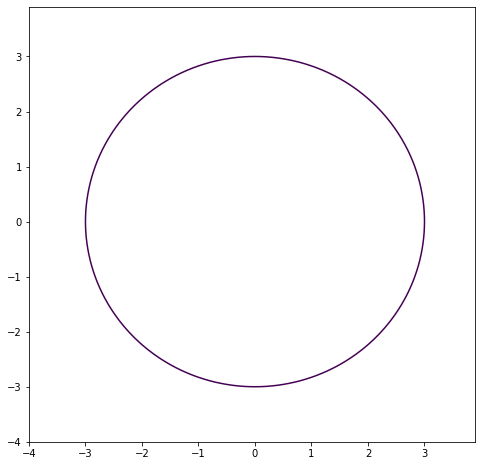

In [103]:
plt.figure(figsize=(8,8))
x = y = np.arange(-4, 4, 0.1)
x, y = np.meshgrid(x,y)
plt.contour(x, y, x**2 + y**2, [9])     #x**2 + y**2 = 9 的圆形

In [58]:
tt

array([[  0.0006326 ,  -0.55359697,   0.        ,   1.34683967],
       [  0.62197689,  39.18659043, -45.        ,  28.95489967],
       [  0.66806163,  79.68480372, -45.        ,  30.40335973],
       [  0.66098026,  69.0416008 , -45.        ,  37.02567376],
       [ -0.00029661,  -0.24736183,   0.        ,   0.30001172],
       [  0.65234189,  88.70708523, -45.        ,  24.38503253],
       [  0.00039009,  -0.38569802,  -0.        ,  -0.23981395],
       [  0.00248813,  -0.353617  ,   0.        ,  -2.12182197],
       [  0.68606605,  79.56012211, -45.        ,  40.38488171],
       [  0.65859836,  59.71387732, -45.        ,  29.2003868 ]])

/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: The following kwargs were not used by contour: 'color'
  after removing the cwd from sys.path.


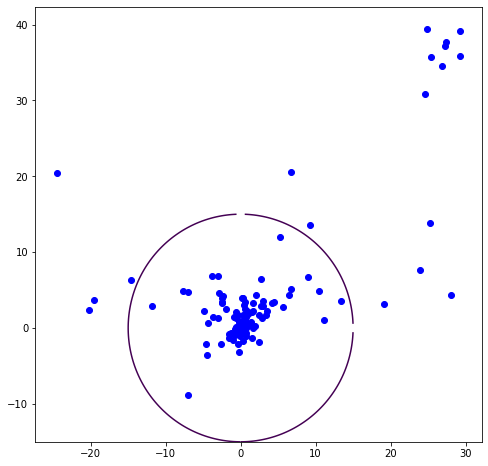

In [109]:
plt.figure(figsize=(8,8))
x = y = np.arange(-15, 15, 0.01)
x, y = np.meshgrid(x,y)
plt.contour(x, y, x**2 + y**2, [15*15], color='r')
plt.scatter(cp.asnumpy(tt[:,1]), cp.asnumpy(tt[:,3]), marker='o', color='b')